# **BUSINESS CASE 2: SIEMENS ADVANTA SALES FORECASTING**  


## 🎓 Master’s Program in Data Science & Advanced Analytics 
**Nova IMS** | March 2025   
**Course:** Business Cases with Data Science

## 👥 Team **Group A**  
- **Alice Viegas** | 20240572  
- **Bernardo Faria** | 20240579  
- **Dinis Pinto** | 20240612  
- **Daan van Holten** | 20240681
- **Philippe Dutranoit** | 20240518

## 📊 Goal of the notebook

In this notebook we make the build and test the models for forcasting. <br>

**Table of Contents** <br>
* [1. Initial Setup and DataLoading](#setup)
* [2. Predictions](#pred)
* [3. Export](#export)   

<hr>
<a class="anchor" id="setup">

 ## 1. Initial Setup and Data Loading
 </a>

In [23]:
import os
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
import itertools
from sklearn.metrics import mean_squared_error
from xgboost import XGBRegressor
from prophet import Prophet
from statsmodels.tsa.statespace.sarimax import SARIMAX


from Model_Functions import *

import importlib
imported_module = importlib.import_module("Model_Functions")
importlib.reload(imported_module)


<module 'Model_Functions' from '/Users/philippedutranoit/document_ordi/nova/business_case_for_data_sciense/cases/BC_DA_Siemens/Notebooks/Model_Functions.py'>

In [24]:
sales_agg1 = pd.read_csv('../data/sales_agg1.csv').set_index('DATE')
sales_agg3 = pd.read_csv('../data/sales_agg3.csv').set_index('DATE')
sales_agg4 = pd.read_csv('../data/sales_agg4.csv').set_index('DATE')
sales_agg5 = pd.read_csv('../data/sales_agg5.csv').set_index('DATE')
sales_agg6 = pd.read_csv('../data/sales_agg6.csv').set_index('DATE')
sales_agg8 = pd.read_csv('../data/sales_agg8.csv').set_index('DATE')
sales_agg9 = pd.read_csv('../data/sales_agg9.csv').set_index('DATE')
sales_agg11 = pd.read_csv('../data/sales_agg11.csv').set_index('DATE')
sales_agg12 = pd.read_csv('../data/sales_agg12.csv').set_index('DATE')
sales_agg13 = pd.read_csv('../data/sales_agg13.csv').set_index('DATE')
sales_agg14 = pd.read_csv('../data/sales_agg14.csv').set_index('DATE')
sales_agg16 = pd.read_csv('../data/sales_agg16.csv').set_index('DATE')
sales_agg20 = pd.read_csv('../data/sales_agg20.csv').set_index('DATE')
sales_agg36 = pd.read_csv('../data/sales_agg36.csv').set_index('DATE')

# extract the selected features list build in the feature selection step
selected_features_1 = pd.read_csv('../data/selected_features_1.csv')['selected_features'].tolist()
selected_features_3 = pd.read_csv('../data/selected_features_3.csv')['selected_features'].tolist()
selected_features_4 = pd.read_csv('../data/selected_features_4.csv')['selected_features'].tolist()
selected_features_5 = pd.read_csv('../data/selected_features_5.csv')['selected_features'].tolist()
selected_features_6 = pd.read_csv('../data/selected_features_6.csv')['selected_features'].tolist()
selected_features_8 = pd.read_csv('../data/selected_features_8.csv')['selected_features'].tolist()
selected_features_9 = pd.read_csv('../data/selected_features_9.csv')['selected_features'].tolist()
selected_features_11 = pd.read_csv('../data/selected_features_11.csv')['selected_features'].tolist()
selected_features_12 = pd.read_csv('../data/selected_features_12.csv')['selected_features'].tolist()
selected_features_13 = pd.read_csv('../data/selected_features_13.csv')['selected_features'].tolist()
selected_features_14 = pd.read_csv('../data/selected_features_14.csv')['selected_features'].tolist()
selected_features_16 = pd.read_csv('../data/selected_features_16.csv')['selected_features'].tolist()
selected_features_20 = pd.read_csv('../data/selected_features_20.csv')['selected_features'].tolist()
selected_features_36 = pd.read_csv('../data/selected_features_36.csv')['selected_features'].tolist()


# load the market data
df_market = pd.read_csv('../data/Market_data_predicted.csv').set_index('date')
test_set = pd.read_csv('../Data/Case2_Test Set Template.csv', sep=';')
print(sales_agg1.head())
df_market.head()


               Sales_EUR
DATE                    
2018-10-01  3.609892e+07
2018-11-01  3.699427e+07
2018-12-01  3.788961e+07
2019-01-01  2.772815e+07
2019-02-01  3.479316e+07


,MAB_ELE_PRO156,MAB_ELE_SHP156,MAB_ELE_SHP250,MAB_ELE_PRO392,MAB_ELE_SHP392,MAB_ELE_PRO756,MAB_ELE_SHP756,MAB_ELE_PRO826,MAB_ELE_SHP826,MAB_ELE_SHP840,...,PRI27380_org,PRI27250_org,PRI27276_org,PRO28756_org,PRO28392_org,PRO271000_org,PRO27756_org,PRO27826_org,PRO27392_org,PRO27276_org
date,,,,,,,,,,,,,,,,,,,,,
2004-02-01,16.940704,16.940704,83.458866,109.334010,110.495272,86.074496,80.962532,111.353812,77.766367,90.442749,...,93.020027,96.864647,93.230453,96.177481,110.890034,91.390440,68.677657,120.706516,106.161262,85.913200
2004-03-01,23.711852,23.711852,106.168192,140.884616,144.686166,86.038258,80.912352,127.558608,77.829225,90.580357,...,93.540268,96.864653,93.335678,96.250927,141.176853,91.511498,68.452548,138.309550,140.288741,97.670815
2004-04-01,24.435235,24.435235,92.007646,105.853579,102.655769,85.997063,80.857863,108.732297,77.904642,90.751805,...,93.852425,96.864659,93.440903,96.330211,105.648765,91.666790,68.203892,115.557330,106.271197,87.253983
2004-05-01,23.708115,23.708115,85.696486,101.864777,100.305285,85.951483,80.800601,110.645200,77.993606,90.961426,...,93.852425,96.864666,93.546127,96.413549,101.990361,91.861457,67.936322,119.269534,101.608710,84.675552
2004-06-01,27.009138,27.009138,106.641482,120.332920,119.616380,85.902640,80.742724,122.020960,78.096995,91.213203,...,93.956467,96.864672,93.440903,96.499291,122.136575,92.100289,67.655734,128.849416,116.655248,95.401802


In [25]:
def parse_month_year(date_string):
    month_map = {
    "Jan": 1,
    "Feb": 2,
    "Mai": 5,
    "Jun": 6,
    "Jul": 7,
    "Aug": 8,
    "Sep": 9,
    "Okt": 10,
    "Nov": 11,
    "Dez": 12
    }

    month_abbr = date_string[:3]
    year_suffix = date_string[-2:]
    month_num = month_map.get(month_abbr)

    if not month_num:
        raise ValueError(f"Unknown month abbreviation: {month_abbr}")
    
    return datetime.strptime(f"{month_num} 01 {year_suffix}", "%m %d %y").date()
# Apply conversion safely
test_set['Month Year'] = test_set['Month Year'].apply(parse_month_year)

<hr>
<a class="anchor" id="pred">

 ## 2. Predictions
 </a>

## Create the lag market data feature needed for the model

In [26]:
df_market = create_lag_features(df_market, 6)
df_market.head()

/Users/philippedutranoit/document_ordi/nova/business_case_for_data_sciense/cases/BC_DA_Siemens/Notebooks/Model_Functions.py:31: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_lagging[f'{col}_lag_{lag}'] = df_lagging[col].shift(lag)
/Users/philippedutranoit/document_ordi/nova/business_case_for_data_sciense/cases/BC_DA_Siemens/Notebooks/Model_Functions.py:31: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_lagging[f'{col}_lag_{lag}'] = df_lagging[col].shift(lag)
/Users/philippedutranoit/document_ordi/nova/business_case_for_data

,MAB_ELE_PRO156,MAB_ELE_SHP156,MAB_ELE_SHP250,MAB_ELE_PRO392,MAB_ELE_SHP392,MAB_ELE_PRO756,MAB_ELE_SHP756,MAB_ELE_PRO826,MAB_ELE_SHP826,MAB_ELE_SHP840,...,PRI27380_org_lag_6,PRI27250_org_lag_6,PRI27276_org_lag_6,PRO28756_org_lag_6,PRO28392_org_lag_6,PRO271000_org_lag_6,PRO27756_org_lag_6,PRO27826_org_lag_6,PRO27392_org_lag_6,PRO27276_org_lag_6
date,,,,,,,,,,,,,,,,,,,,,
2004-02-01,16.940704,16.940704,83.458866,109.334010,110.495272,86.074496,80.962532,111.353812,77.766367,90.442749,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2004-03-01,23.711852,23.711852,106.168192,140.884616,144.686166,86.038258,80.912352,127.558608,77.829225,90.580357,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2004-04-01,24.435235,24.435235,92.007646,105.853579,102.655769,85.997063,80.857863,108.732297,77.904642,90.751805,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2004-05-01,23.708115,23.708115,85.696486,101.864777,100.305285,85.951483,80.800601,110.645200,77.993606,90.961426,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2004-06-01,27.009138,27.009138,106.641482,120.332920,119.616380,85.902640,80.742724,122.020960,78.096995,91.213203,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Define the parameter grid to run

In [27]:
# REAL GRID SEARCGH

xgboost_param_grid = {
    'n_estimators': [50,100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.3],
    'subsample': [0.5, 0.7],
    'colsample_bytree': [0.5, 0.7, 1],
    'gamma': [0, 0.1, 0.3],
    'reg_alpha': [0, 0.1, 0.5],
    'reg_lambda': [0, 0.1, 0.5]
}

prophet_param_grid = {
    'seasonality_mode': ['additive', 'multiplicative'],
    'yearly_seasonality': [True, False],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],
    'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5],
    'changepoint_range': [0.8, 0.9, 1.0]
}

sarima_param_grid = {
    'p': [0, 1, 2],
    'd': [0, 1],
    'q': [0, 1, 2],
    'P': [0, 1],
    'D': [0, 1],
    'Q': [0, 1],
    's': [6, 12]
}

## TEST GRID SEARCH (see if everything works)
# xgboost_param_grid = {
#     'n_estimators': [200],
#     'max_depth': [ 7],
#     'learning_rate': [0.3],
#     'subsample': [0.7],
#     'colsample_bytree': [1],
#     'gamma': [0.3],
#     'reg_alpha': [0.5],
#     'reg_lambda': [0.5]
# }

# prophet_param_grid = {
#     'seasonality_mode': ['multiplicative'],
#     'yearly_seasonality': [False],
#     'seasonality_prior_scale': [10.0],
#     'changepoint_prior_scale': [0.5],
#     'changepoint_range': [1.0]
# }

# sarima_param_grid = {
#     'p': [0],
#     'd': [0],
#     'q': [0],
#     'P': [0],
#     'D': [0],
#     'Q': [0],
#     's': [6]
# }

# Product 1

In [28]:
# selecte only the features that are selected in the feature selection step
test_set_1 = test_set[test_set['Mapped_GCK'] == '#1']
df_market_1 = df_market[selected_features_1]
df_market_1.head()

,PRO27826_org_lag_1,PRO27826_org,MAB_ELE_PRO756_lag_1,PRI27380_org,PRO271000_org_lag_5,PRO27392_org_lag_3,PRO28392_org_lag_6
date,,,,,,,
2004-02-01,NaN,120.706516,NaN,93.020027,NaN,NaN,NaN
2004-03-01,120.706516,138.309550,86.074496,93.540268,NaN,NaN,NaN
2004-04-01,138.309550,115.557330,86.038258,93.852425,NaN,NaN,NaN
2004-05-01,115.557330,119.269534,85.997063,93.852425,NaN,106.161262,NaN
2004-06-01,119.269534,128.849416,85.951483,93.956467,NaN,140.288741,NaN


## Xgboost

In [29]:
X_train, X_val, y_train, y_val = train_val_split(sales_agg1, df_market_1, train_size = 0.8)

X_val.info() 

xgboost_best_model_1, xgboost_best_params_1, xgboost_best_rmse_1 = model_evaluation_XGboost(X_train,
                                                                                             y_train, 
                                                                                             X_val, y_val, 
                                                                                             xgboost_param_grid)

print("Best Params:", xgboost_best_params_1)
print("Validation RMSE:", xgboost_best_rmse_1)


<class 'pandas.core.frame.DataFrame'>
Index: 9 entries, 2021-08-01 to 2022-04-01
Data columns (total 7 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   PRO27826_org_lag_1    9 non-null      float64
 1   PRO27826_org          9 non-null      float64
 2   MAB_ELE_PRO756_lag_1  9 non-null      float64
 3   PRI27380_org          9 non-null      float64
 4   PRO271000_org_lag_5   9 non-null      float64
 5   PRO27392_org_lag_3    9 non-null      float64
 6   PRO28392_org_lag_6    9 non-null      float64
dtypes: float64(7)
memory usage: 576.0+ bytes
Params: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.01, 'subsample': 0.5, 'colsample_bytree': 0.5, 'gamma': 0, 'reg_alpha': 0, 'reg_lambda': 0} => RMSE: 3322121.9924, Relative RMSE: 0.0878
Params: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.01, 'subsample': 0.5, 'colsample_bytree': 0.5, 'gamma': 0, 'reg_alpha': 0, 'reg_lambda': 0.1} => RMSE: 3348736.8670, 

## Prophet

In [30]:
prophet_best_model_1, prophet_best_params_1, prophet_best_rmse_1 = model_evaluation_prophet(X_train,
                                                                                             y_train, 
                                                                                             X_val, 
                                                                                             y_val, 
                                                                                             prophet_param_grid)

print("Best Params:", prophet_best_params_1)

print("Validation RMSE:", prophet_best_rmse_1)

00:26:54 - cmdstanpy - INFO - Chain [1] start processing
00:26:54 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 3638288.3667, Relative RMSE: 0.0961


00:26:54 - cmdstanpy - INFO - Chain [1] start processing
00:26:54 - cmdstanpy - INFO - Chain [1] done processing
00:26:54 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 3638341.9007, Relative RMSE: 0.0961


00:26:54 - cmdstanpy - INFO - Chain [1] done processing
00:26:54 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 3638158.4372, Relative RMSE: 0.0961


00:26:54 - cmdstanpy - INFO - Chain [1] done processing
00:26:54 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 3651670.0176, Relative RMSE: 0.0965


00:26:54 - cmdstanpy - INFO - Chain [1] done processing
00:26:55 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 3651651.6319, Relative RMSE: 0.0965


00:26:55 - cmdstanpy - INFO - Chain [1] done processing
00:26:55 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 3651968.5080, Relative RMSE: 0.0965


00:26:55 - cmdstanpy - INFO - Chain [1] done processing
00:26:55 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 3649912.8780, Relative RMSE: 0.0964


00:26:55 - cmdstanpy - INFO - Chain [1] done processing
00:26:55 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 3655990.6211, Relative RMSE: 0.0966


00:26:55 - cmdstanpy - INFO - Chain [1] done processing
00:26:55 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 3647620.4294, Relative RMSE: 0.0964


00:26:55 - cmdstanpy - INFO - Chain [1] done processing
00:26:55 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 3486800.1184, Relative RMSE: 0.0921


00:26:56 - cmdstanpy - INFO - Chain [1] done processing
00:26:56 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 3284006.1075, Relative RMSE: 0.0867


00:26:56 - cmdstanpy - INFO - Chain [1] done processing
00:26:56 - cmdstanpy - INFO - Chain [1] start processing
00:26:56 - cmdstanpy - INFO - Chain [1] done processing
00:26:56 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 3317165.2249, Relative RMSE: 0.0876
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 3585853.0709, Relative RMSE: 0.0947


00:26:56 - cmdstanpy - INFO - Chain [1] done processing
00:26:56 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 3589393.8411, Relative RMSE: 0.0948


00:26:57 - cmdstanpy - INFO - Chain [1] done processing
00:26:57 - cmdstanpy - INFO - Chain [1] start processing
00:26:57 - cmdstanpy - INFO - Chain [1] done processing
00:26:57 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 3481303.9607, Relative RMSE: 0.0920
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 3787641.9395, Relative RMSE: 0.1000


00:26:57 - cmdstanpy - INFO - Chain [1] done processing
00:26:57 - cmdstanpy - INFO - Chain [1] start processing
00:26:57 - cmdstanpy - INFO - Chain [1] done processing
00:26:57 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 3787609.4197, Relative RMSE: 0.1000
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 3787638.4934, Relative RMSE: 0.1000


00:26:57 - cmdstanpy - INFO - Chain [1] done processing
00:26:57 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 3789570.6226, Relative RMSE: 0.1001


00:26:58 - cmdstanpy - INFO - Chain [1] done processing
00:26:58 - cmdstanpy - INFO - Chain [1] start processing
00:26:58 - cmdstanpy - INFO - Chain [1] done processing
00:26:58 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 3789123.2158, Relative RMSE: 0.1001
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 3791228.0377, Relative RMSE: 0.1001


00:26:58 - cmdstanpy - INFO - Chain [1] done processing
00:26:58 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 3681982.2410, Relative RMSE: 0.0973


00:26:58 - cmdstanpy - INFO - Chain [1] done processing
00:26:58 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 3728516.1655, Relative RMSE: 0.0985


00:26:59 - cmdstanpy - INFO - Chain [1] done processing
00:26:59 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 3684240.4209, Relative RMSE: 0.0973


00:26:59 - cmdstanpy - INFO - Chain [1] done processing
00:26:59 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 8145196.5590, Relative RMSE: 0.2152


00:27:00 - cmdstanpy - INFO - Chain [1] done processing
00:27:00 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 8131381.6374, Relative RMSE: 0.2148


00:27:00 - cmdstanpy - INFO - Chain [1] done processing
00:27:00 - cmdstanpy - INFO - Chain [1] start processing
00:27:00 - cmdstanpy - INFO - Chain [1] done processing
00:27:00 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 8146882.5479, Relative RMSE: 0.2152
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 8032357.9068, Relative RMSE: 0.2122


00:27:00 - cmdstanpy - INFO - Chain [1] done processing
00:27:01 - cmdstanpy - INFO - Chain [1] start processing
00:27:01 - cmdstanpy - INFO - Chain [1] done processing
00:27:01 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 8025815.8672, Relative RMSE: 0.2120
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 8033703.4700, Relative RMSE: 0.2122


00:27:01 - cmdstanpy - INFO - Chain [1] done processing
00:27:01 - cmdstanpy - INFO - Chain [1] start processing
00:27:01 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 8405306.7856, Relative RMSE: 0.2220


00:27:01 - cmdstanpy - INFO - Chain [1] start processing
00:27:01 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 7769166.4508, Relative RMSE: 0.2052


00:27:01 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 8431976.3213, Relative RMSE: 0.2227


00:27:02 - cmdstanpy - INFO - Chain [1] done processing
00:27:02 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 9543803.0328, Relative RMSE: 0.2521


00:27:02 - cmdstanpy - INFO - Chain [1] done processing
00:27:02 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 9082218.8282, Relative RMSE: 0.2399


00:27:02 - cmdstanpy - INFO - Chain [1] done processing
00:27:02 - cmdstanpy - INFO - Chain [1] start processing
00:27:02 - cmdstanpy - INFO - Chain [1] done processing
00:27:02 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 8873436.2288, Relative RMSE: 0.2344
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 8002545.7750, Relative RMSE: 0.2114


00:27:03 - cmdstanpy - INFO - Chain [1] done processing
00:27:03 - cmdstanpy - INFO - Chain [1] start processing
00:27:03 - cmdstanpy - INFO - Chain [1] done processing
00:27:03 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 8000362.7334, Relative RMSE: 0.2113
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 8033585.9499, Relative RMSE: 0.2122


00:27:03 - cmdstanpy - INFO - Chain [1] done processing
00:27:03 - cmdstanpy - INFO - Chain [1] start processing
00:27:03 - cmdstanpy - INFO - Chain [1] done processing
00:27:03 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 8355816.4945, Relative RMSE: 0.2207
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 8323635.1316, Relative RMSE: 0.2199


00:27:03 - cmdstanpy - INFO - Chain [1] done processing
00:27:03 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 8290079.3458, Relative RMSE: 0.2190


00:27:04 - cmdstanpy - INFO - Chain [1] done processing
00:27:04 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 8566558.6171, Relative RMSE: 0.2263


00:27:04 - cmdstanpy - INFO - Chain [1] done processing
00:27:04 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 7823310.3117, Relative RMSE: 0.2067


00:27:04 - cmdstanpy - INFO - Chain [1] done processing
00:27:04 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 7814792.4673, Relative RMSE: 0.2064


00:27:05 - cmdstanpy - INFO - Chain [1] done processing
00:27:05 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 9886883.0904, Relative RMSE: 0.2612


00:27:05 - cmdstanpy - INFO - Chain [1] done processing
00:27:05 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 9456694.5787, Relative RMSE: 0.2498


00:27:05 - cmdstanpy - INFO - Chain [1] done processing
00:27:05 - cmdstanpy - INFO - Chain [1] start processing
00:27:06 - cmdstanpy - INFO - Chain [1] done processing
00:27:06 - cmdstanpy - INFO - Chain [1] start processing
00:27:06 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 9624160.8283, Relative RMSE: 0.2542
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 3759519.5387, Relative RMSE: 0.0993


00:27:06 - cmdstanpy - INFO - Chain [1] start processing
00:27:06 - cmdstanpy - INFO - Chain [1] done processing
00:27:06 - cmdstanpy - INFO - Chain [1] start processing
00:27:06 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 3759523.5591, Relative RMSE: 0.0993
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 3759318.0226, Relative RMSE: 0.0993


00:27:06 - cmdstanpy - INFO - Chain [1] start processing
00:27:06 - cmdstanpy - INFO - Chain [1] done processing
00:27:06 - cmdstanpy - INFO - Chain [1] start processing
00:27:06 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 3689102.8841, Relative RMSE: 0.0974
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 3689153.1274, Relative RMSE: 0.0974
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 3689118.2694, Relative RMSE: 0.0974


00:27:06 - cmdstanpy - INFO - Chain [1] start processing
00:27:06 - cmdstanpy - INFO - Chain [1] done processing
00:27:06 - cmdstanpy - INFO - Chain [1] start processing
00:27:06 - cmdstanpy - INFO - Chain [1] done processing
00:27:06 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 3697621.0274, Relative RMSE: 0.0977
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 3700087.8313, Relative RMSE: 0.0977


00:27:06 - cmdstanpy - INFO - Chain [1] done processing
00:27:06 - cmdstanpy - INFO - Chain [1] start processing
00:27:07 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 3695200.9487, Relative RMSE: 0.0976


00:27:07 - cmdstanpy - INFO - Chain [1] start processing
00:27:07 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 3669936.6345, Relative RMSE: 0.0969
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 3518245.0009, Relative RMSE: 0.0929


00:27:07 - cmdstanpy - INFO - Chain [1] start processing
00:27:07 - cmdstanpy - INFO - Chain [1] done processing
00:27:07 - cmdstanpy - INFO - Chain [1] start processing
00:27:07 - cmdstanpy - INFO - Chain [1] done processing
00:27:07 - cmdstanpy - INFO - Chain [1] start processing
00:27:07 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 3664646.5127, Relative RMSE: 0.0968
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 3759519.5387, Relative RMSE: 0.0993
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 3759523.5591, Relative RMSE: 0.0993


00:27:07 - cmdstanpy - INFO - Chain [1] start processing
00:27:07 - cmdstanpy - INFO - Chain [1] done processing
00:27:07 - cmdstanpy - INFO - Chain [1] start processing
00:27:07 - cmdstanpy - INFO - Chain [1] done processing
00:27:07 - cmdstanpy - INFO - Chain [1] start processing
00:27:07 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 3759318.0226, Relative RMSE: 0.0993
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 3689102.8841, Relative RMSE: 0.0974
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 3689153.1274, Relative RMSE: 0.0974


00:27:07 - cmdstanpy - INFO - Chain [1] start processing
00:27:08 - cmdstanpy - INFO - Chain [1] done processing
00:27:08 - cmdstanpy - INFO - Chain [1] start processing
00:27:08 - cmdstanpy - INFO - Chain [1] done processing
00:27:08 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 3689118.2694, Relative RMSE: 0.0974
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 3697621.0274, Relative RMSE: 0.0977


00:27:08 - cmdstanpy - INFO - Chain [1] done processing
00:27:08 - cmdstanpy - INFO - Chain [1] start processing
00:27:08 - cmdstanpy - INFO - Chain [1] done processing
00:27:08 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 3700087.8313, Relative RMSE: 0.0977
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 3695200.9487, Relative RMSE: 0.0976


00:27:08 - cmdstanpy - INFO - Chain [1] done processing
00:27:08 - cmdstanpy - INFO - Chain [1] start processing
00:27:08 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 3669936.6345, Relative RMSE: 0.0969


00:27:08 - cmdstanpy - INFO - Chain [1] start processing
00:27:09 - cmdstanpy - INFO - Chain [1] done processing
00:27:09 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 3518245.0009, Relative RMSE: 0.0929
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 3664646.5127, Relative RMSE: 0.0968


00:27:09 - cmdstanpy - INFO - Chain [1] done processing
00:27:09 - cmdstanpy - INFO - Chain [1] start processing
00:27:09 - cmdstanpy - INFO - Chain [1] done processing
00:27:09 - cmdstanpy - INFO - Chain [1] start processing
00:27:09 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 3759519.5387, Relative RMSE: 0.0993
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 3759523.5591, Relative RMSE: 0.0993


00:27:09 - cmdstanpy - INFO - Chain [1] start processing
00:27:09 - cmdstanpy - INFO - Chain [1] done processing
00:27:09 - cmdstanpy - INFO - Chain [1] start processing
00:27:09 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 3759318.0226, Relative RMSE: 0.0993
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 3689102.8841, Relative RMSE: 0.0974
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 3689153.1274, Relative RMSE: 0.0974


00:27:09 - cmdstanpy - INFO - Chain [1] start processing
00:27:09 - cmdstanpy - INFO - Chain [1] done processing
00:27:09 - cmdstanpy - INFO - Chain [1] start processing
00:27:09 - cmdstanpy - INFO - Chain [1] done processing
00:27:09 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 3689118.2694, Relative RMSE: 0.0974
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 3697621.0274, Relative RMSE: 0.0977


00:27:09 - cmdstanpy - INFO - Chain [1] done processing
00:27:09 - cmdstanpy - INFO - Chain [1] start processing
00:27:09 - cmdstanpy - INFO - Chain [1] done processing
00:27:09 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 3700087.8313, Relative RMSE: 0.0977
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 3695200.9487, Relative RMSE: 0.0976


00:27:10 - cmdstanpy - INFO - Chain [1] done processing
00:27:10 - cmdstanpy - INFO - Chain [1] start processing
00:27:10 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 3669936.6345, Relative RMSE: 0.0969
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 3518245.0009, Relative RMSE: 0.0929


00:27:10 - cmdstanpy - INFO - Chain [1] start processing
00:27:10 - cmdstanpy - INFO - Chain [1] done processing
00:27:10 - cmdstanpy - INFO - Chain [1] start processing
00:27:10 - cmdstanpy - INFO - Chain [1] done processing
00:27:10 - cmdstanpy - INFO - Chain [1] start processing
00:27:10 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 3664646.5127, Relative RMSE: 0.0968
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 3759519.5387, Relative RMSE: 0.0993
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 3759523.5591, Relative RMSE: 0.0993


00:27:10 - cmdstanpy - INFO - Chain [1] start processing
00:27:10 - cmdstanpy - INFO - Chain [1] done processing
00:27:10 - cmdstanpy - INFO - Chain [1] start processing
00:27:10 - cmdstanpy - INFO - Chain [1] done processing
00:27:10 - cmdstanpy - INFO - Chain [1] start processing
00:27:11 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 3759318.0226, Relative RMSE: 0.0993
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 3689102.8841, Relative RMSE: 0.0974
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 3689153.1274, Relative RMSE: 0.0974


00:27:11 - cmdstanpy - INFO - Chain [1] start processing
00:27:11 - cmdstanpy - INFO - Chain [1] done processing
00:27:11 - cmdstanpy - INFO - Chain [1] start processing
00:27:11 - cmdstanpy - INFO - Chain [1] done processing
00:27:11 - cmdstanpy - INFO - Chain [1] start processing
00:27:11 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 3689118.2694, Relative RMSE: 0.0974
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 3697621.0274, Relative RMSE: 0.0977


00:27:11 - cmdstanpy - INFO - Chain [1] start processing
00:27:11 - cmdstanpy - INFO - Chain [1] done processing
00:27:11 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 3700087.8313, Relative RMSE: 0.0977
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 3695200.9487, Relative RMSE: 0.0976


00:27:11 - cmdstanpy - INFO - Chain [1] done processing
00:27:11 - cmdstanpy - INFO - Chain [1] start processing
00:27:11 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 3669936.6345, Relative RMSE: 0.0969
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 3518245.0009, Relative RMSE: 0.0929


00:27:11 - cmdstanpy - INFO - Chain [1] start processing
00:27:12 - cmdstanpy - INFO - Chain [1] done processing
00:27:12 - cmdstanpy - INFO - Chain [1] start processing
00:27:12 - cmdstanpy - INFO - Chain [1] done processing
00:27:12 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 3664646.5127, Relative RMSE: 0.0968
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 3647177.2303, Relative RMSE: 0.0963


00:27:12 - cmdstanpy - INFO - Chain [1] done processing
00:27:12 - cmdstanpy - INFO - Chain [1] start processing
00:27:12 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 3647154.7033, Relative RMSE: 0.0963
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 3647176.3294, Relative RMSE: 0.0963


00:27:12 - cmdstanpy - INFO - Chain [1] start processing
00:27:12 - cmdstanpy - INFO - Chain [1] done processing
00:27:12 - cmdstanpy - INFO - Chain [1] start processing
00:27:12 - cmdstanpy - INFO - Chain [1] done processing
00:27:12 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 3643728.8009, Relative RMSE: 0.0962
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 3643678.4355, Relative RMSE: 0.0962


00:27:12 - cmdstanpy - INFO - Chain [1] done processing
00:27:12 - cmdstanpy - INFO - Chain [1] start processing
00:27:13 - cmdstanpy - INFO - Chain [1] done processing
00:27:13 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 3643735.7009, Relative RMSE: 0.0962
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 3639852.5097, Relative RMSE: 0.0961


00:27:13 - cmdstanpy - INFO - Chain [1] done processing
00:27:13 - cmdstanpy - INFO - Chain [1] start processing
00:27:13 - cmdstanpy - INFO - Chain [1] done processing
00:27:13 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 3640220.9014, Relative RMSE: 0.0962
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 3643943.2973, Relative RMSE: 0.0963


00:27:13 - cmdstanpy - INFO - Chain [1] done processing
00:27:13 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 3457733.4089, Relative RMSE: 0.0913


00:27:13 - cmdstanpy - INFO - Chain [1] done processing
00:27:13 - cmdstanpy - INFO - Chain [1] start processing
00:27:14 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 3343713.4687, Relative RMSE: 0.0883


00:27:14 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 3384784.7386, Relative RMSE: 0.0894


00:27:14 - cmdstanpy - INFO - Chain [1] done processing
00:27:14 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 3482302.8515, Relative RMSE: 0.0920


00:27:15 - cmdstanpy - INFO - Chain [1] done processing
00:27:15 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 3455917.2418, Relative RMSE: 0.0913


00:27:16 - cmdstanpy - INFO - Chain [1] done processing
00:27:16 - cmdstanpy - INFO - Chain [1] start processing
00:27:16 - cmdstanpy - INFO - Chain [1] done processing
00:27:16 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 3456146.4507, Relative RMSE: 0.0913
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 3684744.4937, Relative RMSE: 0.0973


00:27:16 - cmdstanpy - INFO - Chain [1] done processing
00:27:16 - cmdstanpy - INFO - Chain [1] start processing
00:27:16 - cmdstanpy - INFO - Chain [1] done processing
00:27:16 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 3684609.5713, Relative RMSE: 0.0973
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 3689267.8227, Relative RMSE: 0.0975


00:27:16 - cmdstanpy - INFO - Chain [1] done processing
00:27:17 - cmdstanpy - INFO - Chain [1] start processing
00:27:17 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 3681532.1269, Relative RMSE: 0.0972


00:27:17 - cmdstanpy - INFO - Chain [1] start processing
00:27:17 - cmdstanpy - INFO - Chain [1] done processing
00:27:17 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 3680610.4068, Relative RMSE: 0.0972
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 3680023.3634, Relative RMSE: 0.0972


00:27:17 - cmdstanpy - INFO - Chain [1] done processing
00:27:17 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 3607775.0477, Relative RMSE: 0.0953


00:27:17 - cmdstanpy - INFO - Chain [1] done processing
00:27:17 - cmdstanpy - INFO - Chain [1] start processing
00:27:18 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 3594370.5584, Relative RMSE: 0.0949


00:27:18 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 3597636.1589, Relative RMSE: 0.0950


00:27:18 - cmdstanpy - INFO - Chain [1] done processing
00:27:18 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 7979890.4133, Relative RMSE: 0.2108


00:27:19 - cmdstanpy - INFO - Chain [1] done processing
00:27:19 - cmdstanpy - INFO - Chain [1] start processing
00:27:19 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 7979422.2889, Relative RMSE: 0.2108


00:27:19 - cmdstanpy - INFO - Chain [1] start processing
00:27:19 - cmdstanpy - INFO - Chain [1] done processing
00:27:19 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 7980228.0902, Relative RMSE: 0.2108
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 8001598.0331, Relative RMSE: 0.2114


00:27:19 - cmdstanpy - INFO - Chain [1] done processing
00:27:19 - cmdstanpy - INFO - Chain [1] start processing
00:27:19 - cmdstanpy - INFO - Chain [1] done processing
00:27:19 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 7995856.3465, Relative RMSE: 0.2112
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 7984483.1185, Relative RMSE: 0.2109


00:27:20 - cmdstanpy - INFO - Chain [1] done processing
00:27:20 - cmdstanpy - INFO - Chain [1] start processing
00:27:20 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 9024136.6634, Relative RMSE: 0.2384


00:27:20 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 9697162.8440, Relative RMSE: 0.2561


00:27:20 - cmdstanpy - INFO - Chain [1] done processing
00:27:20 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 9029763.1012, Relative RMSE: 0.2385


00:27:20 - cmdstanpy - INFO - Chain [1] done processing
00:27:20 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 10583075.8762, Relative RMSE: 0.2795


00:27:21 - cmdstanpy - INFO - Chain [1] done processing
00:27:21 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 10477419.5534, Relative RMSE: 0.2768


00:27:21 - cmdstanpy - INFO - Chain [1] done processing
00:27:21 - cmdstanpy - INFO - Chain [1] start processing
00:27:21 - cmdstanpy - INFO - Chain [1] done processing
00:27:21 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 10219429.2599, Relative RMSE: 0.2699
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 8183342.6839, Relative RMSE: 0.2162


00:27:21 - cmdstanpy - INFO - Chain [1] done processing
00:27:21 - cmdstanpy - INFO - Chain [1] start processing
00:27:21 - cmdstanpy - INFO - Chain [1] done processing
00:27:22 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 8182918.2048, Relative RMSE: 0.2161
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 8176163.0956, Relative RMSE: 0.2160


00:27:22 - cmdstanpy - INFO - Chain [1] done processing
00:27:22 - cmdstanpy - INFO - Chain [1] start processing
00:27:22 - cmdstanpy - INFO - Chain [1] done processing
00:27:22 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 8254398.5198, Relative RMSE: 0.2180
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 8254420.2812, Relative RMSE: 0.2180


00:27:22 - cmdstanpy - INFO - Chain [1] done processing
00:27:22 - cmdstanpy - INFO - Chain [1] start processing
00:27:22 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 8260473.4153, Relative RMSE: 0.2182


00:27:22 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 8542672.0486, Relative RMSE: 0.2257


00:27:22 - cmdstanpy - INFO - Chain [1] done processing
00:27:22 - cmdstanpy - INFO - Chain [1] start processing
00:27:23 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 9261649.2198, Relative RMSE: 0.2446


00:27:23 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 9258400.9120, Relative RMSE: 0.2446


00:27:23 - cmdstanpy - INFO - Chain [1] done processing
00:27:23 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 10891279.0519, Relative RMSE: 0.2877


00:27:23 - cmdstanpy - INFO - Chain [1] done processing
00:27:23 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 10638288.6309, Relative RMSE: 0.2810


00:27:24 - cmdstanpy - INFO - Chain [1] done processing
00:27:24 - cmdstanpy - INFO - Chain [1] start processing
00:27:24 - cmdstanpy - INFO - Chain [1] done processing
00:27:24 - cmdstanpy - INFO - Chain [1] start processing
00:27:24 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 10511431.6196, Relative RMSE: 0.2777
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 3759519.5387, Relative RMSE: 0.0993


00:27:24 - cmdstanpy - INFO - Chain [1] start processing
00:27:24 - cmdstanpy - INFO - Chain [1] done processing
00:27:24 - cmdstanpy - INFO - Chain [1] start processing
00:27:24 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 3759523.5591, Relative RMSE: 0.0993
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 3759318.0226, Relative RMSE: 0.0993


00:27:24 - cmdstanpy - INFO - Chain [1] start processing
00:27:24 - cmdstanpy - INFO - Chain [1] done processing
00:27:24 - cmdstanpy - INFO - Chain [1] start processing
00:27:24 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 3689102.8841, Relative RMSE: 0.0974
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 3689153.1274, Relative RMSE: 0.0974
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 3689118.2694, Relative RMSE: 0.0974


00:27:24 - cmdstanpy - INFO - Chain [1] start processing
00:27:24 - cmdstanpy - INFO - Chain [1] done processing
00:27:24 - cmdstanpy - INFO - Chain [1] start processing
00:27:24 - cmdstanpy - INFO - Chain [1] done processing
00:27:24 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 3697621.0274, Relative RMSE: 0.0977
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 3700087.8313, Relative RMSE: 0.0977


00:27:25 - cmdstanpy - INFO - Chain [1] done processing
00:27:25 - cmdstanpy - INFO - Chain [1] start processing
00:27:25 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 3695200.9487, Relative RMSE: 0.0976


00:27:25 - cmdstanpy - INFO - Chain [1] start processing
00:27:25 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 3669936.6345, Relative RMSE: 0.0969
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 3518245.0009, Relative RMSE: 0.0929


00:27:25 - cmdstanpy - INFO - Chain [1] start processing
00:27:25 - cmdstanpy - INFO - Chain [1] done processing
00:27:25 - cmdstanpy - INFO - Chain [1] start processing
00:27:25 - cmdstanpy - INFO - Chain [1] done processing
00:27:25 - cmdstanpy - INFO - Chain [1] start processing
00:27:25 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 3664646.5127, Relative RMSE: 0.0968
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 3759519.5387, Relative RMSE: 0.0993


00:27:25 - cmdstanpy - INFO - Chain [1] start processing
00:27:25 - cmdstanpy - INFO - Chain [1] done processing
00:27:25 - cmdstanpy - INFO - Chain [1] start processing
00:27:26 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 3759523.5591, Relative RMSE: 0.0993
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 3759318.0226, Relative RMSE: 0.0993


00:27:26 - cmdstanpy - INFO - Chain [1] start processing
00:27:26 - cmdstanpy - INFO - Chain [1] done processing
00:27:26 - cmdstanpy - INFO - Chain [1] start processing
00:27:26 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 3689102.8841, Relative RMSE: 0.0974
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 3689153.1274, Relative RMSE: 0.0974
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 3689118.2694, Relative RMSE: 0.0974


00:27:26 - cmdstanpy - INFO - Chain [1] start processing
00:27:26 - cmdstanpy - INFO - Chain [1] done processing
00:27:26 - cmdstanpy - INFO - Chain [1] start processing
00:27:26 - cmdstanpy - INFO - Chain [1] done processing
00:27:26 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 3697621.0274, Relative RMSE: 0.0977
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 3700087.8313, Relative RMSE: 0.0977


00:27:26 - cmdstanpy - INFO - Chain [1] done processing
00:27:26 - cmdstanpy - INFO - Chain [1] start processing
00:27:26 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 3695200.9487, Relative RMSE: 0.0976


00:27:26 - cmdstanpy - INFO - Chain [1] start processing
00:27:27 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 3669936.6345, Relative RMSE: 0.0969


00:27:27 - cmdstanpy - INFO - Chain [1] start processing
00:27:27 - cmdstanpy - INFO - Chain [1] done processing
00:27:27 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 3518245.0009, Relative RMSE: 0.0929
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 3664646.5127, Relative RMSE: 0.0968


00:27:27 - cmdstanpy - INFO - Chain [1] done processing
00:27:27 - cmdstanpy - INFO - Chain [1] start processing
00:27:27 - cmdstanpy - INFO - Chain [1] done processing
00:27:27 - cmdstanpy - INFO - Chain [1] start processing
00:27:27 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 3759519.5387, Relative RMSE: 0.0993
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 3759523.5591, Relative RMSE: 0.0993


00:27:27 - cmdstanpy - INFO - Chain [1] start processing
00:27:27 - cmdstanpy - INFO - Chain [1] done processing
00:27:27 - cmdstanpy - INFO - Chain [1] start processing
00:27:27 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 3759318.0226, Relative RMSE: 0.0993
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 3689102.8841, Relative RMSE: 0.0974
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 3689153.1274, Relative RMSE: 0.0974


00:27:27 - cmdstanpy - INFO - Chain [1] start processing
00:27:27 - cmdstanpy - INFO - Chain [1] done processing
00:27:27 - cmdstanpy - INFO - Chain [1] start processing
00:27:27 - cmdstanpy - INFO - Chain [1] done processing
00:27:27 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 3689118.2694, Relative RMSE: 0.0974
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 3697621.0274, Relative RMSE: 0.0977


00:27:28 - cmdstanpy - INFO - Chain [1] done processing
00:27:28 - cmdstanpy - INFO - Chain [1] start processing
00:27:28 - cmdstanpy - INFO - Chain [1] done processing
00:27:28 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 3700087.8313, Relative RMSE: 0.0977
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 3695200.9487, Relative RMSE: 0.0976


00:27:28 - cmdstanpy - INFO - Chain [1] done processing
00:27:28 - cmdstanpy - INFO - Chain [1] start processing
00:27:28 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 3669936.6345, Relative RMSE: 0.0969
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 3518245.0009, Relative RMSE: 0.0929


00:27:28 - cmdstanpy - INFO - Chain [1] start processing
00:27:28 - cmdstanpy - INFO - Chain [1] done processing
00:27:28 - cmdstanpy - INFO - Chain [1] start processing
00:27:28 - cmdstanpy - INFO - Chain [1] done processing
00:27:28 - cmdstanpy - INFO - Chain [1] start processing
00:27:28 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 3664646.5127, Relative RMSE: 0.0968
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 3759519.5387, Relative RMSE: 0.0993


00:27:28 - cmdstanpy - INFO - Chain [1] start processing
00:27:29 - cmdstanpy - INFO - Chain [1] done processing
00:27:29 - cmdstanpy - INFO - Chain [1] start processing
00:27:29 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 3759523.5591, Relative RMSE: 0.0993
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 3759318.0226, Relative RMSE: 0.0993
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 3689102.8841, Relative RMSE: 0.0974


00:27:29 - cmdstanpy - INFO - Chain [1] start processing
00:27:29 - cmdstanpy - INFO - Chain [1] done processing
00:27:29 - cmdstanpy - INFO - Chain [1] start processing
00:27:29 - cmdstanpy - INFO - Chain [1] done processing
00:27:29 - cmdstanpy - INFO - Chain [1] start processing
00:27:29 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 3689153.1274, Relative RMSE: 0.0974
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 3689118.2694, Relative RMSE: 0.0974


00:27:29 - cmdstanpy - INFO - Chain [1] start processing
00:27:29 - cmdstanpy - INFO - Chain [1] done processing
00:27:29 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 3697621.0274, Relative RMSE: 0.0977
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 3700087.8313, Relative RMSE: 0.0977


00:27:29 - cmdstanpy - INFO - Chain [1] done processing
00:27:29 - cmdstanpy - INFO - Chain [1] start processing
00:27:29 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 3695200.9487, Relative RMSE: 0.0976


00:27:29 - cmdstanpy - INFO - Chain [1] start processing
00:27:30 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 3669936.6345, Relative RMSE: 0.0969
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 3518245.0009, Relative RMSE: 0.0929


00:27:30 - cmdstanpy - INFO - Chain [1] start processing
00:27:30 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 3664646.5127, Relative RMSE: 0.0968
Best Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9}
Validation RMSE: 3284006.107460806


## Sarima

In [31]:
sarima_best_model_1, sarima_best_params_1, sarima_best_rmse_1 = model_evaluation_SARIMA(y_train, 
                                                             y_val, 
                                                             sarima_param_grid)

print("Best Params:", sarima_best_params_1)
print("Validation RMSE:", sarima_best_rmse_1)

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,0) x (0,0,0,6) => RMSE: 37998037.5581, Relative RMSE: 1.0037
SARIMA(0,0,0) x (0,0,0,12) => RMSE: 37998037.5581, Relative RMSE: 1.0037
SARIMA(0,0,0) x (0,0,1,6) => RMSE: 28444837.2922, Relative RMSE: 0.7514
SARIMA(0,0,0) x (0,0,1,12) => RMSE: 23761262.4037, Relative RMSE: 0.6276
SARIMA(0,0,0) x (0,1,0,6) => RMSE: 3095269.0998, Relative RMSE: 0.0818
SARIMA(0,0,0) x (0,1,0,12) => RMSE: 4644346.6583, Relative RMSE: 0.1227
SARIMA(0,0,0) x (0,1,1,6) => RMSE: 2689047.7882, Relative RMSE: 0.0710
SARIMA(0,0,0) x (0,1,1,12) => RMSE: 4308361.6495, Relative RMSE: 0.1138
SARIMA(0,0,0) x (1,0,0,6) => RMSE: 3008226.0649, Relative RMSE: 0.0795
SARIMA(0,0,0) x (1,0,0,12) => RMSE: 4766529.6639, Relative RMSE: 0.1259


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0,0,0) x (1,0,1,6) => RMSE: 3835419.0399, Relative RMSE: 0.1013
SARIMA(0,0,0) x (1,0,1,12) => RMSE: 4323053.4298, Relative RMSE: 0.1142
SARIMA(0,0,0) x (1,1,0,6) => RMSE: 3165901.2596, Relative RMSE: 0.0836


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,0,0) x (1,1,0,12) => RMSE: 3476156.7769, Relative RMSE: 0.0918
SARIMA(0,0,0) x (1,1,1,6) => RMSE: 3020190.0427, Relative RMSE: 0.0798
SARIMA(0,0,0) x (1,1,1,12) => RMSE: 3365306.9082, Relative RMSE: 0.0889
SARIMA(0,0,1) x (0,0,0,6) => RMSE: 37088110.6493, Relative RMSE: 0.9797
SARIMA(0,0,1) x (0,0,0,12) => RMSE: 37088110.6493, Relative RMSE: 0.9797
SARIMA(0,0,1) x (0,0,1,6) => RMSE: 27919408.9284, Relative RMSE: 0.7375
SARIMA(0,0,1) x (0,0,1,12) => RMSE: 23557118.2773, Relative RMSE: 0.6223
SARIMA(0,0,1) x (0,1,0,6) => RMSE: 3054266.4324, Relative RMSE: 0.0807


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,1) x (0,1,0,12) => RMSE: 4651769.2043, Relative RMSE: 0.1229
SARIMA(0,0,1) x (0,1,1,6) => RMSE: 2657070.6992, Relative RMSE: 0.0702
SARIMA(0,0,1) x (0,1,1,12) => RMSE: 4287029.8272, Relative RMSE: 0.1132
SARIMA(0,0,1) x (1,0,0,6) => RMSE: 3067872.6435, Relative RMSE: 0.0810


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,0,1) x (1,0,0,12) => RMSE: 4866419.3318, Relative RMSE: 0.1285
SARIMA(0,0,1) x (1,0,1,6) => RMSE: 3509275.0298, Relative RMSE: 0.0927
SARIMA(0,0,1) x (1,0,1,12) => RMSE: 4252123.6850, Relative RMSE: 0.1123
SARIMA(0,0,1) x (1,1,0,6) => RMSE: 3144085.6513, Relative RMSE: 0.0830
SARIMA(0,0,1) x (1,1,0,12) => RMSE: 3456828.3605, Relative RMSE: 0.0913
SARIMA(0,0,1) x (1,1,1,6) => RMSE: 2809584.6174, Relative RMSE: 0.0742


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


SARIMA(0,0,1) x (1,1,1,12) => RMSE: 3411174.2589, Relative RMSE: 0.0901
SARIMA(0,0,2) x (0,0,0,6) => RMSE: 35231261.5742, Relative RMSE: 0.9306


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,2) x (0,0,0,12) => RMSE: 35231261.5742, Relative RMSE: 0.9306
SARIMA(0,0,2) x (0,0,1,6) => RMSE: 24975515.5004, Relative RMSE: 0.6597
SARIMA(0,0,2) x (0,0,1,12) => RMSE: 23293749.9684, Relative RMSE: 0.6153
SARIMA(0,0,2) x (0,1,0,6) => RMSE: 3790016.0963, Relative RMSE: 0.1001
SARIMA(0,0,2) x (0,1,0,12) => RMSE: 4657604.7312, Relative RMSE: 0.1230
SARIMA(0,0,2) x (0,1,1,6) => RMSE: 2507784.7755, Relative RMSE: 0.0662
SARIMA(0,0,2) x (0,1,1,12) => RMSE: 4274973.7414, Relative RMSE: 0.1129


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,0,2) x (1,0,0,6) => RMSE: 2950996.2403, Relative RMSE: 0.0779
SARIMA(0,0,2) x (1,0,0,12) => RMSE: 4904272.0330, Relative RMSE: 0.1295


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,2) x (1,0,1,6) => RMSE: 3652405.0709, Relative RMSE: 0.0965
SARIMA(0,0,2) x (1,0,1,12) => RMSE: 4315664.9423, Relative RMSE: 0.1140
SARIMA(0,0,2) x (1,1,0,6) => RMSE: 3144704.3167, Relative RMSE: 0.0831
SARIMA(0,0,2) x (1,1,0,12) => RMSE: 3453031.0085, Relative RMSE: 0.0912
SARIMA(0,0,2) x (1,1,1,6) => RMSE: 3475195.5625, Relative RMSE: 0.0918


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(0,0,2) x (1,1,1,12) => RMSE: 3413262.1319, Relative RMSE: 0.0902
SARIMA(0,1,0) x (0,0,0,6) => RMSE: 3342263.7492, Relative RMSE: 0.0883
SARIMA(0,1,0) x (0,0,0,12) => RMSE: 3342263.7492, Relative RMSE: 0.0883
SARIMA(0,1,0) x (0,0,1,6) => RMSE: 3133168.5163, Relative RMSE: 0.0828
SARIMA(0,1,0) x (0,0,1,12) => RMSE: 3215794.9727, Relative RMSE: 0.0849
SARIMA(0,1,0) x (0,1,0,6) => RMSE: 12823704.6849, Relative RMSE: 0.3387
SARIMA(0,1,0) x (0,1,0,12) => RMSE: 4395894.0099, Relative RMSE: 0.1161
SARIMA(0,1,0) x (0,1,1,6) => RMSE: 7551392.8062, Relative RMSE: 0.1995
SARIMA(0,1,0) x (0,1,1,12) => RMSE: 6585737.1124, Relative RMSE: 0.1740
SARIMA(0,1,0) x (1,0,0,6) => RMSE: 3127373.0253, Relative RMSE: 0.0826
SARIMA(0,1,0) x (1,0,0,12) => RMSE: 3132843.4148, Relative RMSE: 0.0828
SARIMA(0,1,0) x (1,0,1,6) => RMSE: 3125467.8924, Relative RMSE: 0.0826
SARIMA(0,1,0) x (1,0,1,12) => RMSE: 3220803.4428, Relative RMSE: 0.0851
SARIMA(0,1,0) x (1,1,0,6) => RMSE: 7392494.9801, Relative RMSE: 0.195

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,0) x (1,1,1,12) => RMSE: 4349489.9937, Relative RMSE: 0.1149
SARIMA(0,1,1) x (0,0,0,6) => RMSE: 4084936.2575, Relative RMSE: 0.1079
SARIMA(0,1,1) x (0,0,0,12) => RMSE: 4084936.2575, Relative RMSE: 0.1079
SARIMA(0,1,1) x (0,0,1,6) => RMSE: 3913931.3934, Relative RMSE: 0.1034
SARIMA(0,1,1) x (0,0,1,12) => RMSE: 4003905.2061, Relative RMSE: 0.1058
SARIMA(0,1,1) x (0,1,0,6) => RMSE: 6236653.3195, Relative RMSE: 0.1647
SARIMA(0,1,1) x (0,1,0,12) => RMSE: 4608951.1261, Relative RMSE: 0.1217
SARIMA(0,1,1) x (0,1,1,6) => RMSE: 5958612.6045, Relative RMSE: 0.1574
SARIMA(0,1,1) x (0,1,1,12) => RMSE: 6075888.8135, Relative RMSE: 0.1605
SARIMA(0,1,1) x (1,0,0,6) => RMSE: 3520126.3674, Relative RMSE: 0.0930


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,1) x (1,0,0,12) => RMSE: 3130651.6349, Relative RMSE: 0.0827
SARIMA(0,1,1) x (1,0,1,6) => RMSE: 3497406.2521, Relative RMSE: 0.0924
SARIMA(0,1,1) x (1,0,1,12) => RMSE: 3195033.5867, Relative RMSE: 0.0844
SARIMA(0,1,1) x (1,1,0,6) => RMSE: 6640547.0910, Relative RMSE: 0.1754
SARIMA(0,1,1) x (1,1,0,12) => RMSE: 3472318.9143, Relative RMSE: 0.0917
SARIMA(0,1,1) x (1,1,1,6) => RMSE: 5421719.1558, Relative RMSE: 0.1432


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,1,1) x (1,1,1,12) => RMSE: 15234637.5638, Relative RMSE: 0.4024
SARIMA(0,1,2) x (0,0,0,6) => RMSE: 4168103.2764, Relative RMSE: 0.1101
SARIMA(0,1,2) x (0,0,0,12) => RMSE: 4168103.2764, Relative RMSE: 0.1101
SARIMA(0,1,2) x (0,0,1,6) => RMSE: 3979913.8812, Relative RMSE: 0.1051
SARIMA(0,1,2) x (0,0,1,12) => RMSE: 4086145.0149, Relative RMSE: 0.1079
SARIMA(0,1,2) x (0,1,0,6) => RMSE: 8438400.3013, Relative RMSE: 0.2229
SARIMA(0,1,2) x (0,1,0,12) => RMSE: 4668475.1465, Relative RMSE: 0.1233
SARIMA(0,1,2) x (0,1,1,6) => RMSE: 5166737.4447, Relative RMSE: 0.1365
SARIMA(0,1,2) x (0,1,1,12) => RMSE: 9076349.5183, Relative RMSE: 0.2397


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,1,2) x (1,0,0,6) => RMSE: 3613777.9488, Relative RMSE: 0.0955
SARIMA(0,1,2) x (1,0,0,12) => RMSE: 3669457.4325, Relative RMSE: 0.0969
SARIMA(0,1,2) x (1,0,1,6) => RMSE: 3377487.2614, Relative RMSE: 0.0892


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(0,1,2) x (1,0,1,12) => RMSE: 3644300.2425, Relative RMSE: 0.0963
SARIMA(0,1,2) x (1,1,0,6) => RMSE: 6462931.8828, Relative RMSE: 0.1707
SARIMA(0,1,2) x (1,1,0,12) => RMSE: 3400591.9748, Relative RMSE: 0.0898
SARIMA(0,1,2) x (1,1,1,6) => RMSE: 6111325.0726, Relative RMSE: 0.1614
SARIMA(0,1,2) x (1,1,1,12) => RMSE: 149851414.3072, Relative RMSE: 3.9583
SARIMA(1,0,0) x (0,0,0,6) => RMSE: 3813666.2446, Relative RMSE: 0.1007
SARIMA(1,0,0) x (0,0,0,12) => RMSE: 3813666.2446, Relative RMSE: 0.1007


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,0) x (0,0,1,6) => RMSE: 3489183.4512, Relative RMSE: 0.0922
SARIMA(1,0,0) x (0,0,1,12) => RMSE: 4181852.5276, Relative RMSE: 0.1105
SARIMA(1,0,0) x (0,1,0,6) => RMSE: 2697326.2548, Relative RMSE: 0.0712
SARIMA(1,0,0) x (0,1,0,12) => RMSE: 4674016.4239, Relative RMSE: 0.1235
SARIMA(1,0,0) x (0,1,1,6) => RMSE: 2475542.8510, Relative RMSE: 0.0654
SARIMA(1,0,0) x (0,1,1,12) => RMSE: 4290927.3754, Relative RMSE: 0.1133
SARIMA(1,0,0) x (1,0,0,6) => RMSE: 3316548.6662, Relative RMSE: 0.0876
SARIMA(1,0,0) x (1,0,0,12) => RMSE: 4931949.6700, Relative RMSE: 0.1303
SARIMA(1,0,0) x (1,0,1,6) => RMSE: 3309037.3784, Relative RMSE: 0.0874
SARIMA(1,0,0) x (1,0,1,12) => RMSE: 4370112.1581, Relative RMSE: 0.1154
SARIMA(1,0,0) x (1,1,0,6) => RMSE: 3101434.7904, Relative RMSE: 0.0819


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,0,0) x (1,1,0,12) => RMSE: 3455316.6492, Relative RMSE: 0.0913
SARIMA(1,0,0) x (1,1,1,6) => RMSE: 2987376.4419, Relative RMSE: 0.0789
SARIMA(1,0,0) x (1,1,1,12) => RMSE: 3359313.9973, Relative RMSE: 0.0887
SARIMA(1,0,1) x (0,0,0,6) => RMSE: 3383046.4380, Relative RMSE: 0.0894


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,0,1) x (0,0,0,12) => RMSE: 3383046.4380, Relative RMSE: 0.0894
SARIMA(1,0,1) x (0,0,1,6) => RMSE: 3242236.9263, Relative RMSE: 0.0856


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/en

SARIMA(1,0,1) x (0,0,1,12) => RMSE: 3170314.9442, Relative RMSE: 0.0837
SARIMA(1,0,1) x (0,1,0,6) => RMSE: 2649788.9069, Relative RMSE: 0.0700
SARIMA(1,0,1) x (0,1,0,12) => RMSE: 4688756.6688, Relative RMSE: 0.1239
SARIMA(1,0,1) x (0,1,1,6) => RMSE: 2597002.2779, Relative RMSE: 0.0686
SARIMA(1,0,1) x (0,1,1,12) => RMSE: 5888009.3703, Relative RMSE: 0.1555
SARIMA(1,0,1) x (1,0,0,6) => RMSE: 4402358.8501, Relative RMSE: 0.1163
SARIMA(1,0,1) x (1,0,0,12) => RMSE: 4947203.5943, Relative RMSE: 0.1307
SARIMA(1,0,1) x (1,0,1,6) => RMSE: 4441213.8958, Relative RMSE: 0.1173
SARIMA(1,0,1) x (1,0,1,12) => RMSE: 4061676.1409, Relative RMSE: 0.1073
SARIMA(1,0,1) x (1,1,0,6) => RMSE: 3100521.9290, Relative RMSE: 0.0819


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarni

SARIMA(1,0,1) x (1,1,0,12) => RMSE: 3455401.4937, Relative RMSE: 0.0913
SARIMA(1,0,1) x (1,1,1,6) => RMSE: 3587734.7332, Relative RMSE: 0.0948
SARIMA(1,0,1) x (1,1,1,12) => RMSE: 3450259.6906, Relative RMSE: 0.0911


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,2) x (0,0,0,6) => RMSE: 3467785.1330, Relative RMSE: 0.0916
SARIMA(1,0,2) x (0,0,0,12) => RMSE: 3467785.1330, Relative RMSE: 0.0916
SARIMA(1,0,2) x (0,0,1,6) => RMSE: 3088324.4482, Relative RMSE: 0.0816


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,2) x (0,0,1,12) => RMSE: 3294274.8649, Relative RMSE: 0.0870
SARIMA(1,0,2) x (0,1,0,6) => RMSE: 2749374.8003, Relative RMSE: 0.0726
SARIMA(1,0,2) x (0,1,0,12) => RMSE: 4689273.2218, Relative RMSE: 0.1239
SARIMA(1,0,2) x (0,1,1,6) => RMSE: 2402895.8063, Relative RMSE: 0.0635


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,2) x (0,1,1,12) => RMSE: 9088453.6718, Relative RMSE: 0.2401
SARIMA(1,0,2) x (1,0,0,6) => RMSE: 3383952.8189, Relative RMSE: 0.0894


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarni

SARIMA(1,0,2) x (1,0,0,12) => RMSE: 4815922.9551, Relative RMSE: 0.1272
SARIMA(1,0,2) x (1,0,1,6) => RMSE: 4186183.4182, Relative RMSE: 0.1106


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,2) x (1,0,1,12) => RMSE: 3173395.6987, Relative RMSE: 0.0838
SARIMA(1,0,2) x (1,1,0,6) => RMSE: 3520639.0877, Relative RMSE: 0.0930


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1,0,2) x (1,1,0,12) => RMSE: 3479203.8225, Relative RMSE: 0.0919
SARIMA(1,0,2) x (1,1,1,6) => RMSE: 3824395.0139, Relative RMSE: 0.1010


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,2) x (1,1,1,12) => RMSE: 3409864.9389, Relative RMSE: 0.0901
SARIMA(1,1,0) x (0,0,0,6) => RMSE: 3421411.6318, Relative RMSE: 0.0904
SARIMA(1,1,0) x (0,0,0,12) => RMSE: 3421411.6318, Relative RMSE: 0.0904
SARIMA(1,1,0) x (0,0,1,6) => RMSE: 3093517.9740, Relative RMSE: 0.0817
SARIMA(1,1,0) x (0,0,1,12) => RMSE: 3200106.7950, Relative RMSE: 0.0845
SARIMA(1,1,0) x (0,1,0,6) => RMSE: 9871944.6446, Relative RMSE: 0.2608
SARIMA(1,1,0) x (0,1,0,12) => RMSE: 4565947.3868, Relative RMSE: 0.1206
SARIMA(1,1,0) x (0,1,1,6) => RMSE: 6443951.3663, Relative RMSE: 0.1702
SARIMA(1,1,0) x (0,1,1,12) => RMSE: 5927668.7259, Relative RMSE: 0.1566
SARIMA(1,1,0) x (1,0,0,6) => RMSE: 3045150.8039, Relative RMSE: 0.0804
SARIMA(1,1,0) x (1,0,0,12) => RMSE: 3115225.4655, Relative RMSE: 0.0823
SARIMA(1,1,0) x (1,0,1,6) => RMSE: 3036119.8815, Relative RMSE: 0.0802
SARIMA(1,1,0) x (1,0,1,12) => RMSE: 3147073.0933, Relative RMSE: 0.0831
SARIMA(1,1,0) x (1,1,0,6) => RMSE: 5667043.1149, Relative RMSE: 0.1497

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,0) x (1,1,0,12) => RMSE: 3527716.8458, Relative RMSE: 0.0932
SARIMA(1,1,0) x (1,1,1,6) => RMSE: 6353173.8577, Relative RMSE: 0.1678
SARIMA(1,1,0) x (1,1,1,12) => RMSE: 4224114.0654, Relative RMSE: 0.1116
SARIMA(1,1,1) x (0,0,0,6) => RMSE: 3572861.6387, Relative RMSE: 0.0944
SARIMA(1,1,1) x (0,0,0,12) => RMSE: 3572861.6387, Relative RMSE: 0.0944
SARIMA(1,1,1) x (0,0,1,6) => RMSE: 3444602.9007, Relative RMSE: 0.0910


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,1,1) x (0,0,1,12) => RMSE: 3433514.9822, Relative RMSE: 0.0907
SARIMA(1,1,1) x (0,1,0,6) => RMSE: 6162539.5992, Relative RMSE: 0.1628
SARIMA(1,1,1) x (0,1,0,12) => RMSE: 4632691.8063, Relative RMSE: 0.1224
SARIMA(1,1,1) x (0,1,1,6) => RMSE: 5716622.1467, Relative RMSE: 0.1510
SARIMA(1,1,1) x (0,1,1,12) => RMSE: 5824805.4123, Relative RMSE: 0.1539
SARIMA(1,1,1) x (1,0,0,6) => RMSE: 3620809.1947, Relative RMSE: 0.0956


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,1) x (1,0,0,12) => RMSE: 4293651.8833, Relative RMSE: 0.1134
SARIMA(1,1,1) x (1,0,1,6) => RMSE: 3476801.3025, Relative RMSE: 0.0918
SARIMA(1,1,1) x (1,0,1,12) => RMSE: 3168651.3374, Relative RMSE: 0.0837
SARIMA(1,1,1) x (1,1,0,6) => RMSE: 5514454.5466, Relative RMSE: 0.1457


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,1,1) x (1,1,0,12) => RMSE: 3724653.1352, Relative RMSE: 0.0984
SARIMA(1,1,1) x (1,1,1,6) => RMSE: 5400528.9149, Relative RMSE: 0.1427
SARIMA(1,1,1) x (1,1,1,12) => RMSE: 18065712.2112, Relative RMSE: 0.4772
SARIMA(1,1,2) x (0,0,0,6) => RMSE: 3655117.9428, Relative RMSE: 0.0965
SARIMA(1,1,2) x (0,0,0,12) => RMSE: 3655117.9428, Relative RMSE: 0.0965


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,1,2) x (0,0,1,6) => RMSE: 4169411.4836, Relative RMSE: 0.1101
SARIMA(1,1,2) x (0,0,1,12) => RMSE: 4719906.9738, Relative RMSE: 0.1247
SARIMA(1,1,2) x (0,1,0,6) => RMSE: 8604180.3571, Relative RMSE: 0.2273
SARIMA(1,1,2) x (0,1,0,12) => RMSE: 4660253.0853, Relative RMSE: 0.1231
SARIMA(1,1,2) x (0,1,1,6) => RMSE: 5211904.1442, Relative RMSE: 0.1377


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,1,2) x (0,1,1,12) => RMSE: 9418258.6717, Relative RMSE: 0.2488
SARIMA(1,1,2) x (1,0,0,6) => RMSE: 4180757.9098, Relative RMSE: 0.1104


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1,1,2) x (1,0,0,12) => RMSE: 4831125.2371, Relative RMSE: 0.1276


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1,1,2) x (1,0,1,6) => RMSE: 4856373.0677, Relative RMSE: 0.1283
SARIMA(1,1,2) x (1,0,1,12) => RMSE: 4170844.4571, Relative RMSE: 0.1102
SARIMA(1,1,2) x (1,1,0,6) => RMSE: 5402936.4675, Relative RMSE: 0.1427


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,1,2) x (1,1,0,12) => RMSE: 3779622.7029, Relative RMSE: 0.0998
SARIMA(1,1,2) x (1,1,1,6) => RMSE: 6081319.2893, Relative RMSE: 0.1606


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,1,2) x (1,1,1,12) => RMSE: 16497378.0704, Relative RMSE: 0.4358
SARIMA(2,0,0) x (0,0,0,6) => RMSE: 3755211.5005, Relative RMSE: 0.0992
SARIMA(2,0,0) x (0,0,0,12) => RMSE: 3755211.5005, Relative RMSE: 0.0992
SARIMA(2,0,0) x (0,0,1,6) => RMSE: 3390625.5012, Relative RMSE: 0.0896
SARIMA(2,0,0) x (0,0,1,12) => RMSE: 4163858.5768, Relative RMSE: 0.1100
SARIMA(2,0,0) x (0,1,0,6) => RMSE: 2647115.9991, Relative RMSE: 0.0699
SARIMA(2,0,0) x (0,1,0,12) => RMSE: 4700134.8092, Relative RMSE: 0.1242
SARIMA(2,0,0) x (0,1,1,6) => RMSE: 2489924.7652, Relative RMSE: 0.0658
SARIMA(2,0,0) x (0,1,1,12) => RMSE: 6783920.8741, Relative RMSE: 0.1792


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,0) x (1,0,0,6) => RMSE: 3134624.4713, Relative RMSE: 0.0828
SARIMA(2,0,0) x (1,0,0,12) => RMSE: 4960624.0034, Relative RMSE: 0.1310
SARIMA(2,0,0) x (1,0,1,6) => RMSE: 3130454.1640, Relative RMSE: 0.0827
SARIMA(2,0,0) x (1,0,1,12) => RMSE: 3884441.3302, Relative RMSE: 0.1026
SARIMA(2,0,0) x (1,1,0,6) => RMSE: 3096587.0980, Relative RMSE: 0.0818
SARIMA(2,0,0) x (1,1,0,12) => RMSE: 3644514.4408, Relative RMSE: 0.0963
SARIMA(2,0,0) x (1,1,1,6) => RMSE: 3653489.6626, Relative RMSE: 0.0965


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,0) x (1,1,1,12) => RMSE: 3519237.5916, Relative RMSE: 0.0930
SARIMA(2,0,1) x (0,0,0,6) => RMSE: 4824372.3167, Relative RMSE: 0.1274
SARIMA(2,0,1) x (0,0,0,12) => RMSE: 4824372.3167, Relative RMSE: 0.1274
SARIMA(2,0,1) x (0,0,1,6) => RMSE: 6105019.2182, Relative RMSE: 0.1613


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,1) x (0,0,1,12) => RMSE: 3028861.5468, Relative RMSE: 0.0800
SARIMA(2,0,1) x (0,1,0,6) => RMSE: 2543014.2699, Relative RMSE: 0.0672
SARIMA(2,0,1) x (0,1,0,12) => RMSE: 6218576.8585, Relative RMSE: 0.1643
SARIMA(2,0,1) x (0,1,1,6) => RMSE: 4380570580.2605, Relative RMSE: 115.7113


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,1) x (0,1,1,12) => RMSE: 9557336.2792, Relative RMSE: 0.2525
SARIMA(2,0,1) x (1,0,0,6) => RMSE: 5002965.3769, Relative RMSE: 0.1322


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarni

SARIMA(2,0,1) x (1,0,0,12) => RMSE: 4580185.0659, Relative RMSE: 0.1210
SARIMA(2,0,1) x (1,0,1,6) => RMSE: 5729771.9537, Relative RMSE: 0.1514


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,1) x (1,0,1,12) => RMSE: 3913019.4719, Relative RMSE: 0.1034
SARIMA(2,0,1) x (1,1,0,6) => RMSE: 3884642044.5383, Relative RMSE: 102.6115
SARIMA(2,0,1) x (1,1,0,12) => RMSE: 4366724.8365, Relative RMSE: 0.1153
SARIMA(2,0,1) x (1,1,1,6) => RMSE: 3750001793.3991, Relative RMSE: 99.0550


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,1) x (1,1,1,12) => RMSE: 26755981.4970, Relative RMSE: 0.7068
SARIMA(2,0,2) x (0,0,0,6) => RMSE: 3239668.4768, Relative RMSE: 0.0856
SARIMA(2,0,2) x (0,0,0,12) => RMSE: 3239668.4768, Relative RMSE: 0.0856


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,2) x (0,0,1,6) => RMSE: 3552436.2437, Relative RMSE: 0.0938
SARIMA(2,0,2) x (0,0,1,12) => RMSE: 3541500.9311, Relative RMSE: 0.0935
SARIMA(2,0,2) x (0,1,0,6) => RMSE: 9553108.9903, Relative RMSE: 0.2523
SARIMA(2,0,2) x (0,1,0,12) => RMSE: 4120064.8561, Relative RMSE: 0.1088


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,2) x (0,1,1,6) => RMSE: 15851383.5008, Relative RMSE: 0.4187


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2,0,2) x (0,1,1,12) => RMSE: 4301761.3859, Relative RMSE: 0.1136
SARIMA(2,0,2) x (1,0,0,6) => RMSE: 3483758.5894, Relative RMSE: 0.0920


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarni

SARIMA(2,0,2) x (1,0,0,12) => RMSE: 4650113.1553, Relative RMSE: 0.1228
SARIMA(2,0,2) x (1,0,1,6) => RMSE: 3081032.8930, Relative RMSE: 0.0814


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,2) x (1,0,1,12) => RMSE: 3287675.0880, Relative RMSE: 0.0868
SARIMA(2,0,2) x (1,1,0,6) => RMSE: 16587228.7448, Relative RMSE: 0.4381


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,2) x (1,1,0,12) => RMSE: 3480741.8604, Relative RMSE: 0.0919
SARIMA(2,0,2) x (1,1,1,6) => RMSE: 5383510.8759, Relative RMSE: 0.1422


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2,0,2) x (1,1,1,12) => RMSE: 3472796.7367, Relative RMSE: 0.0917
SARIMA(2,1,0) x (0,0,0,6) => RMSE: 3412684.3870, Relative RMSE: 0.0901
SARIMA(2,1,0) x (0,0,0,12) => RMSE: 3412684.3870, Relative RMSE: 0.0901
SARIMA(2,1,0) x (0,0,1,6) => RMSE: 3091207.2806, Relative RMSE: 0.0817
SARIMA(2,1,0) x (0,0,1,12) => RMSE: 3197867.9330, Relative RMSE: 0.0845
SARIMA(2,1,0) x (0,1,0,6) => RMSE: 8639700.3124, Relative RMSE: 0.2282
SARIMA(2,1,0) x (0,1,0,12) => RMSE: 4672710.8900, Relative RMSE: 0.1234
SARIMA(2,1,0) x (0,1,1,6) => RMSE: 6181056.6811, Relative RMSE: 0.1633
SARIMA(2,1,0) x (0,1,1,12) => RMSE: 6916098.3369, Relative RMSE: 0.1827
SARIMA(2,1,0) x (1,0,0,6) => RMSE: 3033275.7882, Relative RMSE: 0.0801
SARIMA(2,1,0) x (1,0,0,12) => RMSE: 3108251.7540, Relative RMSE: 0.0821
SARIMA(2,1,0) x (1,0,1,6) => RMSE: 3028084.8427, Relative RMSE: 0.0800


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,0) x (1,0,1,12) => RMSE: 3203109.7924, Relative RMSE: 0.0846
SARIMA(2,1,0) x (1,1,0,6) => RMSE: 5514294.0313, Relative RMSE: 0.1457
SARIMA(2,1,0) x (1,1,0,12) => RMSE: 3741436.1898, Relative RMSE: 0.0988
SARIMA(2,1,0) x (1,1,1,6) => RMSE: 6143446.4711, Relative RMSE: 0.1623
SARIMA(2,1,0) x (1,1,1,12) => RMSE: 35045012.7851, Relative RMSE: 0.9257
SARIMA(2,1,1) x (0,0,0,6) => RMSE: 10802004.2932, Relative RMSE: 0.2853
SARIMA(2,1,1) x (0,0,0,12) => RMSE: 10802004.2932, Relative RMSE: 0.2853


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,1) x (0,0,1,6) => RMSE: 4064896.8176, Relative RMSE: 0.1074
SARIMA(2,1,1) x (0,0,1,12) => RMSE: 3372180.4860, Relative RMSE: 0.0891
SARIMA(2,1,1) x (0,1,0,6) => RMSE: 6102259.3996, Relative RMSE: 0.1612
SARIMA(2,1,1) x (0,1,0,12) => RMSE: 4614643.9281, Relative RMSE: 0.1219
SARIMA(2,1,1) x (0,1,1,6) => RMSE: 5901015.2572, Relative RMSE: 0.1559
SARIMA(2,1,1) x (0,1,1,12) => RMSE: 6192880.8922, Relative RMSE: 0.1636


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,1,1) x (1,0,0,6) => RMSE: 8079458.8628, Relative RMSE: 0.2134
SARIMA(2,1,1) x (1,0,0,12) => RMSE: 4231329.3774, Relative RMSE: 0.1118
SARIMA(2,1,1) x (1,0,1,6) => RMSE: 9491536.8110, Relative RMSE: 0.2507


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,1) x (1,0,1,12) => RMSE: 4198582.1573, Relative RMSE: 0.1109
SARIMA(2,1,1) x (1,1,0,6) => RMSE: 4698896.6917, Relative RMSE: 0.1241
SARIMA(2,1,1) x (1,1,0,12) => RMSE: 3622187.6670, Relative RMSE: 0.0957
SARIMA(2,1,1) x (1,1,1,6) => RMSE: 5366736.0587, Relative RMSE: 0.1418


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,1) x (1,1,1,12) => RMSE: 93501195.3671, Relative RMSE: 2.4698
SARIMA(2,1,2) x (0,0,0,6) => RMSE: 3531679.7352, Relative RMSE: 0.0933
SARIMA(2,1,2) x (0,0,0,12) => RMSE: 3531679.7352, Relative RMSE: 0.0933


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,2) x (0,0,1,6) => RMSE: 3196451.6159, Relative RMSE: 0.0844
SARIMA(2,1,2) x (0,0,1,12) => RMSE: 3267477.7363, Relative RMSE: 0.0863
SARIMA(2,1,2) x (0,1,0,6) => RMSE: 8436545.6172, Relative RMSE: 0.2228
SARIMA(2,1,2) x (0,1,0,12) => RMSE: 4816790.2065, Relative RMSE: 0.1272
SARIMA(2,1,2) x (0,1,1,6) => RMSE: 5189557.5242, Relative RMSE: 0.1371


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,1,2) x (0,1,1,12) => RMSE: 8048579.7964, Relative RMSE: 0.2126
SARIMA(2,1,2) x (1,0,0,6) => RMSE: 2946520.0425, Relative RMSE: 0.0778


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihoo

SARIMA(2,1,2) x (1,0,0,12) => RMSE: 3657994.0769, Relative RMSE: 0.0966
SARIMA(2,1,2) x (1,0,1,6) => RMSE: 2935206.5946, Relative RMSE: 0.0775


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,1,2) x (1,0,1,12) => RMSE: 3138957.7448, Relative RMSE: 0.0829
SARIMA(2,1,2) x (1,1,0,6) => RMSE: 7428483.1736, Relative RMSE: 0.1962


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarni

SARIMA(2,1,2) x (1,1,0,12) => RMSE: 3519270.4676, Relative RMSE: 0.0930
SARIMA(2,1,2) x (1,1,1,6) => RMSE: 6514700.5735, Relative RMSE: 0.1721


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,1,2) x (1,1,1,12) => RMSE: 12425576.2136, Relative RMSE: 0.3282
Best Params: {'order': (1, 0, 2), 'seasonal_order': (0, 1, 1, 6)}
Validation RMSE: 2402895.806314492


## Final prediction

Best Model: XGBoost
Best Parameters: {'n_estimators': 200, 'max_depth': 5, 'learning_rate': 0.1, 'subsample': 0.5, 'colsample_bytree': 1, 'gamma': 0, 'reg_alpha': 0.1, 'reg_lambda': 0}
Best RMSE: 2381592.163591587


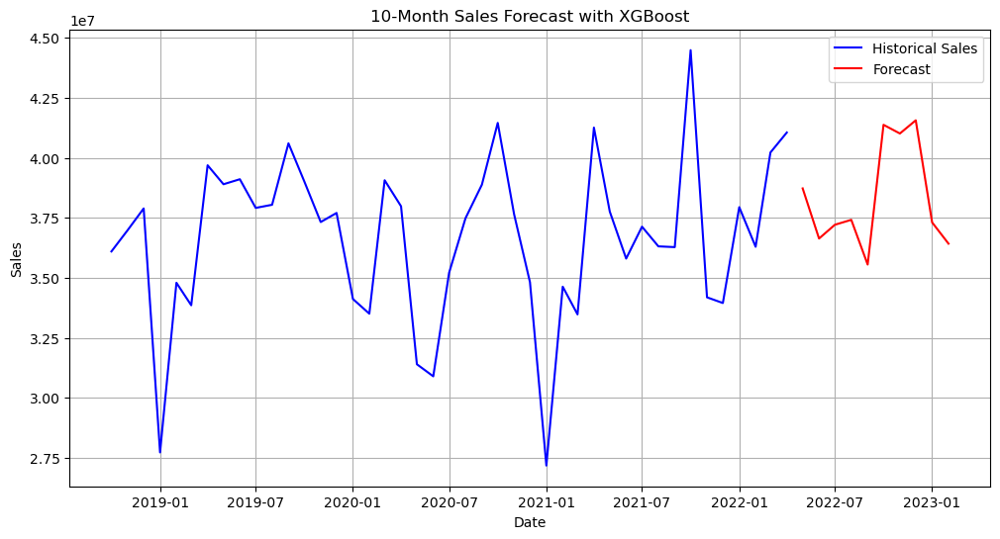

/var/folders/z6/_vn8cndd4x5dmx2cpjfdkjdr0000gn/T/ipykernel_48953/681904062.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_set_1["Sales_EUR"] = results["yhat"]


,Mapped_GCK,Sales_EUR
Month Year,,
2022-05-01,#1,38724720.0
2022-06-01,#1,36636888.0
2022-07-01,#1,37210896.0
2022-08-01,#1,37415356.0
2022-09-01,#1,35552632.0
2022-10-01,#1,41373972.0
2022-11-01,#1,41011640.0
2022-12-01,#1,41561132.0
2023-01-01,#1,37307840.0


In [32]:
best_model, best_params, best_rmse, best_model_name = select_best_model(
    prophet_best_model_1, prophet_best_params_1, prophet_best_rmse_1, "Prophet",
    xgboost_best_model_1, xgboost_best_params_1, xgboost_best_rmse_1, "XGBoost"
    , sarima_best_model_1, sarima_best_params_1, sarima_best_rmse_1, "SARIMA"
)
print(f"Best Model: {best_model_name}")
print("Best Parameters:", best_params)
print("Best RMSE:", best_rmse)

if best_model_name == "XGBoost":
    results = xgboost_forecast(
        sales_agg1,
        df_market_1,
        period=10,
        params =best_params,
    )
elif best_model_name == "SARIMA":
    results = sarima_forecast(
        sales_agg1,
        period=10,
        params =best_params,
    )
else:
    results = prophet_forecast(
        sales_agg1,
        df_market_1,
        period=10,
        param =best_params,
    )
results.set_index('ds',inplace = True)
test_set_1.set_index('Month Year', inplace = True)
test_set_1["Sales_EUR"] = results["yhat"]
test_set_1

# Product 3

In [33]:
# selecte only the features that are selected in the feature selection step
test_set_3 = test_set[test_set['Mapped_GCK'] == '#3']
df_market_3 = df_market[selected_features_3]
df_market_3.head()

,MAB_ELE_SHP840_lag_6,WKLWEUR840_org_lag_5,MAB_ELE_PRO826_lag_1,PRO27826_org,PRI27840_org_lag_5,PRO28392_org_lag_6,MAB_ELE_PRO826_lag_5,MAB_ELE_SHP392_lag_5,MAB_ELE_SHP392_lag_1,MAB_ELE_SHP826_lag_3
date,,,,,,,,,,
2004-02-01,NaN,NaN,NaN,120.706516,NaN,NaN,NaN,NaN,NaN,NaN
2004-03-01,NaN,NaN,111.353812,138.309550,NaN,NaN,NaN,NaN,110.495272,NaN
2004-04-01,NaN,NaN,127.558608,115.557330,NaN,NaN,NaN,NaN,144.686166,NaN
2004-05-01,NaN,NaN,108.732297,119.269534,NaN,NaN,NaN,NaN,102.655769,77.766367
2004-06-01,NaN,NaN,110.645200,128.849416,NaN,NaN,NaN,NaN,100.305285,77.829225


## Xgboost

In [34]:
X_train, X_val, y_train, y_val = train_val_split(sales_agg3, df_market_3, train_size = 0.8)

X_val.info() 

xgboost_best_model_3, xgboost_best_params_3, xgboost_best_rmse_3 = model_evaluation_XGboost(X_train,
                                                                                             y_train, 
                                                                                             X_val, y_val, 
                                                                                             xgboost_param_grid)

print("Best Params:", xgboost_best_params_3)
print("Validation RMSE:", xgboost_best_rmse_3)

<class 'pandas.core.frame.DataFrame'>
Index: 9 entries, 2021-08-01 to 2022-04-01
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   MAB_ELE_SHP840_lag_6  9 non-null      float64
 1   WKLWEUR840_org_lag_5  9 non-null      float64
 2   MAB_ELE_PRO826_lag_1  9 non-null      float64
 3   PRO27826_org          9 non-null      float64
 4   PRI27840_org_lag_5    9 non-null      float64
 5   PRO28392_org_lag_6    9 non-null      float64
 6   MAB_ELE_PRO826_lag_5  9 non-null      float64
 7   MAB_ELE_SHP392_lag_5  9 non-null      float64
 8   MAB_ELE_SHP392_lag_1  9 non-null      float64
 9   MAB_ELE_SHP826_lag_3  9 non-null      float64
dtypes: float64(10)
memory usage: 792.0+ bytes
Params: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.01, 'subsample': 0.5, 'colsample_bytree': 0.5, 'gamma': 0, 'reg_alpha': 0, 'reg_lambda': 0} => RMSE: 3085381.6848, Relative RMSE: 0.2155
Params: {'n_estimators': 5

## Prophet

In [35]:
prophet_best_model_3, prophet_best_params_3, prophet_best_rmse_3 = model_evaluation_prophet(X_train,
                                                                                             y_train, 
                                                                                             X_val, 
                                                                                             y_val, 
                                                                                             prophet_param_grid)

print("Best Params:", prophet_best_params_3)

print("Validation RMSE:", prophet_best_rmse_3)

00:38:38 - cmdstanpy - INFO - Chain [1] start processing
00:38:39 - cmdstanpy - INFO - Chain [1] done processing
00:38:39 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 2505301.4050, Relative RMSE: 0.1750


00:38:39 - cmdstanpy - INFO - Chain [1] done processing
00:38:39 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 2503425.8910, Relative RMSE: 0.1748


00:38:40 - cmdstanpy - INFO - Chain [1] done processing
00:38:40 - cmdstanpy - INFO - Chain [1] start processing
00:38:40 - cmdstanpy - INFO - Chain [1] done processing
00:38:40 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 2503838.0309, Relative RMSE: 0.1749
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 2498660.7945, Relative RMSE: 0.1745


00:38:40 - cmdstanpy - INFO - Chain [1] done processing
00:38:40 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 2498778.5984, Relative RMSE: 0.1745


00:38:40 - cmdstanpy - INFO - Chain [1] done processing
00:38:40 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 2498673.7584, Relative RMSE: 0.1745


00:38:41 - cmdstanpy - INFO - Chain [1] done processing
00:38:41 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 2499238.4901, Relative RMSE: 0.1746


00:38:41 - cmdstanpy - INFO - Chain [1] done processing
00:38:41 - cmdstanpy - INFO - Chain [1] start processing
00:38:41 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 2496907.0800, Relative RMSE: 0.1744
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 2504991.6152, Relative RMSE: 0.1750


00:38:41 - cmdstanpy - INFO - Chain [1] start processing
00:38:41 - cmdstanpy - INFO - Chain [1] done processing
00:38:41 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 2751310.7882, Relative RMSE: 0.1922


00:38:42 - cmdstanpy - INFO - Chain [1] done processing
00:38:42 - cmdstanpy - INFO - Chain [1] start processing
00:38:42 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 2696070.8865, Relative RMSE: 0.1883


00:38:42 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 2744414.3577, Relative RMSE: 0.1917


00:38:42 - cmdstanpy - INFO - Chain [1] done processing
00:38:42 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 2117459.8242, Relative RMSE: 0.1479


00:38:43 - cmdstanpy - INFO - Chain [1] done processing
00:38:43 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 2140482.5699, Relative RMSE: 0.1495


00:38:43 - cmdstanpy - INFO - Chain [1] done processing
00:38:43 - cmdstanpy - INFO - Chain [1] start processing
00:38:43 - cmdstanpy - INFO - Chain [1] done processing
00:38:43 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 2138914.6190, Relative RMSE: 0.1494
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 2236114.4238, Relative RMSE: 0.1562


00:38:43 - cmdstanpy - INFO - Chain [1] done processing
00:38:43 - cmdstanpy - INFO - Chain [1] start processing
00:38:43 - cmdstanpy - INFO - Chain [1] done processing
00:38:43 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 2236053.8391, Relative RMSE: 0.1562
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 2236071.6697, Relative RMSE: 0.1562


00:38:44 - cmdstanpy - INFO - Chain [1] done processing
00:38:44 - cmdstanpy - INFO - Chain [1] start processing
00:38:44 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 2239367.4342, Relative RMSE: 0.1564


00:38:44 - cmdstanpy - INFO - Chain [1] start processing
00:38:44 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 2238181.9067, Relative RMSE: 0.1563
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 2239828.2243, Relative RMSE: 0.1564


00:38:44 - cmdstanpy - INFO - Chain [1] start processing
00:38:44 - cmdstanpy - INFO - Chain [1] done processing
00:38:44 - cmdstanpy - INFO - Chain [1] start processing
00:38:44 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 2368237.9240, Relative RMSE: 0.1654


00:38:45 - cmdstanpy - INFO - Chain [1] start processing
00:38:45 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 2365115.2345, Relative RMSE: 0.1652
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 2366795.0232, Relative RMSE: 0.1653


00:38:45 - cmdstanpy - INFO - Chain [1] start processing
00:38:45 - cmdstanpy - INFO - Chain [1] done processing
00:38:45 - cmdstanpy - INFO - Chain [1] start processing
00:38:45 - cmdstanpy - INFO - Chain [1] done processing
00:38:45 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 5573228.7922, Relative RMSE: 0.3893
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 5571116.6137, Relative RMSE: 0.3891


00:38:45 - cmdstanpy - INFO - Chain [1] done processing
00:38:45 - cmdstanpy - INFO - Chain [1] start processing
00:38:45 - cmdstanpy - INFO - Chain [1] done processing
00:38:45 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 5570314.9564, Relative RMSE: 0.3890
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 5592285.3033, Relative RMSE: 0.3906


00:38:45 - cmdstanpy - INFO - Chain [1] done processing
00:38:45 - cmdstanpy - INFO - Chain [1] start processing
00:38:45 - cmdstanpy - INFO - Chain [1] done processing
00:38:46 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 5592753.2081, Relative RMSE: 0.3906
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 5593140.6091, Relative RMSE: 0.3906


00:38:46 - cmdstanpy - INFO - Chain [1] done processing
00:38:46 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 5251513.9099, Relative RMSE: 0.3668


00:38:46 - cmdstanpy - INFO - Chain [1] done processing
00:38:46 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 5247856.3896, Relative RMSE: 0.3665


00:38:46 - cmdstanpy - INFO - Chain [1] done processing
00:38:46 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 5353695.3131, Relative RMSE: 0.3739


00:38:47 - cmdstanpy - INFO - Chain [1] done processing
00:38:47 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 5603783.3726, Relative RMSE: 0.3914


00:38:47 - cmdstanpy - INFO - Chain [1] done processing
00:38:47 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 5649260.4860, Relative RMSE: 0.3946


00:38:48 - cmdstanpy - INFO - Chain [1] done processing
00:38:48 - cmdstanpy - INFO - Chain [1] start processing
00:38:48 - cmdstanpy - INFO - Chain [1] done processing
00:38:48 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 5486256.3776, Relative RMSE: 0.3832
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 5827078.5506, Relative RMSE: 0.4070


00:38:48 - cmdstanpy - INFO - Chain [1] done processing
00:38:48 - cmdstanpy - INFO - Chain [1] start processing
00:38:48 - cmdstanpy - INFO - Chain [1] done processing
00:38:48 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 5827541.9320, Relative RMSE: 0.4070
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 5827616.3809, Relative RMSE: 0.4070


00:38:49 - cmdstanpy - INFO - Chain [1] done processing
00:38:49 - cmdstanpy - INFO - Chain [1] start processing
00:38:49 - cmdstanpy - INFO - Chain [1] done processing
00:38:49 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 5775424.6720, Relative RMSE: 0.4034
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 5809281.1730, Relative RMSE: 0.4057


00:38:49 - cmdstanpy - INFO - Chain [1] done processing
00:38:49 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 5806161.4099, Relative RMSE: 0.4055


00:38:49 - cmdstanpy - INFO - Chain [1] done processing
00:38:49 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 5511877.5147, Relative RMSE: 0.3850


00:38:50 - cmdstanpy - INFO - Chain [1] done processing
00:38:50 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 5399498.7548, Relative RMSE: 0.3771


00:38:50 - cmdstanpy - INFO - Chain [1] done processing
00:38:50 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 5401260.9078, Relative RMSE: 0.3772


00:38:51 - cmdstanpy - INFO - Chain [1] done processing
00:38:51 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 5736289.2608, Relative RMSE: 0.4006


00:38:51 - cmdstanpy - INFO - Chain [1] done processing
00:38:51 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 5832661.5835, Relative RMSE: 0.4074


00:38:52 - cmdstanpy - INFO - Chain [1] done processing
00:38:52 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 5793857.6209, Relative RMSE: 0.4047


00:38:52 - cmdstanpy - INFO - Chain [1] done processing
00:38:52 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 2518055.0499, Relative RMSE: 0.1759


00:38:53 - cmdstanpy - INFO - Chain [1] done processing
00:38:53 - cmdstanpy - INFO - Chain [1] start processing
00:38:53 - cmdstanpy - INFO - Chain [1] done processing
00:38:53 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 2513975.9047, Relative RMSE: 0.1756
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 2522525.1279, Relative RMSE: 0.1762


00:38:53 - cmdstanpy - INFO - Chain [1] done processing
00:38:53 - cmdstanpy - INFO - Chain [1] start processing
00:38:53 - cmdstanpy - INFO - Chain [1] done processing
00:38:53 - cmdstanpy - INFO - Chain [1] start processing
00:38:53 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 2533206.6334, Relative RMSE: 0.1769
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 2540676.5211, Relative RMSE: 0.1774


00:38:53 - cmdstanpy - INFO - Chain [1] start processing
00:38:53 - cmdstanpy - INFO - Chain [1] done processing
00:38:53 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 2559439.6364, Relative RMSE: 0.1788
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 2540210.3751, Relative RMSE: 0.1774


00:38:53 - cmdstanpy - INFO - Chain [1] done processing
00:38:53 - cmdstanpy - INFO - Chain [1] start processing
00:38:53 - cmdstanpy - INFO - Chain [1] done processing
00:38:53 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 2539335.3529, Relative RMSE: 0.1774
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 2545641.7859, Relative RMSE: 0.1778


00:38:54 - cmdstanpy - INFO - Chain [1] done processing
00:38:54 - cmdstanpy - INFO - Chain [1] start processing
00:38:54 - cmdstanpy - INFO - Chain [1] done processing
00:38:54 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 2793387.2455, Relative RMSE: 0.1951
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 2770887.2748, Relative RMSE: 0.1935


00:38:54 - cmdstanpy - INFO - Chain [1] done processing
00:38:54 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 2795624.7486, Relative RMSE: 0.1953


00:38:54 - cmdstanpy - INFO - Chain [1] done processing
00:38:54 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 2518055.0499, Relative RMSE: 0.1759


00:38:55 - cmdstanpy - INFO - Chain [1] done processing
00:38:55 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 2513975.9047, Relative RMSE: 0.1756


00:38:55 - cmdstanpy - INFO - Chain [1] done processing
00:38:55 - cmdstanpy - INFO - Chain [1] start processing
00:38:55 - cmdstanpy - INFO - Chain [1] done processing
00:38:56 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 2522525.1279, Relative RMSE: 0.1762
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 2533206.6334, Relative RMSE: 0.1769


00:38:56 - cmdstanpy - INFO - Chain [1] done processing
00:38:56 - cmdstanpy - INFO - Chain [1] start processing
00:38:56 - cmdstanpy - INFO - Chain [1] done processing
00:38:56 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 2540676.5211, Relative RMSE: 0.1774
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 2559439.6364, Relative RMSE: 0.1788


00:38:56 - cmdstanpy - INFO - Chain [1] done processing
00:38:56 - cmdstanpy - INFO - Chain [1] start processing
00:38:56 - cmdstanpy - INFO - Chain [1] done processing
00:38:56 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 2540210.3751, Relative RMSE: 0.1774
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 2539335.3529, Relative RMSE: 0.1774


00:38:56 - cmdstanpy - INFO - Chain [1] done processing
00:38:56 - cmdstanpy - INFO - Chain [1] start processing
00:38:56 - cmdstanpy - INFO - Chain [1] done processing
00:38:56 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 2545641.7859, Relative RMSE: 0.1778
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 2793387.2455, Relative RMSE: 0.1951


00:38:56 - cmdstanpy - INFO - Chain [1] done processing
00:38:57 - cmdstanpy - INFO - Chain [1] start processing
00:38:57 - cmdstanpy - INFO - Chain [1] done processing
00:38:57 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 2770887.2748, Relative RMSE: 0.1935
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 2795624.7486, Relative RMSE: 0.1953


00:38:57 - cmdstanpy - INFO - Chain [1] done processing
00:38:57 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 2518055.0499, Relative RMSE: 0.1759


00:38:58 - cmdstanpy - INFO - Chain [1] done processing
00:38:58 - cmdstanpy - INFO - Chain [1] start processing
00:38:58 - cmdstanpy - INFO - Chain [1] done processing
00:38:58 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 2513975.9047, Relative RMSE: 0.1756
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 2522525.1279, Relative RMSE: 0.1762


00:38:58 - cmdstanpy - INFO - Chain [1] done processing
00:38:58 - cmdstanpy - INFO - Chain [1] start processing
00:38:58 - cmdstanpy - INFO - Chain [1] done processing
00:38:58 - cmdstanpy - INFO - Chain [1] start processing
00:38:58 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 2533206.6334, Relative RMSE: 0.1769
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 2540676.5211, Relative RMSE: 0.1774


00:38:58 - cmdstanpy - INFO - Chain [1] start processing
00:38:58 - cmdstanpy - INFO - Chain [1] done processing
00:38:58 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 2559439.6364, Relative RMSE: 0.1788
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 2540210.3751, Relative RMSE: 0.1774


00:38:58 - cmdstanpy - INFO - Chain [1] done processing
00:38:58 - cmdstanpy - INFO - Chain [1] start processing
00:38:59 - cmdstanpy - INFO - Chain [1] done processing
00:38:59 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 2539335.3529, Relative RMSE: 0.1774
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 2545641.7859, Relative RMSE: 0.1778


00:38:59 - cmdstanpy - INFO - Chain [1] done processing
00:38:59 - cmdstanpy - INFO - Chain [1] start processing
00:38:59 - cmdstanpy - INFO - Chain [1] done processing
00:38:59 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 2793387.2455, Relative RMSE: 0.1951
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 2770887.2748, Relative RMSE: 0.1935


00:38:59 - cmdstanpy - INFO - Chain [1] done processing
00:38:59 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 2795624.7486, Relative RMSE: 0.1953


00:39:00 - cmdstanpy - INFO - Chain [1] done processing
00:39:00 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 2518055.0499, Relative RMSE: 0.1759


00:39:00 - cmdstanpy - INFO - Chain [1] done processing
00:39:00 - cmdstanpy - INFO - Chain [1] start processing
00:39:00 - cmdstanpy - INFO - Chain [1] done processing
00:39:00 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 2513975.9047, Relative RMSE: 0.1756
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 2522525.1279, Relative RMSE: 0.1762


00:39:00 - cmdstanpy - INFO - Chain [1] done processing
00:39:00 - cmdstanpy - INFO - Chain [1] start processing
00:39:00 - cmdstanpy - INFO - Chain [1] done processing
00:39:01 - cmdstanpy - INFO - Chain [1] start processing
00:39:01 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 2533206.6334, Relative RMSE: 0.1769
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 2540676.5211, Relative RMSE: 0.1774


00:39:01 - cmdstanpy - INFO - Chain [1] start processing
00:39:01 - cmdstanpy - INFO - Chain [1] done processing
00:39:01 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 2559439.6364, Relative RMSE: 0.1788
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 2540210.3751, Relative RMSE: 0.1774


00:39:01 - cmdstanpy - INFO - Chain [1] done processing
00:39:01 - cmdstanpy - INFO - Chain [1] start processing
00:39:01 - cmdstanpy - INFO - Chain [1] done processing
00:39:01 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 2539335.3529, Relative RMSE: 0.1774
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 2545641.7859, Relative RMSE: 0.1778


00:39:01 - cmdstanpy - INFO - Chain [1] done processing
00:39:01 - cmdstanpy - INFO - Chain [1] start processing
00:39:01 - cmdstanpy - INFO - Chain [1] done processing
00:39:01 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 2793387.2455, Relative RMSE: 0.1951
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 2770887.2748, Relative RMSE: 0.1935


00:39:01 - cmdstanpy - INFO - Chain [1] done processing
00:39:01 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 2795624.7486, Relative RMSE: 0.1953


00:39:02 - cmdstanpy - INFO - Chain [1] done processing
00:39:02 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 2463879.2772, Relative RMSE: 0.1721


00:39:03 - cmdstanpy - INFO - Chain [1] done processing
00:39:03 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 2472916.1694, Relative RMSE: 0.1727


00:39:04 - cmdstanpy - INFO - Chain [1] done processing
00:39:04 - cmdstanpy - INFO - Chain [1] start processing
00:39:04 - cmdstanpy - INFO - Chain [1] done processing
00:39:04 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 2462792.3627, Relative RMSE: 0.1720
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 2467686.2309, Relative RMSE: 0.1724


00:39:04 - cmdstanpy - INFO - Chain [1] done processing
00:39:04 - cmdstanpy - INFO - Chain [1] start processing
00:39:04 - cmdstanpy - INFO - Chain [1] done processing
00:39:04 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 2463278.7295, Relative RMSE: 0.1720
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 2476661.7390, Relative RMSE: 0.1730


00:39:04 - cmdstanpy - INFO - Chain [1] done processing
00:39:04 - cmdstanpy - INFO - Chain [1] start processing
00:39:04 - cmdstanpy - INFO - Chain [1] done processing
00:39:04 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 2504946.7174, Relative RMSE: 0.1750
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 2499414.1241, Relative RMSE: 0.1746


00:39:05 - cmdstanpy - INFO - Chain [1] done processing
00:39:05 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 2504864.9460, Relative RMSE: 0.1749


00:39:05 - cmdstanpy - INFO - Chain [1] done processing
00:39:05 - cmdstanpy - INFO - Chain [1] start processing
00:39:05 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 2749521.3897, Relative RMSE: 0.1920


00:39:05 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 2728288.8089, Relative RMSE: 0.1906


00:39:05 - cmdstanpy - INFO - Chain [1] done processing
00:39:05 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 2752173.3268, Relative RMSE: 0.1922


00:39:06 - cmdstanpy - INFO - Chain [1] done processing
00:39:06 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 2150122.4050, Relative RMSE: 0.1502


00:39:06 - cmdstanpy - INFO - Chain [1] done processing
00:39:06 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 2147947.8007, Relative RMSE: 0.1500


00:39:07 - cmdstanpy - INFO - Chain [1] done processing
00:39:07 - cmdstanpy - INFO - Chain [1] start processing
00:39:07 - cmdstanpy - INFO - Chain [1] done processing
00:39:07 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 2144810.3952, Relative RMSE: 0.1498
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 2155355.3223, Relative RMSE: 0.1505


00:39:07 - cmdstanpy - INFO - Chain [1] done processing
00:39:07 - cmdstanpy - INFO - Chain [1] start processing
00:39:07 - cmdstanpy - INFO - Chain [1] done processing
00:39:07 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 2157405.5455, Relative RMSE: 0.1507
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 2155223.1883, Relative RMSE: 0.1505


00:39:08 - cmdstanpy - INFO - Chain [1] done processing
00:39:08 - cmdstanpy - INFO - Chain [1] start processing
00:39:08 - cmdstanpy - INFO - Chain [1] done processing
00:39:08 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 2159556.4050, Relative RMSE: 0.1508
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 2156995.0869, Relative RMSE: 0.1507


00:39:08 - cmdstanpy - INFO - Chain [1] done processing
00:39:08 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 2156402.0055, Relative RMSE: 0.1506


00:39:08 - cmdstanpy - INFO - Chain [1] done processing
00:39:08 - cmdstanpy - INFO - Chain [1] start processing
00:39:08 - cmdstanpy - INFO - Chain [1] done processing
00:39:08 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 2262176.6420, Relative RMSE: 0.1580
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 2262247.5728, Relative RMSE: 0.1580


00:39:09 - cmdstanpy - INFO - Chain [1] done processing
00:39:09 - cmdstanpy - INFO - Chain [1] start processing
00:39:09 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 2262503.8091, Relative RMSE: 0.1580
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 5415385.5876, Relative RMSE: 0.3782


00:39:09 - cmdstanpy - INFO - Chain [1] start processing
00:39:09 - cmdstanpy - INFO - Chain [1] done processing
00:39:09 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 5411198.2762, Relative RMSE: 0.3779


00:39:09 - cmdstanpy - INFO - Chain [1] done processing
00:39:09 - cmdstanpy - INFO - Chain [1] start processing
00:39:10 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 5463178.4211, Relative RMSE: 0.3816
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 5391862.0747, Relative RMSE: 0.3766


00:39:10 - cmdstanpy - INFO - Chain [1] start processing
00:39:10 - cmdstanpy - INFO - Chain [1] done processing
00:39:10 - cmdstanpy - INFO - Chain [1] start processing
00:39:10 - cmdstanpy - INFO - Chain [1] done processing
00:39:10 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 5394848.0601, Relative RMSE: 0.3768
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 5397473.3685, Relative RMSE: 0.3770


00:39:10 - cmdstanpy - INFO - Chain [1] done processing
00:39:10 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 5104246.0736, Relative RMSE: 0.3565


00:39:11 - cmdstanpy - INFO - Chain [1] done processing
00:39:11 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 5107255.8825, Relative RMSE: 0.3567


00:39:11 - cmdstanpy - INFO - Chain [1] done processing
00:39:11 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 5187714.3815, Relative RMSE: 0.3623


00:39:11 - cmdstanpy - INFO - Chain [1] done processing
00:39:11 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 5801118.6977, Relative RMSE: 0.4052


00:39:12 - cmdstanpy - INFO - Chain [1] done processing
00:39:12 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 5808157.2324, Relative RMSE: 0.4057


00:39:12 - cmdstanpy - INFO - Chain [1] done processing
00:39:12 - cmdstanpy - INFO - Chain [1] start processing
00:39:13 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 5756842.4469, Relative RMSE: 0.4021


00:39:13 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 6010216.7860, Relative RMSE: 0.4198


00:39:13 - cmdstanpy - INFO - Chain [1] done processing
00:39:13 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 5971943.0332, Relative RMSE: 0.4171


00:39:14 - cmdstanpy - INFO - Chain [1] done processing
00:39:14 - cmdstanpy - INFO - Chain [1] start processing
00:39:14 - cmdstanpy - INFO - Chain [1] done processing
00:39:14 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 5941583.4671, Relative RMSE: 0.4150
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 6023302.2412, Relative RMSE: 0.4207


00:39:14 - cmdstanpy - INFO - Chain [1] done processing
00:39:14 - cmdstanpy - INFO - Chain [1] start processing
00:39:14 - cmdstanpy - INFO - Chain [1] done processing
00:39:14 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 6021406.6003, Relative RMSE: 0.4206
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 6020236.9209, Relative RMSE: 0.4205


00:39:14 - cmdstanpy - INFO - Chain [1] done processing
00:39:14 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 5492489.1774, Relative RMSE: 0.3836


00:39:15 - cmdstanpy - INFO - Chain [1] done processing
00:39:15 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 5490347.5456, Relative RMSE: 0.3835


00:39:15 - cmdstanpy - INFO - Chain [1] done processing
00:39:15 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 5585145.2399, Relative RMSE: 0.3901


00:39:15 - cmdstanpy - INFO - Chain [1] done processing
00:39:15 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 6123574.2670, Relative RMSE: 0.4277


00:39:15 - cmdstanpy - INFO - Chain [1] done processing
00:39:16 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 6111952.4557, Relative RMSE: 0.4269


00:39:16 - cmdstanpy - INFO - Chain [1] done processing
00:39:16 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 6114690.6497, Relative RMSE: 0.4271


00:39:17 - cmdstanpy - INFO - Chain [1] done processing
00:39:17 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 2518055.0499, Relative RMSE: 0.1759


00:39:17 - cmdstanpy - INFO - Chain [1] done processing
00:39:17 - cmdstanpy - INFO - Chain [1] start processing
00:39:17 - cmdstanpy - INFO - Chain [1] done processing
00:39:17 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 2513975.9047, Relative RMSE: 0.1756
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 2522525.1279, Relative RMSE: 0.1762


00:39:18 - cmdstanpy - INFO - Chain [1] done processing
00:39:18 - cmdstanpy - INFO - Chain [1] start processing
00:39:18 - cmdstanpy - INFO - Chain [1] done processing
00:39:18 - cmdstanpy - INFO - Chain [1] start processing
00:39:18 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 2533206.6334, Relative RMSE: 0.1769
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 2540676.5211, Relative RMSE: 0.1774


00:39:18 - cmdstanpy - INFO - Chain [1] start processing
00:39:18 - cmdstanpy - INFO - Chain [1] done processing
00:39:18 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 2559439.6364, Relative RMSE: 0.1788
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 2540210.3751, Relative RMSE: 0.1774


00:39:18 - cmdstanpy - INFO - Chain [1] done processing
00:39:18 - cmdstanpy - INFO - Chain [1] start processing
00:39:18 - cmdstanpy - INFO - Chain [1] done processing
00:39:18 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 2539335.3529, Relative RMSE: 0.1774
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 2545641.7859, Relative RMSE: 0.1778


00:39:18 - cmdstanpy - INFO - Chain [1] done processing
00:39:18 - cmdstanpy - INFO - Chain [1] start processing
00:39:19 - cmdstanpy - INFO - Chain [1] done processing
00:39:19 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 2793387.2455, Relative RMSE: 0.1951
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 2770887.2748, Relative RMSE: 0.1935


00:39:19 - cmdstanpy - INFO - Chain [1] done processing
00:39:19 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 2795624.7486, Relative RMSE: 0.1953


00:39:19 - cmdstanpy - INFO - Chain [1] done processing
00:39:19 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 2518055.0499, Relative RMSE: 0.1759


00:39:20 - cmdstanpy - INFO - Chain [1] done processing
00:39:20 - cmdstanpy - INFO - Chain [1] start processing
00:39:20 - cmdstanpy - INFO - Chain [1] done processing
00:39:20 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 2513975.9047, Relative RMSE: 0.1756
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 2522525.1279, Relative RMSE: 0.1762


00:39:20 - cmdstanpy - INFO - Chain [1] done processing
00:39:20 - cmdstanpy - INFO - Chain [1] start processing
00:39:20 - cmdstanpy - INFO - Chain [1] done processing
00:39:20 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 2533206.6334, Relative RMSE: 0.1769
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 2540676.5211, Relative RMSE: 0.1774


00:39:20 - cmdstanpy - INFO - Chain [1] done processing
00:39:20 - cmdstanpy - INFO - Chain [1] start processing
00:39:20 - cmdstanpy - INFO - Chain [1] done processing
00:39:20 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 2559439.6364, Relative RMSE: 0.1788
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 2540210.3751, Relative RMSE: 0.1774


00:39:21 - cmdstanpy - INFO - Chain [1] done processing
00:39:21 - cmdstanpy - INFO - Chain [1] start processing
00:39:21 - cmdstanpy - INFO - Chain [1] done processing
00:39:21 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 2539335.3529, Relative RMSE: 0.1774
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 2545641.7859, Relative RMSE: 0.1778


00:39:21 - cmdstanpy - INFO - Chain [1] done processing
00:39:21 - cmdstanpy - INFO - Chain [1] start processing
00:39:21 - cmdstanpy - INFO - Chain [1] done processing
00:39:21 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 2793387.2455, Relative RMSE: 0.1951
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 2770887.2748, Relative RMSE: 0.1935


00:39:21 - cmdstanpy - INFO - Chain [1] done processing
00:39:21 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 2795624.7486, Relative RMSE: 0.1953


00:39:22 - cmdstanpy - INFO - Chain [1] done processing
00:39:22 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 2518055.0499, Relative RMSE: 0.1759


00:39:22 - cmdstanpy - INFO - Chain [1] done processing
00:39:22 - cmdstanpy - INFO - Chain [1] start processing
00:39:22 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 2513975.9047, Relative RMSE: 0.1756
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 2522525.1279, Relative RMSE: 0.1762


00:39:23 - cmdstanpy - INFO - Chain [1] start processing
00:39:23 - cmdstanpy - INFO - Chain [1] done processing
00:39:23 - cmdstanpy - INFO - Chain [1] start processing
00:39:23 - cmdstanpy - INFO - Chain [1] done processing
00:39:23 - cmdstanpy - INFO - Chain [1] start processing
00:39:23 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 2533206.6334, Relative RMSE: 0.1769
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 2540676.5211, Relative RMSE: 0.1774


00:39:23 - cmdstanpy - INFO - Chain [1] start processing
00:39:23 - cmdstanpy - INFO - Chain [1] done processing
00:39:23 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 2559439.6364, Relative RMSE: 0.1788
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 2540210.3751, Relative RMSE: 0.1774


00:39:23 - cmdstanpy - INFO - Chain [1] done processing
00:39:23 - cmdstanpy - INFO - Chain [1] start processing
00:39:23 - cmdstanpy - INFO - Chain [1] done processing
00:39:23 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 2539335.3529, Relative RMSE: 0.1774
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 2545641.7859, Relative RMSE: 0.1778


00:39:23 - cmdstanpy - INFO - Chain [1] done processing
00:39:23 - cmdstanpy - INFO - Chain [1] start processing
00:39:24 - cmdstanpy - INFO - Chain [1] done processing
00:39:24 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 2793387.2455, Relative RMSE: 0.1951
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 2770887.2748, Relative RMSE: 0.1935


00:39:24 - cmdstanpy - INFO - Chain [1] done processing
00:39:24 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 2795624.7486, Relative RMSE: 0.1953


00:39:24 - cmdstanpy - INFO - Chain [1] done processing
00:39:24 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 2518055.0499, Relative RMSE: 0.1759


00:39:25 - cmdstanpy - INFO - Chain [1] done processing
00:39:25 - cmdstanpy - INFO - Chain [1] start processing
00:39:25 - cmdstanpy - INFO - Chain [1] done processing
00:39:25 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 2513975.9047, Relative RMSE: 0.1756
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 2522525.1279, Relative RMSE: 0.1762


00:39:25 - cmdstanpy - INFO - Chain [1] done processing
00:39:25 - cmdstanpy - INFO - Chain [1] start processing
00:39:25 - cmdstanpy - INFO - Chain [1] done processing
00:39:25 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 2533206.6334, Relative RMSE: 0.1769
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 2540676.5211, Relative RMSE: 0.1774


00:39:25 - cmdstanpy - INFO - Chain [1] done processing
00:39:25 - cmdstanpy - INFO - Chain [1] start processing
00:39:25 - cmdstanpy - INFO - Chain [1] done processing
00:39:26 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 2559439.6364, Relative RMSE: 0.1788
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 2540210.3751, Relative RMSE: 0.1774


00:39:26 - cmdstanpy - INFO - Chain [1] done processing
00:39:26 - cmdstanpy - INFO - Chain [1] start processing
00:39:26 - cmdstanpy - INFO - Chain [1] done processing
00:39:26 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 2539335.3529, Relative RMSE: 0.1774
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 2545641.7859, Relative RMSE: 0.1778


00:39:26 - cmdstanpy - INFO - Chain [1] done processing
00:39:26 - cmdstanpy - INFO - Chain [1] start processing
00:39:26 - cmdstanpy - INFO - Chain [1] done processing
00:39:26 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 2793387.2455, Relative RMSE: 0.1951
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 2770887.2748, Relative RMSE: 0.1935


00:39:26 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 2795624.7486, Relative RMSE: 0.1953
Best Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8}
Validation RMSE: 2117459.8241606276


## Sarima

In [36]:
sarima_best_model_3, sarima_best_params_3, sarima_best_rmse_3 = model_evaluation_SARIMA(y_train, 
                                                             y_val, 
                                                             sarima_param_grid)

print("Best Params:", sarima_best_params_3)
print("Validation RMSE:", sarima_best_rmse_3)

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,0) x (0,0,0,6) => RMSE: 14459830.9821, Relative RMSE: 1.0099
SARIMA(0,0,0) x (0,0,0,12) => RMSE: 14459830.9821, Relative RMSE: 1.0099
SARIMA(0,0,0) x (0,0,1,6) => RMSE: 11283588.8675, Relative RMSE: 0.7881
SARIMA(0,0,0) x (0,0,1,12) => RMSE: 9690558.7982, Relative RMSE: 0.6768
SARIMA(0,0,0) x (0,1,0,6) => RMSE: 3194333.4698, Relative RMSE: 0.2231
SARIMA(0,0,0) x (0,1,0,12) => RMSE: 3903199.9884, Relative RMSE: 0.2726
SARIMA(0,0,0) x (0,1,1,6) => RMSE: 2762092.4069, Relative RMSE: 0.1929
SARIMA(0,0,0) x (0,1,1,12) => RMSE: 3738330.6760, Relative RMSE: 0.2611
SARIMA(0,0,0) x (1,0,0,6) => RMSE: 3203841.8012, Relative RMSE: 0.2238
SARIMA(0,0,0) x (1,0,0,12) => RMSE: 3825559.4887, Relative RMSE: 0.2672


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,0) x (1,0,1,6) => RMSE: 2956556.0536, Relative RMSE: 0.2065
SARIMA(0,0,0) x (1,0,1,12) => RMSE: 3883091.8727, Relative RMSE: 0.2712


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,0,0) x (1,1,0,6) => RMSE: 3630068.6765, Relative RMSE: 0.2535
SARIMA(0,0,0) x (1,1,0,12) => RMSE: 3141374.6488, Relative RMSE: 0.2194
SARIMA(0,0,0) x (1,1,1,6) => RMSE: 4228617.8224, Relative RMSE: 0.2953
SARIMA(0,0,0) x (1,1,1,12) => RMSE: 3033552.0670, Relative RMSE: 0.2119
SARIMA(0,0,1) x (0,0,0,6) => RMSE: 14164759.8612, Relative RMSE: 0.9893
SARIMA(0,0,1) x (0,0,0,12) => RMSE: 14164759.8612, Relative RMSE: 0.9893
SARIMA(0,0,1) x (0,0,1,6) => RMSE: 11290241.0225, Relative RMSE: 0.7885
SARIMA(0,0,1) x (0,0,1,12) => RMSE: 9410568.5212, Relative RMSE: 0.6573
SARIMA(0,0,1) x (0,1,0,6) => RMSE: 3086942.7391, Relative RMSE: 0.2156
SARIMA(0,0,1) x (0,1,0,12) => RMSE: 3906146.4915, Relative RMSE: 0.2728


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(0,0,1) x (0,1,1,6) => RMSE: 2774726.0725, Relative RMSE: 0.1938


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,1) x (0,1,1,12) => RMSE: 3998847.1130, Relative RMSE: 0.2793
SARIMA(0,0,1) x (1,0,0,6) => RMSE: 3232977.9699, Relative RMSE: 0.2258
SARIMA(0,0,1) x (1,0,0,12) => RMSE: 3836709.6250, Relative RMSE: 0.2680
SARIMA(0,0,1) x (1,0,1,6) => RMSE: 2889974.5310, Relative RMSE: 0.2018
SARIMA(0,0,1) x (1,0,1,12) => RMSE: 3856384.0093, Relative RMSE: 0.2693
SARIMA(0,0,1) x (1,1,0,6) => RMSE: 3735201.6106, Relative RMSE: 0.2609
SARIMA(0,0,1) x (1,1,0,12) => RMSE: 4074745.2180, Relative RMSE: 0.2846


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0,0,1) x (1,1,1,6) => RMSE: 4009159.3791, Relative RMSE: 0.2800


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0,0,1) x (1,1,1,12) => RMSE: 147041200.7508, Relative RMSE: 10.2698
SARIMA(0,0,2) x (0,0,0,6) => RMSE: 13873504.7542, Relative RMSE: 0.9690
SARIMA(0,0,2) x (0,0,0,12) => RMSE: 13873504.7542, Relative RMSE: 0.9690
SARIMA(0,0,2) x (0,0,1,6) => RMSE: 10385378.5448, Relative RMSE: 0.7253


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,2) x (0,0,1,12) => RMSE: 9373894.7844, Relative RMSE: 0.6547
SARIMA(0,0,2) x (0,1,0,6) => RMSE: 3035742.8097, Relative RMSE: 0.2120
SARIMA(0,0,2) x (0,1,0,12) => RMSE: 3908366.5948, Relative RMSE: 0.2730
SARIMA(0,0,2) x (0,1,1,6) => RMSE: 2802127.8535, Relative RMSE: 0.1957


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,2) x (0,1,1,12) => RMSE: 3985859.7492, Relative RMSE: 0.2784
SARIMA(0,0,2) x (1,0,0,6) => RMSE: 3193593.9011, Relative RMSE: 0.2231
SARIMA(0,0,2) x (1,0,0,12) => RMSE: 3847449.7986, Relative RMSE: 0.2687
SARIMA(0,0,2) x (1,0,1,6) => RMSE: 2864412.1493, Relative RMSE: 0.2001


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,2) x (1,0,1,12) => RMSE: 3825907.4919, Relative RMSE: 0.2672
SARIMA(0,0,2) x (1,1,0,6) => RMSE: 3741316.8601, Relative RMSE: 0.2613


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0,0,2) x (1,1,0,12) => RMSE: 4442191.1693, Relative RMSE: 0.3103
SARIMA(0,0,2) x (1,1,1,6) => RMSE: 3998364.4331, Relative RMSE: 0.2793


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(0,0,2) x (1,1,1,12) => RMSE: 6132579.3974, Relative RMSE: 0.4283
SARIMA(0,1,0) x (0,0,0,6) => RMSE: 2268961.4590, Relative RMSE: 0.1585
SARIMA(0,1,0) x (0,0,0,12) => RMSE: 2268961.4590, Relative RMSE: 0.1585
SARIMA(0,1,0) x (0,0,1,6) => RMSE: 2709344.8820, Relative RMSE: 0.1892
SARIMA(0,1,0) x (0,0,1,12) => RMSE: 2422541.8318, Relative RMSE: 0.1692
SARIMA(0,1,0) x (0,1,0,6) => RMSE: 13600350.5417, Relative RMSE: 0.9499
SARIMA(0,1,0) x (0,1,0,12) => RMSE: 3647109.1962, Relative RMSE: 0.2547
SARIMA(0,1,0) x (0,1,1,6) => RMSE: 3604633.2582, Relative RMSE: 0.2518
SARIMA(0,1,0) x (0,1,1,12) => RMSE: 6530163.7752, Relative RMSE: 0.4561
SARIMA(0,1,0) x (1,0,0,6) => RMSE: 2958608.2882, Relative RMSE: 0.2066
SARIMA(0,1,0) x (1,0,0,12) => RMSE: 2762621.5481, Relative RMSE: 0.1930
SARIMA(0,1,0) x (1,0,1,6) => RMSE: 3888497.9120, Relative RMSE: 0.2716
SARIMA(0,1,0) x (1,0,1,12) => RMSE: 2659390.7571, Relative RMSE: 0.1857
SARIMA(0,1,0) x (1,1,0,6) => RMSE: 4183835.9549, Relative RMSE: 0.292

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,1,0) x (1,1,1,12) => RMSE: 9843161.8644, Relative RMSE: 0.6875
SARIMA(0,1,1) x (0,0,0,6) => RMSE: 2693204.2140, Relative RMSE: 0.1881
SARIMA(0,1,1) x (0,0,0,12) => RMSE: 2693204.2140, Relative RMSE: 0.1881
SARIMA(0,1,1) x (0,0,1,6) => RMSE: 2820642.9461, Relative RMSE: 0.1970
SARIMA(0,1,1) x (0,0,1,12) => RMSE: 3149553.9751, Relative RMSE: 0.2200
SARIMA(0,1,1) x (0,1,0,6) => RMSE: 4976320.2798, Relative RMSE: 0.3476
SARIMA(0,1,1) x (0,1,0,12) => RMSE: 3664348.0173, Relative RMSE: 0.2559
SARIMA(0,1,1) x (0,1,1,6) => RMSE: 2513249.4372, Relative RMSE: 0.1755
SARIMA(0,1,1) x (0,1,1,12) => RMSE: 4463615.8648, Relative RMSE: 0.3118
SARIMA(0,1,1) x (1,0,0,6) => RMSE: 2712525.1667, Relative RMSE: 0.1895
SARIMA(0,1,1) x (1,0,0,12) => RMSE: 3322286.2660, Relative RMSE: 0.2320


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(0,1,1) x (1,0,1,6) => RMSE: 2710871.5727, Relative RMSE: 0.1893
SARIMA(0,1,1) x (1,0,1,12) => RMSE: 3442337.7883, Relative RMSE: 0.2404
SARIMA(0,1,1) x (1,1,0,6) => RMSE: 3192136.2839, Relative RMSE: 0.2229
SARIMA(0,1,1) x (1,1,0,12) => RMSE: 4361462.3825, Relative RMSE: 0.3046
SARIMA(0,1,1) x (1,1,1,6) => RMSE: 4180051.5386, Relative RMSE: 0.2919
SARIMA(0,1,1) x (1,1,1,12) => RMSE: 4402245.6314, Relative RMSE: 0.3075
SARIMA(0,1,2) x (0,0,0,6) => RMSE: 2598417.5046, Relative RMSE: 0.1815
SARIMA(0,1,2) x (0,0,0,12) => RMSE: 2598417.5046, Relative RMSE: 0.1815


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,1,2) x (0,0,1,6) => RMSE: 2812874.2545, Relative RMSE: 0.1965
SARIMA(0,1,2) x (0,0,1,12) => RMSE: 2955307.3589, Relative RMSE: 0.2064
SARIMA(0,1,2) x (0,1,0,6) => RMSE: 6026412.5870, Relative RMSE: 0.4209
SARIMA(0,1,2) x (0,1,0,12) => RMSE: 3866677.0606, Relative RMSE: 0.2701
SARIMA(0,1,2) x (0,1,1,6) => RMSE: 2408052.4014, Relative RMSE: 0.1682


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(0,1,2) x (0,1,1,12) => RMSE: 3811979.3029, Relative RMSE: 0.2662
SARIMA(0,1,2) x (1,0,0,6) => RMSE: 2638523.0720, Relative RMSE: 0.1843
SARIMA(0,1,2) x (1,0,0,12) => RMSE: 3164012.8239, Relative RMSE: 0.2210
SARIMA(0,1,2) x (1,0,1,6) => RMSE: 2823623.2535, Relative RMSE: 0.1972


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarni

SARIMA(0,1,2) x (1,0,1,12) => RMSE: 3147967.3011, Relative RMSE: 0.2199
SARIMA(0,1,2) x (1,1,0,6) => RMSE: 3124864.0905, Relative RMSE: 0.2183
SARIMA(0,1,2) x (1,1,0,12) => RMSE: 2689160.0708, Relative RMSE: 0.1878
SARIMA(0,1,2) x (1,1,1,6) => RMSE: 3436963.7035, Relative RMSE: 0.2400


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,2) x (1,1,1,12) => RMSE: 4085948.6396, Relative RMSE: 0.2854
SARIMA(1,0,0) x (0,0,0,6) => RMSE: 3800572.3556, Relative RMSE: 0.2654
SARIMA(1,0,0) x (0,0,0,12) => RMSE: 3800572.3556, Relative RMSE: 0.2654
SARIMA(1,0,0) x (0,0,1,6) => RMSE: 4680952.0712, Relative RMSE: 0.3269
SARIMA(1,0,0) x (0,0,1,12) => RMSE: 5253802.9394, Relative RMSE: 0.3669
SARIMA(1,0,0) x (0,1,0,6) => RMSE: 3077846.0840, Relative RMSE: 0.2150
SARIMA(1,0,0) x (0,1,0,12) => RMSE: 3905266.6873, Relative RMSE: 0.2728
SARIMA(1,0,0) x (0,1,1,6) => RMSE: 2747862.9566, Relative RMSE: 0.1919
SARIMA(1,0,0) x (0,1,1,12) => RMSE: 3749674.7537, Relative RMSE: 0.2619
SARIMA(1,0,0) x (1,0,0,6) => RMSE: 3063111.7366, Relative RMSE: 0.2139
SARIMA(1,0,0) x (1,0,0,12) => RMSE: 3847035.4793, Relative RMSE: 0.2687
SARIMA(1,0,0) x (1,0,1,6) => RMSE: 2956507.9751, Relative RMSE: 0.2065
SARIMA(1,0,0) x (1,0,1,12) => RMSE: 3891949.0603, Relative RMSE: 0.2718


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,0) x (1,1,0,6) => RMSE: 3682206.7739, Relative RMSE: 0.2572
SARIMA(1,0,0) x (1,1,0,12) => RMSE: 3184477.7463, Relative RMSE: 0.2224
SARIMA(1,0,0) x (1,1,1,6) => RMSE: 4123263.6263, Relative RMSE: 0.2880
SARIMA(1,0,0) x (1,1,1,12) => RMSE: 2927846.3674, Relative RMSE: 0.2045
SARIMA(1,0,1) x (0,0,0,6) => RMSE: 2271740.2593, Relative RMSE: 0.1587
SARIMA(1,0,1) x (0,0,0,12) => RMSE: 2271740.2593, Relative RMSE: 0.1587
SARIMA(1,0,1) x (0,0,1,6) => RMSE: 2349973.5152, Relative RMSE: 0.1641


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,1) x (0,0,1,12) => RMSE: 3351913.5008, Relative RMSE: 0.2341
SARIMA(1,0,1) x (0,1,0,6) => RMSE: 3050098.1176, Relative RMSE: 0.2130
SARIMA(1,0,1) x (0,1,0,12) => RMSE: 3906548.0665, Relative RMSE: 0.2728
SARIMA(1,0,1) x (0,1,1,6) => RMSE: 2771545.8671, Relative RMSE: 0.1936
SARIMA(1,0,1) x (0,1,1,12) => RMSE: 3997593.5700, Relative RMSE: 0.2792
SARIMA(1,0,1) x (1,0,0,6) => RMSE: 3869778.1377, Relative RMSE: 0.2703


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,1) x (1,0,0,12) => RMSE: 3849566.1607, Relative RMSE: 0.2689
SARIMA(1,0,1) x (1,0,1,6) => RMSE: 2546299.0823, Relative RMSE: 0.1778
SARIMA(1,0,1) x (1,0,1,12) => RMSE: 2544755.7171, Relative RMSE: 0.1777
SARIMA(1,0,1) x (1,1,0,6) => RMSE: 3909353.2756, Relative RMSE: 0.2730


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,1) x (1,1,0,12) => RMSE: 4784984.5413, Relative RMSE: 0.3342
SARIMA(1,0,1) x (1,1,1,6) => RMSE: 4006297.2877, Relative RMSE: 0.2798


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,1) x (1,1,1,12) => RMSE: 28326548.8529, Relative RMSE: 1.9784
SARIMA(1,0,2) x (0,0,0,6) => RMSE: 2290430.8905, Relative RMSE: 0.1600
SARIMA(1,0,2) x (0,0,0,12) => RMSE: 2290430.8905, Relative RMSE: 0.1600
SARIMA(1,0,2) x (0,0,1,6) => RMSE: 2508613.4606, Relative RMSE: 0.1752
SARIMA(1,0,2) x (0,0,1,12) => RMSE: 3336354.6728, Relative RMSE: 0.2330


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,2) x (0,1,0,6) => RMSE: 3684538.0757, Relative RMSE: 0.2573
SARIMA(1,0,2) x (0,1,0,12) => RMSE: 3909038.4503, Relative RMSE: 0.2730
SARIMA(1,0,2) x (0,1,1,6) => RMSE: 2601647.9448, Relative RMSE: 0.1817


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,2) x (0,1,1,12) => RMSE: 3980570.1232, Relative RMSE: 0.2780
SARIMA(1,0,2) x (1,0,0,6) => RMSE: 2896641.3843, Relative RMSE: 0.2023
SARIMA(1,0,2) x (1,0,0,12) => RMSE: 3914313.3048, Relative RMSE: 0.2734


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarni

SARIMA(1,0,2) x (1,0,1,6) => RMSE: 2640494.2784, Relative RMSE: 0.1844
SARIMA(1,0,2) x (1,0,1,12) => RMSE: 2499755.4999, Relative RMSE: 0.1746
SARIMA(1,0,2) x (1,1,0,6) => RMSE: 3852193.7516, Relative RMSE: 0.2690


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,0,2) x (1,1,0,12) => RMSE: 4771781.9224, Relative RMSE: 0.3333
SARIMA(1,0,2) x (1,1,1,6) => RMSE: 3960920.0189, Relative RMSE: 0.2766


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,2) x (1,1,1,12) => RMSE: 93987723.2224, Relative RMSE: 6.5644
SARIMA(1,1,0) x (0,0,0,6) => RMSE: 2225291.4307, Relative RMSE: 0.1554
SARIMA(1,1,0) x (0,0,0,12) => RMSE: 2225291.4307, Relative RMSE: 0.1554
SARIMA(1,1,0) x (0,0,1,6) => RMSE: 2593267.5714, Relative RMSE: 0.1811
SARIMA(1,1,0) x (0,0,1,12) => RMSE: 2172461.1976, Relative RMSE: 0.1517
SARIMA(1,1,0) x (0,1,0,6) => RMSE: 10470387.9129, Relative RMSE: 0.7313
SARIMA(1,1,0) x (0,1,0,12) => RMSE: 3676741.2345, Relative RMSE: 0.2568
SARIMA(1,1,0) x (0,1,1,6) => RMSE: 3528364.2411, Relative RMSE: 0.2464
SARIMA(1,1,0) x (0,1,1,12) => RMSE: 3543776.2733, Relative RMSE: 0.2475
SARIMA(1,1,0) x (1,0,0,6) => RMSE: 2778768.0769, Relative RMSE: 0.1941
SARIMA(1,1,0) x (1,0,0,12) => RMSE: 3136793.6839, Relative RMSE: 0.2191
SARIMA(1,1,0) x (1,0,1,6) => RMSE: 2893847.5491, Relative RMSE: 0.2021
SARIMA(1,1,0) x (1,0,1,12) => RMSE: 3222271.7860, Relative RMSE: 0.2251
SARIMA(1,1,0) x (1,1,0,6) => RMSE: 3885859.0549, Relative RMSE: 0.27

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,0) x (1,1,0,12) => RMSE: 3565780.4321, Relative RMSE: 0.2490
SARIMA(1,1,0) x (1,1,1,6) => RMSE: 4608734.9986, Relative RMSE: 0.3219
SARIMA(1,1,0) x (1,1,1,12) => RMSE: 10576405.8035, Relative RMSE: 0.7387
SARIMA(1,1,1) x (0,0,0,6) => RMSE: 2595497.4846, Relative RMSE: 0.1813
SARIMA(1,1,1) x (0,0,0,12) => RMSE: 2595497.4846, Relative RMSE: 0.1813
SARIMA(1,1,1) x (0,0,1,6) => RMSE: 2761314.0865, Relative RMSE: 0.1929
SARIMA(1,1,1) x (0,0,1,12) => RMSE: 3040321.5234, Relative RMSE: 0.2123
SARIMA(1,1,1) x (0,1,0,6) => RMSE: 5508728.3951, Relative RMSE: 0.3847


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,1,1) x (0,1,0,12) => RMSE: 3676891.7670, Relative RMSE: 0.2568
SARIMA(1,1,1) x (0,1,1,6) => RMSE: 2457916.0453, Relative RMSE: 0.1717
SARIMA(1,1,1) x (0,1,1,12) => RMSE: 4225133.4575, Relative RMSE: 0.2951
SARIMA(1,1,1) x (1,0,0,6) => RMSE: 2696213.6951, Relative RMSE: 0.1883
SARIMA(1,1,1) x (1,0,0,12) => RMSE: 3279163.4513, Relative RMSE: 0.2290
SARIMA(1,1,1) x (1,0,1,6) => RMSE: 2765350.7686, Relative RMSE: 0.1931


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,1,1) x (1,0,1,12) => RMSE: 3401663.6056, Relative RMSE: 0.2376
SARIMA(1,1,1) x (1,1,0,6) => RMSE: 3591962.0023, Relative RMSE: 0.2509
SARIMA(1,1,1) x (1,1,0,12) => RMSE: 4233835.3622, Relative RMSE: 0.2957
SARIMA(1,1,1) x (1,1,1,6) => RMSE: 3911292.5616, Relative RMSE: 0.2732


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,1) x (1,1,1,12) => RMSE: 4183590.3683, Relative RMSE: 0.2922
SARIMA(1,1,2) x (0,0,0,6) => RMSE: 2932810.4542, Relative RMSE: 0.2048
SARIMA(1,1,2) x (0,0,0,12) => RMSE: 2932810.4542, Relative RMSE: 0.2048


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,2) x (0,0,1,6) => RMSE: 3162229.9807, Relative RMSE: 0.2209
SARIMA(1,1,2) x (0,0,1,12) => RMSE: 3412463.8839, Relative RMSE: 0.2383


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,1,2) x (0,1,0,6) => RMSE: 587624897.4932, Relative RMSE: 41.0416
SARIMA(1,1,2) x (0,1,0,12) => RMSE: 3596187.3713, Relative RMSE: 0.2512
SARIMA(1,1,2) x (0,1,1,6) => RMSE: 3690844.5254, Relative RMSE: 0.2578
SARIMA(1,1,2) x (0,1,1,12) => RMSE: 4025939.6017, Relative RMSE: 0.2812


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,2) x (1,0,0,6) => RMSE: 3220770.9327, Relative RMSE: 0.2249
SARIMA(1,1,2) x (1,0,0,12) => RMSE: 3142423.6028, Relative RMSE: 0.2195
SARIMA(1,1,2) x (1,0,1,6) => RMSE: 2755440.1712, Relative RMSE: 0.1924


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,2) x (1,0,1,12) => RMSE: 3014525.3248, Relative RMSE: 0.2105
SARIMA(1,1,2) x (1,1,0,6) => RMSE: 21536383.3509, Relative RMSE: 1.5042


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihoo

SARIMA(1,1,2) x (1,1,0,12) => RMSE: 3754732.0152, Relative RMSE: 0.2622
SARIMA(1,1,2) x (1,1,1,6) => RMSE: 6886434.5586, Relative RMSE: 0.4810
SARIMA(1,1,2) x (1,1,1,12) => RMSE: 4071420.5982, Relative RMSE: 0.2844


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,0) x (0,0,0,6) => RMSE: 2372253.3155, Relative RMSE: 0.1657
SARIMA(2,0,0) x (0,0,0,12) => RMSE: 2372253.3155, Relative RMSE: 0.1657
SARIMA(2,0,0) x (0,0,1,6) => RMSE: 2690618.2839, Relative RMSE: 0.1879
SARIMA(2,0,0) x (0,0,1,12) => RMSE: 3552062.4893, Relative RMSE: 0.2481
SARIMA(2,0,0) x (0,1,0,6) => RMSE: 3051809.6854, Relative RMSE: 0.2131
SARIMA(2,0,0) x (0,1,0,12) => RMSE: 3905169.5681, Relative RMSE: 0.2727
SARIMA(2,0,0) x (0,1,1,6) => RMSE: 2726004.2832, Relative RMSE: 0.1904
SARIMA(2,0,0) x (0,1,1,12) => RMSE: 3750945.4658, Relative RMSE: 0.2620
SARIMA(2,0,0) x (1,0,0,6) => RMSE: 3358846.2644, Relative RMSE: 0.2346
SARIMA(2,0,0) x (1,0,0,12) => RMSE: 3867509.8833, Relative RMSE: 0.2701


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,0) x (1,0,1,6) => RMSE: 3473775.8404, Relative RMSE: 0.2426
SARIMA(2,0,0) x (1,0,1,12) => RMSE: 3876440.2089, Relative RMSE: 0.2707
SARIMA(2,0,0) x (1,1,0,6) => RMSE: 3597647.6038, Relative RMSE: 0.2513
SARIMA(2,0,0) x (1,1,0,12) => RMSE: 2815673.4606, Relative RMSE: 0.1967
SARIMA(2,0,0) x (1,1,1,6) => RMSE: 3962676.5999, Relative RMSE: 0.2768


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,0) x (1,1,1,12) => RMSE: 2816261.5918, Relative RMSE: 0.1967
SARIMA(2,0,1) x (0,0,0,6) => RMSE: 2806389.4342, Relative RMSE: 0.1960
SARIMA(2,0,1) x (0,0,0,12) => RMSE: 2806389.4342, Relative RMSE: 0.1960
SARIMA(2,0,1) x (0,0,1,6) => RMSE: 2418978.9159, Relative RMSE: 0.1689


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,1) x (0,0,1,12) => RMSE: 3046579.2091, Relative RMSE: 0.2128
SARIMA(2,0,1) x (0,1,0,6) => RMSE: 119408716.0215, Relative RMSE: 8.3399
SARIMA(2,0,1) x (0,1,0,12) => RMSE: 3907779.3870, Relative RMSE: 0.2729
SARIMA(2,0,1) x (0,1,1,6) => RMSE: 2521380.2388, Relative RMSE: 0.1761


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,1) x (0,1,1,12) => RMSE: 3982937.8304, Relative RMSE: 0.2782
SARIMA(2,0,1) x (1,0,0,6) => RMSE: 2453546.2653, Relative RMSE: 0.1714
SARIMA(2,0,1) x (1,0,0,12) => RMSE: 3940144.6527, Relative RMSE: 0.2752


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,1) x (1,0,1,6) => RMSE: 2919408.3860, Relative RMSE: 0.2039


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


SARIMA(2,0,1) x (1,0,1,12) => RMSE: 2910996.6283, Relative RMSE: 0.2033
SARIMA(2,0,1) x (1,1,0,6) => RMSE: 3790858.2702, Relative RMSE: 0.2648


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihoo

SARIMA(2,0,1) x (1,1,0,12) => RMSE: 5592565.0268, Relative RMSE: 0.3906


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2,0,1) x (1,1,1,6) => RMSE: 10378722.9733, Relative RMSE: 0.7249


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2,0,1) x (1,1,1,12) => RMSE: 33066852.2829, Relative RMSE: 2.3095
SARIMA(2,0,2) x (0,0,0,6) => RMSE: 2698591.4288, Relative RMSE: 0.1885
SARIMA(2,0,2) x (0,0,0,12) => RMSE: 2698591.4288, Relative RMSE: 0.1885


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,2) x (0,0,1,6) => RMSE: 2919746.3896, Relative RMSE: 0.2039
SARIMA(2,0,2) x (0,0,1,12) => RMSE: 3957012.2262, Relative RMSE: 0.2764
SARIMA(2,0,2) x (0,1,0,6) => RMSE: 3731048.7588, Relative RMSE: 0.2606
SARIMA(2,0,2) x (0,1,0,12) => RMSE: 3904133.1635, Relative RMSE: 0.2727


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,2) x (0,1,1,6) => RMSE: 2331756.2351, Relative RMSE: 0.1629
SARIMA(2,0,2) x (0,1,1,12) => RMSE: 3900173.0366, Relative RMSE: 0.2724
SARIMA(2,0,2) x (1,0,0,6) => RMSE: 3177960.4788, Relative RMSE: 0.2220


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarni

SARIMA(2,0,2) x (1,0,0,12) => RMSE: 3918634.5227, Relative RMSE: 0.2737
SARIMA(2,0,2) x (1,0,1,6) => RMSE: 3243287.4559, Relative RMSE: 0.2265


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,2) x (1,0,1,12) => RMSE: 3416803.5753, Relative RMSE: 0.2386
SARIMA(2,0,2) x (1,1,0,6) => RMSE: 3674255.3554, Relative RMSE: 0.2566


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihoo

SARIMA(2,0,2) x (1,1,0,12) => RMSE: 6414288.2788, Relative RMSE: 0.4480
SARIMA(2,0,2) x (1,1,1,6) => RMSE: 3768010.3804, Relative RMSE: 0.2632


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarni

SARIMA(2,0,2) x (1,1,1,12) => RMSE: 9704277.6276, Relative RMSE: 0.6778
SARIMA(2,1,0) x (0,0,0,6) => RMSE: 2456892.0096, Relative RMSE: 0.1716
SARIMA(2,1,0) x (0,0,0,12) => RMSE: 2456892.0096, Relative RMSE: 0.1716
SARIMA(2,1,0) x (0,0,1,6) => RMSE: 2705132.0140, Relative RMSE: 0.1889
SARIMA(2,1,0) x (0,0,1,12) => RMSE: 2372840.2884, Relative RMSE: 0.1657
SARIMA(2,1,0) x (0,1,0,6) => RMSE: 6843966.1699, Relative RMSE: 0.4780
SARIMA(2,1,0) x (0,1,0,12) => RMSE: 3769706.8862, Relative RMSE: 0.2633
SARIMA(2,1,0) x (0,1,1,6) => RMSE: 2563852.2653, Relative RMSE: 0.1791
SARIMA(2,1,0) x (0,1,1,12) => RMSE: 4180431.0576, Relative RMSE: 0.2920
SARIMA(2,1,0) x (1,0,0,6) => RMSE: 2823471.9150, Relative RMSE: 0.1972
SARIMA(2,1,0) x (1,0,0,12) => RMSE: 2966773.3811, Relative RMSE: 0.2072
SARIMA(2,1,0) x (1,0,1,6) => RMSE: 2915232.1966, Relative RMSE: 0.2036


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,1,0) x (1,0,1,12) => RMSE: 2901373.7677, Relative RMSE: 0.2026
SARIMA(2,1,0) x (1,1,0,6) => RMSE: 3984994.6215, Relative RMSE: 0.2783
SARIMA(2,1,0) x (1,1,0,12) => RMSE: 3987916.0459, Relative RMSE: 0.2785
SARIMA(2,1,0) x (1,1,1,6) => RMSE: 4211251.4469, Relative RMSE: 0.2941
SARIMA(2,1,0) x (1,1,1,12) => RMSE: 139418991222.6988, Relative RMSE: 9737.4791
SARIMA(2,1,1) x (0,0,0,6) => RMSE: 2426180.3526, Relative RMSE: 0.1695
SARIMA(2,1,1) x (0,0,0,12) => RMSE: 2426180.3526, Relative RMSE: 0.1695
SARIMA(2,1,1) x (0,0,1,6) => RMSE: 2744060.4857, Relative RMSE: 0.1917
SARIMA(2,1,1) x (0,0,1,12) => RMSE: 3016442.1284, Relative RMSE: 0.2107
SARIMA(2,1,1) x (0,1,0,6) => RMSE: 5829254.7957, Relative RMSE: 0.4071
SARIMA(2,1,1) x (0,1,0,12) => RMSE: 3743085.7974, Relative RMSE: 0.2614


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,1) x (0,1,1,6) => RMSE: 2355291.1673, Relative RMSE: 0.1645
SARIMA(2,1,1) x (0,1,1,12) => RMSE: 3964358.1555, Relative RMSE: 0.2769
SARIMA(2,1,1) x (1,0,0,6) => RMSE: 2714624.4792, Relative RMSE: 0.1896
SARIMA(2,1,1) x (1,0,0,12) => RMSE: 3231318.3234, Relative RMSE: 0.2257


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,1,1) x (1,0,1,6) => RMSE: 2122348.4743, Relative RMSE: 0.1482
SARIMA(2,1,1) x (1,0,1,12) => RMSE: 3152425.5803, Relative RMSE: 0.2202
SARIMA(2,1,1) x (1,1,0,6) => RMSE: 3770491.7710, Relative RMSE: 0.2633
SARIMA(2,1,1) x (1,1,0,12) => RMSE: 3962078.3760, Relative RMSE: 0.2767
SARIMA(2,1,1) x (1,1,1,6) => RMSE: 3982542.0535, Relative RMSE: 0.2782


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,1,1) x (1,1,1,12) => RMSE: 4891297.5223, Relative RMSE: 0.3416
SARIMA(2,1,2) x (0,0,0,6) => RMSE: 3146484.3059, Relative RMSE: 0.2198
SARIMA(2,1,2) x (0,0,0,12) => RMSE: 3146484.3059, Relative RMSE: 0.2198
SARIMA(2,1,2) x (0,0,1,6) => RMSE: 3192251.4029, Relative RMSE: 0.2230
SARIMA(2,1,2) x (0,0,1,12) => RMSE: 3048604.7844, Relative RMSE: 0.2129


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,1,2) x (0,1,0,6) => RMSE: 29553564.9191, Relative RMSE: 2.0641
SARIMA(2,1,2) x (0,1,0,12) => RMSE: 3701714.0633, Relative RMSE: 0.2585
SARIMA(2,1,2) x (0,1,1,6) => RMSE: 2667785.5249, Relative RMSE: 0.1863


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,2) x (0,1,1,12) => RMSE: 4102808.4477, Relative RMSE: 0.2866
SARIMA(2,1,2) x (1,0,0,6) => RMSE: 2837577.1165, Relative RMSE: 0.1982


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2,1,2) x (1,0,0,12) => RMSE: 3122969.2161, Relative RMSE: 0.2181
SARIMA(2,1,2) x (1,0,1,6) => RMSE: 2774635.9393, Relative RMSE: 0.1938


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,1,2) x (1,0,1,12) => RMSE: 3005288.1911, Relative RMSE: 0.2099
SARIMA(2,1,2) x (1,1,0,6) => RMSE: 3641194.6275, Relative RMSE: 0.2543


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihoo

SARIMA(2,1,2) x (1,1,0,12) => RMSE: 6362935.0424, Relative RMSE: 0.4444
SARIMA(2,1,2) x (1,1,1,6) => RMSE: 4800086.0883, Relative RMSE: 0.3353


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,1,2) x (1,1,1,12) => RMSE: 4387250.1190, Relative RMSE: 0.3064
Best Params: {'order': (2, 1, 1), 'seasonal_order': (1, 0, 1, 6)}
Validation RMSE: 2122348.474342152


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


## Final prediction

00:39:43 - cmdstanpy - INFO - Chain [1] start processing
00:39:43 - cmdstanpy - INFO - Chain [1] done processing


Best Model: Prophet
Best Parameters: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8}
Best RMSE: 2117459.8241606276


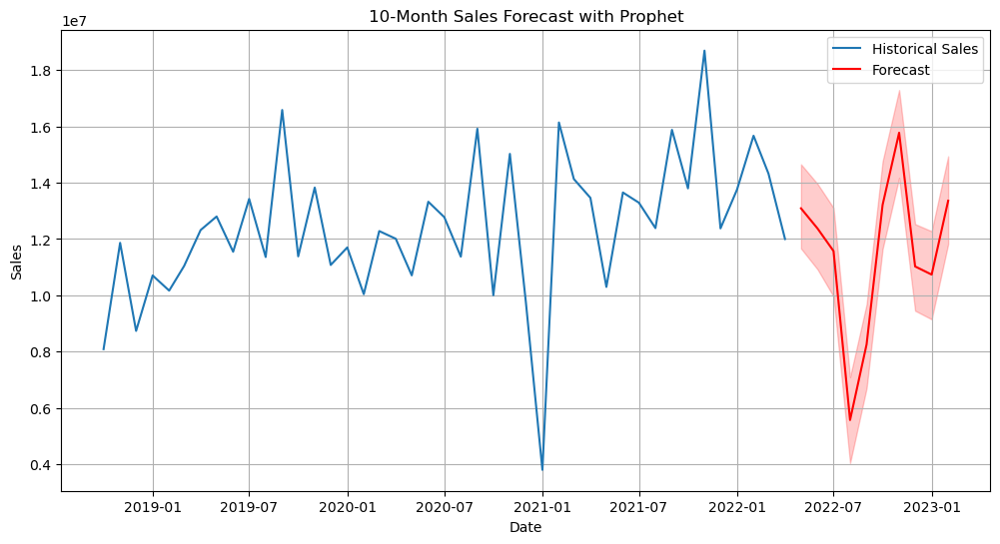

/var/folders/z6/_vn8cndd4x5dmx2cpjfdkjdr0000gn/T/ipykernel_48953/2654481750.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_set_3["Sales_EUR"] = results["yhat"]


,Mapped_GCK,Sales_EUR
Month Year,,
2022-05-01,#3,1.308766e+07
2022-06-01,#3,1.237292e+07
2022-07-01,#3,1.157175e+07
2022-08-01,#3,5.574144e+06
2022-09-01,#3,8.259140e+06
2022-10-01,#3,1.320984e+07
2022-11-01,#3,1.577316e+07
2022-12-01,#3,1.102556e+07
2023-01-01,#3,1.073667e+07


In [37]:
best_model, best_params, best_rmse, best_model_name = select_best_model(
    prophet_best_model_3, prophet_best_params_3, prophet_best_rmse_3, "Prophet",
    xgboost_best_model_3, xgboost_best_params_3, xgboost_best_rmse_3, "XGBoost"
    , sarima_best_model_3, sarima_best_params_3, sarima_best_rmse_3, "SARIMA"
)
print(f"Best Model: {best_model_name}")
print("Best Parameters:", best_params)
print("Best RMSE:", best_rmse)

if best_model_name == "XGBoost":
    results = xgboost_forecast(
        sales_agg3,
        df_market_3,
        period=10,
        params =best_params,
    )
elif best_model_name == "SARIMA":
    results = sarima_forecast(
        sales_agg3,
        period=10,
        params =best_params,
    )
else:
    results = prophet_forecast(
        sales_agg3,
        df_market_3,
        period=10,
        param =best_params,
    )
results.set_index('ds',inplace = True)
test_set_3.set_index('Month Year', inplace = True)
test_set_3["Sales_EUR"] = results["yhat"]
test_set_3

# Product 4

In [38]:
test_set_4 = test_set[test_set['Mapped_GCK'] == '#4']
df_market_4 = df_market[selected_features_4]
df_market_4.head()

,PRO27756_org_lag_5,WKLWEUR840_org_lag_3,PRI27276_org_lag_2,PRO28392_org_lag_4,MAB_ELE_PRO156_lag_4,PRO28756_org_lag_6,PRO28392_org_lag_1,MAB_ELE_SHP392_lag_6
date,,,,,,,,
2004-02-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2004-03-01,NaN,NaN,NaN,NaN,NaN,NaN,110.890034,NaN
2004-04-01,NaN,NaN,93.230453,NaN,NaN,NaN,141.176853,NaN
2004-05-01,NaN,1.2646,93.335678,NaN,NaN,NaN,105.648765,NaN
2004-06-01,NaN,1.2262,93.440903,110.890034,16.940704,NaN,101.990361,NaN


## Xgboost

In [39]:
X_train, X_val, y_train, y_val = train_val_split(sales_agg4, df_market_4, train_size = 0.8)

X_val.info() 

xgboost_best_model_4, xgboost_best_params_4, xgboost_best_rmse_4 = model_evaluation_XGboost(X_train,
                                                                                             y_train, 
                                                                                             X_val, y_val, 
                                                                                             xgboost_param_grid)

print("Best Params:", xgboost_best_params_4)
print("Validation RMSE:", xgboost_best_rmse_4)

<class 'pandas.core.frame.DataFrame'>
Index: 9 entries, 2021-08-01 to 2022-04-01
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   PRO27756_org_lag_5    9 non-null      float64
 1   WKLWEUR840_org_lag_3  9 non-null      float64
 2   PRI27276_org_lag_2    9 non-null      float64
 3   PRO28392_org_lag_4    9 non-null      float64
 4   MAB_ELE_PRO156_lag_4  9 non-null      float64
 5   PRO28756_org_lag_6    9 non-null      float64
 6   PRO28392_org_lag_1    9 non-null      float64
 7   MAB_ELE_SHP392_lag_6  9 non-null      float64
dtypes: float64(8)
memory usage: 648.0+ bytes
Params: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.01, 'subsample': 0.5, 'colsample_bytree': 0.5, 'gamma': 0, 'reg_alpha': 0, 'reg_lambda': 0} => RMSE: 117764.8240, Relative RMSE: 0.3998
Params: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.01, 'subsample': 0.5, 'colsample_bytree': 0.5, 'gamma': 0, 'reg_alp

## Prophet

In [40]:
prophet_best_model_4, prophet_best_params_4, prophet_best_rmse_4 = model_evaluation_prophet(X_train,
                                                                                             y_train, 
                                                                                             X_val, 
                                                                                             y_val, 
                                                                                             prophet_param_grid)

print("Best Params:", prophet_best_params_4)

print("Validation RMSE:", prophet_best_rmse_4)

00:50:54 - cmdstanpy - INFO - Chain [1] start processing
00:50:55 - cmdstanpy - INFO - Chain [1] done processing
00:50:55 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 136482.4471, Relative RMSE: 0.4634


00:50:58 - cmdstanpy - INFO - Chain [1] done processing
00:50:58 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 136531.5438, Relative RMSE: 0.4635


00:50:58 - cmdstanpy - INFO - Chain [1] done processing
00:50:58 - cmdstanpy - INFO - Chain [1] start processing
00:50:59 - cmdstanpy - INFO - Chain [1] done processing
00:50:59 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 138812.8998, Relative RMSE: 0.4713
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 142801.9242, Relative RMSE: 0.4848


00:50:59 - cmdstanpy - INFO - Chain [1] done processing
00:50:59 - cmdstanpy - INFO - Chain [1] start processing
00:50:59 - cmdstanpy - INFO - Chain [1] done processing
00:50:59 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 142804.9072, Relative RMSE: 0.4848
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 142802.6585, Relative RMSE: 0.4848


00:50:59 - cmdstanpy - INFO - Chain [1] done processing
00:50:59 - cmdstanpy - INFO - Chain [1] start processing
00:50:59 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 142653.5874, Relative RMSE: 0.4843
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 142575.8299, Relative RMSE: 0.4841


00:50:59 - cmdstanpy - INFO - Chain [1] start processing
00:50:59 - cmdstanpy - INFO - Chain [1] done processing
00:50:59 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 143012.8864, Relative RMSE: 0.4855


00:51:00 - cmdstanpy - INFO - Chain [1] done processing
00:51:00 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 252322.3086, Relative RMSE: 0.8567


00:51:00 - cmdstanpy - INFO - Chain [1] done processing
00:51:00 - cmdstanpy - INFO - Chain [1] start processing
00:51:00 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 252212.0822, Relative RMSE: 0.8563


00:51:00 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 252293.2188, Relative RMSE: 0.8566


00:51:00 - cmdstanpy - INFO - Chain [1] done processing
00:51:00 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 122423.3035, Relative RMSE: 0.4156


00:51:01 - cmdstanpy - INFO - Chain [1] done processing
00:51:01 - cmdstanpy - INFO - Chain [1] start processing
00:51:01 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 122597.7800, Relative RMSE: 0.4162


00:51:01 - cmdstanpy - INFO - Chain [1] start processing
00:51:01 - cmdstanpy - INFO - Chain [1] done processing
00:51:01 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 122433.0338, Relative RMSE: 0.4157
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 123998.4115, Relative RMSE: 0.4210


00:51:01 - cmdstanpy - INFO - Chain [1] done processing
00:51:01 - cmdstanpy - INFO - Chain [1] start processing
00:51:01 - cmdstanpy - INFO - Chain [1] done processing
00:51:01 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 123999.0866, Relative RMSE: 0.4210
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 123999.1912, Relative RMSE: 0.4210


00:51:01 - cmdstanpy - INFO - Chain [1] done processing
00:51:01 - cmdstanpy - INFO - Chain [1] start processing
00:51:02 - cmdstanpy - INFO - Chain [1] done processing
00:51:02 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 124350.9749, Relative RMSE: 0.4222
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 124356.1779, Relative RMSE: 0.4222


00:51:02 - cmdstanpy - INFO - Chain [1] done processing
00:51:02 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 124382.5294, Relative RMSE: 0.4223


00:51:02 - cmdstanpy - INFO - Chain [1] done processing
00:51:02 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 226288.3183, Relative RMSE: 0.7683


00:51:02 - cmdstanpy - INFO - Chain [1] done processing
00:51:02 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 226203.0460, Relative RMSE: 0.7680


00:51:03 - cmdstanpy - INFO - Chain [1] done processing
00:51:03 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 225965.3908, Relative RMSE: 0.7672


00:51:03 - cmdstanpy - INFO - Chain [1] done processing
00:51:04 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 66010.1068, Relative RMSE: 0.2241


00:51:04 - cmdstanpy - INFO - Chain [1] done processing
00:51:04 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 65917.1090, Relative RMSE: 0.2238


00:51:04 - cmdstanpy - INFO - Chain [1] done processing
00:51:04 - cmdstanpy - INFO - Chain [1] start processing
00:51:05 - cmdstanpy - INFO - Chain [1] done processing
00:51:05 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 65550.9557, Relative RMSE: 0.2226
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 72717.7974, Relative RMSE: 0.2469


00:51:05 - cmdstanpy - INFO - Chain [1] done processing
00:51:05 - cmdstanpy - INFO - Chain [1] start processing
00:51:05 - cmdstanpy - INFO - Chain [1] done processing
00:51:05 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 72750.5623, Relative RMSE: 0.2470
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 72761.4673, Relative RMSE: 0.2470


00:51:05 - cmdstanpy - INFO - Chain [1] done processing
00:51:05 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 169834.6855, Relative RMSE: 0.5766


00:51:05 - cmdstanpy - INFO - Chain [1] done processing
00:51:05 - cmdstanpy - INFO - Chain [1] start processing
00:51:06 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 170618.4451, Relative RMSE: 0.5793


00:51:06 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 171059.5439, Relative RMSE: 0.5808


00:51:06 - cmdstanpy - INFO - Chain [1] done processing
00:51:06 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 234983.5329, Relative RMSE: 0.7978


00:51:06 - cmdstanpy - INFO - Chain [1] done processing
00:51:06 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 240023.0936, Relative RMSE: 0.8149


00:51:07 - cmdstanpy - INFO - Chain [1] done processing
00:51:07 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 228301.3994, Relative RMSE: 0.7751


00:51:08 - cmdstanpy - INFO - Chain [1] done processing
00:51:08 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 151593.1536, Relative RMSE: 0.5147


00:51:09 - cmdstanpy - INFO - Chain [1] done processing
00:51:09 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 152406.2043, Relative RMSE: 0.5174


00:51:09 - cmdstanpy - INFO - Chain [1] done processing
00:51:09 - cmdstanpy - INFO - Chain [1] start processing
00:51:10 - cmdstanpy - INFO - Chain [1] done processing
00:51:10 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 148079.2969, Relative RMSE: 0.5027
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 118998.5427, Relative RMSE: 0.4040


00:51:10 - cmdstanpy - INFO - Chain [1] done processing
00:51:10 - cmdstanpy - INFO - Chain [1] start processing
00:51:10 - cmdstanpy - INFO - Chain [1] done processing
00:51:10 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 123328.7742, Relative RMSE: 0.4187
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 122745.6883, Relative RMSE: 0.4167


00:51:10 - cmdstanpy - INFO - Chain [1] done processing
00:51:10 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 246147.3384, Relative RMSE: 0.8357


00:51:10 - cmdstanpy - INFO - Chain [1] done processing
00:51:10 - cmdstanpy - INFO - Chain [1] start processing
00:51:11 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 232117.3481, Relative RMSE: 0.7881


00:51:11 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 246449.8277, Relative RMSE: 0.8367


00:51:11 - cmdstanpy - INFO - Chain [1] done processing
00:51:11 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 310448.8892, Relative RMSE: 1.0540


00:51:11 - cmdstanpy - INFO - Chain [1] done processing
00:51:11 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 307861.0805, Relative RMSE: 1.0452


00:51:12 - cmdstanpy - INFO - Chain [1] done processing
00:51:12 - cmdstanpy - INFO - Chain [1] start processing
00:51:12 - cmdstanpy - INFO - Chain [1] done processing
00:51:12 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 315746.8529, Relative RMSE: 1.0720
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 142511.2942, Relative RMSE: 0.4838


00:51:12 - cmdstanpy - INFO - Chain [1] done processing
00:51:12 - cmdstanpy - INFO - Chain [1] start processing
00:51:12 - cmdstanpy - INFO - Chain [1] done processing
00:51:12 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 142596.0790, Relative RMSE: 0.4841
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 142518.6816, Relative RMSE: 0.4839


00:51:12 - cmdstanpy - INFO - Chain [1] done processing
00:51:12 - cmdstanpy - INFO - Chain [1] start processing
00:51:12 - cmdstanpy - INFO - Chain [1] done processing
00:51:12 - cmdstanpy - INFO - Chain [1] start processing
00:51:12 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 144498.6702, Relative RMSE: 0.4906
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 144499.4032, Relative RMSE: 0.4906
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 144500.1584, Relative RMSE: 0.4906


00:51:12 - cmdstanpy - INFO - Chain [1] start processing
00:51:13 - cmdstanpy - INFO - Chain [1] done processing
00:51:13 - cmdstanpy - INFO - Chain [1] start processing
00:51:13 - cmdstanpy - INFO - Chain [1] done processing
00:51:13 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 144802.1629, Relative RMSE: 0.4916
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 144907.0304, Relative RMSE: 0.4920


00:51:13 - cmdstanpy - INFO - Chain [1] done processing
00:51:13 - cmdstanpy - INFO - Chain [1] start processing
00:51:13 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 144881.4204, Relative RMSE: 0.4919
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 252920.4781, Relative RMSE: 0.8587


00:51:13 - cmdstanpy - INFO - Chain [1] start processing
00:51:13 - cmdstanpy - INFO - Chain [1] done processing
00:51:13 - cmdstanpy - INFO - Chain [1] start processing
00:51:13 - cmdstanpy - INFO - Chain [1] done processing
00:51:13 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 252722.7696, Relative RMSE: 0.8580
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 252672.0010, Relative RMSE: 0.8579


00:51:14 - cmdstanpy - INFO - Chain [1] done processing
00:51:14 - cmdstanpy - INFO - Chain [1] start processing
00:51:14 - cmdstanpy - INFO - Chain [1] done processing
00:51:14 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 142511.2942, Relative RMSE: 0.4838
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 142596.0790, Relative RMSE: 0.4841


00:51:14 - cmdstanpy - INFO - Chain [1] done processing
00:51:14 - cmdstanpy - INFO - Chain [1] start processing
00:51:14 - cmdstanpy - INFO - Chain [1] done processing
00:51:14 - cmdstanpy - INFO - Chain [1] start processing
00:51:14 - cmdstanpy - INFO - Chain [1] done processing
00:51:14 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 142518.6816, Relative RMSE: 0.4839
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 144498.6702, Relative RMSE: 0.4906
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 144499.4032, Relative RMSE: 0.4906


00:51:14 - cmdstanpy - INFO - Chain [1] done processing
00:51:14 - cmdstanpy - INFO - Chain [1] start processing
00:51:14 - cmdstanpy - INFO - Chain [1] done processing
00:51:14 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 144500.1584, Relative RMSE: 0.4906
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 144802.1629, Relative RMSE: 0.4916


00:51:14 - cmdstanpy - INFO - Chain [1] done processing
00:51:14 - cmdstanpy - INFO - Chain [1] start processing
00:51:15 - cmdstanpy - INFO - Chain [1] done processing
00:51:15 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 144907.0304, Relative RMSE: 0.4920
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 144881.4204, Relative RMSE: 0.4919


00:51:15 - cmdstanpy - INFO - Chain [1] done processing
00:51:15 - cmdstanpy - INFO - Chain [1] start processing
00:51:15 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 252920.4781, Relative RMSE: 0.8587
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 252722.7696, Relative RMSE: 0.8580


00:51:15 - cmdstanpy - INFO - Chain [1] start processing
00:51:15 - cmdstanpy - INFO - Chain [1] done processing
00:51:15 - cmdstanpy - INFO - Chain [1] start processing
00:51:15 - cmdstanpy - INFO - Chain [1] done processing
00:51:15 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 252672.0010, Relative RMSE: 0.8579
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 142511.2942, Relative RMSE: 0.4838


00:51:15 - cmdstanpy - INFO - Chain [1] done processing
00:51:15 - cmdstanpy - INFO - Chain [1] start processing
00:51:16 - cmdstanpy - INFO - Chain [1] done processing
00:51:16 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 142596.0790, Relative RMSE: 0.4841
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 142518.6816, Relative RMSE: 0.4839


00:51:16 - cmdstanpy - INFO - Chain [1] done processing
00:51:16 - cmdstanpy - INFO - Chain [1] start processing
00:51:16 - cmdstanpy - INFO - Chain [1] done processing
00:51:16 - cmdstanpy - INFO - Chain [1] start processing
00:51:16 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 144498.6702, Relative RMSE: 0.4906
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 144499.4032, Relative RMSE: 0.4906
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 144500.1584, Relative RMSE: 0.4906


00:51:16 - cmdstanpy - INFO - Chain [1] start processing
00:51:16 - cmdstanpy - INFO - Chain [1] done processing
00:51:16 - cmdstanpy - INFO - Chain [1] start processing
00:51:16 - cmdstanpy - INFO - Chain [1] done processing
00:51:16 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 144802.1629, Relative RMSE: 0.4916
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 144907.0304, Relative RMSE: 0.4920


00:51:16 - cmdstanpy - INFO - Chain [1] done processing
00:51:16 - cmdstanpy - INFO - Chain [1] start processing
00:51:17 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 144881.4204, Relative RMSE: 0.4919
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 252920.4781, Relative RMSE: 0.8587


00:51:17 - cmdstanpy - INFO - Chain [1] start processing
00:51:17 - cmdstanpy - INFO - Chain [1] done processing
00:51:17 - cmdstanpy - INFO - Chain [1] start processing
00:51:17 - cmdstanpy - INFO - Chain [1] done processing
00:51:17 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 252722.7696, Relative RMSE: 0.8580
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 252672.0010, Relative RMSE: 0.8579


00:51:17 - cmdstanpy - INFO - Chain [1] done processing
00:51:17 - cmdstanpy - INFO - Chain [1] start processing
00:51:17 - cmdstanpy - INFO - Chain [1] done processing
00:51:17 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 142511.2942, Relative RMSE: 0.4838
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 142596.0790, Relative RMSE: 0.4841


00:51:17 - cmdstanpy - INFO - Chain [1] done processing
00:51:17 - cmdstanpy - INFO - Chain [1] start processing
00:51:17 - cmdstanpy - INFO - Chain [1] done processing
00:51:17 - cmdstanpy - INFO - Chain [1] start processing
00:51:18 - cmdstanpy - INFO - Chain [1] done processing
00:51:18 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 142518.6816, Relative RMSE: 0.4839
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 144498.6702, Relative RMSE: 0.4906
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 144499.4032, Relative RMSE: 0.4906


00:51:18 - cmdstanpy - INFO - Chain [1] done processing
00:51:18 - cmdstanpy - INFO - Chain [1] start processing
00:51:18 - cmdstanpy - INFO - Chain [1] done processing
00:51:18 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 144500.1584, Relative RMSE: 0.4906
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 144802.1629, Relative RMSE: 0.4916


00:51:18 - cmdstanpy - INFO - Chain [1] done processing
00:51:18 - cmdstanpy - INFO - Chain [1] start processing
00:51:18 - cmdstanpy - INFO - Chain [1] done processing
00:51:18 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 144907.0304, Relative RMSE: 0.4920
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 144881.4204, Relative RMSE: 0.4919


00:51:18 - cmdstanpy - INFO - Chain [1] done processing
00:51:18 - cmdstanpy - INFO - Chain [1] start processing
00:51:18 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 252920.4781, Relative RMSE: 0.8587
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 252722.7696, Relative RMSE: 0.8580


00:51:18 - cmdstanpy - INFO - Chain [1] start processing
00:51:19 - cmdstanpy - INFO - Chain [1] done processing
00:51:19 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 252672.0010, Relative RMSE: 0.8579


00:51:19 - cmdstanpy - INFO - Chain [1] done processing
00:51:19 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 141026.7295, Relative RMSE: 0.4788


00:51:20 - cmdstanpy - INFO - Chain [1] done processing
00:51:20 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 140114.4575, Relative RMSE: 0.4757


00:51:20 - cmdstanpy - INFO - Chain [1] done processing
00:51:20 - cmdstanpy - INFO - Chain [1] start processing
00:51:20 - cmdstanpy - INFO - Chain [1] done processing
00:51:21 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 140683.3977, Relative RMSE: 0.4776
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 144747.7173, Relative RMSE: 0.4914


00:51:21 - cmdstanpy - INFO - Chain [1] done processing
00:51:21 - cmdstanpy - INFO - Chain [1] start processing
00:51:21 - cmdstanpy - INFO - Chain [1] done processing
00:51:21 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 144749.2033, Relative RMSE: 0.4914
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 144749.9447, Relative RMSE: 0.4914


00:51:21 - cmdstanpy - INFO - Chain [1] done processing
00:51:21 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 145104.6219, Relative RMSE: 0.4926


00:51:21 - cmdstanpy - INFO - Chain [1] done processing
00:51:21 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 145263.7931, Relative RMSE: 0.4932


00:51:21 - cmdstanpy - INFO - Chain [1] done processing
00:51:21 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 145093.8736, Relative RMSE: 0.4926


00:51:22 - cmdstanpy - INFO - Chain [1] done processing
00:51:22 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 253273.3465, Relative RMSE: 0.8599


00:51:22 - cmdstanpy - INFO - Chain [1] done processing
00:51:22 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 253660.1690, Relative RMSE: 0.8612


00:51:22 - cmdstanpy - INFO - Chain [1] done processing
00:51:22 - cmdstanpy - INFO - Chain [1] start processing
00:51:23 - cmdstanpy - INFO - Chain [1] done processing
00:51:23 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 253606.9289, Relative RMSE: 0.8610
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 145344.7826, Relative RMSE: 0.4935


00:51:23 - cmdstanpy - INFO - Chain [1] done processing
00:51:23 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 145347.2008, Relative RMSE: 0.4935


00:51:23 - cmdstanpy - INFO - Chain [1] done processing
00:51:23 - cmdstanpy - INFO - Chain [1] start processing
00:51:23 - cmdstanpy - INFO - Chain [1] done processing
00:51:23 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 145354.0464, Relative RMSE: 0.4935
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 145569.4873, Relative RMSE: 0.4942


00:51:23 - cmdstanpy - INFO - Chain [1] done processing
00:51:23 - cmdstanpy - INFO - Chain [1] start processing
00:51:24 - cmdstanpy - INFO - Chain [1] done processing
00:51:24 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 145569.0248, Relative RMSE: 0.4942
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 145574.1226, Relative RMSE: 0.4942


00:51:24 - cmdstanpy - INFO - Chain [1] done processing
00:51:24 - cmdstanpy - INFO - Chain [1] start processing
00:51:24 - cmdstanpy - INFO - Chain [1] done processing
00:51:24 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 145912.2744, Relative RMSE: 0.4954
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 145725.5505, Relative RMSE: 0.4948


00:51:24 - cmdstanpy - INFO - Chain [1] done processing
00:51:24 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 145885.8207, Relative RMSE: 0.4953


00:51:24 - cmdstanpy - INFO - Chain [1] done processing
00:51:25 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 238294.8757, Relative RMSE: 0.8090


00:51:25 - cmdstanpy - INFO - Chain [1] done processing
00:51:25 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 238455.4431, Relative RMSE: 0.8096


00:51:25 - cmdstanpy - INFO - Chain [1] done processing
00:51:25 - cmdstanpy - INFO - Chain [1] start processing
00:51:25 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 238364.0627, Relative RMSE: 0.8093


00:51:25 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 117364.3210, Relative RMSE: 0.3985


00:51:26 - cmdstanpy - INFO - Chain [1] done processing
00:51:26 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 114236.0758, Relative RMSE: 0.3878


00:51:26 - cmdstanpy - INFO - Chain [1] done processing
00:51:26 - cmdstanpy - INFO - Chain [1] start processing
00:51:26 - cmdstanpy - INFO - Chain [1] done processing
00:51:26 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 118205.3608, Relative RMSE: 0.4013
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 103165.9350, Relative RMSE: 0.3503


00:51:26 - cmdstanpy - INFO - Chain [1] done processing
00:51:26 - cmdstanpy - INFO - Chain [1] start processing
00:51:26 - cmdstanpy - INFO - Chain [1] done processing
00:51:27 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 104375.2794, Relative RMSE: 0.3544
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 105664.3846, Relative RMSE: 0.3587


00:51:27 - cmdstanpy - INFO - Chain [1] done processing
00:51:27 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 115542.6386, Relative RMSE: 0.3923


00:51:27 - cmdstanpy - INFO - Chain [1] done processing
00:51:27 - cmdstanpy - INFO - Chain [1] start processing
00:51:27 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 76995.7808, Relative RMSE: 0.2614


00:51:27 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 99588.8989, Relative RMSE: 0.3381


00:51:28 - cmdstanpy - INFO - Chain [1] done processing
00:51:28 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 177871.9556, Relative RMSE: 0.6039


00:51:28 - cmdstanpy - INFO - Chain [1] done processing
00:51:28 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 177553.1181, Relative RMSE: 0.6028


00:51:28 - cmdstanpy - INFO - Chain [1] done processing
00:51:28 - cmdstanpy - INFO - Chain [1] start processing
00:51:29 - cmdstanpy - INFO - Chain [1] done processing
00:51:29 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 166274.7764, Relative RMSE: 0.5645
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 129217.1168, Relative RMSE: 0.4387


00:51:29 - cmdstanpy - INFO - Chain [1] done processing
00:51:29 - cmdstanpy - INFO - Chain [1] start processing
00:51:29 - cmdstanpy - INFO - Chain [1] done processing
00:51:29 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 129215.6255, Relative RMSE: 0.4387
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 129220.4967, Relative RMSE: 0.4387


00:51:29 - cmdstanpy - INFO - Chain [1] done processing
00:51:29 - cmdstanpy - INFO - Chain [1] start processing
00:51:29 - cmdstanpy - INFO - Chain [1] done processing
00:51:29 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 122008.5467, Relative RMSE: 0.4142
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 123449.8146, Relative RMSE: 0.4191


00:51:29 - cmdstanpy - INFO - Chain [1] done processing
00:51:29 - cmdstanpy - INFO - Chain [1] start processing
00:51:30 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 123364.6888, Relative RMSE: 0.4188


00:51:30 - cmdstanpy - INFO - Chain [1] start processing
00:51:30 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 610797.8764, Relative RMSE: 2.0737


00:51:30 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 611328.7662, Relative RMSE: 2.0755


00:51:30 - cmdstanpy - INFO - Chain [1] done processing
00:51:30 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 607704.6235, Relative RMSE: 2.0632


00:51:31 - cmdstanpy - INFO - Chain [1] done processing
00:51:31 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 609761.1794, Relative RMSE: 2.0702


00:51:31 - cmdstanpy - INFO - Chain [1] done processing
00:51:31 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 662432.3731, Relative RMSE: 2.2490


00:51:31 - cmdstanpy - INFO - Chain [1] done processing
00:51:31 - cmdstanpy - INFO - Chain [1] start processing
00:51:31 - cmdstanpy - INFO - Chain [1] done processing
00:51:31 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 592931.2489, Relative RMSE: 2.0131
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 142511.2942, Relative RMSE: 0.4838


00:51:32 - cmdstanpy - INFO - Chain [1] done processing
00:51:32 - cmdstanpy - INFO - Chain [1] start processing
00:51:32 - cmdstanpy - INFO - Chain [1] done processing
00:51:32 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 142596.0790, Relative RMSE: 0.4841
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 142518.6816, Relative RMSE: 0.4839


00:51:32 - cmdstanpy - INFO - Chain [1] done processing
00:51:32 - cmdstanpy - INFO - Chain [1] start processing
00:51:32 - cmdstanpy - INFO - Chain [1] done processing
00:51:32 - cmdstanpy - INFO - Chain [1] start processing
00:51:32 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 144498.6702, Relative RMSE: 0.4906
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 144499.4032, Relative RMSE: 0.4906


00:51:32 - cmdstanpy - INFO - Chain [1] start processing
00:51:32 - cmdstanpy - INFO - Chain [1] done processing
00:51:32 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 144500.1584, Relative RMSE: 0.4906
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 144802.1629, Relative RMSE: 0.4916


00:51:32 - cmdstanpy - INFO - Chain [1] done processing
00:51:32 - cmdstanpy - INFO - Chain [1] start processing
00:51:32 - cmdstanpy - INFO - Chain [1] done processing
00:51:32 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 144907.0304, Relative RMSE: 0.4920
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 144881.4204, Relative RMSE: 0.4919


00:51:33 - cmdstanpy - INFO - Chain [1] done processing
00:51:33 - cmdstanpy - INFO - Chain [1] start processing
00:51:33 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 252920.4781, Relative RMSE: 0.8587
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 252722.7696, Relative RMSE: 0.8580


00:51:33 - cmdstanpy - INFO - Chain [1] start processing
00:51:33 - cmdstanpy - INFO - Chain [1] done processing
00:51:33 - cmdstanpy - INFO - Chain [1] start processing
00:51:33 - cmdstanpy - INFO - Chain [1] done processing
00:51:33 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 252672.0010, Relative RMSE: 0.8579
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 142511.2942, Relative RMSE: 0.4838


00:51:33 - cmdstanpy - INFO - Chain [1] done processing
00:51:33 - cmdstanpy - INFO - Chain [1] start processing
00:51:33 - cmdstanpy - INFO - Chain [1] done processing
00:51:34 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 142596.0790, Relative RMSE: 0.4841
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 142518.6816, Relative RMSE: 0.4839


00:51:34 - cmdstanpy - INFO - Chain [1] done processing
00:51:34 - cmdstanpy - INFO - Chain [1] start processing
00:51:34 - cmdstanpy - INFO - Chain [1] done processing
00:51:34 - cmdstanpy - INFO - Chain [1] start processing
00:51:34 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 144498.6702, Relative RMSE: 0.4906
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 144499.4032, Relative RMSE: 0.4906
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 144500.1584, Relative RMSE: 0.4906


00:51:34 - cmdstanpy - INFO - Chain [1] start processing
00:51:34 - cmdstanpy - INFO - Chain [1] done processing
00:51:34 - cmdstanpy - INFO - Chain [1] start processing
00:51:34 - cmdstanpy - INFO - Chain [1] done processing
00:51:34 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 144802.1629, Relative RMSE: 0.4916
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 144907.0304, Relative RMSE: 0.4920


00:51:34 - cmdstanpy - INFO - Chain [1] done processing
00:51:34 - cmdstanpy - INFO - Chain [1] start processing
00:51:34 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 144881.4204, Relative RMSE: 0.4919
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 252920.4781, Relative RMSE: 0.8587


00:51:34 - cmdstanpy - INFO - Chain [1] start processing
00:51:35 - cmdstanpy - INFO - Chain [1] done processing
00:51:35 - cmdstanpy - INFO - Chain [1] start processing
00:51:35 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 252722.7696, Relative RMSE: 0.8580
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 252672.0010, Relative RMSE: 0.8579


00:51:35 - cmdstanpy - INFO - Chain [1] start processing
00:51:35 - cmdstanpy - INFO - Chain [1] done processing
00:51:35 - cmdstanpy - INFO - Chain [1] start processing
00:51:35 - cmdstanpy - INFO - Chain [1] done processing
00:51:35 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 142511.2942, Relative RMSE: 0.4838
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 142596.0790, Relative RMSE: 0.4841


00:51:35 - cmdstanpy - INFO - Chain [1] done processing
00:51:35 - cmdstanpy - INFO - Chain [1] start processing
00:51:35 - cmdstanpy - INFO - Chain [1] done processing
00:51:35 - cmdstanpy - INFO - Chain [1] start processing
00:51:35 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 142518.6816, Relative RMSE: 0.4839
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 144498.6702, Relative RMSE: 0.4906


00:51:35 - cmdstanpy - INFO - Chain [1] start processing
00:51:36 - cmdstanpy - INFO - Chain [1] done processing
00:51:36 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 144499.4032, Relative RMSE: 0.4906
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 144500.1584, Relative RMSE: 0.4906


00:51:36 - cmdstanpy - INFO - Chain [1] done processing
00:51:36 - cmdstanpy - INFO - Chain [1] start processing
00:51:36 - cmdstanpy - INFO - Chain [1] done processing
00:51:36 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 144802.1629, Relative RMSE: 0.4916
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 144907.0304, Relative RMSE: 0.4920


00:51:36 - cmdstanpy - INFO - Chain [1] done processing
00:51:36 - cmdstanpy - INFO - Chain [1] start processing
00:51:36 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 144881.4204, Relative RMSE: 0.4919
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 252920.4781, Relative RMSE: 0.8587


00:51:36 - cmdstanpy - INFO - Chain [1] start processing
00:51:36 - cmdstanpy - INFO - Chain [1] done processing
00:51:36 - cmdstanpy - INFO - Chain [1] start processing
00:51:37 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 252722.7696, Relative RMSE: 0.8580
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 252672.0010, Relative RMSE: 0.8579


00:51:37 - cmdstanpy - INFO - Chain [1] start processing
00:51:37 - cmdstanpy - INFO - Chain [1] done processing
00:51:37 - cmdstanpy - INFO - Chain [1] start processing
00:51:37 - cmdstanpy - INFO - Chain [1] done processing
00:51:37 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 142511.2942, Relative RMSE: 0.4838
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 142596.0790, Relative RMSE: 0.4841


00:51:37 - cmdstanpy - INFO - Chain [1] done processing
00:51:37 - cmdstanpy - INFO - Chain [1] start processing
00:51:37 - cmdstanpy - INFO - Chain [1] done processing
00:51:37 - cmdstanpy - INFO - Chain [1] start processing
00:51:37 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 142518.6816, Relative RMSE: 0.4839
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 144498.6702, Relative RMSE: 0.4906
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 144499.4032, Relative RMSE: 0.4906


00:51:37 - cmdstanpy - INFO - Chain [1] start processing
00:51:37 - cmdstanpy - INFO - Chain [1] done processing
00:51:37 - cmdstanpy - INFO - Chain [1] start processing
00:51:37 - cmdstanpy - INFO - Chain [1] done processing
00:51:37 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 144500.1584, Relative RMSE: 0.4906
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 144802.1629, Relative RMSE: 0.4916


00:51:38 - cmdstanpy - INFO - Chain [1] done processing
00:51:38 - cmdstanpy - INFO - Chain [1] start processing
00:51:38 - cmdstanpy - INFO - Chain [1] done processing
00:51:38 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 144907.0304, Relative RMSE: 0.4920
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 144881.4204, Relative RMSE: 0.4919


00:51:38 - cmdstanpy - INFO - Chain [1] done processing
00:51:38 - cmdstanpy - INFO - Chain [1] start processing
00:51:38 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 252920.4781, Relative RMSE: 0.8587


00:51:38 - cmdstanpy - INFO - Chain [1] start processing
00:51:38 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 252722.7696, Relative RMSE: 0.8580
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 252672.0010, Relative RMSE: 0.8579
Best Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0}
Validation RMSE: 65550.95572642436


## Sarima

In [41]:
sarima_best_model_4, sarima_best_params_4, sarima_best_rmse_4 = model_evaluation_SARIMA(y_train, 
                                                             y_val, 
                                                             sarima_param_grid)

print("Best Params:", sarima_best_params_4)
print("Validation RMSE:", sarima_best_rmse_4)

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,0) x (0,0,0,6) => RMSE: 299984.1978, Relative RMSE: 1.0185
SARIMA(0,0,0) x (0,0,0,12) => RMSE: 299984.1978, Relative RMSE: 1.0185
SARIMA(0,0,0) x (0,0,1,6) => RMSE: 238385.7179, Relative RMSE: 0.8093
SARIMA(0,0,0) x (0,0,1,12) => RMSE: 175076.1292, Relative RMSE: 0.5944
SARIMA(0,0,0) x (0,1,0,6) => RMSE: 356328.0270, Relative RMSE: 1.2098
SARIMA(0,0,0) x (0,1,0,12) => RMSE: 228248.0132, Relative RMSE: 0.7749
SARIMA(0,0,0) x (0,1,1,6) => RMSE: 182844.2542, Relative RMSE: 0.6208
SARIMA(0,0,0) x (0,1,1,12) => RMSE: 194926.6074, Relative RMSE: 0.6618
SARIMA(0,0,0) x (1,0,0,6) => RMSE: 294296.3636, Relative RMSE: 0.9992
SARIMA(0,0,0) x (1,0,0,12) => RMSE: 200026.8708, Relative RMSE: 0.6791
SARIMA(0,0,0) x (1,0,1,6) => RMSE: 308048.0955, Relative RMSE: 1.0459
SARIMA(0,0,0) x (1,0,1,12) => RMSE: 330049.7865, Relative RMSE: 1.1206
SARIMA(0,0,0) x (1,1,0,6) => RMSE: 223095.8238, Relative RMSE: 0.7574
SARIMA(0,0,0) x (1,1,0,12) => RMSE: 117597.0007, Relative RMSE: 0.3993


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,0) x (1,1,1,6) => RMSE: 129052.2372, Relative RMSE: 0.4381
SARIMA(0,0,0) x (1,1,1,12) => RMSE: 10477649.0707, Relative RMSE: 35.5729
SARIMA(0,0,1) x (0,0,0,6) => RMSE: 298509.7004, Relative RMSE: 1.0135
SARIMA(0,0,1) x (0,0,0,12) => RMSE: 298509.7004, Relative RMSE: 1.0135
SARIMA(0,0,1) x (0,0,1,6) => RMSE: 232805.4118, Relative RMSE: 0.7904
SARIMA(0,0,1) x (0,0,1,12) => RMSE: 169428.4708, Relative RMSE: 0.5752
SARIMA(0,0,1) x (0,1,0,6) => RMSE: 357653.6793, Relative RMSE: 1.2143
SARIMA(0,0,1) x (0,1,0,12) => RMSE: 229264.6948, Relative RMSE: 0.7784
SARIMA(0,0,1) x (0,1,1,6) => RMSE: 174648.7432, Relative RMSE: 0.5930
SARIMA(0,0,1) x (0,1,1,12) => RMSE: 234513.4975, Relative RMSE: 0.7962
SARIMA(0,0,1) x (1,0,0,6) => RMSE: 287528.4793, Relative RMSE: 0.9762


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,0,1) x (1,0,0,12) => RMSE: 180274.1727, Relative RMSE: 0.6121
SARIMA(0,0,1) x (1,0,1,6) => RMSE: 311320.0196, Relative RMSE: 1.0570
SARIMA(0,0,1) x (1,0,1,12) => RMSE: 303834.8977, Relative RMSE: 1.0316
SARIMA(0,0,1) x (1,1,0,6) => RMSE: 205229.3234, Relative RMSE: 0.6968
SARIMA(0,0,1) x (1,1,0,12) => RMSE: 172946.5688, Relative RMSE: 0.5872
SARIMA(0,0,1) x (1,1,1,6) => RMSE: 156660.7123, Relative RMSE: 0.5319


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,0,1) x (1,1,1,12) => RMSE: 207838.4769, Relative RMSE: 0.7056
SARIMA(0,0,2) x (0,0,0,6) => RMSE: 302733.3340, Relative RMSE: 1.0278
SARIMA(0,0,2) x (0,0,0,12) => RMSE: 302733.3340, Relative RMSE: 1.0278
SARIMA(0,0,2) x (0,0,1,6) => RMSE: 250580.7425, Relative RMSE: 0.8508
SARIMA(0,0,2) x (0,0,1,12) => RMSE: 165556.5838, Relative RMSE: 0.5621
SARIMA(0,0,2) x (0,1,0,6) => RMSE: 387027.8824, Relative RMSE: 1.3140
SARIMA(0,0,2) x (0,1,0,12) => RMSE: 229881.0293, Relative RMSE: 0.7805
SARIMA(0,0,2) x (0,1,1,6) => RMSE: 176586.3727, Relative RMSE: 0.5995
SARIMA(0,0,2) x (0,1,1,12) => RMSE: 208295.6952, Relative RMSE: 0.7072
SARIMA(0,0,2) x (1,0,0,6) => RMSE: 291945.1191, Relative RMSE: 0.9912


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(0,0,2) x (1,0,0,12) => RMSE: 178801.2032, Relative RMSE: 0.6071
SARIMA(0,0,2) x (1,0,1,6) => RMSE: 308162.6552, Relative RMSE: 1.0462
SARIMA(0,0,2) x (1,0,1,12) => RMSE: 325956.5087, Relative RMSE: 1.1067
SARIMA(0,0,2) x (1,1,0,6) => RMSE: 204351.6750, Relative RMSE: 0.6938
SARIMA(0,0,2) x (1,1,0,12) => RMSE: 185754.5062, Relative RMSE: 0.6307
SARIMA(0,0,2) x (1,1,1,6) => RMSE: 171406.5721, Relative RMSE: 0.5819


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,2) x (1,1,1,12) => RMSE: 582730.2224, Relative RMSE: 1.9784
SARIMA(0,1,0) x (0,0,0,6) => RMSE: 151237.0649, Relative RMSE: 0.5135
SARIMA(0,1,0) x (0,0,0,12) => RMSE: 151237.0649, Relative RMSE: 0.5135
SARIMA(0,1,0) x (0,0,1,6) => RMSE: 54322.5280, Relative RMSE: 0.1844
SARIMA(0,1,0) x (0,0,1,12) => RMSE: 231233.4318, Relative RMSE: 0.7851
SARIMA(0,1,0) x (0,1,0,6) => RMSE: 667648.6080, Relative RMSE: 2.2667
SARIMA(0,1,0) x (0,1,0,12) => RMSE: 317879.5354, Relative RMSE: 1.0792
SARIMA(0,1,0) x (0,1,1,6) => RMSE: 316385.5501, Relative RMSE: 1.0742
SARIMA(0,1,0) x (0,1,1,12) => RMSE: 414154.9654, Relative RMSE: 1.4061
SARIMA(0,1,0) x (1,0,0,6) => RMSE: 83542.0475, Relative RMSE: 0.2836
SARIMA(0,1,0) x (1,0,0,12) => RMSE: 218012.6892, Relative RMSE: 0.7402
SARIMA(0,1,0) x (1,0,1,6) => RMSE: 84927.5144, Relative RMSE: 0.2883
SARIMA(0,1,0) x (1,0,1,12) => RMSE: 227272.9939, Relative RMSE: 0.7716
SARIMA(0,1,0) x (1,1,0,6) => RMSE: 319866.0789, Relative RMSE: 1.0860
SARIMA(0,1,0) x 

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,1) x (0,0,1,6) => RMSE: 160922.1064, Relative RMSE: 0.5463
SARIMA(0,1,1) x (0,0,1,12) => RMSE: 187809.1059, Relative RMSE: 0.6376
SARIMA(0,1,1) x (0,1,0,6) => RMSE: 599895.5128, Relative RMSE: 2.0367
SARIMA(0,1,1) x (0,1,0,12) => RMSE: 395924.0405, Relative RMSE: 1.3442
SARIMA(0,1,1) x (0,1,1,6) => RMSE: 400137.5157, Relative RMSE: 1.3585
SARIMA(0,1,1) x (0,1,1,12) => RMSE: 393420.5609, Relative RMSE: 1.3357
SARIMA(0,1,1) x (1,0,0,6) => RMSE: 145433.0997, Relative RMSE: 0.4938
SARIMA(0,1,1) x (1,0,0,12) => RMSE: 192190.1013, Relative RMSE: 0.6525
SARIMA(0,1,1) x (1,0,1,6) => RMSE: 157214.6672, Relative RMSE: 0.5338


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,1,1) x (1,0,1,12) => RMSE: 129990.1084, Relative RMSE: 0.4413
SARIMA(0,1,1) x (1,1,0,6) => RMSE: 430931.8775, Relative RMSE: 1.4631
SARIMA(0,1,1) x (1,1,0,12) => RMSE: 358574.4140, Relative RMSE: 1.2174
SARIMA(0,1,1) x (1,1,1,6) => RMSE: 308179.3452, Relative RMSE: 1.0463


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,1) x (1,1,1,12) => RMSE: 1546557.9745, Relative RMSE: 5.2507
SARIMA(0,1,2) x (0,0,0,6) => RMSE: 287521.6854, Relative RMSE: 0.9762
SARIMA(0,1,2) x (0,0,0,12) => RMSE: 287521.6854, Relative RMSE: 0.9762
SARIMA(0,1,2) x (0,0,1,6) => RMSE: 317340.0067, Relative RMSE: 1.0774
SARIMA(0,1,2) x (0,0,1,12) => RMSE: 389362.6617, Relative RMSE: 1.3219
SARIMA(0,1,2) x (0,1,0,6) => RMSE: 708462.8888, Relative RMSE: 2.4053
SARIMA(0,1,2) x (0,1,0,12) => RMSE: 329489.8604, Relative RMSE: 1.1187
SARIMA(0,1,2) x (0,1,1,6) => RMSE: 467408.9665, Relative RMSE: 1.5869


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,2) x (0,1,1,12) => RMSE: 778909.2110, Relative RMSE: 2.6445
SARIMA(0,1,2) x (1,0,0,6) => RMSE: 241882.1222, Relative RMSE: 0.8212
SARIMA(0,1,2) x (1,0,0,12) => RMSE: 358629.5639, Relative RMSE: 1.2176
SARIMA(0,1,2) x (1,0,1,6) => RMSE: 265099.3445, Relative RMSE: 0.9000


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,2) x (1,0,1,12) => RMSE: 392068.7274, Relative RMSE: 1.3311
SARIMA(0,1,2) x (1,1,0,6) => RMSE: 526690.3786, Relative RMSE: 1.7882
SARIMA(0,1,2) x (1,1,0,12) => RMSE: 373811.9774, Relative RMSE: 1.2691


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,2) x (1,1,1,6) => RMSE: 361854.4311, Relative RMSE: 1.2285
SARIMA(0,1,2) x (1,1,1,12) => RMSE: 859793.0891, Relative RMSE: 2.9191
SARIMA(1,0,0) x (0,0,0,6) => RMSE: 128846.4115, Relative RMSE: 0.4374
SARIMA(1,0,0) x (0,0,0,12) => RMSE: 128846.4115, Relative RMSE: 0.4374
SARIMA(1,0,0) x (0,0,1,6) => RMSE: 167927.5463, Relative RMSE: 0.5701
SARIMA(1,0,0) x (0,0,1,12) => RMSE: 120558.8249, Relative RMSE: 0.4093
SARIMA(1,0,0) x (0,1,0,6) => RMSE: 358151.4793, Relative RMSE: 1.2160
SARIMA(1,0,0) x (0,1,0,12) => RMSE: 232310.1944, Relative RMSE: 0.7887
SARIMA(1,0,0) x (0,1,1,6) => RMSE: 181083.2570, Relative RMSE: 0.6148
SARIMA(1,0,0) x (0,1,1,12) => RMSE: 193255.6163, Relative RMSE: 0.6561
SARIMA(1,0,0) x (1,0,0,6) => RMSE: 282083.0718, Relative RMSE: 0.9577
SARIMA(1,0,0) x (1,0,0,12) => RMSE: 201441.6100, Relative RMSE: 0.6839
SARIMA(1,0,0) x (1,0,1,6) => RMSE: 319172.4606, Relative RMSE: 1.0836


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,0,0) x (1,0,1,12) => RMSE: 322345.9856, Relative RMSE: 1.0944
SARIMA(1,0,0) x (1,1,0,6) => RMSE: 215339.2669, Relative RMSE: 0.7311
SARIMA(1,0,0) x (1,1,0,12) => RMSE: 122938.4708, Relative RMSE: 0.4174
SARIMA(1,0,0) x (1,1,1,6) => RMSE: 143971.0859, Relative RMSE: 0.4888
SARIMA(1,0,0) x (1,1,1,12) => RMSE: 38889701.2707, Relative RMSE: 132.0352
SARIMA(1,0,1) x (0,0,0,6) => RMSE: 238400.1519, Relative RMSE: 0.8094
SARIMA(1,0,1) x (0,0,0,12) => RMSE: 238400.1519, Relative RMSE: 0.8094


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,1) x (0,0,1,6) => RMSE: 167748.4863, Relative RMSE: 0.5695
SARIMA(1,0,1) x (0,0,1,12) => RMSE: 299680.6926, Relative RMSE: 1.0175
SARIMA(1,0,1) x (0,1,0,6) => RMSE: 374150.0683, Relative RMSE: 1.2703
SARIMA(1,0,1) x (0,1,0,12) => RMSE: 228491.9232, Relative RMSE: 0.7758
SARIMA(1,0,1) x (0,1,1,6) => RMSE: 262602.9910, Relative RMSE: 0.8916
SARIMA(1,0,1) x (0,1,1,12) => RMSE: 222320.5227, Relative RMSE: 0.7548
SARIMA(1,0,1) x (1,0,0,6) => RMSE: 195402.1963, Relative RMSE: 0.6634


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,1) x (1,0,0,12) => RMSE: 197414.8720, Relative RMSE: 0.6702
SARIMA(1,0,1) x (1,0,1,6) => RMSE: 312060.1151, Relative RMSE: 1.0595
SARIMA(1,0,1) x (1,0,1,12) => RMSE: 231677.2177, Relative RMSE: 0.7866
SARIMA(1,0,1) x (1,1,0,6) => RMSE: 283070.8592, Relative RMSE: 0.9611


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,1) x (1,1,0,12) => RMSE: 172545.9431, Relative RMSE: 0.5858
SARIMA(1,0,1) x (1,1,1,6) => RMSE: 195318.0225, Relative RMSE: 0.6631
SARIMA(1,0,1) x (1,1,1,12) => RMSE: 197273.0044, Relative RMSE: 0.6698
SARIMA(1,0,2) x (0,0,0,6) => RMSE: 195313.2716, Relative RMSE: 0.6631


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,2) x (0,0,0,12) => RMSE: 195313.2716, Relative RMSE: 0.6631
SARIMA(1,0,2) x (0,0,1,6) => RMSE: 128324.6733, Relative RMSE: 0.4357
SARIMA(1,0,2) x (0,0,1,12) => RMSE: 193186.9522, Relative RMSE: 0.6559


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,2) x (0,1,0,6) => RMSE: 524785.2730, Relative RMSE: 1.7817
SARIMA(1,0,2) x (0,1,0,12) => RMSE: 240202.3505, Relative RMSE: 0.8155
SARIMA(1,0,2) x (0,1,1,6) => RMSE: 338985.3311, Relative RMSE: 1.1509


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihoo

SARIMA(1,0,2) x (0,1,1,12) => RMSE: 427192.5566, Relative RMSE: 1.4504
SARIMA(1,0,2) x (1,0,0,6) => RMSE: 200381.6304, Relative RMSE: 0.6803


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1,0,2) x (1,0,0,12) => RMSE: 223275.9383, Relative RMSE: 0.7580
SARIMA(1,0,2) x (1,0,1,6) => RMSE: 318581.2432, Relative RMSE: 1.0816
SARIMA(1,0,2) x (1,0,1,12) => RMSE: 204100.7991, Relative RMSE: 0.6929


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,2) x (1,1,0,6) => RMSE: 501981.5562, Relative RMSE: 1.7043
SARIMA(1,0,2) x (1,1,0,12) => RMSE: 172436.3760, Relative RMSE: 0.5854


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihoo

SARIMA(1,0,2) x (1,1,1,6) => RMSE: 299043.2194, Relative RMSE: 1.0153


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1,0,2) x (1,1,1,12) => RMSE: 2103678.4762, Relative RMSE: 7.1422
SARIMA(1,1,0) x (0,0,0,6) => RMSE: 288879.6636, Relative RMSE: 0.9808
SARIMA(1,1,0) x (0,0,0,12) => RMSE: 288879.6636, Relative RMSE: 0.9808
SARIMA(1,1,0) x (0,0,1,6) => RMSE: 202158.4481, Relative RMSE: 0.6864
SARIMA(1,1,0) x (0,0,1,12) => RMSE: 283350.7953, Relative RMSE: 0.9620
SARIMA(1,1,0) x (0,1,0,6) => RMSE: 812804.0772, Relative RMSE: 2.7596
SARIMA(1,1,0) x (0,1,0,12) => RMSE: 373386.8122, Relative RMSE: 1.2677
SARIMA(1,1,0) x (0,1,1,6) => RMSE: 456147.8637, Relative RMSE: 1.5487
SARIMA(1,1,0) x (0,1,1,12) => RMSE: 563281.9928, Relative RMSE: 1.9124
SARIMA(1,1,0) x (1,0,0,6) => RMSE: 201765.2035, Relative RMSE: 0.6850
SARIMA(1,1,0) x (1,0,0,12) => RMSE: 282334.3196, Relative RMSE: 0.9586
SARIMA(1,1,0) x (1,0,1,6) => RMSE: 191220.4835, Relative RMSE: 0.6492
SARIMA(1,1,0) x (1,0,1,12) => RMSE: 283155.4744, Relative RMSE: 0.9613
SARIMA(1,1,0) x (1,1,0,6) => RMSE: 401574.0071, Relative RMSE: 1.3634
SARIMA(1,1,0

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,0) x (1,1,1,6) => RMSE: 296354.0730, Relative RMSE: 1.0062
SARIMA(1,1,0) x (1,1,1,12) => RMSE: 671773.8060, Relative RMSE: 2.2808
SARIMA(1,1,1) x (0,0,0,6) => RMSE: 237489.2987, Relative RMSE: 0.8063
SARIMA(1,1,1) x (0,0,0,12) => RMSE: 237489.2987, Relative RMSE: 0.8063
SARIMA(1,1,1) x (0,0,1,6) => RMSE: 198153.9684, Relative RMSE: 0.6728
SARIMA(1,1,1) x (0,0,1,12) => RMSE: 157795.6526, Relative RMSE: 0.5357
SARIMA(1,1,1) x (0,1,0,6) => RMSE: 664906.3787, Relative RMSE: 2.2574
SARIMA(1,1,1) x (0,1,0,12) => RMSE: 383134.5318, Relative RMSE: 1.3008
SARIMA(1,1,1) x (0,1,1,6) => RMSE: 416570.8018, Relative RMSE: 1.4143


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,1,1) x (0,1,1,12) => RMSE: 400265.2119, Relative RMSE: 1.3589
SARIMA(1,1,1) x (1,0,0,6) => RMSE: 138488.6237, Relative RMSE: 0.4702
SARIMA(1,1,1) x (1,0,0,12) => RMSE: 223247.1566, Relative RMSE: 0.7580
SARIMA(1,1,1) x (1,0,1,6) => RMSE: 196032.9121, Relative RMSE: 0.6656
SARIMA(1,1,1) x (1,0,1,12) => RMSE: 285371.6684, Relative RMSE: 0.9689
SARIMA(1,1,1) x (1,1,0,6) => RMSE: 433265.5887, Relative RMSE: 1.4710


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,1) x (1,1,0,12) => RMSE: 376776.3591, Relative RMSE: 1.2792
SARIMA(1,1,1) x (1,1,1,6) => RMSE: 508679.9954, Relative RMSE: 1.7270
SARIMA(1,1,1) x (1,1,1,12) => RMSE: 395059.1646, Relative RMSE: 1.3413
SARIMA(1,1,2) x (0,0,0,6) => RMSE: 445478.1042, Relative RMSE: 1.5125


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,1,2) x (0,0,0,12) => RMSE: 445478.1042, Relative RMSE: 1.5125
SARIMA(1,1,2) x (0,0,1,6) => RMSE: 329387.6852, Relative RMSE: 1.1183
SARIMA(1,1,2) x (0,0,1,12) => RMSE: 389738.9507, Relative RMSE: 1.3232
SARIMA(1,1,2) x (0,1,0,6) => RMSE: 712604.0130, Relative RMSE: 2.4194
SARIMA(1,1,2) x (0,1,0,12) => RMSE: 361017.8018, Relative RMSE: 1.2257
SARIMA(1,1,2) x (0,1,1,6) => RMSE: 472183.8550, Relative RMSE: 1.6031


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,1,2) x (0,1,1,12) => RMSE: 777068.1821, Relative RMSE: 2.6382
SARIMA(1,1,2) x (1,0,0,6) => RMSE: 297955.8603, Relative RMSE: 1.0116
SARIMA(1,1,2) x (1,0,0,12) => RMSE: 422609.6817, Relative RMSE: 1.4348


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,2) x (1,0,1,6) => RMSE: 291916.6500, Relative RMSE: 0.9911
SARIMA(1,1,2) x (1,0,1,12) => RMSE: 410136.1645, Relative RMSE: 1.3925


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,1,2) x (1,1,0,6) => RMSE: 473203.1618, Relative RMSE: 1.6066
SARIMA(1,1,2) x (1,1,0,12) => RMSE: 422903.2949, Relative RMSE: 1.4358
SARIMA(1,1,2) x (1,1,1,6) => RMSE: 805329.8381, Relative RMSE: 2.7342


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,1,2) x (1,1,1,12) => RMSE: 946347.7283, Relative RMSE: 3.2130
SARIMA(2,0,0) x (0,0,0,6) => RMSE: 200776.3795, Relative RMSE: 0.6817
SARIMA(2,0,0) x (0,0,0,12) => RMSE: 200776.3795, Relative RMSE: 0.6817
SARIMA(2,0,0) x (0,0,1,6) => RMSE: 127008.5831, Relative RMSE: 0.4312
SARIMA(2,0,0) x (0,0,1,12) => RMSE: 238612.9720, Relative RMSE: 0.8101
SARIMA(2,0,0) x (0,1,0,6) => RMSE: 404297.7441, Relative RMSE: 1.3726
SARIMA(2,0,0) x (0,1,0,12) => RMSE: 228092.2898, Relative RMSE: 0.7744
SARIMA(2,0,0) x (0,1,1,6) => RMSE: 191575.4551, Relative RMSE: 0.6504
SARIMA(2,0,0) x (0,1,1,12) => RMSE: 193224.8089, Relative RMSE: 0.6560
SARIMA(2,0,0) x (1,0,0,6) => RMSE: 119051.2870, Relative RMSE: 0.4042
SARIMA(2,0,0) x (1,0,0,12) => RMSE: 195397.9189, Relative RMSE: 0.6634


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,0) x (1,0,1,6) => RMSE: 315935.1431, Relative RMSE: 1.0726
SARIMA(2,0,0) x (1,0,1,12) => RMSE: 240355.5500, Relative RMSE: 0.8160
SARIMA(2,0,0) x (1,1,0,6) => RMSE: 211410.4209, Relative RMSE: 0.7178
SARIMA(2,0,0) x (1,1,0,12) => RMSE: 168080.2230, Relative RMSE: 0.5707
SARIMA(2,0,0) x (1,1,1,6) => RMSE: 147250.1481, Relative RMSE: 0.4999


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,0) x (1,1,1,12) => RMSE: 18820971.2660, Relative RMSE: 63.8995
SARIMA(2,0,1) x (0,0,0,6) => RMSE: 260927.3205, Relative RMSE: 0.8859
SARIMA(2,0,1) x (0,0,0,12) => RMSE: 260927.3205, Relative RMSE: 0.8859
SARIMA(2,0,1) x (0,0,1,6) => RMSE: 204419.8673, Relative RMSE: 0.6940
SARIMA(2,0,1) x (0,0,1,12) => RMSE: 350998.6924, Relative RMSE: 1.1917
SARIMA(2,0,1) x (0,1,0,6) => RMSE: 411117.8302, Relative RMSE: 1.3958
SARIMA(2,0,1) x (0,1,0,12) => RMSE: 232536.8443, Relative RMSE: 0.7895


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,1) x (0,1,1,6) => RMSE: 379434.0993, Relative RMSE: 1.2882
SARIMA(2,0,1) x (0,1,1,12) => RMSE: 216865.9758, Relative RMSE: 0.7363
SARIMA(2,0,1) x (1,0,0,6) => RMSE: 401645.5194, Relative RMSE: 1.3636


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,1) x (1,0,0,12) => RMSE: 401125.4120, Relative RMSE: 1.3619
SARIMA(2,0,1) x (1,0,1,6) => RMSE: 322804.4443, Relative RMSE: 1.0960


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,1) x (1,0,1,12) => RMSE: 363862.1311, Relative RMSE: 1.2354
SARIMA(2,0,1) x (1,1,0,6) => RMSE: 278079.5320, Relative RMSE: 0.9441
SARIMA(2,0,1) x (1,1,0,12) => RMSE: 186536.5424, Relative RMSE: 0.6333


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,1) x (1,1,1,6) => RMSE: 281066.1663, Relative RMSE: 0.9543
SARIMA(2,0,1) x (1,1,1,12) => RMSE: 220253.1003, Relative RMSE: 0.7478
SARIMA(2,0,2) x (0,0,0,6) => RMSE: 227248.6176, Relative RMSE: 0.7715
SARIMA(2,0,2) x (0,0,0,12) => RMSE: 227248.6176, Relative RMSE: 0.7715


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,2) x (0,0,1,6) => RMSE: 430330.9678, Relative RMSE: 1.4610
SARIMA(2,0,2) x (0,0,1,12) => RMSE: 520266.1889, Relative RMSE: 1.7664


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,2) x (0,1,0,6) => RMSE: 407255.3925, Relative RMSE: 1.3827
SARIMA(2,0,2) x (0,1,0,12) => RMSE: 257004.6628, Relative RMSE: 0.8726
SARIMA(2,0,2) x (0,1,1,6) => RMSE: 303401.8966, Relative RMSE: 1.0301


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2,0,2) x (0,1,1,12) => RMSE: 496713.9497, Relative RMSE: 1.6864
SARIMA(2,0,2) x (1,0,0,6) => RMSE: 291413.9592, Relative RMSE: 0.9894
SARIMA(2,0,2) x (1,0,0,12) => RMSE: 269491.1487, Relative RMSE: 0.9150
SARIMA(2,0,2) x (1,0,1,6) => RMSE: 340530.8062, Relative RMSE: 1.1561


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,2) x (1,0,1,12) => RMSE: 642009.7985, Relative RMSE: 2.1797
SARIMA(2,0,2) x (1,1,0,6) => RMSE: 186285.5327, Relative RMSE: 0.6325


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarni

SARIMA(2,0,2) x (1,1,0,12) => RMSE: 186449.3832, Relative RMSE: 0.6330
SARIMA(2,0,2) x (1,1,1,6) => RMSE: 200065.5806, Relative RMSE: 0.6792


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarni

SARIMA(2,0,2) x (1,1,1,12) => RMSE: 411779.7302, Relative RMSE: 1.3980
SARIMA(2,1,0) x (0,0,0,6) => RMSE: 313464.5807, Relative RMSE: 1.0642
SARIMA(2,1,0) x (0,0,0,12) => RMSE: 313464.5807, Relative RMSE: 1.0642
SARIMA(2,1,0) x (0,0,1,6) => RMSE: 209873.1467, Relative RMSE: 0.7125
SARIMA(2,1,0) x (0,0,1,12) => RMSE: 323840.7293, Relative RMSE: 1.0995
SARIMA(2,1,0) x (0,1,0,6) => RMSE: 775008.5572, Relative RMSE: 2.6312
SARIMA(2,1,0) x (0,1,0,12) => RMSE: 409342.4090, Relative RMSE: 1.3898
SARIMA(2,1,0) x (0,1,1,6) => RMSE: 462988.7131, Relative RMSE: 1.5719
SARIMA(2,1,0) x (0,1,1,12) => RMSE: 412384.6415, Relative RMSE: 1.4001
SARIMA(2,1,0) x (1,0,0,6) => RMSE: 228026.9906, Relative RMSE: 0.7742
SARIMA(2,1,0) x (1,0,0,12) => RMSE: 344928.4965, Relative RMSE: 1.1711
SARIMA(2,1,0) x (1,0,1,6) => RMSE: 220213.9395, Relative RMSE: 0.7477
SARIMA(2,1,0) x (1,0,1,12) => RMSE: 352595.4192, Relative RMSE: 1.1971


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,0) x (1,1,0,6) => RMSE: 408632.2223, Relative RMSE: 1.3874
SARIMA(2,1,0) x (1,1,0,12) => RMSE: 380090.4531, Relative RMSE: 1.2905
SARIMA(2,1,0) x (1,1,1,6) => RMSE: 841254.1221, Relative RMSE: 2.8562
SARIMA(2,1,0) x (1,1,1,12) => RMSE: 42232023.6369, Relative RMSE: 143.3828
SARIMA(2,1,1) x (0,0,0,6) => RMSE: 268030.6999, Relative RMSE: 0.9100
SARIMA(2,1,1) x (0,0,0,12) => RMSE: 268030.6999, Relative RMSE: 0.9100
SARIMA(2,1,1) x (0,0,1,6) => RMSE: 213968.7336, Relative RMSE: 0.7264


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,1) x (0,0,1,12) => RMSE: 285356.6099, Relative RMSE: 0.9688
SARIMA(2,1,1) x (0,1,0,6) => RMSE: 672332.0826, Relative RMSE: 2.2826
SARIMA(2,1,1) x (0,1,0,12) => RMSE: 400373.3266, Relative RMSE: 1.3593
SARIMA(2,1,1) x (0,1,1,6) => RMSE: 410525.5495, Relative RMSE: 1.3938
SARIMA(2,1,1) x (0,1,1,12) => RMSE: 382297.6553, Relative RMSE: 1.2979
SARIMA(2,1,1) x (1,0,0,6) => RMSE: 222379.3051, Relative RMSE: 0.7550
SARIMA(2,1,1) x (1,0,0,12) => RMSE: 279431.1841, Relative RMSE: 0.9487
SARIMA(2,1,1) x (1,0,1,6) => RMSE: 214526.5469, Relative RMSE: 0.7283


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,1) x (1,0,1,12) => RMSE: 254826.3699, Relative RMSE: 0.8652
SARIMA(2,1,1) x (1,1,0,6) => RMSE: 401648.3977, Relative RMSE: 1.3636
SARIMA(2,1,1) x (1,1,0,12) => RMSE: 412658.9940, Relative RMSE: 1.4010
SARIMA(2,1,1) x (1,1,1,6) => RMSE: 324094.3658, Relative RMSE: 1.1003


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,1) x (1,1,1,12) => RMSE: 411774.1961, Relative RMSE: 1.3980
SARIMA(2,1,2) x (0,0,0,6) => RMSE: 298668.3705, Relative RMSE: 1.0140
SARIMA(2,1,2) x (0,0,0,12) => RMSE: 298668.3705, Relative RMSE: 1.0140


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,2) x (0,0,1,6) => RMSE: 291856.0603, Relative RMSE: 0.9909
SARIMA(2,1,2) x (0,0,1,12) => RMSE: 309812.1533, Relative RMSE: 1.0518
SARIMA(2,1,2) x (0,1,0,6) => RMSE: 685249.0874, Relative RMSE: 2.3265
SARIMA(2,1,2) x (0,1,0,12) => RMSE: 360203.4831, Relative RMSE: 1.2229
SARIMA(2,1,2) x (0,1,1,6) => RMSE: 409920.0475, Relative RMSE: 1.3917


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,1,2) x (0,1,1,12) => RMSE: 453653.0682, Relative RMSE: 1.5402
SARIMA(2,1,2) x (1,0,0,6) => RMSE: 295863.8872, Relative RMSE: 1.0045


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarni

SARIMA(2,1,2) x (1,0,0,12) => RMSE: 403104.8287, Relative RMSE: 1.3686
SARIMA(2,1,2) x (1,0,1,6) => RMSE: 276777.7145, Relative RMSE: 0.9397
SARIMA(2,1,2) x (1,0,1,12) => RMSE: 302384.9558, Relative RMSE: 1.0266


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarni

SARIMA(2,1,2) x (1,1,0,6) => RMSE: 359465.3717, Relative RMSE: 1.2204
SARIMA(2,1,2) x (1,1,0,12) => RMSE: 436925.9785, Relative RMSE: 1.4834


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2,1,2) x (1,1,1,6) => RMSE: 480523.7643, Relative RMSE: 1.6314
SARIMA(2,1,2) x (1,1,1,12) => RMSE: 452439.7720, Relative RMSE: 1.5361
Best Params: {'order': (0, 1, 0), 'seasonal_order': (0, 0, 1, 6)}
Validation RMSE: 54322.52799719063


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


## Final prediction

00:51:52 - cmdstanpy - INFO - Chain [1] start processing


Best Model: Prophet
Best Parameters: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0}
Best RMSE: 65550.95572642436


00:51:52 - cmdstanpy - INFO - Chain [1] done processing


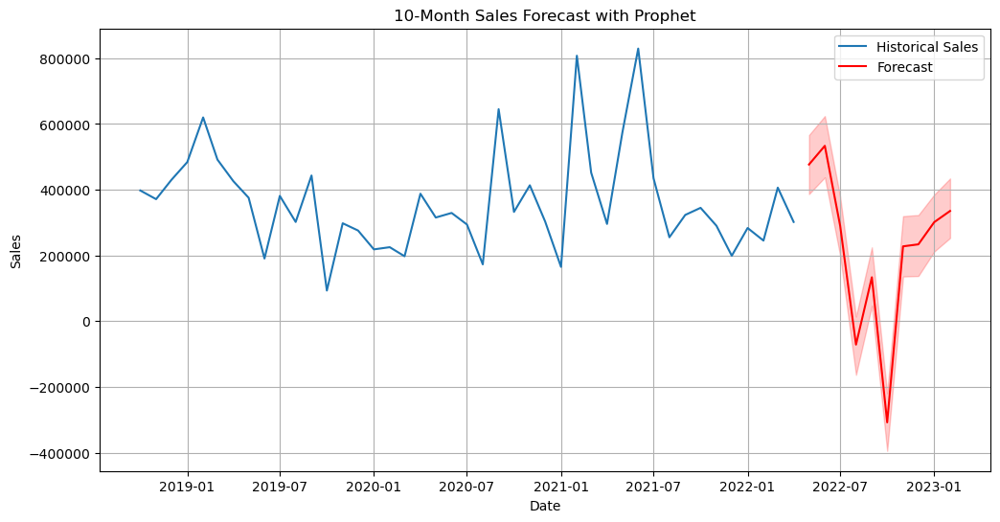

/var/folders/z6/_vn8cndd4x5dmx2cpjfdkjdr0000gn/T/ipykernel_48953/846941252.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_set_4["Sales_EUR"] = results["yhat"]


,Mapped_GCK,Sales_EUR
Month Year,,
2022-05-01,#4,476702.815914
2022-06-01,#4,533637.364762
2022-07-01,#4,290365.137898
2022-08-01,#4,-71170.675053
2022-09-01,#4,133676.175270
2022-10-01,#4,-307680.092317
2022-11-01,#4,227791.778732
2022-12-01,#4,233912.364305
2023-01-01,#4,301404.338366


In [42]:
best_model, best_params, best_rmse, best_model_name = select_best_model(
    prophet_best_model_4, prophet_best_params_4, prophet_best_rmse_4, "Prophet",
    xgboost_best_model_4, xgboost_best_params_4, xgboost_best_rmse_4, "XGBoost"
    , sarima_best_model_4, sarima_best_params_4, sarima_best_rmse_4, "SARIMA"
)
print(f"Best Model: {best_model_name}")
print("Best Parameters:", best_params)
print("Best RMSE:", best_rmse)

if best_model_name == "XGBoost":
    results = xgboost_forecast(
        sales_agg4,
        df_market_4,
        period=10,
        params =best_params,
    )
elif best_model_name == "SARIMA":
    results = sarima_forecast(
        sales_agg4,
        period=10,
        params =best_params,
    )
else:
    results = prophet_forecast(
        sales_agg4,
        df_market_4,
        period=10,
        param =best_params,
    )
results.set_index('ds',inplace = True)
test_set_4.set_index('Month Year', inplace = True)
test_set_4["Sales_EUR"] = results["yhat"]
test_set_4

# Product 5

In [43]:
# selecte only the features that are selected in the feature selection step
test_set_5 = test_set[test_set['Mapped_GCK'] == '#5']
df_market_5 = df_market[selected_features_5]
df_market_5.head()

,MAB_ELE_SHP250_lag_1,PRO28392_org_lag_3,MAB_ELE_SHP392,MAB_ELE_PRO826_lag_5,PRO271000_org_lag_5,PRO27392_org,PRI27840_org
date,,,,,,,
2004-02-01,NaN,NaN,110.495272,NaN,NaN,106.161262,78.969864
2004-03-01,83.458866,NaN,144.686166,NaN,NaN,140.288741,79.673569
2004-04-01,106.168192,NaN,102.655769,NaN,NaN,106.271197,80.337639
2004-05-01,92.007646,110.890034,100.305285,NaN,NaN,101.608710,80.798828
2004-06-01,85.696486,141.176853,119.616380,NaN,NaN,116.655248,80.913490


## Xgboost

In [44]:
X_train, X_val, y_train, y_val = train_val_split(sales_agg5, df_market_5, train_size = 0.8)

X_val.info() 

xgboost_best_model_5, xgboost_best_params_5, xgboost_best_rmse_5 = model_evaluation_XGboost(X_train,
                                                                                             y_train, 
                                                                                             X_val, y_val, 
                                                                                             xgboost_param_grid)

print("Best Params:", xgboost_best_params_5)
print("Validation RMSE:", xgboost_best_rmse_5)

<class 'pandas.core.frame.DataFrame'>
Index: 9 entries, 2021-08-01 to 2022-04-01
Data columns (total 7 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   MAB_ELE_SHP250_lag_1  9 non-null      float64
 1   PRO28392_org_lag_3    9 non-null      float64
 2   MAB_ELE_SHP392        9 non-null      float64
 3   MAB_ELE_PRO826_lag_5  9 non-null      float64
 4   PRO271000_org_lag_5   9 non-null      float64
 5   PRO27392_org          9 non-null      float64
 6   PRI27840_org          9 non-null      float64
dtypes: float64(7)
memory usage: 576.0+ bytes
Params: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.01, 'subsample': 0.5, 'colsample_bytree': 0.5, 'gamma': 0, 'reg_alpha': 0, 'reg_lambda': 0} => RMSE: 4136164.9505, Relative RMSE: 0.3582
Params: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.01, 'subsample': 0.5, 'colsample_bytree': 0.5, 'gamma': 0, 'reg_alpha': 0, 'reg_lambda': 0.1} => RMSE: 4143830.8322, 

## Prophet

In [45]:
prophet_best_model_5, prophet_best_params_5, prophet_best_rmse_5 = model_evaluation_prophet(X_train,
                                                                                             y_train, 
                                                                                             X_val, 
                                                                                             y_val, 
                                                                                             prophet_param_grid)

print("Best Params:", prophet_best_params_5)

print("Validation RMSE:", prophet_best_rmse_5)

01:02:22 - cmdstanpy - INFO - Chain [1] start processing
01:02:22 - cmdstanpy - INFO - Chain [1] done processing
01:02:22 - cmdstanpy - INFO - Chain [1] start processing
01:02:22 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 4209233.8790, Relative RMSE: 0.3645


01:02:22 - cmdstanpy - INFO - Chain [1] start processing
01:02:22 - cmdstanpy - INFO - Chain [1] done processing
01:02:22 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 4209239.6131, Relative RMSE: 0.3645
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 4210755.6624, Relative RMSE: 0.3647


01:02:23 - cmdstanpy - INFO - Chain [1] done processing
01:02:23 - cmdstanpy - INFO - Chain [1] start processing
01:02:23 - cmdstanpy - INFO - Chain [1] done processing
01:02:23 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 4212562.1931, Relative RMSE: 0.3648
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 4212530.6295, Relative RMSE: 0.3648


01:02:23 - cmdstanpy - INFO - Chain [1] done processing
01:02:23 - cmdstanpy - INFO - Chain [1] start processing
01:02:23 - cmdstanpy - INFO - Chain [1] done processing
01:02:23 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 4212534.8449, Relative RMSE: 0.3648
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 4210646.5911, Relative RMSE: 0.3647


01:02:23 - cmdstanpy - INFO - Chain [1] done processing
01:02:23 - cmdstanpy - INFO - Chain [1] start processing
01:02:23 - cmdstanpy - INFO - Chain [1] done processing
01:02:23 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 4210877.9639, Relative RMSE: 0.3647
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 4210964.1005, Relative RMSE: 0.3647


01:02:24 - cmdstanpy - INFO - Chain [1] done processing
01:02:24 - cmdstanpy - INFO - Chain [1] start processing
01:02:24 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 4565519.9505, Relative RMSE: 0.3954
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 4547765.1920, Relative RMSE: 0.3939


01:02:24 - cmdstanpy - INFO - Chain [1] start processing
01:02:24 - cmdstanpy - INFO - Chain [1] done processing
01:02:24 - cmdstanpy - INFO - Chain [1] start processing
01:02:24 - cmdstanpy - INFO - Chain [1] done processing
01:02:24 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 4568195.8265, Relative RMSE: 0.3956
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 4803550.3321, Relative RMSE: 0.4160


01:02:24 - cmdstanpy - INFO - Chain [1] done processing
01:02:24 - cmdstanpy - INFO - Chain [1] start processing
01:02:24 - cmdstanpy - INFO - Chain [1] done processing
01:02:24 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 4800986.6163, Relative RMSE: 0.4158
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 4817768.7744, Relative RMSE: 0.4172


01:02:25 - cmdstanpy - INFO - Chain [1] done processing
01:02:25 - cmdstanpy - INFO - Chain [1] start processing
01:02:25 - cmdstanpy - INFO - Chain [1] done processing
01:02:25 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 4982128.4867, Relative RMSE: 0.4315
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 4982117.5548, Relative RMSE: 0.4315


01:02:25 - cmdstanpy - INFO - Chain [1] done processing
01:02:25 - cmdstanpy - INFO - Chain [1] start processing
01:02:25 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 4982355.3699, Relative RMSE: 0.4315


01:02:25 - cmdstanpy - INFO - Chain [1] start processing
01:02:25 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 4983480.5166, Relative RMSE: 0.4316
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 4983638.3328, Relative RMSE: 0.4316


01:02:25 - cmdstanpy - INFO - Chain [1] start processing
01:02:25 - cmdstanpy - INFO - Chain [1] done processing
01:02:25 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 4982416.4920, Relative RMSE: 0.4315


01:02:26 - cmdstanpy - INFO - Chain [1] done processing
01:02:26 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 5595887.1279, Relative RMSE: 0.4846


01:02:26 - cmdstanpy - INFO - Chain [1] done processing
01:02:26 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 5598336.5267, Relative RMSE: 0.4848


01:02:26 - cmdstanpy - INFO - Chain [1] done processing
01:02:26 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 5598186.9003, Relative RMSE: 0.4848


01:02:28 - cmdstanpy - INFO - Chain [1] done processing
01:02:28 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 27502491.6453, Relative RMSE: 2.3819


01:02:29 - cmdstanpy - INFO - Chain [1] done processing
01:02:29 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 26199154.5228, Relative RMSE: 2.2690


01:02:30 - cmdstanpy - INFO - Chain [1] done processing
01:02:30 - cmdstanpy - INFO - Chain [1] start processing
01:02:30 - cmdstanpy - INFO - Chain [1] done processing
01:02:30 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 26098538.4423, Relative RMSE: 2.2603
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 31063910.7621, Relative RMSE: 2.6903


01:02:30 - cmdstanpy - INFO - Chain [1] done processing
01:02:30 - cmdstanpy - INFO - Chain [1] start processing
01:02:30 - cmdstanpy - INFO - Chain [1] done processing
01:02:30 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 31062293.7397, Relative RMSE: 2.6902
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 31062966.0300, Relative RMSE: 2.6902


01:02:31 - cmdstanpy - INFO - Chain [1] done processing
01:02:31 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 32243244.3887, Relative RMSE: 2.7924


01:02:31 - cmdstanpy - INFO - Chain [1] done processing
01:02:31 - cmdstanpy - INFO - Chain [1] start processing
01:02:31 - cmdstanpy - INFO - Chain [1] done processing
01:02:31 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 32305565.2628, Relative RMSE: 2.7978
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 32212933.4020, Relative RMSE: 2.7898


01:02:31 - cmdstanpy - INFO - Chain [1] done processing
01:02:31 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 32775159.0302, Relative RMSE: 2.8385


01:02:32 - cmdstanpy - INFO - Chain [1] done processing
01:02:32 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 32790571.9847, Relative RMSE: 2.8398


01:02:32 - cmdstanpy - INFO - Chain [1] done processing
01:02:32 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 33204949.9337, Relative RMSE: 2.8757


01:02:32 - cmdstanpy - INFO - Chain [1] done processing
01:02:32 - cmdstanpy - INFO - Chain [1] start processing
01:02:32 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 43643523.0088, Relative RMSE: 3.7798


01:02:32 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 44062870.7610, Relative RMSE: 3.8161


01:02:33 - cmdstanpy - INFO - Chain [1] done processing
01:02:33 - cmdstanpy - INFO - Chain [1] start processing
01:02:33 - cmdstanpy - INFO - Chain [1] done processing
01:02:33 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 44340631.9560, Relative RMSE: 3.8401
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 40418267.9390, Relative RMSE: 3.5004


01:02:33 - cmdstanpy - INFO - Chain [1] done processing
01:02:33 - cmdstanpy - INFO - Chain [1] start processing
01:02:33 - cmdstanpy - INFO - Chain [1] done processing
01:02:33 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 40440165.5403, Relative RMSE: 3.5023
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 40438649.7646, Relative RMSE: 3.5022


01:02:33 - cmdstanpy - INFO - Chain [1] done processing
01:02:33 - cmdstanpy - INFO - Chain [1] start processing
01:02:34 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 39625136.2968, Relative RMSE: 3.4317


01:02:34 - cmdstanpy - INFO - Chain [1] start processing
01:02:34 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 39640281.9306, Relative RMSE: 3.4331


01:02:34 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 39413046.0311, Relative RMSE: 3.4134


01:02:34 - cmdstanpy - INFO - Chain [1] done processing
01:02:34 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 38736236.7178, Relative RMSE: 3.3548


01:02:35 - cmdstanpy - INFO - Chain [1] done processing
01:02:35 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 38697979.7790, Relative RMSE: 3.3514


01:02:35 - cmdstanpy - INFO - Chain [1] done processing
01:02:35 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 39198613.7156, Relative RMSE: 3.3948


01:02:35 - cmdstanpy - INFO - Chain [1] done processing
01:02:35 - cmdstanpy - INFO - Chain [1] start processing
01:02:35 - cmdstanpy - INFO - Chain [1] done processing
01:02:35 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 4164812.8430, Relative RMSE: 0.3607
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 4164944.0298, Relative RMSE: 0.3607


01:02:36 - cmdstanpy - INFO - Chain [1] done processing
01:02:36 - cmdstanpy - INFO - Chain [1] start processing
01:02:36 - cmdstanpy - INFO - Chain [1] done processing
01:02:36 - cmdstanpy - INFO - Chain [1] start processing
01:02:36 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 4162759.1036, Relative RMSE: 0.3605
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 4159482.6944, Relative RMSE: 0.3602
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 4159497.2354, Relative RMSE: 0.3602


01:02:36 - cmdstanpy - INFO - Chain [1] start processing
01:02:36 - cmdstanpy - INFO - Chain [1] done processing
01:02:36 - cmdstanpy - INFO - Chain [1] start processing
01:02:36 - cmdstanpy - INFO - Chain [1] done processing
01:02:36 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 4159495.6176, Relative RMSE: 0.3602
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 4161589.6047, Relative RMSE: 0.3604


01:02:36 - cmdstanpy - INFO - Chain [1] done processing
01:02:36 - cmdstanpy - INFO - Chain [1] start processing
01:02:36 - cmdstanpy - INFO - Chain [1] done processing
01:02:36 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 4161779.4323, Relative RMSE: 0.3604
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 4156340.5449, Relative RMSE: 0.3600


01:02:36 - cmdstanpy - INFO - Chain [1] done processing
01:02:36 - cmdstanpy - INFO - Chain [1] start processing
01:02:36 - cmdstanpy - INFO - Chain [1] done processing
01:02:37 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 4468719.3129, Relative RMSE: 0.3870
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 4465707.0376, Relative RMSE: 0.3868


01:02:37 - cmdstanpy - INFO - Chain [1] done processing
01:02:37 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 4464982.8834, Relative RMSE: 0.3867


01:02:37 - cmdstanpy - INFO - Chain [1] done processing
01:02:37 - cmdstanpy - INFO - Chain [1] start processing
01:02:37 - cmdstanpy - INFO - Chain [1] done processing
01:02:37 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 4164812.8430, Relative RMSE: 0.3607
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 4164944.0298, Relative RMSE: 0.3607


01:02:37 - cmdstanpy - INFO - Chain [1] done processing
01:02:37 - cmdstanpy - INFO - Chain [1] start processing
01:02:37 - cmdstanpy - INFO - Chain [1] done processing
01:02:37 - cmdstanpy - INFO - Chain [1] start processing
01:02:37 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 4162759.1036, Relative RMSE: 0.3605
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 4159482.6944, Relative RMSE: 0.3602


01:02:37 - cmdstanpy - INFO - Chain [1] start processing
01:02:37 - cmdstanpy - INFO - Chain [1] done processing
01:02:37 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 4159497.2354, Relative RMSE: 0.3602
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 4159495.6176, Relative RMSE: 0.3602


01:02:38 - cmdstanpy - INFO - Chain [1] done processing
01:02:38 - cmdstanpy - INFO - Chain [1] start processing
01:02:38 - cmdstanpy - INFO - Chain [1] done processing
01:02:38 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 4161589.6047, Relative RMSE: 0.3604
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 4161779.4323, Relative RMSE: 0.3604


01:02:38 - cmdstanpy - INFO - Chain [1] done processing
01:02:38 - cmdstanpy - INFO - Chain [1] start processing
01:02:38 - cmdstanpy - INFO - Chain [1] done processing
01:02:38 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 4156340.5449, Relative RMSE: 0.3600
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 4468719.3129, Relative RMSE: 0.3870


01:02:38 - cmdstanpy - INFO - Chain [1] done processing
01:02:38 - cmdstanpy - INFO - Chain [1] start processing
01:02:38 - cmdstanpy - INFO - Chain [1] done processing
01:02:38 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 4465707.0376, Relative RMSE: 0.3868
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 4464982.8834, Relative RMSE: 0.3867


01:02:38 - cmdstanpy - INFO - Chain [1] done processing
01:02:39 - cmdstanpy - INFO - Chain [1] start processing
01:02:39 - cmdstanpy - INFO - Chain [1] done processing
01:02:39 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 4164812.8430, Relative RMSE: 0.3607
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 4164944.0298, Relative RMSE: 0.3607


01:02:39 - cmdstanpy - INFO - Chain [1] done processing
01:02:39 - cmdstanpy - INFO - Chain [1] start processing
01:02:39 - cmdstanpy - INFO - Chain [1] done processing
01:02:39 - cmdstanpy - INFO - Chain [1] start processing
01:02:39 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 4162759.1036, Relative RMSE: 0.3605
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 4159482.6944, Relative RMSE: 0.3602
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 4159497.2354, Relative RMSE: 0.3602


01:02:39 - cmdstanpy - INFO - Chain [1] start processing
01:02:39 - cmdstanpy - INFO - Chain [1] done processing
01:02:39 - cmdstanpy - INFO - Chain [1] start processing
01:02:39 - cmdstanpy - INFO - Chain [1] done processing
01:02:39 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 4159495.6176, Relative RMSE: 0.3602
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 4161589.6047, Relative RMSE: 0.3604


01:02:39 - cmdstanpy - INFO - Chain [1] done processing
01:02:39 - cmdstanpy - INFO - Chain [1] start processing
01:02:39 - cmdstanpy - INFO - Chain [1] done processing
01:02:39 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 4161779.4323, Relative RMSE: 0.3604
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 4156340.5449, Relative RMSE: 0.3600


01:02:40 - cmdstanpy - INFO - Chain [1] done processing
01:02:40 - cmdstanpy - INFO - Chain [1] start processing
01:02:40 - cmdstanpy - INFO - Chain [1] done processing
01:02:40 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 4468719.3129, Relative RMSE: 0.3870
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 4465707.0376, Relative RMSE: 0.3868


01:02:40 - cmdstanpy - INFO - Chain [1] done processing
01:02:40 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 4464982.8834, Relative RMSE: 0.3867


01:02:40 - cmdstanpy - INFO - Chain [1] done processing
01:02:40 - cmdstanpy - INFO - Chain [1] start processing
01:02:40 - cmdstanpy - INFO - Chain [1] done processing
01:02:40 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 4164812.8430, Relative RMSE: 0.3607
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 4164944.0298, Relative RMSE: 0.3607


01:02:40 - cmdstanpy - INFO - Chain [1] done processing
01:02:40 - cmdstanpy - INFO - Chain [1] start processing
01:02:40 - cmdstanpy - INFO - Chain [1] done processing
01:02:40 - cmdstanpy - INFO - Chain [1] start processing
01:02:41 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 4162759.1036, Relative RMSE: 0.3605
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 4159482.6944, Relative RMSE: 0.3602


01:02:41 - cmdstanpy - INFO - Chain [1] start processing
01:02:41 - cmdstanpy - INFO - Chain [1] done processing
01:02:41 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 4159497.2354, Relative RMSE: 0.3602
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 4159495.6176, Relative RMSE: 0.3602


01:02:41 - cmdstanpy - INFO - Chain [1] done processing
01:02:41 - cmdstanpy - INFO - Chain [1] start processing
01:02:41 - cmdstanpy - INFO - Chain [1] done processing
01:02:41 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 4161589.6047, Relative RMSE: 0.3604
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 4161779.4323, Relative RMSE: 0.3604


01:02:41 - cmdstanpy - INFO - Chain [1] done processing
01:02:41 - cmdstanpy - INFO - Chain [1] start processing
01:02:41 - cmdstanpy - INFO - Chain [1] done processing
01:02:41 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 4156340.5449, Relative RMSE: 0.3600
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 4468719.3129, Relative RMSE: 0.3870


01:02:41 - cmdstanpy - INFO - Chain [1] done processing
01:02:41 - cmdstanpy - INFO - Chain [1] start processing
01:02:41 - cmdstanpy - INFO - Chain [1] done processing
01:02:42 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 4465707.0376, Relative RMSE: 0.3868
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 4464982.8834, Relative RMSE: 0.3867


01:02:42 - cmdstanpy - INFO - Chain [1] done processing
01:02:42 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 4174392.0066, Relative RMSE: 0.3615


01:02:42 - cmdstanpy - INFO - Chain [1] done processing
01:02:42 - cmdstanpy - INFO - Chain [1] start processing
01:02:42 - cmdstanpy - INFO - Chain [1] done processing
01:02:42 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 4174413.9368, Relative RMSE: 0.3615
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 4172919.9740, Relative RMSE: 0.3614


01:02:42 - cmdstanpy - INFO - Chain [1] done processing
01:02:42 - cmdstanpy - INFO - Chain [1] start processing
01:02:42 - cmdstanpy - INFO - Chain [1] done processing
01:02:42 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 4170615.2959, Relative RMSE: 0.3612
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 4170586.1442, Relative RMSE: 0.3612


01:02:43 - cmdstanpy - INFO - Chain [1] done processing
01:02:43 - cmdstanpy - INFO - Chain [1] start processing
01:02:43 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 4170589.4584, Relative RMSE: 0.3612


01:02:43 - cmdstanpy - INFO - Chain [1] start processing
01:02:43 - cmdstanpy - INFO - Chain [1] done processing
01:02:43 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 4169760.2958, Relative RMSE: 0.3611
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 4171247.6217, Relative RMSE: 0.3613


01:02:43 - cmdstanpy - INFO - Chain [1] done processing
01:02:43 - cmdstanpy - INFO - Chain [1] start processing
01:02:43 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 4173196.5747, Relative RMSE: 0.3614


01:02:43 - cmdstanpy - INFO - Chain [1] start processing
01:02:44 - cmdstanpy - INFO - Chain [1] done processing
01:02:44 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 4486980.4949, Relative RMSE: 0.3886
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 4485617.1342, Relative RMSE: 0.3885


01:02:44 - cmdstanpy - INFO - Chain [1] done processing
01:02:44 - cmdstanpy - INFO - Chain [1] start processing
01:02:44 - cmdstanpy - INFO - Chain [1] done processing
01:02:44 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 4493554.4009, Relative RMSE: 0.3892
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 4708568.8127, Relative RMSE: 0.4078


01:02:44 - cmdstanpy - INFO - Chain [1] done processing
01:02:44 - cmdstanpy - INFO - Chain [1] start processing
01:02:44 - cmdstanpy - INFO - Chain [1] done processing
01:02:44 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 4708603.1211, Relative RMSE: 0.4078
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 4708588.1144, Relative RMSE: 0.4078


01:02:44 - cmdstanpy - INFO - Chain [1] done processing
01:02:44 - cmdstanpy - INFO - Chain [1] start processing
01:02:44 - cmdstanpy - INFO - Chain [1] done processing
01:02:45 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 4733039.7117, Relative RMSE: 0.4099
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 4722701.4463, Relative RMSE: 0.4090


01:02:45 - cmdstanpy - INFO - Chain [1] done processing
01:02:45 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 4728339.5668, Relative RMSE: 0.4095


01:02:45 - cmdstanpy - INFO - Chain [1] done processing
01:02:45 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 4716873.9866, Relative RMSE: 0.4085


01:02:45 - cmdstanpy - INFO - Chain [1] done processing
01:02:45 - cmdstanpy - INFO - Chain [1] start processing
01:02:45 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 4717408.7433, Relative RMSE: 0.4086


01:02:45 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 4716872.0272, Relative RMSE: 0.4085


01:02:46 - cmdstanpy - INFO - Chain [1] done processing
01:02:46 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 5123243.9890, Relative RMSE: 0.4437


01:02:46 - cmdstanpy - INFO - Chain [1] done processing
01:02:46 - cmdstanpy - INFO - Chain [1] start processing
01:02:46 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 5148507.2464, Relative RMSE: 0.4459


01:02:46 - cmdstanpy - INFO - Chain [1] start processing
01:02:46 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 5144515.5603, Relative RMSE: 0.4455


01:02:46 - cmdstanpy - INFO - Chain [1] start processing
01:02:46 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 16900966.5638, Relative RMSE: 1.4637


01:02:46 - cmdstanpy - INFO - Chain [1] start processing
01:02:47 - cmdstanpy - INFO - Chain [1] done processing
01:02:47 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 17104420.4662, Relative RMSE: 1.4813
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 16770735.9621, Relative RMSE: 1.4524


01:02:47 - cmdstanpy - INFO - Chain [1] done processing
01:02:47 - cmdstanpy - INFO - Chain [1] start processing
01:02:47 - cmdstanpy - INFO - Chain [1] done processing
01:02:47 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 18972282.1576, Relative RMSE: 1.6431
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 18972413.3842, Relative RMSE: 1.6431


01:02:47 - cmdstanpy - INFO - Chain [1] done processing
01:02:47 - cmdstanpy - INFO - Chain [1] start processing
01:02:47 - cmdstanpy - INFO - Chain [1] done processing
01:02:47 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 18972755.7165, Relative RMSE: 1.6431
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 18986993.7572, Relative RMSE: 1.6444


01:02:47 - cmdstanpy - INFO - Chain [1] done processing
01:02:47 - cmdstanpy - INFO - Chain [1] start processing
01:02:47 - cmdstanpy - INFO - Chain [1] done processing
01:02:48 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 18990755.0646, Relative RMSE: 1.6447
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 18989024.7599, Relative RMSE: 1.6445


01:02:48 - cmdstanpy - INFO - Chain [1] done processing
01:02:48 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 20695384.4641, Relative RMSE: 1.7923


01:02:48 - cmdstanpy - INFO - Chain [1] done processing
01:02:48 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 20704180.8085, Relative RMSE: 1.7931


01:02:48 - cmdstanpy - INFO - Chain [1] done processing
01:02:48 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 21173821.7819, Relative RMSE: 1.8338


01:02:49 - cmdstanpy - INFO - Chain [1] done processing
01:02:49 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 41591751.6418, Relative RMSE: 3.6021


01:02:49 - cmdstanpy - INFO - Chain [1] done processing
01:02:49 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 39961151.1158, Relative RMSE: 3.4608


01:02:49 - cmdstanpy - INFO - Chain [1] done processing
01:02:49 - cmdstanpy - INFO - Chain [1] start processing
01:02:50 - cmdstanpy - INFO - Chain [1] done processing
01:02:50 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 39552924.9241, Relative RMSE: 3.4255
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 40775458.4366, Relative RMSE: 3.5314


01:02:50 - cmdstanpy - INFO - Chain [1] done processing
01:02:50 - cmdstanpy - INFO - Chain [1] start processing
01:02:50 - cmdstanpy - INFO - Chain [1] done processing
01:02:50 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 40767339.3239, Relative RMSE: 3.5307
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 40810876.1958, Relative RMSE: 3.5344


01:02:50 - cmdstanpy - INFO - Chain [1] done processing
01:02:50 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 35802654.5901, Relative RMSE: 3.1007


01:02:50 - cmdstanpy - INFO - Chain [1] done processing
01:02:50 - cmdstanpy - INFO - Chain [1] start processing
01:02:51 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 35808273.2516, Relative RMSE: 3.1012


01:02:51 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 35795474.7052, Relative RMSE: 3.1001


01:02:51 - cmdstanpy - INFO - Chain [1] done processing
01:02:51 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 33305602.5906, Relative RMSE: 2.8844


01:02:51 - cmdstanpy - INFO - Chain [1] done processing
01:02:51 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 33273565.9133, Relative RMSE: 2.8817


01:02:52 - cmdstanpy - INFO - Chain [1] done processing
01:02:52 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 33494158.5294, Relative RMSE: 2.9008


01:02:52 - cmdstanpy - INFO - Chain [1] done processing
01:02:52 - cmdstanpy - INFO - Chain [1] start processing
01:02:52 - cmdstanpy - INFO - Chain [1] done processing
01:02:52 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 4164812.8430, Relative RMSE: 0.3607
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 4164944.0298, Relative RMSE: 0.3607


01:02:52 - cmdstanpy - INFO - Chain [1] done processing
01:02:52 - cmdstanpy - INFO - Chain [1] start processing
01:02:52 - cmdstanpy - INFO - Chain [1] done processing
01:02:52 - cmdstanpy - INFO - Chain [1] start processing
01:02:52 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 4162759.1036, Relative RMSE: 0.3605
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 4159482.6944, Relative RMSE: 0.3602
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 4159497.2354, Relative RMSE: 0.3602


01:02:52 - cmdstanpy - INFO - Chain [1] start processing
01:02:53 - cmdstanpy - INFO - Chain [1] done processing
01:02:53 - cmdstanpy - INFO - Chain [1] start processing
01:02:53 - cmdstanpy - INFO - Chain [1] done processing
01:02:53 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 4159495.6176, Relative RMSE: 0.3602
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 4161589.6047, Relative RMSE: 0.3604


01:02:53 - cmdstanpy - INFO - Chain [1] done processing
01:02:53 - cmdstanpy - INFO - Chain [1] start processing
01:02:53 - cmdstanpy - INFO - Chain [1] done processing
01:02:53 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 4161779.4323, Relative RMSE: 0.3604
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 4156340.5449, Relative RMSE: 0.3600


01:02:53 - cmdstanpy - INFO - Chain [1] done processing
01:02:53 - cmdstanpy - INFO - Chain [1] start processing
01:02:53 - cmdstanpy - INFO - Chain [1] done processing
01:02:53 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 4468719.3129, Relative RMSE: 0.3870
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 4465707.0376, Relative RMSE: 0.3868


01:02:53 - cmdstanpy - INFO - Chain [1] done processing
01:02:53 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 4464982.8834, Relative RMSE: 0.3867


01:02:54 - cmdstanpy - INFO - Chain [1] done processing
01:02:54 - cmdstanpy - INFO - Chain [1] start processing
01:02:54 - cmdstanpy - INFO - Chain [1] done processing
01:02:54 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 4164812.8430, Relative RMSE: 0.3607
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 4164944.0298, Relative RMSE: 0.3607


01:02:54 - cmdstanpy - INFO - Chain [1] done processing
01:02:54 - cmdstanpy - INFO - Chain [1] start processing
01:02:54 - cmdstanpy - INFO - Chain [1] done processing
01:02:54 - cmdstanpy - INFO - Chain [1] start processing
01:02:54 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 4162759.1036, Relative RMSE: 0.3605
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 4159482.6944, Relative RMSE: 0.3602
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 4159497.2354, Relative RMSE: 0.3602


01:02:54 - cmdstanpy - INFO - Chain [1] start processing
01:02:54 - cmdstanpy - INFO - Chain [1] done processing
01:02:54 - cmdstanpy - INFO - Chain [1] start processing
01:02:54 - cmdstanpy - INFO - Chain [1] done processing
01:02:54 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 4159495.6176, Relative RMSE: 0.3602
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 4161589.6047, Relative RMSE: 0.3604


01:02:54 - cmdstanpy - INFO - Chain [1] done processing
01:02:54 - cmdstanpy - INFO - Chain [1] start processing
01:02:54 - cmdstanpy - INFO - Chain [1] done processing
01:02:55 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 4161779.4323, Relative RMSE: 0.3604
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 4156340.5449, Relative RMSE: 0.3600


01:02:55 - cmdstanpy - INFO - Chain [1] done processing
01:02:55 - cmdstanpy - INFO - Chain [1] start processing
01:02:55 - cmdstanpy - INFO - Chain [1] done processing
01:02:55 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 4468719.3129, Relative RMSE: 0.3870
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 4465707.0376, Relative RMSE: 0.3868


01:02:55 - cmdstanpy - INFO - Chain [1] done processing
01:02:55 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 4464982.8834, Relative RMSE: 0.3867


01:02:55 - cmdstanpy - INFO - Chain [1] done processing
01:02:55 - cmdstanpy - INFO - Chain [1] start processing
01:02:55 - cmdstanpy - INFO - Chain [1] done processing
01:02:55 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 4164812.8430, Relative RMSE: 0.3607
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 4164944.0298, Relative RMSE: 0.3607


01:02:55 - cmdstanpy - INFO - Chain [1] done processing
01:02:55 - cmdstanpy - INFO - Chain [1] start processing
01:02:56 - cmdstanpy - INFO - Chain [1] done processing
01:02:56 - cmdstanpy - INFO - Chain [1] start processing
01:02:56 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 4162759.1036, Relative RMSE: 0.3605
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 4159482.6944, Relative RMSE: 0.3602
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 4159497.2354, Relative RMSE: 0.3602


01:02:56 - cmdstanpy - INFO - Chain [1] start processing
01:02:56 - cmdstanpy - INFO - Chain [1] done processing
01:02:56 - cmdstanpy - INFO - Chain [1] start processing
01:02:56 - cmdstanpy - INFO - Chain [1] done processing
01:02:56 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 4159495.6176, Relative RMSE: 0.3602
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 4161589.6047, Relative RMSE: 0.3604


01:02:56 - cmdstanpy - INFO - Chain [1] done processing
01:02:56 - cmdstanpy - INFO - Chain [1] start processing
01:02:56 - cmdstanpy - INFO - Chain [1] done processing
01:02:56 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 4161779.4323, Relative RMSE: 0.3604
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 4156340.5449, Relative RMSE: 0.3600


01:02:56 - cmdstanpy - INFO - Chain [1] done processing
01:02:56 - cmdstanpy - INFO - Chain [1] start processing
01:02:56 - cmdstanpy - INFO - Chain [1] done processing
01:02:56 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 4468719.3129, Relative RMSE: 0.3870
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 4465707.0376, Relative RMSE: 0.3868


01:02:57 - cmdstanpy - INFO - Chain [1] done processing
01:02:57 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 4464982.8834, Relative RMSE: 0.3867


01:02:57 - cmdstanpy - INFO - Chain [1] done processing
01:02:57 - cmdstanpy - INFO - Chain [1] start processing
01:02:57 - cmdstanpy - INFO - Chain [1] done processing
01:02:57 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 4164812.8430, Relative RMSE: 0.3607
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 4164944.0298, Relative RMSE: 0.3607


01:02:57 - cmdstanpy - INFO - Chain [1] done processing
01:02:57 - cmdstanpy - INFO - Chain [1] start processing
01:02:57 - cmdstanpy - INFO - Chain [1] done processing
01:02:57 - cmdstanpy - INFO - Chain [1] start processing
01:02:57 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 4162759.1036, Relative RMSE: 0.3605
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 4159482.6944, Relative RMSE: 0.3602


01:02:57 - cmdstanpy - INFO - Chain [1] start processing
01:02:57 - cmdstanpy - INFO - Chain [1] done processing
01:02:57 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 4159497.2354, Relative RMSE: 0.3602
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 4159495.6176, Relative RMSE: 0.3602


01:02:57 - cmdstanpy - INFO - Chain [1] done processing
01:02:58 - cmdstanpy - INFO - Chain [1] start processing
01:02:58 - cmdstanpy - INFO - Chain [1] done processing
01:02:58 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 4161589.6047, Relative RMSE: 0.3604
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 4161779.4323, Relative RMSE: 0.3604


01:02:58 - cmdstanpy - INFO - Chain [1] done processing
01:02:58 - cmdstanpy - INFO - Chain [1] start processing
01:02:58 - cmdstanpy - INFO - Chain [1] done processing
01:02:58 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 4156340.5449, Relative RMSE: 0.3600
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 4468719.3129, Relative RMSE: 0.3870


01:02:58 - cmdstanpy - INFO - Chain [1] done processing
01:02:58 - cmdstanpy - INFO - Chain [1] start processing
01:02:58 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 4465707.0376, Relative RMSE: 0.3868
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 4464982.8834, Relative RMSE: 0.3867
Best Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0}
Validation RMSE: 4156340.544870107


## Sarima

In [46]:
sarima_best_model_5, sarima_best_params_5, sarima_best_rmse_5 = model_evaluation_SARIMA(y_train, 
                                                             y_val, 
                                                             sarima_param_grid)

print("Best Params:", sarima_best_params_5)
print("Validation RMSE:", sarima_best_rmse_5)

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,0) x (0,0,0,6) => RMSE: 12198287.4009, Relative RMSE: 1.0564
SARIMA(0,0,0) x (0,0,0,12) => RMSE: 12198287.4009, Relative RMSE: 1.0564


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,0,0) x (0,0,1,6) => RMSE: 8375375.2369, Relative RMSE: 0.7254
SARIMA(0,0,0) x (0,0,1,12) => RMSE: 9424946.6383, Relative RMSE: 0.8163
SARIMA(0,0,0) x (0,1,0,6) => RMSE: 4153427.6615, Relative RMSE: 0.3597
SARIMA(0,0,0) x (0,1,0,12) => RMSE: 5282172.0046, Relative RMSE: 0.4575
SARIMA(0,0,0) x (0,1,1,6) => RMSE: 3852471.2220, Relative RMSE: 0.3336
SARIMA(0,0,0) x (0,1,1,12) => RMSE: 5035412.4565, Relative RMSE: 0.4361
SARIMA(0,0,0) x (1,0,0,6) => RMSE: 4122954.4511, Relative RMSE: 0.3571
SARIMA(0,0,0) x (1,0,0,12) => RMSE: 5374962.8038, Relative RMSE: 0.4655
SARIMA(0,0,0) x (1,0,1,6) => RMSE: 4119721.5010, Relative RMSE: 0.3568
SARIMA(0,0,0) x (1,0,1,12) => RMSE: 5469793.9019, Relative RMSE: 0.4737
SARIMA(0,0,0) x (1,1,0,6) => RMSE: 4077747.5271, Relative RMSE: 0.3532
SARIMA(0,0,0) x (1,1,0,12) => RMSE: 4732896.1089, Relative RMSE: 0.4099
SARIMA(0,0,0) x (1,1,1,6) => RMSE: 4082069.4690, Relative RMSE: 0.3535


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,0) x (1,1,1,12) => RMSE: 5027338.9822, Relative RMSE: 0.4354
SARIMA(0,0,1) x (0,0,0,6) => RMSE: 11906775.2530, Relative RMSE: 1.0312
SARIMA(0,0,1) x (0,0,0,12) => RMSE: 11906775.2530, Relative RMSE: 1.0312
SARIMA(0,0,1) x (0,0,1,6) => RMSE: 8427725.7051, Relative RMSE: 0.7299
SARIMA(0,0,1) x (0,0,1,12) => RMSE: 8995650.3234, Relative RMSE: 0.7791
SARIMA(0,0,1) x (0,1,0,6) => RMSE: 4111786.4311, Relative RMSE: 0.3561
SARIMA(0,0,1) x (0,1,0,12) => RMSE: 5341918.6498, Relative RMSE: 0.4626
SARIMA(0,0,1) x (0,1,1,6) => RMSE: 3915199.9050, Relative RMSE: 0.3391


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,0,1) x (0,1,1,12) => RMSE: 5908311.4322, Relative RMSE: 0.5117
SARIMA(0,0,1) x (1,0,0,6) => RMSE: 4164152.7879, Relative RMSE: 0.3606
SARIMA(0,0,1) x (1,0,0,12) => RMSE: 5360896.6034, Relative RMSE: 0.4643
SARIMA(0,0,1) x (1,0,1,6) => RMSE: 4068209.9137, Relative RMSE: 0.3523
SARIMA(0,0,1) x (1,0,1,12) => RMSE: 5692278.5325, Relative RMSE: 0.4930
SARIMA(0,0,1) x (1,1,0,6) => RMSE: 4061963.2256, Relative RMSE: 0.3518
SARIMA(0,0,1) x (1,1,0,12) => RMSE: 4706827.4148, Relative RMSE: 0.4076
SARIMA(0,0,1) x (1,1,1,6) => RMSE: 4318267.7230, Relative RMSE: 0.3740
SARIMA(0,0,1) x (1,1,1,12) => RMSE: 6075506.8090, Relative RMSE: 0.5262
SARIMA(0,0,2) x (0,0,0,6) => RMSE: 10589841.8008, Relative RMSE: 0.9171
SARIMA(0,0,2) x (0,0,0,12) => RMSE: 10589841.8008, Relative RMSE: 0.9171
SARIMA(0,0,2) x (0,0,1,6) => RMSE: 7879866.5579, Relative RMSE: 0.6824
SARIMA(0,0,2) x (0,0,1,12) => RMSE: 8555224.7478, Relative RMSE: 0.7409
SARIMA(0,0,2) x (0,1,0,6) => RMSE: 3987054.6325, Relative RMSE: 0.34

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,2) x (1,0,0,12) => RMSE: 5638249.6250, Relative RMSE: 0.4883
SARIMA(0,0,2) x (1,0,1,6) => RMSE: 3804178.2005, Relative RMSE: 0.3295
SARIMA(0,0,2) x (1,0,1,12) => RMSE: 5989326.8518, Relative RMSE: 0.5187
SARIMA(0,0,2) x (1,1,0,6) => RMSE: 4083161.1623, Relative RMSE: 0.3536
SARIMA(0,0,2) x (1,1,0,12) => RMSE: 4823658.9352, Relative RMSE: 0.4178
SARIMA(0,0,2) x (1,1,1,6) => RMSE: 4457600.8584, Relative RMSE: 0.3861


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(0,0,2) x (1,1,1,12) => RMSE: 5116134.8847, Relative RMSE: 0.4431
SARIMA(0,1,0) x (0,0,0,6) => RMSE: 5086486.3851, Relative RMSE: 0.4405
SARIMA(0,1,0) x (0,0,0,12) => RMSE: 5086486.3851, Relative RMSE: 0.4405
SARIMA(0,1,0) x (0,0,1,6) => RMSE: 3731733.2199, Relative RMSE: 0.3232
SARIMA(0,1,0) x (0,0,1,12) => RMSE: 3990301.7208, Relative RMSE: 0.3456
SARIMA(0,1,0) x (0,1,0,6) => RMSE: 10486588.0636, Relative RMSE: 0.9082
SARIMA(0,1,0) x (0,1,0,12) => RMSE: 4919014.1738, Relative RMSE: 0.4260
SARIMA(0,1,0) x (0,1,1,6) => RMSE: 5607952.7963, Relative RMSE: 0.4857
SARIMA(0,1,0) x (0,1,1,12) => RMSE: 4673676.4876, Relative RMSE: 0.4048
SARIMA(0,1,0) x (1,0,0,6) => RMSE: 4562572.3968, Relative RMSE: 0.3951
SARIMA(0,1,0) x (1,0,0,12) => RMSE: 4097796.9483, Relative RMSE: 0.3549
SARIMA(0,1,0) x (1,0,1,6) => RMSE: 4457776.3740, Relative RMSE: 0.3861
SARIMA(0,1,0) x (1,0,1,12) => RMSE: 4145525.3803, Relative RMSE: 0.3590
SARIMA(0,1,0) x (1,1,0,6) => RMSE: 6827508.1929, Relative RMSE: 0.591

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,0) x (1,1,1,12) => RMSE: 5561966.4450, Relative RMSE: 0.4817
SARIMA(0,1,1) x (0,0,0,6) => RMSE: 4457357.3675, Relative RMSE: 0.3860
SARIMA(0,1,1) x (0,0,0,12) => RMSE: 4457357.3675, Relative RMSE: 0.3860
SARIMA(0,1,1) x (0,0,1,6) => RMSE: 3795566.0419, Relative RMSE: 0.3287
SARIMA(0,1,1) x (0,0,1,12) => RMSE: 4637477.3602, Relative RMSE: 0.4016
SARIMA(0,1,1) x (0,1,0,6) => RMSE: 4150817.8886, Relative RMSE: 0.3595
SARIMA(0,1,1) x (0,1,0,12) => RMSE: 5379568.6663, Relative RMSE: 0.4659
SARIMA(0,1,1) x (0,1,1,6) => RMSE: 3662709.0446, Relative RMSE: 0.3172
SARIMA(0,1,1) x (0,1,1,12) => RMSE: 5613041.0347, Relative RMSE: 0.4861
SARIMA(0,1,1) x (1,0,0,6) => RMSE: 3515483.0753, Relative RMSE: 0.3045


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,1) x (1,0,0,12) => RMSE: 4424107.6098, Relative RMSE: 0.3832
SARIMA(0,1,1) x (1,0,1,6) => RMSE: 3560029.8113, Relative RMSE: 0.3083
SARIMA(0,1,1) x (1,0,1,12) => RMSE: 4654364.4263, Relative RMSE: 0.4031
SARIMA(0,1,1) x (1,1,0,6) => RMSE: 3990365.3007, Relative RMSE: 0.3456
SARIMA(0,1,1) x (1,1,0,12) => RMSE: 5292242.7498, Relative RMSE: 0.4583
SARIMA(0,1,1) x (1,1,1,6) => RMSE: 3650373.1107, Relative RMSE: 0.3161


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(0,1,1) x (1,1,1,12) => RMSE: 5524597.8620, Relative RMSE: 0.4785
SARIMA(0,1,2) x (0,0,0,6) => RMSE: 4103872.9479, Relative RMSE: 0.3554
SARIMA(0,1,2) x (0,0,0,12) => RMSE: 4103872.9479, Relative RMSE: 0.3554
SARIMA(0,1,2) x (0,0,1,6) => RMSE: 4109980.8169, Relative RMSE: 0.3559
SARIMA(0,1,2) x (0,0,1,12) => RMSE: 4593431.7293, Relative RMSE: 0.3978
SARIMA(0,1,2) x (0,1,0,6) => RMSE: 6106080.8918, Relative RMSE: 0.5288
SARIMA(0,1,2) x (0,1,0,12) => RMSE: 5711092.4744, Relative RMSE: 0.4946
SARIMA(0,1,2) x (0,1,1,6) => RMSE: 3769660.0798, Relative RMSE: 0.3265
SARIMA(0,1,2) x (0,1,1,12) => RMSE: 4478207.5724, Relative RMSE: 0.3878


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,2) x (1,0,0,6) => RMSE: 3799508.1009, Relative RMSE: 0.3291
SARIMA(0,1,2) x (1,0,0,12) => RMSE: 4232049.8700, Relative RMSE: 0.3665
SARIMA(0,1,2) x (1,0,1,6) => RMSE: 3994771.1383, Relative RMSE: 0.3460
SARIMA(0,1,2) x (1,0,1,12) => RMSE: 4617174.6976, Relative RMSE: 0.3999
SARIMA(0,1,2) x (1,1,0,6) => RMSE: 4098946.7893, Relative RMSE: 0.3550
SARIMA(0,1,2) x (1,1,0,12) => RMSE: 5670984.8698, Relative RMSE: 0.4911
SARIMA(0,1,2) x (1,1,1,6) => RMSE: 4268817.0584, Relative RMSE: 0.3697


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,2) x (1,1,1,12) => RMSE: 4492112.6157, Relative RMSE: 0.3890
SARIMA(1,0,0) x (0,0,0,6) => RMSE: 7905855.3362, Relative RMSE: 0.6847
SARIMA(1,0,0) x (0,0,0,12) => RMSE: 7905855.3362, Relative RMSE: 0.6847
SARIMA(1,0,0) x (0,0,1,6) => RMSE: 5874279.2991, Relative RMSE: 0.5087
SARIMA(1,0,0) x (0,0,1,12) => RMSE: 7861574.8635, Relative RMSE: 0.6809
SARIMA(1,0,0) x (0,1,0,6) => RMSE: 4124460.2902, Relative RMSE: 0.3572
SARIMA(1,0,0) x (0,1,0,12) => RMSE: 5421913.0731, Relative RMSE: 0.4696
SARIMA(1,0,0) x (0,1,1,6) => RMSE: 3868339.2537, Relative RMSE: 0.3350
SARIMA(1,0,0) x (0,1,1,12) => RMSE: 5152016.7083, Relative RMSE: 0.4462
SARIMA(1,0,0) x (1,0,0,6) => RMSE: 4106591.0889, Relative RMSE: 0.3557
SARIMA(1,0,0) x (1,0,0,12) => RMSE: 5506052.5729, Relative RMSE: 0.4769
SARIMA(1,0,0) x (1,0,1,6) => RMSE: 4111215.9567, Relative RMSE: 0.3561
SARIMA(1,0,0) x (1,0,1,12) => RMSE: 5868152.9005, Relative RMSE: 0.5082
SARIMA(1,0,0) x (1,1,0,6) => RMSE: 4306551.5052, Relative RMSE: 0.3730

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,0) x (1,1,0,12) => RMSE: 4874546.6517, Relative RMSE: 0.4222
SARIMA(1,0,0) x (1,1,1,6) => RMSE: 4456594.8689, Relative RMSE: 0.3860
SARIMA(1,0,0) x (1,1,1,12) => RMSE: 5114853.0168, Relative RMSE: 0.4430
SARIMA(1,0,1) x (0,0,0,6) => RMSE: 4341107.0868, Relative RMSE: 0.3760
SARIMA(1,0,1) x (0,0,0,12) => RMSE: 4341107.0868, Relative RMSE: 0.3760
SARIMA(1,0,1) x (0,0,1,6) => RMSE: 3741967.1412, Relative RMSE: 0.3241
SARIMA(1,0,1) x (0,0,1,12) => RMSE: 4302543.7212, Relative RMSE: 0.3726
SARIMA(1,0,1) x (0,1,0,6) => RMSE: 4147169.0213, Relative RMSE: 0.3592


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,1) x (0,1,0,12) => RMSE: 5508881.4232, Relative RMSE: 0.4771
SARIMA(1,0,1) x (0,1,1,6) => RMSE: 3880941.4401, Relative RMSE: 0.3361
SARIMA(1,0,1) x (0,1,1,12) => RMSE: 5854313.6546, Relative RMSE: 0.5070
SARIMA(1,0,1) x (1,0,0,6) => RMSE: 3572407.4191, Relative RMSE: 0.3094


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,1) x (1,0,0,12) => RMSE: 4796555.2346, Relative RMSE: 0.4154
SARIMA(1,0,1) x (1,0,1,6) => RMSE: 3598922.5519, Relative RMSE: 0.3117
SARIMA(1,0,1) x (1,0,1,12) => RMSE: 4966579.8060, Relative RMSE: 0.4301
SARIMA(1,0,1) x (1,1,0,6) => RMSE: 4330246.0146, Relative RMSE: 0.3750
SARIMA(1,0,1) x (1,1,0,12) => RMSE: 4867130.6447, Relative RMSE: 0.4215


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,1) x (1,1,1,6) => RMSE: 4467170.2742, Relative RMSE: 0.3869


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


SARIMA(1,0,1) x (1,1,1,12) => RMSE: 6017075.9238, Relative RMSE: 0.5211
SARIMA(1,0,2) x (0,0,0,6) => RMSE: 4141831.2380, Relative RMSE: 0.3587
SARIMA(1,0,2) x (0,0,0,12) => RMSE: 4141831.2380, Relative RMSE: 0.3587
SARIMA(1,0,2) x (0,0,1,6) => RMSE: 4107100.4616, Relative RMSE: 0.3557
SARIMA(1,0,2) x (0,0,1,12) => RMSE: 4839545.4822, Relative RMSE: 0.4191


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,2) x (0,1,0,6) => RMSE: 44258187.5106, Relative RMSE: 3.8330
SARIMA(1,0,2) x (0,1,0,12) => RMSE: 5438628.8286, Relative RMSE: 0.4710
SARIMA(1,0,2) x (0,1,1,6) => RMSE: 120196179.3595, Relative RMSE: 10.4096
SARIMA(1,0,2) x (0,1,1,12) => RMSE: 4745036.9060, Relative RMSE: 0.4109
SARIMA(1,0,2) x (1,0,0,6) => RMSE: 3884600.9995, Relative RMSE: 0.3364
SARIMA(1,0,2) x (1,0,0,12) => RMSE: 5636074.7227, Relative RMSE: 0.4881
SARIMA(1,0,2) x (1,0,1,6) => RMSE: 4144331.9201, Relative RMSE: 0.3589


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,2) x (1,0,1,12) => RMSE: 5441775.0063, Relative RMSE: 0.4713
SARIMA(1,0,2) x (1,1,0,6) => RMSE: 59652826.8715, Relative RMSE: 5.1662


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1,0,2) x (1,1,0,12) => RMSE: 5168256.4244, Relative RMSE: 0.4476
SARIMA(1,0,2) x (1,1,1,6) => RMSE: 8070452.7833, Relative RMSE: 0.6989


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarni

SARIMA(1,0,2) x (1,1,1,12) => RMSE: 78884658.1565, Relative RMSE: 6.8318
SARIMA(1,1,0) x (0,0,0,6) => RMSE: 4302621.8526, Relative RMSE: 0.3726
SARIMA(1,1,0) x (0,0,0,12) => RMSE: 4302621.8526, Relative RMSE: 0.3726
SARIMA(1,1,0) x (0,0,1,6) => RMSE: 3840013.7849, Relative RMSE: 0.3326
SARIMA(1,1,0) x (0,0,1,12) => RMSE: 4080071.1389, Relative RMSE: 0.3534
SARIMA(1,1,0) x (0,1,0,6) => RMSE: 8381420.3562, Relative RMSE: 0.7259
SARIMA(1,1,0) x (0,1,0,12) => RMSE: 5735157.0992, Relative RMSE: 0.4967
SARIMA(1,1,0) x (0,1,1,6) => RMSE: 4212196.4025, Relative RMSE: 0.3648
SARIMA(1,1,0) x (0,1,1,12) => RMSE: 5011892.5155, Relative RMSE: 0.4341
SARIMA(1,1,0) x (1,0,0,6) => RMSE: 4336215.8475, Relative RMSE: 0.3755
SARIMA(1,1,0) x (1,0,0,12) => RMSE: 4916866.4693, Relative RMSE: 0.4258
SARIMA(1,1,0) x (1,0,1,6) => RMSE: 4028075.8387, Relative RMSE: 0.3489
SARIMA(1,1,0) x (1,0,1,12) => RMSE: 5204555.0409, Relative RMSE: 0.4507
SARIMA(1,1,0) x (1,1,0,6) => RMSE: 4296182.7256, Relative RMSE: 0.372

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,0) x (1,1,1,6) => RMSE: 4202843.8322, Relative RMSE: 0.3640
SARIMA(1,1,0) x (1,1,1,12) => RMSE: 4919254.4004, Relative RMSE: 0.4260
SARIMA(1,1,1) x (0,0,0,6) => RMSE: 4302296.2310, Relative RMSE: 0.3726
SARIMA(1,1,1) x (0,0,0,12) => RMSE: 4302296.2310, Relative RMSE: 0.3726
SARIMA(1,1,1) x (0,0,1,6) => RMSE: 3835631.8340, Relative RMSE: 0.3322
SARIMA(1,1,1) x (0,0,1,12) => RMSE: 4643338.9621, Relative RMSE: 0.4021
SARIMA(1,1,1) x (0,1,0,6) => RMSE: 5174794.7982, Relative RMSE: 0.4482
SARIMA(1,1,1) x (0,1,0,12) => RMSE: 5972283.0030, Relative RMSE: 0.5172


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,1,1) x (0,1,1,6) => RMSE: 3710079.5087, Relative RMSE: 0.3213
SARIMA(1,1,1) x (0,1,1,12) => RMSE: 5548866.4418, Relative RMSE: 0.4806
SARIMA(1,1,1) x (1,0,0,6) => RMSE: 3615664.8826, Relative RMSE: 0.3131
SARIMA(1,1,1) x (1,0,0,12) => RMSE: 4367480.1016, Relative RMSE: 0.3782
SARIMA(1,1,1) x (1,0,1,6) => RMSE: 3680581.0812, Relative RMSE: 0.3188
SARIMA(1,1,1) x (1,0,1,12) => RMSE: 4785043.1722, Relative RMSE: 0.4144


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,1,1) x (1,1,0,6) => RMSE: 4150185.8273, Relative RMSE: 0.3594
SARIMA(1,1,1) x (1,1,0,12) => RMSE: 5353065.5058, Relative RMSE: 0.4636
SARIMA(1,1,1) x (1,1,1,6) => RMSE: 4137293.8842, Relative RMSE: 0.3583
SARIMA(1,1,1) x (1,1,1,12) => RMSE: 5446217.6243, Relative RMSE: 0.4717
SARIMA(1,1,2) x (0,0,0,6) => RMSE: 4102995.8005, Relative RMSE: 0.3553
SARIMA(1,1,2) x (0,0,0,12) => RMSE: 4102995.8005, Relative RMSE: 0.3553
SARIMA(1,1,2) x (0,0,1,6) => RMSE: 4096624.2517, Relative RMSE: 0.3548


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,2) x (0,0,1,12) => RMSE: 4606298.6678, Relative RMSE: 0.3989
SARIMA(1,1,2) x (0,1,0,6) => RMSE: 6523563.6877, Relative RMSE: 0.5650
SARIMA(1,1,2) x (0,1,0,12) => RMSE: 5600131.3421, Relative RMSE: 0.4850
SARIMA(1,1,2) x (0,1,1,6) => RMSE: 3801871.5540, Relative RMSE: 0.3293
SARIMA(1,1,2) x (0,1,1,12) => RMSE: 4683332.3534, Relative RMSE: 0.4056


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,2) x (1,0,0,6) => RMSE: 3839154.8927, Relative RMSE: 0.3325
SARIMA(1,1,2) x (1,0,0,12) => RMSE: 4269670.2027, Relative RMSE: 0.3698
SARIMA(1,1,2) x (1,0,1,6) => RMSE: 3986384.2983, Relative RMSE: 0.3452
SARIMA(1,1,2) x (1,0,1,12) => RMSE: 4660767.3564, Relative RMSE: 0.4036
SARIMA(1,1,2) x (1,1,0,6) => RMSE: 4142870.0644, Relative RMSE: 0.3588


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,2) x (1,1,0,12) => RMSE: 6272233.0834, Relative RMSE: 0.5432
SARIMA(1,1,2) x (1,1,1,6) => RMSE: 4268846.3742, Relative RMSE: 0.3697
SARIMA(1,1,2) x (1,1,1,12) => RMSE: 4746664.6784, Relative RMSE: 0.4111
SARIMA(2,0,0) x (0,0,0,6) => RMSE: 4992778.5187, Relative RMSE: 0.4324
SARIMA(2,0,0) x (0,0,0,12) => RMSE: 4992778.5187, Relative RMSE: 0.4324


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,0) x (0,0,1,6) => RMSE: 3565791.9555, Relative RMSE: 0.3088
SARIMA(2,0,0) x (0,0,1,12) => RMSE: 6156481.9078, Relative RMSE: 0.5332
SARIMA(2,0,0) x (0,1,0,6) => RMSE: 4013428.4790, Relative RMSE: 0.3476
SARIMA(2,0,0) x (0,1,0,12) => RMSE: 5611210.9322, Relative RMSE: 0.4860
SARIMA(2,0,0) x (0,1,1,6) => RMSE: 3868174.9601, Relative RMSE: 0.3350
SARIMA(2,0,0) x (0,1,1,12) => RMSE: 5038951.7687, Relative RMSE: 0.4364
SARIMA(2,0,0) x (1,0,0,6) => RMSE: 3933571.9838, Relative RMSE: 0.3407
SARIMA(2,0,0) x (1,0,0,12) => RMSE: 5690201.5913, Relative RMSE: 0.4928
SARIMA(2,0,0) x (1,0,1,6) => RMSE: 3606231.7060, Relative RMSE: 0.3123
SARIMA(2,0,0) x (1,0,1,12) => RMSE: 5902968.0086, Relative RMSE: 0.5112
SARIMA(2,0,0) x (1,1,0,6) => RMSE: 4355246.7083, Relative RMSE: 0.3772


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,0) x (1,1,0,12) => RMSE: 4661227.1583, Relative RMSE: 0.4037
SARIMA(2,0,0) x (1,1,1,6) => RMSE: 4468435.7113, Relative RMSE: 0.3870
SARIMA(2,0,0) x (1,1,1,12) => RMSE: 4992069.0787, Relative RMSE: 0.4323
SARIMA(2,0,1) x (0,0,0,6) => RMSE: 4239605.9700, Relative RMSE: 0.3672
SARIMA(2,0,1) x (0,0,0,12) => RMSE: 4239605.9700, Relative RMSE: 0.3672


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,1) x (0,0,1,6) => RMSE: 3753019.1774, Relative RMSE: 0.3250
SARIMA(2,0,1) x (0,0,1,12) => RMSE: 4584107.7974, Relative RMSE: 0.3970
SARIMA(2,0,1) x (0,1,0,6) => RMSE: 3839149.9761, Relative RMSE: 0.3325
SARIMA(2,0,1) x (0,1,0,12) => RMSE: 5668112.1860, Relative RMSE: 0.4909
SARIMA(2,0,1) x (0,1,1,6) => RMSE: 3900157.1140, Relative RMSE: 0.3378


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,1) x (0,1,1,12) => RMSE: 4866561.8860, Relative RMSE: 0.4215
SARIMA(2,0,1) x (1,0,0,6) => RMSE: 3684652.1757, Relative RMSE: 0.3191
SARIMA(2,0,1) x (1,0,0,12) => RMSE: 5535280.1043, Relative RMSE: 0.4794
SARIMA(2,0,1) x (1,0,1,6) => RMSE: 3723505.0187, Relative RMSE: 0.3225


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,1) x (1,0,1,12) => RMSE: 5593325.8420, Relative RMSE: 0.4844
SARIMA(2,0,1) x (1,1,0,6) => RMSE: 4971710.9958, Relative RMSE: 0.4306


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2,0,1) x (1,1,0,12) => RMSE: 5160739.8695, Relative RMSE: 0.4469
SARIMA(2,0,1) x (1,1,1,6) => RMSE: 4987246.4430, Relative RMSE: 0.4319


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,1) x (1,1,1,12) => RMSE: 5547117.7155, Relative RMSE: 0.4804
SARIMA(2,0,2) x (0,0,0,6) => RMSE: 4091223.5862, Relative RMSE: 0.3543
SARIMA(2,0,2) x (0,0,0,12) => RMSE: 4091223.5862, Relative RMSE: 0.3543
SARIMA(2,0,2) x (0,0,1,6) => RMSE: 4106332.9157, Relative RMSE: 0.3556
SARIMA(2,0,2) x (0,0,1,12) => RMSE: 4754239.3634, Relative RMSE: 0.4117


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,2) x (0,1,0,6) => RMSE: 3530891.0835, Relative RMSE: 0.3058
SARIMA(2,0,2) x (0,1,0,12) => RMSE: 5385988.1837, Relative RMSE: 0.4665
SARIMA(2,0,2) x (0,1,1,6) => RMSE: 4534558.6885, Relative RMSE: 0.3927


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihoo

SARIMA(2,0,2) x (0,1,1,12) => RMSE: 5279014.7524, Relative RMSE: 0.4572
SARIMA(2,0,2) x (1,0,0,6) => RMSE: 3948079.8680, Relative RMSE: 0.3419
SARIMA(2,0,2) x (1,0,0,12) => RMSE: 5756497.2955, Relative RMSE: 0.4985
SARIMA(2,0,2) x (1,0,1,6) => RMSE: 4176598.7795, Relative RMSE: 0.3617


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,2) x (1,0,1,12) => RMSE: 5263140.0497, Relative RMSE: 0.4558


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2,0,2) x (1,1,0,6) => RMSE: 4109962.9311, Relative RMSE: 0.3559
SARIMA(2,0,2) x (1,1,0,12) => RMSE: 5285426.5581, Relative RMSE: 0.4577


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2,0,2) x (1,1,1,6) => RMSE: 4497951.8469, Relative RMSE: 0.3895


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2,0,2) x (1,1,1,12) => RMSE: 5811592.1724, Relative RMSE: 0.5033
SARIMA(2,1,0) x (0,0,0,6) => RMSE: 4273166.3351, Relative RMSE: 0.3701
SARIMA(2,1,0) x (0,0,0,12) => RMSE: 4273166.3351, Relative RMSE: 0.3701
SARIMA(2,1,0) x (0,0,1,6) => RMSE: 4070494.5514, Relative RMSE: 0.3525
SARIMA(2,1,0) x (0,0,1,12) => RMSE: 4228555.9421, Relative RMSE: 0.3662
SARIMA(2,1,0) x (0,1,0,6) => RMSE: 6380048.9760, Relative RMSE: 0.5525
SARIMA(2,1,0) x (0,1,0,12) => RMSE: 6042032.7692, Relative RMSE: 0.5233
SARIMA(2,1,0) x (0,1,1,6) => RMSE: 3752647.4951, Relative RMSE: 0.3250
SARIMA(2,1,0) x (0,1,1,12) => RMSE: 5254604.1602, Relative RMSE: 0.4551
SARIMA(2,1,0) x (1,0,0,6) => RMSE: 4197409.6972, Relative RMSE: 0.3635
SARIMA(2,1,0) x (1,0,0,12) => RMSE: 4303009.8019, Relative RMSE: 0.3727
SARIMA(2,1,0) x (1,0,1,6) => RMSE: 5043202.7601, Relative RMSE: 0.4368
SARIMA(2,1,0) x (1,0,1,12) => RMSE: 4156816.6209, Relative RMSE: 0.3600


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,0) x (1,1,0,6) => RMSE: 4354543.0228, Relative RMSE: 0.3771
SARIMA(2,1,0) x (1,1,0,12) => RMSE: 5288371.5610, Relative RMSE: 0.4580
SARIMA(2,1,0) x (1,1,1,6) => RMSE: 4302859.0224, Relative RMSE: 0.3727
SARIMA(2,1,0) x (1,1,1,12) => RMSE: 5701161.4991, Relative RMSE: 0.4938
SARIMA(2,1,1) x (0,0,0,6) => RMSE: 4338845.9896, Relative RMSE: 0.3758
SARIMA(2,1,1) x (0,0,0,12) => RMSE: 4338845.9896, Relative RMSE: 0.3758
SARIMA(2,1,1) x (0,0,1,6) => RMSE: 4104714.3118, Relative RMSE: 0.3555


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,1) x (0,0,1,12) => RMSE: 4579282.6721, Relative RMSE: 0.3966
SARIMA(2,1,1) x (0,1,0,6) => RMSE: 5306579.3441, Relative RMSE: 0.4596
SARIMA(2,1,1) x (0,1,0,12) => RMSE: 6046665.1256, Relative RMSE: 0.5237
SARIMA(2,1,1) x (0,1,1,6) => RMSE: 3728291.7657, Relative RMSE: 0.3229
SARIMA(2,1,1) x (0,1,1,12) => RMSE: 5681583.1234, Relative RMSE: 0.4921
SARIMA(2,1,1) x (1,0,0,6) => RMSE: 4105965.1494, Relative RMSE: 0.3556
SARIMA(2,1,1) x (1,0,0,12) => RMSE: 4306893.0495, Relative RMSE: 0.3730


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,1) x (1,0,1,6) => RMSE: 4098796.4728, Relative RMSE: 0.3550
SARIMA(2,1,1) x (1,0,1,12) => RMSE: 4580386.2266, Relative RMSE: 0.3967
SARIMA(2,1,1) x (1,1,0,6) => RMSE: 4264622.2612, Relative RMSE: 0.3693
SARIMA(2,1,1) x (1,1,0,12) => RMSE: 5674974.5051, Relative RMSE: 0.4915
SARIMA(2,1,1) x (1,1,1,6) => RMSE: 4218350.4986, Relative RMSE: 0.3653


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,1,1) x (1,1,1,12) => RMSE: 5665089.4890, Relative RMSE: 0.4906
SARIMA(2,1,2) x (0,0,0,6) => RMSE: 4438402.3571, Relative RMSE: 0.3844
SARIMA(2,1,2) x (0,0,0,12) => RMSE: 4438402.3571, Relative RMSE: 0.3844
SARIMA(2,1,2) x (0,0,1,6) => RMSE: 4353904.5768, Relative RMSE: 0.3771
SARIMA(2,1,2) x (0,0,1,12) => RMSE: 4546642.3593, Relative RMSE: 0.3938
SARIMA(2,1,2) x (0,1,0,6) => RMSE: 6032391.5592, Relative RMSE: 0.5224
SARIMA(2,1,2) x (0,1,0,12) => RMSE: 5484168.5392, Relative RMSE: 0.4750


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,2) x (0,1,1,6) => RMSE: 3758832.8425, Relative RMSE: 0.3255
SARIMA(2,1,2) x (0,1,1,12) => RMSE: 4886103.7106, Relative RMSE: 0.4232
SARIMA(2,1,2) x (1,0,0,6) => RMSE: 4089070.8211, Relative RMSE: 0.3541
SARIMA(2,1,2) x (1,0,0,12) => RMSE: 4312156.0728, Relative RMSE: 0.3735
SARIMA(2,1,2) x (1,0,1,6) => RMSE: 5212285.5121, Relative RMSE: 0.4514


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,1,2) x (1,0,1,12) => RMSE: 4546144.2483, Relative RMSE: 0.3937
SARIMA(2,1,2) x (1,1,0,6) => RMSE: 4319060.2177, Relative RMSE: 0.3741
SARIMA(2,1,2) x (1,1,0,12) => RMSE: 5443831.6183, Relative RMSE: 0.4715
SARIMA(2,1,2) x (1,1,1,6) => RMSE: 4249975.6192, Relative RMSE: 0.3681


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,2) x (1,1,1,12) => RMSE: 4406263.0330, Relative RMSE: 0.3816
Best Params: {'order': (0, 1, 1), 'seasonal_order': (1, 0, 0, 6)}
Validation RMSE: 3515483.0752792307


## Final prediction

Best Model: XGBoost
Best Parameters: {'n_estimators': 200, 'max_depth': 3, 'learning_rate': 0.1, 'subsample': 0.5, 'colsample_bytree': 0.7, 'gamma': 0, 'reg_alpha': 0.1, 'reg_lambda': 0}
Best RMSE: 2678242.221290586


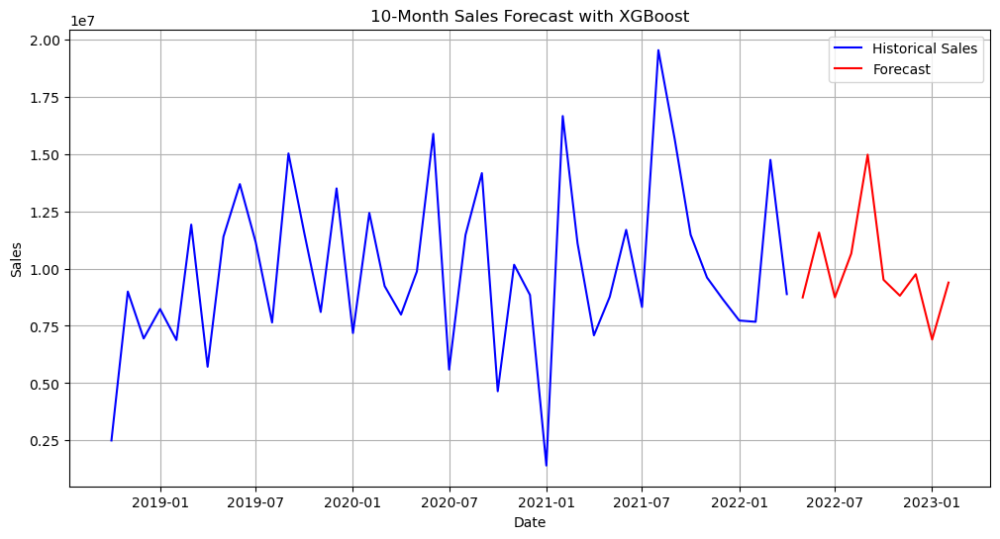

/var/folders/z6/_vn8cndd4x5dmx2cpjfdkjdr0000gn/T/ipykernel_48953/3004942526.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_set_5["Sales_EUR"] = results["yhat"]


,Mapped_GCK,Sales_EUR
Month Year,,
2022-05-01,#5,8737349.0
2022-06-01,#5,11568218.0
2022-07-01,#5,8741029.0
2022-08-01,#5,10655124.0
2022-09-01,#5,14965758.0
2022-10-01,#5,9509329.0
2022-11-01,#5,8814027.0
2022-12-01,#5,9750228.0
2023-01-01,#5,6901070.5


In [47]:
best_model, best_params, best_rmse, best_model_name = select_best_model(
    prophet_best_model_5, prophet_best_params_5, prophet_best_rmse_5, "Prophet",
    xgboost_best_model_5, xgboost_best_params_5, xgboost_best_rmse_5, "XGBoost"
    , sarima_best_model_5, sarima_best_params_5, sarima_best_rmse_5, "SARIMA"
)
print(f"Best Model: {best_model_name}")
print("Best Parameters:", best_params)
print("Best RMSE:", best_rmse)

if best_model_name == "XGBoost":
    results = xgboost_forecast(
        sales_agg5,
        df_market_5,
        period=10,
        params =best_params,
    )
elif best_model_name == "SARIMA":
    results = sarima_forecast(
        sales_agg5,
        period=10,
        params =best_params,
    )
else:
    results = prophet_forecast(
        sales_agg5,
        df_market_5,
        period=10,
        param =best_params,
    )
results.set_index('ds',inplace = True)
test_set_5.set_index('Month Year', inplace = True)
test_set_5["Sales_EUR"] = results["yhat"]
test_set_5

# Product 6

In [48]:
# selecte only the features that are selected in the feature selection step
test_set_6 = test_set[test_set['Mapped_GCK'] == '#6']
df_market_6 = df_market[selected_features_6]
df_market_6.head()

,PRO27276_org,MAB_ELE_PRO392_lag_5,PRO27276_org_lag_1,MAB_ELE_SHP250_lag_1,WKLWEUR840_org_lag_2,PRO28756_org,PRI27250_org_lag_3,MAB_ELE_SHP156_lag_4
date,,,,,,,,
2004-02-01,85.913200,NaN,NaN,NaN,NaN,96.177481,NaN,NaN
2004-03-01,97.670815,NaN,85.913200,83.458866,NaN,96.250927,NaN,NaN
2004-04-01,87.253983,NaN,97.670815,106.168192,1.2646,96.330211,NaN,NaN
2004-05-01,84.675552,NaN,87.253983,92.007646,1.2262,96.413549,96.864647,NaN
2004-06-01,95.401802,NaN,84.675552,85.696486,1.1985,96.499291,96.864653,16.940704


## Xgboost

In [49]:
X_train, X_val, y_train, y_val = train_val_split(sales_agg6, df_market_6, train_size = 0.8)

X_val.info() 

xgboost_best_model_6, xgboost_best_params_6, xgboost_best_rmse_6 = model_evaluation_XGboost(X_train,
                                                                                             y_train, 
                                                                                             X_val, y_val, 
                                                                                             xgboost_param_grid)

print("Best Params:", xgboost_best_params_6)
print("Validation RMSE:", xgboost_best_rmse_6)


<class 'pandas.core.frame.DataFrame'>
Index: 9 entries, 2021-08-01 to 2022-04-01
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   PRO27276_org          9 non-null      float64
 1   MAB_ELE_PRO392_lag_5  9 non-null      float64
 2   PRO27276_org_lag_1    9 non-null      float64
 3   MAB_ELE_SHP250_lag_1  9 non-null      float64
 4   WKLWEUR840_org_lag_2  9 non-null      float64
 5   PRO28756_org          9 non-null      float64
 6   PRI27250_org_lag_3    9 non-null      float64
 7   MAB_ELE_SHP156_lag_4  9 non-null      float64
dtypes: float64(8)
memory usage: 648.0+ bytes
Params: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.01, 'subsample': 0.5, 'colsample_bytree': 0.5, 'gamma': 0, 'reg_alpha': 0, 'reg_lambda': 0} => RMSE: 255362.5382, Relative RMSE: 0.6663
Params: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.01, 'subsample': 0.5, 'colsample_bytree': 0.5, 'gamma': 0, 'reg_alp

## Prophet

In [50]:
prophet_best_model_6, prophet_best_params_6, prophet_best_rmse_6 = model_evaluation_prophet(X_train,
                                                                                             y_train, 
                                                                                             X_val, 
                                                                                             y_val, 
                                                                                             prophet_param_grid)

print("Best Params:", prophet_best_params_6)

print("Validation RMSE:", prophet_best_rmse_6)

01:13:28 - cmdstanpy - INFO - Chain [1] start processing


01:13:29 - cmdstanpy - INFO - Chain [1] done processing
01:13:29 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 248320.9212, Relative RMSE: 0.6479


01:13:29 - cmdstanpy - INFO - Chain [1] done processing
01:13:29 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 248321.6046, Relative RMSE: 0.6479


01:13:30 - cmdstanpy - INFO - Chain [1] done processing
01:13:30 - cmdstanpy - INFO - Chain [1] start processing
01:13:30 - cmdstanpy - INFO - Chain [1] done processing
01:13:30 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 248351.1036, Relative RMSE: 0.6480
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 249987.9453, Relative RMSE: 0.6523


01:13:30 - cmdstanpy - INFO - Chain [1] done processing
01:13:30 - cmdstanpy - INFO - Chain [1] start processing
01:13:30 - cmdstanpy - INFO - Chain [1] done processing
01:13:30 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 249671.6251, Relative RMSE: 0.6515
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 249401.6642, Relative RMSE: 0.6508


01:13:30 - cmdstanpy - INFO - Chain [1] done processing
01:13:30 - cmdstanpy - INFO - Chain [1] start processing
01:13:30 - cmdstanpy - INFO - Chain [1] done processing
01:13:31 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 248959.8847, Relative RMSE: 0.6496
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 248880.8222, Relative RMSE: 0.6494


01:13:31 - cmdstanpy - INFO - Chain [1] done processing
01:13:31 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 249457.3634, Relative RMSE: 0.6509


01:13:31 - cmdstanpy - INFO - Chain [1] done processing
01:13:31 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 248974.8825, Relative RMSE: 0.6496


01:13:31 - cmdstanpy - INFO - Chain [1] done processing
01:13:31 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 248927.4948, Relative RMSE: 0.6495


01:13:31 - cmdstanpy - INFO - Chain [1] done processing
01:13:31 - cmdstanpy - INFO - Chain [1] start processing
01:13:32 - cmdstanpy - INFO - Chain [1] done processing
01:13:32 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 248993.2783, Relative RMSE: 0.6497
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 257400.2315, Relative RMSE: 0.6716


01:13:32 - cmdstanpy - INFO - Chain [1] done processing
01:13:32 - cmdstanpy - INFO - Chain [1] start processing
01:13:32 - cmdstanpy - INFO - Chain [1] done processing
01:13:32 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 257397.7968, Relative RMSE: 0.6716
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 257408.5877, Relative RMSE: 0.6717


01:13:32 - cmdstanpy - INFO - Chain [1] done processing
01:13:32 - cmdstanpy - INFO - Chain [1] start processing
01:13:32 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 257999.9592, Relative RMSE: 0.6732


01:13:32 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 258907.9351, Relative RMSE: 0.6756


01:13:33 - cmdstanpy - INFO - Chain [1] done processing
01:13:33 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 257338.3335, Relative RMSE: 0.6715


01:13:33 - cmdstanpy - INFO - Chain [1] done processing
01:13:33 - cmdstanpy - INFO - Chain [1] start processing
01:13:33 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 260638.8541, Relative RMSE: 0.6801


01:13:33 - cmdstanpy - INFO - Chain [1] start processing
01:13:33 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 260623.5455, Relative RMSE: 0.6800


01:13:33 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 260629.5148, Relative RMSE: 0.6801


01:13:33 - cmdstanpy - INFO - Chain [1] done processing
01:13:34 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 260681.3379, Relative RMSE: 0.6802


01:13:34 - cmdstanpy - INFO - Chain [1] done processing
01:13:34 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 260459.8011, Relative RMSE: 0.6796


01:13:34 - cmdstanpy - INFO - Chain [1] done processing
01:13:34 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 260536.0416, Relative RMSE: 0.6798


01:13:34 - cmdstanpy - INFO - Chain [1] done processing
01:13:34 - cmdstanpy - INFO - Chain [1] start processing
01:13:35 - cmdstanpy - INFO - Chain [1] done processing
01:13:35 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 1534723.7624, Relative RMSE: 4.0045
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 1534121.5245, Relative RMSE: 4.0030


01:13:35 - cmdstanpy - INFO - Chain [1] done processing
01:13:35 - cmdstanpy - INFO - Chain [1] start processing
01:13:35 - cmdstanpy - INFO - Chain [1] done processing
01:13:35 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 1534956.1952, Relative RMSE: 4.0051
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 1559287.7754, Relative RMSE: 4.0686


01:13:35 - cmdstanpy - INFO - Chain [1] done processing
01:13:35 - cmdstanpy - INFO - Chain [1] start processing
01:13:35 - cmdstanpy - INFO - Chain [1] done processing
01:13:35 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 1562532.2663, Relative RMSE: 4.0771
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 1566227.2184, Relative RMSE: 4.0867


01:13:35 - cmdstanpy - INFO - Chain [1] done processing
01:13:35 - cmdstanpy - INFO - Chain [1] start processing
01:13:36 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 1553613.7699, Relative RMSE: 4.0538
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 1554356.4581, Relative RMSE: 4.0557


01:13:36 - cmdstanpy - INFO - Chain [1] start processing
01:13:36 - cmdstanpy - INFO - Chain [1] done processing
01:13:36 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 1553413.7859, Relative RMSE: 4.0533


01:13:36 - cmdstanpy - INFO - Chain [1] done processing
01:13:36 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 1682213.4547, Relative RMSE: 4.3894


01:13:36 - cmdstanpy - INFO - Chain [1] done processing
01:13:36 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 1684751.3941, Relative RMSE: 4.3960


01:13:37 - cmdstanpy - INFO - Chain [1] done processing
01:13:37 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 1648719.1214, Relative RMSE: 4.3020


01:13:37 - cmdstanpy - INFO - Chain [1] done processing
01:13:37 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 3042863.8617, Relative RMSE: 7.9397


01:13:38 - cmdstanpy - INFO - Chain [1] done processing
01:13:38 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 3060059.3528, Relative RMSE: 7.9845


01:13:39 - cmdstanpy - INFO - Chain [1] done processing
01:13:39 - cmdstanpy - INFO - Chain [1] start processing
01:13:39 - cmdstanpy - INFO - Chain [1] done processing
01:13:39 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 2937971.1624, Relative RMSE: 7.6660
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 2641950.3574, Relative RMSE: 6.8936


01:13:39 - cmdstanpy - INFO - Chain [1] done processing
01:13:39 - cmdstanpy - INFO - Chain [1] start processing
01:13:39 - cmdstanpy - INFO - Chain [1] done processing
01:13:39 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 2641726.5469, Relative RMSE: 6.8930
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 2651423.1533, Relative RMSE: 6.9183


01:13:40 - cmdstanpy - INFO - Chain [1] done processing
01:13:40 - cmdstanpy - INFO - Chain [1] start processing
01:13:40 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 2645366.0851, Relative RMSE: 6.9025


01:13:40 - cmdstanpy - INFO - Chain [1] start processing
01:13:40 - cmdstanpy - INFO - Chain [1] done processing
01:13:40 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 2643801.9017, Relative RMSE: 6.8984
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 2644183.7666, Relative RMSE: 6.8994


01:13:40 - cmdstanpy - INFO - Chain [1] done processing
01:13:40 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 2578237.7432, Relative RMSE: 6.7273


01:13:41 - cmdstanpy - INFO - Chain [1] done processing
01:13:41 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 2629285.0105, Relative RMSE: 6.8605


01:13:41 - cmdstanpy - INFO - Chain [1] done processing
01:13:41 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 2650644.8442, Relative RMSE: 6.9163


01:13:42 - cmdstanpy - INFO - Chain [1] done processing
01:13:42 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 246691.8656, Relative RMSE: 0.6437


01:13:42 - cmdstanpy - INFO - Chain [1] done processing
01:13:42 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 246652.2079, Relative RMSE: 0.6436


01:13:43 - cmdstanpy - INFO - Chain [1] done processing
01:13:43 - cmdstanpy - INFO - Chain [1] start processing
01:13:43 - cmdstanpy - INFO - Chain [1] done processing
01:13:43 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 246662.2476, Relative RMSE: 0.6436
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 247572.7282, Relative RMSE: 0.6460


01:13:43 - cmdstanpy - INFO - Chain [1] done processing
01:13:43 - cmdstanpy - INFO - Chain [1] start processing
01:13:43 - cmdstanpy - INFO - Chain [1] done processing
01:13:43 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 247279.2261, Relative RMSE: 0.6452
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 247293.3811, Relative RMSE: 0.6453


01:13:43 - cmdstanpy - INFO - Chain [1] done processing
01:13:43 - cmdstanpy - INFO - Chain [1] start processing
01:13:43 - cmdstanpy - INFO - Chain [1] done processing
01:13:43 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 247544.5017, Relative RMSE: 0.6459
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 247530.8649, Relative RMSE: 0.6459


01:13:43 - cmdstanpy - INFO - Chain [1] done processing
01:13:43 - cmdstanpy - INFO - Chain [1] start processing
01:13:44 - cmdstanpy - INFO - Chain [1] done processing
01:13:44 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 247516.6192, Relative RMSE: 0.6458
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 247605.4206, Relative RMSE: 0.6461


01:13:44 - cmdstanpy - INFO - Chain [1] done processing
01:13:44 - cmdstanpy - INFO - Chain [1] start processing
01:13:44 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 247469.2095, Relative RMSE: 0.6457
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 247560.6690, Relative RMSE: 0.6460


01:13:44 - cmdstanpy - INFO - Chain [1] start processing
01:13:44 - cmdstanpy - INFO - Chain [1] done processing
01:13:45 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 246691.8656, Relative RMSE: 0.6437


01:13:45 - cmdstanpy - INFO - Chain [1] done processing
01:13:45 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 246652.2079, Relative RMSE: 0.6436


01:13:46 - cmdstanpy - INFO - Chain [1] done processing
01:13:46 - cmdstanpy - INFO - Chain [1] start processing
01:13:46 - cmdstanpy - INFO - Chain [1] done processing
01:13:46 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 246662.2476, Relative RMSE: 0.6436
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 247572.7282, Relative RMSE: 0.6460


01:13:46 - cmdstanpy - INFO - Chain [1] done processing
01:13:46 - cmdstanpy - INFO - Chain [1] start processing
01:13:46 - cmdstanpy - INFO - Chain [1] done processing
01:13:46 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 247279.2261, Relative RMSE: 0.6452
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 247293.3811, Relative RMSE: 0.6453


01:13:46 - cmdstanpy - INFO - Chain [1] done processing
01:13:46 - cmdstanpy - INFO - Chain [1] start processing
01:13:46 - cmdstanpy - INFO - Chain [1] done processing
01:13:46 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 247544.5017, Relative RMSE: 0.6459
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 247530.8649, Relative RMSE: 0.6459


01:13:46 - cmdstanpy - INFO - Chain [1] done processing
01:13:46 - cmdstanpy - INFO - Chain [1] start processing
01:13:47 - cmdstanpy - INFO - Chain [1] done processing
01:13:47 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 247516.6192, Relative RMSE: 0.6458
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 247605.4206, Relative RMSE: 0.6461


01:13:47 - cmdstanpy - INFO - Chain [1] done processing
01:13:47 - cmdstanpy - INFO - Chain [1] start processing
01:13:47 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 247469.2095, Relative RMSE: 0.6457
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 247560.6690, Relative RMSE: 0.6460


01:13:47 - cmdstanpy - INFO - Chain [1] start processing
01:13:47 - cmdstanpy - INFO - Chain [1] done processing
01:13:47 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 246691.8656, Relative RMSE: 0.6437


01:13:48 - cmdstanpy - INFO - Chain [1] done processing
01:13:48 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 246652.2079, Relative RMSE: 0.6436


01:13:49 - cmdstanpy - INFO - Chain [1] done processing
01:13:49 - cmdstanpy - INFO - Chain [1] start processing
01:13:49 - cmdstanpy - INFO - Chain [1] done processing
01:13:49 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 246662.2476, Relative RMSE: 0.6436
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 247572.7282, Relative RMSE: 0.6460


01:13:49 - cmdstanpy - INFO - Chain [1] done processing
01:13:49 - cmdstanpy - INFO - Chain [1] start processing
01:13:49 - cmdstanpy - INFO - Chain [1] done processing
01:13:49 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 247279.2261, Relative RMSE: 0.6452
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 247293.3811, Relative RMSE: 0.6453


01:13:49 - cmdstanpy - INFO - Chain [1] done processing
01:13:49 - cmdstanpy - INFO - Chain [1] start processing
01:13:49 - cmdstanpy - INFO - Chain [1] done processing
01:13:49 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 247544.5017, Relative RMSE: 0.6459
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 247530.8649, Relative RMSE: 0.6459


01:13:49 - cmdstanpy - INFO - Chain [1] done processing
01:13:49 - cmdstanpy - INFO - Chain [1] start processing
01:13:50 - cmdstanpy - INFO - Chain [1] done processing
01:13:50 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 247516.6192, Relative RMSE: 0.6458
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 247605.4206, Relative RMSE: 0.6461


01:13:50 - cmdstanpy - INFO - Chain [1] done processing
01:13:50 - cmdstanpy - INFO - Chain [1] start processing
01:13:50 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 247469.2095, Relative RMSE: 0.6457
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 247560.6690, Relative RMSE: 0.6460


01:13:50 - cmdstanpy - INFO - Chain [1] start processing
01:13:50 - cmdstanpy - INFO - Chain [1] done processing
01:13:50 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 246691.8656, Relative RMSE: 0.6437


01:13:51 - cmdstanpy - INFO - Chain [1] done processing
01:13:51 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 246652.2079, Relative RMSE: 0.6436


01:13:52 - cmdstanpy - INFO - Chain [1] done processing
01:13:52 - cmdstanpy - INFO - Chain [1] start processing
01:13:52 - cmdstanpy - INFO - Chain [1] done processing
01:13:52 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 246662.2476, Relative RMSE: 0.6436
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 247572.7282, Relative RMSE: 0.6460


01:13:52 - cmdstanpy - INFO - Chain [1] done processing
01:13:52 - cmdstanpy - INFO - Chain [1] start processing
01:13:52 - cmdstanpy - INFO - Chain [1] done processing
01:13:52 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 247279.2261, Relative RMSE: 0.6452
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 247293.3811, Relative RMSE: 0.6453


01:13:52 - cmdstanpy - INFO - Chain [1] done processing
01:13:52 - cmdstanpy - INFO - Chain [1] start processing
01:13:52 - cmdstanpy - INFO - Chain [1] done processing
01:13:52 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 247544.5017, Relative RMSE: 0.6459
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 247530.8649, Relative RMSE: 0.6459


01:13:52 - cmdstanpy - INFO - Chain [1] done processing
01:13:52 - cmdstanpy - INFO - Chain [1] start processing
01:13:52 - cmdstanpy - INFO - Chain [1] done processing
01:13:53 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 247516.6192, Relative RMSE: 0.6458
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 247605.4206, Relative RMSE: 0.6461


01:13:53 - cmdstanpy - INFO - Chain [1] done processing
01:13:53 - cmdstanpy - INFO - Chain [1] start processing
01:13:53 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 247469.2095, Relative RMSE: 0.6457
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 247560.6690, Relative RMSE: 0.6460


01:13:53 - cmdstanpy - INFO - Chain [1] start processing
01:13:54 - cmdstanpy - INFO - Chain [1] done processing
01:13:54 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 246011.1424, Relative RMSE: 0.6419


01:13:55 - cmdstanpy - INFO - Chain [1] done processing
01:13:55 - cmdstanpy - INFO - Chain [1] start processing
01:13:55 - cmdstanpy - INFO - Chain [1] done processing
01:13:55 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 246075.6502, Relative RMSE: 0.6421
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 246199.1238, Relative RMSE: 0.6424


01:13:55 - cmdstanpy - INFO - Chain [1] done processing
01:13:55 - cmdstanpy - INFO - Chain [1] start processing
01:13:55 - cmdstanpy - INFO - Chain [1] done processing
01:13:55 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 248550.1496, Relative RMSE: 0.6485
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 248187.7959, Relative RMSE: 0.6476


01:13:55 - cmdstanpy - INFO - Chain [1] done processing
01:13:55 - cmdstanpy - INFO - Chain [1] start processing
01:13:56 - cmdstanpy - INFO - Chain [1] done processing
01:13:56 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 248191.4492, Relative RMSE: 0.6476
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 248307.6546, Relative RMSE: 0.6479


01:13:56 - cmdstanpy - INFO - Chain [1] done processing
01:13:56 - cmdstanpy - INFO - Chain [1] start processing
01:13:56 - cmdstanpy - INFO - Chain [1] done processing
01:13:56 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 248167.3781, Relative RMSE: 0.6475
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 247552.3507, Relative RMSE: 0.6459


01:13:56 - cmdstanpy - INFO - Chain [1] done processing
01:13:56 - cmdstanpy - INFO - Chain [1] start processing
01:13:56 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 248119.5039, Relative RMSE: 0.6474


01:13:57 - cmdstanpy - INFO - Chain [1] start processing
01:13:57 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 248059.9456, Relative RMSE: 0.6473


01:13:57 - cmdstanpy - INFO - Chain [1] start processing
01:13:57 - cmdstanpy - INFO - Chain [1] done processing
01:13:57 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 248055.5141, Relative RMSE: 0.6472
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 269281.8124, Relative RMSE: 0.7026


01:13:57 - cmdstanpy - INFO - Chain [1] done processing
01:13:57 - cmdstanpy - INFO - Chain [1] start processing
01:13:57 - cmdstanpy - INFO - Chain [1] done processing
01:13:57 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 266299.8273, Relative RMSE: 0.6949
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 269297.6825, Relative RMSE: 0.7027


01:13:57 - cmdstanpy - INFO - Chain [1] done processing
01:13:58 - cmdstanpy - INFO - Chain [1] start processing
01:13:58 - cmdstanpy - INFO - Chain [1] done processing
01:13:58 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 269803.2345, Relative RMSE: 0.7040
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 268677.3192, Relative RMSE: 0.7011


01:13:58 - cmdstanpy - INFO - Chain [1] done processing
01:13:58 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 270434.8290, Relative RMSE: 0.7056


01:13:58 - cmdstanpy - INFO - Chain [1] done processing
01:13:58 - cmdstanpy - INFO - Chain [1] start processing
01:13:58 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 270589.4866, Relative RMSE: 0.7060


01:13:58 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 271174.0508, Relative RMSE: 0.7076


01:13:59 - cmdstanpy - INFO - Chain [1] done processing
01:13:59 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 271716.9947, Relative RMSE: 0.7090


01:13:59 - cmdstanpy - INFO - Chain [1] done processing
01:13:59 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 270316.2782, Relative RMSE: 0.7053


01:13:59 - cmdstanpy - INFO - Chain [1] done processing
01:13:59 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 269917.8945, Relative RMSE: 0.7043


01:14:00 - cmdstanpy - INFO - Chain [1] done processing
01:14:00 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 270902.7199, Relative RMSE: 0.7069


01:14:00 - cmdstanpy - INFO - Chain [1] done processing
01:14:00 - cmdstanpy - INFO - Chain [1] start processing
01:14:00 - cmdstanpy - INFO - Chain [1] done processing
01:14:00 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 341995.8338, Relative RMSE: 0.8924
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 365899.3939, Relative RMSE: 0.9547


01:14:01 - cmdstanpy - INFO - Chain [1] done processing
01:14:01 - cmdstanpy - INFO - Chain [1] start processing
01:14:01 - cmdstanpy - INFO - Chain [1] done processing
01:14:01 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 364964.4020, Relative RMSE: 0.9523
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 446589.8292, Relative RMSE: 1.1653


01:14:01 - cmdstanpy - INFO - Chain [1] done processing
01:14:01 - cmdstanpy - INFO - Chain [1] start processing
01:14:01 - cmdstanpy - INFO - Chain [1] done processing
01:14:01 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 446589.3253, Relative RMSE: 1.1653
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 446589.0450, Relative RMSE: 1.1653


01:14:01 - cmdstanpy - INFO - Chain [1] done processing
01:14:01 - cmdstanpy - INFO - Chain [1] start processing
01:14:01 - cmdstanpy - INFO - Chain [1] done processing
01:14:01 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 446202.7328, Relative RMSE: 1.1643
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 446320.2396, Relative RMSE: 1.1646


01:14:01 - cmdstanpy - INFO - Chain [1] done processing
01:14:01 - cmdstanpy - INFO - Chain [1] start processing
01:14:02 - cmdstanpy - INFO - Chain [1] done processing
01:14:02 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 446163.1166, Relative RMSE: 1.1642
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 451834.3327, Relative RMSE: 1.1790


01:14:02 - cmdstanpy - INFO - Chain [1] done processing
01:14:02 - cmdstanpy - INFO - Chain [1] start processing
01:14:02 - cmdstanpy - INFO - Chain [1] done processing
01:14:02 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 438152.7642, Relative RMSE: 1.1433
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 440955.3960, Relative RMSE: 1.1506


01:14:02 - cmdstanpy - INFO - Chain [1] done processing
01:14:02 - cmdstanpy - INFO - Chain [1] start processing
01:14:02 - cmdstanpy - INFO - Chain [1] done processing
01:14:02 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 2357186.2177, Relative RMSE: 6.1506
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 2357138.4843, Relative RMSE: 6.1504


01:14:02 - cmdstanpy - INFO - Chain [1] done processing
01:14:02 - cmdstanpy - INFO - Chain [1] start processing
01:14:02 - cmdstanpy - INFO - Chain [1] done processing
01:14:02 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 2357117.2203, Relative RMSE: 6.1504
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 2361610.0568, Relative RMSE: 6.1621


01:14:03 - cmdstanpy - INFO - Chain [1] done processing
01:14:03 - cmdstanpy - INFO - Chain [1] start processing
01:14:03 - cmdstanpy - INFO - Chain [1] done processing
01:14:03 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 2361609.0876, Relative RMSE: 6.1621
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 2361624.9744, Relative RMSE: 6.1621


01:14:03 - cmdstanpy - INFO - Chain [1] done processing
01:14:03 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 2359404.8812, Relative RMSE: 6.1563


01:14:03 - cmdstanpy - INFO - Chain [1] done processing
01:14:03 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 2362108.4176, Relative RMSE: 6.1634


01:14:03 - cmdstanpy - INFO - Chain [1] done processing
01:14:03 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 2356507.0438, Relative RMSE: 6.1488


01:14:04 - cmdstanpy - INFO - Chain [1] done processing
01:14:04 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 2107338.7149, Relative RMSE: 5.4986


01:14:04 - cmdstanpy - INFO - Chain [1] done processing
01:14:04 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 2184944.8594, Relative RMSE: 5.7011


01:14:04 - cmdstanpy - INFO - Chain [1] done processing
01:14:04 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 2188308.1263, Relative RMSE: 5.7099


01:14:05 - cmdstanpy - INFO - Chain [1] done processing
01:14:05 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 246691.8656, Relative RMSE: 0.6437


01:14:05 - cmdstanpy - INFO - Chain [1] done processing
01:14:05 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 246652.2079, Relative RMSE: 0.6436


01:14:06 - cmdstanpy - INFO - Chain [1] done processing
01:14:06 - cmdstanpy - INFO - Chain [1] start processing
01:14:06 - cmdstanpy - INFO - Chain [1] done processing
01:14:06 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 246662.2476, Relative RMSE: 0.6436
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 247572.7282, Relative RMSE: 0.6460


01:14:06 - cmdstanpy - INFO - Chain [1] done processing
01:14:06 - cmdstanpy - INFO - Chain [1] start processing
01:14:07 - cmdstanpy - INFO - Chain [1] done processing
01:14:07 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 247279.2261, Relative RMSE: 0.6452
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 247293.3811, Relative RMSE: 0.6453


01:14:07 - cmdstanpy - INFO - Chain [1] done processing
01:14:07 - cmdstanpy - INFO - Chain [1] start processing
01:14:07 - cmdstanpy - INFO - Chain [1] done processing
01:14:07 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 247544.5017, Relative RMSE: 0.6459
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 247530.8649, Relative RMSE: 0.6459


01:14:07 - cmdstanpy - INFO - Chain [1] done processing
01:14:07 - cmdstanpy - INFO - Chain [1] start processing
01:14:07 - cmdstanpy - INFO - Chain [1] done processing
01:14:07 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 247516.6192, Relative RMSE: 0.6458
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 247605.4206, Relative RMSE: 0.6461


01:14:07 - cmdstanpy - INFO - Chain [1] done processing
01:14:07 - cmdstanpy - INFO - Chain [1] start processing
01:14:07 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 247469.2095, Relative RMSE: 0.6457
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 247560.6690, Relative RMSE: 0.6460


01:14:08 - cmdstanpy - INFO - Chain [1] start processing
01:14:08 - cmdstanpy - INFO - Chain [1] done processing
01:14:08 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 246691.8656, Relative RMSE: 0.6437


01:14:08 - cmdstanpy - INFO - Chain [1] done processing
01:14:08 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 246652.2079, Relative RMSE: 0.6436


01:14:09 - cmdstanpy - INFO - Chain [1] done processing
01:14:09 - cmdstanpy - INFO - Chain [1] start processing
01:14:09 - cmdstanpy - INFO - Chain [1] done processing
01:14:09 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 246662.2476, Relative RMSE: 0.6436
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 247572.7282, Relative RMSE: 0.6460


01:14:09 - cmdstanpy - INFO - Chain [1] done processing
01:14:09 - cmdstanpy - INFO - Chain [1] start processing
01:14:10 - cmdstanpy - INFO - Chain [1] done processing
01:14:10 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 247279.2261, Relative RMSE: 0.6452
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 247293.3811, Relative RMSE: 0.6453


01:14:10 - cmdstanpy - INFO - Chain [1] done processing
01:14:10 - cmdstanpy - INFO - Chain [1] start processing
01:14:10 - cmdstanpy - INFO - Chain [1] done processing
01:14:10 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 247544.5017, Relative RMSE: 0.6459
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 247530.8649, Relative RMSE: 0.6459


01:14:10 - cmdstanpy - INFO - Chain [1] done processing
01:14:10 - cmdstanpy - INFO - Chain [1] start processing
01:14:10 - cmdstanpy - INFO - Chain [1] done processing
01:14:10 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 247516.6192, Relative RMSE: 0.6458
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 247605.4206, Relative RMSE: 0.6461


01:14:10 - cmdstanpy - INFO - Chain [1] done processing
01:14:10 - cmdstanpy - INFO - Chain [1] start processing
01:14:10 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 247469.2095, Relative RMSE: 0.6457
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 247560.6690, Relative RMSE: 0.6460


01:14:11 - cmdstanpy - INFO - Chain [1] start processing
01:14:11 - cmdstanpy - INFO - Chain [1] done processing
01:14:11 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 246691.8656, Relative RMSE: 0.6437


01:14:11 - cmdstanpy - INFO - Chain [1] done processing
01:14:11 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 246652.2079, Relative RMSE: 0.6436


01:14:12 - cmdstanpy - INFO - Chain [1] done processing
01:14:12 - cmdstanpy - INFO - Chain [1] start processing
01:14:12 - cmdstanpy - INFO - Chain [1] done processing
01:14:12 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 246662.2476, Relative RMSE: 0.6436
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 247572.7282, Relative RMSE: 0.6460


01:14:12 - cmdstanpy - INFO - Chain [1] done processing
01:14:12 - cmdstanpy - INFO - Chain [1] start processing
01:14:12 - cmdstanpy - INFO - Chain [1] done processing
01:14:13 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 247279.2261, Relative RMSE: 0.6452
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 247293.3811, Relative RMSE: 0.6453


01:14:13 - cmdstanpy - INFO - Chain [1] done processing
01:14:13 - cmdstanpy - INFO - Chain [1] start processing
01:14:13 - cmdstanpy - INFO - Chain [1] done processing
01:14:13 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 247544.5017, Relative RMSE: 0.6459
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 247530.8649, Relative RMSE: 0.6459


01:14:13 - cmdstanpy - INFO - Chain [1] done processing
01:14:13 - cmdstanpy - INFO - Chain [1] start processing
01:14:13 - cmdstanpy - INFO - Chain [1] done processing
01:14:13 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 247516.6192, Relative RMSE: 0.6458
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 247605.4206, Relative RMSE: 0.6461


01:14:13 - cmdstanpy - INFO - Chain [1] done processing
01:14:13 - cmdstanpy - INFO - Chain [1] start processing
01:14:13 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 247469.2095, Relative RMSE: 0.6457
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 247560.6690, Relative RMSE: 0.6460


01:14:13 - cmdstanpy - INFO - Chain [1] start processing
01:14:14 - cmdstanpy - INFO - Chain [1] done processing
01:14:14 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 246691.8656, Relative RMSE: 0.6437


01:14:14 - cmdstanpy - INFO - Chain [1] done processing
01:14:14 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 246652.2079, Relative RMSE: 0.6436


01:14:15 - cmdstanpy - INFO - Chain [1] done processing
01:14:15 - cmdstanpy - INFO - Chain [1] start processing
01:14:15 - cmdstanpy - INFO - Chain [1] done processing
01:14:15 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 246662.2476, Relative RMSE: 0.6436
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 247572.7282, Relative RMSE: 0.6460


01:14:15 - cmdstanpy - INFO - Chain [1] done processing
01:14:15 - cmdstanpy - INFO - Chain [1] start processing
01:14:15 - cmdstanpy - INFO - Chain [1] done processing
01:14:15 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 247279.2261, Relative RMSE: 0.6452
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 247293.3811, Relative RMSE: 0.6453


01:14:16 - cmdstanpy - INFO - Chain [1] done processing
01:14:16 - cmdstanpy - INFO - Chain [1] start processing
01:14:16 - cmdstanpy - INFO - Chain [1] done processing
01:14:16 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 247544.5017, Relative RMSE: 0.6459
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 247530.8649, Relative RMSE: 0.6459


01:14:16 - cmdstanpy - INFO - Chain [1] done processing
01:14:16 - cmdstanpy - INFO - Chain [1] start processing
01:14:16 - cmdstanpy - INFO - Chain [1] done processing
01:14:16 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 247516.6192, Relative RMSE: 0.6458
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 247605.4206, Relative RMSE: 0.6461


01:14:16 - cmdstanpy - INFO - Chain [1] done processing
01:14:16 - cmdstanpy - INFO - Chain [1] start processing
01:14:16 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 247469.2095, Relative RMSE: 0.6457
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 247560.6690, Relative RMSE: 0.6460
Best Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8}
Validation RMSE: 246011.14235176175


## Sarima

In [51]:
sarima_best_model_6, sarima_best_params_6, sarima_best_rmse_6 = model_evaluation_SARIMA(y_train, 
                                                             y_val, 
                                                             sarima_param_grid)

print("Best Params:", sarima_best_params_6)
print("Validation RMSE:", sarima_best_rmse_6)

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,0) x (0,0,0,6) => RMSE: 446258.8715, Relative RMSE: 1.1644
SARIMA(0,0,0) x (0,0,0,12) => RMSE: 446258.8715, Relative RMSE: 1.1644
SARIMA(0,0,0) x (0,0,1,6) => RMSE: 350478.0283, Relative RMSE: 0.9145
SARIMA(0,0,0) x (0,0,1,12) => RMSE: 351617.9492, Relative RMSE: 0.9175
SARIMA(0,0,0) x (0,1,0,6) => RMSE: 274557.2199, Relative RMSE: 0.7164
SARIMA(0,0,0) x (0,1,0,12) => RMSE: 284875.3080, Relative RMSE: 0.7433
SARIMA(0,0,0) x (0,1,1,6) => RMSE: 245577.2573, Relative RMSE: 0.6408
SARIMA(0,0,0) x (0,1,1,12) => RMSE: 280871.8890, Relative RMSE: 0.7329
SARIMA(0,0,0) x (1,0,0,6) => RMSE: 216823.1433, Relative RMSE: 0.5658
SARIMA(0,0,0) x (1,0,0,12) => RMSE: 258865.1370, Relative RMSE: 0.6755
SARIMA(0,0,0) x (1,0,1,6) => RMSE: 328216.2493, Relative RMSE: 0.8564
SARIMA(0,0,0) x (1,0,1,12) => RMSE: 267166.7106, Relative RMSE: 0.6971
SARIMA(0,0,0) x (1,1,0,6) => RMSE: 249241.0233, Relative RMSE: 0.6503
SARIMA(0,0,0) x (1,1,0,12) => RMSE: 284544.3198, Relative RMSE: 0.7425
SARIMA(0,0,0)

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,0) x (1,1,1,12) => RMSE: 266384.5155, Relative RMSE: 0.6951
SARIMA(0,0,1) x (0,0,0,6) => RMSE: 426661.7802, Relative RMSE: 1.1133
SARIMA(0,0,1) x (0,0,0,12) => RMSE: 426661.7802, Relative RMSE: 1.1133
SARIMA(0,0,1) x (0,0,1,6) => RMSE: 359660.0639, Relative RMSE: 0.9385
SARIMA(0,0,1) x (0,0,1,12) => RMSE: 345868.4316, Relative RMSE: 0.9025
SARIMA(0,0,1) x (0,1,0,6) => RMSE: 273663.5998, Relative RMSE: 0.7141
SARIMA(0,0,1) x (0,1,0,12) => RMSE: 285429.3614, Relative RMSE: 0.7448
SARIMA(0,0,1) x (0,1,1,6) => RMSE: 245626.4132, Relative RMSE: 0.6409
SARIMA(0,0,1) x (0,1,1,12) => RMSE: 282529.3024, Relative RMSE: 0.7372
SARIMA(0,0,1) x (1,0,0,6) => RMSE: 217379.4825, Relative RMSE: 0.5672
SARIMA(0,0,1) x (1,0,0,12) => RMSE: 257670.3940, Relative RMSE: 0.6723
SARIMA(0,0,1) x (1,0,1,6) => RMSE: 330271.6506, Relative RMSE: 0.8618
SARIMA(0,0,1) x (1,0,1,12) => RMSE: 269789.9091, Relative RMSE: 0.7040


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,1) x (1,1,0,6) => RMSE: 249213.1819, Relative RMSE: 0.6503
SARIMA(0,0,1) x (1,1,0,12) => RMSE: 293132.5505, Relative RMSE: 0.7649
SARIMA(0,0,1) x (1,1,1,6) => RMSE: 259748.4808, Relative RMSE: 0.6778
SARIMA(0,0,1) x (1,1,1,12) => RMSE: 308718.7077, Relative RMSE: 0.8055
SARIMA(0,0,2) x (0,0,0,6) => RMSE: 394751.1511, Relative RMSE: 1.0300
SARIMA(0,0,2) x (0,0,0,12) => RMSE: 394751.1511, Relative RMSE: 1.0300
SARIMA(0,0,2) x (0,0,1,6) => RMSE: 339443.0571, Relative RMSE: 0.8857
SARIMA(0,0,2) x (0,0,1,12) => RMSE: 329826.5819, Relative RMSE: 0.8606
SARIMA(0,0,2) x (0,1,0,6) => RMSE: 279922.5040, Relative RMSE: 0.7304
SARIMA(0,0,2) x (0,1,0,12) => RMSE: 276182.0931, Relative RMSE: 0.7206


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,0,2) x (0,1,1,6) => RMSE: 228369.6432, Relative RMSE: 0.5959
SARIMA(0,0,2) x (0,1,1,12) => RMSE: 285752.2273, Relative RMSE: 0.7456
SARIMA(0,0,2) x (1,0,0,6) => RMSE: 214271.8274, Relative RMSE: 0.5591
SARIMA(0,0,2) x (1,0,0,12) => RMSE: 238539.3100, Relative RMSE: 0.6224
SARIMA(0,0,2) x (1,0,1,6) => RMSE: 313654.6436, Relative RMSE: 0.8184
SARIMA(0,0,2) x (1,0,1,12) => RMSE: 233134.2575, Relative RMSE: 0.6083


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,0,2) x (1,1,0,6) => RMSE: 259345.2932, Relative RMSE: 0.6767
SARIMA(0,0,2) x (1,1,0,12) => RMSE: 299390.7493, Relative RMSE: 0.7812
SARIMA(0,0,2) x (1,1,1,6) => RMSE: 258310.0807, Relative RMSE: 0.6740
SARIMA(0,0,2) x (1,1,1,12) => RMSE: 283141.8809, Relative RMSE: 0.7388
SARIMA(0,1,0) x (0,0,0,6) => RMSE: 256408.5009, Relative RMSE: 0.6690
SARIMA(0,1,0) x (0,0,0,12) => RMSE: 256408.5009, Relative RMSE: 0.6690
SARIMA(0,1,0) x (0,0,1,6) => RMSE: 240944.2684, Relative RMSE: 0.6287
SARIMA(0,1,0) x (0,0,1,12) => RMSE: 228970.4259, Relative RMSE: 0.5974
SARIMA(0,1,0) x (0,1,0,6) => RMSE: 870785.5745, Relative RMSE: 2.2721
SARIMA(0,1,0) x (0,1,0,12) => RMSE: 333190.5197, Relative RMSE: 0.8694
SARIMA(0,1,0) x (0,1,1,6) => RMSE: 476703.1918, Relative RMSE: 1.2439


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,0) x (0,1,1,12) => RMSE: 339140.8439, Relative RMSE: 0.8849
SARIMA(0,1,0) x (1,0,0,6) => RMSE: 243793.8370, Relative RMSE: 0.6361
SARIMA(0,1,0) x (1,0,0,12) => RMSE: 224683.0302, Relative RMSE: 0.5863
SARIMA(0,1,0) x (1,0,1,6) => RMSE: 254538.7850, Relative RMSE: 0.6642
SARIMA(0,1,0) x (1,0,1,12) => RMSE: 225981.9626, Relative RMSE: 0.5896
SARIMA(0,1,0) x (1,1,0,6) => RMSE: 238791.5108, Relative RMSE: 0.6231
SARIMA(0,1,0) x (1,1,0,12) => RMSE: 338910.5977, Relative RMSE: 0.8843
SARIMA(0,1,0) x (1,1,1,6) => RMSE: 343828.8696, Relative RMSE: 0.8971
SARIMA(0,1,0) x (1,1,1,12) => RMSE: 376347.8708, Relative RMSE: 0.9820
SARIMA(0,1,1) x (0,0,0,6) => RMSE: 250271.8930, Relative RMSE: 0.6530
SARIMA(0,1,1) x (0,0,0,12) => RMSE: 250271.8930, Relative RMSE: 0.6530
SARIMA(0,1,1) x (0,0,1,6) => RMSE: 257663.7710, Relative RMSE: 0.6723
SARIMA(0,1,1) x (0,0,1,12) => RMSE: 238743.0656, Relative RMSE: 0.6229
SARIMA(0,1,1) x (0,1,0,6) => RMSE: 336075.0553, Relative RMSE: 0.8769
SARIMA(0,1,1)

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,1) x (0,1,1,6) => RMSE: 484769.6491, Relative RMSE: 1.2649
SARIMA(0,1,1) x (0,1,1,12) => RMSE: 274291.6493, Relative RMSE: 0.7157
SARIMA(0,1,1) x (1,0,0,6) => RMSE: 252323.6734, Relative RMSE: 0.6584
SARIMA(0,1,1) x (1,0,0,12) => RMSE: 234317.1215, Relative RMSE: 0.6114
SARIMA(0,1,1) x (1,0,1,6) => RMSE: 251554.0803, Relative RMSE: 0.6564
SARIMA(0,1,1) x (1,0,1,12) => RMSE: 242101.3682, Relative RMSE: 0.6317
SARIMA(0,1,1) x (1,1,0,6) => RMSE: 233787.4038, Relative RMSE: 0.6100
SARIMA(0,1,1) x (1,1,0,12) => RMSE: 279691.1219, Relative RMSE: 0.7298
SARIMA(0,1,1) x (1,1,1,6) => RMSE: 369909.9621, Relative RMSE: 0.9652


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,1) x (1,1,1,12) => RMSE: 283456.5123, Relative RMSE: 0.7396
SARIMA(0,1,2) x (0,0,0,6) => RMSE: 250624.4199, Relative RMSE: 0.6539
SARIMA(0,1,2) x (0,0,0,12) => RMSE: 250624.4199, Relative RMSE: 0.6539
SARIMA(0,1,2) x (0,0,1,6) => RMSE: 240901.0649, Relative RMSE: 0.6286
SARIMA(0,1,2) x (0,0,1,12) => RMSE: 238153.7554, Relative RMSE: 0.6214
SARIMA(0,1,2) x (0,1,0,6) => RMSE: 291152.8815, Relative RMSE: 0.7597
SARIMA(0,1,2) x (0,1,0,12) => RMSE: 283296.0206, Relative RMSE: 0.7392
SARIMA(0,1,2) x (0,1,1,6) => RMSE: 460951.9684, Relative RMSE: 1.2028


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,2) x (0,1,1,12) => RMSE: 459565.2201, Relative RMSE: 1.1991
SARIMA(0,1,2) x (1,0,0,6) => RMSE: 251212.9808, Relative RMSE: 0.6555
SARIMA(0,1,2) x (1,0,0,12) => RMSE: 335924.2693, Relative RMSE: 0.8765
SARIMA(0,1,2) x (1,0,1,6) => RMSE: 252295.8240, Relative RMSE: 0.6583
SARIMA(0,1,2) x (1,0,1,12) => RMSE: 245800.3802, Relative RMSE: 0.6414
SARIMA(0,1,2) x (1,1,0,6) => RMSE: 229085.8606, Relative RMSE: 0.5977


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,1,2) x (1,1,0,12) => RMSE: 334999.8707, Relative RMSE: 0.8741
SARIMA(0,1,2) x (1,1,1,6) => RMSE: 373188.0092, Relative RMSE: 0.9738
SARIMA(0,1,2) x (1,1,1,12) => RMSE: 453545.5413, Relative RMSE: 1.1834
SARIMA(1,0,0) x (0,0,0,6) => RMSE: 268996.2673, Relative RMSE: 0.7019
SARIMA(1,0,0) x (0,0,0,12) => RMSE: 268996.2673, Relative RMSE: 0.7019
SARIMA(1,0,0) x (0,0,1,6) => RMSE: 294921.0776, Relative RMSE: 0.7695
SARIMA(1,0,0) x (0,0,1,12) => RMSE: 306793.2094, Relative RMSE: 0.8005


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,0) x (0,1,0,6) => RMSE: 273324.3443, Relative RMSE: 0.7132
SARIMA(1,0,0) x (0,1,0,12) => RMSE: 286878.0956, Relative RMSE: 0.7485
SARIMA(1,0,0) x (0,1,1,6) => RMSE: 244666.2913, Relative RMSE: 0.6384
SARIMA(1,0,0) x (0,1,1,12) => RMSE: 269290.5867, Relative RMSE: 0.7027
SARIMA(1,0,0) x (1,0,0,6) => RMSE: 305682.4544, Relative RMSE: 0.7976
SARIMA(1,0,0) x (1,0,0,12) => RMSE: 257453.4228, Relative RMSE: 0.6718
SARIMA(1,0,0) x (1,0,1,6) => RMSE: 329327.7062, Relative RMSE: 0.8593
SARIMA(1,0,0) x (1,0,1,12) => RMSE: 268440.1327, Relative RMSE: 0.7004
SARIMA(1,0,0) x (1,1,0,6) => RMSE: 248940.0213, Relative RMSE: 0.6496
SARIMA(1,0,0) x (1,1,0,12) => RMSE: 288442.2791, Relative RMSE: 0.7526


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,0) x (1,1,1,6) => RMSE: 259821.5004, Relative RMSE: 0.6779
SARIMA(1,0,0) x (1,1,1,12) => RMSE: 2305739.0460, Relative RMSE: 6.0163
SARIMA(1,0,1) x (0,0,0,6) => RMSE: 300079.5226, Relative RMSE: 0.7830
SARIMA(1,0,1) x (0,0,0,12) => RMSE: 300079.5226, Relative RMSE: 0.7830
SARIMA(1,0,1) x (0,0,1,6) => RMSE: 286810.4726, Relative RMSE: 0.7484
SARIMA(1,0,1) x (0,0,1,12) => RMSE: 312278.8523, Relative RMSE: 0.8148
SARIMA(1,0,1) x (0,1,0,6) => RMSE: 269243.8081, Relative RMSE: 0.7025


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,1) x (0,1,0,12) => RMSE: 293007.0305, Relative RMSE: 0.7645
SARIMA(1,0,1) x (0,1,1,6) => RMSE: 320972.0463, Relative RMSE: 0.8375
SARIMA(1,0,1) x (0,1,1,12) => RMSE: 298773.3530, Relative RMSE: 0.7796
SARIMA(1,0,1) x (1,0,0,6) => RMSE: 272898.0708, Relative RMSE: 0.7121


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(1,0,1) x (1,0,0,12) => RMSE: 274216.1871, Relative RMSE: 0.7155
SARIMA(1,0,1) x (1,0,1,6) => RMSE: 254139.7230, Relative RMSE: 0.6631
SARIMA(1,0,1) x (1,0,1,12) => RMSE: 269438.8443, Relative RMSE: 0.7030
SARIMA(1,0,1) x (1,1,0,6) => RMSE: 249923.5584, Relative RMSE: 0.6521
SARIMA(1,0,1) x (1,1,0,12) => RMSE: 297044.3806, Relative RMSE: 0.7751


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,0,1) x (1,1,1,6) => RMSE: 286210.6176, Relative RMSE: 0.7468
SARIMA(1,0,1) x (1,1,1,12) => RMSE: 2309065.9848, Relative RMSE: 6.0250
SARIMA(1,0,2) x (0,0,0,6) => RMSE: 223814.0929, Relative RMSE: 0.5840
SARIMA(1,0,2) x (0,0,0,12) => RMSE: 223814.0929, Relative RMSE: 0.5840
SARIMA(1,0,2) x (0,0,1,6) => RMSE: 271279.7388, Relative RMSE: 0.7078


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,0,2) x (0,0,1,12) => RMSE: 290497.6072, Relative RMSE: 0.7580
SARIMA(1,0,2) x (0,1,0,6) => RMSE: 270681.3530, Relative RMSE: 0.7063
SARIMA(1,0,2) x (0,1,0,12) => RMSE: 279530.7335, Relative RMSE: 0.7294
SARIMA(1,0,2) x (0,1,1,6) => RMSE: 246906.7373, Relative RMSE: 0.6442


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,2) x (0,1,1,12) => RMSE: 285470.4916, Relative RMSE: 0.7449
SARIMA(1,0,2) x (1,0,0,6) => RMSE: 255240.6677, Relative RMSE: 0.6660
SARIMA(1,0,2) x (1,0,0,12) => RMSE: 294925.5125, Relative RMSE: 0.7695


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,2) x (1,0,1,6) => RMSE: 248577.6033, Relative RMSE: 0.6486
SARIMA(1,0,2) x (1,0,1,12) => RMSE: 289142.0648, Relative RMSE: 0.7545
SARIMA(1,0,2) x (1,1,0,6) => RMSE: 249626.3455, Relative RMSE: 0.6513
SARIMA(1,0,2) x (1,1,0,12) => RMSE: 313622.6444, Relative RMSE: 0.8183


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,0,2) x (1,1,1,6) => RMSE: 253093.6514, Relative RMSE: 0.6604


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/en

SARIMA(1,0,2) x (1,1,1,12) => RMSE: 270016.0827, Relative RMSE: 0.7045
SARIMA(1,1,0) x (0,0,0,6) => RMSE: 254463.8796, Relative RMSE: 0.6640
SARIMA(1,1,0) x (0,0,0,12) => RMSE: 254463.8796, Relative RMSE: 0.6640
SARIMA(1,1,0) x (0,0,1,6) => RMSE: 247158.6781, Relative RMSE: 0.6449
SARIMA(1,1,0) x (0,0,1,12) => RMSE: 232335.7570, Relative RMSE: 0.6062
SARIMA(1,1,0) x (0,1,0,6) => RMSE: 682365.5331, Relative RMSE: 1.7805
SARIMA(1,1,0) x (0,1,0,12) => RMSE: 313774.3033, Relative RMSE: 0.8187
SARIMA(1,1,0) x (0,1,1,6) => RMSE: 415443.2347, Relative RMSE: 1.0840
SARIMA(1,1,0) x (0,1,1,12) => RMSE: 329961.7112, Relative RMSE: 0.8610
SARIMA(1,1,0) x (1,0,0,6) => RMSE: 244604.4981, Relative RMSE: 0.6382
SARIMA(1,1,0) x (1,0,0,12) => RMSE: 232394.3113, Relative RMSE: 0.6064
SARIMA(1,1,0) x (1,0,1,6) => RMSE: 246738.7811, Relative RMSE: 0.6438
SARIMA(1,1,0) x (1,0,1,12) => RMSE: 231278.5494, Relative RMSE: 0.6035
SARIMA(1,1,0) x (1,1,0,6) => RMSE: 248206.8861, Relative RMSE: 0.6476
SARIMA(1,1,0)

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,1,0) x (1,1,1,6) => RMSE: 318317.1932, Relative RMSE: 0.8306
SARIMA(1,1,0) x (1,1,1,12) => RMSE: 8480327.3866, Relative RMSE: 22.1275
SARIMA(1,1,1) x (0,0,0,6) => RMSE: 251022.2057, Relative RMSE: 0.6550
SARIMA(1,1,1) x (0,0,0,12) => RMSE: 251022.2057, Relative RMSE: 0.6550
SARIMA(1,1,1) x (0,0,1,6) => RMSE: 261198.0320, Relative RMSE: 0.6815
SARIMA(1,1,1) x (0,0,1,12) => RMSE: 247484.4355, Relative RMSE: 0.6458
SARIMA(1,1,1) x (0,1,0,6) => RMSE: 606536.3973, Relative RMSE: 1.5826
SARIMA(1,1,1) x (0,1,0,12) => RMSE: 308425.9490, Relative RMSE: 0.8048
SARIMA(1,1,1) x (0,1,1,6) => RMSE: 456887.0769, Relative RMSE: 1.1921


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,1,1) x (0,1,1,12) => RMSE: 290683.5657, Relative RMSE: 0.7585
SARIMA(1,1,1) x (1,0,0,6) => RMSE: 252703.3700, Relative RMSE: 0.6594
SARIMA(1,1,1) x (1,0,0,12) => RMSE: 235992.5651, Relative RMSE: 0.6158
SARIMA(1,1,1) x (1,0,1,6) => RMSE: 254901.2399, Relative RMSE: 0.6651
SARIMA(1,1,1) x (1,0,1,12) => RMSE: 247432.7182, Relative RMSE: 0.6456
SARIMA(1,1,1) x (1,1,0,6) => RMSE: 245104.7751, Relative RMSE: 0.6395
SARIMA(1,1,1) x (1,1,0,12) => RMSE: 332595.4690, Relative RMSE: 0.8678
SARIMA(1,1,1) x (1,1,1,6) => RMSE: 362024.5644, Relative RMSE: 0.9446


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,1,1) x (1,1,1,12) => RMSE: 288898.4796, Relative RMSE: 0.7538
SARIMA(1,1,2) x (0,0,0,6) => RMSE: 251725.7535, Relative RMSE: 0.6568
SARIMA(1,1,2) x (0,0,0,12) => RMSE: 251725.7535, Relative RMSE: 0.6568
SARIMA(1,1,2) x (0,0,1,6) => RMSE: 268133.4189, Relative RMSE: 0.6996
SARIMA(1,1,2) x (0,0,1,12) => RMSE: 236879.3654, Relative RMSE: 0.6181
SARIMA(1,1,2) x (0,1,0,6) => RMSE: 658169.1739, Relative RMSE: 1.7173
SARIMA(1,1,2) x (0,1,0,12) => RMSE: 290109.2244, Relative RMSE: 0.7570


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,2) x (0,1,1,6) => RMSE: 453441.9953, Relative RMSE: 1.1832
SARIMA(1,1,2) x (0,1,1,12) => RMSE: 443557.1866, Relative RMSE: 1.1574
SARIMA(1,1,2) x (1,0,0,6) => RMSE: 254061.0097, Relative RMSE: 0.6629
SARIMA(1,1,2) x (1,0,0,12) => RMSE: 236356.6250, Relative RMSE: 0.6167


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,2) x (1,0,1,6) => RMSE: 261247.7374, Relative RMSE: 0.6817
SARIMA(1,1,2) x (1,0,1,12) => RMSE: 235039.6014, Relative RMSE: 0.6133
SARIMA(1,1,2) x (1,1,0,6) => RMSE: 235538.8511, Relative RMSE: 0.6146


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,2) x (1,1,0,12) => RMSE: 364247.1207, Relative RMSE: 0.9504
SARIMA(1,1,2) x (1,1,1,6) => RMSE: 373459.7736, Relative RMSE: 0.9745


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,1,2) x (1,1,1,12) => RMSE: 403267.1665, Relative RMSE: 1.0522
SARIMA(2,0,0) x (0,0,0,6) => RMSE: 207406.1271, Relative RMSE: 0.5412
SARIMA(2,0,0) x (0,0,0,12) => RMSE: 207406.1271, Relative RMSE: 0.5412
SARIMA(2,0,0) x (0,0,1,6) => RMSE: 235081.2326, Relative RMSE: 0.6134
SARIMA(2,0,0) x (0,0,1,12) => RMSE: 209666.3718, Relative RMSE: 0.5471
SARIMA(2,0,0) x (0,1,0,6) => RMSE: 289687.6057, Relative RMSE: 0.7559
SARIMA(2,0,0) x (0,1,0,12) => RMSE: 304117.0607, Relative RMSE: 0.7935
SARIMA(2,0,0) x (0,1,1,6) => RMSE: 232022.1883, Relative RMSE: 0.6054
SARIMA(2,0,0) x (0,1,1,12) => RMSE: 272183.7625, Relative RMSE: 0.7102
SARIMA(2,0,0) x (1,0,0,6) => RMSE: 234038.0501, Relative RMSE: 0.6107
SARIMA(2,0,0) x (1,0,0,12) => RMSE: 213210.6020, Relative RMSE: 0.5563


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,0) x (1,0,1,6) => RMSE: 236332.5606, Relative RMSE: 0.6167
SARIMA(2,0,0) x (1,0,1,12) => RMSE: 212297.6117, Relative RMSE: 0.5539
SARIMA(2,0,0) x (1,1,0,6) => RMSE: 254101.5238, Relative RMSE: 0.6630
SARIMA(2,0,0) x (1,1,0,12) => RMSE: 324514.7572, Relative RMSE: 0.8467
SARIMA(2,0,0) x (1,1,1,6) => RMSE: 257056.8021, Relative RMSE: 0.6707
SARIMA(2,0,0) x (1,1,1,12) => RMSE: 10433200.4760, Relative RMSE: 27.2231


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,1) x (0,0,0,6) => RMSE: 393563.2627, Relative RMSE: 1.0269
SARIMA(2,0,1) x (0,0,0,12) => RMSE: 393563.2627, Relative RMSE: 1.0269
SARIMA(2,0,1) x (0,0,1,6) => RMSE: 268103.3540, Relative RMSE: 0.6996
SARIMA(2,0,1) x (0,0,1,12) => RMSE: 212872.8576, Relative RMSE: 0.5554
SARIMA(2,0,1) x (0,1,0,6) => RMSE: 289373.8098, Relative RMSE: 0.7551
SARIMA(2,0,1) x (0,1,0,12) => RMSE: 304428.3534, Relative RMSE: 0.7943
SARIMA(2,0,1) x (0,1,1,6) => RMSE: 318448.5271, Relative RMSE: 0.8309


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,1) x (0,1,1,12) => RMSE: 327165.5885, Relative RMSE: 0.8537
SARIMA(2,0,1) x (1,0,0,6) => RMSE: 253522.8959, Relative RMSE: 0.6615
SARIMA(2,0,1) x (1,0,0,12) => RMSE: 211797.5584, Relative RMSE: 0.5526
SARIMA(2,0,1) x (1,0,1,6) => RMSE: 255738.3756, Relative RMSE: 0.6673
SARIMA(2,0,1) x (1,0,1,12) => RMSE: 212184.9004, Relative RMSE: 0.5536


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,1) x (1,1,0,6) => RMSE: 254287.6705, Relative RMSE: 0.6635
SARIMA(2,0,1) x (1,1,0,12) => RMSE: 327395.6013, Relative RMSE: 0.8543
SARIMA(2,0,1) x (1,1,1,6) => RMSE: 283759.7736, Relative RMSE: 0.7404


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,1) x (1,1,1,12) => RMSE: 10586222.9116, Relative RMSE: 27.6224
SARIMA(2,0,2) x (0,0,0,6) => RMSE: 330741.7718, Relative RMSE: 0.8630
SARIMA(2,0,2) x (0,0,0,12) => RMSE: 330741.7718, Relative RMSE: 0.8630
SARIMA(2,0,2) x (0,0,1,6) => RMSE: 270438.4603, Relative RMSE: 0.7056


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,2) x (0,0,1,12) => RMSE: 209761.7196, Relative RMSE: 0.5473
SARIMA(2,0,2) x (0,1,0,6) => RMSE: 273339.4857, Relative RMSE: 0.7132
SARIMA(2,0,2) x (0,1,0,12) => RMSE: 279334.6793, Relative RMSE: 0.7289
SARIMA(2,0,2) x (0,1,1,6) => RMSE: 354989.3464, Relative RMSE: 0.9263


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,2) x (0,1,1,12) => RMSE: 375817.5732, Relative RMSE: 0.9806
SARIMA(2,0,2) x (1,0,0,6) => RMSE: 255820.8379, Relative RMSE: 0.6675
SARIMA(2,0,2) x (1,0,0,12) => RMSE: 278874.5307, Relative RMSE: 0.7277
SARIMA(2,0,2) x (1,0,1,6) => RMSE: 262890.9939, Relative RMSE: 0.6860


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,2) x (1,0,1,12) => RMSE: 209663.6066, Relative RMSE: 0.5471
SARIMA(2,0,2) x (1,1,0,6) => RMSE: 243229.9528, Relative RMSE: 0.6347
SARIMA(2,0,2) x (1,1,0,12) => RMSE: 740851.5390, Relative RMSE: 1.9331


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2,0,2) x (1,1,1,6) => RMSE: 310802.4429, Relative RMSE: 0.8110
SARIMA(2,0,2) x (1,1,1,12) => RMSE: 330763.9910, Relative RMSE: 0.8631
SARIMA(2,1,0) x (0,0,0,6) => RMSE: 260736.8903, Relative RMSE: 0.6803
SARIMA(2,1,0) x (0,0,0,12) => RMSE: 260736.8903, Relative RMSE: 0.6803
SARIMA(2,1,0) x (0,0,1,6) => RMSE: 253247.4978, Relative RMSE: 0.6608
SARIMA(2,1,0) x (0,0,1,12) => RMSE: 233687.4781, Relative RMSE: 0.6098
SARIMA(2,1,0) x (0,1,0,6) => RMSE: 637390.5135, Relative RMSE: 1.6631


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,1,0) x (0,1,0,12) => RMSE: 305729.3348, Relative RMSE: 0.7977
SARIMA(2,1,0) x (0,1,1,6) => RMSE: 436637.2855, Relative RMSE: 1.1393
SARIMA(2,1,0) x (0,1,1,12) => RMSE: 319056.4255, Relative RMSE: 0.8325
SARIMA(2,1,0) x (1,0,0,6) => RMSE: 249597.0893, Relative RMSE: 0.6513
SARIMA(2,1,0) x (1,0,0,12) => RMSE: 245799.2649, Relative RMSE: 0.6414
SARIMA(2,1,0) x (1,0,1,6) => RMSE: 247772.7848, Relative RMSE: 0.6465
SARIMA(2,1,0) x (1,0,1,12) => RMSE: 243990.2282, Relative RMSE: 0.6366
SARIMA(2,1,0) x (1,1,0,6) => RMSE: 244324.1302, Relative RMSE: 0.6375
SARIMA(2,1,0) x (1,1,0,12) => RMSE: 301737.6297, Relative RMSE: 0.7873


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,1,0) x (1,1,1,6) => RMSE: 364759.5541, Relative RMSE: 0.9518
SARIMA(2,1,0) x (1,1,1,12) => RMSE: 340134.0953, Relative RMSE: 0.8875
SARIMA(2,1,1) x (0,0,0,6) => RMSE: 248448.2432, Relative RMSE: 0.6483
SARIMA(2,1,1) x (0,0,0,12) => RMSE: 248448.2432, Relative RMSE: 0.6483


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,1,1) x (0,0,1,6) => RMSE: 261764.5166, Relative RMSE: 0.6830
SARIMA(2,1,1) x (0,0,1,12) => RMSE: 239746.2830, Relative RMSE: 0.6256
SARIMA(2,1,1) x (0,1,0,6) => RMSE: 732372.7377, Relative RMSE: 1.9110
SARIMA(2,1,1) x (0,1,0,12) => RMSE: 330309.0498, Relative RMSE: 0.8619


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,1,1) x (0,1,1,6) => RMSE: 400635.8361, Relative RMSE: 1.0454
SARIMA(2,1,1) x (0,1,1,12) => RMSE: 283308.9083, Relative RMSE: 0.7392
SARIMA(2,1,1) x (1,0,0,6) => RMSE: 251818.6348, Relative RMSE: 0.6571


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,1,1) x (1,0,0,12) => RMSE: 240133.3824, Relative RMSE: 0.6266
SARIMA(2,1,1) x (1,0,1,6) => RMSE: 278881.4141, Relative RMSE: 0.7277


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,1,1) x (1,0,1,12) => RMSE: 240595.9096, Relative RMSE: 0.6278
SARIMA(2,1,1) x (1,1,0,6) => RMSE: 364057.4653, Relative RMSE: 0.9499
SARIMA(2,1,1) x (1,1,0,12) => RMSE: 287318.6226, Relative RMSE: 0.7497


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,1) x (1,1,1,6) => RMSE: 406392.2918, Relative RMSE: 1.0604
SARIMA(2,1,1) x (1,1,1,12) => RMSE: 361677.7413, Relative RMSE: 0.9437


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,1,2) x (0,0,0,6) => RMSE: 253016.4302, Relative RMSE: 0.6602
SARIMA(2,1,2) x (0,0,0,12) => RMSE: 253016.4302, Relative RMSE: 0.6602
SARIMA(2,1,2) x (0,0,1,6) => RMSE: 268502.2256, Relative RMSE: 0.7006


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,2) x (0,0,1,12) => RMSE: 253431.4139, Relative RMSE: 0.6613
SARIMA(2,1,2) x (0,1,0,6) => RMSE: 605349.2368, Relative RMSE: 1.5795
SARIMA(2,1,2) x (0,1,0,12) => RMSE: 279449.7217, Relative RMSE: 0.7292


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,2) x (0,1,1,6) => RMSE: 393960.3836, Relative RMSE: 1.0280


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


SARIMA(2,1,2) x (0,1,1,12) => RMSE: 321551.7597, Relative RMSE: 0.8390
SARIMA(2,1,2) x (1,0,0,6) => RMSE: 260851.1219, Relative RMSE: 0.6806


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2,1,2) x (1,0,0,12) => RMSE: 243256.6238, Relative RMSE: 0.6347
SARIMA(2,1,2) x (1,0,1,6) => RMSE: 262579.1858, Relative RMSE: 0.6851


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarni

SARIMA(2,1,2) x (1,0,1,12) => RMSE: 252865.6315, Relative RMSE: 0.6598
SARIMA(2,1,2) x (1,1,0,6) => RMSE: 231321.6649, Relative RMSE: 0.6036
SARIMA(2,1,2) x (1,1,0,12) => RMSE: 506821.4051, Relative RMSE: 1.3224


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,2) x (1,1,1,6) => RMSE: 409698.1572, Relative RMSE: 1.0690


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2,1,2) x (1,1,1,12) => RMSE: 333840.7098, Relative RMSE: 0.8711
Best Params: {'order': (2, 0, 0), 'seasonal_order': (0, 0, 0, 6)}
Validation RMSE: 207406.12714756397


## Final prediction

Best Model: XGBoost
Best Parameters: {'n_estimators': 200, 'max_depth': 3, 'learning_rate': 0.3, 'subsample': 0.5, 'colsample_bytree': 0.7, 'gamma': 0.3, 'reg_alpha': 0.5, 'reg_lambda': 0}
Best RMSE: 170812.44161822877


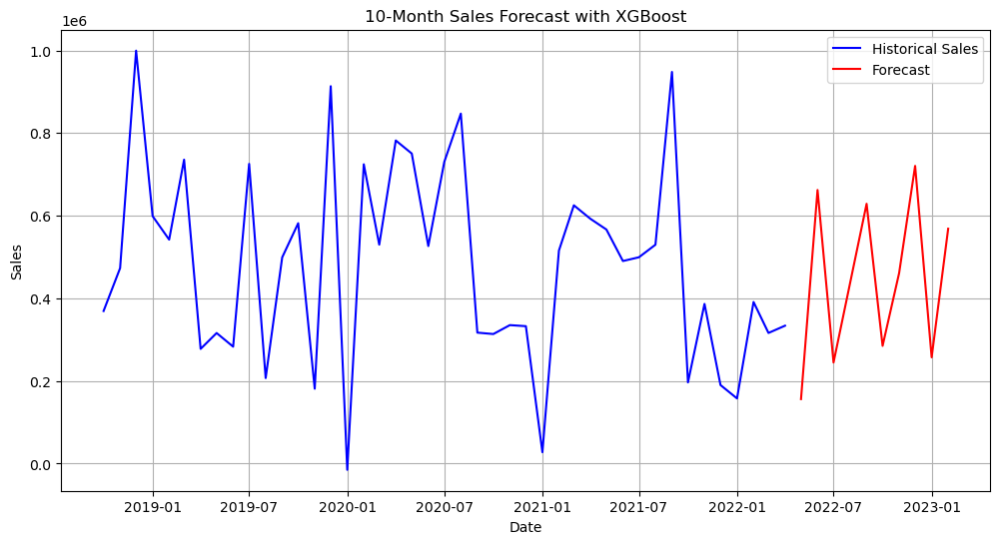

/var/folders/z6/_vn8cndd4x5dmx2cpjfdkjdr0000gn/T/ipykernel_48953/4282939919.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_set_6["Sales_EUR"] = results["yhat"]


,Mapped_GCK,Sales_EUR
Month Year,,
2022-05-01,#6,156040.343750
2022-06-01,#6,662193.812500
2022-07-01,#6,244688.343750
2022-08-01,#6,436723.718750
2022-09-01,#6,628809.187500
2022-10-01,#6,284919.187500
2022-11-01,#6,461098.875000
2022-12-01,#6,720462.687500
2023-01-01,#6,257177.046875


In [52]:
best_model, best_params, best_rmse, best_model_name = select_best_model(
    prophet_best_model_6, prophet_best_params_6, prophet_best_rmse_6, "Prophet",
    xgboost_best_model_6, xgboost_best_params_6, xgboost_best_rmse_6, "XGBoost"
    , sarima_best_model_6, sarima_best_params_6, sarima_best_rmse_6, "SARIMA"
)
print(f"Best Model: {best_model_name}")
print("Best Parameters:", best_params)
print("Best RMSE:", best_rmse)

if best_model_name == "XGBoost":
    results = xgboost_forecast(
        sales_agg6,
        df_market_6,
        period=10,
        params =best_params,
    )
elif best_model_name == "SARIMA":
    results = sarima_forecast(
        sales_agg6,
        period=10,
        params =best_params,
    )
else:
    results = prophet_forecast(
        sales_agg6,
        df_market_6,
        period=10,
        param =best_params,
    )
results.set_index('ds',inplace = True)
test_set_6.set_index('Month Year', inplace = True)
test_set_6["Sales_EUR"] = results["yhat"]
test_set_6

# Product 8

In [53]:
# selecte only the features that are selected in the feature selection step
test_set_8 = test_set[test_set['Mapped_GCK'] == '#8']
df_market_8 = df_market[selected_features_8]
df_market_8.head()

,MAB_ELE_SHP840_lag_6,PRO28392_org_lag_4,MAB_ELE_SHP250_lag_3,MAB_ELE_SHP250_lag_4,WKLWEUR840_org_lag_1,MAB_ELE_SHP392_lag_1,PRO27826_org_lag_3,PRO27392_org_lag_4
date,,,,,,,,
2004-02-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2004-03-01,NaN,NaN,NaN,NaN,1.2646,110.495272,NaN,NaN
2004-04-01,NaN,NaN,NaN,NaN,1.2262,144.686166,NaN,NaN
2004-05-01,NaN,NaN,83.458866,NaN,1.1985,102.655769,120.706516,NaN
2004-06-01,NaN,110.890034,106.168192,83.458866,1.2007,100.305285,138.309550,106.161262


## Xgboost

In [54]:
X_train, X_val, y_train, y_val = train_val_split(sales_agg8, df_market_8, train_size = 0.8)

X_val.info() 

xgboost_best_model_8, xgboost_best_params_8, xgboost_best_rmse_8 = model_evaluation_XGboost(X_train,
                                                                                             y_train, 
                                                                                             X_val, y_val, 
                                                                                             xgboost_param_grid)

print("Best Params:", xgboost_best_params_8)
print("Validation RMSE:", xgboost_best_rmse_8)

<class 'pandas.core.frame.DataFrame'>
Index: 9 entries, 2021-08-01 to 2022-04-01
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   MAB_ELE_SHP840_lag_6  9 non-null      float64
 1   PRO28392_org_lag_4    9 non-null      float64
 2   MAB_ELE_SHP250_lag_3  9 non-null      float64
 3   MAB_ELE_SHP250_lag_4  9 non-null      float64
 4   WKLWEUR840_org_lag_1  9 non-null      float64
 5   MAB_ELE_SHP392_lag_1  9 non-null      float64
 6   PRO27826_org_lag_3    9 non-null      float64
 7   PRO27392_org_lag_4    9 non-null      float64
dtypes: float64(8)
memory usage: 648.0+ bytes
Params: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.01, 'subsample': 0.5, 'colsample_bytree': 0.5, 'gamma': 0, 'reg_alpha': 0, 'reg_lambda': 0} => RMSE: 731098.1868, Relative RMSE: 0.5743
Params: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.01, 'subsample': 0.5, 'colsample_bytree': 0.5, 'gamma': 0, 'reg_alp

## Prophet

In [55]:
prophet_best_model_8, prophet_best_params_8, prophet_best_rmse_8 = model_evaluation_prophet(X_train,
                                                                                             y_train, 
                                                                                             X_val, 
                                                                                             y_val, 
                                                                                             prophet_param_grid)

print("Best Params:", prophet_best_params_8)

print("Validation RMSE:", prophet_best_rmse_8)

01:24:43 - cmdstanpy - INFO - Chain [1] start processing
01:24:44 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 517706.6094, Relative RMSE: 0.4066


01:24:44 - cmdstanpy - INFO - Chain [1] start processing
01:24:44 - cmdstanpy - INFO - Chain [1] done processing
01:24:44 - cmdstanpy - INFO - Chain [1] start processing
01:24:44 - cmdstanpy - INFO - Chain [1] done processing
01:24:44 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 517709.6299, Relative RMSE: 0.4066
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 517700.3382, Relative RMSE: 0.4066


01:24:44 - cmdstanpy - INFO - Chain [1] done processing
01:24:44 - cmdstanpy - INFO - Chain [1] start processing
01:24:44 - cmdstanpy - INFO - Chain [1] done processing
01:24:44 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 526756.0803, Relative RMSE: 0.4137
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 526781.4415, Relative RMSE: 0.4138


01:24:44 - cmdstanpy - INFO - Chain [1] done processing
01:24:44 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 526751.9791, Relative RMSE: 0.4137


01:24:45 - cmdstanpy - INFO - Chain [1] done processing
01:24:45 - cmdstanpy - INFO - Chain [1] start processing
01:24:45 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 526799.2881, Relative RMSE: 0.4138


01:24:45 - cmdstanpy - INFO - Chain [1] start processing
01:24:45 - cmdstanpy - INFO - Chain [1] done processing
01:24:45 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 526624.5882, Relative RMSE: 0.4136
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 527729.6537, Relative RMSE: 0.4145


01:24:45 - cmdstanpy - INFO - Chain [1] done processing
01:24:45 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 489051.6235, Relative RMSE: 0.3841


01:24:46 - cmdstanpy - INFO - Chain [1] done processing
01:24:46 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 488859.5057, Relative RMSE: 0.3840


01:24:46 - cmdstanpy - INFO - Chain [1] done processing
01:24:46 - cmdstanpy - INFO - Chain [1] start processing
01:24:46 - cmdstanpy - INFO - Chain [1] done processing
01:24:46 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 487202.2607, Relative RMSE: 0.3827
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 546442.3253, Relative RMSE: 0.4292


01:24:46 - cmdstanpy - INFO - Chain [1] done processing
01:24:46 - cmdstanpy - INFO - Chain [1] start processing
01:24:46 - cmdstanpy - INFO - Chain [1] done processing
01:24:46 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 546437.7272, Relative RMSE: 0.4292
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 546472.0370, Relative RMSE: 0.4292


01:24:46 - cmdstanpy - INFO - Chain [1] done processing
01:24:47 - cmdstanpy - INFO - Chain [1] start processing
01:24:47 - cmdstanpy - INFO - Chain [1] done processing
01:24:47 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 544970.9746, Relative RMSE: 0.4281
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 544986.0002, Relative RMSE: 0.4281


01:24:47 - cmdstanpy - INFO - Chain [1] done processing
01:24:47 - cmdstanpy - INFO - Chain [1] start processing
01:24:47 - cmdstanpy - INFO - Chain [1] done processing
01:24:47 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 544982.1078, Relative RMSE: 0.4281
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 540498.3633, Relative RMSE: 0.4245


01:24:47 - cmdstanpy - INFO - Chain [1] done processing
01:24:47 - cmdstanpy - INFO - Chain [1] start processing
01:24:47 - cmdstanpy - INFO - Chain [1] done processing
01:24:47 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 540546.4689, Relative RMSE: 0.4246
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 540539.6941, Relative RMSE: 0.4246


01:24:47 - cmdstanpy - INFO - Chain [1] done processing
01:24:48 - cmdstanpy - INFO - Chain [1] start processing
01:24:48 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 483604.1636, Relative RMSE: 0.3799
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 483519.6482, Relative RMSE: 0.3798


01:24:48 - cmdstanpy - INFO - Chain [1] start processing
01:24:48 - cmdstanpy - INFO - Chain [1] done processing
01:24:48 - cmdstanpy - INFO - Chain [1] start processing
01:24:48 - cmdstanpy - INFO - Chain [1] done processing
01:24:48 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 483605.3037, Relative RMSE: 0.3799
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 555987.8674, Relative RMSE: 0.4367


01:24:48 - cmdstanpy - INFO - Chain [1] done processing
01:24:48 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 555967.9923, Relative RMSE: 0.4367


01:24:49 - cmdstanpy - INFO - Chain [1] done processing
01:24:49 - cmdstanpy - INFO - Chain [1] start processing
01:24:49 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 556177.8050, Relative RMSE: 0.4369


01:24:49 - cmdstanpy - INFO - Chain [1] start processing
01:24:49 - cmdstanpy - INFO - Chain [1] done processing
01:24:49 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 564449.1822, Relative RMSE: 0.4434
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 563713.7878, Relative RMSE: 0.4428


01:24:49 - cmdstanpy - INFO - Chain [1] done processing
01:24:49 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 563703.9298, Relative RMSE: 0.4428


01:24:49 - cmdstanpy - INFO - Chain [1] done processing
01:24:49 - cmdstanpy - INFO - Chain [1] start processing
01:24:50 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 612468.4028, Relative RMSE: 0.4811


01:24:50 - cmdstanpy - INFO - Chain [1] start processing
01:24:50 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 626625.2662, Relative RMSE: 0.4922
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 626717.4030, Relative RMSE: 0.4923


01:24:50 - cmdstanpy - INFO - Chain [1] start processing
01:24:51 - cmdstanpy - INFO - Chain [1] done processing
01:24:51 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 601294.6993, Relative RMSE: 0.4723


01:24:51 - cmdstanpy - INFO - Chain [1] done processing
01:24:51 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 632759.8942, Relative RMSE: 0.4970


01:24:52 - cmdstanpy - INFO - Chain [1] done processing
01:24:52 - cmdstanpy - INFO - Chain [1] start processing
01:24:52 - cmdstanpy - INFO - Chain [1] done processing
01:24:52 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 650616.4476, Relative RMSE: 0.5110
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 597099.0198, Relative RMSE: 0.4690


01:24:52 - cmdstanpy - INFO - Chain [1] done processing
01:24:52 - cmdstanpy - INFO - Chain [1] start processing
01:24:52 - cmdstanpy - INFO - Chain [1] done processing
01:24:52 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 597099.2975, Relative RMSE: 0.4690
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 597157.2946, Relative RMSE: 0.4690


01:24:52 - cmdstanpy - INFO - Chain [1] done processing
01:24:52 - cmdstanpy - INFO - Chain [1] start processing
01:24:53 - cmdstanpy - INFO - Chain [1] done processing
01:24:53 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 599124.0173, Relative RMSE: 0.4706
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 601830.2417, Relative RMSE: 0.4727


01:24:53 - cmdstanpy - INFO - Chain [1] done processing
01:24:53 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 598745.0529, Relative RMSE: 0.4703


01:24:53 - cmdstanpy - INFO - Chain [1] done processing
01:24:53 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 687337.0113, Relative RMSE: 0.5399


01:24:53 - cmdstanpy - INFO - Chain [1] done processing
01:24:53 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 654160.8548, Relative RMSE: 0.5138


01:24:54 - cmdstanpy - INFO - Chain [1] done processing
01:24:54 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 653952.5233, Relative RMSE: 0.5137


01:24:54 - cmdstanpy - INFO - Chain [1] done processing
01:24:54 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 667769.5510, Relative RMSE: 0.5245


01:24:54 - cmdstanpy - INFO - Chain [1] done processing
01:24:54 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 628918.5989, Relative RMSE: 0.4940


01:24:55 - cmdstanpy - INFO - Chain [1] done processing
01:24:55 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 635053.8490, Relative RMSE: 0.4988


01:24:55 - cmdstanpy - INFO - Chain [1] done processing
01:24:55 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 516179.6306, Relative RMSE: 0.4054


01:24:56 - cmdstanpy - INFO - Chain [1] done processing
01:24:56 - cmdstanpy - INFO - Chain [1] start processing
01:24:56 - cmdstanpy - INFO - Chain [1] done processing
01:24:56 - cmdstanpy - INFO - Chain [1] start processing
01:24:56 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 515163.4347, Relative RMSE: 0.4046
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 518000.2981, Relative RMSE: 0.4069


01:24:56 - cmdstanpy - INFO - Chain [1] start processing
01:24:56 - cmdstanpy - INFO - Chain [1] done processing
01:24:56 - cmdstanpy - INFO - Chain [1] start processing
01:24:56 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 526179.6274, Relative RMSE: 0.4133
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 526218.5970, Relative RMSE: 0.4133
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 524970.1737, Relative RMSE: 0.4123


01:24:56 - cmdstanpy - INFO - Chain [1] start processing
01:24:56 - cmdstanpy - INFO - Chain [1] done processing
01:24:56 - cmdstanpy - INFO - Chain [1] start processing
01:24:56 - cmdstanpy - INFO - Chain [1] done processing
01:24:56 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 524517.2068, Relative RMSE: 0.4120
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 524661.2476, Relative RMSE: 0.4121


01:24:56 - cmdstanpy - INFO - Chain [1] done processing
01:24:56 - cmdstanpy - INFO - Chain [1] start processing
01:24:56 - cmdstanpy - INFO - Chain [1] done processing
01:24:57 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 523301.8297, Relative RMSE: 0.4110
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 490113.1897, Relative RMSE: 0.3850


01:24:57 - cmdstanpy - INFO - Chain [1] done processing
01:24:57 - cmdstanpy - INFO - Chain [1] start processing
01:24:57 - cmdstanpy - INFO - Chain [1] done processing
01:24:57 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 490204.0346, Relative RMSE: 0.3850
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 489982.4417, Relative RMSE: 0.3849


01:24:57 - cmdstanpy - INFO - Chain [1] done processing
01:24:57 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 516179.6306, Relative RMSE: 0.4054


01:24:58 - cmdstanpy - INFO - Chain [1] done processing
01:24:58 - cmdstanpy - INFO - Chain [1] start processing
01:24:58 - cmdstanpy - INFO - Chain [1] done processing
01:24:58 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 515163.4347, Relative RMSE: 0.4046
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 518000.2981, Relative RMSE: 0.4069


01:24:58 - cmdstanpy - INFO - Chain [1] done processing
01:24:58 - cmdstanpy - INFO - Chain [1] start processing
01:24:58 - cmdstanpy - INFO - Chain [1] done processing
01:24:58 - cmdstanpy - INFO - Chain [1] start processing
01:24:58 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 526179.6274, Relative RMSE: 0.4133
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 526218.5970, Relative RMSE: 0.4133
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 524970.1737, Relative RMSE: 0.4123


01:24:58 - cmdstanpy - INFO - Chain [1] start processing
01:24:58 - cmdstanpy - INFO - Chain [1] done processing
01:24:58 - cmdstanpy - INFO - Chain [1] start processing
01:24:58 - cmdstanpy - INFO - Chain [1] done processing
01:24:58 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 524517.2068, Relative RMSE: 0.4120
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 524661.2476, Relative RMSE: 0.4121


01:24:58 - cmdstanpy - INFO - Chain [1] done processing
01:24:59 - cmdstanpy - INFO - Chain [1] start processing
01:24:59 - cmdstanpy - INFO - Chain [1] done processing
01:24:59 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 523301.8297, Relative RMSE: 0.4110
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 490113.1897, Relative RMSE: 0.3850


01:24:59 - cmdstanpy - INFO - Chain [1] done processing
01:24:59 - cmdstanpy - INFO - Chain [1] start processing
01:24:59 - cmdstanpy - INFO - Chain [1] done processing
01:24:59 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 490204.0346, Relative RMSE: 0.3850
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 489982.4417, Relative RMSE: 0.3849


01:25:00 - cmdstanpy - INFO - Chain [1] done processing
01:25:00 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 516179.6306, Relative RMSE: 0.4054


01:25:00 - cmdstanpy - INFO - Chain [1] done processing
01:25:00 - cmdstanpy - INFO - Chain [1] start processing
01:25:00 - cmdstanpy - INFO - Chain [1] done processing
01:25:00 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 515163.4347, Relative RMSE: 0.4046
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 518000.2981, Relative RMSE: 0.4069


01:25:00 - cmdstanpy - INFO - Chain [1] done processing
01:25:00 - cmdstanpy - INFO - Chain [1] start processing
01:25:00 - cmdstanpy - INFO - Chain [1] done processing
01:25:00 - cmdstanpy - INFO - Chain [1] start processing
01:25:00 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 526179.6274, Relative RMSE: 0.4133
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 526218.5970, Relative RMSE: 0.4133
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 524970.1737, Relative RMSE: 0.4123


01:25:00 - cmdstanpy - INFO - Chain [1] start processing
01:25:00 - cmdstanpy - INFO - Chain [1] done processing
01:25:00 - cmdstanpy - INFO - Chain [1] start processing
01:25:00 - cmdstanpy - INFO - Chain [1] done processing
01:25:01 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 524517.2068, Relative RMSE: 0.4120
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 524661.2476, Relative RMSE: 0.4121


01:25:01 - cmdstanpy - INFO - Chain [1] done processing
01:25:01 - cmdstanpy - INFO - Chain [1] start processing
01:25:01 - cmdstanpy - INFO - Chain [1] done processing
01:25:01 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 523301.8297, Relative RMSE: 0.4110
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 490113.1897, Relative RMSE: 0.3850


01:25:01 - cmdstanpy - INFO - Chain [1] done processing
01:25:01 - cmdstanpy - INFO - Chain [1] start processing
01:25:01 - cmdstanpy - INFO - Chain [1] done processing
01:25:01 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 490204.0346, Relative RMSE: 0.3850
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 489982.4417, Relative RMSE: 0.3849


01:25:02 - cmdstanpy - INFO - Chain [1] done processing
01:25:02 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 516179.6306, Relative RMSE: 0.4054


01:25:02 - cmdstanpy - INFO - Chain [1] done processing
01:25:02 - cmdstanpy - INFO - Chain [1] start processing
01:25:02 - cmdstanpy - INFO - Chain [1] done processing
01:25:02 - cmdstanpy - INFO - Chain [1] start processing
01:25:02 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 515163.4347, Relative RMSE: 0.4046
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 518000.2981, Relative RMSE: 0.4069


01:25:02 - cmdstanpy - INFO - Chain [1] start processing
01:25:02 - cmdstanpy - INFO - Chain [1] done processing
01:25:02 - cmdstanpy - INFO - Chain [1] start processing
01:25:02 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 526179.6274, Relative RMSE: 0.4133
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 526218.5970, Relative RMSE: 0.4133
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 524970.1737, Relative RMSE: 0.4123


01:25:02 - cmdstanpy - INFO - Chain [1] start processing
01:25:02 - cmdstanpy - INFO - Chain [1] done processing
01:25:03 - cmdstanpy - INFO - Chain [1] start processing
01:25:03 - cmdstanpy - INFO - Chain [1] done processing
01:25:03 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 524517.2068, Relative RMSE: 0.4120
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 524661.2476, Relative RMSE: 0.4121


01:25:03 - cmdstanpy - INFO - Chain [1] done processing
01:25:03 - cmdstanpy - INFO - Chain [1] start processing
01:25:03 - cmdstanpy - INFO - Chain [1] done processing
01:25:03 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 523301.8297, Relative RMSE: 0.4110
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 490113.1897, Relative RMSE: 0.3850


01:25:03 - cmdstanpy - INFO - Chain [1] done processing
01:25:03 - cmdstanpy - INFO - Chain [1] start processing
01:25:03 - cmdstanpy - INFO - Chain [1] done processing
01:25:03 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 490204.0346, Relative RMSE: 0.3850
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 489982.4417, Relative RMSE: 0.3849


01:25:04 - cmdstanpy - INFO - Chain [1] done processing
01:25:04 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 513622.5766, Relative RMSE: 0.4034


01:25:04 - cmdstanpy - INFO - Chain [1] done processing
01:25:04 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 514365.8528, Relative RMSE: 0.4040


01:25:04 - cmdstanpy - INFO - Chain [1] done processing
01:25:04 - cmdstanpy - INFO - Chain [1] start processing
01:25:04 - cmdstanpy - INFO - Chain [1] done processing
01:25:04 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 513656.9200, Relative RMSE: 0.4035
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 525376.1397, Relative RMSE: 0.4127


01:25:04 - cmdstanpy - INFO - Chain [1] done processing
01:25:05 - cmdstanpy - INFO - Chain [1] start processing
01:25:05 - cmdstanpy - INFO - Chain [1] done processing
01:25:05 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 525246.7006, Relative RMSE: 0.4126
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 524140.7015, Relative RMSE: 0.4117


01:25:05 - cmdstanpy - INFO - Chain [1] done processing
01:25:05 - cmdstanpy - INFO - Chain [1] start processing
01:25:05 - cmdstanpy - INFO - Chain [1] done processing
01:25:05 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 522061.2569, Relative RMSE: 0.4101
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 524096.2397, Relative RMSE: 0.4117


01:25:05 - cmdstanpy - INFO - Chain [1] done processing
01:25:05 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 524046.4172, Relative RMSE: 0.4116


01:25:05 - cmdstanpy - INFO - Chain [1] done processing
01:25:05 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 487741.0692, Relative RMSE: 0.3831


01:25:06 - cmdstanpy - INFO - Chain [1] done processing
01:25:06 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 489316.8520, Relative RMSE: 0.3843


01:25:06 - cmdstanpy - INFO - Chain [1] done processing
01:25:06 - cmdstanpy - INFO - Chain [1] start processing
01:25:06 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 489313.0087, Relative RMSE: 0.3843


01:25:06 - cmdstanpy - INFO - Chain [1] start processing
01:25:06 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 516970.8198, Relative RMSE: 0.4061


01:25:06 - cmdstanpy - INFO - Chain [1] start processing
01:25:07 - cmdstanpy - INFO - Chain [1] done processing
01:25:07 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 516964.3122, Relative RMSE: 0.4061
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 516882.8813, Relative RMSE: 0.4060


01:25:07 - cmdstanpy - INFO - Chain [1] done processing
01:25:07 - cmdstanpy - INFO - Chain [1] start processing
01:25:07 - cmdstanpy - INFO - Chain [1] done processing
01:25:07 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 515821.0728, Relative RMSE: 0.4052
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 516083.3735, Relative RMSE: 0.4054


01:25:07 - cmdstanpy - INFO - Chain [1] done processing
01:25:07 - cmdstanpy - INFO - Chain [1] start processing
01:25:07 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 515457.9993, Relative RMSE: 0.4049


01:25:07 - cmdstanpy - INFO - Chain [1] start processing
01:25:07 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 514619.1145, Relative RMSE: 0.4042


01:25:08 - cmdstanpy - INFO - Chain [1] start processing
01:25:08 - cmdstanpy - INFO - Chain [1] done processing
01:25:08 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 514543.1628, Relative RMSE: 0.4042
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 514828.6861, Relative RMSE: 0.4044


01:25:08 - cmdstanpy - INFO - Chain [1] done processing
01:25:08 - cmdstanpy - INFO - Chain [1] start processing
01:25:08 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 475225.6955, Relative RMSE: 0.3733


01:25:08 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 475149.4700, Relative RMSE: 0.3732


01:25:08 - cmdstanpy - INFO - Chain [1] done processing
01:25:09 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 475178.2561, Relative RMSE: 0.3732


01:25:09 - cmdstanpy - INFO - Chain [1] done processing
01:25:09 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 487215.0898, Relative RMSE: 0.3827


01:25:10 - cmdstanpy - INFO - Chain [1] done processing
01:25:10 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 485026.8690, Relative RMSE: 0.3810


01:25:11 - cmdstanpy - INFO - Chain [1] done processing
01:25:11 - cmdstanpy - INFO - Chain [1] start processing
01:25:11 - cmdstanpy - INFO - Chain [1] done processing
01:25:11 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 489589.5080, Relative RMSE: 0.3846
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 475263.8161, Relative RMSE: 0.3733


01:25:11 - cmdstanpy - INFO - Chain [1] done processing
01:25:11 - cmdstanpy - INFO - Chain [1] start processing
01:25:11 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 475613.0732, Relative RMSE: 0.3736


01:25:11 - cmdstanpy - INFO - Chain [1] start processing
01:25:12 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 475611.9047, Relative RMSE: 0.3736


01:25:12 - cmdstanpy - INFO - Chain [1] start processing
01:25:12 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 479549.4108, Relative RMSE: 0.3767
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 479623.5017, Relative RMSE: 0.3767


01:25:12 - cmdstanpy - INFO - Chain [1] start processing
01:25:12 - cmdstanpy - INFO - Chain [1] done processing
01:25:12 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 479637.8313, Relative RMSE: 0.3767


01:25:12 - cmdstanpy - INFO - Chain [1] done processing
01:25:12 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 484349.6576, Relative RMSE: 0.3804


01:25:12 - cmdstanpy - INFO - Chain [1] done processing
01:25:12 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 478793.1378, Relative RMSE: 0.3761


01:25:13 - cmdstanpy - INFO - Chain [1] done processing
01:25:13 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 483226.8486, Relative RMSE: 0.3796


01:25:13 - cmdstanpy - INFO - Chain [1] done processing
01:25:13 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 524256.1698, Relative RMSE: 0.4118


01:25:13 - cmdstanpy - INFO - Chain [1] done processing
01:25:13 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 524102.2624, Relative RMSE: 0.4117


01:25:14 - cmdstanpy - INFO - Chain [1] done processing
01:25:14 - cmdstanpy - INFO - Chain [1] start processing
01:25:14 - cmdstanpy - INFO - Chain [1] done processing
01:25:14 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 524369.1544, Relative RMSE: 0.4119
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 521067.6413, Relative RMSE: 0.4093


01:25:14 - cmdstanpy - INFO - Chain [1] done processing
01:25:14 - cmdstanpy - INFO - Chain [1] start processing
01:25:14 - cmdstanpy - INFO - Chain [1] done processing
01:25:14 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 521768.8372, Relative RMSE: 0.4098
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 521457.2991, Relative RMSE: 0.4096


01:25:14 - cmdstanpy - INFO - Chain [1] done processing
01:25:14 - cmdstanpy - INFO - Chain [1] start processing
01:25:15 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 551471.0193, Relative RMSE: 0.4332


01:25:15 - cmdstanpy - INFO - Chain [1] start processing
01:25:15 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 551405.8491, Relative RMSE: 0.4331


01:25:15 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 551276.2415, Relative RMSE: 0.4330


01:25:15 - cmdstanpy - INFO - Chain [1] done processing
01:25:15 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 574122.2569, Relative RMSE: 0.4510


01:25:16 - cmdstanpy - INFO - Chain [1] done processing
01:25:16 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 572794.2277, Relative RMSE: 0.4499


01:25:16 - cmdstanpy - INFO - Chain [1] done processing
01:25:16 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 568986.7787, Relative RMSE: 0.4469


01:25:17 - cmdstanpy - INFO - Chain [1] done processing
01:25:17 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 516179.6306, Relative RMSE: 0.4054


01:25:17 - cmdstanpy - INFO - Chain [1] done processing
01:25:17 - cmdstanpy - INFO - Chain [1] start processing
01:25:17 - cmdstanpy - INFO - Chain [1] done processing
01:25:17 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 515163.4347, Relative RMSE: 0.4046
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 518000.2981, Relative RMSE: 0.4069


01:25:17 - cmdstanpy - INFO - Chain [1] done processing
01:25:17 - cmdstanpy - INFO - Chain [1] start processing
01:25:17 - cmdstanpy - INFO - Chain [1] done processing
01:25:17 - cmdstanpy - INFO - Chain [1] start processing
01:25:17 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 526179.6274, Relative RMSE: 0.4133
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 526218.5970, Relative RMSE: 0.4133
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 524970.1737, Relative RMSE: 0.4123


01:25:17 - cmdstanpy - INFO - Chain [1] start processing
01:25:17 - cmdstanpy - INFO - Chain [1] done processing
01:25:17 - cmdstanpy - INFO - Chain [1] start processing
01:25:18 - cmdstanpy - INFO - Chain [1] done processing
01:25:18 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 524517.2068, Relative RMSE: 0.4120
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 524661.2476, Relative RMSE: 0.4121


01:25:18 - cmdstanpy - INFO - Chain [1] done processing
01:25:18 - cmdstanpy - INFO - Chain [1] start processing
01:25:18 - cmdstanpy - INFO - Chain [1] done processing
01:25:18 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 523301.8297, Relative RMSE: 0.4110
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 490113.1897, Relative RMSE: 0.3850


01:25:18 - cmdstanpy - INFO - Chain [1] done processing
01:25:18 - cmdstanpy - INFO - Chain [1] start processing
01:25:18 - cmdstanpy - INFO - Chain [1] done processing
01:25:18 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 490204.0346, Relative RMSE: 0.3850
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 489982.4417, Relative RMSE: 0.3849


01:25:19 - cmdstanpy - INFO - Chain [1] done processing
01:25:19 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 516179.6306, Relative RMSE: 0.4054


01:25:19 - cmdstanpy - INFO - Chain [1] done processing
01:25:19 - cmdstanpy - INFO - Chain [1] start processing
01:25:19 - cmdstanpy - INFO - Chain [1] done processing
01:25:19 - cmdstanpy - INFO - Chain [1] start processing
01:25:19 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 515163.4347, Relative RMSE: 0.4046
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 518000.2981, Relative RMSE: 0.4069


01:25:19 - cmdstanpy - INFO - Chain [1] start processing
01:25:19 - cmdstanpy - INFO - Chain [1] done processing
01:25:19 - cmdstanpy - INFO - Chain [1] start processing
01:25:19 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 526179.6274, Relative RMSE: 0.4133
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 526218.5970, Relative RMSE: 0.4133
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 524970.1737, Relative RMSE: 0.4123


01:25:19 - cmdstanpy - INFO - Chain [1] start processing
01:25:20 - cmdstanpy - INFO - Chain [1] done processing
01:25:20 - cmdstanpy - INFO - Chain [1] start processing
01:25:20 - cmdstanpy - INFO - Chain [1] done processing
01:25:20 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 524517.2068, Relative RMSE: 0.4120
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 524661.2476, Relative RMSE: 0.4121


01:25:20 - cmdstanpy - INFO - Chain [1] done processing
01:25:20 - cmdstanpy - INFO - Chain [1] start processing
01:25:20 - cmdstanpy - INFO - Chain [1] done processing
01:25:20 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 523301.8297, Relative RMSE: 0.4110
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 490113.1897, Relative RMSE: 0.3850


01:25:20 - cmdstanpy - INFO - Chain [1] done processing
01:25:20 - cmdstanpy - INFO - Chain [1] start processing
01:25:20 - cmdstanpy - INFO - Chain [1] done processing
01:25:20 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 490204.0346, Relative RMSE: 0.3850
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 489982.4417, Relative RMSE: 0.3849


01:25:21 - cmdstanpy - INFO - Chain [1] done processing
01:25:21 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 516179.6306, Relative RMSE: 0.4054


01:25:21 - cmdstanpy - INFO - Chain [1] done processing
01:25:21 - cmdstanpy - INFO - Chain [1] start processing
01:25:21 - cmdstanpy - INFO - Chain [1] done processing
01:25:21 - cmdstanpy - INFO - Chain [1] start processing
01:25:21 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 515163.4347, Relative RMSE: 0.4046
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 518000.2981, Relative RMSE: 0.4069


01:25:21 - cmdstanpy - INFO - Chain [1] start processing
01:25:22 - cmdstanpy - INFO - Chain [1] done processing
01:25:22 - cmdstanpy - INFO - Chain [1] start processing
01:25:22 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 526179.6274, Relative RMSE: 0.4133
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 526218.5970, Relative RMSE: 0.4133
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 524970.1737, Relative RMSE: 0.4123


01:25:22 - cmdstanpy - INFO - Chain [1] start processing
01:25:22 - cmdstanpy - INFO - Chain [1] done processing
01:25:22 - cmdstanpy - INFO - Chain [1] start processing
01:25:22 - cmdstanpy - INFO - Chain [1] done processing
01:25:22 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 524517.2068, Relative RMSE: 0.4120
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 524661.2476, Relative RMSE: 0.4121


01:25:22 - cmdstanpy - INFO - Chain [1] done processing
01:25:22 - cmdstanpy - INFO - Chain [1] start processing
01:25:22 - cmdstanpy - INFO - Chain [1] done processing
01:25:22 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 523301.8297, Relative RMSE: 0.4110
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 490113.1897, Relative RMSE: 0.3850


01:25:22 - cmdstanpy - INFO - Chain [1] done processing
01:25:22 - cmdstanpy - INFO - Chain [1] start processing
01:25:22 - cmdstanpy - INFO - Chain [1] done processing
01:25:23 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 490204.0346, Relative RMSE: 0.3850
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 489982.4417, Relative RMSE: 0.3849


01:25:23 - cmdstanpy - INFO - Chain [1] done processing
01:25:23 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 516179.6306, Relative RMSE: 0.4054


01:25:23 - cmdstanpy - INFO - Chain [1] done processing
01:25:23 - cmdstanpy - INFO - Chain [1] start processing
01:25:23 - cmdstanpy - INFO - Chain [1] done processing
01:25:23 - cmdstanpy - INFO - Chain [1] start processing
01:25:24 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 515163.4347, Relative RMSE: 0.4046
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 518000.2981, Relative RMSE: 0.4069


01:25:24 - cmdstanpy - INFO - Chain [1] start processing
01:25:24 - cmdstanpy - INFO - Chain [1] done processing
01:25:24 - cmdstanpy - INFO - Chain [1] start processing
01:25:24 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 526179.6274, Relative RMSE: 0.4133
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 526218.5970, Relative RMSE: 0.4133
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 524970.1737, Relative RMSE: 0.4123


01:25:24 - cmdstanpy - INFO - Chain [1] start processing
01:25:24 - cmdstanpy - INFO - Chain [1] done processing
01:25:24 - cmdstanpy - INFO - Chain [1] start processing
01:25:24 - cmdstanpy - INFO - Chain [1] done processing
01:25:24 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 524517.2068, Relative RMSE: 0.4120
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 524661.2476, Relative RMSE: 0.4121


01:25:24 - cmdstanpy - INFO - Chain [1] done processing
01:25:24 - cmdstanpy - INFO - Chain [1] start processing
01:25:24 - cmdstanpy - INFO - Chain [1] done processing
01:25:24 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 523301.8297, Relative RMSE: 0.4110
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 490113.1897, Relative RMSE: 0.3850


01:25:24 - cmdstanpy - INFO - Chain [1] done processing
01:25:25 - cmdstanpy - INFO - Chain [1] start processing
01:25:25 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 490204.0346, Relative RMSE: 0.3850
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 489982.4417, Relative RMSE: 0.3849
Best Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9}
Validation RMSE: 475149.46996995545


## Sarima

In [56]:
sarima_best_model_8, sarima_best_params_8, sarima_best_rmse_8 = model_evaluation_SARIMA(y_train, 
                                                             y_val, 
                                                             sarima_param_grid)

print("Best Params:", sarima_best_params_8)
print("Validation RMSE:", sarima_best_rmse_8)

SARIMA(0,0,0) x (0,0,0,6) => RMSE: 1351552.6729, Relative RMSE: 1.0616
SARIMA(0,0,0) x (0,0,0,12) => RMSE: 1351552.6729, Relative RMSE: 1.0616


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,0,0) x (0,0,1,6) => RMSE: 1197194.6350, Relative RMSE: 0.9404
SARIMA(0,0,0) x (0,0,1,12) => RMSE: 859719.5695, Relative RMSE: 0.6753
SARIMA(0,0,0) x (0,1,0,6) => RMSE: 610048.2992, Relative RMSE: 0.4792
SARIMA(0,0,0) x (0,1,0,12) => RMSE: 537854.1034, Relative RMSE: 0.4225
SARIMA(0,0,0) x (0,1,1,6) => RMSE: 561032.1140, Relative RMSE: 0.4407
SARIMA(0,0,0) x (0,1,1,12) => RMSE: 537785.0132, Relative RMSE: 0.4224
SARIMA(0,0,0) x (1,0,0,6) => RMSE: 626150.5708, Relative RMSE: 0.4918
SARIMA(0,0,0) x (1,0,0,12) => RMSE: 506736.7462, Relative RMSE: 0.3980
SARIMA(0,0,0) x (1,0,1,6) => RMSE: 484939.4645, Relative RMSE: 0.3809
SARIMA(0,0,0) x (1,0,1,12) => RMSE: 505845.1053, Relative RMSE: 0.3973
SARIMA(0,0,0) x (1,1,0,6) => RMSE: 527534.0019, Relative RMSE: 0.4144
SARIMA(0,0,0) x (1,1,0,12) => RMSE: 573915.1947, Relative RMSE: 0.4508
SARIMA(0,0,0) x (1,1,1,6) => RMSE: 502091.3518, Relative RMSE: 0.3944


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,0) x (1,1,1,12) => RMSE: 306308416.2041, Relative RMSE: 240.5944
SARIMA(0,0,1) x (0,0,0,6) => RMSE: 1323541.8757, Relative RMSE: 1.0396
SARIMA(0,0,1) x (0,0,0,12) => RMSE: 1323541.8757, Relative RMSE: 1.0396
SARIMA(0,0,1) x (0,0,1,6) => RMSE: 1145879.4355, Relative RMSE: 0.9000
SARIMA(0,0,1) x (0,0,1,12) => RMSE: 860059.8407, Relative RMSE: 0.6755
SARIMA(0,0,1) x (0,1,0,6) => RMSE: 591795.6721, Relative RMSE: 0.4648
SARIMA(0,0,1) x (0,1,0,12) => RMSE: 535788.0760, Relative RMSE: 0.4208
SARIMA(0,0,1) x (0,1,1,6) => RMSE: 563244.2537, Relative RMSE: 0.4424
SARIMA(0,0,1) x (0,1,1,12) => RMSE: 535937.8499, Relative RMSE: 0.4210
SARIMA(0,0,1) x (1,0,0,6) => RMSE: 607046.2380, Relative RMSE: 0.4768
SARIMA(0,0,1) x (1,0,0,12) => RMSE: 566191.8582, Relative RMSE: 0.4447
SARIMA(0,0,1) x (1,0,1,6) => RMSE: 464891.5616, Relative RMSE: 0.3652


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,1) x (1,0,1,12) => RMSE: 583095.3601, Relative RMSE: 0.4580
SARIMA(0,0,1) x (1,1,0,6) => RMSE: 534620.2567, Relative RMSE: 0.4199
SARIMA(0,0,1) x (1,1,0,12) => RMSE: 552779.9801, Relative RMSE: 0.4342
SARIMA(0,0,1) x (1,1,1,6) => RMSE: 503458.7066, Relative RMSE: 0.3954
SARIMA(0,0,1) x (1,1,1,12) => RMSE: 724978.0287, Relative RMSE: 0.5694
SARIMA(0,0,2) x (0,0,0,6) => RMSE: 1196637.9661, Relative RMSE: 0.9399
SARIMA(0,0,2) x (0,0,0,12) => RMSE: 1196637.9661, Relative RMSE: 0.9399
SARIMA(0,0,2) x (0,0,1,6) => RMSE: 996572.1450, Relative RMSE: 0.7828


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,2) x (0,0,1,12) => RMSE: 788889.2035, Relative RMSE: 0.6196
SARIMA(0,0,2) x (0,1,0,6) => RMSE: 420732.7603, Relative RMSE: 0.3305
SARIMA(0,0,2) x (0,1,0,12) => RMSE: 495783.8804, Relative RMSE: 0.3894
SARIMA(0,0,2) x (0,1,1,6) => RMSE: 373319.0553, Relative RMSE: 0.2932
SARIMA(0,0,2) x (0,1,1,12) => RMSE: 494730.7177, Relative RMSE: 0.3886
SARIMA(0,0,2) x (1,0,0,6) => RMSE: 470857.0459, Relative RMSE: 0.3698
SARIMA(0,0,2) x (1,0,0,12) => RMSE: 536855.7740, Relative RMSE: 0.4217


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,2) x (1,0,1,6) => RMSE: 413833.7436, Relative RMSE: 0.3251
SARIMA(0,0,2) x (1,0,1,12) => RMSE: 559976.1623, Relative RMSE: 0.4398
SARIMA(0,0,2) x (1,1,0,6) => RMSE: 378915.1120, Relative RMSE: 0.2976
SARIMA(0,0,2) x (1,1,0,12) => RMSE: 731719.9935, Relative RMSE: 0.5747
SARIMA(0,0,2) x (1,1,1,6) => RMSE: 355207.9524, Relative RMSE: 0.2790


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,0,2) x (1,1,1,12) => RMSE: 701464.0602, Relative RMSE: 0.5510
SARIMA(0,1,0) x (0,0,0,6) => RMSE: 458399.7629, Relative RMSE: 0.3601
SARIMA(0,1,0) x (0,0,0,12) => RMSE: 458399.7629, Relative RMSE: 0.3601
SARIMA(0,1,0) x (0,0,1,6) => RMSE: 514536.7199, Relative RMSE: 0.4042
SARIMA(0,1,0) x (0,0,1,12) => RMSE: 489594.1758, Relative RMSE: 0.3846
SARIMA(0,1,0) x (0,1,0,6) => RMSE: 1260960.8414, Relative RMSE: 0.9904
SARIMA(0,1,0) x (0,1,0,12) => RMSE: 486065.1953, Relative RMSE: 0.3818
SARIMA(0,1,0) x (0,1,1,6) => RMSE: 566720.0682, Relative RMSE: 0.4451
SARIMA(0,1,0) x (0,1,1,12) => RMSE: 1213102.2305, Relative RMSE: 0.9528
SARIMA(0,1,0) x (1,0,0,6) => RMSE: 566050.3591, Relative RMSE: 0.4446
SARIMA(0,1,0) x (1,0,0,12) => RMSE: 388275.9276, Relative RMSE: 0.3050
SARIMA(0,1,0) x (1,0,1,6) => RMSE: 561890.9553, Relative RMSE: 0.4413
SARIMA(0,1,0) x (1,0,1,12) => RMSE: 531370.9568, Relative RMSE: 0.4174
SARIMA(0,1,0) x (1,1,0,6) => RMSE: 547558.0584, Relative RMSE: 0.4301
SARIMA(0,1,

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,1) x (0,0,1,6) => RMSE: 539899.0042, Relative RMSE: 0.4241
SARIMA(0,1,1) x (0,0,1,12) => RMSE: 538815.8065, Relative RMSE: 0.4232
SARIMA(0,1,1) x (0,1,0,6) => RMSE: 613155.1619, Relative RMSE: 0.4816
SARIMA(0,1,1) x (0,1,0,12) => RMSE: 440076.5853, Relative RMSE: 0.3457
SARIMA(0,1,1) x (0,1,1,6) => RMSE: 379107.2419, Relative RMSE: 0.2978
SARIMA(0,1,1) x (0,1,1,12) => RMSE: 636197.3732, Relative RMSE: 0.4997
SARIMA(0,1,1) x (1,0,0,6) => RMSE: 501983.4770, Relative RMSE: 0.3943
SARIMA(0,1,1) x (1,0,0,12) => RMSE: 373454.8730, Relative RMSE: 0.2933
SARIMA(0,1,1) x (1,0,1,6) => RMSE: 476182.7693, Relative RMSE: 0.3740


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,1) x (1,0,1,12) => RMSE: 553132.9408, Relative RMSE: 0.4345
SARIMA(0,1,1) x (1,1,0,6) => RMSE: 389720.8845, Relative RMSE: 0.3061
SARIMA(0,1,1) x (1,1,0,12) => RMSE: 282853.3115, Relative RMSE: 0.2222
SARIMA(0,1,1) x (1,1,1,6) => RMSE: 462126.7963, Relative RMSE: 0.3630
SARIMA(0,1,1) x (1,1,1,12) => RMSE: 578827.4673, Relative RMSE: 0.4546
SARIMA(0,1,2) x (0,0,0,6) => RMSE: 495378.1196, Relative RMSE: 0.3891
SARIMA(0,1,2) x (0,0,0,12) => RMSE: 495378.1196, Relative RMSE: 0.3891


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,2) x (0,0,1,6) => RMSE: 494659.5593, Relative RMSE: 0.3885
SARIMA(0,1,2) x (0,0,1,12) => RMSE: 566210.3058, Relative RMSE: 0.4447
SARIMA(0,1,2) x (0,1,0,6) => RMSE: 553335.2401, Relative RMSE: 0.4346
SARIMA(0,1,2) x (0,1,0,12) => RMSE: 416186.1110, Relative RMSE: 0.3269
SARIMA(0,1,2) x (0,1,1,6) => RMSE: 352038.8200, Relative RMSE: 0.2765
SARIMA(0,1,2) x (0,1,1,12) => RMSE: 833986.0605, Relative RMSE: 0.6551
SARIMA(0,1,2) x (1,0,0,6) => RMSE: 471000.8968, Relative RMSE: 0.3700


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,2) x (1,0,0,12) => RMSE: 367125.9399, Relative RMSE: 0.2884
SARIMA(0,1,2) x (1,0,1,6) => RMSE: 357605.0157, Relative RMSE: 0.2809
SARIMA(0,1,2) x (1,0,1,12) => RMSE: 559868.9880, Relative RMSE: 0.4398
SARIMA(0,1,2) x (1,1,0,6) => RMSE: 391637.8671, Relative RMSE: 0.3076
SARIMA(0,1,2) x (1,1,0,12) => RMSE: 329109.1260, Relative RMSE: 0.2585


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,2) x (1,1,1,6) => RMSE: 325664.0307, Relative RMSE: 0.2558
SARIMA(0,1,2) x (1,1,1,12) => RMSE: 453020.6410, Relative RMSE: 0.3558
SARIMA(1,0,0) x (0,0,0,6) => RMSE: 973447.7872, Relative RMSE: 0.7646
SARIMA(1,0,0) x (0,0,0,12) => RMSE: 973447.7872, Relative RMSE: 0.7646
SARIMA(1,0,0) x (0,0,1,6) => RMSE: 920917.8675, Relative RMSE: 0.7233
SARIMA(1,0,0) x (0,0,1,12) => RMSE: 727441.7923, Relative RMSE: 0.5714
SARIMA(1,0,0) x (0,1,0,6) => RMSE: 557198.2104, Relative RMSE: 0.4377
SARIMA(1,0,0) x (0,1,0,12) => RMSE: 528274.1076, Relative RMSE: 0.4149
SARIMA(1,0,0) x (0,1,1,6) => RMSE: 550436.0122, Relative RMSE: 0.4323
SARIMA(1,0,0) x (0,1,1,12) => RMSE: 528736.9963, Relative RMSE: 0.4153
SARIMA(1,0,0) x (1,0,0,6) => RMSE: 469725.6053, Relative RMSE: 0.3690


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,0) x (1,0,0,12) => RMSE: 561265.8179, Relative RMSE: 0.4409
SARIMA(1,0,0) x (1,0,1,6) => RMSE: 365287.8577, Relative RMSE: 0.2869
SARIMA(1,0,0) x (1,0,1,12) => RMSE: 533750.4844, Relative RMSE: 0.4192
SARIMA(1,0,0) x (1,1,0,6) => RMSE: 529105.1559, Relative RMSE: 0.4156
SARIMA(1,0,0) x (1,1,0,12) => RMSE: 694364.5883, Relative RMSE: 0.5454
SARIMA(1,0,0) x (1,1,1,6) => RMSE: 500362.2481, Relative RMSE: 0.3930


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,0) x (1,1,1,12) => RMSE: 10050583.9727, Relative RMSE: 7.8944
SARIMA(1,0,1) x (0,0,0,6) => RMSE: 445372.1376, Relative RMSE: 0.3498
SARIMA(1,0,1) x (0,0,0,12) => RMSE: 445372.1376, Relative RMSE: 0.3498
SARIMA(1,0,1) x (0,0,1,6) => RMSE: 485934.8203, Relative RMSE: 0.3817
SARIMA(1,0,1) x (0,0,1,12) => RMSE: 608862.3779, Relative RMSE: 0.4782
SARIMA(1,0,1) x (0,1,0,6) => RMSE: 525440.2580, Relative RMSE: 0.4127


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,0,1) x (0,1,0,12) => RMSE: 446774.1453, Relative RMSE: 0.3509
SARIMA(1,0,1) x (0,1,1,6) => RMSE: 383594.1634, Relative RMSE: 0.3013
SARIMA(1,0,1) x (0,1,1,12) => RMSE: 801304.7328, Relative RMSE: 0.6294


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,1) x (1,0,0,6) => RMSE: 739046.4818, Relative RMSE: 0.5805
SARIMA(1,0,1) x (1,0,0,12) => RMSE: 672174.5720, Relative RMSE: 0.5280
SARIMA(1,0,1) x (1,0,1,6) => RMSE: 377940.8190, Relative RMSE: 0.2969
SARIMA(1,0,1) x (1,0,1,12) => RMSE: 582706.9000, Relative RMSE: 0.4577


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,1) x (1,1,0,6) => RMSE: 394648.7302, Relative RMSE: 0.3100
SARIMA(1,0,1) x (1,1,0,12) => RMSE: 220861.1466, Relative RMSE: 0.1735
SARIMA(1,0,1) x (1,1,1,6) => RMSE: 484511.4349, Relative RMSE: 0.3806


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,0,1) x (1,1,1,12) => RMSE: 654863.0242, Relative RMSE: 0.5144
SARIMA(1,0,2) x (0,0,0,6) => RMSE: 442129.7712, Relative RMSE: 0.3473
SARIMA(1,0,2) x (0,0,0,12) => RMSE: 442129.7712, Relative RMSE: 0.3473
SARIMA(1,0,2) x (0,0,1,6) => RMSE: 482750.8675, Relative RMSE: 0.3792
SARIMA(1,0,2) x (0,0,1,12) => RMSE: 594075.3012, Relative RMSE: 0.4666
SARIMA(1,0,2) x (0,1,0,6) => RMSE: 471924.4541, Relative RMSE: 0.3707


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,2) x (0,1,0,12) => RMSE: 420291.2570, Relative RMSE: 0.3301
SARIMA(1,0,2) x (0,1,1,6) => RMSE: 373016.1067, Relative RMSE: 0.2930


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1,0,2) x (0,1,1,12) => RMSE: 350045.3695, Relative RMSE: 0.2749
SARIMA(1,0,2) x (1,0,0,6) => RMSE: 451457.8324, Relative RMSE: 0.3546
SARIMA(1,0,2) x (1,0,0,12) => RMSE: 532007.2923, Relative RMSE: 0.4179
SARIMA(1,0,2) x (1,0,1,6) => RMSE: 358438.8841, Relative RMSE: 0.2815


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,2) x (1,0,1,12) => RMSE: 460980.1390, Relative RMSE: 0.3621
SARIMA(1,0,2) x (1,1,0,6) => RMSE: 397170.5664, Relative RMSE: 0.3120
SARIMA(1,0,2) x (1,1,0,12) => RMSE: 263652.0368, Relative RMSE: 0.2071


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,2) x (1,1,1,6) => RMSE: 369226.3568, Relative RMSE: 0.2900
SARIMA(1,0,2) x (1,1,1,12) => RMSE: 567129.9339, Relative RMSE: 0.4455
SARIMA(1,1,0) x (0,0,0,6) => RMSE: 460259.9837, Relative RMSE: 0.3615
SARIMA(1,1,0) x (0,0,0,12) => RMSE: 460259.9837, Relative RMSE: 0.3615
SARIMA(1,1,0) x (0,0,1,6) => RMSE: 462983.5619, Relative RMSE: 0.3637
SARIMA(1,1,0) x (0,0,1,12) => RMSE: 483660.2204, Relative RMSE: 0.3799
SARIMA(1,1,0) x (0,1,0,6) => RMSE: 678450.3251, Relative RMSE: 0.5329
SARIMA(1,1,0) x (0,1,0,12) => RMSE: 446431.6250, Relative RMSE: 0.3507
SARIMA(1,1,0) x (0,1,1,6) => RMSE: 429125.9515, Relative RMSE: 0.3371
SARIMA(1,1,0) x (0,1,1,12) => RMSE: 459482.9075, Relative RMSE: 0.3609
SARIMA(1,1,0) x (1,0,0,6) => RMSE: 455398.3105, Relative RMSE: 0.3577
SARIMA(1,1,0) x (1,0,0,12) => RMSE: 422009.8798, Relative RMSE: 0.3315
SARIMA(1,1,0) x (1,0,1,6) => RMSE: 431319.6203, Relative RMSE: 0.3388
SARIMA(1,1,0) x (1,0,1,12) => RMSE: 456371.5699, Relative RMSE: 0.3585
SARIMA(1,1,0)

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/en

SARIMA(1,1,0) x (1,1,0,12) => RMSE: 457755.4057, Relative RMSE: 0.3596
SARIMA(1,1,0) x (1,1,1,6) => RMSE: 472916.6777, Relative RMSE: 0.3715
SARIMA(1,1,0) x (1,1,1,12) => RMSE: 322765314.5843, Relative RMSE: 253.5207
SARIMA(1,1,1) x (0,0,0,6) => RMSE: 506045.1463, Relative RMSE: 0.3975
SARIMA(1,1,1) x (0,0,0,12) => RMSE: 506045.1463, Relative RMSE: 0.3975
SARIMA(1,1,1) x (0,0,1,6) => RMSE: 489537.0782, Relative RMSE: 0.3845
SARIMA(1,1,1) x (0,0,1,12) => RMSE: 499615.5560, Relative RMSE: 0.3924
SARIMA(1,1,1) x (0,1,0,6) => RMSE: 425229.1167, Relative RMSE: 0.3340
SARIMA(1,1,1) x (0,1,0,12) => RMSE: 402349.1155, Relative RMSE: 0.3160


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,1,1) x (0,1,1,6) => RMSE: 292246.0681, Relative RMSE: 0.2295
SARIMA(1,1,1) x (0,1,1,12) => RMSE: 308317.2813, Relative RMSE: 0.2422
SARIMA(1,1,1) x (1,0,0,6) => RMSE: 420095.2576, Relative RMSE: 0.3300
SARIMA(1,1,1) x (1,0,0,12) => RMSE: 400700.8041, Relative RMSE: 0.3147
SARIMA(1,1,1) x (1,0,1,6) => RMSE: 305201.0483, Relative RMSE: 0.2397
SARIMA(1,1,1) x (1,0,1,12) => RMSE: 427716.3702, Relative RMSE: 0.3360
SARIMA(1,1,1) x (1,1,0,6) => RMSE: 342075.7900, Relative RMSE: 0.2687
SARIMA(1,1,1) x (1,1,0,12) => RMSE: 267111.4734, Relative RMSE: 0.2098
SARIMA(1,1,1) x (1,1,1,6) => RMSE: 338520.7940, Relative RMSE: 0.2659


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,1,1) x (1,1,1,12) => RMSE: 555851.2893, Relative RMSE: 0.4366
SARIMA(1,1,2) x (0,0,0,6) => RMSE: 495598.2177, Relative RMSE: 0.3893
SARIMA(1,1,2) x (0,0,0,12) => RMSE: 495598.2177, Relative RMSE: 0.3893
SARIMA(1,1,2) x (0,0,1,6) => RMSE: 489375.8289, Relative RMSE: 0.3844
SARIMA(1,1,2) x (0,0,1,12) => RMSE: 550202.4467, Relative RMSE: 0.4322
SARIMA(1,1,2) x (0,1,0,6) => RMSE: 440476.0325, Relative RMSE: 0.3460
SARIMA(1,1,2) x (0,1,0,12) => RMSE: 401667.4138, Relative RMSE: 0.3155


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,2) x (0,1,1,6) => RMSE: 302556.5854, Relative RMSE: 0.2376


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


SARIMA(1,1,2) x (0,1,1,12) => RMSE: 303751.7227, Relative RMSE: 0.2386
SARIMA(1,1,2) x (1,0,0,6) => RMSE: 433050.6202, Relative RMSE: 0.3401
SARIMA(1,1,2) x (1,0,0,12) => RMSE: 384894.0523, Relative RMSE: 0.3023
SARIMA(1,1,2) x (1,0,1,6) => RMSE: 311420.1153, Relative RMSE: 0.2446
SARIMA(1,1,2) x (1,0,1,12) => RMSE: 422899.0216, Relative RMSE: 0.3322
SARIMA(1,1,2) x (1,1,0,6) => RMSE: 336031.3651, Relative RMSE: 0.2639
SARIMA(1,1,2) x (1,1,0,12) => RMSE: 269606.7012, Relative RMSE: 0.2118


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,2) x (1,1,1,6) => RMSE: 310324.8018, Relative RMSE: 0.2437
SARIMA(1,1,2) x (1,1,1,12) => RMSE: 279763.9986, Relative RMSE: 0.2197
SARIMA(2,0,0) x (0,0,0,6) => RMSE: 520389.3676, Relative RMSE: 0.4087
SARIMA(2,0,0) x (0,0,0,12) => RMSE: 520389.3676, Relative RMSE: 0.4087


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,0) x (0,0,1,6) => RMSE: 490544.6342, Relative RMSE: 0.3853
SARIMA(2,0,0) x (0,0,1,12) => RMSE: 461155.2234, Relative RMSE: 0.3622
SARIMA(2,0,0) x (0,1,0,6) => RMSE: 446197.5490, Relative RMSE: 0.3505
SARIMA(2,0,0) x (0,1,0,12) => RMSE: 409114.9262, Relative RMSE: 0.3213
SARIMA(2,0,0) x (0,1,1,6) => RMSE: 372257.4395, Relative RMSE: 0.2924
SARIMA(2,0,0) x (0,1,1,12) => RMSE: 387335.3786, Relative RMSE: 0.3042
SARIMA(2,0,0) x (1,0,0,6) => RMSE: 437387.6336, Relative RMSE: 0.3436
SARIMA(2,0,0) x (1,0,0,12) => RMSE: 588164.5346, Relative RMSE: 0.4620
SARIMA(2,0,0) x (1,0,1,6) => RMSE: 389077.5096, Relative RMSE: 0.3056


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,0) x (1,0,1,12) => RMSE: 563544.1121, Relative RMSE: 0.4426
SARIMA(2,0,0) x (1,1,0,6) => RMSE: 355915.5489, Relative RMSE: 0.2796
SARIMA(2,0,0) x (1,1,0,12) => RMSE: 431227.7037, Relative RMSE: 0.3387
SARIMA(2,0,0) x (1,1,1,6) => RMSE: 396050.9501, Relative RMSE: 0.3111


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,0) x (1,1,1,12) => RMSE: 71487203.6443, Relative RMSE: 56.1507
SARIMA(2,0,1) x (0,0,0,6) => RMSE: 424708.3368, Relative RMSE: 0.3336
SARIMA(2,0,1) x (0,0,0,12) => RMSE: 424708.3368, Relative RMSE: 0.3336
SARIMA(2,0,1) x (0,0,1,6) => RMSE: 461390.6324, Relative RMSE: 0.3624


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,1) x (0,0,1,12) => RMSE: 452673.0535, Relative RMSE: 0.3556
SARIMA(2,0,1) x (0,1,0,6) => RMSE: 438133.5512, Relative RMSE: 0.3441
SARIMA(2,0,1) x (0,1,0,12) => RMSE: 445577.1568, Relative RMSE: 0.3500
SARIMA(2,0,1) x (0,1,1,6) => RMSE: 313317.2588, Relative RMSE: 0.2461


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,1) x (0,1,1,12) => RMSE: 379796.0014, Relative RMSE: 0.2983
SARIMA(2,0,1) x (1,0,0,6) => RMSE: 436253.6105, Relative RMSE: 0.3427
SARIMA(2,0,1) x (1,0,0,12) => RMSE: 427283.7833, Relative RMSE: 0.3356
SARIMA(2,0,1) x (1,0,1,6) => RMSE: 317635.4628, Relative RMSE: 0.2495


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,1) x (1,0,1,12) => RMSE: 490572.7402, Relative RMSE: 0.3853
SARIMA(2,0,1) x (1,1,0,6) => RMSE: 403260.4824, Relative RMSE: 0.3167


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2,0,1) x (1,1,0,12) => RMSE: 223490.9709, Relative RMSE: 0.1755
SARIMA(2,0,1) x (1,1,1,6) => RMSE: 434366.4525, Relative RMSE: 0.3412


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,1) x (1,1,1,12) => RMSE: 219935.0150, Relative RMSE: 0.1728
SARIMA(2,0,2) x (0,0,0,6) => RMSE: 429736.7219, Relative RMSE: 0.3375
SARIMA(2,0,2) x (0,0,0,12) => RMSE: 429736.7219, Relative RMSE: 0.3375
SARIMA(2,0,2) x (0,0,1,6) => RMSE: 460035.4009, Relative RMSE: 0.3613


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,2) x (0,0,1,12) => RMSE: 456951.7749, Relative RMSE: 0.3589
SARIMA(2,0,2) x (0,1,0,6) => RMSE: 441472.0160, Relative RMSE: 0.3468
SARIMA(2,0,2) x (0,1,0,12) => RMSE: 433191.9151, Relative RMSE: 0.3403
SARIMA(2,0,2) x (0,1,1,6) => RMSE: 330920.2555, Relative RMSE: 0.2599


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,2) x (0,1,1,12) => RMSE: 377681.8072, Relative RMSE: 0.2967
SARIMA(2,0,2) x (1,0,0,6) => RMSE: 449638.2272, Relative RMSE: 0.3532
SARIMA(2,0,2) x (1,0,0,12) => RMSE: 561021.7847, Relative RMSE: 0.4407
SARIMA(2,0,2) x (1,0,1,6) => RMSE: 609706.0968, Relative RMSE: 0.4789


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2,0,2) x (1,0,1,12) => RMSE: 471360.6098, Relative RMSE: 0.3702
SARIMA(2,0,2) x (1,1,0,6) => RMSE: 359290.3336, Relative RMSE: 0.2822


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihoo

SARIMA(2,0,2) x (1,1,0,12) => RMSE: 321901.9454, Relative RMSE: 0.2528
SARIMA(2,0,2) x (1,1,1,6) => RMSE: 353381.1414, Relative RMSE: 0.2776


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,2) x (1,1,1,12) => RMSE: 275309.5222, Relative RMSE: 0.2162
SARIMA(2,1,0) x (0,0,0,6) => RMSE: 483412.5021, Relative RMSE: 0.3797
SARIMA(2,1,0) x (0,0,0,12) => RMSE: 483412.5021, Relative RMSE: 0.3797
SARIMA(2,1,0) x (0,0,1,6) => RMSE: 480881.5127, Relative RMSE: 0.3777
SARIMA(2,1,0) x (0,0,1,12) => RMSE: 439201.2651, Relative RMSE: 0.3450
SARIMA(2,1,0) x (0,1,0,6) => RMSE: 445477.5623, Relative RMSE: 0.3499
SARIMA(2,1,0) x (0,1,0,12) => RMSE: 413444.1054, Relative RMSE: 0.3247
SARIMA(2,1,0) x (0,1,1,6) => RMSE: 293986.4341, Relative RMSE: 0.2309
SARIMA(2,1,0) x (0,1,1,12) => RMSE: 386866.0000, Relative RMSE: 0.3039
SARIMA(2,1,0) x (1,0,0,6) => RMSE: 411030.5504, Relative RMSE: 0.3228
SARIMA(2,1,0) x (1,0,0,12) => RMSE: 394501.1709, Relative RMSE: 0.3099


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,0) x (1,0,1,6) => RMSE: 325110.5041, Relative RMSE: 0.2554
SARIMA(2,1,0) x (1,0,1,12) => RMSE: 409065.1711, Relative RMSE: 0.3213
SARIMA(2,1,0) x (1,1,0,6) => RMSE: 339568.8403, Relative RMSE: 0.2667
SARIMA(2,1,0) x (1,1,0,12) => RMSE: 378427.7353, Relative RMSE: 0.2972
SARIMA(2,1,0) x (1,1,1,6) => RMSE: 318018.6608, Relative RMSE: 0.2498
SARIMA(2,1,0) x (1,1,1,12) => RMSE: 315208.0928, Relative RMSE: 0.2476
SARIMA(2,1,1) x (0,0,0,6) => RMSE: 509202.5735, Relative RMSE: 0.4000


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,1,1) x (0,0,0,12) => RMSE: 509202.5735, Relative RMSE: 0.4000
SARIMA(2,1,1) x (0,0,1,6) => RMSE: 500359.7086, Relative RMSE: 0.3930
SARIMA(2,1,1) x (0,0,1,12) => RMSE: 463759.3205, Relative RMSE: 0.3643
SARIMA(2,1,1) x (0,1,0,6) => RMSE: 464371.2792, Relative RMSE: 0.3647
SARIMA(2,1,1) x (0,1,0,12) => RMSE: 403244.9487, Relative RMSE: 0.3167
SARIMA(2,1,1) x (0,1,1,6) => RMSE: 298386.4390, Relative RMSE: 0.2344
SARIMA(2,1,1) x (0,1,1,12) => RMSE: 318349.8422, Relative RMSE: 0.2501
SARIMA(2,1,1) x (1,0,0,6) => RMSE: 439058.1650, Relative RMSE: 0.3449


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,1,1) x (1,0,0,12) => RMSE: 381839.5317, Relative RMSE: 0.2999
SARIMA(2,1,1) x (1,0,1,6) => RMSE: 323157.2627, Relative RMSE: 0.2538
SARIMA(2,1,1) x (1,0,1,12) => RMSE: 404084.2715, Relative RMSE: 0.3174
SARIMA(2,1,1) x (1,1,0,6) => RMSE: 331099.7632, Relative RMSE: 0.2601


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,1,1) x (1,1,0,12) => RMSE: 341163.1584, Relative RMSE: 0.2680
SARIMA(2,1,1) x (1,1,1,6) => RMSE: 303601.8923, Relative RMSE: 0.2385


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,1,1) x (1,1,1,12) => RMSE: 289517.6060, Relative RMSE: 0.2274
SARIMA(2,1,2) x (0,0,0,6) => RMSE: 505632.7383, Relative RMSE: 0.3972
SARIMA(2,1,2) x (0,0,0,12) => RMSE: 505632.7383, Relative RMSE: 0.3972
SARIMA(2,1,2) x (0,0,1,6) => RMSE: 461718.8352, Relative RMSE: 0.3627
SARIMA(2,1,2) x (0,0,1,12) => RMSE: 511459.2596, Relative RMSE: 0.4017
SARIMA(2,1,2) x (0,1,0,6) => RMSE: 283669.5339, Relative RMSE: 0.2228


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,2) x (0,1,0,12) => RMSE: 408619.9746, Relative RMSE: 0.3210
SARIMA(2,1,2) x (0,1,1,6) => RMSE: 255713.5603, Relative RMSE: 0.2009


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,1,2) x (0,1,1,12) => RMSE: 493027.6313, Relative RMSE: 0.3873
SARIMA(2,1,2) x (1,0,0,6) => RMSE: 355719.2114, Relative RMSE: 0.2794
SARIMA(2,1,2) x (1,0,0,12) => RMSE: 384314.1758, Relative RMSE: 0.3019
SARIMA(2,1,2) x (1,0,1,6) => RMSE: 270513.7620, Relative RMSE: 0.2125
SARIMA(2,1,2) x (1,0,1,12) => RMSE: 409638.7085, Relative RMSE: 0.3218


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,2) x (1,1,0,6) => RMSE: 331409.2380, Relative RMSE: 0.2603
SARIMA(2,1,2) x (1,1,0,12) => RMSE: 381816.5491, Relative RMSE: 0.2999
SARIMA(2,1,2) x (1,1,1,6) => RMSE: 313504.0991, Relative RMSE: 0.2462


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,2) x (1,1,1,12) => RMSE: 1027466.5982, Relative RMSE: 0.8070
Best Params: {'order': (2, 0, 1), 'seasonal_order': (1, 1, 1, 12)}
Validation RMSE: 219935.01498783132


## Final prediction

Best Model: SARIMA
Best Parameters: {'order': (2, 0, 1), 'seasonal_order': (1, 1, 1, 12)}
Best RMSE: 219935.01498783132


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


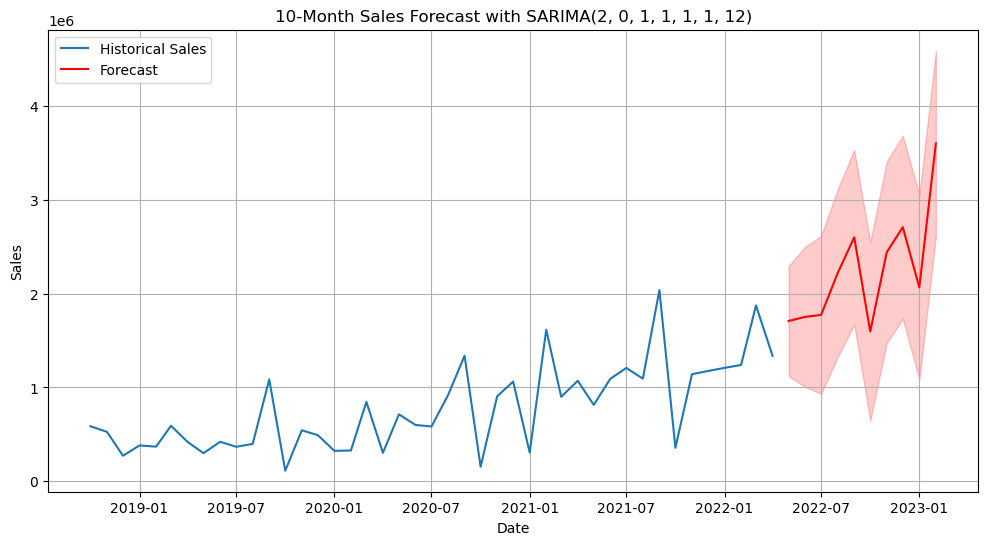

/var/folders/z6/_vn8cndd4x5dmx2cpjfdkjdr0000gn/T/ipykernel_48953/1221739132.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_set_8["Sales_EUR"] = results["yhat"]


,Mapped_GCK,Sales_EUR
Month Year,,
2022-05-01,#8,1.707920e+06
2022-06-01,#8,1.751543e+06
2022-07-01,#8,1.772828e+06
2022-08-01,#8,2.217962e+06
2022-09-01,#8,2.599788e+06
2022-10-01,#8,1.596066e+06
2022-11-01,#8,2.440836e+06
2022-12-01,#8,2.708214e+06
2023-01-01,#8,2.065741e+06


In [57]:
best_model, best_params, best_rmse, best_model_name = select_best_model(
    prophet_best_model_8, prophet_best_params_8, prophet_best_rmse_8, "Prophet",
    xgboost_best_model_8, xgboost_best_params_8, xgboost_best_rmse_8, "XGBoost"
    , sarima_best_model_8, sarima_best_params_8, sarima_best_rmse_8, "SARIMA"
)
print(f"Best Model: {best_model_name}")
print("Best Parameters:", best_params)
print("Best RMSE:", best_rmse)

if best_model_name == "XGBoost":
    results = xgboost_forecast(
        sales_agg8,
        df_market_8,
        period=10,
        params =best_params,
    )
elif best_model_name == "SARIMA":
    results = sarima_forecast(
        sales_agg8,
        period=10,
        params =best_params,
    )
else:
    results = prophet_forecast(
        sales_agg8,
        df_market_8,
        period=10,
        param =best_params,
    )
results.set_index('ds',inplace = True)
test_set_8.set_index('Month Year', inplace = True)
test_set_8["Sales_EUR"] = results["yhat"]
test_set_8

# Product 9

In [58]:
# selecte only the features that are selected in the feature selection step
test_set_9 = test_set[test_set['Mapped_GCK'] == '#9']
df_market_9 = df_market[selected_features_9]
df_market_9.head()

,RohCOPPER1000_org_lag_6,WKLWEUR840_org_lag_3,MAB_ELE_SHP250_lag_3,MAB_ELE_SHP840_lag_5,WKLWEUR840_org_lag_4,PRO27826_org_lag_1
date,,,,,,
2004-02-01,NaN,NaN,NaN,NaN,NaN,NaN
2004-03-01,NaN,NaN,NaN,NaN,NaN,120.706516
2004-04-01,NaN,NaN,NaN,NaN,NaN,138.309550
2004-05-01,NaN,1.2646,83.458866,NaN,NaN,115.557330
2004-06-01,NaN,1.2262,106.168192,NaN,1.2646,119.269534


## Xgboost 

In [59]:
X_train, X_val, y_train, y_val = train_val_split(sales_agg9, df_market_9, train_size = 0.8)

X_val.info() 

xgboost_best_model_9, xgboost_best_params_9, xgboost_best_rmse_9 = model_evaluation_XGboost(X_train,
                                                                                             y_train, 
                                                                                             X_val, y_val, 
                                                                                             xgboost_param_grid)

print("Best Params:", xgboost_best_params_9)
print("Validation RMSE:", xgboost_best_rmse_9)

<class 'pandas.core.frame.DataFrame'>
Index: 9 entries, 2021-08-01 to 2022-04-01
Data columns (total 6 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   RohCOPPER1000_org_lag_6  9 non-null      float64
 1   WKLWEUR840_org_lag_3     9 non-null      float64
 2   MAB_ELE_SHP250_lag_3     9 non-null      float64
 3   MAB_ELE_SHP840_lag_5     9 non-null      float64
 4   WKLWEUR840_org_lag_4     9 non-null      float64
 5   PRO27826_org_lag_1       9 non-null      float64
dtypes: float64(6)
memory usage: 504.0+ bytes
Params: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.01, 'subsample': 0.5, 'colsample_bytree': 0.5, 'gamma': 0, 'reg_alpha': 0, 'reg_lambda': 0} => RMSE: 6317.0011, Relative RMSE: 1.1302
Params: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.01, 'subsample': 0.5, 'colsample_bytree': 0.5, 'gamma': 0, 'reg_alpha': 0, 'reg_lambda': 0.1} => RMSE: 6159.1400, Relative RMSE: 1.1020
Params: {'n

## Prophet

In [60]:
prophet_best_model_9, prophet_best_params_9, prophet_best_rmse_9 = model_evaluation_prophet(X_train,
                                                                                             y_train, 
                                                                                             X_val, 
                                                                                             y_val, 
                                                                                             prophet_param_grid)

print("Best Params:", prophet_best_params_9)

print("Validation RMSE:", prophet_best_rmse_9)

01:35:43 - cmdstanpy - INFO - Chain [1] start processing
01:35:43 - cmdstanpy - INFO - Chain [1] done processing
01:35:44 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 9484.0695, Relative RMSE: 1.6969


01:35:44 - cmdstanpy - INFO - Chain [1] done processing
01:35:44 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 9484.0305, Relative RMSE: 1.6968


01:35:47 - cmdstanpy - INFO - Chain [1] done processing
01:35:47 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 9471.6335, Relative RMSE: 1.6946


01:35:49 - cmdstanpy - INFO - Chain [1] done processing
01:35:49 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 8671.1049, Relative RMSE: 1.5514


01:35:50 - cmdstanpy - INFO - Chain [1] done processing
01:35:50 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 8630.4892, Relative RMSE: 1.5441


01:35:52 - cmdstanpy - INFO - Chain [1] done processing
01:35:52 - cmdstanpy - INFO - Chain [1] start processing
01:35:52 - cmdstanpy - INFO - Chain [1] done processing
01:35:52 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 8712.6558, Relative RMSE: 1.5588
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 8159.6684, Relative RMSE: 1.4599


01:35:52 - cmdstanpy - INFO - Chain [1] done processing
01:35:52 - cmdstanpy - INFO - Chain [1] start processing
01:35:52 - cmdstanpy - INFO - Chain [1] done processing
01:35:52 - cmdstanpy - INFO - Chain [1] start processing
01:35:52 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 8159.6275, Relative RMSE: 1.4599
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 8159.7438, Relative RMSE: 1.4599


01:35:52 - cmdstanpy - INFO - Chain [1] start processing
01:35:52 - cmdstanpy - INFO - Chain [1] done processing
01:35:52 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 8159.6568, Relative RMSE: 1.4599
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 8158.0941, Relative RMSE: 1.4596


01:35:52 - cmdstanpy - INFO - Chain [1] done processing
01:35:52 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 8162.9963, Relative RMSE: 1.4605


01:35:54 - cmdstanpy - INFO - Chain [1] done processing
01:35:54 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 7513.1222, Relative RMSE: 1.3442


01:35:55 - cmdstanpy - INFO - Chain [1] done processing
01:35:55 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 7559.4411, Relative RMSE: 1.3525


01:35:55 - cmdstanpy - INFO - Chain [1] done processing
01:35:55 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 7561.9087, Relative RMSE: 1.3529


01:35:56 - cmdstanpy - INFO - Chain [1] done processing
01:35:56 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 6838.3890, Relative RMSE: 1.2235


01:35:56 - cmdstanpy - INFO - Chain [1] done processing
01:35:56 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 6801.2066, Relative RMSE: 1.2168


01:35:56 - cmdstanpy - INFO - Chain [1] done processing
01:35:57 - cmdstanpy - INFO - Chain [1] start processing
01:35:57 - cmdstanpy - INFO - Chain [1] done processing
01:35:57 - cmdstanpy - INFO - Chain [1] start processing
01:35:57 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 6861.8865, Relative RMSE: 1.2277
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 6610.3249, Relative RMSE: 1.1827


01:35:57 - cmdstanpy - INFO - Chain [1] start processing
01:35:57 - cmdstanpy - INFO - Chain [1] done processing
01:35:57 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 6610.3268, Relative RMSE: 1.1827
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 6610.3621, Relative RMSE: 1.1827


01:35:57 - cmdstanpy - INFO - Chain [1] done processing
01:35:57 - cmdstanpy - INFO - Chain [1] start processing
01:35:57 - cmdstanpy - INFO - Chain [1] done processing
01:35:57 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 6611.6694, Relative RMSE: 1.1829
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 6612.1807, Relative RMSE: 1.1830


01:35:57 - cmdstanpy - INFO - Chain [1] done processing
01:35:57 - cmdstanpy - INFO - Chain [1] start processing
01:35:57 - cmdstanpy - INFO - Chain [1] done processing
01:35:57 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 6610.1654, Relative RMSE: 1.1827
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 6943.1827, Relative RMSE: 1.2422


01:35:57 - cmdstanpy - INFO - Chain [1] done processing
01:35:58 - cmdstanpy - INFO - Chain [1] start processing
01:35:58 - cmdstanpy - INFO - Chain [1] done processing
01:35:58 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 6943.4654, Relative RMSE: 1.2423
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 6944.0907, Relative RMSE: 1.2424


01:35:58 - cmdstanpy - INFO - Chain [1] done processing
01:35:58 - cmdstanpy - INFO - Chain [1] start processing
01:35:58 - cmdstanpy - INFO - Chain [1] done processing
01:35:58 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 7191.0500, Relative RMSE: 1.2866
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 7082.3810, Relative RMSE: 1.2672


01:35:58 - cmdstanpy - INFO - Chain [1] done processing
01:35:58 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 7184.5339, Relative RMSE: 1.2854


01:35:58 - cmdstanpy - INFO - Chain [1] done processing
01:35:58 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 6989.3132, Relative RMSE: 1.2505


01:35:59 - cmdstanpy - INFO - Chain [1] done processing
01:35:59 - cmdstanpy - INFO - Chain [1] start processing
01:35:59 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 6951.1464, Relative RMSE: 1.2437


01:35:59 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 6989.9773, Relative RMSE: 1.2506


01:35:59 - cmdstanpy - INFO - Chain [1] done processing
01:35:59 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 9645.1601, Relative RMSE: 1.7257


01:35:59 - cmdstanpy - INFO - Chain [1] done processing
01:35:59 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 9410.8694, Relative RMSE: 1.6838


01:36:00 - cmdstanpy - INFO - Chain [1] done processing
01:36:00 - cmdstanpy - INFO - Chain [1] start processing
01:36:00 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 9524.5786, Relative RMSE: 1.7041
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 9204.8082, Relative RMSE: 1.6469


01:36:00 - cmdstanpy - INFO - Chain [1] start processing
01:36:00 - cmdstanpy - INFO - Chain [1] done processing
01:36:00 - cmdstanpy - INFO - Chain [1] start processing
01:36:00 - cmdstanpy - INFO - Chain [1] done processing
01:36:01 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 9203.4485, Relative RMSE: 1.6466
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 9202.6035, Relative RMSE: 1.6465


01:36:01 - cmdstanpy - INFO - Chain [1] done processing
01:36:01 - cmdstanpy - INFO - Chain [1] start processing
01:36:01 - cmdstanpy - INFO - Chain [1] done processing
01:36:01 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 9292.4382, Relative RMSE: 1.6626
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 9301.4106, Relative RMSE: 1.6642


01:36:01 - cmdstanpy - INFO - Chain [1] done processing
01:36:01 - cmdstanpy - INFO - Chain [1] start processing
01:36:01 - cmdstanpy - INFO - Chain [1] done processing
01:36:01 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 9223.0021, Relative RMSE: 1.6501
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 9229.4365, Relative RMSE: 1.6513


01:36:01 - cmdstanpy - INFO - Chain [1] done processing
01:36:01 - cmdstanpy - INFO - Chain [1] start processing
01:36:01 - cmdstanpy - INFO - Chain [1] done processing
01:36:01 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 9306.3311, Relative RMSE: 1.6651
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 9278.5845, Relative RMSE: 1.6601


01:36:02 - cmdstanpy - INFO - Chain [1] done processing
01:36:02 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 13165.2899, Relative RMSE: 2.3555


01:36:02 - cmdstanpy - INFO - Chain [1] done processing
01:36:02 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 12385.9848, Relative RMSE: 2.2161


01:36:02 - cmdstanpy - INFO - Chain [1] done processing
01:36:02 - cmdstanpy - INFO - Chain [1] start processing
01:36:02 - cmdstanpy - INFO - Chain [1] done processing
01:36:02 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 11386.3093, Relative RMSE: 2.0372
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 9511.9151, Relative RMSE: 1.7018


01:36:03 - cmdstanpy - INFO - Chain [1] done processing
01:36:03 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 9511.9151, Relative RMSE: 1.7018


01:36:03 - cmdstanpy - INFO - Chain [1] done processing
01:36:03 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 9510.5390, Relative RMSE: 1.7016


01:36:05 - cmdstanpy - INFO - Chain [1] done processing
01:36:05 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 9255.4831, Relative RMSE: 1.6560


01:36:08 - cmdstanpy - INFO - Chain [1] done processing
01:36:08 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 9182.4041, Relative RMSE: 1.6429


01:36:10 - cmdstanpy - INFO - Chain [1] done processing
01:36:10 - cmdstanpy - INFO - Chain [1] start processing
01:36:10 - cmdstanpy - INFO - Chain [1] done processing
01:36:10 - cmdstanpy - INFO - Chain [1] start processing
01:36:10 - cmdstanpy - INFO - Chain [1] done processing
01:36:10 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 9255.9085, Relative RMSE: 1.6560
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 8315.8267, Relative RMSE: 1.4878
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 8316.0080, Relative RMSE: 1.4879


01:36:10 - cmdstanpy - INFO - Chain [1] done processing
01:36:10 - cmdstanpy - INFO - Chain [1] start processing
01:36:10 - cmdstanpy - INFO - Chain [1] done processing
01:36:10 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 8315.9688, Relative RMSE: 1.4879
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 8308.9806, Relative RMSE: 1.4866


01:36:10 - cmdstanpy - INFO - Chain [1] done processing
01:36:10 - cmdstanpy - INFO - Chain [1] start processing
01:36:10 - cmdstanpy - INFO - Chain [1] done processing
01:36:10 - cmdstanpy - INFO - Chain [1] start processing
01:36:11 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 8319.0591, Relative RMSE: 1.4884
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 8306.1434, Relative RMSE: 1.4861


01:36:11 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 9511.9151, Relative RMSE: 1.7018


01:36:11 - cmdstanpy - INFO - Chain [1] done processing
01:36:11 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 9511.9151, Relative RMSE: 1.7018


01:36:11 - cmdstanpy - INFO - Chain [1] done processing
01:36:11 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 9510.5390, Relative RMSE: 1.7016


01:36:13 - cmdstanpy - INFO - Chain [1] done processing
01:36:13 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 9255.4831, Relative RMSE: 1.6560


01:36:16 - cmdstanpy - INFO - Chain [1] done processing
01:36:16 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 9182.4041, Relative RMSE: 1.6429


01:36:18 - cmdstanpy - INFO - Chain [1] done processing
01:36:18 - cmdstanpy - INFO - Chain [1] start processing
01:36:18 - cmdstanpy - INFO - Chain [1] done processing
01:36:18 - cmdstanpy - INFO - Chain [1] start processing
01:36:18 - cmdstanpy - INFO - Chain [1] done processing
01:36:18 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 9255.9085, Relative RMSE: 1.6560
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 8315.8267, Relative RMSE: 1.4878
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 8316.0080, Relative RMSE: 1.4879


01:36:18 - cmdstanpy - INFO - Chain [1] done processing
01:36:18 - cmdstanpy - INFO - Chain [1] start processing
01:36:18 - cmdstanpy - INFO - Chain [1] done processing
01:36:18 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 8315.9688, Relative RMSE: 1.4879
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 8308.9806, Relative RMSE: 1.4866


01:36:19 - cmdstanpy - INFO - Chain [1] done processing
01:36:19 - cmdstanpy - INFO - Chain [1] start processing
01:36:19 - cmdstanpy - INFO - Chain [1] done processing
01:36:19 - cmdstanpy - INFO - Chain [1] start processing
01:36:19 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 8319.0591, Relative RMSE: 1.4884
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 8306.1434, Relative RMSE: 1.4861


01:36:19 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 9511.9151, Relative RMSE: 1.7018


01:36:19 - cmdstanpy - INFO - Chain [1] done processing
01:36:19 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 9511.9151, Relative RMSE: 1.7018


01:36:19 - cmdstanpy - INFO - Chain [1] done processing
01:36:20 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 9510.5390, Relative RMSE: 1.7016


01:36:21 - cmdstanpy - INFO - Chain [1] done processing
01:36:21 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 9255.4831, Relative RMSE: 1.6560


01:36:24 - cmdstanpy - INFO - Chain [1] done processing
01:36:24 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 9182.4041, Relative RMSE: 1.6429


01:36:26 - cmdstanpy - INFO - Chain [1] done processing
01:36:26 - cmdstanpy - INFO - Chain [1] start processing
01:36:26 - cmdstanpy - INFO - Chain [1] done processing
01:36:26 - cmdstanpy - INFO - Chain [1] start processing
01:36:26 - cmdstanpy - INFO - Chain [1] done processing
01:36:27 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 9255.9085, Relative RMSE: 1.6560
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 8315.8267, Relative RMSE: 1.4878
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 8316.0080, Relative RMSE: 1.4879


01:36:27 - cmdstanpy - INFO - Chain [1] done processing
01:36:27 - cmdstanpy - INFO - Chain [1] start processing
01:36:27 - cmdstanpy - INFO - Chain [1] done processing
01:36:27 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 8315.9688, Relative RMSE: 1.4879
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 8308.9806, Relative RMSE: 1.4866


01:36:27 - cmdstanpy - INFO - Chain [1] done processing
01:36:27 - cmdstanpy - INFO - Chain [1] start processing
01:36:27 - cmdstanpy - INFO - Chain [1] done processing
01:36:27 - cmdstanpy - INFO - Chain [1] start processing
01:36:27 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 8319.0591, Relative RMSE: 1.4884
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 8306.1434, Relative RMSE: 1.4861


01:36:27 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 9511.9151, Relative RMSE: 1.7018


01:36:27 - cmdstanpy - INFO - Chain [1] done processing
01:36:27 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 9511.9151, Relative RMSE: 1.7018


01:36:28 - cmdstanpy - INFO - Chain [1] done processing
01:36:28 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 9510.5390, Relative RMSE: 1.7016


01:36:29 - cmdstanpy - INFO - Chain [1] done processing
01:36:29 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 9255.4831, Relative RMSE: 1.6560


01:36:32 - cmdstanpy - INFO - Chain [1] done processing
01:36:32 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 9182.4041, Relative RMSE: 1.6429


01:36:35 - cmdstanpy - INFO - Chain [1] done processing
01:36:35 - cmdstanpy - INFO - Chain [1] start processing
01:36:35 - cmdstanpy - INFO - Chain [1] done processing
01:36:35 - cmdstanpy - INFO - Chain [1] start processing
01:36:35 - cmdstanpy - INFO - Chain [1] done processing
01:36:35 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 9255.9085, Relative RMSE: 1.6560
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 8315.8267, Relative RMSE: 1.4878
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 8316.0080, Relative RMSE: 1.4879


01:36:35 - cmdstanpy - INFO - Chain [1] done processing
01:36:35 - cmdstanpy - INFO - Chain [1] start processing
01:36:35 - cmdstanpy - INFO - Chain [1] done processing
01:36:35 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 8315.9688, Relative RMSE: 1.4879
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 8308.9806, Relative RMSE: 1.4866


01:36:35 - cmdstanpy - INFO - Chain [1] done processing
01:36:35 - cmdstanpy - INFO - Chain [1] start processing
01:36:35 - cmdstanpy - INFO - Chain [1] done processing
01:36:35 - cmdstanpy - INFO - Chain [1] start processing
01:36:35 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 8319.0591, Relative RMSE: 1.4884
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 8306.1434, Relative RMSE: 1.4861


01:36:35 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 9511.9793, Relative RMSE: 1.7018


01:36:36 - cmdstanpy - INFO - Chain [1] done processing
01:36:36 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 9512.0188, Relative RMSE: 1.7019


01:36:36 - cmdstanpy - INFO - Chain [1] done processing
01:36:36 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 9510.4195, Relative RMSE: 1.7016


01:36:39 - cmdstanpy - INFO - Chain [1] done processing
01:36:39 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 9106.4819, Relative RMSE: 1.6293


01:36:43 - cmdstanpy - INFO - Chain [1] done processing
01:36:43 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 9175.1824, Relative RMSE: 1.6416


01:36:50 - cmdstanpy - INFO - Chain [1] done processing
01:36:50 - cmdstanpy - INFO - Chain [1] start processing
01:36:50 - cmdstanpy - INFO - Chain [1] done processing
01:36:50 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 9239.0332, Relative RMSE: 1.6530
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 8317.9301, Relative RMSE: 1.4882


01:36:50 - cmdstanpy - INFO - Chain [1] done processing
01:36:50 - cmdstanpy - INFO - Chain [1] start processing
01:36:50 - cmdstanpy - INFO - Chain [1] done processing
01:36:50 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 8317.8210, Relative RMSE: 1.4882
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 8317.9998, Relative RMSE: 1.4882


01:36:50 - cmdstanpy - INFO - Chain [1] done processing
01:36:50 - cmdstanpy - INFO - Chain [1] start processing
01:36:50 - cmdstanpy - INFO - Chain [1] done processing
01:36:50 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 8318.1292, Relative RMSE: 1.4882
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 8311.9650, Relative RMSE: 1.4871


01:36:51 - cmdstanpy - INFO - Chain [1] done processing
01:36:51 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 8292.9068, Relative RMSE: 1.4837


01:36:56 - cmdstanpy - INFO - Chain [1] done processing
01:36:56 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 9454.2756, Relative RMSE: 1.6915


01:37:08 - cmdstanpy - INFO - Chain [1] done processing
01:37:08 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 9419.5476, Relative RMSE: 1.6853


01:37:16 - cmdstanpy - INFO - Chain [1] done processing
01:37:16 - cmdstanpy - INFO - Chain [1] start processing
01:37:16 - cmdstanpy - INFO - Chain [1] done processing
01:37:16 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 9475.0847, Relative RMSE: 1.6952
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 8212.8616, Relative RMSE: 1.4694


01:37:16 - cmdstanpy - INFO - Chain [1] done processing
01:37:16 - cmdstanpy - INFO - Chain [1] start processing
01:37:16 - cmdstanpy - INFO - Chain [1] done processing
01:37:16 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 8212.8937, Relative RMSE: 1.4694
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 8212.8812, Relative RMSE: 1.4694


01:37:16 - cmdstanpy - INFO - Chain [1] done processing
01:37:16 - cmdstanpy - INFO - Chain [1] start processing
01:37:17 - cmdstanpy - INFO - Chain [1] done processing
01:37:17 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 8213.5829, Relative RMSE: 1.4695
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 8213.9763, Relative RMSE: 1.4696


01:37:17 - cmdstanpy - INFO - Chain [1] done processing
01:37:17 - cmdstanpy - INFO - Chain [1] start processing
01:37:17 - cmdstanpy - INFO - Chain [1] done processing
01:37:17 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 8213.9100, Relative RMSE: 1.4696
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 8208.6544, Relative RMSE: 1.4687


01:37:17 - cmdstanpy - INFO - Chain [1] done processing
01:37:17 - cmdstanpy - INFO - Chain [1] start processing
01:37:17 - cmdstanpy - INFO - Chain [1] done processing
01:37:17 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 8224.1518, Relative RMSE: 1.4714
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 8204.2728, Relative RMSE: 1.4679


01:37:17 - cmdstanpy - INFO - Chain [1] done processing
01:37:17 - cmdstanpy - INFO - Chain [1] start processing
01:37:18 - cmdstanpy - INFO - Chain [1] done processing
01:37:18 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 7619.1517, Relative RMSE: 1.3632
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 7630.0186, Relative RMSE: 1.3651


01:37:18 - cmdstanpy - INFO - Chain [1] done processing
01:37:18 - cmdstanpy - INFO - Chain [1] start processing
01:37:18 - cmdstanpy - INFO - Chain [1] done processing
01:37:18 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 7345.3420, Relative RMSE: 1.3142
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 6877.3931, Relative RMSE: 1.2305


01:37:18 - cmdstanpy - INFO - Chain [1] done processing
01:37:18 - cmdstanpy - INFO - Chain [1] start processing
01:37:18 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 6877.3885, Relative RMSE: 1.2305
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 6874.9224, Relative RMSE: 1.2300


01:37:18 - cmdstanpy - INFO - Chain [1] start processing
01:37:18 - cmdstanpy - INFO - Chain [1] done processing
01:37:18 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 6906.4582, Relative RMSE: 1.2357


01:37:19 - cmdstanpy - INFO - Chain [1] done processing
01:37:19 - cmdstanpy - INFO - Chain [1] start processing
01:37:19 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 6908.9586, Relative RMSE: 1.2361


01:37:19 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 6903.5045, Relative RMSE: 1.2352


01:37:19 - cmdstanpy - INFO - Chain [1] done processing
01:37:19 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 7634.9836, Relative RMSE: 1.3660


01:37:20 - cmdstanpy - INFO - Chain [1] done processing
01:37:20 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 7631.9637, Relative RMSE: 1.3655


01:37:20 - cmdstanpy - INFO - Chain [1] done processing
01:37:20 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 7627.4865, Relative RMSE: 1.3647


01:37:22 - cmdstanpy - INFO - Chain [1] done processing
01:37:22 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 8002.5118, Relative RMSE: 1.4318


01:37:22 - cmdstanpy - INFO - Chain [1] done processing
01:37:22 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 8056.5515, Relative RMSE: 1.4414


01:37:23 - cmdstanpy - INFO - Chain [1] done processing
01:37:23 - cmdstanpy - INFO - Chain [1] start processing
01:37:23 - cmdstanpy - INFO - Chain [1] done processing
01:37:23 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 6604.2539, Relative RMSE: 1.1816
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 6593.7498, Relative RMSE: 1.1797


01:37:23 - cmdstanpy - INFO - Chain [1] done processing
01:37:23 - cmdstanpy - INFO - Chain [1] start processing
01:37:23 - cmdstanpy - INFO - Chain [1] done processing
01:37:23 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 6598.2939, Relative RMSE: 1.1805
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 6589.2978, Relative RMSE: 1.1789


01:37:23 - cmdstanpy - INFO - Chain [1] done processing
01:37:23 - cmdstanpy - INFO - Chain [1] start processing
01:37:24 - cmdstanpy - INFO - Chain [1] done processing
01:37:24 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 6583.1796, Relative RMSE: 1.1778
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 6583.1278, Relative RMSE: 1.1778


01:37:24 - cmdstanpy - INFO - Chain [1] done processing
01:37:24 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 6584.2395, Relative RMSE: 1.1780


01:37:24 - cmdstanpy - INFO - Chain [1] done processing
01:37:24 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 21221.2190, Relative RMSE: 3.7968


01:37:24 - cmdstanpy - INFO - Chain [1] done processing
01:37:25 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 21937.7304, Relative RMSE: 3.9250


01:37:25 - cmdstanpy - INFO - Chain [1] done processing
01:37:25 - cmdstanpy - INFO - Chain [1] start processing
01:37:25 - cmdstanpy - INFO - Chain [1] done processing
01:37:25 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 22124.9596, Relative RMSE: 3.9585
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 9511.9151, Relative RMSE: 1.7018


01:37:25 - cmdstanpy - INFO - Chain [1] done processing
01:37:26 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 9511.9151, Relative RMSE: 1.7018


01:37:26 - cmdstanpy - INFO - Chain [1] done processing
01:37:26 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 9510.5390, Relative RMSE: 1.7016


01:37:27 - cmdstanpy - INFO - Chain [1] done processing
01:37:27 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 9255.4831, Relative RMSE: 1.6560


01:37:30 - cmdstanpy - INFO - Chain [1] done processing
01:37:30 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 9182.4041, Relative RMSE: 1.6429


01:37:33 - cmdstanpy - INFO - Chain [1] done processing
01:37:33 - cmdstanpy - INFO - Chain [1] start processing
01:37:33 - cmdstanpy - INFO - Chain [1] done processing
01:37:33 - cmdstanpy - INFO - Chain [1] start processing
01:37:33 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 9255.9085, Relative RMSE: 1.6560
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 8315.8267, Relative RMSE: 1.4878
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 8316.0080, Relative RMSE: 1.4879


01:37:33 - cmdstanpy - INFO - Chain [1] start processing
01:37:33 - cmdstanpy - INFO - Chain [1] done processing
01:37:33 - cmdstanpy - INFO - Chain [1] start processing
01:37:33 - cmdstanpy - INFO - Chain [1] done processing
01:37:33 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 8315.9688, Relative RMSE: 1.4879
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 8308.9806, Relative RMSE: 1.4866


01:37:33 - cmdstanpy - INFO - Chain [1] done processing
01:37:33 - cmdstanpy - INFO - Chain [1] start processing
01:37:33 - cmdstanpy - INFO - Chain [1] done processing
01:37:33 - cmdstanpy - INFO - Chain [1] start processing
01:37:33 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 8319.0591, Relative RMSE: 1.4884
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 8306.1434, Relative RMSE: 1.4861


01:37:33 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 9511.9151, Relative RMSE: 1.7018


01:37:34 - cmdstanpy - INFO - Chain [1] done processing
01:37:34 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 9511.9151, Relative RMSE: 1.7018


01:37:34 - cmdstanpy - INFO - Chain [1] done processing
01:37:34 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 9510.5390, Relative RMSE: 1.7016


01:37:36 - cmdstanpy - INFO - Chain [1] done processing
01:37:36 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 9255.4831, Relative RMSE: 1.6560


01:37:39 - cmdstanpy - INFO - Chain [1] done processing
01:37:39 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 9182.4041, Relative RMSE: 1.6429


01:37:41 - cmdstanpy - INFO - Chain [1] done processing
01:37:41 - cmdstanpy - INFO - Chain [1] start processing
01:37:41 - cmdstanpy - INFO - Chain [1] done processing
01:37:41 - cmdstanpy - INFO - Chain [1] start processing
01:37:41 - cmdstanpy - INFO - Chain [1] done processing
01:37:41 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 9255.9085, Relative RMSE: 1.6560
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 8315.8267, Relative RMSE: 1.4878
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 8316.0080, Relative RMSE: 1.4879


01:37:41 - cmdstanpy - INFO - Chain [1] done processing
01:37:41 - cmdstanpy - INFO - Chain [1] start processing
01:37:41 - cmdstanpy - INFO - Chain [1] done processing
01:37:41 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 8315.9688, Relative RMSE: 1.4879
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 8308.9806, Relative RMSE: 1.4866


01:37:41 - cmdstanpy - INFO - Chain [1] done processing
01:37:41 - cmdstanpy - INFO - Chain [1] start processing
01:37:41 - cmdstanpy - INFO - Chain [1] done processing
01:37:41 - cmdstanpy - INFO - Chain [1] start processing
01:37:41 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 8319.0591, Relative RMSE: 1.4884
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 8306.1434, Relative RMSE: 1.4861


01:37:41 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 9511.9151, Relative RMSE: 1.7018


01:37:42 - cmdstanpy - INFO - Chain [1] done processing
01:37:42 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 9511.9151, Relative RMSE: 1.7018


01:37:42 - cmdstanpy - INFO - Chain [1] done processing
01:37:42 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 9510.5390, Relative RMSE: 1.7016


01:37:44 - cmdstanpy - INFO - Chain [1] done processing
01:37:44 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 9255.4831, Relative RMSE: 1.6560


01:37:47 - cmdstanpy - INFO - Chain [1] done processing
01:37:47 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 9182.4041, Relative RMSE: 1.6429


01:37:49 - cmdstanpy - INFO - Chain [1] done processing
01:37:49 - cmdstanpy - INFO - Chain [1] start processing
01:37:49 - cmdstanpy - INFO - Chain [1] done processing
01:37:49 - cmdstanpy - INFO - Chain [1] start processing
01:37:49 - cmdstanpy - INFO - Chain [1] done processing
01:37:49 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 9255.9085, Relative RMSE: 1.6560
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 8315.8267, Relative RMSE: 1.4878
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 8316.0080, Relative RMSE: 1.4879


01:37:49 - cmdstanpy - INFO - Chain [1] done processing
01:37:49 - cmdstanpy - INFO - Chain [1] start processing
01:37:49 - cmdstanpy - INFO - Chain [1] done processing
01:37:49 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 8315.9688, Relative RMSE: 1.4879
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 8308.9806, Relative RMSE: 1.4866


01:37:49 - cmdstanpy - INFO - Chain [1] done processing
01:37:49 - cmdstanpy - INFO - Chain [1] start processing
01:37:49 - cmdstanpy - INFO - Chain [1] done processing
01:37:50 - cmdstanpy - INFO - Chain [1] start processing
01:37:50 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 8319.0591, Relative RMSE: 1.4884
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 8306.1434, Relative RMSE: 1.4861


01:37:50 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 9511.9151, Relative RMSE: 1.7018


01:37:50 - cmdstanpy - INFO - Chain [1] done processing
01:37:50 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 9511.9151, Relative RMSE: 1.7018


01:37:50 - cmdstanpy - INFO - Chain [1] done processing
01:37:50 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 9510.5390, Relative RMSE: 1.7016


01:37:52 - cmdstanpy - INFO - Chain [1] done processing
01:37:52 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 9255.4831, Relative RMSE: 1.6560


01:37:55 - cmdstanpy - INFO - Chain [1] done processing
01:37:55 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 9182.4041, Relative RMSE: 1.6429


01:37:57 - cmdstanpy - INFO - Chain [1] done processing
01:37:57 - cmdstanpy - INFO - Chain [1] start processing
01:37:57 - cmdstanpy - INFO - Chain [1] done processing
01:37:57 - cmdstanpy - INFO - Chain [1] start processing
01:37:57 - cmdstanpy - INFO - Chain [1] done processing
01:37:57 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 9255.9085, Relative RMSE: 1.6560
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 8315.8267, Relative RMSE: 1.4878
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 8316.0080, Relative RMSE: 1.4879


01:37:57 - cmdstanpy - INFO - Chain [1] done processing
01:37:57 - cmdstanpy - INFO - Chain [1] start processing
01:37:57 - cmdstanpy - INFO - Chain [1] done processing
01:37:57 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 8315.9688, Relative RMSE: 1.4879
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 8308.9806, Relative RMSE: 1.4866


01:37:58 - cmdstanpy - INFO - Chain [1] done processing
01:37:58 - cmdstanpy - INFO - Chain [1] start processing
01:37:58 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 8319.0591, Relative RMSE: 1.4884
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 8306.1434, Relative RMSE: 1.4861
Best Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9}
Validation RMSE: 6583.1278034750385


## Sarima

In [61]:
sarima_best_model_9, sarima_best_params_9, sarima_best_rmse_9 = model_evaluation_SARIMA(y_train, 
                                                             y_val, 
                                                             sarima_param_grid)

print("Best Params:", sarima_best_params_9)
print("Validation RMSE:", sarima_best_rmse_9)

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,0) x (0,0,0,6) => RMSE: 7764.2179, Relative RMSE: 1.3891
SARIMA(0,0,0) x (0,0,0,12) => RMSE: 7764.2179, Relative RMSE: 1.3891
SARIMA(0,0,0) x (0,0,1,6) => RMSE: 7755.3265, Relative RMSE: 1.3876
SARIMA(0,0,0) x (0,0,1,12) => RMSE: 7833.1141, Relative RMSE: 1.4015
SARIMA(0,0,0) x (0,1,0,6) => RMSE: 13743.1813, Relative RMSE: 2.4589


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,0) x (0,1,0,12) => RMSE: 17706.9765, Relative RMSE: 3.1681
SARIMA(0,0,0) x (0,1,1,6) => RMSE: 8225.8602, Relative RMSE: 1.4717
SARIMA(0,0,0) x (0,1,1,12) => RMSE: 7723.8732, Relative RMSE: 1.3819
SARIMA(0,0,0) x (1,0,0,6) => RMSE: 6309.9415, Relative RMSE: 1.1290
SARIMA(0,0,0) x (1,0,0,12) => RMSE: 8419.1147, Relative RMSE: 1.5063
SARIMA(0,0,0) x (1,0,1,6) => RMSE: 24099.0071, Relative RMSE: 4.3117
SARIMA(0,0,0) x (1,0,1,12) => RMSE: 48859.3810, Relative RMSE: 8.7417
SARIMA(0,0,0) x (1,1,0,6) => RMSE: 14068.4079, Relative RMSE: 2.5171
SARIMA(0,0,0) x (1,1,0,12) => RMSE: 13821.9005, Relative RMSE: 2.4730


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


SARIMA(0,0,0) x (1,1,1,6) => RMSE: 19018.4752, Relative RMSE: 3.4027


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,0) x (1,1,1,12) => RMSE: 29671.0314, Relative RMSE: 5.3086
SARIMA(0,0,1) x (0,0,0,6) => RMSE: 7781.0528, Relative RMSE: 1.3922
SARIMA(0,0,1) x (0,0,0,12) => RMSE: 7781.0528, Relative RMSE: 1.3922
SARIMA(0,0,1) x (0,0,1,6) => RMSE: 7862.6902, Relative RMSE: 1.4068
SARIMA(0,0,1) x (0,0,1,12) => RMSE: 7993.3480, Relative RMSE: 1.4301
SARIMA(0,0,1) x (0,1,0,6) => RMSE: 13421.4598, Relative RMSE: 2.4013
SARIMA(0,0,1) x (0,1,0,12) => RMSE: 17639.0198, Relative RMSE: 3.1559
SARIMA(0,0,1) x (0,1,1,6) => RMSE: 8220.5055, Relative RMSE: 1.4708


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(0,0,1) x (0,1,1,12) => RMSE: 10748.1817, Relative RMSE: 1.9230
SARIMA(0,0,1) x (1,0,0,6) => RMSE: 6314.6334, Relative RMSE: 1.1298
SARIMA(0,0,1) x (1,0,0,12) => RMSE: 7708.5491, Relative RMSE: 1.3792
SARIMA(0,0,1) x (1,0,1,6) => RMSE: 24746.9571, Relative RMSE: 4.4276


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,1) x (1,0,1,12) => RMSE: 44434.9248, Relative RMSE: 7.9501
SARIMA(0,0,1) x (1,1,0,6) => RMSE: 13666.2145, Relative RMSE: 2.4451
SARIMA(0,0,1) x (1,1,0,12) => RMSE: 37042.0991, Relative RMSE: 6.6274
SARIMA(0,0,1) x (1,1,1,6) => RMSE: 17036.3105, Relative RMSE: 3.0481


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,0,1) x (1,1,1,12) => RMSE: 39455.6015, Relative RMSE: 7.0593
SARIMA(0,0,2) x (0,0,0,6) => RMSE: 7466.2594, Relative RMSE: 1.3358
SARIMA(0,0,2) x (0,0,0,12) => RMSE: 7466.2594, Relative RMSE: 1.3358
SARIMA(0,0,2) x (0,0,1,6) => RMSE: 6923.2773, Relative RMSE: 1.2387
SARIMA(0,0,2) x (0,0,1,12) => RMSE: 10830.6589, Relative RMSE: 1.9378
SARIMA(0,0,2) x (0,1,0,6) => RMSE: 14372.4274, Relative RMSE: 2.5715
SARIMA(0,0,2) x (0,1,0,12) => RMSE: 17556.5550, Relative RMSE: 3.1412
SARIMA(0,0,2) x (0,1,1,6) => RMSE: 7362.2283, Relative RMSE: 1.3172
SARIMA(0,0,2) x (0,1,1,12) => RMSE: 10543.5930, Relative RMSE: 1.8864
SARIMA(0,0,2) x (1,0,0,6) => RMSE: 6647.9764, Relative RMSE: 1.1894
SARIMA(0,0,2) x (1,0,0,12) => RMSE: 15309.5328, Relative RMSE: 2.7391


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,0,2) x (1,0,1,6) => RMSE: 23916.9148, Relative RMSE: 4.2791
SARIMA(0,0,2) x (1,0,1,12) => RMSE: 36363.1932, Relative RMSE: 6.5060
SARIMA(0,0,2) x (1,1,0,6) => RMSE: 14056.7128, Relative RMSE: 2.5150
SARIMA(0,0,2) x (1,1,0,12) => RMSE: 27693.6654, Relative RMSE: 4.9549
SARIMA(0,0,2) x (1,1,1,6) => RMSE: 17279.8092, Relative RMSE: 3.0916


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,2) x (1,1,1,12) => RMSE: 28912.4659, Relative RMSE: 5.1729
SARIMA(0,1,0) x (0,0,0,6) => RMSE: 7849.1137, Relative RMSE: 1.4043
SARIMA(0,1,0) x (0,0,0,12) => RMSE: 7849.1137, Relative RMSE: 1.4043
SARIMA(0,1,0) x (0,0,1,6) => RMSE: 6398.7193, Relative RMSE: 1.1448
SARIMA(0,1,0) x (0,0,1,12) => RMSE: 12251.8686, Relative RMSE: 2.1921
SARIMA(0,1,0) x (0,1,0,6) => RMSE: 27017.5559, Relative RMSE: 4.8339
SARIMA(0,1,0) x (0,1,0,12) => RMSE: 23721.5993, Relative RMSE: 4.2442
SARIMA(0,1,0) x (0,1,1,6) => RMSE: 7528.0003, Relative RMSE: 1.3469
SARIMA(0,1,0) x (0,1,1,12) => RMSE: 8764.2727, Relative RMSE: 1.5681
SARIMA(0,1,0) x (1,0,0,6) => RMSE: 7483.6413, Relative RMSE: 1.3389
SARIMA(0,1,0) x (1,0,0,12) => RMSE: 18363.6167, Relative RMSE: 3.2856
SARIMA(0,1,0) x (1,0,1,6) => RMSE: 9026.3180, Relative RMSE: 1.6150
SARIMA(0,1,0) x (1,0,1,12) => RMSE: 39906.3377, Relative RMSE: 7.1399
SARIMA(0,1,0) x (1,1,0,6) => RMSE: 24026.7738, Relative RMSE: 4.2988
SARIMA(0,1,0) x (1,1,0,12) => RMSE

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,0) x (1,1,1,12) => RMSE: 26902.9388, Relative RMSE: 4.8134
SARIMA(0,1,1) x (0,0,0,6) => RMSE: 6642.1709, Relative RMSE: 1.1884
SARIMA(0,1,1) x (0,0,0,12) => RMSE: 6642.1709, Relative RMSE: 1.1884
SARIMA(0,1,1) x (0,0,1,6) => RMSE: 6873.4213, Relative RMSE: 1.2298
SARIMA(0,1,1) x (0,0,1,12) => RMSE: 6630.6103, Relative RMSE: 1.1863
SARIMA(0,1,1) x (0,1,0,6) => RMSE: 16236.1093, Relative RMSE: 2.9049
SARIMA(0,1,1) x (0,1,0,12) => RMSE: 19090.0620, Relative RMSE: 3.4155
SARIMA(0,1,1) x (0,1,1,6) => RMSE: 10062.5690, Relative RMSE: 1.8004
SARIMA(0,1,1) x (0,1,1,12) => RMSE: 11176.3200, Relative RMSE: 1.9996
SARIMA(0,1,1) x (1,0,0,6) => RMSE: 6761.9869, Relative RMSE: 1.2098
SARIMA(0,1,1) x (1,0,0,12) => RMSE: 10718.6854, Relative RMSE: 1.9177
SARIMA(0,1,1) x (1,0,1,6) => RMSE: 7463.6116, Relative RMSE: 1.3354


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,1) x (1,0,1,12) => RMSE: 36714.2348, Relative RMSE: 6.5688
SARIMA(0,1,1) x (1,1,0,6) => RMSE: 16606.3251, Relative RMSE: 2.9711
SARIMA(0,1,1) x (1,1,0,12) => RMSE: 14599.3668, Relative RMSE: 2.6121
SARIMA(0,1,1) x (1,1,1,6) => RMSE: 16294.8046, Relative RMSE: 2.9154


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,1) x (1,1,1,12) => RMSE: 40733.4573, Relative RMSE: 7.2879
SARIMA(0,1,2) x (0,0,0,6) => RMSE: 6964.2634, Relative RMSE: 1.2460
SARIMA(0,1,2) x (0,0,0,12) => RMSE: 6964.2634, Relative RMSE: 1.2460
SARIMA(0,1,2) x (0,0,1,6) => RMSE: 7382.9825, Relative RMSE: 1.3209
SARIMA(0,1,2) x (0,0,1,12) => RMSE: 6711.3054, Relative RMSE: 1.2008
SARIMA(0,1,2) x (0,1,0,6) => RMSE: 15917.3295, Relative RMSE: 2.8479
SARIMA(0,1,2) x (0,1,0,12) => RMSE: 19127.8097, Relative RMSE: 3.4223
SARIMA(0,1,2) x (0,1,1,6) => RMSE: 10639.3141, Relative RMSE: 1.9035
SARIMA(0,1,2) x (0,1,1,12) => RMSE: 10413.9280, Relative RMSE: 1.8632
SARIMA(0,1,2) x (1,0,0,6) => RMSE: 7302.6061, Relative RMSE: 1.3066


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,2) x (1,0,0,12) => RMSE: 10958.9265, Relative RMSE: 1.9607
SARIMA(0,1,2) x (1,0,1,6) => RMSE: 7995.4014, Relative RMSE: 1.4305
SARIMA(0,1,2) x (1,0,1,12) => RMSE: 39862.1558, Relative RMSE: 7.1320
SARIMA(0,1,2) x (1,1,0,6) => RMSE: 16375.2307, Relative RMSE: 2.9298
SARIMA(0,1,2) x (1,1,0,12) => RMSE: 10710.7426, Relative RMSE: 1.9163
SARIMA(0,1,2) x (1,1,1,6) => RMSE: 16356.2576, Relative RMSE: 2.9264


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(0,1,2) x (1,1,1,12) => RMSE: 20783.6705, Relative RMSE: 3.7185
SARIMA(1,0,0) x (0,0,0,6) => RMSE: 7605.7559, Relative RMSE: 1.3608
SARIMA(1,0,0) x (0,0,0,12) => RMSE: 7605.7559, Relative RMSE: 1.3608
SARIMA(1,0,0) x (0,0,1,6) => RMSE: 7800.5720, Relative RMSE: 1.3957
SARIMA(1,0,0) x (0,0,1,12) => RMSE: 18175.3505, Relative RMSE: 3.2519
SARIMA(1,0,0) x (0,1,0,6) => RMSE: 13617.2002, Relative RMSE: 2.4363
SARIMA(1,0,0) x (0,1,0,12) => RMSE: 17587.9185, Relative RMSE: 3.1468
SARIMA(1,0,0) x (0,1,1,6) => RMSE: 9150.7749, Relative RMSE: 1.6372
SARIMA(1,0,0) x (0,1,1,12) => RMSE: 7124.2703, Relative RMSE: 1.2746
SARIMA(1,0,0) x (1,0,0,6) => RMSE: 6632.0214, Relative RMSE: 1.1866
SARIMA(1,0,0) x (1,0,0,12) => RMSE: 22390.1794, Relative RMSE: 4.0060
SARIMA(1,0,0) x (1,0,1,6) => RMSE: 26475.1874, Relative RMSE: 4.7368
SARIMA(1,0,0) x (1,0,1,12) => RMSE: 47065.8292, Relative RMSE: 8.4208
SARIMA(1,0,0) x (1,1,0,6) => RMSE: 13548.0588, Relative RMSE: 2.4240


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,0) x (1,1,0,12) => RMSE: 27859.7264, Relative RMSE: 4.9846
SARIMA(1,0,0) x (1,1,1,6) => RMSE: 17619.7067, Relative RMSE: 3.1525
SARIMA(1,0,0) x (1,1,1,12) => RMSE: 26889.7414, Relative RMSE: 4.8110
SARIMA(1,0,1) x (0,0,0,6) => RMSE: 11605.3106, Relative RMSE: 2.0764
SARIMA(1,0,1) x (0,0,0,12) => RMSE: 11605.3106, Relative RMSE: 2.0764
SARIMA(1,0,1) x (0,0,1,6) => RMSE: 10627.6948, Relative RMSE: 1.9015
SARIMA(1,0,1) x (0,0,1,12) => RMSE: 7442.1592, Relative RMSE: 1.3315
SARIMA(1,0,1) x (0,1,0,6) => RMSE: 13942.7505, Relative RMSE: 2.4946
SARIMA(1,0,1) x (0,1,0,12) => RMSE: 18246.6108, Relative RMSE: 3.2646


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,1) x (0,1,1,6) => RMSE: 8509.4233, Relative RMSE: 1.5225
SARIMA(1,0,1) x (0,1,1,12) => RMSE: 11031.8692, Relative RMSE: 1.9738
SARIMA(1,0,1) x (1,0,0,6) => RMSE: 10311.3498, Relative RMSE: 1.8449
SARIMA(1,0,1) x (1,0,0,12) => RMSE: 10945.2419, Relative RMSE: 1.9583
SARIMA(1,0,1) x (1,0,1,6) => RMSE: 12567.4609, Relative RMSE: 2.2485


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,0,1) x (1,0,1,12) => RMSE: 42223.3911, Relative RMSE: 7.5545
SARIMA(1,0,1) x (1,1,0,6) => RMSE: 13372.5973, Relative RMSE: 2.3926
SARIMA(1,0,1) x (1,1,0,12) => RMSE: 12224.0453, Relative RMSE: 2.1871
SARIMA(1,0,1) x (1,1,1,6) => RMSE: 17578.9385, Relative RMSE: 3.1452
SARIMA(1,0,1) x (1,1,1,12) => RMSE: 18398.6250, Relative RMSE: 3.2918
SARIMA(1,0,2) x (0,0,0,6) => RMSE: 11451.0930, Relative RMSE: 2.0488


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,2) x (0,0,0,12) => RMSE: 11451.0930, Relative RMSE: 2.0488
SARIMA(1,0,2) x (0,0,1,6) => RMSE: 10845.7289, Relative RMSE: 1.9405
SARIMA(1,0,2) x (0,0,1,12) => RMSE: 7537.6177, Relative RMSE: 1.3486
SARIMA(1,0,2) x (0,1,0,6) => RMSE: 14098.2251, Relative RMSE: 2.5224
SARIMA(1,0,2) x (0,1,0,12) => RMSE: 17028.4029, Relative RMSE: 3.0467
SARIMA(1,0,2) x (0,1,1,6) => RMSE: 7743.9051, Relative RMSE: 1.3855
SARIMA(1,0,2) x (0,1,1,12) => RMSE: 11275.4554, Relative RMSE: 2.0174


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,2) x (1,0,0,6) => RMSE: 10582.3955, Relative RMSE: 1.8934
SARIMA(1,0,2) x (1,0,0,12) => RMSE: 10950.4822, Relative RMSE: 1.9592
SARIMA(1,0,2) x (1,0,1,6) => RMSE: 12047.5135, Relative RMSE: 2.1555
SARIMA(1,0,2) x (1,0,1,12) => RMSE: 43459.1103, Relative RMSE: 7.7755
SARIMA(1,0,2) x (1,1,0,6) => RMSE: 13783.7497, Relative RMSE: 2.4661


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,2) x (1,1,0,12) => RMSE: 29240.0693, Relative RMSE: 5.2315
SARIMA(1,0,2) x (1,1,1,6) => RMSE: 18263.2991, Relative RMSE: 3.2676


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,2) x (1,1,1,12) => RMSE: 19340.9111, Relative RMSE: 3.4604
SARIMA(1,1,0) x (0,0,0,6) => RMSE: 6617.0030, Relative RMSE: 1.1839
SARIMA(1,1,0) x (0,0,0,12) => RMSE: 6617.0030, Relative RMSE: 1.1839
SARIMA(1,1,0) x (0,0,1,6) => RMSE: 8220.1882, Relative RMSE: 1.4707
SARIMA(1,1,0) x (0,0,1,12) => RMSE: 7025.4414, Relative RMSE: 1.2570
SARIMA(1,1,0) x (0,1,0,6) => RMSE: 20234.4863, Relative RMSE: 3.6203
SARIMA(1,1,0) x (0,1,0,12) => RMSE: 20341.3049, Relative RMSE: 3.6394
SARIMA(1,1,0) x (0,1,1,6) => RMSE: 8190.5150, Relative RMSE: 1.4654
SARIMA(1,1,0) x (0,1,1,12) => RMSE: 11222.3604, Relative RMSE: 2.0079
SARIMA(1,1,0) x (1,0,0,6) => RMSE: 7434.4138, Relative RMSE: 1.3301
SARIMA(1,1,0) x (1,0,0,12) => RMSE: 14013.1016, Relative RMSE: 2.5072
SARIMA(1,1,0) x (1,0,1,6) => RMSE: 7616.1433, Relative RMSE: 1.3627
SARIMA(1,1,0) x (1,0,1,12) => RMSE: 36090.6501, Relative RMSE: 6.4572
SARIMA(1,1,0) x (1,1,0,6) => RMSE: 18988.4501, Relative RMSE: 3.3973


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,0) x (1,1,0,12) => RMSE: 16523.0987, Relative RMSE: 2.9563
SARIMA(1,1,0) x (1,1,1,6) => RMSE: 27502.3646, Relative RMSE: 4.9206
SARIMA(1,1,0) x (1,1,1,12) => RMSE: 17245.1604, Relative RMSE: 3.0854
SARIMA(1,1,1) x (0,0,0,6) => RMSE: 6965.1509, Relative RMSE: 1.2462
SARIMA(1,1,1) x (0,0,0,12) => RMSE: 6965.1509, Relative RMSE: 1.2462
SARIMA(1,1,1) x (0,0,1,6) => RMSE: 7402.9542, Relative RMSE: 1.3245
SARIMA(1,1,1) x (0,0,1,12) => RMSE: 6786.8617, Relative RMSE: 1.2143
SARIMA(1,1,1) x (0,1,0,6) => RMSE: 15911.4138, Relative RMSE: 2.8468
SARIMA(1,1,1) x (0,1,0,12) => RMSE: 19033.6439, Relative RMSE: 3.4054


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,1,1) x (0,1,1,6) => RMSE: 10355.2409, Relative RMSE: 1.8527
SARIMA(1,1,1) x (0,1,1,12) => RMSE: 11583.6480, Relative RMSE: 2.0725
SARIMA(1,1,1) x (1,0,0,6) => RMSE: 7325.1044, Relative RMSE: 1.3106
SARIMA(1,1,1) x (1,0,0,12) => RMSE: 11662.2476, Relative RMSE: 2.0866
SARIMA(1,1,1) x (1,0,1,6) => RMSE: 7944.2507, Relative RMSE: 1.4214
SARIMA(1,1,1) x (1,0,1,12) => RMSE: 27288.0982, Relative RMSE: 4.8823


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,1,1) x (1,1,0,6) => RMSE: 16231.2595, Relative RMSE: 2.9040
SARIMA(1,1,1) x (1,1,0,12) => RMSE: 17573.4097, Relative RMSE: 3.1442
SARIMA(1,1,1) x (1,1,1,6) => RMSE: 17284.6410, Relative RMSE: 3.0925


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,1,1) x (1,1,1,12) => RMSE: 35983.3350, Relative RMSE: 6.4380
SARIMA(1,1,2) x (0,0,0,6) => RMSE: 6923.9326, Relative RMSE: 1.2388
SARIMA(1,1,2) x (0,0,0,12) => RMSE: 6923.9326, Relative RMSE: 1.2388
SARIMA(1,1,2) x (0,0,1,6) => RMSE: 7292.6682, Relative RMSE: 1.3048
SARIMA(1,1,2) x (0,0,1,12) => RMSE: 6754.3465, Relative RMSE: 1.2085
SARIMA(1,1,2) x (0,1,0,6) => RMSE: 16010.2063, Relative RMSE: 2.8645
SARIMA(1,1,2) x (0,1,0,12) => RMSE: 18697.3083, Relative RMSE: 3.3453
SARIMA(1,1,2) x (0,1,1,6) => RMSE: 10285.4653, Relative RMSE: 1.8402


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,2) x (0,1,1,12) => RMSE: 9999.0865, Relative RMSE: 1.7890
SARIMA(1,1,2) x (1,0,0,6) => RMSE: 7251.3789, Relative RMSE: 1.2974
SARIMA(1,1,2) x (1,0,0,12) => RMSE: 11667.9031, Relative RMSE: 2.0876
SARIMA(1,1,2) x (1,0,1,6) => RMSE: 7818.0537, Relative RMSE: 1.3988


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,2) x (1,0,1,12) => RMSE: 37433.0036, Relative RMSE: 6.6974
SARIMA(1,1,2) x (1,1,0,6) => RMSE: 15954.7076, Relative RMSE: 2.8546
SARIMA(1,1,2) x (1,1,0,12) => RMSE: 23476.7018, Relative RMSE: 4.2004
SARIMA(1,1,2) x (1,1,1,6) => RMSE: 17058.7050, Relative RMSE: 3.0521


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,2) x (1,1,1,12) => RMSE: 18885.5599, Relative RMSE: 3.3789
SARIMA(2,0,0) x (0,0,0,6) => RMSE: 5972.9918, Relative RMSE: 1.0687
SARIMA(2,0,0) x (0,0,0,12) => RMSE: 5972.9918, Relative RMSE: 1.0687
SARIMA(2,0,0) x (0,0,1,6) => RMSE: 6414.9979, Relative RMSE: 1.1477
SARIMA(2,0,0) x (0,0,1,12) => RMSE: 9822.3655, Relative RMSE: 1.7574
SARIMA(2,0,0) x (0,1,0,6) => RMSE: 14236.1586, Relative RMSE: 2.5471
SARIMA(2,0,0) x (0,1,0,12) => RMSE: 17397.5454, Relative RMSE: 3.1127
SARIMA(2,0,0) x (0,1,1,6) => RMSE: 5970.2892, Relative RMSE: 1.0682
SARIMA(2,0,0) x (0,1,1,12) => RMSE: 6274.4547, Relative RMSE: 1.1226
SARIMA(2,0,0) x (1,0,0,6) => RMSE: 5851.8015, Relative RMSE: 1.0470
SARIMA(2,0,0) x (1,0,0,12) => RMSE: 17273.3710, Relative RMSE: 3.0905
SARIMA(2,0,0) x (1,0,1,6) => RMSE: 25181.0189, Relative RMSE: 4.5053


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,0) x (1,0,1,12) => RMSE: 42004.7093, Relative RMSE: 7.5153
SARIMA(2,0,0) x (1,1,0,6) => RMSE: 13761.2301, Relative RMSE: 2.4621
SARIMA(2,0,0) x (1,1,0,12) => RMSE: 19628.7611, Relative RMSE: 3.5119
SARIMA(2,0,0) x (1,1,1,6) => RMSE: 17693.3852, Relative RMSE: 3.1656
SARIMA(2,0,0) x (1,1,1,12) => RMSE: 18786.9443, Relative RMSE: 3.3613
SARIMA(2,0,1) x (0,0,0,6) => RMSE: 12409.7677, Relative RMSE: 2.2203
SARIMA(2,0,1) x (0,0,0,12) => RMSE: 12409.7677, Relative RMSE: 2.2203


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,1) x (0,0,1,6) => RMSE: 11495.1116, Relative RMSE: 2.0567
SARIMA(2,0,1) x (0,0,1,12) => RMSE: 7595.4606, Relative RMSE: 1.3590
SARIMA(2,0,1) x (0,1,0,6) => RMSE: 14201.5772, Relative RMSE: 2.5409
SARIMA(2,0,1) x (0,1,0,12) => RMSE: 17286.8717, Relative RMSE: 3.0929
SARIMA(2,0,1) x (0,1,1,6) => RMSE: 7879.8576, Relative RMSE: 1.4098
SARIMA(2,0,1) x (0,1,1,12) => RMSE: 8289.8512, Relative RMSE: 1.4832
SARIMA(2,0,1) x (1,0,0,6) => RMSE: 11028.9219, Relative RMSE: 1.9733
SARIMA(2,0,1) x (1,0,0,12) => RMSE: 11064.6439, Relative RMSE: 1.9796
SARIMA(2,0,1) x (1,0,1,6) => RMSE: 18953.2231, Relative RMSE: 3.3910


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,1) x (1,0,1,12) => RMSE: 41527.8866, Relative RMSE: 7.4300
SARIMA(2,0,1) x (1,1,0,6) => RMSE: 13632.7637, Relative RMSE: 2.4391
SARIMA(2,0,1) x (1,1,0,12) => RMSE: 24448.0557, Relative RMSE: 4.3742


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihoo

SARIMA(2,0,1) x (1,1,1,6) => RMSE: 17550.9767, Relative RMSE: 3.1402
SARIMA(2,0,1) x (1,1,1,12) => RMSE: 19557.4065, Relative RMSE: 3.4991
SARIMA(2,0,2) x (0,0,0,6) => RMSE: 12984.4941, Relative RMSE: 2.3231
SARIMA(2,0,2) x (0,0,0,12) => RMSE: 12984.4941, Relative RMSE: 2.3231


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,2) x (0,0,1,6) => RMSE: 12062.3092, Relative RMSE: 2.1581
SARIMA(2,0,2) x (0,0,1,12) => RMSE: 8957.1700, Relative RMSE: 1.6026
SARIMA(2,0,2) x (0,1,0,6) => RMSE: 13849.2690, Relative RMSE: 2.4779
SARIMA(2,0,2) x (0,1,0,12) => RMSE: 17730.6735, Relative RMSE: 3.1723
SARIMA(2,0,2) x (0,1,1,6) => RMSE: 9570.9058, Relative RMSE: 1.7124


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,2) x (0,1,1,12) => RMSE: 15881.5416, Relative RMSE: 2.8415
SARIMA(2,0,2) x (1,0,0,6) => RMSE: 11820.0269, Relative RMSE: 2.1148
SARIMA(2,0,2) x (1,0,0,12) => RMSE: 11095.6732, Relative RMSE: 1.9852
SARIMA(2,0,2) x (1,0,1,6) => RMSE: 12458.0786, Relative RMSE: 2.2290


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,2) x (1,0,1,12) => RMSE: 41626.8535, Relative RMSE: 7.4477
SARIMA(2,0,2) x (1,1,0,6) => RMSE: 13335.4257, Relative RMSE: 2.3859
SARIMA(2,0,2) x (1,1,0,12) => RMSE: 36429.1154, Relative RMSE: 6.5178


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,2) x (1,1,1,6) => RMSE: 15799.3787, Relative RMSE: 2.8268


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2,0,2) x (1,1,1,12) => RMSE: 1039239.1055, Relative RMSE: 185.9369
SARIMA(2,1,0) x (0,0,0,6) => RMSE: 6479.4886, Relative RMSE: 1.1593
SARIMA(2,1,0) x (0,0,0,12) => RMSE: 6479.4886, Relative RMSE: 1.1593
SARIMA(2,1,0) x (0,0,1,6) => RMSE: 8134.4909, Relative RMSE: 1.4554
SARIMA(2,1,0) x (0,0,1,12) => RMSE: 6999.5962, Relative RMSE: 1.2523
SARIMA(2,1,0) x (0,1,0,6) => RMSE: 20429.2826, Relative RMSE: 3.6551
SARIMA(2,1,0) x (0,1,0,12) => RMSE: 20169.7532, Relative RMSE: 3.6087
SARIMA(2,1,0) x (0,1,1,6) => RMSE: 8328.0464, Relative RMSE: 1.4900
SARIMA(2,1,0) x (0,1,1,12) => RMSE: 11229.0988, Relative RMSE: 2.0091
SARIMA(2,1,0) x (1,0,0,6) => RMSE: 7502.9669, Relative RMSE: 1.3424
SARIMA(2,1,0) x (1,0,0,12) => RMSE: 15800.5969, Relative RMSE: 2.8270
SARIMA(2,1,0) x (1,0,1,6) => RMSE: 7430.1126, Relative RMSE: 1.3294


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,0) x (1,0,1,12) => RMSE: 42797.4901, Relative RMSE: 7.6572
SARIMA(2,1,0) x (1,1,0,6) => RMSE: 18964.6102, Relative RMSE: 3.3931
SARIMA(2,1,0) x (1,1,0,12) => RMSE: 23856.6994, Relative RMSE: 4.2684
SARIMA(2,1,0) x (1,1,1,6) => RMSE: 25824.5520, Relative RMSE: 4.6204


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,0) x (1,1,1,12) => RMSE: 35264.0045, Relative RMSE: 6.3093
SARIMA(2,1,1) x (0,0,0,6) => RMSE: 6538.7911, Relative RMSE: 1.1699
SARIMA(2,1,1) x (0,0,0,12) => RMSE: 6538.7911, Relative RMSE: 1.1699
SARIMA(2,1,1) x (0,0,1,6) => RMSE: 6921.2653, Relative RMSE: 1.2383
SARIMA(2,1,1) x (0,0,1,12) => RMSE: 6863.0839, Relative RMSE: 1.2279
SARIMA(2,1,1) x (0,1,0,6) => RMSE: 16417.2827, Relative RMSE: 2.9373
SARIMA(2,1,1) x (0,1,0,12) => RMSE: 18794.4536, Relative RMSE: 3.3626
SARIMA(2,1,1) x (0,1,1,6) => RMSE: 10596.6847, Relative RMSE: 1.8959


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,1) x (0,1,1,12) => RMSE: 11296.7119, Relative RMSE: 2.0212
SARIMA(2,1,1) x (1,0,0,6) => RMSE: 6931.1875, Relative RMSE: 1.2401
SARIMA(2,1,1) x (1,0,0,12) => RMSE: 13198.9349, Relative RMSE: 2.3615
SARIMA(2,1,1) x (1,0,1,6) => RMSE: 7959.8251, Relative RMSE: 1.4241
SARIMA(2,1,1) x (1,0,1,12) => RMSE: 38851.2350, Relative RMSE: 6.9511
SARIMA(2,1,1) x (1,1,0,6) => RMSE: 16135.7542, Relative RMSE: 2.8870


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,1) x (1,1,0,12) => RMSE: 15150.6203, Relative RMSE: 2.7107
SARIMA(2,1,1) x (1,1,1,6) => RMSE: 16850.9067, Relative RMSE: 3.0149
SARIMA(2,1,1) x (1,1,1,12) => RMSE: 16372.6238, Relative RMSE: 2.9293
SARIMA(2,1,2) x (0,0,0,6) => RMSE: 6633.6851, Relative RMSE: 1.1869
SARIMA(2,1,2) x (0,0,0,12) => RMSE: 6633.6851, Relative RMSE: 1.1869


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,1,2) x (0,0,1,6) => RMSE: 7011.3343, Relative RMSE: 1.2544
SARIMA(2,1,2) x (0,0,1,12) => RMSE: 6397.4065, Relative RMSE: 1.1446
SARIMA(2,1,2) x (0,1,0,6) => RMSE: 16013.8457, Relative RMSE: 2.8651
SARIMA(2,1,2) x (0,1,0,12) => RMSE: 18643.5929, Relative RMSE: 3.3356
SARIMA(2,1,2) x (0,1,1,6) => RMSE: 10573.5641, Relative RMSE: 1.8918


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,1,2) x (0,1,1,12) => RMSE: 18163.8020, Relative RMSE: 3.2498
SARIMA(2,1,2) x (1,0,0,6) => RMSE: 7011.6148, Relative RMSE: 1.2545
SARIMA(2,1,2) x (1,0,0,12) => RMSE: 12535.8029, Relative RMSE: 2.2429
SARIMA(2,1,2) x (1,0,1,6) => RMSE: 7829.9989, Relative RMSE: 1.4009


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,2) x (1,0,1,12) => RMSE: 23667.2262, Relative RMSE: 4.2345
SARIMA(2,1,2) x (1,1,0,6) => RMSE: 16170.4960, Relative RMSE: 2.8932
SARIMA(2,1,2) x (1,1,0,12) => RMSE: 16570.0453, Relative RMSE: 2.9647
SARIMA(2,1,2) x (1,1,1,6) => RMSE: 18184.8926, Relative RMSE: 3.2536


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,2) x (1,1,1,12) => RMSE: 18492.2679, Relative RMSE: 3.3086
Best Params: {'order': (2, 0, 0), 'seasonal_order': (1, 0, 0, 6)}
Validation RMSE: 5851.801450458387


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


## Final prediction 

Best Model: XGBoost
Best Parameters: {'n_estimators': 100, 'max_depth': 7, 'learning_rate': 0.3, 'subsample': 0.5, 'colsample_bytree': 1, 'gamma': 0.3, 'reg_alpha': 0.1, 'reg_lambda': 0}
Best RMSE: 4409.726698857253


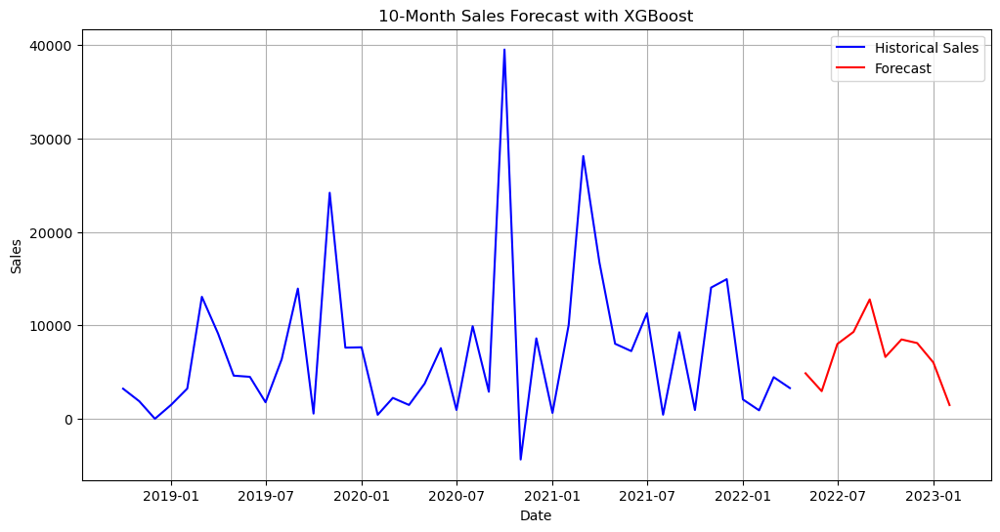

/var/folders/z6/_vn8cndd4x5dmx2cpjfdkjdr0000gn/T/ipykernel_48953/3455576394.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_set_9["Sales_EUR"] = results["yhat"]


,Mapped_GCK,Sales_EUR
Month Year,,
2022-05-01,#9,4865.081055
2022-06-01,#9,2953.448975
2022-07-01,#9,8001.385742
2022-08-01,#9,9297.159180
2022-09-01,#9,12775.570312
2022-10-01,#9,6612.581055
2022-11-01,#9,8488.691406
2022-12-01,#9,8099.565918
2023-01-01,#9,6017.742188


In [62]:
best_model, best_params, best_rmse, best_model_name = select_best_model(
    prophet_best_model_9, prophet_best_params_9, prophet_best_rmse_9, "Prophet",
    xgboost_best_model_9, xgboost_best_params_9, xgboost_best_rmse_9, "XGBoost"
    , sarima_best_model_9, sarima_best_params_9, sarima_best_rmse_9, "SARIMA"
)
print(f"Best Model: {best_model_name}")
print("Best Parameters:", best_params)
print("Best RMSE:", best_rmse)

if best_model_name == "XGBoost":
    results = xgboost_forecast(
        sales_agg9,
        df_market_9,
        period=10,
        params =best_params,
    )
elif best_model_name == "SARIMA":
    results = sarima_forecast(
        sales_agg9,
        period=10,
        params =best_params,
    )
else:
    results = prophet_forecast(
        sales_agg9,
        df_market_9,
        period=10,
        param =best_params,
    )
results.set_index('ds',inplace = True)
test_set_9.set_index('Month Year', inplace = True)
test_set_9["Sales_EUR"] = results["yhat"]
test_set_9

# Product 11

In [63]:
# selecte only the features that are selected in the feature selection step
test_set_11 = test_set[test_set['Mapped_GCK'] == '#11']
df_market_11 = df_market[selected_features_11]
df_market_11.head()

,MAB_ELE_SHP392_lag_6,MAB_ELE_SHP250_lag_5,MAB_ELE_PRO826_lag_2,MAB_ELE_SHP392_lag_5,PRO27276_org_lag_5,MAB_ELE_SHP756_lag_5,PRO27826_org_lag_1
date,,,,,,,
2004-02-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2004-03-01,NaN,NaN,NaN,NaN,NaN,NaN,120.706516
2004-04-01,NaN,NaN,111.353812,NaN,NaN,NaN,138.309550
2004-05-01,NaN,NaN,127.558608,NaN,NaN,NaN,115.557330
2004-06-01,NaN,NaN,108.732297,NaN,NaN,NaN,119.269534


## Xgboost

In [64]:
X_train, X_val, y_train, y_val = train_val_split(sales_agg11, df_market_11, train_size = 0.8)

X_val.info() 

xgboost_best_model_11, xgboost_best_params_11, xgboost_best_rmse_11 = model_evaluation_XGboost(X_train,
                                                                                             y_train, 
                                                                                             X_val, y_val, 
                                                                                             xgboost_param_grid)

print("Best Params:", xgboost_best_params_11)
print("Validation RMSE:", xgboost_best_rmse_11)

<class 'pandas.core.frame.DataFrame'>
Index: 9 entries, 2021-08-01 to 2022-04-01
Data columns (total 7 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   MAB_ELE_SHP392_lag_6  9 non-null      float64
 1   MAB_ELE_SHP250_lag_5  9 non-null      float64
 2   MAB_ELE_PRO826_lag_2  9 non-null      float64
 3   MAB_ELE_SHP392_lag_5  9 non-null      float64
 4   PRO27276_org_lag_5    9 non-null      float64
 5   MAB_ELE_SHP756_lag_5  9 non-null      float64
 6   PRO27826_org_lag_1    9 non-null      float64
dtypes: float64(7)
memory usage: 576.0+ bytes
Params: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.01, 'subsample': 0.5, 'colsample_bytree': 0.5, 'gamma': 0, 'reg_alpha': 0, 'reg_lambda': 0} => RMSE: 1044376.6608, Relative RMSE: 0.5664
Params: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.01, 'subsample': 0.5, 'colsample_bytree': 0.5, 'gamma': 0, 'reg_alpha': 0, 'reg_lambda': 0.1} => RMSE: 1047105.4177, 

## Prophet

In [65]:
prophet_best_model_11, prophet_best_params_11, prophet_best_rmse_11 = model_evaluation_prophet(X_train,
                                                                                             y_train, 
                                                                                             X_val, 
                                                                                             y_val, 
                                                                                             prophet_param_grid)

print("Best Params:", prophet_best_params_11)

print("Validation RMSE:", prophet_best_rmse_11)

01:48:25 - cmdstanpy - INFO - Chain [1] start processing
01:48:25 - cmdstanpy - INFO - Chain [1] done processing
01:48:25 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 1089065.3890, Relative RMSE: 0.5907


01:48:25 - cmdstanpy - INFO - Chain [1] done processing
01:48:25 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 1089065.7551, Relative RMSE: 0.5907


01:48:26 - cmdstanpy - INFO - Chain [1] done processing
01:48:26 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 1089063.7724, Relative RMSE: 0.5907


01:48:26 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 1086559.4832, Relative RMSE: 0.5893


01:48:26 - cmdstanpy - INFO - Chain [1] start processing
01:48:26 - cmdstanpy - INFO - Chain [1] done processing
01:48:26 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 1087000.2123, Relative RMSE: 0.5896


01:48:26 - cmdstanpy - INFO - Chain [1] done processing
01:48:26 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 1085546.0863, Relative RMSE: 0.5888


01:48:26 - cmdstanpy - INFO - Chain [1] done processing
01:48:26 - cmdstanpy - INFO - Chain [1] start processing
01:48:27 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 1089790.7646, Relative RMSE: 0.5911


01:48:27 - cmdstanpy - INFO - Chain [1] start processing
01:48:27 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 1089486.1828, Relative RMSE: 0.5909


01:48:27 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 1089440.1946, Relative RMSE: 0.5909


01:48:27 - cmdstanpy - INFO - Chain [1] done processing
01:48:27 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 1089351.2735, Relative RMSE: 0.5908


01:48:27 - cmdstanpy - INFO - Chain [1] done processing
01:48:27 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 1088743.8292, Relative RMSE: 0.5905


01:48:28 - cmdstanpy - INFO - Chain [1] done processing
01:48:28 - cmdstanpy - INFO - Chain [1] start processing
01:48:28 - cmdstanpy - INFO - Chain [1] done processing
01:48:28 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 1089423.0602, Relative RMSE: 0.5909
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 1088522.4684, Relative RMSE: 0.5904


01:48:28 - cmdstanpy - INFO - Chain [1] done processing
01:48:28 - cmdstanpy - INFO - Chain [1] start processing
01:48:28 - cmdstanpy - INFO - Chain [1] done processing
01:48:28 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 1088522.9174, Relative RMSE: 0.5904
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 1088522.9222, Relative RMSE: 0.5904


01:48:29 - cmdstanpy - INFO - Chain [1] done processing
01:48:29 - cmdstanpy - INFO - Chain [1] start processing
01:48:29 - cmdstanpy - INFO - Chain [1] done processing
01:48:29 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 1088482.5702, Relative RMSE: 0.5904
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 1088482.8032, Relative RMSE: 0.5904


01:48:29 - cmdstanpy - INFO - Chain [1] done processing
01:48:29 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 1088277.1227, Relative RMSE: 0.5903


01:48:29 - cmdstanpy - INFO - Chain [1] done processing
01:48:29 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 1088481.7280, Relative RMSE: 0.5904


01:48:29 - cmdstanpy - INFO - Chain [1] done processing
01:48:29 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 1088496.2534, Relative RMSE: 0.5904


01:48:30 - cmdstanpy - INFO - Chain [1] done processing
01:48:30 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 1087921.5758, Relative RMSE: 0.5901


01:48:30 - cmdstanpy - INFO - Chain [1] done processing
01:48:30 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 1084938.8020, Relative RMSE: 0.5884


01:48:30 - cmdstanpy - INFO - Chain [1] done processing
01:48:30 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 1083526.2102, Relative RMSE: 0.5877


01:48:31 - cmdstanpy - INFO - Chain [1] done processing
01:48:31 - cmdstanpy - INFO - Chain [1] start processing
01:48:31 - cmdstanpy - INFO - Chain [1] done processing
01:48:31 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 1083509.6820, Relative RMSE: 0.5877
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 7395057.4002, Relative RMSE: 4.0109


01:48:31 - cmdstanpy - INFO - Chain [1] done processing
01:48:31 - cmdstanpy - INFO - Chain [1] start processing
01:48:31 - cmdstanpy - INFO - Chain [1] done processing
01:48:31 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 7397937.0389, Relative RMSE: 4.0125
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 7401911.9814, Relative RMSE: 4.0146


01:48:31 - cmdstanpy - INFO - Chain [1] done processing
01:48:31 - cmdstanpy - INFO - Chain [1] start processing
01:48:31 - cmdstanpy - INFO - Chain [1] done processing
01:48:31 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 7348865.9137, Relative RMSE: 3.9859
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 7352754.4017, Relative RMSE: 3.9880


01:48:31 - cmdstanpy - INFO - Chain [1] done processing
01:48:32 - cmdstanpy - INFO - Chain [1] start processing
01:48:32 - cmdstanpy - INFO - Chain [1] done processing
01:48:32 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 7419525.8354, Relative RMSE: 4.0242
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 7351244.8126, Relative RMSE: 3.9872


01:48:32 - cmdstanpy - INFO - Chain [1] done processing
01:48:32 - cmdstanpy - INFO - Chain [1] start processing
01:48:32 - cmdstanpy - INFO - Chain [1] done processing
01:48:32 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 7353327.3780, Relative RMSE: 3.9883
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 7353764.2027, Relative RMSE: 3.9885


01:48:32 - cmdstanpy - INFO - Chain [1] done processing
01:48:32 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 8002880.8106, Relative RMSE: 4.3406


01:48:33 - cmdstanpy - INFO - Chain [1] done processing
01:48:33 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 7936683.5526, Relative RMSE: 4.3047


01:48:33 - cmdstanpy - INFO - Chain [1] done processing
01:48:33 - cmdstanpy - INFO - Chain [1] start processing
01:48:33 - cmdstanpy - INFO - Chain [1] done processing
01:48:33 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 7935180.9180, Relative RMSE: 4.3039
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 10321538.2455, Relative RMSE: 5.5982


01:48:33 - cmdstanpy - INFO - Chain [1] done processing
01:48:33 - cmdstanpy - INFO - Chain [1] start processing
01:48:33 - cmdstanpy - INFO - Chain [1] done processing
01:48:33 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 10321539.8626, Relative RMSE: 5.5982
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 10321535.2565, Relative RMSE: 5.5982


01:48:33 - cmdstanpy - INFO - Chain [1] done processing
01:48:33 - cmdstanpy - INFO - Chain [1] start processing
01:48:34 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 10230519.9730, Relative RMSE: 5.5488


01:48:34 - cmdstanpy - INFO - Chain [1] start processing
01:48:34 - cmdstanpy - INFO - Chain [1] done processing
01:48:34 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 10099102.7998, Relative RMSE: 5.4775
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 10218401.2361, Relative RMSE: 5.5423


01:48:34 - cmdstanpy - INFO - Chain [1] done processing
01:48:34 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 10250030.3198, Relative RMSE: 5.5594


01:48:34 - cmdstanpy - INFO - Chain [1] done processing
01:48:34 - cmdstanpy - INFO - Chain [1] start processing
01:48:35 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 10248753.1609, Relative RMSE: 5.5587


01:48:35 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 10249486.1969, Relative RMSE: 5.5591


01:48:35 - cmdstanpy - INFO - Chain [1] done processing
01:48:35 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 10273581.5288, Relative RMSE: 5.5722


01:48:35 - cmdstanpy - INFO - Chain [1] done processing
01:48:35 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 10385947.0262, Relative RMSE: 5.6331


01:48:36 - cmdstanpy - INFO - Chain [1] done processing
01:48:36 - cmdstanpy - INFO - Chain [1] start processing
01:48:36 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 10274673.9924, Relative RMSE: 5.5728


01:48:36 - cmdstanpy - INFO - Chain [1] start processing
01:48:36 - cmdstanpy - INFO - Chain [1] done processing
01:48:36 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 1109098.6371, Relative RMSE: 0.6016
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 1109117.6051, Relative RMSE: 0.6016


01:48:36 - cmdstanpy - INFO - Chain [1] done processing
01:48:37 - cmdstanpy - INFO - Chain [1] start processing
01:48:37 - cmdstanpy - INFO - Chain [1] done processing
01:48:37 - cmdstanpy - INFO - Chain [1] start processing
01:48:37 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 1102977.2144, Relative RMSE: 0.5982
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 1084697.2661, Relative RMSE: 0.5883


01:48:37 - cmdstanpy - INFO - Chain [1] start processing
01:48:37 - cmdstanpy - INFO - Chain [1] done processing
01:48:37 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 1082149.6369, Relative RMSE: 0.5869
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 1084276.0028, Relative RMSE: 0.5881


01:48:37 - cmdstanpy - INFO - Chain [1] done processing
01:48:37 - cmdstanpy - INFO - Chain [1] start processing
01:48:37 - cmdstanpy - INFO - Chain [1] done processing
01:48:37 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 1087542.5304, Relative RMSE: 0.5899
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 1091018.5896, Relative RMSE: 0.5917


01:48:37 - cmdstanpy - INFO - Chain [1] done processing
01:48:37 - cmdstanpy - INFO - Chain [1] start processing
01:48:37 - cmdstanpy - INFO - Chain [1] done processing
01:48:37 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 1088926.0806, Relative RMSE: 0.5906
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 1089016.1777, Relative RMSE: 0.5907


01:48:38 - cmdstanpy - INFO - Chain [1] done processing
01:48:38 - cmdstanpy - INFO - Chain [1] start processing
01:48:38 - cmdstanpy - INFO - Chain [1] done processing
01:48:38 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 1088745.4461, Relative RMSE: 0.5905
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 1089311.5132, Relative RMSE: 0.5908


01:48:38 - cmdstanpy - INFO - Chain [1] done processing
01:48:38 - cmdstanpy - INFO - Chain [1] start processing
01:48:38 - cmdstanpy - INFO - Chain [1] done processing
01:48:38 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 1109098.6371, Relative RMSE: 0.6016
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 1109117.6051, Relative RMSE: 0.6016


01:48:39 - cmdstanpy - INFO - Chain [1] done processing
01:48:39 - cmdstanpy - INFO - Chain [1] start processing
01:48:39 - cmdstanpy - INFO - Chain [1] done processing
01:48:39 - cmdstanpy - INFO - Chain [1] start processing
01:48:39 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 1102977.2144, Relative RMSE: 0.5982
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 1084697.2661, Relative RMSE: 0.5883


01:48:39 - cmdstanpy - INFO - Chain [1] start processing
01:48:39 - cmdstanpy - INFO - Chain [1] done processing
01:48:39 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 1082149.6369, Relative RMSE: 0.5869
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 1084276.0028, Relative RMSE: 0.5881


01:48:39 - cmdstanpy - INFO - Chain [1] done processing
01:48:39 - cmdstanpy - INFO - Chain [1] start processing
01:48:39 - cmdstanpy - INFO - Chain [1] done processing
01:48:39 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 1087542.5304, Relative RMSE: 0.5899
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 1091018.5896, Relative RMSE: 0.5917


01:48:40 - cmdstanpy - INFO - Chain [1] done processing
01:48:40 - cmdstanpy - INFO - Chain [1] start processing
01:48:40 - cmdstanpy - INFO - Chain [1] done processing
01:48:40 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 1088926.0806, Relative RMSE: 0.5906
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 1089016.1777, Relative RMSE: 0.5907


01:48:40 - cmdstanpy - INFO - Chain [1] done processing
01:48:40 - cmdstanpy - INFO - Chain [1] start processing
01:48:40 - cmdstanpy - INFO - Chain [1] done processing
01:48:40 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 1088745.4461, Relative RMSE: 0.5905
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 1089311.5132, Relative RMSE: 0.5908


01:48:40 - cmdstanpy - INFO - Chain [1] done processing
01:48:40 - cmdstanpy - INFO - Chain [1] start processing
01:48:40 - cmdstanpy - INFO - Chain [1] done processing
01:48:40 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 1109098.6371, Relative RMSE: 0.6016
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 1109117.6051, Relative RMSE: 0.6016


01:48:41 - cmdstanpy - INFO - Chain [1] done processing
01:48:41 - cmdstanpy - INFO - Chain [1] start processing
01:48:41 - cmdstanpy - INFO - Chain [1] done processing
01:48:41 - cmdstanpy - INFO - Chain [1] start processing
01:48:41 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 1102977.2144, Relative RMSE: 0.5982
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 1084697.2661, Relative RMSE: 0.5883


01:48:41 - cmdstanpy - INFO - Chain [1] start processing
01:48:41 - cmdstanpy - INFO - Chain [1] done processing
01:48:41 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 1082149.6369, Relative RMSE: 0.5869
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 1084276.0028, Relative RMSE: 0.5881


01:48:42 - cmdstanpy - INFO - Chain [1] done processing
01:48:42 - cmdstanpy - INFO - Chain [1] start processing
01:48:42 - cmdstanpy - INFO - Chain [1] done processing
01:48:42 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 1087542.5304, Relative RMSE: 0.5899
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 1091018.5896, Relative RMSE: 0.5917


01:48:42 - cmdstanpy - INFO - Chain [1] done processing
01:48:42 - cmdstanpy - INFO - Chain [1] start processing
01:48:42 - cmdstanpy - INFO - Chain [1] done processing
01:48:42 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 1088926.0806, Relative RMSE: 0.5906
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 1089016.1777, Relative RMSE: 0.5907


01:48:42 - cmdstanpy - INFO - Chain [1] done processing
01:48:42 - cmdstanpy - INFO - Chain [1] start processing
01:48:42 - cmdstanpy - INFO - Chain [1] done processing
01:48:42 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 1088745.4461, Relative RMSE: 0.5905
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 1089311.5132, Relative RMSE: 0.5908


01:48:43 - cmdstanpy - INFO - Chain [1] done processing
01:48:43 - cmdstanpy - INFO - Chain [1] start processing
01:48:43 - cmdstanpy - INFO - Chain [1] done processing
01:48:43 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 1109098.6371, Relative RMSE: 0.6016
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 1109117.6051, Relative RMSE: 0.6016


01:48:43 - cmdstanpy - INFO - Chain [1] done processing
01:48:43 - cmdstanpy - INFO - Chain [1] start processing
01:48:43 - cmdstanpy - INFO - Chain [1] done processing
01:48:43 - cmdstanpy - INFO - Chain [1] start processing
01:48:44 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 1102977.2144, Relative RMSE: 0.5982
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 1084697.2661, Relative RMSE: 0.5883


01:48:44 - cmdstanpy - INFO - Chain [1] start processing
01:48:44 - cmdstanpy - INFO - Chain [1] done processing
01:48:44 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 1082149.6369, Relative RMSE: 0.5869
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 1084276.0028, Relative RMSE: 0.5881


01:48:44 - cmdstanpy - INFO - Chain [1] done processing
01:48:44 - cmdstanpy - INFO - Chain [1] start processing
01:48:44 - cmdstanpy - INFO - Chain [1] done processing
01:48:44 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 1087542.5304, Relative RMSE: 0.5899
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 1091018.5896, Relative RMSE: 0.5917


01:48:44 - cmdstanpy - INFO - Chain [1] done processing
01:48:44 - cmdstanpy - INFO - Chain [1] start processing
01:48:44 - cmdstanpy - INFO - Chain [1] done processing
01:48:44 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 1088926.0806, Relative RMSE: 0.5906
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 1089016.1777, Relative RMSE: 0.5907


01:48:45 - cmdstanpy - INFO - Chain [1] done processing
01:48:45 - cmdstanpy - INFO - Chain [1] start processing
01:48:45 - cmdstanpy - INFO - Chain [1] done processing
01:48:45 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 1088745.4461, Relative RMSE: 0.5905
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 1089311.5132, Relative RMSE: 0.5908


01:48:45 - cmdstanpy - INFO - Chain [1] done processing
01:48:45 - cmdstanpy - INFO - Chain [1] start processing
01:48:45 - cmdstanpy - INFO - Chain [1] done processing
01:48:45 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 1107120.6417, Relative RMSE: 0.6005
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 1107143.2819, Relative RMSE: 0.6005


01:48:46 - cmdstanpy - INFO - Chain [1] done processing
01:48:46 - cmdstanpy - INFO - Chain [1] start processing
01:48:46 - cmdstanpy - INFO - Chain [1] done processing
01:48:46 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 1107108.8119, Relative RMSE: 0.6005
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 1083089.3763, Relative RMSE: 0.5874


01:48:46 - cmdstanpy - INFO - Chain [1] done processing
01:48:46 - cmdstanpy - INFO - Chain [1] start processing
01:48:46 - cmdstanpy - INFO - Chain [1] done processing
01:48:46 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 1082880.4651, Relative RMSE: 0.5873
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 1084548.4298, Relative RMSE: 0.5882


01:48:46 - cmdstanpy - INFO - Chain [1] done processing
01:48:46 - cmdstanpy - INFO - Chain [1] start processing
01:48:46 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 1090462.5426, Relative RMSE: 0.5914
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 1088350.2942, Relative RMSE: 0.5903


01:48:46 - cmdstanpy - INFO - Chain [1] start processing
01:48:47 - cmdstanpy - INFO - Chain [1] done processing
01:48:47 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 1088185.5130, Relative RMSE: 0.5902


01:48:47 - cmdstanpy - INFO - Chain [1] done processing
01:48:47 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 1088514.4791, Relative RMSE: 0.5904


01:48:47 - cmdstanpy - INFO - Chain [1] done processing
01:48:47 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 1088354.6809, Relative RMSE: 0.5903


01:48:47 - cmdstanpy - INFO - Chain [1] done processing
01:48:47 - cmdstanpy - INFO - Chain [1] start processing
01:48:48 - cmdstanpy - INFO - Chain [1] done processing
01:48:48 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 1087864.0242, Relative RMSE: 0.5900
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 1068881.8655, Relative RMSE: 0.5797


01:48:48 - cmdstanpy - INFO - Chain [1] done processing
01:48:48 - cmdstanpy - INFO - Chain [1] start processing
01:48:48 - cmdstanpy - INFO - Chain [1] done processing
01:48:48 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 1068927.6926, Relative RMSE: 0.5798
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 1068924.3224, Relative RMSE: 0.5798


01:48:48 - cmdstanpy - INFO - Chain [1] done processing
01:48:48 - cmdstanpy - INFO - Chain [1] start processing
01:48:48 - cmdstanpy - INFO - Chain [1] done processing
01:48:48 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 1064529.2262, Relative RMSE: 0.5774
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 1064218.3842, Relative RMSE: 0.5772


01:48:48 - cmdstanpy - INFO - Chain [1] done processing
01:48:48 - cmdstanpy - INFO - Chain [1] start processing
01:48:48 - cmdstanpy - INFO - Chain [1] done processing
01:48:48 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 1064095.7019, Relative RMSE: 0.5771
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 1065959.0278, Relative RMSE: 0.5782


01:48:49 - cmdstanpy - INFO - Chain [1] done processing
01:48:49 - cmdstanpy - INFO - Chain [1] start processing
01:48:49 - cmdstanpy - INFO - Chain [1] done processing
01:48:49 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 1066185.7183, Relative RMSE: 0.5783
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 1065116.0137, Relative RMSE: 0.5777


01:48:49 - cmdstanpy - INFO - Chain [1] done processing
01:48:49 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 1065903.8451, Relative RMSE: 0.5781


01:48:49 - cmdstanpy - INFO - Chain [1] done processing
01:48:49 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 1065849.5790, Relative RMSE: 0.5781


01:48:50 - cmdstanpy - INFO - Chain [1] done processing
01:48:50 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 1065939.4701, Relative RMSE: 0.5781


01:48:52 - cmdstanpy - INFO - Chain [1] done processing
01:48:52 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 2364372.1443, Relative RMSE: 1.2824


01:48:52 - cmdstanpy - INFO - Chain [1] done processing
01:48:52 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 2331274.5084, Relative RMSE: 1.2644


01:48:55 - cmdstanpy - INFO - Chain [1] done processing
01:48:55 - cmdstanpy - INFO - Chain [1] start processing
01:48:55 - cmdstanpy - INFO - Chain [1] done processing
01:48:55 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 2128572.2267, Relative RMSE: 1.1545
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 2851693.8604, Relative RMSE: 1.5467


01:48:56 - cmdstanpy - INFO - Chain [1] done processing
01:48:56 - cmdstanpy - INFO - Chain [1] start processing
01:48:56 - cmdstanpy - INFO - Chain [1] done processing
01:48:56 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 2861357.9907, Relative RMSE: 1.5519
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 2862336.0538, Relative RMSE: 1.5525


01:48:56 - cmdstanpy - INFO - Chain [1] done processing
01:48:56 - cmdstanpy - INFO - Chain [1] start processing
01:48:56 - cmdstanpy - INFO - Chain [1] done processing
01:48:56 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 2812942.4998, Relative RMSE: 1.5257
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 2818352.2629, Relative RMSE: 1.5286


01:48:56 - cmdstanpy - INFO - Chain [1] done processing
01:48:56 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 2790069.1247, Relative RMSE: 1.5133


01:48:56 - cmdstanpy - INFO - Chain [1] done processing
01:48:57 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 2821519.4688, Relative RMSE: 1.5303


01:48:57 - cmdstanpy - INFO - Chain [1] done processing
01:48:57 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 2821451.1945, Relative RMSE: 1.5303


01:48:57 - cmdstanpy - INFO - Chain [1] done processing
01:48:57 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 2819325.8268, Relative RMSE: 1.5291


01:48:58 - cmdstanpy - INFO - Chain [1] done processing
01:48:58 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 12203268.0491, Relative RMSE: 6.6188


01:48:58 - cmdstanpy - INFO - Chain [1] done processing
01:48:58 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 12194011.1307, Relative RMSE: 6.6138


01:48:59 - cmdstanpy - INFO - Chain [1] done processing
01:48:59 - cmdstanpy - INFO - Chain [1] start processing
01:48:59 - cmdstanpy - INFO - Chain [1] done processing
01:48:59 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 12143516.7295, Relative RMSE: 6.5864
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 11516302.8776, Relative RMSE: 6.2462


01:48:59 - cmdstanpy - INFO - Chain [1] done processing
01:48:59 - cmdstanpy - INFO - Chain [1] start processing
01:48:59 - cmdstanpy - INFO - Chain [1] done processing
01:48:59 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 11510123.4241, Relative RMSE: 6.2429
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 11516324.3594, Relative RMSE: 6.2462


01:48:59 - cmdstanpy - INFO - Chain [1] done processing
01:48:59 - cmdstanpy - INFO - Chain [1] start processing
01:48:59 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 11522842.4376, Relative RMSE: 6.2498


01:48:59 - cmdstanpy - INFO - Chain [1] start processing
01:49:00 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 11464927.8218, Relative RMSE: 6.2183
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 11485831.3893, Relative RMSE: 6.2297


01:49:00 - cmdstanpy - INFO - Chain [1] start processing
01:49:00 - cmdstanpy - INFO - Chain [1] done processing
01:49:00 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 12876563.9405, Relative RMSE: 6.9840


01:49:00 - cmdstanpy - INFO - Chain [1] done processing
01:49:00 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 12883332.7756, Relative RMSE: 6.9877


01:49:00 - cmdstanpy - INFO - Chain [1] done processing
01:49:00 - cmdstanpy - INFO - Chain [1] start processing
01:49:01 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 12874124.0629, Relative RMSE: 6.9827
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 1109098.6371, Relative RMSE: 0.6016


01:49:01 - cmdstanpy - INFO - Chain [1] start processing
01:49:01 - cmdstanpy - INFO - Chain [1] done processing
01:49:01 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 1109117.6051, Relative RMSE: 0.6016


01:49:01 - cmdstanpy - INFO - Chain [1] done processing
01:49:01 - cmdstanpy - INFO - Chain [1] start processing
01:49:01 - cmdstanpy - INFO - Chain [1] done processing
01:49:02 - cmdstanpy - INFO - Chain [1] start processing
01:49:02 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 1102977.2144, Relative RMSE: 0.5982
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 1084697.2661, Relative RMSE: 0.5883


01:49:02 - cmdstanpy - INFO - Chain [1] start processing
01:49:02 - cmdstanpy - INFO - Chain [1] done processing
01:49:02 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 1082149.6369, Relative RMSE: 0.5869
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 1084276.0028, Relative RMSE: 0.5881


01:49:02 - cmdstanpy - INFO - Chain [1] done processing
01:49:02 - cmdstanpy - INFO - Chain [1] start processing
01:49:02 - cmdstanpy - INFO - Chain [1] done processing
01:49:02 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 1087542.5304, Relative RMSE: 0.5899
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 1091018.5896, Relative RMSE: 0.5917


01:49:02 - cmdstanpy - INFO - Chain [1] done processing
01:49:02 - cmdstanpy - INFO - Chain [1] start processing
01:49:02 - cmdstanpy - INFO - Chain [1] done processing
01:49:02 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 1088926.0806, Relative RMSE: 0.5906
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 1089016.1777, Relative RMSE: 0.5907


01:49:03 - cmdstanpy - INFO - Chain [1] done processing
01:49:03 - cmdstanpy - INFO - Chain [1] start processing
01:49:03 - cmdstanpy - INFO - Chain [1] done processing
01:49:03 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 1088745.4461, Relative RMSE: 0.5905
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 1089311.5132, Relative RMSE: 0.5908


01:49:03 - cmdstanpy - INFO - Chain [1] done processing
01:49:03 - cmdstanpy - INFO - Chain [1] start processing
01:49:03 - cmdstanpy - INFO - Chain [1] done processing
01:49:03 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 1109098.6371, Relative RMSE: 0.6016
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 1109117.6051, Relative RMSE: 0.6016


01:49:04 - cmdstanpy - INFO - Chain [1] done processing
01:49:04 - cmdstanpy - INFO - Chain [1] start processing
01:49:04 - cmdstanpy - INFO - Chain [1] done processing
01:49:04 - cmdstanpy - INFO - Chain [1] start processing
01:49:04 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 1102977.2144, Relative RMSE: 0.5982
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 1084697.2661, Relative RMSE: 0.5883


01:49:04 - cmdstanpy - INFO - Chain [1] start processing
01:49:04 - cmdstanpy - INFO - Chain [1] done processing
01:49:04 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 1082149.6369, Relative RMSE: 0.5869
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 1084276.0028, Relative RMSE: 0.5881


01:49:04 - cmdstanpy - INFO - Chain [1] done processing
01:49:04 - cmdstanpy - INFO - Chain [1] start processing
01:49:04 - cmdstanpy - INFO - Chain [1] done processing
01:49:04 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 1087542.5304, Relative RMSE: 0.5899
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 1091018.5896, Relative RMSE: 0.5917


01:49:04 - cmdstanpy - INFO - Chain [1] done processing
01:49:04 - cmdstanpy - INFO - Chain [1] start processing
01:49:05 - cmdstanpy - INFO - Chain [1] done processing
01:49:05 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 1088926.0806, Relative RMSE: 0.5906
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 1089016.1777, Relative RMSE: 0.5907


01:49:05 - cmdstanpy - INFO - Chain [1] done processing
01:49:05 - cmdstanpy - INFO - Chain [1] start processing
01:49:05 - cmdstanpy - INFO - Chain [1] done processing
01:49:05 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 1088745.4461, Relative RMSE: 0.5905
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 1089311.5132, Relative RMSE: 0.5908


01:49:05 - cmdstanpy - INFO - Chain [1] done processing
01:49:05 - cmdstanpy - INFO - Chain [1] start processing
01:49:05 - cmdstanpy - INFO - Chain [1] done processing
01:49:05 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 1109098.6371, Relative RMSE: 0.6016
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 1109117.6051, Relative RMSE: 0.6016


01:49:06 - cmdstanpy - INFO - Chain [1] done processing
01:49:06 - cmdstanpy - INFO - Chain [1] start processing
01:49:06 - cmdstanpy - INFO - Chain [1] done processing
01:49:06 - cmdstanpy - INFO - Chain [1] start processing
01:49:06 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 1102977.2144, Relative RMSE: 0.5982
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 1084697.2661, Relative RMSE: 0.5883


01:49:06 - cmdstanpy - INFO - Chain [1] start processing
01:49:06 - cmdstanpy - INFO - Chain [1] done processing
01:49:06 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 1082149.6369, Relative RMSE: 0.5869
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 1084276.0028, Relative RMSE: 0.5881


01:49:06 - cmdstanpy - INFO - Chain [1] done processing
01:49:06 - cmdstanpy - INFO - Chain [1] start processing
01:49:07 - cmdstanpy - INFO - Chain [1] done processing
01:49:07 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 1087542.5304, Relative RMSE: 0.5899
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 1091018.5896, Relative RMSE: 0.5917


01:49:07 - cmdstanpy - INFO - Chain [1] done processing
01:49:07 - cmdstanpy - INFO - Chain [1] start processing
01:49:07 - cmdstanpy - INFO - Chain [1] done processing
01:49:07 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 1088926.0806, Relative RMSE: 0.5906
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 1089016.1777, Relative RMSE: 0.5907


01:49:07 - cmdstanpy - INFO - Chain [1] done processing
01:49:07 - cmdstanpy - INFO - Chain [1] start processing
01:49:07 - cmdstanpy - INFO - Chain [1] done processing
01:49:07 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 1088745.4461, Relative RMSE: 0.5905
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 1089311.5132, Relative RMSE: 0.5908


01:49:08 - cmdstanpy - INFO - Chain [1] done processing
01:49:08 - cmdstanpy - INFO - Chain [1] start processing
01:49:08 - cmdstanpy - INFO - Chain [1] done processing
01:49:08 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 1109098.6371, Relative RMSE: 0.6016
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 1109117.6051, Relative RMSE: 0.6016


01:49:08 - cmdstanpy - INFO - Chain [1] done processing
01:49:08 - cmdstanpy - INFO - Chain [1] start processing
01:49:08 - cmdstanpy - INFO - Chain [1] done processing
01:49:08 - cmdstanpy - INFO - Chain [1] start processing
01:49:08 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 1102977.2144, Relative RMSE: 0.5982
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 1084697.2661, Relative RMSE: 0.5883


01:49:08 - cmdstanpy - INFO - Chain [1] start processing
01:49:09 - cmdstanpy - INFO - Chain [1] done processing
01:49:09 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 1082149.6369, Relative RMSE: 0.5869
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 1084276.0028, Relative RMSE: 0.5881


01:49:09 - cmdstanpy - INFO - Chain [1] done processing
01:49:09 - cmdstanpy - INFO - Chain [1] start processing
01:49:09 - cmdstanpy - INFO - Chain [1] done processing
01:49:09 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 1087542.5304, Relative RMSE: 0.5899
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 1091018.5896, Relative RMSE: 0.5917


01:49:09 - cmdstanpy - INFO - Chain [1] done processing
01:49:09 - cmdstanpy - INFO - Chain [1] start processing
01:49:09 - cmdstanpy - INFO - Chain [1] done processing
01:49:09 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 1088926.0806, Relative RMSE: 0.5906
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 1089016.1777, Relative RMSE: 0.5907


01:49:09 - cmdstanpy - INFO - Chain [1] done processing
01:49:09 - cmdstanpy - INFO - Chain [1] start processing
01:49:10 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 1088745.4461, Relative RMSE: 0.5905
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 1089311.5132, Relative RMSE: 0.5908
Best Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0}
Validation RMSE: 1064095.7019137396


## Sarima

In [66]:
sarima_best_model_11, sarima_best_params_11, sarima_best_rmse_11 = model_evaluation_SARIMA(y_train, 
                                                             y_val, 
                                                             sarima_param_grid)

print("Best Params:", sarima_best_params_11)
print("Validation RMSE:", sarima_best_rmse_11)

SARIMA(0,0,0) x (0,0,0,6) => RMSE: 2126546.8666, Relative RMSE: 1.1534


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,0) x (0,0,0,12) => RMSE: 2126546.8666, Relative RMSE: 1.1534
SARIMA(0,0,0) x (0,0,1,6) => RMSE: 1906102.6100, Relative RMSE: 1.0338
SARIMA(0,0,0) x (0,0,1,12) => RMSE: 1844074.7132, Relative RMSE: 1.0002
SARIMA(0,0,0) x (0,1,0,6) => RMSE: 1144612.2485, Relative RMSE: 0.6208
SARIMA(0,0,0) x (0,1,0,12) => RMSE: 987669.4031, Relative RMSE: 0.5357
SARIMA(0,0,0) x (0,1,1,6) => RMSE: 869821.5652, Relative RMSE: 0.4718
SARIMA(0,0,0) x (0,1,1,12) => RMSE: 850173.1656, Relative RMSE: 0.4611
SARIMA(0,0,0) x (1,0,0,6) => RMSE: 1284153.9381, Relative RMSE: 0.6965
SARIMA(0,0,0) x (1,0,0,12) => RMSE: 1088948.5388, Relative RMSE: 0.5906
SARIMA(0,0,0) x (1,0,1,6) => RMSE: 843819.8206, Relative RMSE: 0.4577
SARIMA(0,0,0) x (1,0,1,12) => RMSE: 938368.7650, Relative RMSE: 0.5090
SARIMA(0,0,0) x (1,1,0,6) => RMSE: 845097.7009, Relative RMSE: 0.4584


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,0) x (1,1,0,12) => RMSE: 822051.2028, Relative RMSE: 0.4459
SARIMA(0,0,0) x (1,1,1,6) => RMSE: 811739.2400, Relative RMSE: 0.4403
SARIMA(0,0,0) x (1,1,1,12) => RMSE: 972693.1552, Relative RMSE: 0.5276
SARIMA(0,0,1) x (0,0,0,6) => RMSE: 1983853.4219, Relative RMSE: 1.0760
SARIMA(0,0,1) x (0,0,0,12) => RMSE: 1983853.4219, Relative RMSE: 1.0760
SARIMA(0,0,1) x (0,0,1,6) => RMSE: 1745042.6563, Relative RMSE: 0.9465
SARIMA(0,0,1) x (0,0,1,12) => RMSE: 1682656.4235, Relative RMSE: 0.9126
SARIMA(0,0,1) x (0,1,0,6) => RMSE: 1162359.0017, Relative RMSE: 0.6304
SARIMA(0,0,1) x (0,1,0,12) => RMSE: 978410.2880, Relative RMSE: 0.5307
SARIMA(0,0,1) x (0,1,1,6) => RMSE: 868620.0326, Relative RMSE: 0.4711
SARIMA(0,0,1) x (0,1,1,12) => RMSE: 930190.5736, Relative RMSE: 0.5045


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,0,1) x (1,0,0,6) => RMSE: 1339811.7412, Relative RMSE: 0.7267
SARIMA(0,0,1) x (1,0,0,12) => RMSE: 1041524.8195, Relative RMSE: 0.5649


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,1) x (1,0,1,6) => RMSE: 840838.0474, Relative RMSE: 0.4561
SARIMA(0,0,1) x (1,0,1,12) => RMSE: 1007373.4869, Relative RMSE: 0.5464
SARIMA(0,0,1) x (1,1,0,6) => RMSE: 862290.0563, Relative RMSE: 0.4677
SARIMA(0,0,1) x (1,1,0,12) => RMSE: 936209.0482, Relative RMSE: 0.5078
SARIMA(0,0,1) x (1,1,1,6) => RMSE: 831470.2155, Relative RMSE: 0.4510
SARIMA(0,0,1) x (1,1,1,12) => RMSE: 893844.6590, Relative RMSE: 0.4848


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,2) x (0,0,0,6) => RMSE: 1921469.7298, Relative RMSE: 1.0422
SARIMA(0,0,2) x (0,0,0,12) => RMSE: 1921469.7298, Relative RMSE: 1.0422


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,0,2) x (0,0,1,6) => RMSE: 1740867.6538, Relative RMSE: 0.9442
SARIMA(0,0,2) x (0,0,1,12) => RMSE: 1749376.5563, Relative RMSE: 0.9488
SARIMA(0,0,2) x (0,1,0,6) => RMSE: 1472907.7317, Relative RMSE: 0.7989
SARIMA(0,0,2) x (0,1,0,12) => RMSE: 939001.9835, Relative RMSE: 0.5093
SARIMA(0,0,2) x (0,1,1,6) => RMSE: 829546.2331, Relative RMSE: 0.4499
SARIMA(0,0,2) x (0,1,1,12) => RMSE: 936653.8354, Relative RMSE: 0.5080
SARIMA(0,0,2) x (1,0,0,6) => RMSE: 1463100.8286, Relative RMSE: 0.7936
SARIMA(0,0,2) x (1,0,0,12) => RMSE: 947916.9338, Relative RMSE: 0.5141


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,2) x (1,0,1,6) => RMSE: 954313.1216, Relative RMSE: 0.5176
SARIMA(0,0,2) x (1,0,1,12) => RMSE: 1176145.0970, Relative RMSE: 0.6379
SARIMA(0,0,2) x (1,1,0,6) => RMSE: 861677.0205, Relative RMSE: 0.4674
SARIMA(0,0,2) x (1,1,0,12) => RMSE: 898003.3498, Relative RMSE: 0.4871
SARIMA(0,0,2) x (1,1,1,6) => RMSE: 849728.0628, Relative RMSE: 0.4609


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,0,2) x (1,1,1,12) => RMSE: 1130287.9203, Relative RMSE: 0.6130
SARIMA(0,1,0) x (0,0,0,6) => RMSE: 1135975.6729, Relative RMSE: 0.6161
SARIMA(0,1,0) x (0,0,0,12) => RMSE: 1135975.6729, Relative RMSE: 0.6161
SARIMA(0,1,0) x (0,0,1,6) => RMSE: 1378440.7801, Relative RMSE: 0.7476
SARIMA(0,1,0) x (0,0,1,12) => RMSE: 998758.8554, Relative RMSE: 0.5417
SARIMA(0,1,0) x (0,1,0,6) => RMSE: 3272050.5411, Relative RMSE: 1.7747
SARIMA(0,1,0) x (0,1,0,12) => RMSE: 935031.7126, Relative RMSE: 0.5071
SARIMA(0,1,0) x (0,1,1,6) => RMSE: 1625643.2735, Relative RMSE: 0.8817
SARIMA(0,1,0) x (0,1,1,12) => RMSE: 3666550.0364, Relative RMSE: 1.9887
SARIMA(0,1,0) x (1,0,0,6) => RMSE: 1368915.0722, Relative RMSE: 0.7425
SARIMA(0,1,0) x (1,0,0,12) => RMSE: 979393.6371, Relative RMSE: 0.5312
SARIMA(0,1,0) x (1,0,1,6) => RMSE: 1363194.3642, Relative RMSE: 0.7394
SARIMA(0,1,0) x (1,0,1,12) => RMSE: 1035011.7276, Relative RMSE: 0.5614
SARIMA(0,1,0) x (1,1,0,6) => RMSE: 1823414.5069, Relative RMSE: 0.9890
SA

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,1,0) x (1,1,1,12) => RMSE: 3517023.8726, Relative RMSE: 1.9076
SARIMA(0,1,1) x (0,0,0,6) => RMSE: 1136474.2175, Relative RMSE: 0.6164
SARIMA(0,1,1) x (0,0,0,12) => RMSE: 1136474.2175, Relative RMSE: 0.6164
SARIMA(0,1,1) x (0,0,1,6) => RMSE: 1132932.9823, Relative RMSE: 0.6145
SARIMA(0,1,1) x (0,0,1,12) => RMSE: 1097353.0846, Relative RMSE: 0.5952
SARIMA(0,1,1) x (0,1,0,6) => RMSE: 1167087.3587, Relative RMSE: 0.6330
SARIMA(0,1,1) x (0,1,0,12) => RMSE: 953071.1216, Relative RMSE: 0.5169
SARIMA(0,1,1) x (0,1,1,6) => RMSE: 903495.9882, Relative RMSE: 0.4900
SARIMA(0,1,1) x (0,1,1,12) => RMSE: 3884351.4784, Relative RMSE: 2.1068
SARIMA(0,1,1) x (1,0,0,6) => RMSE: 1134508.1601, Relative RMSE: 0.6153
SARIMA(0,1,1) x (1,0,0,12) => RMSE: 974514.8606, Relative RMSE: 0.5286


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,1) x (1,0,1,6) => RMSE: 928817.3686, Relative RMSE: 0.5038
SARIMA(0,1,1) x (1,0,1,12) => RMSE: 1002613.3998, Relative RMSE: 0.5438
SARIMA(0,1,1) x (1,1,0,6) => RMSE: 838076.1307, Relative RMSE: 0.4546
SARIMA(0,1,1) x (1,1,0,12) => RMSE: 874257.5437, Relative RMSE: 0.4742
SARIMA(0,1,1) x (1,1,1,6) => RMSE: 855809.9661, Relative RMSE: 0.4642
SARIMA(0,1,1) x (1,1,1,12) => RMSE: 3547059.1111, Relative RMSE: 1.9239
SARIMA(0,1,2) x (0,0,0,6) => RMSE: 1140051.5709, Relative RMSE: 0.6183
SARIMA(0,1,2) x (0,0,0,12) => RMSE: 1140051.5709, Relative RMSE: 0.6183


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,1,2) x (0,0,1,6) => RMSE: 1133297.8610, Relative RMSE: 0.6147
SARIMA(0,1,2) x (0,0,1,12) => RMSE: 1162677.4192, Relative RMSE: 0.6306
SARIMA(0,1,2) x (0,1,0,6) => RMSE: 1219783.2105, Relative RMSE: 0.6616
SARIMA(0,1,2) x (0,1,0,12) => RMSE: 1006858.3022, Relative RMSE: 0.5461
SARIMA(0,1,2) x (0,1,1,6) => RMSE: 904865.0304, Relative RMSE: 0.4908
SARIMA(0,1,2) x (0,1,1,12) => RMSE: 1206526.5149, Relative RMSE: 0.6544
SARIMA(0,1,2) x (1,0,0,6) => RMSE: 1131395.7180, Relative RMSE: 0.6136


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,1,2) x (1,0,0,12) => RMSE: 959114.9654, Relative RMSE: 0.5202
SARIMA(0,1,2) x (1,0,1,6) => RMSE: 931273.0439, Relative RMSE: 0.5051
SARIMA(0,1,2) x (1,0,1,12) => RMSE: 1014505.9054, Relative RMSE: 0.5502
SARIMA(0,1,2) x (1,1,0,6) => RMSE: 837756.7988, Relative RMSE: 0.4544


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(0,1,2) x (1,1,0,12) => RMSE: 715045.7093, Relative RMSE: 0.3878
SARIMA(0,1,2) x (1,1,1,6) => RMSE: 802425.7998, Relative RMSE: 0.4352
SARIMA(0,1,2) x (1,1,1,12) => RMSE: 1589551.6949, Relative RMSE: 0.8621
SARIMA(1,0,0) x (0,0,0,6) => RMSE: 1571821.1318, Relative RMSE: 0.8525
SARIMA(1,0,0) x (0,0,0,12) => RMSE: 1571821.1318, Relative RMSE: 0.8525
SARIMA(1,0,0) x (0,0,1,6) => RMSE: 1482807.5460, Relative RMSE: 0.8042
SARIMA(1,0,0) x (0,0,1,12) => RMSE: 1692711.8633, Relative RMSE: 0.9181
SARIMA(1,0,0) x (0,1,0,6) => RMSE: 1149147.7663, Relative RMSE: 0.6233


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,0) x (0,1,0,12) => RMSE: 990721.9900, Relative RMSE: 0.5373
SARIMA(1,0,0) x (0,1,1,6) => RMSE: 870279.4174, Relative RMSE: 0.4720
SARIMA(1,0,0) x (0,1,1,12) => RMSE: 896492.7935, Relative RMSE: 0.4862
SARIMA(1,0,0) x (1,0,0,6) => RMSE: 1329917.8593, Relative RMSE: 0.7213
SARIMA(1,0,0) x (1,0,0,12) => RMSE: 1069365.8865, Relative RMSE: 0.5800
SARIMA(1,0,0) x (1,0,1,6) => RMSE: 838931.3579, Relative RMSE: 0.4550
SARIMA(1,0,0) x (1,0,1,12) => RMSE: 946372.6026, Relative RMSE: 0.5133
SARIMA(1,0,0) x (1,1,0,6) => RMSE: 855396.0820, Relative RMSE: 0.4639
SARIMA(1,0,0) x (1,1,0,12) => RMSE: 887476.8307, Relative RMSE: 0.4813
SARIMA(1,0,0) x (1,1,1,6) => RMSE: 825686.8104, Relative RMSE: 0.4478


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,0) x (1,1,1,12) => RMSE: 969066.8836, Relative RMSE: 0.5256
SARIMA(1,0,1) x (0,0,0,6) => RMSE: 1263417.3369, Relative RMSE: 0.6853
SARIMA(1,0,1) x (0,0,0,12) => RMSE: 1263417.3369, Relative RMSE: 0.6853
SARIMA(1,0,1) x (0,0,1,6) => RMSE: 1274304.0162, Relative RMSE: 0.6912
SARIMA(1,0,1) x (0,0,1,12) => RMSE: 1058199.2459, Relative RMSE: 0.5739
SARIMA(1,0,1) x (0,1,0,6) => RMSE: 1261289.0949, Relative RMSE: 0.6841
SARIMA(1,0,1) x (0,1,0,12) => RMSE: 978346.0957, Relative RMSE: 0.5306


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,1) x (0,1,1,6) => RMSE: 890678.6547, Relative RMSE: 0.4831
SARIMA(1,0,1) x (0,1,1,12) => RMSE: 932891.2014, Relative RMSE: 0.5060
SARIMA(1,0,1) x (1,0,0,6) => RMSE: 1191367.5633, Relative RMSE: 0.6462
SARIMA(1,0,1) x (1,0,0,12) => RMSE: 940139.8087, Relative RMSE: 0.5099


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,0,1) x (1,0,1,6) => RMSE: 874096.4238, Relative RMSE: 0.4741
SARIMA(1,0,1) x (1,0,1,12) => RMSE: 985157.2788, Relative RMSE: 0.5343
SARIMA(1,0,1) x (1,1,0,6) => RMSE: 861808.6026, Relative RMSE: 0.4674
SARIMA(1,0,1) x (1,1,0,12) => RMSE: 908419.4234, Relative RMSE: 0.4927
SARIMA(1,0,1) x (1,1,1,6) => RMSE: 831955.6754, Relative RMSE: 0.4512


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/en

SARIMA(1,0,1) x (1,1,1,12) => RMSE: 908343.7554, Relative RMSE: 0.4927
SARIMA(1,0,2) x (0,0,0,6) => RMSE: 1305923.6063, Relative RMSE: 0.7083
SARIMA(1,0,2) x (0,0,0,12) => RMSE: 1305923.6063, Relative RMSE: 0.7083
SARIMA(1,0,2) x (0,0,1,6) => RMSE: 1374446.3082, Relative RMSE: 0.7455
SARIMA(1,0,2) x (0,0,1,12) => RMSE: 1056299.4198, Relative RMSE: 0.5729


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,2) x (0,1,0,6) => RMSE: 1329168.2799, Relative RMSE: 0.7209
SARIMA(1,0,2) x (0,1,0,12) => RMSE: 960420.9442, Relative RMSE: 0.5209
SARIMA(1,0,2) x (0,1,1,6) => RMSE: 815619.5353, Relative RMSE: 0.4424
SARIMA(1,0,2) x (0,1,1,12) => RMSE: 936251.5362, Relative RMSE: 0.5078


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,2) x (1,0,0,6) => RMSE: 1169196.6875, Relative RMSE: 0.6341
SARIMA(1,0,2) x (1,0,0,12) => RMSE: 966449.8051, Relative RMSE: 0.5242
SARIMA(1,0,2) x (1,0,1,6) => RMSE: 961075.6004, Relative RMSE: 0.5213


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,2) x (1,0,1,12) => RMSE: 974590.1572, Relative RMSE: 0.5286
SARIMA(1,0,2) x (1,1,0,6) => RMSE: 888276.3535, Relative RMSE: 0.4818
SARIMA(1,0,2) x (1,1,0,12) => RMSE: 907749.2542, Relative RMSE: 0.4923
SARIMA(1,0,2) x (1,1,1,6) => RMSE: 813131.5990, Relative RMSE: 0.4410


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,2) x (1,1,1,12) => RMSE: 1130786.2887, Relative RMSE: 0.6133
SARIMA(1,1,0) x (0,0,0,6) => RMSE: 1059333.4607, Relative RMSE: 0.5746
SARIMA(1,1,0) x (0,0,0,12) => RMSE: 1059333.4607, Relative RMSE: 0.5746
SARIMA(1,1,0) x (0,0,1,6) => RMSE: 1155032.8380, Relative RMSE: 0.6265
SARIMA(1,1,0) x (0,0,1,12) => RMSE: 1005883.1635, Relative RMSE: 0.5456
SARIMA(1,1,0) x (0,1,0,6) => RMSE: 2386992.1755, Relative RMSE: 1.2947
SARIMA(1,1,0) x (0,1,0,12) => RMSE: 1148254.1654, Relative RMSE: 0.6228
SARIMA(1,1,0) x (0,1,1,6) => RMSE: 1083059.2296, Relative RMSE: 0.5874
SARIMA(1,1,0) x (0,1,1,12) => RMSE: 820289.6642, Relative RMSE: 0.4449
SARIMA(1,1,0) x (1,0,0,6) => RMSE: 1140197.0627, Relative RMSE: 0.6184
SARIMA(1,1,0) x (1,0,0,12) => RMSE: 957474.5203, Relative RMSE: 0.5193
SARIMA(1,1,0) x (1,0,1,6) => RMSE: 1126434.1609, Relative RMSE: 0.6110
SARIMA(1,1,0) x (1,0,1,12) => RMSE: 1153071.0990, Relative RMSE: 0.6254
SARIMA(1,1,0) x (1,1,0,6) => RMSE: 1133069.5277, Relative RMSE: 0.6146


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,0) x (1,1,0,12) => RMSE: 716083.7156, Relative RMSE: 0.3884
SARIMA(1,1,0) x (1,1,1,6) => RMSE: 1353919.2033, Relative RMSE: 0.7343
SARIMA(1,1,0) x (1,1,1,12) => RMSE: 2697072.1568, Relative RMSE: 1.4628
SARIMA(1,1,1) x (0,0,0,6) => RMSE: 1136703.5485, Relative RMSE: 0.6165
SARIMA(1,1,1) x (0,0,0,12) => RMSE: 1136703.5485, Relative RMSE: 0.6165
SARIMA(1,1,1) x (0,0,1,6) => RMSE: 1131848.9129, Relative RMSE: 0.6139
SARIMA(1,1,1) x (0,0,1,12) => RMSE: 1116358.0691, Relative RMSE: 0.6055
SARIMA(1,1,1) x (0,1,0,6) => RMSE: 1202251.1508, Relative RMSE: 0.6521


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,1,1) x (0,1,0,12) => RMSE: 975587.6190, Relative RMSE: 0.5291
SARIMA(1,1,1) x (0,1,1,6) => RMSE: 974715.6397, Relative RMSE: 0.5287
SARIMA(1,1,1) x (0,1,1,12) => RMSE: 718845.0799, Relative RMSE: 0.3899
SARIMA(1,1,1) x (1,0,0,6) => RMSE: 1031123.8654, Relative RMSE: 0.5593
SARIMA(1,1,1) x (1,0,0,12) => RMSE: 962004.6520, Relative RMSE: 0.5218


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,1,1) x (1,0,1,6) => RMSE: 944763.4844, Relative RMSE: 0.5124
SARIMA(1,1,1) x (1,0,1,12) => RMSE: 1073583.7049, Relative RMSE: 0.5823
SARIMA(1,1,1) x (1,1,0,6) => RMSE: 832846.5871, Relative RMSE: 0.4517
SARIMA(1,1,1) x (1,1,0,12) => RMSE: 743355.5299, Relative RMSE: 0.4032
SARIMA(1,1,1) x (1,1,1,6) => RMSE: 1055963.0730, Relative RMSE: 0.5727
SARIMA(1,1,1) x (1,1,1,12) => RMSE: 3100787.9587, Relative RMSE: 1.6818
SARIMA(1,1,2) x (0,0,0,6) => RMSE: 1138597.0139, Relative RMSE: 0.6176


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,1,2) x (0,0,0,12) => RMSE: 1138597.0139, Relative RMSE: 0.6176
SARIMA(1,1,2) x (0,0,1,6) => RMSE: 1149679.2087, Relative RMSE: 0.6236
SARIMA(1,1,2) x (0,0,1,12) => RMSE: 1141425.5025, Relative RMSE: 0.6191
SARIMA(1,1,2) x (0,1,0,6) => RMSE: 1328914.0099, Relative RMSE: 0.7208
SARIMA(1,1,2) x (0,1,0,12) => RMSE: 1029420.2721, Relative RMSE: 0.5583
SARIMA(1,1,2) x (0,1,1,6) => RMSE: 902391.6438, Relative RMSE: 0.4894


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,1,2) x (0,1,1,12) => RMSE: 878153.8276, Relative RMSE: 0.4763
SARIMA(1,1,2) x (1,0,0,6) => RMSE: 1147782.3348, Relative RMSE: 0.6225
SARIMA(1,1,2) x (1,0,0,12) => RMSE: 963461.2119, Relative RMSE: 0.5226
SARIMA(1,1,2) x (1,0,1,6) => RMSE: 925939.3194, Relative RMSE: 0.5022
SARIMA(1,1,2) x (1,0,1,12) => RMSE: 1239500.6126, Relative RMSE: 0.6723
SARIMA(1,1,2) x (1,1,0,6) => RMSE: 852977.2664, Relative RMSE: 0.4626


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,2) x (1,1,0,12) => RMSE: 759869.6399, Relative RMSE: 0.4121
SARIMA(1,1,2) x (1,1,1,6) => RMSE: 818199.4551, Relative RMSE: 0.4438
SARIMA(1,1,2) x (1,1,1,12) => RMSE: 1566320.2605, Relative RMSE: 0.8495
SARIMA(2,0,0) x (0,0,0,6) => RMSE: 1379243.9459, Relative RMSE: 0.7481
SARIMA(2,0,0) x (0,0,0,12) => RMSE: 1379243.9459, Relative RMSE: 0.7481


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,0) x (0,0,1,6) => RMSE: 1303626.0502, Relative RMSE: 0.7071
SARIMA(2,0,0) x (0,0,1,12) => RMSE: 1437400.0022, Relative RMSE: 0.7796
SARIMA(2,0,0) x (0,1,0,6) => RMSE: 1224422.4639, Relative RMSE: 0.6641
SARIMA(2,0,0) x (0,1,0,12) => RMSE: 892868.7292, Relative RMSE: 0.4843
SARIMA(2,0,0) x (0,1,1,6) => RMSE: 841223.8469, Relative RMSE: 0.4563
SARIMA(2,0,0) x (0,1,1,12) => RMSE: 912161.2184, Relative RMSE: 0.4947
SARIMA(2,0,0) x (1,0,0,6) => RMSE: 1275049.3233, Relative RMSE: 0.6916
SARIMA(2,0,0) x (1,0,0,12) => RMSE: 902849.4353, Relative RMSE: 0.4897
SARIMA(2,0,0) x (1,0,1,6) => RMSE: 847536.2699, Relative RMSE: 0.4597
SARIMA(2,0,0) x (1,0,1,12) => RMSE: 1526880.2164, Relative RMSE: 0.8281
SARIMA(2,0,0) x (1,1,0,6) => RMSE: 871251.1378, Relative RMSE: 0.4725


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,0) x (1,1,0,12) => RMSE: 994037.9298, Relative RMSE: 0.5391
SARIMA(2,0,0) x (1,1,1,6) => RMSE: 848718.0232, Relative RMSE: 0.4603
SARIMA(2,0,0) x (1,1,1,12) => RMSE: 87407922.9057, Relative RMSE: 47.4083
SARIMA(2,0,1) x (0,0,0,6) => RMSE: 1786192.5598, Relative RMSE: 0.9688
SARIMA(2,0,1) x (0,0,0,12) => RMSE: 1786192.5598, Relative RMSE: 0.9688


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,1) x (0,0,1,6) => RMSE: 1653472.9943, Relative RMSE: 0.8968
SARIMA(2,0,1) x (0,0,1,12) => RMSE: 3440867.7866, Relative RMSE: 1.8663
SARIMA(2,0,1) x (0,1,0,6) => RMSE: 1334820.3325, Relative RMSE: 0.7240
SARIMA(2,0,1) x (0,1,0,12) => RMSE: 942300.1219, Relative RMSE: 0.5111


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,1) x (0,1,1,6) => RMSE: 932990.2816, Relative RMSE: 0.5060
SARIMA(2,0,1) x (0,1,1,12) => RMSE: 928731.8721, Relative RMSE: 0.5037
SARIMA(2,0,1) x (1,0,0,6) => RMSE: 1078285.4137, Relative RMSE: 0.5848


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,1) x (1,0,0,12) => RMSE: 930514.9362, Relative RMSE: 0.5047
SARIMA(2,0,1) x (1,0,1,6) => RMSE: 939286.5504, Relative RMSE: 0.5094


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarni

SARIMA(2,0,1) x (1,0,1,12) => RMSE: 983774.1920, Relative RMSE: 0.5336
SARIMA(2,0,1) x (1,1,0,6) => RMSE: 928238.7229, Relative RMSE: 0.5035
SARIMA(2,0,1) x (1,1,0,12) => RMSE: 919558.8420, Relative RMSE: 0.4987
SARIMA(2,0,1) x (1,1,1,6) => RMSE: 907553.7242, Relative RMSE: 0.4922
SARIMA(2,0,1) x (1,1,1,12) => RMSE: 1017915.3865, Relative RMSE: 0.5521


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,2) x (0,0,0,6) => RMSE: 1954443.5775, Relative RMSE: 1.0601
SARIMA(2,0,2) x (0,0,0,12) => RMSE: 1954443.5775, Relative RMSE: 1.0601
SARIMA(2,0,2) x (0,0,1,6) => RMSE: 1994495.1587, Relative RMSE: 1.0818


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,2) x (0,0,1,12) => RMSE: 1214486.4817, Relative RMSE: 0.6587
SARIMA(2,0,2) x (0,1,0,6) => RMSE: 14677108.4409, Relative RMSE: 7.9606
SARIMA(2,0,2) x (0,1,0,12) => RMSE: 992653.5610, Relative RMSE: 0.5384


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarni

SARIMA(2,0,2) x (0,1,1,6) => RMSE: 1013812.1966, Relative RMSE: 0.5499
SARIMA(2,0,2) x (0,1,1,12) => RMSE: 1993057.5529, Relative RMSE: 1.0810


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,2) x (1,0,0,6) => RMSE: 1961213.2663, Relative RMSE: 1.0637
SARIMA(2,0,2) x (1,0,0,12) => RMSE: 999678.6124, Relative RMSE: 0.5422


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihoo

SARIMA(2,0,2) x (1,0,1,6) => RMSE: 991341.9134, Relative RMSE: 0.5377
SARIMA(2,0,2) x (1,0,1,12) => RMSE: 1159916.6521, Relative RMSE: 0.6291
SARIMA(2,0,2) x (1,1,0,6) => RMSE: 957655.3459, Relative RMSE: 0.5194


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,2) x (1,1,0,12) => RMSE: 756211.3053, Relative RMSE: 0.4102


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2,0,2) x (1,1,1,6) => RMSE: 845097.8903, Relative RMSE: 0.4584


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


SARIMA(2,0,2) x (1,1,1,12) => RMSE: 1901595.7454, Relative RMSE: 1.0314
SARIMA(2,1,0) x (0,0,0,6) => RMSE: 1142317.2391, Relative RMSE: 0.6196
SARIMA(2,1,0) x (0,0,0,12) => RMSE: 1142317.2391, Relative RMSE: 0.6196
SARIMA(2,1,0) x (0,0,1,6) => RMSE: 1177162.3635, Relative RMSE: 0.6385
SARIMA(2,1,0) x (0,0,1,12) => RMSE: 1172822.5960, Relative RMSE: 0.6361
SARIMA(2,1,0) x (0,1,0,6) => RMSE: 2349820.4582, Relative RMSE: 1.2745
SARIMA(2,1,0) x (0,1,0,12) => RMSE: 992764.4064, Relative RMSE: 0.5385
SARIMA(2,1,0) x (0,1,1,6) => RMSE: 1119016.2085, Relative RMSE: 0.6069
SARIMA(2,1,0) x (0,1,1,12) => RMSE: 870894.9282, Relative RMSE: 0.4724
SARIMA(2,1,0) x (1,0,0,6) => RMSE: 1186096.5881, Relative RMSE: 0.6433
SARIMA(2,1,0) x (1,0,0,12) => RMSE: 1017227.3752, Relative RMSE: 0.5517
SARIMA(2,1,0) x (1,0,1,6) => RMSE: 1149639.6195, Relative RMSE: 0.6235


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,0) x (1,0,1,12) => RMSE: 1517925.1561, Relative RMSE: 0.8233
SARIMA(2,1,0) x (1,1,0,6) => RMSE: 1134101.2409, Relative RMSE: 0.6151
SARIMA(2,1,0) x (1,1,0,12) => RMSE: 793640.9656, Relative RMSE: 0.4305
SARIMA(2,1,0) x (1,1,1,6) => RMSE: 1053875.3164, Relative RMSE: 0.5716
SARIMA(2,1,0) x (1,1,1,12) => RMSE: 7188662.5060, Relative RMSE: 3.8990


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,1) x (0,0,0,6) => RMSE: 1138842.9746, Relative RMSE: 0.6177
SARIMA(2,1,1) x (0,0,0,12) => RMSE: 1138842.9746, Relative RMSE: 0.6177
SARIMA(2,1,1) x (0,0,1,6) => RMSE: 1044114.5091, Relative RMSE: 0.5663
SARIMA(2,1,1) x (0,0,1,12) => RMSE: 1284615.3604, Relative RMSE: 0.6967
SARIMA(2,1,1) x (0,1,0,6) => RMSE: 2309714.2022, Relative RMSE: 1.2527
SARIMA(2,1,1) x (0,1,0,12) => RMSE: 933478.8754, Relative RMSE: 0.5063
SARIMA(2,1,1) x (0,1,1,6) => RMSE: 1207390.9837, Relative RMSE: 0.6549


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,1) x (0,1,1,12) => RMSE: 1858100.0025, Relative RMSE: 1.0078
SARIMA(2,1,1) x (1,0,0,6) => RMSE: 1140641.2326, Relative RMSE: 0.6187
SARIMA(2,1,1) x (1,0,0,12) => RMSE: 1009986.3002, Relative RMSE: 0.5478
SARIMA(2,1,1) x (1,0,1,6) => RMSE: 932294.9537, Relative RMSE: 0.5057
SARIMA(2,1,1) x (1,0,1,12) => RMSE: 1500200.9342, Relative RMSE: 0.8137


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,1) x (1,1,0,6) => RMSE: 1121271.9818, Relative RMSE: 0.6082
SARIMA(2,1,1) x (1,1,0,12) => RMSE: 791644.1537, Relative RMSE: 0.4294
SARIMA(2,1,1) x (1,1,1,6) => RMSE: 1081700.7139, Relative RMSE: 0.5867


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,1,1) x (1,1,1,12) => RMSE: 1852304.3586, Relative RMSE: 1.0047
SARIMA(2,1,2) x (0,0,0,6) => RMSE: 1189256.9296, Relative RMSE: 0.6450
SARIMA(2,1,2) x (0,0,0,12) => RMSE: 1189256.9296, Relative RMSE: 0.6450
SARIMA(2,1,2) x (0,0,1,6) => RMSE: 1204823.2104, Relative RMSE: 0.6535
SARIMA(2,1,2) x (0,0,1,12) => RMSE: 1244913.9749, Relative RMSE: 0.6752
SARIMA(2,1,2) x (0,1,0,6) => RMSE: 1327734.4307, Relative RMSE: 0.7201
SARIMA(2,1,2) x (0,1,0,12) => RMSE: 879228.6257, Relative RMSE: 0.4769


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,2) x (0,1,1,6) => RMSE: 1274209.7028, Relative RMSE: 0.6911
SARIMA(2,1,2) x (0,1,1,12) => RMSE: 1163019.4969, Relative RMSE: 0.6308
SARIMA(2,1,2) x (1,0,0,6) => RMSE: 1204815.7116, Relative RMSE: 0.6535


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,2) x (1,0,0,12) => RMSE: 981299.5072, Relative RMSE: 0.5322
SARIMA(2,1,2) x (1,0,1,6) => RMSE: 1009344.2658, Relative RMSE: 0.5474
SARIMA(2,1,2) x (1,0,1,12) => RMSE: 1238014.0197, Relative RMSE: 0.6715
SARIMA(2,1,2) x (1,1,0,6) => RMSE: 1216297.5702, Relative RMSE: 0.6597


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2,1,2) x (1,1,0,12) => RMSE: 671798.0559, Relative RMSE: 0.3644
SARIMA(2,1,2) x (1,1,1,6) => RMSE: 801430.7828, Relative RMSE: 0.4347


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


SARIMA(2,1,2) x (1,1,1,12) => RMSE: 649728.4676, Relative RMSE: 0.3524
Best Params: {'order': (2, 1, 2), 'seasonal_order': (1, 1, 1, 12)}
Validation RMSE: 649728.4676076479


## Final prediction 

Best Model: XGBoost
Best Parameters: {'n_estimators': 200, 'max_depth': 3, 'learning_rate': 0.1, 'subsample': 0.5, 'colsample_bytree': 1, 'gamma': 0, 'reg_alpha': 0.1, 'reg_lambda': 0.5}
Best RMSE: 552185.415958031


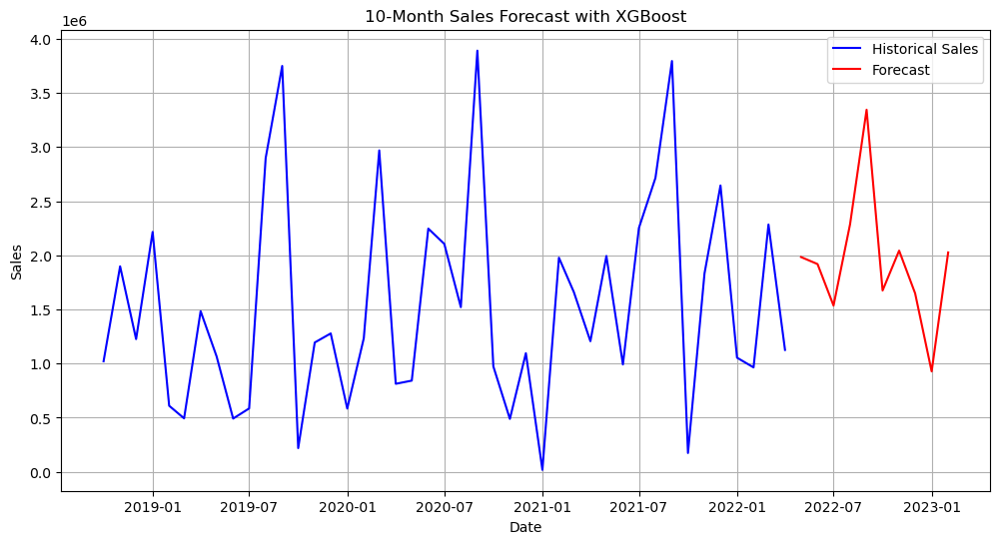

/var/folders/z6/_vn8cndd4x5dmx2cpjfdkjdr0000gn/T/ipykernel_48953/4005205758.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_set_11["Sales_EUR"] = results["yhat"]


,Mapped_GCK,Sales_EUR
Month Year,,
2022-05-01,#11,1.984461e+06
2022-06-01,#11,1.919444e+06
2022-07-01,#11,1.536129e+06
2022-08-01,#11,2.287631e+06
2022-09-01,#11,3.345618e+06
2022-10-01,#11,1.675213e+06
2022-11-01,#11,2.043531e+06
2022-12-01,#11,1.649186e+06
2023-01-01,#11,9.277151e+05


In [67]:
best_model, best_params, best_rmse, best_model_name = select_best_model(
    prophet_best_model_11, prophet_best_params_11, prophet_best_rmse_11, "Prophet",
    xgboost_best_model_11, xgboost_best_params_11, xgboost_best_rmse_11, "XGBoost"
    , sarima_best_model_11, sarima_best_params_11, sarima_best_rmse_11, "SARIMA"
)
print(f"Best Model: {best_model_name}")
print("Best Parameters:", best_params)
print("Best RMSE:", best_rmse)

if best_model_name == "XGBoost":
    results = xgboost_forecast(
        sales_agg11,
        df_market_11,
        period=10,
        params =best_params,
    )
elif best_model_name == "SARIMA":
    results = sarima_forecast(
        sales_agg11,
        period=10,
        params =best_params,
    )
else:
    results = prophet_forecast(
        sales_agg11,
        df_market_11,
        period=10,
        param =best_params,
    )
results.set_index('ds',inplace = True)
test_set_11.set_index('Month Year', inplace = True)
test_set_11["Sales_EUR"] = results["yhat"]
test_set_11

# Product 12

In [68]:
# selecte only the features that are selected in the feature selection step
test_set_12 = test_set[test_set['Mapped_GCK'] == '#12']
df_market_12 = df_market[selected_features_12]
df_market_12.head()

,PRO27756_org_lag_3,MAB_ELE_PRO826,WKLWEUR840_org_lag_5,MAB_ELE_PRO826_lag_3,MAB_ELE_PRO156_lag_5,PRO27392_org_lag_2,MAB_ELE_SHP392_lag_5
date,,,,,,,
2004-02-01,NaN,111.353812,NaN,NaN,NaN,NaN,NaN
2004-03-01,NaN,127.558608,NaN,NaN,NaN,NaN,NaN
2004-04-01,NaN,108.732297,NaN,NaN,NaN,106.161262,NaN
2004-05-01,68.677657,110.645200,NaN,111.353812,NaN,140.288741,NaN
2004-06-01,68.452548,122.020960,NaN,127.558608,NaN,106.271197,NaN


## Xgboost

In [69]:
X_train, X_val, y_train, y_val = train_val_split(sales_agg12, df_market_12, train_size = 0.8)

X_val.info() 

xgboost_best_model_12, xgboost_best_params_12, xgboost_best_rmse_12 = model_evaluation_XGboost(X_train,
                                                                                             y_train, 
                                                                                             X_val, y_val, 
                                                                                             xgboost_param_grid)

print("Best Params:", xgboost_best_params_12)
print("Validation RMSE:", xgboost_best_rmse_12)

<class 'pandas.core.frame.DataFrame'>
Index: 9 entries, 2021-08-01 to 2022-04-01
Data columns (total 7 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   PRO27756_org_lag_3    9 non-null      float64
 1   MAB_ELE_PRO826        9 non-null      float64
 2   WKLWEUR840_org_lag_5  9 non-null      float64
 3   MAB_ELE_PRO826_lag_3  9 non-null      float64
 4   MAB_ELE_PRO156_lag_5  9 non-null      float64
 5   PRO27392_org_lag_2    9 non-null      float64
 6   MAB_ELE_SHP392_lag_5  9 non-null      float64
dtypes: float64(7)
memory usage: 576.0+ bytes
Params: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.01, 'subsample': 0.5, 'colsample_bytree': 0.5, 'gamma': 0, 'reg_alpha': 0, 'reg_lambda': 0} => RMSE: 143279.5246, Relative RMSE: 0.5123
Params: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.01, 'subsample': 0.5, 'colsample_bytree': 0.5, 'gamma': 0, 'reg_alpha': 0, 'reg_lambda': 0.1} => RMSE: 143206.7357, Re

## Prophet

In [70]:
prophet_best_model_12, prophet_best_params_12, prophet_best_rmse_12 = model_evaluation_prophet(X_train,
                                                                                             y_train, 
                                                                                             X_val, 
                                                                                             y_val, 
                                                                                             prophet_param_grid)

print("Best Params:", prophet_best_params_12)

print("Validation RMSE:", prophet_best_rmse_12)

01:59:20 - cmdstanpy - INFO - Chain [1] start processing
01:59:20 - cmdstanpy - INFO - Chain [1] done processing
01:59:20 - cmdstanpy - INFO - Chain [1] start processing
01:59:20 - cmdstanpy - INFO - Chain [1] done processing
01:59:20 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 116108.9948, Relative RMSE: 0.4151
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 116109.0005, Relative RMSE: 0.4151


01:59:20 - cmdstanpy - INFO - Chain [1] done processing
01:59:20 - cmdstanpy - INFO - Chain [1] start processing
01:59:20 - cmdstanpy - INFO - Chain [1] done processing
01:59:20 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 116109.0137, Relative RMSE: 0.4151
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 117903.7852, Relative RMSE: 0.4216


01:59:20 - cmdstanpy - INFO - Chain [1] done processing
01:59:20 - cmdstanpy - INFO - Chain [1] start processing
01:59:20 - cmdstanpy - INFO - Chain [1] done processing
01:59:20 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 117944.0987, Relative RMSE: 0.4217
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 117895.1531, Relative RMSE: 0.4215


01:59:21 - cmdstanpy - INFO - Chain [1] done processing
01:59:21 - cmdstanpy - INFO - Chain [1] start processing
01:59:21 - cmdstanpy - INFO - Chain [1] done processing
01:59:21 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 118016.7677, Relative RMSE: 0.4220
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 117925.2927, Relative RMSE: 0.4216


01:59:21 - cmdstanpy - INFO - Chain [1] done processing
01:59:21 - cmdstanpy - INFO - Chain [1] start processing
01:59:21 - cmdstanpy - INFO - Chain [1] done processing
01:59:21 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 118018.6832, Relative RMSE: 0.4220
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 117700.5154, Relative RMSE: 0.4208


01:59:21 - cmdstanpy - INFO - Chain [1] done processing
01:59:21 - cmdstanpy - INFO - Chain [1] start processing
01:59:21 - cmdstanpy - INFO - Chain [1] done processing
01:59:22 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 117609.3688, Relative RMSE: 0.4205
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 117587.8232, Relative RMSE: 0.4204


01:59:23 - cmdstanpy - INFO - Chain [1] done processing
01:59:23 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 107876.3390, Relative RMSE: 0.3857


01:59:23 - cmdstanpy - INFO - Chain [1] done processing
01:59:23 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 108113.4819, Relative RMSE: 0.3866


01:59:24 - cmdstanpy - INFO - Chain [1] done processing
01:59:24 - cmdstanpy - INFO - Chain [1] start processing
01:59:24 - cmdstanpy - INFO - Chain [1] done processing
01:59:24 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 108209.7738, Relative RMSE: 0.3869
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 109981.2947, Relative RMSE: 0.3932


01:59:24 - cmdstanpy - INFO - Chain [1] done processing
01:59:24 - cmdstanpy - INFO - Chain [1] start processing
01:59:24 - cmdstanpy - INFO - Chain [1] done processing
01:59:24 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 109996.5003, Relative RMSE: 0.3933
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 109999.0200, Relative RMSE: 0.3933


01:59:25 - cmdstanpy - INFO - Chain [1] done processing
01:59:25 - cmdstanpy - INFO - Chain [1] start processing
01:59:25 - cmdstanpy - INFO - Chain [1] done processing
01:59:25 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 110012.0166, Relative RMSE: 0.3933
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 109974.6053, Relative RMSE: 0.3932


01:59:25 - cmdstanpy - INFO - Chain [1] done processing
01:59:25 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 109928.6261, Relative RMSE: 0.3930


01:59:25 - cmdstanpy - INFO - Chain [1] done processing
01:59:25 - cmdstanpy - INFO - Chain [1] start processing
01:59:25 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 122070.3339, Relative RMSE: 0.4365
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 128322.0664, Relative RMSE: 0.4588


01:59:25 - cmdstanpy - INFO - Chain [1] start processing
01:59:26 - cmdstanpy - INFO - Chain [1] done processing
01:59:26 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 126365.2290, Relative RMSE: 0.4518


01:59:29 - cmdstanpy - INFO - Chain [1] done processing
01:59:29 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 104702.9192, Relative RMSE: 0.3744


01:59:31 - cmdstanpy - INFO - Chain [1] done processing
01:59:31 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 105606.4322, Relative RMSE: 0.3776


01:59:33 - cmdstanpy - INFO - Chain [1] done processing
01:59:33 - cmdstanpy - INFO - Chain [1] start processing
01:59:33 - cmdstanpy - INFO - Chain [1] done processing
01:59:33 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 104701.1473, Relative RMSE: 0.3744
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 102940.9121, Relative RMSE: 0.3681


01:59:33 - cmdstanpy - INFO - Chain [1] done processing
01:59:33 - cmdstanpy - INFO - Chain [1] start processing
01:59:33 - cmdstanpy - INFO - Chain [1] done processing
01:59:33 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 102940.8883, Relative RMSE: 0.3681
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 102940.9695, Relative RMSE: 0.3681


01:59:33 - cmdstanpy - INFO - Chain [1] done processing
01:59:33 - cmdstanpy - INFO - Chain [1] start processing
01:59:33 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 102957.2096, Relative RMSE: 0.3681
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 102876.5039, Relative RMSE: 0.3678


01:59:33 - cmdstanpy - INFO - Chain [1] start processing
01:59:34 - cmdstanpy - INFO - Chain [1] done processing
01:59:34 - cmdstanpy - INFO - Chain [1] start processing
01:59:34 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 102891.1869, Relative RMSE: 0.3679


01:59:34 - cmdstanpy - INFO - Chain [1] start processing
01:59:34 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 115851.0538, Relative RMSE: 0.4142


01:59:34 - cmdstanpy - INFO - Chain [1] start processing
01:59:34 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 115741.2019, Relative RMSE: 0.4138


01:59:34 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 110335.7771, Relative RMSE: 0.3945


01:59:35 - cmdstanpy - INFO - Chain [1] done processing
01:59:35 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 102293.4799, Relative RMSE: 0.3657


01:59:35 - cmdstanpy - INFO - Chain [1] done processing
01:59:35 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 102293.1668, Relative RMSE: 0.3657


01:59:36 - cmdstanpy - INFO - Chain [1] done processing
01:59:36 - cmdstanpy - INFO - Chain [1] start processing
01:59:36 - cmdstanpy - INFO - Chain [1] done processing
01:59:36 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 102302.4491, Relative RMSE: 0.3658
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 102444.3423, Relative RMSE: 0.3663


01:59:36 - cmdstanpy - INFO - Chain [1] done processing
01:59:36 - cmdstanpy - INFO - Chain [1] start processing
01:59:36 - cmdstanpy - INFO - Chain [1] done processing
01:59:36 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 102367.2572, Relative RMSE: 0.3660
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 102411.2826, Relative RMSE: 0.3662


01:59:36 - cmdstanpy - INFO - Chain [1] done processing
01:59:36 - cmdstanpy - INFO - Chain [1] start processing
01:59:36 - cmdstanpy - INFO - Chain [1] done processing
01:59:37 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 102368.1395, Relative RMSE: 0.3660
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 102467.4899, Relative RMSE: 0.3664


01:59:37 - cmdstanpy - INFO - Chain [1] done processing
01:59:37 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 102404.2952, Relative RMSE: 0.3661


01:59:37 - cmdstanpy - INFO - Chain [1] done processing
01:59:37 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 123216.9018, Relative RMSE: 0.4406


01:59:37 - cmdstanpy - INFO - Chain [1] done processing
01:59:37 - cmdstanpy - INFO - Chain [1] start processing
01:59:37 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 116535.6423, Relative RMSE: 0.4167


01:59:37 - cmdstanpy - INFO - Chain [1] start processing
01:59:37 - cmdstanpy - INFO - Chain [1] done processing
01:59:37 - cmdstanpy - INFO - Chain [1] start processing
01:59:38 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 129155.1939, Relative RMSE: 0.4618
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 116544.0471, Relative RMSE: 0.4167


01:59:38 - cmdstanpy - INFO - Chain [1] start processing
01:59:38 - cmdstanpy - INFO - Chain [1] done processing
01:59:38 - cmdstanpy - INFO - Chain [1] start processing
01:59:38 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 116543.8729, Relative RMSE: 0.4167
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 116544.0642, Relative RMSE: 0.4167


01:59:38 - cmdstanpy - INFO - Chain [1] start processing
01:59:38 - cmdstanpy - INFO - Chain [1] done processing
01:59:38 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 118548.3495, Relative RMSE: 0.4239
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 118577.1657, Relative RMSE: 0.4240


01:59:38 - cmdstanpy - INFO - Chain [1] done processing
01:59:38 - cmdstanpy - INFO - Chain [1] start processing
01:59:38 - cmdstanpy - INFO - Chain [1] done processing
01:59:38 - cmdstanpy - INFO - Chain [1] start processing
01:59:38 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 118538.9808, Relative RMSE: 0.4238
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 118425.1987, Relative RMSE: 0.4234


01:59:38 - cmdstanpy - INFO - Chain [1] start processing
01:59:38 - cmdstanpy - INFO - Chain [1] done processing
01:59:38 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 118437.4037, Relative RMSE: 0.4235
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 118407.0932, Relative RMSE: 0.4234


01:59:39 - cmdstanpy - INFO - Chain [1] done processing
01:59:39 - cmdstanpy - INFO - Chain [1] start processing
01:59:39 - cmdstanpy - INFO - Chain [1] done processing
01:59:39 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 116913.5415, Relative RMSE: 0.4180
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 118141.8754, Relative RMSE: 0.4224


01:59:39 - cmdstanpy - INFO - Chain [1] done processing
01:59:39 - cmdstanpy - INFO - Chain [1] start processing
01:59:39 - cmdstanpy - INFO - Chain [1] done processing
01:59:39 - cmdstanpy - INFO - Chain [1] start processing
01:59:39 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 118274.9139, Relative RMSE: 0.4229
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 116544.0471, Relative RMSE: 0.4167


01:59:39 - cmdstanpy - INFO - Chain [1] start processing
01:59:39 - cmdstanpy - INFO - Chain [1] done processing
01:59:39 - cmdstanpy - INFO - Chain [1] start processing
01:59:39 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 116543.8729, Relative RMSE: 0.4167
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 116544.0642, Relative RMSE: 0.4167


01:59:39 - cmdstanpy - INFO - Chain [1] start processing
01:59:39 - cmdstanpy - INFO - Chain [1] done processing
01:59:39 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 118548.3495, Relative RMSE: 0.4239
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 118577.1657, Relative RMSE: 0.4240


01:59:39 - cmdstanpy - INFO - Chain [1] done processing
01:59:39 - cmdstanpy - INFO - Chain [1] start processing
01:59:40 - cmdstanpy - INFO - Chain [1] done processing
01:59:40 - cmdstanpy - INFO - Chain [1] start processing
01:59:40 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 118538.9808, Relative RMSE: 0.4238
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 118425.1987, Relative RMSE: 0.4234


01:59:40 - cmdstanpy - INFO - Chain [1] start processing
01:59:40 - cmdstanpy - INFO - Chain [1] done processing
01:59:40 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 118437.4037, Relative RMSE: 0.4235
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 118407.0932, Relative RMSE: 0.4234


01:59:40 - cmdstanpy - INFO - Chain [1] done processing
01:59:40 - cmdstanpy - INFO - Chain [1] start processing
01:59:40 - cmdstanpy - INFO - Chain [1] done processing
01:59:40 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 116913.5415, Relative RMSE: 0.4180
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 118141.8754, Relative RMSE: 0.4224


01:59:40 - cmdstanpy - INFO - Chain [1] done processing
01:59:40 - cmdstanpy - INFO - Chain [1] start processing
01:59:40 - cmdstanpy - INFO - Chain [1] done processing
01:59:40 - cmdstanpy - INFO - Chain [1] start processing
01:59:40 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 118274.9139, Relative RMSE: 0.4229
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 116544.0471, Relative RMSE: 0.4167


01:59:40 - cmdstanpy - INFO - Chain [1] start processing
01:59:40 - cmdstanpy - INFO - Chain [1] done processing
01:59:40 - cmdstanpy - INFO - Chain [1] start processing
01:59:41 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 116543.8729, Relative RMSE: 0.4167
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 116544.0642, Relative RMSE: 0.4167


01:59:41 - cmdstanpy - INFO - Chain [1] start processing
01:59:41 - cmdstanpy - INFO - Chain [1] done processing
01:59:41 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 118548.3495, Relative RMSE: 0.4239
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 118577.1657, Relative RMSE: 0.4240


01:59:41 - cmdstanpy - INFO - Chain [1] done processing
01:59:41 - cmdstanpy - INFO - Chain [1] start processing
01:59:41 - cmdstanpy - INFO - Chain [1] done processing
01:59:41 - cmdstanpy - INFO - Chain [1] start processing
01:59:41 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 118538.9808, Relative RMSE: 0.4238
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 118425.1987, Relative RMSE: 0.4234


01:59:41 - cmdstanpy - INFO - Chain [1] start processing
01:59:41 - cmdstanpy - INFO - Chain [1] done processing
01:59:41 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 118437.4037, Relative RMSE: 0.4235
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 118407.0932, Relative RMSE: 0.4234


01:59:41 - cmdstanpy - INFO - Chain [1] done processing
01:59:41 - cmdstanpy - INFO - Chain [1] start processing
01:59:41 - cmdstanpy - INFO - Chain [1] done processing
01:59:41 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 116913.5415, Relative RMSE: 0.4180
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 118141.8754, Relative RMSE: 0.4224


01:59:42 - cmdstanpy - INFO - Chain [1] done processing
01:59:42 - cmdstanpy - INFO - Chain [1] start processing
01:59:42 - cmdstanpy - INFO - Chain [1] done processing
01:59:42 - cmdstanpy - INFO - Chain [1] start processing
01:59:42 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 118274.9139, Relative RMSE: 0.4229
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 116544.0471, Relative RMSE: 0.4167


01:59:42 - cmdstanpy - INFO - Chain [1] start processing
01:59:42 - cmdstanpy - INFO - Chain [1] done processing
01:59:42 - cmdstanpy - INFO - Chain [1] start processing
01:59:42 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 116543.8729, Relative RMSE: 0.4167
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 116544.0642, Relative RMSE: 0.4167


01:59:42 - cmdstanpy - INFO - Chain [1] start processing
01:59:42 - cmdstanpy - INFO - Chain [1] done processing
01:59:42 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 118548.3495, Relative RMSE: 0.4239
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 118577.1657, Relative RMSE: 0.4240


01:59:42 - cmdstanpy - INFO - Chain [1] done processing
01:59:42 - cmdstanpy - INFO - Chain [1] start processing
01:59:42 - cmdstanpy - INFO - Chain [1] done processing
01:59:42 - cmdstanpy - INFO - Chain [1] start processing
01:59:42 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 118538.9808, Relative RMSE: 0.4238
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 118425.1987, Relative RMSE: 0.4234


01:59:42 - cmdstanpy - INFO - Chain [1] start processing
01:59:43 - cmdstanpy - INFO - Chain [1] done processing
01:59:43 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 118437.4037, Relative RMSE: 0.4235
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 118407.0932, Relative RMSE: 0.4234


01:59:43 - cmdstanpy - INFO - Chain [1] done processing
01:59:43 - cmdstanpy - INFO - Chain [1] start processing
01:59:43 - cmdstanpy - INFO - Chain [1] done processing
01:59:43 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 116913.5415, Relative RMSE: 0.4180
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 118141.8754, Relative RMSE: 0.4224


01:59:43 - cmdstanpy - INFO - Chain [1] done processing
01:59:43 - cmdstanpy - INFO - Chain [1] start processing
01:59:43 - cmdstanpy - INFO - Chain [1] done processing
01:59:43 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 118274.9139, Relative RMSE: 0.4229
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 116594.4524, Relative RMSE: 0.4169


01:59:43 - cmdstanpy - INFO - Chain [1] done processing
01:59:43 - cmdstanpy - INFO - Chain [1] start processing
01:59:43 - cmdstanpy - INFO - Chain [1] done processing
01:59:43 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 116603.0162, Relative RMSE: 0.4169
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 116594.3375, Relative RMSE: 0.4169


01:59:44 - cmdstanpy - INFO - Chain [1] done processing
01:59:44 - cmdstanpy - INFO - Chain [1] start processing
01:59:44 - cmdstanpy - INFO - Chain [1] done processing
01:59:44 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 118545.9935, Relative RMSE: 0.4239
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 118577.5114, Relative RMSE: 0.4240


01:59:44 - cmdstanpy - INFO - Chain [1] done processing
01:59:44 - cmdstanpy - INFO - Chain [1] start processing
01:59:44 - cmdstanpy - INFO - Chain [1] done processing
01:59:44 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 118539.0900, Relative RMSE: 0.4238
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 118075.3150, Relative RMSE: 0.4222


01:59:44 - cmdstanpy - INFO - Chain [1] done processing
01:59:44 - cmdstanpy - INFO - Chain [1] start processing
01:59:44 - cmdstanpy - INFO - Chain [1] done processing
01:59:44 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 118431.4755, Relative RMSE: 0.4234
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 118238.3855, Relative RMSE: 0.4228


01:59:45 - cmdstanpy - INFO - Chain [1] done processing
01:59:45 - cmdstanpy - INFO - Chain [1] start processing
01:59:45 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 118223.7732, Relative RMSE: 0.4227


01:59:45 - cmdstanpy - INFO - Chain [1] start processing
01:59:45 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 118307.9107, Relative RMSE: 0.4230
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 116678.0284, Relative RMSE: 0.4172


01:59:45 - cmdstanpy - INFO - Chain [1] start processing
01:59:45 - cmdstanpy - INFO - Chain [1] done processing
01:59:45 - cmdstanpy - INFO - Chain [1] start processing
01:59:45 - cmdstanpy - INFO - Chain [1] done processing
01:59:45 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 113236.5566, Relative RMSE: 0.4049
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 113230.5017, Relative RMSE: 0.4048


01:59:46 - cmdstanpy - INFO - Chain [1] done processing
01:59:46 - cmdstanpy - INFO - Chain [1] start processing
01:59:46 - cmdstanpy - INFO - Chain [1] done processing
01:59:46 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 113238.5090, Relative RMSE: 0.4049
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 114123.3885, Relative RMSE: 0.4080


01:59:46 - cmdstanpy - INFO - Chain [1] done processing
01:59:46 - cmdstanpy - INFO - Chain [1] start processing
01:59:46 - cmdstanpy - INFO - Chain [1] done processing
01:59:46 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 114122.3756, Relative RMSE: 0.4080
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 114348.5673, Relative RMSE: 0.4088


01:59:46 - cmdstanpy - INFO - Chain [1] done processing
01:59:46 - cmdstanpy - INFO - Chain [1] start processing
01:59:46 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 114808.0402, Relative RMSE: 0.4105


01:59:46 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 114751.3469, Relative RMSE: 0.4103


01:59:47 - cmdstanpy - INFO - Chain [1] done processing
01:59:47 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 114795.6787, Relative RMSE: 0.4104


01:59:47 - cmdstanpy - INFO - Chain [1] done processing
01:59:47 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 124811.8210, Relative RMSE: 0.4463


01:59:47 - cmdstanpy - INFO - Chain [1] done processing
01:59:47 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 124963.4579, Relative RMSE: 0.4468


01:59:48 - cmdstanpy - INFO - Chain [1] done processing
01:59:48 - cmdstanpy - INFO - Chain [1] start processing
01:59:48 - cmdstanpy - INFO - Chain [1] done processing
01:59:48 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 121980.4013, Relative RMSE: 0.4361
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 115004.2637, Relative RMSE: 0.4112


01:59:48 - cmdstanpy - INFO - Chain [1] done processing
01:59:48 - cmdstanpy - INFO - Chain [1] start processing
01:59:48 - cmdstanpy - INFO - Chain [1] done processing
01:59:48 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 115162.9369, Relative RMSE: 0.4118
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 115004.0412, Relative RMSE: 0.4112


01:59:48 - cmdstanpy - INFO - Chain [1] done processing
01:59:48 - cmdstanpy - INFO - Chain [1] start processing
01:59:48 - cmdstanpy - INFO - Chain [1] done processing
01:59:48 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 127275.1145, Relative RMSE: 0.4551
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 123700.0624, Relative RMSE: 0.4423


01:59:49 - cmdstanpy - INFO - Chain [1] done processing
01:59:49 - cmdstanpy - INFO - Chain [1] start processing
01:59:49 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 124254.3571, Relative RMSE: 0.4443


01:59:49 - cmdstanpy - INFO - Chain [1] start processing
01:59:49 - cmdstanpy - INFO - Chain [1] done processing
01:59:49 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 122006.5049, Relative RMSE: 0.4362
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 121925.4016, Relative RMSE: 0.4359


01:59:49 - cmdstanpy - INFO - Chain [1] done processing
01:59:49 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 122242.1114, Relative RMSE: 0.4371


01:59:49 - cmdstanpy - INFO - Chain [1] done processing
01:59:49 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 211735.1978, Relative RMSE: 0.7570


01:59:50 - cmdstanpy - INFO - Chain [1] done processing
01:59:50 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 246906.9795, Relative RMSE: 0.8828


01:59:50 - cmdstanpy - INFO - Chain [1] done processing
01:59:50 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 220800.2690, Relative RMSE: 0.7895


01:59:51 - cmdstanpy - INFO - Chain [1] done processing
01:59:51 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 755527.3151, Relative RMSE: 2.7013


01:59:52 - cmdstanpy - INFO - Chain [1] done processing
01:59:52 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 743500.4642, Relative RMSE: 2.6583


01:59:54 - cmdstanpy - INFO - Chain [1] done processing
01:59:54 - cmdstanpy - INFO - Chain [1] start processing
01:59:54 - cmdstanpy - INFO - Chain [1] done processing
01:59:54 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 753076.2345, Relative RMSE: 2.6926
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 838838.5221, Relative RMSE: 2.9992


01:59:54 - cmdstanpy - INFO - Chain [1] done processing
01:59:54 - cmdstanpy - INFO - Chain [1] start processing
01:59:55 - cmdstanpy - INFO - Chain [1] done processing
01:59:55 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 838633.7219, Relative RMSE: 2.9985
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 837889.4135, Relative RMSE: 2.9958


01:59:55 - cmdstanpy - INFO - Chain [1] done processing
01:59:55 - cmdstanpy - INFO - Chain [1] start processing
01:59:55 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 830768.2989, Relative RMSE: 2.9704
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 831213.3366, Relative RMSE: 2.9720


01:59:55 - cmdstanpy - INFO - Chain [1] start processing
01:59:55 - cmdstanpy - INFO - Chain [1] done processing
01:59:55 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 830272.3880, Relative RMSE: 2.9686


01:59:56 - cmdstanpy - INFO - Chain [1] done processing
01:59:56 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 1019159.0163, Relative RMSE: 3.6439


01:59:56 - cmdstanpy - INFO - Chain [1] done processing
01:59:56 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 1019814.7922, Relative RMSE: 3.6463


01:59:57 - cmdstanpy - INFO - Chain [1] done processing
01:59:57 - cmdstanpy - INFO - Chain [1] start processing
01:59:57 - cmdstanpy - INFO - Chain [1] done processing
01:59:57 - cmdstanpy - INFO - Chain [1] start processing
01:59:57 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 882399.6383, Relative RMSE: 3.1550
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 116544.0471, Relative RMSE: 0.4167


01:59:57 - cmdstanpy - INFO - Chain [1] start processing
01:59:57 - cmdstanpy - INFO - Chain [1] done processing
01:59:57 - cmdstanpy - INFO - Chain [1] start processing
01:59:57 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 116543.8729, Relative RMSE: 0.4167
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 116544.0642, Relative RMSE: 0.4167


01:59:57 - cmdstanpy - INFO - Chain [1] start processing
01:59:57 - cmdstanpy - INFO - Chain [1] done processing
01:59:57 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 118548.3495, Relative RMSE: 0.4239
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 118577.1657, Relative RMSE: 0.4240


01:59:57 - cmdstanpy - INFO - Chain [1] done processing
01:59:57 - cmdstanpy - INFO - Chain [1] start processing
01:59:58 - cmdstanpy - INFO - Chain [1] done processing
01:59:58 - cmdstanpy - INFO - Chain [1] start processing
01:59:58 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 118538.9808, Relative RMSE: 0.4238
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 118425.1987, Relative RMSE: 0.4234


01:59:58 - cmdstanpy - INFO - Chain [1] start processing
01:59:58 - cmdstanpy - INFO - Chain [1] done processing
01:59:58 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 118437.4037, Relative RMSE: 0.4235
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 118407.0932, Relative RMSE: 0.4234


01:59:58 - cmdstanpy - INFO - Chain [1] done processing
01:59:58 - cmdstanpy - INFO - Chain [1] start processing
01:59:58 - cmdstanpy - INFO - Chain [1] done processing
01:59:58 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 116913.5415, Relative RMSE: 0.4180
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 118141.8754, Relative RMSE: 0.4224


01:59:58 - cmdstanpy - INFO - Chain [1] done processing
01:59:58 - cmdstanpy - INFO - Chain [1] start processing
01:59:58 - cmdstanpy - INFO - Chain [1] done processing
01:59:58 - cmdstanpy - INFO - Chain [1] start processing
01:59:58 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 118274.9139, Relative RMSE: 0.4229
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 116544.0471, Relative RMSE: 0.4167


01:59:58 - cmdstanpy - INFO - Chain [1] start processing
01:59:58 - cmdstanpy - INFO - Chain [1] done processing
01:59:59 - cmdstanpy - INFO - Chain [1] start processing
01:59:59 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 116543.8729, Relative RMSE: 0.4167
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 116544.0642, Relative RMSE: 0.4167


01:59:59 - cmdstanpy - INFO - Chain [1] start processing
01:59:59 - cmdstanpy - INFO - Chain [1] done processing
01:59:59 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 118548.3495, Relative RMSE: 0.4239
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 118577.1657, Relative RMSE: 0.4240


01:59:59 - cmdstanpy - INFO - Chain [1] done processing
01:59:59 - cmdstanpy - INFO - Chain [1] start processing
01:59:59 - cmdstanpy - INFO - Chain [1] done processing
01:59:59 - cmdstanpy - INFO - Chain [1] start processing
01:59:59 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 118538.9808, Relative RMSE: 0.4238
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 118425.1987, Relative RMSE: 0.4234


01:59:59 - cmdstanpy - INFO - Chain [1] start processing
01:59:59 - cmdstanpy - INFO - Chain [1] done processing
01:59:59 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 118437.4037, Relative RMSE: 0.4235
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 118407.0932, Relative RMSE: 0.4234


01:59:59 - cmdstanpy - INFO - Chain [1] done processing
01:59:59 - cmdstanpy - INFO - Chain [1] start processing
01:59:59 - cmdstanpy - INFO - Chain [1] done processing
01:59:59 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 116913.5415, Relative RMSE: 0.4180
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 118141.8754, Relative RMSE: 0.4224


02:00:00 - cmdstanpy - INFO - Chain [1] done processing
02:00:00 - cmdstanpy - INFO - Chain [1] start processing
02:00:00 - cmdstanpy - INFO - Chain [1] done processing
02:00:00 - cmdstanpy - INFO - Chain [1] start processing
02:00:00 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 118274.9139, Relative RMSE: 0.4229
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 116544.0471, Relative RMSE: 0.4167


02:00:00 - cmdstanpy - INFO - Chain [1] start processing
02:00:00 - cmdstanpy - INFO - Chain [1] done processing
02:00:00 - cmdstanpy - INFO - Chain [1] start processing
02:00:00 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 116543.8729, Relative RMSE: 0.4167
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 116544.0642, Relative RMSE: 0.4167


02:00:00 - cmdstanpy - INFO - Chain [1] start processing
02:00:00 - cmdstanpy - INFO - Chain [1] done processing
02:00:00 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 118548.3495, Relative RMSE: 0.4239
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 118577.1657, Relative RMSE: 0.4240


02:00:00 - cmdstanpy - INFO - Chain [1] done processing
02:00:00 - cmdstanpy - INFO - Chain [1] start processing
02:00:00 - cmdstanpy - INFO - Chain [1] done processing
02:00:00 - cmdstanpy - INFO - Chain [1] start processing
02:00:00 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 118538.9808, Relative RMSE: 0.4238
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 118425.1987, Relative RMSE: 0.4234


02:00:00 - cmdstanpy - INFO - Chain [1] start processing
02:00:01 - cmdstanpy - INFO - Chain [1] done processing
02:00:01 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 118437.4037, Relative RMSE: 0.4235
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 118407.0932, Relative RMSE: 0.4234


02:00:01 - cmdstanpy - INFO - Chain [1] done processing
02:00:01 - cmdstanpy - INFO - Chain [1] start processing
02:00:01 - cmdstanpy - INFO - Chain [1] done processing
02:00:01 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 116913.5415, Relative RMSE: 0.4180
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 118141.8754, Relative RMSE: 0.4224


02:00:01 - cmdstanpy - INFO - Chain [1] done processing
02:00:01 - cmdstanpy - INFO - Chain [1] start processing
02:00:01 - cmdstanpy - INFO - Chain [1] done processing
02:00:01 - cmdstanpy - INFO - Chain [1] start processing
02:00:01 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 118274.9139, Relative RMSE: 0.4229
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 116544.0471, Relative RMSE: 0.4167


02:00:01 - cmdstanpy - INFO - Chain [1] start processing
02:00:01 - cmdstanpy - INFO - Chain [1] done processing
02:00:01 - cmdstanpy - INFO - Chain [1] start processing
02:00:01 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 116543.8729, Relative RMSE: 0.4167
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 116544.0642, Relative RMSE: 0.4167


02:00:01 - cmdstanpy - INFO - Chain [1] start processing
02:00:01 - cmdstanpy - INFO - Chain [1] done processing
02:00:02 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 118548.3495, Relative RMSE: 0.4239
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 118577.1657, Relative RMSE: 0.4240


02:00:02 - cmdstanpy - INFO - Chain [1] done processing
02:00:02 - cmdstanpy - INFO - Chain [1] start processing
02:00:02 - cmdstanpy - INFO - Chain [1] done processing
02:00:02 - cmdstanpy - INFO - Chain [1] start processing
02:00:02 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 118538.9808, Relative RMSE: 0.4238
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 118425.1987, Relative RMSE: 0.4234


02:00:02 - cmdstanpy - INFO - Chain [1] start processing
02:00:02 - cmdstanpy - INFO - Chain [1] done processing
02:00:02 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 118437.4037, Relative RMSE: 0.4235
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 118407.0932, Relative RMSE: 0.4234


02:00:02 - cmdstanpy - INFO - Chain [1] done processing
02:00:02 - cmdstanpy - INFO - Chain [1] start processing
02:00:02 - cmdstanpy - INFO - Chain [1] done processing
02:00:02 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 116913.5415, Relative RMSE: 0.4180
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 118141.8754, Relative RMSE: 0.4224


02:00:02 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 118274.9139, Relative RMSE: 0.4229
Best Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9}
Validation RMSE: 102293.16684552045


## Sarima

In [71]:
sarima_best_model_12, sarima_best_params_12, sarima_best_rmse_12 = model_evaluation_SARIMA(y_train, 
                                                             y_val, 
                                                             sarima_param_grid)

print("Best Params:", sarima_best_params_12)
print("Validation RMSE:", sarima_best_rmse_12)

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,0) x (0,0,0,6) => RMSE: 298897.5839, Relative RMSE: 1.0687
SARIMA(0,0,0) x (0,0,0,12) => RMSE: 298897.5839, Relative RMSE: 1.0687
SARIMA(0,0,0) x (0,0,1,6) => RMSE: 242548.5029, Relative RMSE: 0.8672
SARIMA(0,0,0) x (0,0,1,12) => RMSE: 360820.4308, Relative RMSE: 1.2901
SARIMA(0,0,0) x (0,1,0,6) => RMSE: 135447.9396, Relative RMSE: 0.4843
SARIMA(0,0,0) x (0,1,0,12) => RMSE: 134762.8398, Relative RMSE: 0.4818
SARIMA(0,0,0) x (0,1,1,6) => RMSE: 96255.9986, Relative RMSE: 0.3442
SARIMA(0,0,0) x (0,1,1,12) => RMSE: 162274.3204, Relative RMSE: 0.5802
SARIMA(0,0,0) x (1,0,0,6) => RMSE: 123366.8411, Relative RMSE: 0.4411
SARIMA(0,0,0) x (1,0,0,12) => RMSE: 141346.8852, Relative RMSE: 0.5054
SARIMA(0,0,0) x (1,0,1,6) => RMSE: 322955.8423, Relative RMSE: 1.1547
SARIMA(0,0,0) x (1,0,1,12) => RMSE: 204345.9818, Relative RMSE: 0.7306
SARIMA(0,0,0) x (1,1,0,6) => RMSE: 92812.3040, Relative RMSE: 0.3318
SARIMA(0,0,0) x (1,1,0,12) => RMSE: 154362.7709, Relative RMSE: 0.5519
SARIMA(0,0,0) x

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,0) x (1,1,1,12) => RMSE: 3140255.0563, Relative RMSE: 11.2278
SARIMA(0,0,1) x (0,0,0,6) => RMSE: 295177.1226, Relative RMSE: 1.0554
SARIMA(0,0,1) x (0,0,0,12) => RMSE: 295177.1226, Relative RMSE: 1.0554
SARIMA(0,0,1) x (0,0,1,6) => RMSE: 255790.3943, Relative RMSE: 0.9146
SARIMA(0,0,1) x (0,0,1,12) => RMSE: 334873.5538, Relative RMSE: 1.1973
SARIMA(0,0,1) x (0,1,0,6) => RMSE: 146948.7602, Relative RMSE: 0.5254
SARIMA(0,0,1) x (0,1,0,12) => RMSE: 144936.6110, Relative RMSE: 0.5182
SARIMA(0,0,1) x (0,1,1,6) => RMSE: 113566.5847, Relative RMSE: 0.4061
SARIMA(0,0,1) x (0,1,1,12) => RMSE: 231307.2710, Relative RMSE: 0.8270
SARIMA(0,0,1) x (1,0,0,6) => RMSE: 146898.3087, Relative RMSE: 0.5252
SARIMA(0,0,1) x (1,0,0,12) => RMSE: 144143.3302, Relative RMSE: 0.5154
SARIMA(0,0,1) x (1,0,1,6) => RMSE: 293412.7600, Relative RMSE: 1.0491


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,1) x (1,0,1,12) => RMSE: 207573.7599, Relative RMSE: 0.7422
SARIMA(0,0,1) x (1,1,0,6) => RMSE: 119144.3827, Relative RMSE: 0.4260
SARIMA(0,0,1) x (1,1,0,12) => RMSE: 184994.7260, Relative RMSE: 0.6614
SARIMA(0,0,1) x (1,1,1,6) => RMSE: 121160.7309, Relative RMSE: 0.4332
SARIMA(0,0,1) x (1,1,1,12) => RMSE: 224786.4624, Relative RMSE: 0.8037
SARIMA(0,0,2) x (0,0,0,6) => RMSE: 278015.8145, Relative RMSE: 0.9940


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,0,2) x (0,0,0,12) => RMSE: 278015.8145, Relative RMSE: 0.9940
SARIMA(0,0,2) x (0,0,1,6) => RMSE: 210737.8786, Relative RMSE: 0.7535
SARIMA(0,0,2) x (0,0,1,12) => RMSE: 320302.5332, Relative RMSE: 1.1452
SARIMA(0,0,2) x (0,1,0,6) => RMSE: 157062.9149, Relative RMSE: 0.5616
SARIMA(0,0,2) x (0,1,0,12) => RMSE: 143875.4939, Relative RMSE: 0.5144
SARIMA(0,0,2) x (0,1,1,6) => RMSE: 86822.7994, Relative RMSE: 0.3104


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,0,2) x (0,1,1,12) => RMSE: 126971.3932, Relative RMSE: 0.4540
SARIMA(0,0,2) x (1,0,0,6) => RMSE: 125513.8583, Relative RMSE: 0.4488
SARIMA(0,0,2) x (1,0,0,12) => RMSE: 123624.5794, Relative RMSE: 0.4420
SARIMA(0,0,2) x (1,0,1,6) => RMSE: 288041.7348, Relative RMSE: 1.0299
SARIMA(0,0,2) x (1,0,1,12) => RMSE: 219834.4334, Relative RMSE: 0.7860
SARIMA(0,0,2) x (1,1,0,6) => RMSE: 89973.9101, Relative RMSE: 0.3217
SARIMA(0,0,2) x (1,1,0,12) => RMSE: 183346.5376, Relative RMSE: 0.6555


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,2) x (1,1,1,6) => RMSE: 124028.0081, Relative RMSE: 0.4435
SARIMA(0,0,2) x (1,1,1,12) => RMSE: 115136.1938, Relative RMSE: 0.4117
SARIMA(0,1,0) x (0,0,0,6) => RMSE: 134802.6965, Relative RMSE: 0.4820
SARIMA(0,1,0) x (0,0,0,12) => RMSE: 134802.6965, Relative RMSE: 0.4820
SARIMA(0,1,0) x (0,0,1,6) => RMSE: 146973.0115, Relative RMSE: 0.5255
SARIMA(0,1,0) x (0,0,1,12) => RMSE: 163422.0570, Relative RMSE: 0.5843
SARIMA(0,1,0) x (0,1,0,6) => RMSE: 447766.3332, Relative RMSE: 1.6010
SARIMA(0,1,0) x (0,1,0,12) => RMSE: 243058.8161, Relative RMSE: 0.8690
SARIMA(0,1,0) x (0,1,1,6) => RMSE: 192943.7508, Relative RMSE: 0.6899
SARIMA(0,1,0) x (0,1,1,12) => RMSE: 192262.5669, Relative RMSE: 0.6874
SARIMA(0,1,0) x (1,0,0,6) => RMSE: 154608.3648, Relative RMSE: 0.5528
SARIMA(0,1,0) x (1,0,0,12) => RMSE: 193020.5677, Relative RMSE: 0.6901
SARIMA(0,1,0) x (1,0,1,6) => RMSE: 173878.2066, Relative RMSE: 0.6217
SARIMA(0,1,0) x (1,0,1,12) => RMSE: 559562.3473, Relative RMSE: 2.0007
SARIMA(0,1,0)

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,0) x (1,1,1,12) => RMSE: 545929.5678, Relative RMSE: 1.9519
SARIMA(0,1,1) x (0,0,0,6) => RMSE: 124395.9364, Relative RMSE: 0.4448
SARIMA(0,1,1) x (0,0,0,12) => RMSE: 124395.9364, Relative RMSE: 0.4448
SARIMA(0,1,1) x (0,0,1,6) => RMSE: 125317.7385, Relative RMSE: 0.4481
SARIMA(0,1,1) x (0,0,1,12) => RMSE: 115454.9252, Relative RMSE: 0.4128
SARIMA(0,1,1) x (0,1,0,6) => RMSE: 312829.1422, Relative RMSE: 1.1185
SARIMA(0,1,1) x (0,1,0,12) => RMSE: 215291.6459, Relative RMSE: 0.7698
SARIMA(0,1,1) x (0,1,1,6) => RMSE: 115800.5596, Relative RMSE: 0.4140
SARIMA(0,1,1) x (0,1,1,12) => RMSE: 236298.8723, Relative RMSE: 0.8449
SARIMA(0,1,1) x (1,0,0,6) => RMSE: 125720.0242, Relative RMSE: 0.4495
SARIMA(0,1,1) x (1,0,0,12) => RMSE: 142550.2417, Relative RMSE: 0.5097
SARIMA(0,1,1) x (1,0,1,6) => RMSE: 238642.3704, Relative RMSE: 0.8533
SARIMA(0,1,1) x (1,0,1,12) => RMSE: 186605.8394, Relative RMSE: 0.6672


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,1) x (1,1,0,6) => RMSE: 220601.6041, Relative RMSE: 0.7887
SARIMA(0,1,1) x (1,1,0,12) => RMSE: 172946.2962, Relative RMSE: 0.6184
SARIMA(0,1,1) x (1,1,1,6) => RMSE: 124001470.0818, Relative RMSE: 443.3604
SARIMA(0,1,1) x (1,1,1,12) => RMSE: 451937.4352, Relative RMSE: 1.6159
SARIMA(0,1,2) x (0,0,0,6) => RMSE: 131492.1385, Relative RMSE: 0.4701
SARIMA(0,1,2) x (0,0,0,12) => RMSE: 131492.1385, Relative RMSE: 0.4701
SARIMA(0,1,2) x (0,0,1,6) => RMSE: 131059.3935, Relative RMSE: 0.4686


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,2) x (0,0,1,12) => RMSE: 193743.5026, Relative RMSE: 0.6927
SARIMA(0,1,2) x (0,1,0,6) => RMSE: 305523.7908, Relative RMSE: 1.0924
SARIMA(0,1,2) x (0,1,0,12) => RMSE: 146927.5795, Relative RMSE: 0.5253
SARIMA(0,1,2) x (0,1,1,6) => RMSE: 110509.5207, Relative RMSE: 0.3951
SARIMA(0,1,2) x (0,1,1,12) => RMSE: 263081.2421, Relative RMSE: 0.9406
SARIMA(0,1,2) x (1,0,0,6) => RMSE: 130873.8864, Relative RMSE: 0.4679
SARIMA(0,1,2) x (1,0,0,12) => RMSE: 141967.4734, Relative RMSE: 0.5076


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,2) x (1,0,1,6) => RMSE: 316200.1702, Relative RMSE: 1.1306
SARIMA(0,1,2) x (1,0,1,12) => RMSE: 338951.1681, Relative RMSE: 1.2119
SARIMA(0,1,2) x (1,1,0,6) => RMSE: 218145.4691, Relative RMSE: 0.7800
SARIMA(0,1,2) x (1,1,0,12) => RMSE: 247831.9612, Relative RMSE: 0.8861
SARIMA(0,1,2) x (1,1,1,6) => RMSE: 7636207.2004, Relative RMSE: 27.3028


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,1,2) x (1,1,1,12) => RMSE: 225030.4998, Relative RMSE: 0.8046
SARIMA(1,0,0) x (0,0,0,6) => RMSE: 156903.2439, Relative RMSE: 0.5610
SARIMA(1,0,0) x (0,0,0,12) => RMSE: 156903.2439, Relative RMSE: 0.5610
SARIMA(1,0,0) x (0,0,1,6) => RMSE: 150966.1967, Relative RMSE: 0.5398
SARIMA(1,0,0) x (0,0,1,12) => RMSE: 186864.1681, Relative RMSE: 0.6681
SARIMA(1,0,0) x (0,1,0,6) => RMSE: 161039.8641, Relative RMSE: 0.5758
SARIMA(1,0,0) x (0,1,0,12) => RMSE: 120859.2608, Relative RMSE: 0.4321
SARIMA(1,0,0) x (0,1,1,6) => RMSE: 100364.5588, Relative RMSE: 0.3588
SARIMA(1,0,0) x (0,1,1,12) => RMSE: 160991.6071, Relative RMSE: 0.5756
SARIMA(1,0,0) x (1,0,0,6) => RMSE: 145479.3365, Relative RMSE: 0.5202
SARIMA(1,0,0) x (1,0,0,12) => RMSE: 100043.8608, Relative RMSE: 0.3577
SARIMA(1,0,0) x (1,0,1,6) => RMSE: 259461.3838, Relative RMSE: 0.9277
SARIMA(1,0,0) x (1,0,1,12) => RMSE: 336742.2593, Relative RMSE: 1.2040
SARIMA(1,0,0) x (1,1,0,6) => RMSE: 110359.8585, Relative RMSE: 0.3946
SARIMA(1,0,0)

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,0) x (1,1,1,6) => RMSE: 105791.4697, Relative RMSE: 0.3783
SARIMA(1,0,0) x (1,1,1,12) => RMSE: 3051291.6723, Relative RMSE: 10.9097
SARIMA(1,0,1) x (0,0,0,6) => RMSE: 182788.4997, Relative RMSE: 0.6536
SARIMA(1,0,1) x (0,0,0,12) => RMSE: 182788.4997, Relative RMSE: 0.6536
SARIMA(1,0,1) x (0,0,1,6) => RMSE: 184489.7135, Relative RMSE: 0.6596
SARIMA(1,0,1) x (0,0,1,12) => RMSE: 118533.5998, Relative RMSE: 0.4238
SARIMA(1,0,1) x (0,1,0,6) => RMSE: 180836.5217, Relative RMSE: 0.6466
SARIMA(1,0,1) x (0,1,0,12) => RMSE: 121996.5682, Relative RMSE: 0.4362
SARIMA(1,0,1) x (0,1,1,6) => RMSE: 142127.4981, Relative RMSE: 0.5082


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,0,1) x (0,1,1,12) => RMSE: 304936.3872, Relative RMSE: 1.0903
SARIMA(1,0,1) x (1,0,0,6) => RMSE: 184333.9072, Relative RMSE: 0.6591
SARIMA(1,0,1) x (1,0,0,12) => RMSE: 144464.3218, Relative RMSE: 0.5165
SARIMA(1,0,1) x (1,0,1,6) => RMSE: 213218.8462, Relative RMSE: 0.7624
SARIMA(1,0,1) x (1,0,1,12) => RMSE: 154621.4066, Relative RMSE: 0.5528
SARIMA(1,0,1) x (1,1,0,6) => RMSE: 132445.2902, Relative RMSE: 0.4736
SARIMA(1,0,1) x (1,1,0,12) => RMSE: 177314.2573, Relative RMSE: 0.6340


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,1) x (1,1,1,6) => RMSE: 107306.7181, Relative RMSE: 0.3837
SARIMA(1,0,1) x (1,1,1,12) => RMSE: 365302.6433, Relative RMSE: 1.3061
SARIMA(1,0,2) x (0,0,0,6) => RMSE: 149804.0217, Relative RMSE: 0.5356
SARIMA(1,0,2) x (0,0,0,12) => RMSE: 149804.0217, Relative RMSE: 0.5356
SARIMA(1,0,2) x (0,0,1,6) => RMSE: 150655.7818, Relative RMSE: 0.5387


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,0,2) x (0,0,1,12) => RMSE: 251773.1525, Relative RMSE: 0.9002
SARIMA(1,0,2) x (0,1,0,6) => RMSE: 167346.7997, Relative RMSE: 0.5983
SARIMA(1,0,2) x (0,1,0,12) => RMSE: 138928.8786, Relative RMSE: 0.4967
SARIMA(1,0,2) x (0,1,1,6) => RMSE: 252277.8371, Relative RMSE: 0.9020
SARIMA(1,0,2) x (0,1,1,12) => RMSE: 304785.1724, Relative RMSE: 1.0897
SARIMA(1,0,2) x (1,0,0,6) => RMSE: 151974.6869, Relative RMSE: 0.5434


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,2) x (1,0,0,12) => RMSE: 136638.8579, Relative RMSE: 0.4885
SARIMA(1,0,2) x (1,0,1,6) => RMSE: 172203.0620, Relative RMSE: 0.6157
SARIMA(1,0,2) x (1,0,1,12) => RMSE: 248677.5733, Relative RMSE: 0.8891
SARIMA(1,0,2) x (1,1,0,6) => RMSE: 131704.4255, Relative RMSE: 0.4709


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,2) x (1,1,0,12) => RMSE: 174118.4216, Relative RMSE: 0.6226
SARIMA(1,0,2) x (1,1,1,6) => RMSE: 213068.3703, Relative RMSE: 0.7618


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,2) x (1,1,1,12) => RMSE: 384856.2273, Relative RMSE: 1.3760
SARIMA(1,1,0) x (0,0,0,6) => RMSE: 126533.7135, Relative RMSE: 0.4524
SARIMA(1,1,0) x (0,0,0,12) => RMSE: 126533.7135, Relative RMSE: 0.4524
SARIMA(1,1,0) x (0,0,1,6) => RMSE: 136762.0294, Relative RMSE: 0.4890
SARIMA(1,1,0) x (0,0,1,12) => RMSE: 149092.5115, Relative RMSE: 0.5331
SARIMA(1,1,0) x (0,1,0,6) => RMSE: 347115.1790, Relative RMSE: 1.2411
SARIMA(1,1,0) x (0,1,0,12) => RMSE: 230590.0073, Relative RMSE: 0.8245
SARIMA(1,1,0) x (0,1,1,6) => RMSE: 162960.3468, Relative RMSE: 0.5827
SARIMA(1,1,0) x (0,1,1,12) => RMSE: 156041.7434, Relative RMSE: 0.5579
SARIMA(1,1,0) x (1,0,0,6) => RMSE: 140622.6865, Relative RMSE: 0.5028
SARIMA(1,1,0) x (1,0,0,12) => RMSE: 166003.8122, Relative RMSE: 0.5935
SARIMA(1,1,0) x (1,0,1,6) => RMSE: 149247.6487, Relative RMSE: 0.5336
SARIMA(1,1,0) x (1,0,1,12) => RMSE: 368287.0253, Relative RMSE: 1.3168
SARIMA(1,1,0) x (1,1,0,6) => RMSE: 236945.9076, Relative RMSE: 0.8472


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,0) x (1,1,0,12) => RMSE: 255980.3702, Relative RMSE: 0.9152
SARIMA(1,1,0) x (1,1,1,6) => RMSE: 368086.4696, Relative RMSE: 1.3161
SARIMA(1,1,0) x (1,1,1,12) => RMSE: 337872.3703, Relative RMSE: 1.2080
SARIMA(1,1,1) x (0,0,0,6) => RMSE: 126631.2549, Relative RMSE: 0.4528
SARIMA(1,1,1) x (0,0,0,12) => RMSE: 126631.2549, Relative RMSE: 0.4528
SARIMA(1,1,1) x (0,0,1,6) => RMSE: 127372.4211, Relative RMSE: 0.4554
SARIMA(1,1,1) x (0,0,1,12) => RMSE: 124165.4499, Relative RMSE: 0.4439
SARIMA(1,1,1) x (0,1,0,6) => RMSE: 314305.9984, Relative RMSE: 1.1238
SARIMA(1,1,1) x (0,1,0,12) => RMSE: 134616.8546, Relative RMSE: 0.4813
SARIMA(1,1,1) x (0,1,1,6) => RMSE: 112760.7347, Relative RMSE: 0.4032


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,1,1) x (0,1,1,12) => RMSE: 165519.5412, Relative RMSE: 0.5918
SARIMA(1,1,1) x (1,0,0,6) => RMSE: 127646.9855, Relative RMSE: 0.4564
SARIMA(1,1,1) x (1,0,0,12) => RMSE: 111034.1044, Relative RMSE: 0.3970
SARIMA(1,1,1) x (1,0,1,6) => RMSE: 238162.0111, Relative RMSE: 0.8515
SARIMA(1,1,1) x (1,0,1,12) => RMSE: 564337.3288, Relative RMSE: 2.0178
SARIMA(1,1,1) x (1,1,0,6) => RMSE: 125004.6401, Relative RMSE: 0.4469


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,1) x (1,1,0,12) => RMSE: 283084.4016, Relative RMSE: 1.0122
SARIMA(1,1,1) x (1,1,1,6) => RMSE: 6385994.9037, Relative RMSE: 22.8328
SARIMA(1,1,1) x (1,1,1,12) => RMSE: 237477.7977, Relative RMSE: 0.8491
SARIMA(1,1,2) x (0,0,0,6) => RMSE: 125896.0026, Relative RMSE: 0.4501
SARIMA(1,1,2) x (0,0,0,12) => RMSE: 125896.0026, Relative RMSE: 0.4501


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,1,2) x (0,0,1,6) => RMSE: 127535.6620, Relative RMSE: 0.4560
SARIMA(1,1,2) x (0,0,1,12) => RMSE: 198977.3482, Relative RMSE: 0.7114
SARIMA(1,1,2) x (0,1,0,6) => RMSE: 284258.9915, Relative RMSE: 1.0164
SARIMA(1,1,2) x (0,1,0,12) => RMSE: 146500.8239, Relative RMSE: 0.5238
SARIMA(1,1,2) x (0,1,1,6) => RMSE: 113044.1853, Relative RMSE: 0.4042


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,1,2) x (0,1,1,12) => RMSE: 307715.4854, Relative RMSE: 1.1002
SARIMA(1,1,2) x (1,0,0,6) => RMSE: 127732.2081, Relative RMSE: 0.4567
SARIMA(1,1,2) x (1,0,0,12) => RMSE: 141150.3654, Relative RMSE: 0.5047
SARIMA(1,1,2) x (1,0,1,6) => RMSE: 134474.3288, Relative RMSE: 0.4808
SARIMA(1,1,2) x (1,0,1,12) => RMSE: 366034.3785, Relative RMSE: 1.3087


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,2) x (1,1,0,6) => RMSE: 135910.7449, Relative RMSE: 0.4859
SARIMA(1,1,2) x (1,1,0,12) => RMSE: 373124.8640, Relative RMSE: 1.3341
SARIMA(1,1,2) x (1,1,1,6) => RMSE: 113647.2888, Relative RMSE: 0.4063


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,2) x (1,1,1,12) => RMSE: 237794.4155, Relative RMSE: 0.8502
SARIMA(2,0,0) x (0,0,0,6) => RMSE: 107006.7179, Relative RMSE: 0.3826
SARIMA(2,0,0) x (0,0,0,12) => RMSE: 107006.7179, Relative RMSE: 0.3826
SARIMA(2,0,0) x (0,0,1,6) => RMSE: 109958.4468, Relative RMSE: 0.3932
SARIMA(2,0,0) x (0,0,1,12) => RMSE: 127898.9859, Relative RMSE: 0.4573
SARIMA(2,0,0) x (0,1,0,6) => RMSE: 177202.0245, Relative RMSE: 0.6336
SARIMA(2,0,0) x (0,1,0,12) => RMSE: 119265.3972, Relative RMSE: 0.4264
SARIMA(2,0,0) x (0,1,1,6) => RMSE: 97615.3421, Relative RMSE: 0.3490
SARIMA(2,0,0) x (0,1,1,12) => RMSE: 173612.7556, Relative RMSE: 0.6207
SARIMA(2,0,0) x (1,0,0,6) => RMSE: 110441.4945, Relative RMSE: 0.3949
SARIMA(2,0,0) x (1,0,0,12) => RMSE: 96960.5476, Relative RMSE: 0.3467
SARIMA(2,0,0) x (1,0,1,6) => RMSE: 96823.1748, Relative RMSE: 0.3462


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,0) x (1,0,1,12) => RMSE: 300158.9522, Relative RMSE: 1.0732
SARIMA(2,0,0) x (1,1,0,6) => RMSE: 107152.1611, Relative RMSE: 0.3831
SARIMA(2,0,0) x (1,1,0,12) => RMSE: 182356.0484, Relative RMSE: 0.6520
SARIMA(2,0,0) x (1,1,1,6) => RMSE: 97028.4443, Relative RMSE: 0.3469
SARIMA(2,0,0) x (1,1,1,12) => RMSE: 612560.5254, Relative RMSE: 2.1902
SARIMA(2,0,1) x (0,0,0,6) => RMSE: 247837.6032, Relative RMSE: 0.8861


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,1) x (0,0,0,12) => RMSE: 247837.6032, Relative RMSE: 0.8861
SARIMA(2,0,1) x (0,0,1,6) => RMSE: 224708.6826, Relative RMSE: 0.8034
SARIMA(2,0,1) x (0,0,1,12) => RMSE: 182273.6551, Relative RMSE: 0.6517
SARIMA(2,0,1) x (0,1,0,6) => RMSE: 178700.2038, Relative RMSE: 0.6389


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,1) x (0,1,0,12) => RMSE: 246752.7563, Relative RMSE: 0.8823
SARIMA(2,0,1) x (0,1,1,6) => RMSE: 238077.4271, Relative RMSE: 0.8512


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,1) x (0,1,1,12) => RMSE: 305199.3713, Relative RMSE: 1.0912
SARIMA(2,0,1) x (1,0,0,6) => RMSE: 225716.6386, Relative RMSE: 0.8070
SARIMA(2,0,1) x (1,0,0,12) => RMSE: 210702.6055, Relative RMSE: 0.7534
SARIMA(2,0,1) x (1,0,1,6) => RMSE: 190956.9105, Relative RMSE: 0.6828


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,1) x (1,0,1,12) => RMSE: 235851.0573, Relative RMSE: 0.8433
SARIMA(2,0,1) x (1,1,0,6) => RMSE: 118035.6112, Relative RMSE: 0.4220
SARIMA(2,0,1) x (1,1,0,12) => RMSE: 490039.9581, Relative RMSE: 1.7521
SARIMA(2,0,1) x (1,1,1,6) => RMSE: 109062.4628, Relative RMSE: 0.3899


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,1) x (1,1,1,12) => RMSE: 449312.9217, Relative RMSE: 1.6065
SARIMA(2,0,2) x (0,0,0,6) => RMSE: 200111.3516, Relative RMSE: 0.7155
SARIMA(2,0,2) x (0,0,0,12) => RMSE: 200111.3516, Relative RMSE: 0.7155
SARIMA(2,0,2) x (0,0,1,6) => RMSE: 201467.0079, Relative RMSE: 0.7203
SARIMA(2,0,2) x (0,0,1,12) => RMSE: 268709.3040, Relative RMSE: 0.9608


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,2) x (0,1,0,6) => RMSE: 135264.4177, Relative RMSE: 0.4836
SARIMA(2,0,2) x (0,1,0,12) => RMSE: 140126.3462, Relative RMSE: 0.5010
SARIMA(2,0,2) x (0,1,1,6) => RMSE: 270050.4594, Relative RMSE: 0.9656


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,2) x (0,1,1,12) => RMSE: 227339.3647, Relative RMSE: 0.8128
SARIMA(2,0,2) x (1,0,0,6) => RMSE: 201176.8324, Relative RMSE: 0.7193
SARIMA(2,0,2) x (1,0,0,12) => RMSE: 123685.6755, Relative RMSE: 0.4422


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,2) x (1,0,1,6) => RMSE: 235107.2831, Relative RMSE: 0.8406
SARIMA(2,0,2) x (1,0,1,12) => RMSE: 263953.6775, Relative RMSE: 0.9438
SARIMA(2,0,2) x (1,1,0,6) => RMSE: 119239.8209, Relative RMSE: 0.4263


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/en

SARIMA(2,0,2) x (1,1,0,12) => RMSE: 513234.5341, Relative RMSE: 1.8350
SARIMA(2,0,2) x (1,1,1,6) => RMSE: 109855.5352, Relative RMSE: 0.3928


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,2) x (1,1,1,12) => RMSE: 552512.2250, Relative RMSE: 1.9755
SARIMA(2,1,0) x (0,0,0,6) => RMSE: 131808.2387, Relative RMSE: 0.4713
SARIMA(2,1,0) x (0,0,0,12) => RMSE: 131808.2387, Relative RMSE: 0.4713
SARIMA(2,1,0) x (0,0,1,6) => RMSE: 123775.5405, Relative RMSE: 0.4426
SARIMA(2,1,0) x (0,0,1,12) => RMSE: 143160.3097, Relative RMSE: 0.5119
SARIMA(2,1,0) x (0,1,0,6) => RMSE: 302585.7790, Relative RMSE: 1.0819
SARIMA(2,1,0) x (0,1,0,12) => RMSE: 228441.4800, Relative RMSE: 0.8168
SARIMA(2,1,0) x (0,1,1,6) => RMSE: 143389.0477, Relative RMSE: 0.5127
SARIMA(2,1,0) x (0,1,1,12) => RMSE: 227660.9671, Relative RMSE: 0.8140
SARIMA(2,1,0) x (1,0,0,6) => RMSE: 121750.5543, Relative RMSE: 0.4353
SARIMA(2,1,0) x (1,0,0,12) => RMSE: 149214.0411, Relative RMSE: 0.5335
SARIMA(2,1,0) x (1,0,1,6) => RMSE: 122367.3077, Relative RMSE: 0.4375


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,0) x (1,0,1,12) => RMSE: 137915.8347, Relative RMSE: 0.4931
SARIMA(2,1,0) x (1,1,0,6) => RMSE: 222964.1665, Relative RMSE: 0.7972
SARIMA(2,1,0) x (1,1,0,12) => RMSE: 392303.4676, Relative RMSE: 1.4027
SARIMA(2,1,0) x (1,1,1,6) => RMSE: 133807.8341, Relative RMSE: 0.4784
SARIMA(2,1,0) x (1,1,1,12) => RMSE: 193473.2007, Relative RMSE: 0.6918


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,1) x (0,0,0,6) => RMSE: 126307.6717, Relative RMSE: 0.4516
SARIMA(2,1,1) x (0,0,0,12) => RMSE: 126307.6717, Relative RMSE: 0.4516
SARIMA(2,1,1) x (0,0,1,6) => RMSE: 124655.1964, Relative RMSE: 0.4457
SARIMA(2,1,1) x (0,0,1,12) => RMSE: 153561.9417, Relative RMSE: 0.5491
SARIMA(2,1,1) x (0,1,0,6) => RMSE: 265711.9919, Relative RMSE: 0.9500
SARIMA(2,1,1) x (0,1,0,12) => RMSE: 223144.2443, Relative RMSE: 0.7978
SARIMA(2,1,1) x (0,1,1,6) => RMSE: 142890.0138, Relative RMSE: 0.5109


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,1) x (0,1,1,12) => RMSE: 268172.7565, Relative RMSE: 0.9588
SARIMA(2,1,1) x (1,0,0,6) => RMSE: 123234.6862, Relative RMSE: 0.4406
SARIMA(2,1,1) x (1,0,0,12) => RMSE: 172291.8461, Relative RMSE: 0.6160
SARIMA(2,1,1) x (1,0,1,6) => RMSE: 123296.6644, Relative RMSE: 0.4408
SARIMA(2,1,1) x (1,0,1,12) => RMSE: 165268.0243, Relative RMSE: 0.5909
SARIMA(2,1,1) x (1,1,0,6) => RMSE: 216075.6194, Relative RMSE: 0.7726


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,1) x (1,1,0,12) => RMSE: 412172.0033, Relative RMSE: 1.4737
SARIMA(2,1,1) x (1,1,1,6) => RMSE: 138854.8527, Relative RMSE: 0.4965
SARIMA(2,1,1) x (1,1,1,12) => RMSE: 224626.0480, Relative RMSE: 0.8031


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,1,2) x (0,0,0,6) => RMSE: 127902.8473, Relative RMSE: 0.4573
SARIMA(2,1,2) x (0,0,0,12) => RMSE: 127902.8473, Relative RMSE: 0.4573
SARIMA(2,1,2) x (0,0,1,6) => RMSE: 139255.6263, Relative RMSE: 0.4979
SARIMA(2,1,2) x (0,0,1,12) => RMSE: 156866.3517, Relative RMSE: 0.5609
SARIMA(2,1,2) x (0,1,0,6) => RMSE: 257818.4767, Relative RMSE: 0.9218


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,2) x (0,1,0,12) => RMSE: 225210.5570, Relative RMSE: 0.8052
SARIMA(2,1,2) x (0,1,1,6) => RMSE: 110138.5158, Relative RMSE: 0.3938


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


SARIMA(2,1,2) x (0,1,1,12) => RMSE: 244344.1764, Relative RMSE: 0.8736
SARIMA(2,1,2) x (1,0,0,6) => RMSE: 157708.5715, Relative RMSE: 0.5639
SARIMA(2,1,2) x (1,0,0,12) => RMSE: 166464.3489, Relative RMSE: 0.5952
SARIMA(2,1,2) x (1,0,1,6) => RMSE: 157942.7555, Relative RMSE: 0.5647
SARIMA(2,1,2) x (1,0,1,12) => RMSE: 172379.9997, Relative RMSE: 0.6163


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,2) x (1,1,0,6) => RMSE: 213712.2449, Relative RMSE: 0.7641
SARIMA(2,1,2) x (1,1,0,12) => RMSE: 389268.8863, Relative RMSE: 1.3918


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihoo

SARIMA(2,1,2) x (1,1,1,6) => RMSE: 160544.4348, Relative RMSE: 0.5740
SARIMA(2,1,2) x (1,1,1,12) => RMSE: 378486.9847, Relative RMSE: 1.3533
Best Params: {'order': (0, 0, 2), 'seasonal_order': (0, 1, 1, 6)}
Validation RMSE: 86822.79939269218


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


## Final prediction

Best Model: XGBoost
Best Parameters: {'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.3, 'subsample': 0.5, 'colsample_bytree': 1, 'gamma': 0, 'reg_alpha': 0, 'reg_lambda': 0.1}
Best RMSE: 80048.31519792238


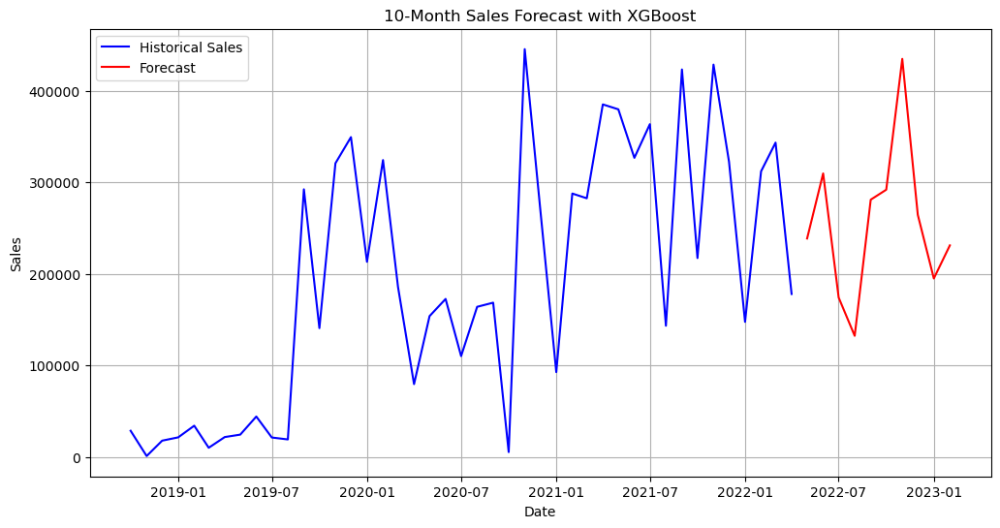

/var/folders/z6/_vn8cndd4x5dmx2cpjfdkjdr0000gn/T/ipykernel_48953/2201571098.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_set_12["Sales_EUR"] = results["yhat"]


,Mapped_GCK,Sales_EUR
Month Year,,
2022-05-01,#12,238783.000000
2022-06-01,#12,309865.468750
2022-07-01,#12,174247.796875
2022-08-01,#12,132405.234375
2022-09-01,#12,281182.281250
2022-10-01,#12,292051.468750
2022-11-01,#12,435031.843750
2022-12-01,#12,264675.218750
2023-01-01,#12,195085.265625


In [72]:
best_model, best_params, best_rmse, best_model_name = select_best_model(
    prophet_best_model_12, prophet_best_params_12, prophet_best_rmse_12, "Prophet",
    xgboost_best_model_12, xgboost_best_params_12, xgboost_best_rmse_12, "XGBoost"
    , sarima_best_model_12, sarima_best_params_12, sarima_best_rmse_12, "SARIMA"
)
print(f"Best Model: {best_model_name}")
print("Best Parameters:", best_params)
print("Best RMSE:", best_rmse)

if best_model_name == "XGBoost":
    results = xgboost_forecast(
        sales_agg12,
        df_market_12,
        period=10,
        params =best_params,
    )
elif best_model_name == "SARIMA":
    results = sarima_forecast(
        sales_agg12,
        period=10,
        params =best_params,
    )
else:
    results = prophet_forecast(
        sales_agg12,
        df_market_12,
        period=10,
        param =best_params,
    )
results.set_index('ds',inplace = True)
test_set_12.set_index('Month Year', inplace = True)
test_set_12["Sales_EUR"] = results["yhat"]
test_set_12

# Product 13

In [73]:
# selecte only the features that are selected in the feature selection step
test_set_13 = test_set[test_set['Mapped_GCK'] == '#13']
df_market_13 = df_market[selected_features_13]
df_market_13.head()

,PRI27840_org,WKLWEUR840_org_lag_3,RohiMETMIN1000_org_lag_4,PRO27276_org_lag_5,PRO27276_org_lag_3,RohCOPPER1000_org_lag_6,PRI27380_org_lag_4,MAB_ELE_PRO392_lag_4
date,,,,,,,,
2004-02-01,78.969864,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2004-03-01,79.673569,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2004-04-01,80.337639,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2004-05-01,80.798828,1.2646,NaN,NaN,85.913200,NaN,NaN,NaN
2004-06-01,80.913490,1.2262,48.747945,NaN,97.670815,NaN,93.020027,109.33401


## Xgboost

In [74]:
X_train, X_val, y_train, y_val = train_val_split(sales_agg13, df_market_13, train_size = 0.8)

X_val.info() 

xgboost_best_model_13, xgboost_best_params_13, xgboost_best_rmse_13 = model_evaluation_XGboost(X_train,
                                                                                             y_train, 
                                                                                             X_val, y_val, 
                                                                                             xgboost_param_grid)

print("Best Params:", xgboost_best_params_13)
print("Validation RMSE:", xgboost_best_rmse_13)

<class 'pandas.core.frame.DataFrame'>
Index: 9 entries, 2021-08-01 to 2022-04-01
Data columns (total 8 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   PRI27840_org              9 non-null      float64
 1   WKLWEUR840_org_lag_3      9 non-null      float64
 2   RohiMETMIN1000_org_lag_4  9 non-null      float64
 3   PRO27276_org_lag_5        9 non-null      float64
 4   PRO27276_org_lag_3        9 non-null      float64
 5   RohCOPPER1000_org_lag_6   9 non-null      float64
 6   PRI27380_org_lag_4        9 non-null      float64
 7   MAB_ELE_PRO392_lag_4      9 non-null      float64
dtypes: float64(8)
memory usage: 648.0+ bytes
Params: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.01, 'subsample': 0.5, 'colsample_bytree': 0.5, 'gamma': 0, 'reg_alpha': 0, 'reg_lambda': 0} => RMSE: 11552.1225, Relative RMSE: 0.5107
Params: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.01, 'subsample': 0.5, 'colsa

## Prophet

In [75]:
prophet_best_model_13, prophet_best_params_13, prophet_best_rmse_13 = model_evaluation_prophet(X_train,
                                                                                             y_train, 
                                                                                             X_val, 
                                                                                             y_val, 
                                                                                             prophet_param_grid)

print("Best Params:", prophet_best_params_13)

print("Validation RMSE:", prophet_best_rmse_13)

02:10:10 - cmdstanpy - INFO - Chain [1] start processing
02:10:10 - cmdstanpy - INFO - Chain [1] done processing
02:10:10 - cmdstanpy - INFO - Chain [1] start processing
02:10:11 - cmdstanpy - INFO - Chain [1] done processing
02:10:11 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 11812.3245, Relative RMSE: 0.5222
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 11812.3225, Relative RMSE: 0.5222


02:10:11 - cmdstanpy - INFO - Chain [1] done processing
02:10:11 - cmdstanpy - INFO - Chain [1] start processing
02:10:11 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 11812.3575, Relative RMSE: 0.5222


02:10:11 - cmdstanpy - INFO - Chain [1] start processing
02:10:11 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 11890.9230, Relative RMSE: 0.5256


02:10:11 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 11870.1451, Relative RMSE: 0.5247


02:10:12 - cmdstanpy - INFO - Chain [1] done processing
02:10:12 - cmdstanpy - INFO - Chain [1] start processing
02:10:12 - cmdstanpy - INFO - Chain [1] done processing
02:10:12 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 12001.5325, Relative RMSE: 0.5305
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 11852.5427, Relative RMSE: 0.5239


02:10:12 - cmdstanpy - INFO - Chain [1] done processing
02:10:12 - cmdstanpy - INFO - Chain [1] start processing
02:10:12 - cmdstanpy - INFO - Chain [1] done processing
02:10:12 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 11801.8183, Relative RMSE: 0.5217
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 11797.5236, Relative RMSE: 0.5215


02:10:12 - cmdstanpy - INFO - Chain [1] done processing
02:10:12 - cmdstanpy - INFO - Chain [1] start processing
02:10:12 - cmdstanpy - INFO - Chain [1] done processing
02:10:12 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 11807.0234, Relative RMSE: 0.5219
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 11785.9016, Relative RMSE: 0.5210


02:10:12 - cmdstanpy - INFO - Chain [1] done processing
02:10:13 - cmdstanpy - INFO - Chain [1] start processing
02:10:13 - cmdstanpy - INFO - Chain [1] done processing
02:10:13 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 11766.9110, Relative RMSE: 0.5201
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 12812.6619, Relative RMSE: 0.5664


02:10:13 - cmdstanpy - INFO - Chain [1] done processing
02:10:13 - cmdstanpy - INFO - Chain [1] start processing
02:10:13 - cmdstanpy - INFO - Chain [1] done processing
02:10:13 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 12812.4615, Relative RMSE: 0.5664
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 12812.5125, Relative RMSE: 0.5664


02:10:13 - cmdstanpy - INFO - Chain [1] done processing
02:10:13 - cmdstanpy - INFO - Chain [1] start processing
02:10:13 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 13025.8799, Relative RMSE: 0.5758


02:10:13 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 12977.6331, Relative RMSE: 0.5737


02:10:14 - cmdstanpy - INFO - Chain [1] done processing
02:10:14 - cmdstanpy - INFO - Chain [1] start processing
02:10:14 - cmdstanpy - INFO - Chain [1] done processing
02:10:14 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 13007.4734, Relative RMSE: 0.5750
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 12865.6377, Relative RMSE: 0.5687


02:10:14 - cmdstanpy - INFO - Chain [1] done processing
02:10:14 - cmdstanpy - INFO - Chain [1] start processing
02:10:14 - cmdstanpy - INFO - Chain [1] done processing
02:10:14 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 12755.2462, Relative RMSE: 0.5638
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 12799.0917, Relative RMSE: 0.5658


02:10:14 - cmdstanpy - INFO - Chain [1] done processing
02:10:14 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 12742.9356, Relative RMSE: 0.5633


02:10:15 - cmdstanpy - INFO - Chain [1] done processing
02:10:15 - cmdstanpy - INFO - Chain [1] start processing
02:10:15 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 12740.7258, Relative RMSE: 0.5632


02:10:15 - cmdstanpy - INFO - Chain [1] start processing
02:10:15 - cmdstanpy - INFO - Chain [1] done processing
02:10:15 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 12753.2389, Relative RMSE: 0.5637
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 117902.7736, Relative RMSE: 5.2118


02:10:15 - cmdstanpy - INFO - Chain [1] done processing
02:10:15 - cmdstanpy - INFO - Chain [1] start processing
02:10:15 - cmdstanpy - INFO - Chain [1] done processing
02:10:15 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 117902.9745, Relative RMSE: 5.2118
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 117902.8030, Relative RMSE: 5.2118


02:10:15 - cmdstanpy - INFO - Chain [1] done processing
02:10:15 - cmdstanpy - INFO - Chain [1] start processing
02:10:16 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 116717.7156, Relative RMSE: 5.1594
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 116851.4417, Relative RMSE: 5.1653


02:10:16 - cmdstanpy - INFO - Chain [1] start processing
02:10:16 - cmdstanpy - INFO - Chain [1] done processing
02:10:16 - cmdstanpy - INFO - Chain [1] start processing
02:10:16 - cmdstanpy - INFO - Chain [1] done processing
02:10:16 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 116832.1627, Relative RMSE: 5.1645
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 117061.8054, Relative RMSE: 5.1746


02:10:16 - cmdstanpy - INFO - Chain [1] done processing
02:10:16 - cmdstanpy - INFO - Chain [1] start processing
02:10:16 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 116930.2527, Relative RMSE: 5.1688
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 116834.0759, Relative RMSE: 5.1646


02:10:16 - cmdstanpy - INFO - Chain [1] start processing
02:10:16 - cmdstanpy - INFO - Chain [1] done processing
02:10:16 - cmdstanpy - INFO - Chain [1] start processing
02:10:17 - cmdstanpy - INFO - Chain [1] done processing
02:10:17 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 117805.9262, Relative RMSE: 5.2075
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 117791.1479, Relative RMSE: 5.2069


02:10:17 - cmdstanpy - INFO - Chain [1] done processing
02:10:17 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 117675.4990, Relative RMSE: 5.2018


02:10:17 - cmdstanpy - INFO - Chain [1] done processing
02:10:18 - cmdstanpy - INFO - Chain [1] start processing
02:10:18 - cmdstanpy - INFO - Chain [1] done processing
02:10:18 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 207521.3847, Relative RMSE: 9.1733
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 208294.5769, Relative RMSE: 9.2075


02:10:18 - cmdstanpy - INFO - Chain [1] done processing
02:10:18 - cmdstanpy - INFO - Chain [1] start processing
02:10:18 - cmdstanpy - INFO - Chain [1] done processing
02:10:18 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 208403.0999, Relative RMSE: 9.2123
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 211807.6833, Relative RMSE: 9.3628


02:10:18 - cmdstanpy - INFO - Chain [1] done processing
02:10:18 - cmdstanpy - INFO - Chain [1] start processing
02:10:19 - cmdstanpy - INFO - Chain [1] done processing
02:10:19 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 211811.5203, Relative RMSE: 9.3630
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 211815.3889, Relative RMSE: 9.3631


02:10:19 - cmdstanpy - INFO - Chain [1] done processing
02:10:19 - cmdstanpy - INFO - Chain [1] start processing
02:10:19 - cmdstanpy - INFO - Chain [1] done processing
02:10:19 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 212383.7694, Relative RMSE: 9.3883
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 212388.2799, Relative RMSE: 9.3885


02:10:19 - cmdstanpy - INFO - Chain [1] done processing
02:10:19 - cmdstanpy - INFO - Chain [1] start processing
02:10:19 - cmdstanpy - INFO - Chain [1] done processing
02:10:19 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 212320.3500, Relative RMSE: 9.3854
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 214647.4838, Relative RMSE: 9.4883


02:10:19 - cmdstanpy - INFO - Chain [1] done processing
02:10:19 - cmdstanpy - INFO - Chain [1] start processing
02:10:20 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 214905.0762, Relative RMSE: 9.4997


02:10:20 - cmdstanpy - INFO - Chain [1] start processing
02:10:20 - cmdstanpy - INFO - Chain [1] done processing
02:10:20 - cmdstanpy - INFO - Chain [1] start processing
02:10:20 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 214639.1655, Relative RMSE: 9.4880
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 11732.4251, Relative RMSE: 0.5186
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 11732.1265, Relative RMSE: 0.5186


02:10:20 - cmdstanpy - INFO - Chain [1] start processing
02:10:20 - cmdstanpy - INFO - Chain [1] done processing
02:10:20 - cmdstanpy - INFO - Chain [1] start processing
02:10:20 - cmdstanpy - INFO - Chain [1] done processing
02:10:20 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 11732.2923, Relative RMSE: 0.5186
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 11951.9194, Relative RMSE: 0.5283


02:10:20 - cmdstanpy - INFO - Chain [1] done processing
02:10:20 - cmdstanpy - INFO - Chain [1] start processing
02:10:20 - cmdstanpy - INFO - Chain [1] done processing
02:10:20 - cmdstanpy - INFO - Chain [1] start processing
02:10:20 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 11847.5462, Relative RMSE: 0.5237
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 11847.7561, Relative RMSE: 0.5237


02:10:21 - cmdstanpy - INFO - Chain [1] start processing
02:10:21 - cmdstanpy - INFO - Chain [1] done processing
02:10:21 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 11772.4943, Relative RMSE: 0.5204
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 11819.9726, Relative RMSE: 0.5225


02:10:21 - cmdstanpy - INFO - Chain [1] done processing
02:10:21 - cmdstanpy - INFO - Chain [1] start processing
02:10:21 - cmdstanpy - INFO - Chain [1] done processing
02:10:21 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 11818.1453, Relative RMSE: 0.5224
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 11835.9229, Relative RMSE: 0.5232


02:10:21 - cmdstanpy - INFO - Chain [1] done processing
02:10:21 - cmdstanpy - INFO - Chain [1] start processing
02:10:21 - cmdstanpy - INFO - Chain [1] done processing
02:10:21 - cmdstanpy - INFO - Chain [1] start processing
02:10:21 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 11826.4873, Relative RMSE: 0.5228
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 11823.6491, Relative RMSE: 0.5227


02:10:21 - cmdstanpy - INFO - Chain [1] start processing
02:10:21 - cmdstanpy - INFO - Chain [1] done processing
02:10:21 - cmdstanpy - INFO - Chain [1] start processing
02:10:21 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 11732.4251, Relative RMSE: 0.5186
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 11732.1265, Relative RMSE: 0.5186
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 11732.2923, Relative RMSE: 0.5186


02:10:21 - cmdstanpy - INFO - Chain [1] start processing
02:10:22 - cmdstanpy - INFO - Chain [1] done processing
02:10:22 - cmdstanpy - INFO - Chain [1] start processing
02:10:22 - cmdstanpy - INFO - Chain [1] done processing
02:10:22 - cmdstanpy - INFO - Chain [1] start processing
02:10:22 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 11951.9194, Relative RMSE: 0.5283
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 11847.5462, Relative RMSE: 0.5237


02:10:22 - cmdstanpy - INFO - Chain [1] start processing
02:10:22 - cmdstanpy - INFO - Chain [1] done processing
02:10:22 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 11847.7561, Relative RMSE: 0.5237
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 11772.4943, Relative RMSE: 0.5204


02:10:22 - cmdstanpy - INFO - Chain [1] done processing
02:10:22 - cmdstanpy - INFO - Chain [1] start processing
02:10:22 - cmdstanpy - INFO - Chain [1] done processing
02:10:22 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 11819.9726, Relative RMSE: 0.5225
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 11818.1453, Relative RMSE: 0.5224


02:10:22 - cmdstanpy - INFO - Chain [1] done processing
02:10:22 - cmdstanpy - INFO - Chain [1] start processing
02:10:22 - cmdstanpy - INFO - Chain [1] done processing
02:10:22 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 11835.9229, Relative RMSE: 0.5232
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 11826.4873, Relative RMSE: 0.5228


02:10:22 - cmdstanpy - INFO - Chain [1] done processing
02:10:22 - cmdstanpy - INFO - Chain [1] start processing
02:10:23 - cmdstanpy - INFO - Chain [1] done processing
02:10:23 - cmdstanpy - INFO - Chain [1] start processing
02:10:23 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 11823.6491, Relative RMSE: 0.5227
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 11732.4251, Relative RMSE: 0.5186
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 11732.1265, Relative RMSE: 0.5186


02:10:23 - cmdstanpy - INFO - Chain [1] start processing
02:10:23 - cmdstanpy - INFO - Chain [1] done processing
02:10:23 - cmdstanpy - INFO - Chain [1] start processing
02:10:23 - cmdstanpy - INFO - Chain [1] done processing
02:10:23 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 11732.2923, Relative RMSE: 0.5186
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 11951.9194, Relative RMSE: 0.5283


02:10:23 - cmdstanpy - INFO - Chain [1] done processing
02:10:23 - cmdstanpy - INFO - Chain [1] start processing
02:10:23 - cmdstanpy - INFO - Chain [1] done processing
02:10:23 - cmdstanpy - INFO - Chain [1] start processing
02:10:23 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 11847.5462, Relative RMSE: 0.5237
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 11847.7561, Relative RMSE: 0.5237


02:10:23 - cmdstanpy - INFO - Chain [1] start processing
02:10:23 - cmdstanpy - INFO - Chain [1] done processing
02:10:23 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 11772.4943, Relative RMSE: 0.5204
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 11819.9726, Relative RMSE: 0.5225


02:10:23 - cmdstanpy - INFO - Chain [1] done processing
02:10:23 - cmdstanpy - INFO - Chain [1] start processing
02:10:24 - cmdstanpy - INFO - Chain [1] done processing
02:10:24 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 11818.1453, Relative RMSE: 0.5224
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 11835.9229, Relative RMSE: 0.5232


02:10:24 - cmdstanpy - INFO - Chain [1] done processing
02:10:24 - cmdstanpy - INFO - Chain [1] start processing
02:10:24 - cmdstanpy - INFO - Chain [1] done processing
02:10:24 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 11826.4873, Relative RMSE: 0.5228
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 11823.6491, Relative RMSE: 0.5227


02:10:24 - cmdstanpy - INFO - Chain [1] done processing
02:10:24 - cmdstanpy - INFO - Chain [1] start processing
02:10:24 - cmdstanpy - INFO - Chain [1] done processing
02:10:24 - cmdstanpy - INFO - Chain [1] start processing
02:10:24 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 11732.4251, Relative RMSE: 0.5186
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 11732.1265, Relative RMSE: 0.5186
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 11732.2923, Relative RMSE: 0.5186


02:10:24 - cmdstanpy - INFO - Chain [1] start processing
02:10:24 - cmdstanpy - INFO - Chain [1] done processing
02:10:24 - cmdstanpy - INFO - Chain [1] start processing
02:10:24 - cmdstanpy - INFO - Chain [1] done processing
02:10:24 - cmdstanpy - INFO - Chain [1] start processing
02:10:24 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 11951.9194, Relative RMSE: 0.5283
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 11847.5462, Relative RMSE: 0.5237


02:10:25 - cmdstanpy - INFO - Chain [1] start processing
02:10:25 - cmdstanpy - INFO - Chain [1] done processing
02:10:25 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 11847.7561, Relative RMSE: 0.5237
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 11772.4943, Relative RMSE: 0.5204


02:10:25 - cmdstanpy - INFO - Chain [1] done processing
02:10:25 - cmdstanpy - INFO - Chain [1] start processing
02:10:25 - cmdstanpy - INFO - Chain [1] done processing
02:10:25 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 11819.9726, Relative RMSE: 0.5225
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 11818.1453, Relative RMSE: 0.5224


02:10:25 - cmdstanpy - INFO - Chain [1] done processing
02:10:25 - cmdstanpy - INFO - Chain [1] start processing
02:10:25 - cmdstanpy - INFO - Chain [1] done processing
02:10:25 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 11835.9229, Relative RMSE: 0.5232
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 11826.4873, Relative RMSE: 0.5228


02:10:25 - cmdstanpy - INFO - Chain [1] done processing
02:10:25 - cmdstanpy - INFO - Chain [1] start processing
02:10:25 - cmdstanpy - INFO - Chain [1] done processing
02:10:25 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 11823.6491, Relative RMSE: 0.5227
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 11727.4275, Relative RMSE: 0.5184


02:10:25 - cmdstanpy - INFO - Chain [1] done processing
02:10:26 - cmdstanpy - INFO - Chain [1] start processing
02:10:26 - cmdstanpy - INFO - Chain [1] done processing
02:10:26 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 11726.7638, Relative RMSE: 0.5184
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 11726.9628, Relative RMSE: 0.5184


02:10:26 - cmdstanpy - INFO - Chain [1] done processing
02:10:26 - cmdstanpy - INFO - Chain [1] start processing
02:10:26 - cmdstanpy - INFO - Chain [1] done processing
02:10:26 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 11963.9752, Relative RMSE: 0.5289
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 11833.7497, Relative RMSE: 0.5231


02:10:26 - cmdstanpy - INFO - Chain [1] done processing
02:10:26 - cmdstanpy - INFO - Chain [1] start processing
02:10:26 - cmdstanpy - INFO - Chain [1] done processing
02:10:26 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 11833.4435, Relative RMSE: 0.5231
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 11753.6362, Relative RMSE: 0.5196


02:10:26 - cmdstanpy - INFO - Chain [1] done processing
02:10:26 - cmdstanpy - INFO - Chain [1] start processing
02:10:27 - cmdstanpy - INFO - Chain [1] done processing
02:10:27 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 11804.4288, Relative RMSE: 0.5218
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 11797.2698, Relative RMSE: 0.5215


02:10:27 - cmdstanpy - INFO - Chain [1] done processing
02:10:27 - cmdstanpy - INFO - Chain [1] start processing
02:10:27 - cmdstanpy - INFO - Chain [1] done processing
02:10:27 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 11832.9419, Relative RMSE: 0.5231
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 11810.3393, Relative RMSE: 0.5221


02:10:27 - cmdstanpy - INFO - Chain [1] done processing
02:10:27 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 11819.2960, Relative RMSE: 0.5225


02:10:29 - cmdstanpy - INFO - Chain [1] done processing
02:10:29 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 11057.3779, Relative RMSE: 0.4888


02:10:31 - cmdstanpy - INFO - Chain [1] done processing
02:10:31 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 11041.0385, Relative RMSE: 0.4881


02:10:32 - cmdstanpy - INFO - Chain [1] done processing
02:10:32 - cmdstanpy - INFO - Chain [1] start processing
02:10:33 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 11073.5312, Relative RMSE: 0.4895


02:10:33 - cmdstanpy - INFO - Chain [1] start processing
02:10:33 - cmdstanpy - INFO - Chain [1] done processing
02:10:33 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 11128.7823, Relative RMSE: 0.4919
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 11149.3575, Relative RMSE: 0.4928


02:10:33 - cmdstanpy - INFO - Chain [1] done processing
02:10:33 - cmdstanpy - INFO - Chain [1] start processing
02:10:33 - cmdstanpy - INFO - Chain [1] done processing
02:10:33 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 11163.2530, Relative RMSE: 0.4935
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 11184.3857, Relative RMSE: 0.4944


02:10:33 - cmdstanpy - INFO - Chain [1] done processing
02:10:33 - cmdstanpy - INFO - Chain [1] start processing
02:10:33 - cmdstanpy - INFO - Chain [1] done processing
02:10:33 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 11223.9199, Relative RMSE: 0.4961
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 11192.5923, Relative RMSE: 0.4948


02:10:34 - cmdstanpy - INFO - Chain [1] done processing
02:10:34 - cmdstanpy - INFO - Chain [1] start processing
02:10:34 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 11191.5880, Relative RMSE: 0.4947


02:10:34 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 11200.7441, Relative RMSE: 0.4951


02:10:34 - cmdstanpy - INFO - Chain [1] done processing
02:10:34 - cmdstanpy - INFO - Chain [1] start processing
02:10:34 - cmdstanpy - INFO - Chain [1] done processing
02:10:34 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 11187.0592, Relative RMSE: 0.4945
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 22854.5724, Relative RMSE: 1.0103


02:10:34 - cmdstanpy - INFO - Chain [1] done processing
02:10:34 - cmdstanpy - INFO - Chain [1] start processing
02:10:35 - cmdstanpy - INFO - Chain [1] done processing
02:10:35 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 22854.5783, Relative RMSE: 1.0103
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 22854.6800, Relative RMSE: 1.0103


02:10:35 - cmdstanpy - INFO - Chain [1] done processing
02:10:35 - cmdstanpy - INFO - Chain [1] start processing
02:10:35 - cmdstanpy - INFO - Chain [1] done processing
02:10:35 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 24020.0790, Relative RMSE: 1.0618
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 24019.9867, Relative RMSE: 1.0618


02:10:35 - cmdstanpy - INFO - Chain [1] done processing
02:10:35 - cmdstanpy - INFO - Chain [1] start processing
02:10:35 - cmdstanpy - INFO - Chain [1] done processing
02:10:35 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 24019.9707, Relative RMSE: 1.0618
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 24028.0980, Relative RMSE: 1.0621


02:10:35 - cmdstanpy - INFO - Chain [1] done processing
02:10:35 - cmdstanpy - INFO - Chain [1] start processing
02:10:35 - cmdstanpy - INFO - Chain [1] done processing
02:10:35 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 24018.2221, Relative RMSE: 1.0617
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 24018.4952, Relative RMSE: 1.0617


02:10:35 - cmdstanpy - INFO - Chain [1] done processing
02:10:35 - cmdstanpy - INFO - Chain [1] start processing
02:10:36 - cmdstanpy - INFO - Chain [1] done processing
02:10:36 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 24046.2562, Relative RMSE: 1.0629
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 24039.1363, Relative RMSE: 1.0626


02:10:36 - cmdstanpy - INFO - Chain [1] done processing
02:10:36 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 24049.6127, Relative RMSE: 1.0631


02:10:36 - cmdstanpy - INFO - Chain [1] done processing
02:10:36 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 153915.4350, Relative RMSE: 6.8037


02:10:37 - cmdstanpy - INFO - Chain [1] done processing
02:10:37 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 153952.7729, Relative RMSE: 6.8054


02:10:39 - cmdstanpy - INFO - Chain [1] done processing
02:10:39 - cmdstanpy - INFO - Chain [1] start processing
02:10:39 - cmdstanpy - INFO - Chain [1] done processing
02:10:39 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 154890.0101, Relative RMSE: 6.8468
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 164027.0683, Relative RMSE: 7.2507


02:10:39 - cmdstanpy - INFO - Chain [1] done processing
02:10:39 - cmdstanpy - INFO - Chain [1] start processing
02:10:40 - cmdstanpy - INFO - Chain [1] done processing
02:10:40 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 164003.2651, Relative RMSE: 7.2496
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 164032.1836, Relative RMSE: 7.2509


02:10:40 - cmdstanpy - INFO - Chain [1] done processing
02:10:40 - cmdstanpy - INFO - Chain [1] start processing
02:10:40 - cmdstanpy - INFO - Chain [1] done processing
02:10:40 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 163703.1971, Relative RMSE: 7.2364
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 163578.0690, Relative RMSE: 7.2308


02:10:40 - cmdstanpy - INFO - Chain [1] done processing
02:10:40 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 163607.4603, Relative RMSE: 7.2321


02:10:40 - cmdstanpy - INFO - Chain [1] done processing
02:10:40 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 1152272.0490, Relative RMSE: 50.9353


02:10:41 - cmdstanpy - INFO - Chain [1] done processing
02:10:41 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 1152460.4774, Relative RMSE: 50.9436


02:10:41 - cmdstanpy - INFO - Chain [1] done processing
02:10:41 - cmdstanpy - INFO - Chain [1] start processing
02:10:41 - cmdstanpy - INFO - Chain [1] done processing
02:10:41 - cmdstanpy - INFO - Chain [1] start processing
02:10:41 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 1503547.0677, Relative RMSE: 66.4631
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 11732.4251, Relative RMSE: 0.5186
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 11732.1265, Relative RMSE: 0.5186


02:10:41 - cmdstanpy - INFO - Chain [1] start processing
02:10:41 - cmdstanpy - INFO - Chain [1] done processing
02:10:41 - cmdstanpy - INFO - Chain [1] start processing
02:10:41 - cmdstanpy - INFO - Chain [1] done processing
02:10:41 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 11732.2923, Relative RMSE: 0.5186
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 11951.9194, Relative RMSE: 0.5283


02:10:41 - cmdstanpy - INFO - Chain [1] done processing
02:10:42 - cmdstanpy - INFO - Chain [1] start processing
02:10:42 - cmdstanpy - INFO - Chain [1] done processing
02:10:42 - cmdstanpy - INFO - Chain [1] start processing
02:10:42 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 11847.5462, Relative RMSE: 0.5237
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 11847.7561, Relative RMSE: 0.5237


02:10:42 - cmdstanpy - INFO - Chain [1] start processing
02:10:42 - cmdstanpy - INFO - Chain [1] done processing
02:10:42 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 11772.4943, Relative RMSE: 0.5204
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 11819.9726, Relative RMSE: 0.5225


02:10:42 - cmdstanpy - INFO - Chain [1] done processing
02:10:42 - cmdstanpy - INFO - Chain [1] start processing
02:10:42 - cmdstanpy - INFO - Chain [1] done processing
02:10:42 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 11818.1453, Relative RMSE: 0.5224
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 11835.9229, Relative RMSE: 0.5232


02:10:42 - cmdstanpy - INFO - Chain [1] done processing
02:10:42 - cmdstanpy - INFO - Chain [1] start processing
02:10:42 - cmdstanpy - INFO - Chain [1] done processing
02:10:42 - cmdstanpy - INFO - Chain [1] start processing
02:10:42 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 11826.4873, Relative RMSE: 0.5228
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 11823.6491, Relative RMSE: 0.5227


02:10:42 - cmdstanpy - INFO - Chain [1] start processing
02:10:43 - cmdstanpy - INFO - Chain [1] done processing
02:10:43 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 11732.4251, Relative RMSE: 0.5186
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 11732.1265, Relative RMSE: 0.5186


02:10:43 - cmdstanpy - INFO - Chain [1] done processing
02:10:43 - cmdstanpy - INFO - Chain [1] start processing
02:10:43 - cmdstanpy - INFO - Chain [1] done processing
02:10:43 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 11732.2923, Relative RMSE: 0.5186
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 11951.9194, Relative RMSE: 0.5283


02:10:43 - cmdstanpy - INFO - Chain [1] done processing
02:10:43 - cmdstanpy - INFO - Chain [1] start processing
02:10:43 - cmdstanpy - INFO - Chain [1] done processing
02:10:43 - cmdstanpy - INFO - Chain [1] start processing
02:10:43 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 11847.5462, Relative RMSE: 0.5237
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 11847.7561, Relative RMSE: 0.5237


02:10:43 - cmdstanpy - INFO - Chain [1] start processing
02:10:43 - cmdstanpy - INFO - Chain [1] done processing
02:10:43 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 11772.4943, Relative RMSE: 0.5204
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 11819.9726, Relative RMSE: 0.5225


02:10:43 - cmdstanpy - INFO - Chain [1] done processing
02:10:43 - cmdstanpy - INFO - Chain [1] start processing
02:10:43 - cmdstanpy - INFO - Chain [1] done processing
02:10:44 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 11818.1453, Relative RMSE: 0.5224
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 11835.9229, Relative RMSE: 0.5232


02:10:44 - cmdstanpy - INFO - Chain [1] done processing
02:10:44 - cmdstanpy - INFO - Chain [1] start processing
02:10:44 - cmdstanpy - INFO - Chain [1] done processing
02:10:44 - cmdstanpy - INFO - Chain [1] start processing
02:10:44 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 11826.4873, Relative RMSE: 0.5228
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 11823.6491, Relative RMSE: 0.5227


02:10:44 - cmdstanpy - INFO - Chain [1] start processing
02:10:44 - cmdstanpy - INFO - Chain [1] done processing
02:10:44 - cmdstanpy - INFO - Chain [1] start processing
02:10:44 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 11732.4251, Relative RMSE: 0.5186
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 11732.1265, Relative RMSE: 0.5186


02:10:44 - cmdstanpy - INFO - Chain [1] start processing
02:10:44 - cmdstanpy - INFO - Chain [1] done processing
02:10:44 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 11732.2923, Relative RMSE: 0.5186
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 11951.9194, Relative RMSE: 0.5283


02:10:44 - cmdstanpy - INFO - Chain [1] done processing
02:10:44 - cmdstanpy - INFO - Chain [1] start processing
02:10:44 - cmdstanpy - INFO - Chain [1] done processing
02:10:44 - cmdstanpy - INFO - Chain [1] start processing
02:10:44 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 11847.5462, Relative RMSE: 0.5237
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 11847.7561, Relative RMSE: 0.5237


02:10:45 - cmdstanpy - INFO - Chain [1] start processing
02:10:45 - cmdstanpy - INFO - Chain [1] done processing
02:10:45 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 11772.4943, Relative RMSE: 0.5204
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 11819.9726, Relative RMSE: 0.5225


02:10:45 - cmdstanpy - INFO - Chain [1] done processing
02:10:45 - cmdstanpy - INFO - Chain [1] start processing
02:10:45 - cmdstanpy - INFO - Chain [1] done processing
02:10:45 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 11818.1453, Relative RMSE: 0.5224
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 11835.9229, Relative RMSE: 0.5232


02:10:45 - cmdstanpy - INFO - Chain [1] done processing
02:10:45 - cmdstanpy - INFO - Chain [1] start processing
02:10:45 - cmdstanpy - INFO - Chain [1] done processing
02:10:45 - cmdstanpy - INFO - Chain [1] start processing
02:10:45 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 11826.4873, Relative RMSE: 0.5228
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 11823.6491, Relative RMSE: 0.5227


02:10:45 - cmdstanpy - INFO - Chain [1] start processing
02:10:45 - cmdstanpy - INFO - Chain [1] done processing
02:10:45 - cmdstanpy - INFO - Chain [1] start processing
02:10:45 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 11732.4251, Relative RMSE: 0.5186
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 11732.1265, Relative RMSE: 0.5186
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 11732.2923, Relative RMSE: 0.5186


02:10:45 - cmdstanpy - INFO - Chain [1] start processing
02:10:46 - cmdstanpy - INFO - Chain [1] done processing
02:10:46 - cmdstanpy - INFO - Chain [1] start processing
02:10:46 - cmdstanpy - INFO - Chain [1] done processing
02:10:46 - cmdstanpy - INFO - Chain [1] start processing
02:10:46 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 11951.9194, Relative RMSE: 0.5283
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 11847.5462, Relative RMSE: 0.5237


02:10:46 - cmdstanpy - INFO - Chain [1] start processing
02:10:46 - cmdstanpy - INFO - Chain [1] done processing
02:10:46 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 11847.7561, Relative RMSE: 0.5237
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 11772.4943, Relative RMSE: 0.5204


02:10:46 - cmdstanpy - INFO - Chain [1] done processing
02:10:46 - cmdstanpy - INFO - Chain [1] start processing
02:10:46 - cmdstanpy - INFO - Chain [1] done processing
02:10:46 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 11819.9726, Relative RMSE: 0.5225
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 11818.1453, Relative RMSE: 0.5224


02:10:46 - cmdstanpy - INFO - Chain [1] done processing
02:10:46 - cmdstanpy - INFO - Chain [1] start processing
02:10:46 - cmdstanpy - INFO - Chain [1] done processing
02:10:46 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 11835.9229, Relative RMSE: 0.5232
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 11826.4873, Relative RMSE: 0.5228


02:10:46 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 11823.6491, Relative RMSE: 0.5227
Best Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9}
Validation RMSE: 11041.03853578683


## Sarima

In [76]:
sarima_best_model_13, sarima_best_params_13, sarima_best_rmse_13 = model_evaluation_SARIMA(y_train, 
                                                             y_val, 
                                                             sarima_param_grid)

print("Best Params:", sarima_best_params_13)
print("Validation RMSE:", sarima_best_rmse_13)

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,0) x (0,0,0,6) => RMSE: 24839.5228, Relative RMSE: 1.0980
SARIMA(0,0,0) x (0,0,0,12) => RMSE: 24839.5228, Relative RMSE: 1.0980
SARIMA(0,0,0) x (0,0,1,6) => RMSE: 21426.5186, Relative RMSE: 0.9471
SARIMA(0,0,0) x (0,0,1,12) => RMSE: 22583.0009, Relative RMSE: 0.9983
SARIMA(0,0,0) x (0,1,0,6) => RMSE: 25478.0782, Relative RMSE: 1.1262
SARIMA(0,0,0) x (0,1,0,12) => RMSE: 23882.7102, Relative RMSE: 1.0557
SARIMA(0,0,0) x (0,1,1,6) => RMSE: 13270.4557, Relative RMSE: 0.5866
SARIMA(0,0,0) x (0,1,1,12) => RMSE: 27814.6663, Relative RMSE: 1.2295
SARIMA(0,0,0) x (1,0,0,6) => RMSE: 17177.3867, Relative RMSE: 0.7593
SARIMA(0,0,0) x (1,0,0,12) => RMSE: 19555.0204, Relative RMSE: 0.8644
SARIMA(0,0,0) x (1,0,1,6) => RMSE: 13330.3998, Relative RMSE: 0.5893
SARIMA(0,0,0) x (1,0,1,12) => RMSE: 18996.7532, Relative RMSE: 0.8397
SARIMA(0,0,0) x (1,1,0,6) => RMSE: 18598.4662, Relative RMSE: 0.8221
SARIMA(0,0,0) x (1,1,0,12) => RMSE: 21520.3715, Relative RMSE: 0.9513


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,0) x (1,1,1,6) => RMSE: 14513.2751, Relative RMSE: 0.6415


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,0) x (1,1,1,12) => RMSE: 31929.5820, Relative RMSE: 1.4114
SARIMA(0,0,1) x (0,0,0,6) => RMSE: 24723.3090, Relative RMSE: 1.0929
SARIMA(0,0,1) x (0,0,0,12) => RMSE: 24723.3090, Relative RMSE: 1.0929
SARIMA(0,0,1) x (0,0,1,6) => RMSE: 20816.5905, Relative RMSE: 0.9202
SARIMA(0,0,1) x (0,0,1,12) => RMSE: 21949.8075, Relative RMSE: 0.9703
SARIMA(0,0,1) x (0,1,0,6) => RMSE: 25362.0446, Relative RMSE: 1.1211
SARIMA(0,0,1) x (0,1,0,12) => RMSE: 23984.1007, Relative RMSE: 1.0602
SARIMA(0,0,1) x (0,1,1,6) => RMSE: 12963.8616, Relative RMSE: 0.5731
SARIMA(0,0,1) x (0,1,1,12) => RMSE: 27111.8155, Relative RMSE: 1.1985
SARIMA(0,0,1) x (1,0,0,6) => RMSE: 18847.7446, Relative RMSE: 0.8331
SARIMA(0,0,1) x (1,0,0,12) => RMSE: 19176.8873, Relative RMSE: 0.8477
SARIMA(0,0,1) x (1,0,1,6) => RMSE: 13769.5059, Relative RMSE: 0.6087


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,1) x (1,0,1,12) => RMSE: 17990.1555, Relative RMSE: 0.7952
SARIMA(0,0,1) x (1,1,0,6) => RMSE: 18565.3641, Relative RMSE: 0.8207
SARIMA(0,0,1) x (1,1,0,12) => RMSE: 26105.4888, Relative RMSE: 1.1540
SARIMA(0,0,1) x (1,1,1,6) => RMSE: 12925.7635, Relative RMSE: 0.5714
SARIMA(0,0,1) x (1,1,1,12) => RMSE: 34407.6880, Relative RMSE: 1.5210
SARIMA(0,0,2) x (0,0,0,6) => RMSE: 24642.4511, Relative RMSE: 1.0893
SARIMA(0,0,2) x (0,0,0,12) => RMSE: 24642.4511, Relative RMSE: 1.0893
SARIMA(0,0,2) x (0,0,1,6) => RMSE: 21660.0371, Relative RMSE: 0.9575
SARIMA(0,0,2) x (0,0,1,12) => RMSE: 21870.2117, Relative RMSE: 0.9668


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,2) x (0,1,0,6) => RMSE: 25342.5313, Relative RMSE: 1.1202
SARIMA(0,0,2) x (0,1,0,12) => RMSE: 24177.5133, Relative RMSE: 1.0687
SARIMA(0,0,2) x (0,1,1,6) => RMSE: 13557.2823, Relative RMSE: 0.5993
SARIMA(0,0,2) x (0,1,1,12) => RMSE: 25148.2438, Relative RMSE: 1.1117
SARIMA(0,0,2) x (1,0,0,6) => RMSE: 20475.3016, Relative RMSE: 0.9051
SARIMA(0,0,2) x (1,0,0,12) => RMSE: 19178.7756, Relative RMSE: 0.8478
SARIMA(0,0,2) x (1,0,1,6) => RMSE: 13527.9337, Relative RMSE: 0.5980
SARIMA(0,0,2) x (1,0,1,12) => RMSE: 18649.1471, Relative RMSE: 0.8244


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(0,0,2) x (1,1,0,6) => RMSE: 18484.8018, Relative RMSE: 0.8171
SARIMA(0,0,2) x (1,1,0,12) => RMSE: 26006.9743, Relative RMSE: 1.1496
SARIMA(0,0,2) x (1,1,1,6) => RMSE: 14072.6233, Relative RMSE: 0.6221
SARIMA(0,0,2) x (1,1,1,12) => RMSE: 24964.9433, Relative RMSE: 1.1036
SARIMA(0,1,0) x (0,0,0,6) => RMSE: 17519.8116, Relative RMSE: 0.7744
SARIMA(0,1,0) x (0,0,0,12) => RMSE: 17519.8116, Relative RMSE: 0.7744
SARIMA(0,1,0) x (0,0,1,6) => RMSE: 21682.6967, Relative RMSE: 0.9585
SARIMA(0,1,0) x (0,0,1,12) => RMSE: 16252.1324, Relative RMSE: 0.7184
SARIMA(0,1,0) x (0,1,0,6) => RMSE: 24795.5920, Relative RMSE: 1.0961
SARIMA(0,1,0) x (0,1,0,12) => RMSE: 24149.3185, Relative RMSE: 1.0675


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,1,0) x (0,1,1,6) => RMSE: 34265.9021, Relative RMSE: 1.5147
SARIMA(0,1,0) x (0,1,1,12) => RMSE: 37101.1806, Relative RMSE: 1.6400
SARIMA(0,1,0) x (1,0,0,6) => RMSE: 19976.5324, Relative RMSE: 0.8830
SARIMA(0,1,0) x (1,0,0,12) => RMSE: 17380.2014, Relative RMSE: 0.7683
SARIMA(0,1,0) x (1,0,1,6) => RMSE: 15735.7162, Relative RMSE: 0.6956
SARIMA(0,1,0) x (1,0,1,12) => RMSE: 16166.3272, Relative RMSE: 0.7146
SARIMA(0,1,0) x (1,1,0,6) => RMSE: 18618.3288, Relative RMSE: 0.8230
SARIMA(0,1,0) x (1,1,0,12) => RMSE: 23917.5945, Relative RMSE: 1.0573
SARIMA(0,1,0) x (1,1,1,6) => RMSE: 15149.5469, Relative RMSE: 0.6697


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,1,0) x (1,1,1,12) => RMSE: 28830.0930, Relative RMSE: 1.2744
SARIMA(0,1,1) x (0,0,0,6) => RMSE: 10260.9432, Relative RMSE: 0.4536
SARIMA(0,1,1) x (0,0,0,12) => RMSE: 10260.9432, Relative RMSE: 0.4536
SARIMA(0,1,1) x (0,0,1,6) => RMSE: 12314.8448, Relative RMSE: 0.5444
SARIMA(0,1,1) x (0,0,1,12) => RMSE: 13046.0561, Relative RMSE: 0.5767
SARIMA(0,1,1) x (0,1,0,6) => RMSE: 25901.9513, Relative RMSE: 1.1450
SARIMA(0,1,1) x (0,1,0,12) => RMSE: 24221.4393, Relative RMSE: 1.0707
SARIMA(0,1,1) x (0,1,1,6) => RMSE: 38567.1013, Relative RMSE: 1.7048
SARIMA(0,1,1) x (0,1,1,12) => RMSE: 30292.4008, Relative RMSE: 1.3391
SARIMA(0,1,1) x (1,0,0,6) => RMSE: 13868.2095, Relative RMSE: 0.6130
SARIMA(0,1,1) x (1,0,0,12) => RMSE: 11492.3416, Relative RMSE: 0.5080
SARIMA(0,1,1) x (1,0,1,6) => RMSE: 13129.9203, Relative RMSE: 0.5804


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,1) x (1,0,1,12) => RMSE: 13467.1706, Relative RMSE: 0.5953
SARIMA(0,1,1) x (1,1,0,6) => RMSE: 18541.2602, Relative RMSE: 0.8196
SARIMA(0,1,1) x (1,1,0,12) => RMSE: 32500.2190, Relative RMSE: 1.4366
SARIMA(0,1,1) x (1,1,1,6) => RMSE: 15812.2837, Relative RMSE: 0.6990


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,1) x (1,1,1,12) => RMSE: 30117.7625, Relative RMSE: 1.3313
SARIMA(0,1,2) x (0,0,0,6) => RMSE: 10232.2440, Relative RMSE: 0.4523
SARIMA(0,1,2) x (0,0,0,12) => RMSE: 10232.2440, Relative RMSE: 0.4523
SARIMA(0,1,2) x (0,0,1,6) => RMSE: 9754.7479, Relative RMSE: 0.4312
SARIMA(0,1,2) x (0,0,1,12) => RMSE: 13328.6588, Relative RMSE: 0.5892
SARIMA(0,1,2) x (0,1,0,6) => RMSE: 26949.5306, Relative RMSE: 1.1913
SARIMA(0,1,2) x (0,1,0,12) => RMSE: 24378.5630, Relative RMSE: 1.0776
SARIMA(0,1,2) x (0,1,1,6) => RMSE: 14870.9183, Relative RMSE: 0.6574
SARIMA(0,1,2) x (0,1,1,12) => RMSE: 30628.7879, Relative RMSE: 1.3539
SARIMA(0,1,2) x (1,0,0,6) => RMSE: 11564.7691, Relative RMSE: 0.5112


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,1,2) x (1,0,0,12) => RMSE: 9296.2301, Relative RMSE: 0.4109
SARIMA(0,1,2) x (1,0,1,6) => RMSE: 10679.2669, Relative RMSE: 0.4721
SARIMA(0,1,2) x (1,0,1,12) => RMSE: 12420.6878, Relative RMSE: 0.5490
SARIMA(0,1,2) x (1,1,0,6) => RMSE: 19502.1299, Relative RMSE: 0.8621
SARIMA(0,1,2) x (1,1,0,12) => RMSE: 31206.9726, Relative RMSE: 1.3795
SARIMA(0,1,2) x (1,1,1,6) => RMSE: 18511.3358, Relative RMSE: 0.8183


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,1,2) x (1,1,1,12) => RMSE: 27311.2120, Relative RMSE: 1.2073
SARIMA(1,0,0) x (0,0,0,6) => RMSE: 23019.9936, Relative RMSE: 1.0176
SARIMA(1,0,0) x (0,0,0,12) => RMSE: 23019.9936, Relative RMSE: 1.0176
SARIMA(1,0,0) x (0,0,1,6) => RMSE: 24882.2766, Relative RMSE: 1.0999
SARIMA(1,0,0) x (0,0,1,12) => RMSE: 21649.8314, Relative RMSE: 0.9570
SARIMA(1,0,0) x (0,1,0,6) => RMSE: 25441.1604, Relative RMSE: 1.1246
SARIMA(1,0,0) x (0,1,0,12) => RMSE: 23895.9362, Relative RMSE: 1.0563
SARIMA(1,0,0) x (0,1,1,6) => RMSE: 13048.4055, Relative RMSE: 0.5768
SARIMA(1,0,0) x (0,1,1,12) => RMSE: 27128.4211, Relative RMSE: 1.1992
SARIMA(1,0,0) x (1,0,0,6) => RMSE: 24296.3844, Relative RMSE: 1.0740
SARIMA(1,0,0) x (1,0,0,12) => RMSE: 20951.1253, Relative RMSE: 0.9261
SARIMA(1,0,0) x (1,0,1,6) => RMSE: 29197.9016, Relative RMSE: 1.2907
SARIMA(1,0,0) x (1,0,1,12) => RMSE: 21064.1234, Relative RMSE: 0.9311
SARIMA(1,0,0) x (1,1,0,6) => RMSE: 18460.3468, Relative RMSE: 0.8160


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,0) x (1,1,0,12) => RMSE: 28897.0567, Relative RMSE: 1.2774
SARIMA(1,0,0) x (1,1,1,6) => RMSE: 13789.9899, Relative RMSE: 0.6096
SARIMA(1,0,0) x (1,1,1,12) => RMSE: 35162.1147, Relative RMSE: 1.5543
SARIMA(1,0,1) x (0,0,0,6) => RMSE: 11081.8253, Relative RMSE: 0.4899
SARIMA(1,0,1) x (0,0,0,12) => RMSE: 11081.8253, Relative RMSE: 0.4899
SARIMA(1,0,1) x (0,0,1,6) => RMSE: 14040.4911, Relative RMSE: 0.6206
SARIMA(1,0,1) x (0,0,1,12) => RMSE: 13261.6294, Relative RMSE: 0.5862
SARIMA(1,0,1) x (0,1,0,6) => RMSE: 24906.0721, Relative RMSE: 1.1010


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,1) x (0,1,0,12) => RMSE: 24508.3232, Relative RMSE: 1.0834
SARIMA(1,0,1) x (0,1,1,6) => RMSE: 13299.4575, Relative RMSE: 0.5879
SARIMA(1,0,1) x (0,1,1,12) => RMSE: 26095.5690, Relative RMSE: 1.1535
SARIMA(1,0,1) x (1,0,0,6) => RMSE: 12245.2430, Relative RMSE: 0.5413
SARIMA(1,0,1) x (1,0,0,12) => RMSE: 13926.1652, Relative RMSE: 0.6156
SARIMA(1,0,1) x (1,0,1,6) => RMSE: 17677.0785, Relative RMSE: 0.7814


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,1) x (1,0,1,12) => RMSE: 12754.6286, Relative RMSE: 0.5638
SARIMA(1,0,1) x (1,1,0,6) => RMSE: 18636.8765, Relative RMSE: 0.8238
SARIMA(1,0,1) x (1,1,0,12) => RMSE: 28183.0583, Relative RMSE: 1.2458
SARIMA(1,0,1) x (1,1,1,6) => RMSE: 14041.8396, Relative RMSE: 0.6207


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,1) x (1,1,1,12) => RMSE: 29178.2475, Relative RMSE: 1.2898
SARIMA(1,0,2) x (0,0,0,6) => RMSE: 11045.9621, Relative RMSE: 0.4883
SARIMA(1,0,2) x (0,0,0,12) => RMSE: 11045.9621, Relative RMSE: 0.4883
SARIMA(1,0,2) x (0,0,1,6) => RMSE: 11255.7779, Relative RMSE: 0.4976
SARIMA(1,0,2) x (0,0,1,12) => RMSE: 13941.3923, Relative RMSE: 0.6163
SARIMA(1,0,2) x (0,1,0,6) => RMSE: 27492.2361, Relative RMSE: 1.2153


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,2) x (0,1,0,12) => RMSE: 24226.1173, Relative RMSE: 1.0709
SARIMA(1,0,2) x (0,1,1,6) => RMSE: 13539.6002, Relative RMSE: 0.5985
SARIMA(1,0,2) x (0,1,1,12) => RMSE: 24931.1562, Relative RMSE: 1.1021
SARIMA(1,0,2) x (1,0,0,6) => RMSE: 11200.7873, Relative RMSE: 0.4951


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,2) x (1,0,0,12) => RMSE: 12990.3123, Relative RMSE: 0.5742
SARIMA(1,0,2) x (1,0,1,6) => RMSE: 18339.0112, Relative RMSE: 0.8107
SARIMA(1,0,2) x (1,0,1,12) => RMSE: 12907.5494, Relative RMSE: 0.5706
SARIMA(1,0,2) x (1,1,0,6) => RMSE: 19690.9918, Relative RMSE: 0.8704


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,2) x (1,1,0,12) => RMSE: 27932.8493, Relative RMSE: 1.2347
SARIMA(1,0,2) x (1,1,1,6) => RMSE: 14067.9037, Relative RMSE: 0.6219
SARIMA(1,0,2) x (1,1,1,12) => RMSE: 24442.3511, Relative RMSE: 1.0805
SARIMA(1,1,0) x (0,0,0,6) => RMSE: 17936.8088, Relative RMSE: 0.7929
SARIMA(1,1,0) x (0,0,0,12) => RMSE: 17936.8088, Relative RMSE: 0.7929


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,1,0) x (0,0,1,6) => RMSE: 22425.6344, Relative RMSE: 0.9913
SARIMA(1,1,0) x (0,0,1,12) => RMSE: 16307.9694, Relative RMSE: 0.7209
SARIMA(1,1,0) x (0,1,0,6) => RMSE: 24200.0466, Relative RMSE: 1.0697
SARIMA(1,1,0) x (0,1,0,12) => RMSE: 23945.0336, Relative RMSE: 1.0585
SARIMA(1,1,0) x (0,1,1,6) => RMSE: 32272.8207, Relative RMSE: 1.4266
SARIMA(1,1,0) x (0,1,1,12) => RMSE: 37144.7409, Relative RMSE: 1.6420
SARIMA(1,1,0) x (1,0,0,6) => RMSE: 20752.7621, Relative RMSE: 0.9174
SARIMA(1,1,0) x (1,0,0,12) => RMSE: 16670.7285, Relative RMSE: 0.7369
SARIMA(1,1,0) x (1,0,1,6) => RMSE: 14461.3260, Relative RMSE: 0.6393
SARIMA(1,1,0) x (1,0,1,12) => RMSE: 16217.7547, Relative RMSE: 0.7169
SARIMA(1,1,0) x (1,1,0,6) => RMSE: 18207.5855, Relative RMSE: 0.8049
SARIMA(1,1,0) x (1,1,0,12) => RMSE: 38893.2538, Relative RMSE: 1.7192


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,1,0) x (1,1,1,6) => RMSE: 15945.3550, Relative RMSE: 0.7049
SARIMA(1,1,0) x (1,1,1,12) => RMSE: 32006.7563, Relative RMSE: 1.4148
SARIMA(1,1,1) x (0,0,0,6) => RMSE: 10070.7771, Relative RMSE: 0.4452
SARIMA(1,1,1) x (0,0,0,12) => RMSE: 10070.7771, Relative RMSE: 0.4452
SARIMA(1,1,1) x (0,0,1,6) => RMSE: 11306.7987, Relative RMSE: 0.4998
SARIMA(1,1,1) x (0,0,1,12) => RMSE: 12613.0132, Relative RMSE: 0.5575
SARIMA(1,1,1) x (0,1,0,6) => RMSE: 26095.9559, Relative RMSE: 1.1536
SARIMA(1,1,1) x (0,1,0,12) => RMSE: 23940.2421, Relative RMSE: 1.0583
SARIMA(1,1,1) x (0,1,1,6) => RMSE: 14155.6521, Relative RMSE: 0.6257


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,1,1) x (0,1,1,12) => RMSE: 30493.4242, Relative RMSE: 1.3479
SARIMA(1,1,1) x (1,0,0,6) => RMSE: 12489.8600, Relative RMSE: 0.5521
SARIMA(1,1,1) x (1,0,0,12) => RMSE: 10916.3014, Relative RMSE: 0.4825
SARIMA(1,1,1) x (1,0,1,6) => RMSE: 11351.7876, Relative RMSE: 0.5018
SARIMA(1,1,1) x (1,0,1,12) => RMSE: 13475.6257, Relative RMSE: 0.5957
SARIMA(1,1,1) x (1,1,0,6) => RMSE: 18537.7223, Relative RMSE: 0.8194


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,1) x (1,1,0,12) => RMSE: 30764.5180, Relative RMSE: 1.3599
SARIMA(1,1,1) x (1,1,1,6) => RMSE: 15917.0842, Relative RMSE: 0.7036
SARIMA(1,1,1) x (1,1,1,12) => RMSE: 30124.9843, Relative RMSE: 1.3317
SARIMA(1,1,2) x (0,0,0,6) => RMSE: 10049.5967, Relative RMSE: 0.4442


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,1,2) x (0,0,0,12) => RMSE: 10049.5967, Relative RMSE: 0.4442
SARIMA(1,1,2) x (0,0,1,6) => RMSE: 10333.3596, Relative RMSE: 0.4568
SARIMA(1,1,2) x (0,0,1,12) => RMSE: 12994.8280, Relative RMSE: 0.5744
SARIMA(1,1,2) x (0,1,0,6) => RMSE: 27247.7026, Relative RMSE: 1.2045
SARIMA(1,1,2) x (0,1,0,12) => RMSE: 24391.7616, Relative RMSE: 1.0782
SARIMA(1,1,2) x (0,1,1,6) => RMSE: 14022.7089, Relative RMSE: 0.6199
SARIMA(1,1,2) x (0,1,1,12) => RMSE: 28196.8461, Relative RMSE: 1.2464


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,1,2) x (1,0,0,6) => RMSE: 10403.3418, Relative RMSE: 0.4599
SARIMA(1,1,2) x (1,0,0,12) => RMSE: 10266.4467, Relative RMSE: 0.4538
SARIMA(1,1,2) x (1,0,1,6) => RMSE: 10738.7630, Relative RMSE: 0.4747
SARIMA(1,1,2) x (1,0,1,12) => RMSE: 12978.8033, Relative RMSE: 0.5737
SARIMA(1,1,2) x (1,1,0,6) => RMSE: 18841.9326, Relative RMSE: 0.8329


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,2) x (1,1,0,12) => RMSE: 29127.5229, Relative RMSE: 1.2876
SARIMA(1,1,2) x (1,1,1,6) => RMSE: 16019.0279, Relative RMSE: 0.7081
SARIMA(1,1,2) x (1,1,1,12) => RMSE: 27301.5962, Relative RMSE: 1.2068
SARIMA(2,0,0) x (0,0,0,6) => RMSE: 22905.3801, Relative RMSE: 1.0125
SARIMA(2,0,0) x (0,0,0,12) => RMSE: 22905.3801, Relative RMSE: 1.0125


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,0) x (0,0,1,6) => RMSE: 24930.7838, Relative RMSE: 1.1020
SARIMA(2,0,0) x (0,0,1,12) => RMSE: 21629.8873, Relative RMSE: 0.9561
SARIMA(2,0,0) x (0,1,0,6) => RMSE: 26398.7543, Relative RMSE: 1.1669
SARIMA(2,0,0) x (0,1,0,12) => RMSE: 23959.9603, Relative RMSE: 1.0591
SARIMA(2,0,0) x (0,1,1,6) => RMSE: 14295.3652, Relative RMSE: 0.6319
SARIMA(2,0,0) x (0,1,1,12) => RMSE: 26954.0641, Relative RMSE: 1.1915
SARIMA(2,0,0) x (1,0,0,6) => RMSE: 24405.9627, Relative RMSE: 1.0788
SARIMA(2,0,0) x (1,0,0,12) => RMSE: 20600.9460, Relative RMSE: 0.9106
SARIMA(2,0,0) x (1,0,1,6) => RMSE: 29638.8372, Relative RMSE: 1.3102
SARIMA(2,0,0) x (1,0,1,12) => RMSE: 20800.6614, Relative RMSE: 0.9195
SARIMA(2,0,0) x (1,1,0,6) => RMSE: 19028.8660, Relative RMSE: 0.8412


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,0) x (1,1,0,12) => RMSE: 28275.7446, Relative RMSE: 1.2499
SARIMA(2,0,0) x (1,1,1,6) => RMSE: 13713.8886, Relative RMSE: 0.6062
SARIMA(2,0,0) x (1,1,1,12) => RMSE: 38740.6320, Relative RMSE: 1.7125
SARIMA(2,0,1) x (0,0,0,6) => RMSE: 12439.6703, Relative RMSE: 0.5499
SARIMA(2,0,1) x (0,0,0,12) => RMSE: 12439.6703, Relative RMSE: 0.5499


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,1) x (0,0,1,6) => RMSE: 15908.6839, Relative RMSE: 0.7032
SARIMA(2,0,1) x (0,0,1,12) => RMSE: 14886.2760, Relative RMSE: 0.6580
SARIMA(2,0,1) x (0,1,0,6) => RMSE: 24726.5780, Relative RMSE: 1.0930
SARIMA(2,0,1) x (0,1,0,12) => RMSE: 25629.6795, Relative RMSE: 1.1329
SARIMA(2,0,1) x (0,1,1,6) => RMSE: 13754.5282, Relative RMSE: 0.6080
SARIMA(2,0,1) x (0,1,1,12) => RMSE: 26450.0317, Relative RMSE: 1.1692
SARIMA(2,0,1) x (1,0,0,6) => RMSE: 14519.3992, Relative RMSE: 0.6418


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,1) x (1,0,0,12) => RMSE: 14720.9318, Relative RMSE: 0.6507
SARIMA(2,0,1) x (1,0,1,6) => RMSE: 19957.7257, Relative RMSE: 0.8822
SARIMA(2,0,1) x (1,0,1,12) => RMSE: 13348.2188, Relative RMSE: 0.5900
SARIMA(2,0,1) x (1,1,0,6) => RMSE: 18530.6299, Relative RMSE: 0.8191


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,1) x (1,1,0,12) => RMSE: 24553.2633, Relative RMSE: 1.0854
SARIMA(2,0,1) x (1,1,1,6) => RMSE: 14391.7158, Relative RMSE: 0.6362
SARIMA(2,0,1) x (1,1,1,12) => RMSE: 42523.6895, Relative RMSE: 1.8797
SARIMA(2,0,2) x (0,0,0,6) => RMSE: 11063.7885, Relative RMSE: 0.4891
SARIMA(2,0,2) x (0,0,0,12) => RMSE: 11063.7885, Relative RMSE: 0.4891


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,2) x (0,0,1,6) => RMSE: 11304.3844, Relative RMSE: 0.4997
SARIMA(2,0,2) x (0,0,1,12) => RMSE: 13053.0511, Relative RMSE: 0.5770
SARIMA(2,0,2) x (0,1,0,6) => RMSE: 24137.7311, Relative RMSE: 1.0670
SARIMA(2,0,2) x (0,1,0,12) => RMSE: 24353.0127, Relative RMSE: 1.0765


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,2) x (0,1,1,6) => RMSE: 28671.1702, Relative RMSE: 1.2674
SARIMA(2,0,2) x (0,1,1,12) => RMSE: 23843.2467, Relative RMSE: 1.0540
SARIMA(2,0,2) x (1,0,0,6) => RMSE: 11186.6165, Relative RMSE: 0.4945


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,2) x (1,0,0,12) => RMSE: 12132.5094, Relative RMSE: 0.5363
SARIMA(2,0,2) x (1,0,1,6) => RMSE: 18049.4739, Relative RMSE: 0.7979
SARIMA(2,0,2) x (1,0,1,12) => RMSE: 12494.9377, Relative RMSE: 0.5523


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,2) x (1,1,0,6) => RMSE: 17699.5931, Relative RMSE: 0.7824
SARIMA(2,0,2) x (1,1,0,12) => RMSE: 25794.4265, Relative RMSE: 1.1402


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihoo

SARIMA(2,0,2) x (1,1,1,6) => RMSE: 16965.1711, Relative RMSE: 0.7499


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


SARIMA(2,0,2) x (1,1,1,12) => RMSE: 41660.6509, Relative RMSE: 1.8416
SARIMA(2,1,0) x (0,0,0,6) => RMSE: 18817.7431, Relative RMSE: 0.8318
SARIMA(2,1,0) x (0,0,0,12) => RMSE: 18817.7431, Relative RMSE: 0.8318
SARIMA(2,1,0) x (0,0,1,6) => RMSE: 19249.5681, Relative RMSE: 0.8509
SARIMA(2,1,0) x (0,0,1,12) => RMSE: 17537.1511, Relative RMSE: 0.7752
SARIMA(2,1,0) x (0,1,0,6) => RMSE: 22184.1473, Relative RMSE: 0.9806
SARIMA(2,1,0) x (0,1,0,12) => RMSE: 24221.4779, Relative RMSE: 1.0707
SARIMA(2,1,0) x (0,1,1,6) => RMSE: 19117.8187, Relative RMSE: 0.8451
SARIMA(2,1,0) x (0,1,1,12) => RMSE: 32386.6661, Relative RMSE: 1.4316
SARIMA(2,1,0) x (1,0,0,6) => RMSE: 18531.8797, Relative RMSE: 0.8192
SARIMA(2,1,0) x (1,0,0,12) => RMSE: 17731.1350, Relative RMSE: 0.7838
SARIMA(2,1,0) x (1,0,1,6) => RMSE: 12777.3340, Relative RMSE: 0.5648


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,0) x (1,0,1,12) => RMSE: 18439.5135, Relative RMSE: 0.8151
SARIMA(2,1,0) x (1,1,0,6) => RMSE: 17984.9508, Relative RMSE: 0.7950
SARIMA(2,1,0) x (1,1,0,12) => RMSE: 30216.2553, Relative RMSE: 1.3357
SARIMA(2,1,0) x (1,1,1,6) => RMSE: 30775.5213, Relative RMSE: 1.3604
SARIMA(2,1,0) x (1,1,1,12) => RMSE: 31378.9200, Relative RMSE: 1.3871
SARIMA(2,1,1) x (0,0,0,6) => RMSE: 9879.0653, Relative RMSE: 0.4367
SARIMA(2,1,1) x (0,0,0,12) => RMSE: 9879.0653, Relative RMSE: 0.4367


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,1) x (0,0,1,6) => RMSE: 16413.6186, Relative RMSE: 0.7256
SARIMA(2,1,1) x (0,0,1,12) => RMSE: 12178.1924, Relative RMSE: 0.5383
SARIMA(2,1,1) x (0,1,0,6) => RMSE: 22156.5329, Relative RMSE: 0.9794
SARIMA(2,1,1) x (0,1,0,12) => RMSE: 24426.7404, Relative RMSE: 1.0798
SARIMA(2,1,1) x (0,1,1,6) => RMSE: 14887.9847, Relative RMSE: 0.6581
SARIMA(2,1,1) x (0,1,1,12) => RMSE: 29939.9293, Relative RMSE: 1.3235
SARIMA(2,1,1) x (1,0,0,6) => RMSE: 16367.5139, Relative RMSE: 0.7235
SARIMA(2,1,1) x (1,0,0,12) => RMSE: 9891.8564, Relative RMSE: 0.4373


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,1,1) x (1,0,1,6) => RMSE: 13074.1915, Relative RMSE: 0.5779
SARIMA(2,1,1) x (1,0,1,12) => RMSE: 14041.2233, Relative RMSE: 0.6207
SARIMA(2,1,1) x (1,1,0,6) => RMSE: 18810.1542, Relative RMSE: 0.8315
SARIMA(2,1,1) x (1,1,0,12) => RMSE: 29848.9935, Relative RMSE: 1.3195
SARIMA(2,1,1) x (1,1,1,6) => RMSE: 36931.9144, Relative RMSE: 1.6325


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,1,1) x (1,1,1,12) => RMSE: 33532.0515, Relative RMSE: 1.4823
SARIMA(2,1,2) x (0,0,0,6) => RMSE: 9740.7413, Relative RMSE: 0.4306
SARIMA(2,1,2) x (0,0,0,12) => RMSE: 9740.7413, Relative RMSE: 0.4306
SARIMA(2,1,2) x (0,0,1,6) => RMSE: 9726.5602, Relative RMSE: 0.4300
SARIMA(2,1,2) x (0,0,1,12) => RMSE: 13672.8874, Relative RMSE: 0.6044
SARIMA(2,1,2) x (0,1,0,6) => RMSE: 23235.5322, Relative RMSE: 1.0271
SARIMA(2,1,2) x (0,1,0,12) => RMSE: 25197.8367, Relative RMSE: 1.1139


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,2) x (0,1,1,6) => RMSE: 14999.0130, Relative RMSE: 0.6630


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


SARIMA(2,1,2) x (0,1,1,12) => RMSE: 26213.8021, Relative RMSE: 1.1588
SARIMA(2,1,2) x (1,0,0,6) => RMSE: 9568.7129, Relative RMSE: 0.4230
SARIMA(2,1,2) x (1,0,0,12) => RMSE: 10960.7262, Relative RMSE: 0.4845


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,2) x (1,0,1,6) => RMSE: 10125.6460, Relative RMSE: 0.4476
SARIMA(2,1,2) x (1,0,1,12) => RMSE: 13826.1444, Relative RMSE: 0.6112
SARIMA(2,1,2) x (1,1,0,6) => RMSE: 23480.7728, Relative RMSE: 1.0379


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2,1,2) x (1,1,0,12) => RMSE: 36613.6729, Relative RMSE: 1.6185
SARIMA(2,1,2) x (1,1,1,6) => RMSE: 18443.1670, Relative RMSE: 0.8153


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,1,2) x (1,1,1,12) => RMSE: 25830.3560, Relative RMSE: 1.1418
Best Params: {'order': (0, 1, 2), 'seasonal_order': (1, 0, 0, 12)}
Validation RMSE: 9296.230077757496


## Final prediction 

Best Model: SARIMA
Best Parameters: {'order': (0, 1, 2), 'seasonal_order': (1, 0, 0, 12)}
Best RMSE: 9296.230077757496


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


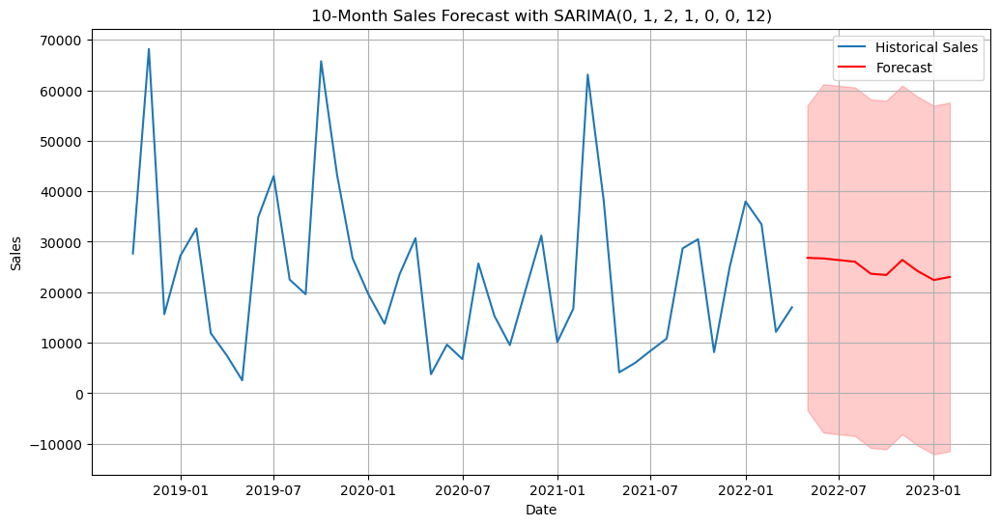

/var/folders/z6/_vn8cndd4x5dmx2cpjfdkjdr0000gn/T/ipykernel_48953/614140704.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_set_13["Sales_EUR"] = results["yhat"]


,Mapped_GCK,Sales_EUR
Month Year,,
2022-05-01,#13,26805.215309
2022-06-01,#13,26687.781432
2022-07-01,#13,26366.611012
2022-08-01,#13,26046.782815
2022-09-01,#13,23660.429127
2022-10-01,#13,23416.884564
2022-11-01,#13,26404.394904
2022-12-01,#13,24169.769762
2023-01-01,#13,22419.678851


In [77]:
best_model, best_params, best_rmse, best_model_name = select_best_model(
    prophet_best_model_13, prophet_best_params_13, prophet_best_rmse_13, "Prophet",
    xgboost_best_model_13, xgboost_best_params_13, xgboost_best_rmse_13, "XGBoost"
    , sarima_best_model_13, sarima_best_params_13, sarima_best_rmse_13, "SARIMA"
)
print(f"Best Model: {best_model_name}")
print("Best Parameters:", best_params)
print("Best RMSE:", best_rmse)

if best_model_name == "XGBoost":
    results = xgboost_forecast(
        sales_agg13,
        df_market_13,
        period=10,
        params =best_params,
    )
elif best_model_name == "SARIMA":
    results = sarima_forecast(
        sales_agg13,
        period=10,
        params =best_params,
    )
else:
    results = prophet_forecast(
        sales_agg13,
        df_market_13,
        period=10,
        param =best_params,
    )
results.set_index('ds',inplace = True)
test_set_13.set_index('Month Year', inplace = True)
test_set_13["Sales_EUR"] = results["yhat"]
test_set_13

# Product 14

In [78]:
# selecte only the features that are selected in the feature selection step
test_set_14 = test_set[test_set['Mapped_GCK'] == '#14']
df_market_14 = df_market[selected_features_14]
df_market_14.head()

,MAB_ELE_SHP156,MAB_ELE_PRO826_lag_1,PRO27392_org,PRO27392_org_lag_2,MAB_ELE_PRO156_lag_5
date,,,,,
2004-02-01,16.940704,NaN,106.161262,NaN,NaN
2004-03-01,23.711852,111.353812,140.288741,NaN,NaN
2004-04-01,24.435235,127.558608,106.271197,106.161262,NaN
2004-05-01,23.708115,108.732297,101.608710,140.288741,NaN
2004-06-01,27.009138,110.645200,116.655248,106.271197,NaN


## Xgboost

In [79]:
X_train, X_val, y_train, y_val = train_val_split(sales_agg14, df_market_14, train_size = 0.8)

X_val.info() 

xgboost_best_model_14, xgboost_best_params_14, xgboost_best_rmse_14 = model_evaluation_XGboost(X_train,
                                                                                             y_train, 
                                                                                             X_val, y_val, 
                                                                                             xgboost_param_grid)

print("Best Params:", xgboost_best_params_14)
print("Validation RMSE:", xgboost_best_rmse_14)

<class 'pandas.core.frame.DataFrame'>
Index: 9 entries, 2021-08-01 to 2022-04-01
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   MAB_ELE_SHP156        9 non-null      float64
 1   MAB_ELE_PRO826_lag_1  9 non-null      float64
 2   PRO27392_org          9 non-null      float64
 3   PRO27392_org_lag_2    9 non-null      float64
 4   MAB_ELE_PRO156_lag_5  9 non-null      float64
dtypes: float64(5)
memory usage: 432.0+ bytes
Params: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.01, 'subsample': 0.5, 'colsample_bytree': 0.5, 'gamma': 0, 'reg_alpha': 0, 'reg_lambda': 0} => RMSE: 14058.3662, Relative RMSE: 1.3385
Params: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.01, 'subsample': 0.5, 'colsample_bytree': 0.5, 'gamma': 0, 'reg_alpha': 0, 'reg_lambda': 0.1} => RMSE: 14067.5536, Relative RMSE: 1.3394
Params: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.01, 'subsample': 0.5

## Prophet

In [80]:
prophet_best_model_14, prophet_best_params_14, prophet_best_rmse_14 = model_evaluation_prophet(X_train,
                                                                                             y_train, 
                                                                                             X_val, 
                                                                                             y_val, 
                                                                                             prophet_param_grid)

print("Best Params:", prophet_best_params_14)

print("Validation RMSE:", prophet_best_rmse_14)

02:20:45 - cmdstanpy - INFO - Chain [1] start processing
02:20:45 - cmdstanpy - INFO - Chain [1] done processing
02:20:46 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 14453.6590, Relative RMSE: 1.3761


02:20:46 - cmdstanpy - INFO - Chain [1] done processing
02:20:46 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 14453.6439, Relative RMSE: 1.3761


02:20:46 - cmdstanpy - INFO - Chain [1] done processing
02:20:46 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 14453.6369, Relative RMSE: 1.3761


02:20:46 - cmdstanpy - INFO - Chain [1] done processing
02:20:46 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 14422.4380, Relative RMSE: 1.3731


02:20:46 - cmdstanpy - INFO - Chain [1] done processing
02:20:46 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 14411.7434, Relative RMSE: 1.3721


02:20:46 - cmdstanpy - INFO - Chain [1] done processing
02:20:46 - cmdstanpy - INFO - Chain [1] start processing
02:20:46 - cmdstanpy - INFO - Chain [1] done processing
02:20:46 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 14413.4354, Relative RMSE: 1.3723
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 14448.3015, Relative RMSE: 1.3756


02:20:47 - cmdstanpy - INFO - Chain [1] done processing
02:20:47 - cmdstanpy - INFO - Chain [1] start processing
02:20:47 - cmdstanpy - INFO - Chain [1] done processing
02:20:47 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 14445.9013, Relative RMSE: 1.3754
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 14446.7746, Relative RMSE: 1.3755


02:20:47 - cmdstanpy - INFO - Chain [1] done processing
02:20:47 - cmdstanpy - INFO - Chain [1] start processing
02:20:47 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 14451.4189, Relative RMSE: 1.3759


02:20:47 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 14449.7377, Relative RMSE: 1.3757


02:20:48 - cmdstanpy - INFO - Chain [1] done processing
02:20:48 - cmdstanpy - INFO - Chain [1] start processing
02:20:48 - cmdstanpy - INFO - Chain [1] done processing
02:20:48 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 14456.3281, Relative RMSE: 1.3764
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 14204.0592, Relative RMSE: 1.3524


02:20:48 - cmdstanpy - INFO - Chain [1] done processing
02:20:48 - cmdstanpy - INFO - Chain [1] start processing
02:20:48 - cmdstanpy - INFO - Chain [1] done processing
02:20:48 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 14204.0550, Relative RMSE: 1.3524
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 14204.0396, Relative RMSE: 1.3524


02:20:48 - cmdstanpy - INFO - Chain [1] done processing
02:20:48 - cmdstanpy - INFO - Chain [1] start processing
02:20:48 - cmdstanpy - INFO - Chain [1] done processing
02:20:48 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 14210.6025, Relative RMSE: 1.3530
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 14210.4614, Relative RMSE: 1.3530


02:20:48 - cmdstanpy - INFO - Chain [1] done processing
02:20:48 - cmdstanpy - INFO - Chain [1] start processing
02:20:49 - cmdstanpy - INFO - Chain [1] done processing
02:20:49 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 14210.7035, Relative RMSE: 1.3530
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 14211.1119, Relative RMSE: 1.3530


02:20:49 - cmdstanpy - INFO - Chain [1] done processing
02:20:49 - cmdstanpy - INFO - Chain [1] start processing
02:20:49 - cmdstanpy - INFO - Chain [1] done processing
02:20:49 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 14212.0601, Relative RMSE: 1.3531
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 14210.5692, Relative RMSE: 1.3530


02:20:49 - cmdstanpy - INFO - Chain [1] done processing
02:20:49 - cmdstanpy - INFO - Chain [1] start processing
02:20:49 - cmdstanpy - INFO - Chain [1] done processing
02:20:49 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 14271.7568, Relative RMSE: 1.3588
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 14247.0200, Relative RMSE: 1.3564


02:20:49 - cmdstanpy - INFO - Chain [1] done processing
02:20:49 - cmdstanpy - INFO - Chain [1] start processing
02:20:49 - cmdstanpy - INFO - Chain [1] done processing
02:20:50 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 14271.5190, Relative RMSE: 1.3588
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 33208.7991, Relative RMSE: 3.1618


02:20:50 - cmdstanpy - INFO - Chain [1] done processing
02:20:50 - cmdstanpy - INFO - Chain [1] start processing
02:20:50 - cmdstanpy - INFO - Chain [1] done processing
02:20:50 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 33208.7971, Relative RMSE: 3.1618
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 33209.0782, Relative RMSE: 3.1618


02:20:50 - cmdstanpy - INFO - Chain [1] done processing
02:20:50 - cmdstanpy - INFO - Chain [1] start processing
02:20:50 - cmdstanpy - INFO - Chain [1] done processing
02:20:50 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 33316.2485, Relative RMSE: 3.1720
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 33316.0975, Relative RMSE: 3.1720


02:20:50 - cmdstanpy - INFO - Chain [1] done processing
02:20:50 - cmdstanpy - INFO - Chain [1] start processing
02:20:50 - cmdstanpy - INFO - Chain [1] done processing
02:20:50 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 33316.1378, Relative RMSE: 3.1720
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 33841.1359, Relative RMSE: 3.2220


02:20:50 - cmdstanpy - INFO - Chain [1] done processing
02:20:50 - cmdstanpy - INFO - Chain [1] start processing
02:20:51 - cmdstanpy - INFO - Chain [1] done processing
02:20:51 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 33841.1664, Relative RMSE: 3.2220
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 33841.1024, Relative RMSE: 3.2220


02:20:51 - cmdstanpy - INFO - Chain [1] done processing
02:20:51 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 34917.9926, Relative RMSE: 3.3245


02:20:51 - cmdstanpy - INFO - Chain [1] done processing
02:20:51 - cmdstanpy - INFO - Chain [1] start processing
02:20:51 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 34933.1914, Relative RMSE: 3.3260


02:20:51 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 34931.7338, Relative RMSE: 3.3258


02:20:52 - cmdstanpy - INFO - Chain [1] done processing
02:20:52 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 51273.6072, Relative RMSE: 4.8817


02:20:54 - cmdstanpy - INFO - Chain [1] done processing
02:20:54 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 51273.5880, Relative RMSE: 4.8817


02:20:57 - cmdstanpy - INFO - Chain [1] done processing
02:20:57 - cmdstanpy - INFO - Chain [1] start processing
02:20:57 - cmdstanpy - INFO - Chain [1] done processing
02:20:57 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 51282.4343, Relative RMSE: 4.8826
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 51061.4852, Relative RMSE: 4.8615


02:20:57 - cmdstanpy - INFO - Chain [1] done processing
02:20:57 - cmdstanpy - INFO - Chain [1] start processing
02:20:58 - cmdstanpy - INFO - Chain [1] done processing
02:20:58 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 50996.0696, Relative RMSE: 4.8553
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 51130.7178, Relative RMSE: 4.8681


02:20:58 - cmdstanpy - INFO - Chain [1] done processing
02:20:58 - cmdstanpy - INFO - Chain [1] start processing
02:20:58 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 51212.1739, Relative RMSE: 4.8759


02:20:58 - cmdstanpy - INFO - Chain [1] start processing
02:20:58 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 51205.0732, Relative RMSE: 4.8752


02:20:58 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 51238.6381, Relative RMSE: 4.8784


02:20:59 - cmdstanpy - INFO - Chain [1] done processing
02:20:59 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 50478.6536, Relative RMSE: 4.8060


02:20:59 - cmdstanpy - INFO - Chain [1] done processing
02:20:59 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 50729.0347, Relative RMSE: 4.8299


02:21:00 - cmdstanpy - INFO - Chain [1] done processing
02:21:00 - cmdstanpy - INFO - Chain [1] start processing
02:21:00 - cmdstanpy - INFO - Chain [1] done processing
02:21:00 - cmdstanpy - INFO - Chain [1] start processing
02:21:00 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 50456.3878, Relative RMSE: 4.8039
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 14509.3102, Relative RMSE: 1.3814
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 14509.3330, Relative RMSE: 1.3814


02:21:00 - cmdstanpy - INFO - Chain [1] start processing
02:21:00 - cmdstanpy - INFO - Chain [1] done processing
02:21:00 - cmdstanpy - INFO - Chain [1] start processing
02:21:00 - cmdstanpy - INFO - Chain [1] done processing
02:21:00 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 14509.2683, Relative RMSE: 1.3814
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 14468.8759, Relative RMSE: 1.3776


02:21:00 - cmdstanpy - INFO - Chain [1] done processing
02:21:00 - cmdstanpy - INFO - Chain [1] start processing
02:21:00 - cmdstanpy - INFO - Chain [1] done processing
02:21:00 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 14457.9015, Relative RMSE: 1.3765
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 14442.7072, Relative RMSE: 1.3751


02:21:00 - cmdstanpy - INFO - Chain [1] done processing
02:21:00 - cmdstanpy - INFO - Chain [1] start processing
02:21:01 - cmdstanpy - INFO - Chain [1] done processing
02:21:01 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 14495.6321, Relative RMSE: 1.3801
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 14482.1633, Relative RMSE: 1.3788


02:21:01 - cmdstanpy - INFO - Chain [1] done processing
02:21:01 - cmdstanpy - INFO - Chain [1] start processing
02:21:01 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 14495.6557, Relative RMSE: 1.3801


02:21:01 - cmdstanpy - INFO - Chain [1] start processing
02:21:01 - cmdstanpy - INFO - Chain [1] done processing
02:21:01 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 14494.9602, Relative RMSE: 1.3801
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 14494.6640, Relative RMSE: 1.3800


02:21:01 - cmdstanpy - INFO - Chain [1] done processing
02:21:01 - cmdstanpy - INFO - Chain [1] start processing
02:21:01 - cmdstanpy - INFO - Chain [1] done processing
02:21:01 - cmdstanpy - INFO - Chain [1] start processing
02:21:01 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 14494.6728, Relative RMSE: 1.3800
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 14509.3102, Relative RMSE: 1.3814
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 14509.3330, Relative RMSE: 1.3814


02:21:02 - cmdstanpy - INFO - Chain [1] start processing
02:21:02 - cmdstanpy - INFO - Chain [1] done processing
02:21:02 - cmdstanpy - INFO - Chain [1] start processing
02:21:02 - cmdstanpy - INFO - Chain [1] done processing
02:21:02 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 14509.2683, Relative RMSE: 1.3814
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 14468.8759, Relative RMSE: 1.3776


02:21:02 - cmdstanpy - INFO - Chain [1] done processing
02:21:02 - cmdstanpy - INFO - Chain [1] start processing
02:21:02 - cmdstanpy - INFO - Chain [1] done processing
02:21:02 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 14457.9015, Relative RMSE: 1.3765
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 14442.7072, Relative RMSE: 1.3751


02:21:02 - cmdstanpy - INFO - Chain [1] done processing
02:21:02 - cmdstanpy - INFO - Chain [1] start processing
02:21:02 - cmdstanpy - INFO - Chain [1] done processing
02:21:02 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 14495.6321, Relative RMSE: 1.3801
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 14482.1633, Relative RMSE: 1.3788


02:21:02 - cmdstanpy - INFO - Chain [1] done processing
02:21:02 - cmdstanpy - INFO - Chain [1] start processing
02:21:03 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 14495.6557, Relative RMSE: 1.3801


02:21:03 - cmdstanpy - INFO - Chain [1] start processing
02:21:03 - cmdstanpy - INFO - Chain [1] done processing
02:21:03 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 14494.9602, Relative RMSE: 1.3801
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 14494.6640, Relative RMSE: 1.3800


02:21:03 - cmdstanpy - INFO - Chain [1] done processing
02:21:03 - cmdstanpy - INFO - Chain [1] start processing
02:21:03 - cmdstanpy - INFO - Chain [1] done processing
02:21:03 - cmdstanpy - INFO - Chain [1] start processing
02:21:03 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 14494.6728, Relative RMSE: 1.3800
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 14509.3102, Relative RMSE: 1.3814
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 14509.3330, Relative RMSE: 1.3814


02:21:03 - cmdstanpy - INFO - Chain [1] start processing
02:21:03 - cmdstanpy - INFO - Chain [1] done processing
02:21:03 - cmdstanpy - INFO - Chain [1] start processing
02:21:03 - cmdstanpy - INFO - Chain [1] done processing
02:21:03 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 14509.2683, Relative RMSE: 1.3814
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 14468.8759, Relative RMSE: 1.3776


02:21:04 - cmdstanpy - INFO - Chain [1] done processing
02:21:04 - cmdstanpy - INFO - Chain [1] start processing
02:21:04 - cmdstanpy - INFO - Chain [1] done processing
02:21:04 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 14457.9015, Relative RMSE: 1.3765
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 14442.7072, Relative RMSE: 1.3751


02:21:04 - cmdstanpy - INFO - Chain [1] done processing
02:21:04 - cmdstanpy - INFO - Chain [1] start processing
02:21:04 - cmdstanpy - INFO - Chain [1] done processing
02:21:04 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 14495.6321, Relative RMSE: 1.3801
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 14482.1633, Relative RMSE: 1.3788


02:21:04 - cmdstanpy - INFO - Chain [1] done processing
02:21:04 - cmdstanpy - INFO - Chain [1] start processing
02:21:04 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 14495.6557, Relative RMSE: 1.3801


02:21:04 - cmdstanpy - INFO - Chain [1] start processing
02:21:04 - cmdstanpy - INFO - Chain [1] done processing
02:21:05 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 14494.9602, Relative RMSE: 1.3801
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 14494.6640, Relative RMSE: 1.3800


02:21:05 - cmdstanpy - INFO - Chain [1] done processing
02:21:05 - cmdstanpy - INFO - Chain [1] start processing
02:21:05 - cmdstanpy - INFO - Chain [1] done processing
02:21:05 - cmdstanpy - INFO - Chain [1] start processing
02:21:05 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 14494.6728, Relative RMSE: 1.3800
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 14509.3102, Relative RMSE: 1.3814
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 14509.3330, Relative RMSE: 1.3814


02:21:05 - cmdstanpy - INFO - Chain [1] start processing
02:21:05 - cmdstanpy - INFO - Chain [1] done processing
02:21:05 - cmdstanpy - INFO - Chain [1] start processing
02:21:05 - cmdstanpy - INFO - Chain [1] done processing
02:21:05 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 14509.2683, Relative RMSE: 1.3814
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 14468.8759, Relative RMSE: 1.3776


02:21:05 - cmdstanpy - INFO - Chain [1] done processing
02:21:05 - cmdstanpy - INFO - Chain [1] start processing
02:21:05 - cmdstanpy - INFO - Chain [1] done processing
02:21:05 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 14457.9015, Relative RMSE: 1.3765
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 14442.7072, Relative RMSE: 1.3751


02:21:05 - cmdstanpy - INFO - Chain [1] done processing
02:21:06 - cmdstanpy - INFO - Chain [1] start processing
02:21:06 - cmdstanpy - INFO - Chain [1] done processing
02:21:06 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 14495.6321, Relative RMSE: 1.3801
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 14482.1633, Relative RMSE: 1.3788


02:21:06 - cmdstanpy - INFO - Chain [1] done processing
02:21:06 - cmdstanpy - INFO - Chain [1] start processing
02:21:06 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 14495.6557, Relative RMSE: 1.3801


02:21:06 - cmdstanpy - INFO - Chain [1] start processing
02:21:06 - cmdstanpy - INFO - Chain [1] done processing
02:21:06 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 14494.9602, Relative RMSE: 1.3801
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 14494.6640, Relative RMSE: 1.3800


02:21:06 - cmdstanpy - INFO - Chain [1] done processing
02:21:06 - cmdstanpy - INFO - Chain [1] start processing
02:21:07 - cmdstanpy - INFO - Chain [1] done processing
02:21:07 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 14494.6728, Relative RMSE: 1.3800
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 14505.0509, Relative RMSE: 1.3810


02:21:07 - cmdstanpy - INFO - Chain [1] done processing
02:21:07 - cmdstanpy - INFO - Chain [1] start processing
02:21:07 - cmdstanpy - INFO - Chain [1] done processing
02:21:07 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 14505.0719, Relative RMSE: 1.3810
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 14505.0372, Relative RMSE: 1.3810


02:21:07 - cmdstanpy - INFO - Chain [1] done processing
02:21:07 - cmdstanpy - INFO - Chain [1] start processing
02:21:07 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 14465.9873, Relative RMSE: 1.3773


02:21:07 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 14455.2826, Relative RMSE: 1.3763


02:21:07 - cmdstanpy - INFO - Chain [1] done processing
02:21:08 - cmdstanpy - INFO - Chain [1] start processing
02:21:08 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 14452.4259, Relative RMSE: 1.3760


02:21:08 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 14494.0545, Relative RMSE: 1.3800


02:21:08 - cmdstanpy - INFO - Chain [1] done processing
02:21:08 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 14491.0798, Relative RMSE: 1.3797


02:21:08 - cmdstanpy - INFO - Chain [1] done processing
02:21:08 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 14498.0596, Relative RMSE: 1.3803


02:21:09 - cmdstanpy - INFO - Chain [1] done processing
02:21:09 - cmdstanpy - INFO - Chain [1] start processing
02:21:09 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 14503.1574, Relative RMSE: 1.3808


02:21:09 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 14491.7401, Relative RMSE: 1.3797


02:21:09 - cmdstanpy - INFO - Chain [1] done processing
02:21:09 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 14496.0345, Relative RMSE: 1.3802


02:21:09 - cmdstanpy - INFO - Chain [1] done processing
02:21:09 - cmdstanpy - INFO - Chain [1] start processing
02:21:09 - cmdstanpy - INFO - Chain [1] done processing
02:21:09 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 14305.7201, Relative RMSE: 1.3620
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 14305.6665, Relative RMSE: 1.3620


02:21:10 - cmdstanpy - INFO - Chain [1] done processing
02:21:10 - cmdstanpy - INFO - Chain [1] start processing
02:21:10 - cmdstanpy - INFO - Chain [1] done processing
02:21:10 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 14304.8181, Relative RMSE: 1.3619
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 14346.9616, Relative RMSE: 1.3660


02:21:10 - cmdstanpy - INFO - Chain [1] done processing
02:21:10 - cmdstanpy - INFO - Chain [1] start processing
02:21:10 - cmdstanpy - INFO - Chain [1] done processing
02:21:10 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 14348.9540, Relative RMSE: 1.3662
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 14341.4769, Relative RMSE: 1.3654


02:21:10 - cmdstanpy - INFO - Chain [1] done processing
02:21:10 - cmdstanpy - INFO - Chain [1] start processing
02:21:10 - cmdstanpy - INFO - Chain [1] done processing
02:21:10 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 14342.9594, Relative RMSE: 1.3656
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 14349.1113, Relative RMSE: 1.3662


02:21:11 - cmdstanpy - INFO - Chain [1] done processing
02:21:11 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 14372.7843, Relative RMSE: 1.3684


02:21:11 - cmdstanpy - INFO - Chain [1] done processing
02:21:11 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 14607.9807, Relative RMSE: 1.3908


02:21:11 - cmdstanpy - INFO - Chain [1] done processing
02:21:11 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 14608.8606, Relative RMSE: 1.3909


02:21:12 - cmdstanpy - INFO - Chain [1] done processing
02:21:12 - cmdstanpy - INFO - Chain [1] start processing
02:21:12 - cmdstanpy - INFO - Chain [1] done processing
02:21:12 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 14565.8619, Relative RMSE: 1.3868
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 14939.6592, Relative RMSE: 1.4224


02:21:12 - cmdstanpy - INFO - Chain [1] done processing
02:21:12 - cmdstanpy - INFO - Chain [1] start processing
02:21:12 - cmdstanpy - INFO - Chain [1] done processing
02:21:12 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 14939.5596, Relative RMSE: 1.4224
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 14939.5542, Relative RMSE: 1.4224


02:21:12 - cmdstanpy - INFO - Chain [1] done processing
02:21:12 - cmdstanpy - INFO - Chain [1] start processing
02:21:12 - cmdstanpy - INFO - Chain [1] done processing
02:21:12 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 14942.4319, Relative RMSE: 1.4227
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 14943.5594, Relative RMSE: 1.4228


02:21:12 - cmdstanpy - INFO - Chain [1] done processing
02:21:13 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 14943.5650, Relative RMSE: 1.4228


02:21:13 - cmdstanpy - INFO - Chain [1] done processing
02:21:13 - cmdstanpy - INFO - Chain [1] start processing
02:21:13 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 14956.6689, Relative RMSE: 1.4240


02:21:13 - cmdstanpy - INFO - Chain [1] start processing
02:21:13 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 14945.0597, Relative RMSE: 1.4229


02:21:13 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 14942.8265, Relative RMSE: 1.4227


02:21:13 - cmdstanpy - INFO - Chain [1] done processing
02:21:13 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 15713.4254, Relative RMSE: 1.4961


02:21:14 - cmdstanpy - INFO - Chain [1] done processing
02:21:14 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 15710.3514, Relative RMSE: 1.4958


02:21:14 - cmdstanpy - INFO - Chain [1] done processing
02:21:14 - cmdstanpy - INFO - Chain [1] start processing
02:21:14 - cmdstanpy - INFO - Chain [1] done processing
02:21:14 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 15590.7964, Relative RMSE: 1.4844
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 20385.8123, Relative RMSE: 1.9409


02:21:14 - cmdstanpy - INFO - Chain [1] done processing
02:21:14 - cmdstanpy - INFO - Chain [1] start processing
02:21:15 - cmdstanpy - INFO - Chain [1] done processing
02:21:15 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 20389.9096, Relative RMSE: 1.9413
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 20412.3942, Relative RMSE: 1.9434


02:21:15 - cmdstanpy - INFO - Chain [1] done processing
02:21:15 - cmdstanpy - INFO - Chain [1] start processing
02:21:15 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 20307.7318, Relative RMSE: 1.9335


02:21:15 - cmdstanpy - INFO - Chain [1] start processing
02:21:15 - cmdstanpy - INFO - Chain [1] done processing
02:21:15 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 20317.1350, Relative RMSE: 1.9344
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 20337.3536, Relative RMSE: 1.9363


02:21:15 - cmdstanpy - INFO - Chain [1] done processing
02:21:15 - cmdstanpy - INFO - Chain [1] start processing
02:21:15 - cmdstanpy - INFO - Chain [1] done processing
02:21:15 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 20311.9599, Relative RMSE: 1.9339
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 20312.2016, Relative RMSE: 1.9339


02:21:16 - cmdstanpy - INFO - Chain [1] done processing
02:21:16 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 20310.8213, Relative RMSE: 1.9338


02:21:16 - cmdstanpy - INFO - Chain [1] done processing
02:21:16 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 20746.5408, Relative RMSE: 1.9753


02:21:16 - cmdstanpy - INFO - Chain [1] done processing
02:21:16 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 20689.2271, Relative RMSE: 1.9698


02:21:16 - cmdstanpy - INFO - Chain [1] done processing
02:21:16 - cmdstanpy - INFO - Chain [1] start processing
02:21:16 - cmdstanpy - INFO - Chain [1] done processing
02:21:17 - cmdstanpy - INFO - Chain [1] start processing
02:21:17 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 20689.6442, Relative RMSE: 1.9698
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 14509.3102, Relative RMSE: 1.3814
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 14509.3330, Relative RMSE: 1.3814


02:21:17 - cmdstanpy - INFO - Chain [1] start processing
02:21:17 - cmdstanpy - INFO - Chain [1] done processing
02:21:17 - cmdstanpy - INFO - Chain [1] start processing
02:21:17 - cmdstanpy - INFO - Chain [1] done processing
02:21:17 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 14509.2683, Relative RMSE: 1.3814
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 14468.8759, Relative RMSE: 1.3776


02:21:17 - cmdstanpy - INFO - Chain [1] done processing
02:21:17 - cmdstanpy - INFO - Chain [1] start processing
02:21:17 - cmdstanpy - INFO - Chain [1] done processing
02:21:17 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 14457.9015, Relative RMSE: 1.3765
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 14442.7072, Relative RMSE: 1.3751


02:21:17 - cmdstanpy - INFO - Chain [1] done processing
02:21:17 - cmdstanpy - INFO - Chain [1] start processing
02:21:17 - cmdstanpy - INFO - Chain [1] done processing
02:21:17 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 14495.6321, Relative RMSE: 1.3801
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 14482.1633, Relative RMSE: 1.3788


02:21:18 - cmdstanpy - INFO - Chain [1] done processing
02:21:18 - cmdstanpy - INFO - Chain [1] start processing
02:21:18 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 14495.6557, Relative RMSE: 1.3801


02:21:18 - cmdstanpy - INFO - Chain [1] start processing
02:21:18 - cmdstanpy - INFO - Chain [1] done processing
02:21:18 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 14494.9602, Relative RMSE: 1.3801
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 14494.6640, Relative RMSE: 1.3800


02:21:18 - cmdstanpy - INFO - Chain [1] done processing
02:21:18 - cmdstanpy - INFO - Chain [1] start processing
02:21:18 - cmdstanpy - INFO - Chain [1] done processing
02:21:18 - cmdstanpy - INFO - Chain [1] start processing
02:21:18 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 14494.6728, Relative RMSE: 1.3800
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 14509.3102, Relative RMSE: 1.3814
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 14509.3330, Relative RMSE: 1.3814


02:21:18 - cmdstanpy - INFO - Chain [1] start processing
02:21:18 - cmdstanpy - INFO - Chain [1] done processing
02:21:18 - cmdstanpy - INFO - Chain [1] start processing
02:21:19 - cmdstanpy - INFO - Chain [1] done processing
02:21:19 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 14509.2683, Relative RMSE: 1.3814
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 14468.8759, Relative RMSE: 1.3776


02:21:19 - cmdstanpy - INFO - Chain [1] done processing
02:21:19 - cmdstanpy - INFO - Chain [1] start processing
02:21:19 - cmdstanpy - INFO - Chain [1] done processing
02:21:19 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 14457.9015, Relative RMSE: 1.3765
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 14442.7072, Relative RMSE: 1.3751


02:21:19 - cmdstanpy - INFO - Chain [1] done processing
02:21:19 - cmdstanpy - INFO - Chain [1] start processing
02:21:19 - cmdstanpy - INFO - Chain [1] done processing
02:21:19 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 14495.6321, Relative RMSE: 1.3801
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 14482.1633, Relative RMSE: 1.3788


02:21:19 - cmdstanpy - INFO - Chain [1] done processing
02:21:19 - cmdstanpy - INFO - Chain [1] start processing
02:21:19 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 14495.6557, Relative RMSE: 1.3801


02:21:20 - cmdstanpy - INFO - Chain [1] start processing
02:21:20 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 14494.9602, Relative RMSE: 1.3801


02:21:20 - cmdstanpy - INFO - Chain [1] start processing
02:21:20 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 14494.6640, Relative RMSE: 1.3800
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 14494.6728, Relative RMSE: 1.3800


02:21:20 - cmdstanpy - INFO - Chain [1] start processing
02:21:20 - cmdstanpy - INFO - Chain [1] done processing
02:21:20 - cmdstanpy - INFO - Chain [1] start processing
02:21:20 - cmdstanpy - INFO - Chain [1] done processing
02:21:20 - cmdstanpy - INFO - Chain [1] start processing
02:21:20 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 14509.3102, Relative RMSE: 1.3814
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 14509.3330, Relative RMSE: 1.3814
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 14509.2683, Relative RMSE: 1.3814


02:21:20 - cmdstanpy - INFO - Chain [1] start processing
02:21:20 - cmdstanpy - INFO - Chain [1] done processing
02:21:20 - cmdstanpy - INFO - Chain [1] start processing
02:21:20 - cmdstanpy - INFO - Chain [1] done processing
02:21:20 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 14468.8759, Relative RMSE: 1.3776
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 14457.9015, Relative RMSE: 1.3765


02:21:21 - cmdstanpy - INFO - Chain [1] done processing
02:21:21 - cmdstanpy - INFO - Chain [1] start processing
02:21:21 - cmdstanpy - INFO - Chain [1] done processing
02:21:21 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 14442.7072, Relative RMSE: 1.3751
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 14495.6321, Relative RMSE: 1.3801


02:21:21 - cmdstanpy - INFO - Chain [1] done processing
02:21:21 - cmdstanpy - INFO - Chain [1] start processing
02:21:21 - cmdstanpy - INFO - Chain [1] done processing
02:21:21 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 14482.1633, Relative RMSE: 1.3788
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 14495.6557, Relative RMSE: 1.3801


02:21:21 - cmdstanpy - INFO - Chain [1] done processing
02:21:21 - cmdstanpy - INFO - Chain [1] start processing
02:21:21 - cmdstanpy - INFO - Chain [1] done processing
02:21:21 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 14494.9602, Relative RMSE: 1.3801
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 14494.6640, Relative RMSE: 1.3800


02:21:22 - cmdstanpy - INFO - Chain [1] done processing
02:21:22 - cmdstanpy - INFO - Chain [1] start processing
02:21:22 - cmdstanpy - INFO - Chain [1] done processing
02:21:22 - cmdstanpy - INFO - Chain [1] start processing
02:21:22 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 14494.6728, Relative RMSE: 1.3800
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 14509.3102, Relative RMSE: 1.3814
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 14509.3330, Relative RMSE: 1.3814


02:21:22 - cmdstanpy - INFO - Chain [1] start processing
02:21:22 - cmdstanpy - INFO - Chain [1] done processing
02:21:22 - cmdstanpy - INFO - Chain [1] start processing
02:21:22 - cmdstanpy - INFO - Chain [1] done processing
02:21:22 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 14509.2683, Relative RMSE: 1.3814
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 14468.8759, Relative RMSE: 1.3776


02:21:22 - cmdstanpy - INFO - Chain [1] done processing
02:21:22 - cmdstanpy - INFO - Chain [1] start processing
02:21:22 - cmdstanpy - INFO - Chain [1] done processing
02:21:22 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 14457.9015, Relative RMSE: 1.3765
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 14442.7072, Relative RMSE: 1.3751


02:21:22 - cmdstanpy - INFO - Chain [1] done processing
02:21:22 - cmdstanpy - INFO - Chain [1] start processing
02:21:22 - cmdstanpy - INFO - Chain [1] done processing
02:21:23 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 14495.6321, Relative RMSE: 1.3801
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 14482.1633, Relative RMSE: 1.3788


02:21:23 - cmdstanpy - INFO - Chain [1] done processing
02:21:23 - cmdstanpy - INFO - Chain [1] start processing
02:21:23 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 14495.6557, Relative RMSE: 1.3801


02:21:23 - cmdstanpy - INFO - Chain [1] start processing
02:21:23 - cmdstanpy - INFO - Chain [1] done processing
02:21:23 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 14494.9602, Relative RMSE: 1.3801
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 14494.6640, Relative RMSE: 1.3800


02:21:23 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 14494.6728, Relative RMSE: 1.3800
Best Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0}
Validation RMSE: 14204.039642432346


## Sarima

In [81]:
sarima_best_model_14, sarima_best_params_14, sarima_best_rmse_14 = model_evaluation_SARIMA(y_train, 
                                                             y_val, 
                                                             sarima_param_grid)

print("Best Params:", sarima_best_params_14)
print("Validation RMSE:", sarima_best_rmse_14)

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,0) x (0,0,0,6) => RMSE: 17540.0545, Relative RMSE: 1.6700
SARIMA(0,0,0) x (0,0,0,12) => RMSE: 17540.0545, Relative RMSE: 1.6700
SARIMA(0,0,0) x (0,0,1,6) => RMSE: 17356.7351, Relative RMSE: 1.6525
SARIMA(0,0,0) x (0,0,1,12) => RMSE: 14132.6330, Relative RMSE: 1.3456
SARIMA(0,0,0) x (0,1,0,6) => RMSE: 12601.7254, Relative RMSE: 1.1998
SARIMA(0,0,0) x (0,1,0,12) => RMSE: 10781.3231, Relative RMSE: 1.0265
SARIMA(0,0,0) x (0,1,1,6) => RMSE: 12686.7525, Relative RMSE: 1.2079
SARIMA(0,0,0) x (0,1,1,12) => RMSE: 15262.8417, Relative RMSE: 1.4532
SARIMA(0,0,0) x (1,0,0,6) => RMSE: 16585.8961, Relative RMSE: 1.5791
SARIMA(0,0,0) x (1,0,0,12) => RMSE: 13832.4700, Relative RMSE: 1.3170
SARIMA(0,0,0) x (1,0,1,6) => RMSE: 13983.6109, Relative RMSE: 1.3314


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,0,0) x (1,0,1,12) => RMSE: 13830.4198, Relative RMSE: 1.3168
SARIMA(0,0,0) x (1,1,0,6) => RMSE: 12106.6709, Relative RMSE: 1.1527
SARIMA(0,0,0) x (1,1,0,12) => RMSE: 12707.8402, Relative RMSE: 1.2099
SARIMA(0,0,0) x (1,1,1,6) => RMSE: 12185.4734, Relative RMSE: 1.1602
SARIMA(0,0,0) x (1,1,1,12) => RMSE: 15637.1621, Relative RMSE: 1.4888
SARIMA(0,0,1) x (0,0,0,6) => RMSE: 17541.0068, Relative RMSE: 1.6701
SARIMA(0,0,1) x (0,0,0,12) => RMSE: 17541.0068, Relative RMSE: 1.6701
SARIMA(0,0,1) x (0,0,1,6) => RMSE: 17448.5218, Relative RMSE: 1.6613
SARIMA(0,0,1) x (0,0,1,12) => RMSE: 13915.6650, Relative RMSE: 1.3249
SARIMA(0,0,1) x (0,1,0,6) => RMSE: 12601.0984, Relative RMSE: 1.1997
SARIMA(0,0,1) x (0,1,0,12) => RMSE: 11088.7828, Relative RMSE: 1.0558


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,0,1) x (0,1,1,6) => RMSE: 15534.6803, Relative RMSE: 1.4790
SARIMA(0,0,1) x (0,1,1,12) => RMSE: 15239.8964, Relative RMSE: 1.4510
SARIMA(0,0,1) x (1,0,0,6) => RMSE: 16992.0076, Relative RMSE: 1.6178
SARIMA(0,0,1) x (1,0,0,12) => RMSE: 13335.0022, Relative RMSE: 1.2696
SARIMA(0,0,1) x (1,0,1,6) => RMSE: 14155.2066, Relative RMSE: 1.3477
SARIMA(0,0,1) x (1,0,1,12) => RMSE: 13022.6509, Relative RMSE: 1.2399
SARIMA(0,0,1) x (1,1,0,6) => RMSE: 12149.4839, Relative RMSE: 1.1567
SARIMA(0,0,1) x (1,1,0,12) => RMSE: 12600.2807, Relative RMSE: 1.1997


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(0,0,1) x (1,1,1,6) => RMSE: 15524.0667, Relative RMSE: 1.4780
SARIMA(0,0,1) x (1,1,1,12) => RMSE: 15856.3949, Relative RMSE: 1.5097
SARIMA(0,0,2) x (0,0,0,6) => RMSE: 17569.2685, Relative RMSE: 1.6728
SARIMA(0,0,2) x (0,0,0,12) => RMSE: 17569.2685, Relative RMSE: 1.6728
SARIMA(0,0,2) x (0,0,1,6) => RMSE: 17693.5086, Relative RMSE: 1.6846
SARIMA(0,0,2) x (0,0,1,12) => RMSE: 14301.5519, Relative RMSE: 1.3616
SARIMA(0,0,2) x (0,1,0,6) => RMSE: 12585.3035, Relative RMSE: 1.1982
SARIMA(0,0,2) x (0,1,0,12) => RMSE: 10838.0826, Relative RMSE: 1.0319
SARIMA(0,0,2) x (0,1,1,6) => RMSE: 15608.7870, Relative RMSE: 1.4861


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,0,2) x (0,1,1,12) => RMSE: 15425.4624, Relative RMSE: 1.4686
SARIMA(0,0,2) x (1,0,0,6) => RMSE: 17452.1562, Relative RMSE: 1.6616
SARIMA(0,0,2) x (1,0,0,12) => RMSE: 14071.1778, Relative RMSE: 1.3397
SARIMA(0,0,2) x (1,0,1,6) => RMSE: 14400.6445, Relative RMSE: 1.3711
SARIMA(0,0,2) x (1,0,1,12) => RMSE: 13411.7081, Relative RMSE: 1.2769
SARIMA(0,0,2) x (1,1,0,6) => RMSE: 12071.8660, Relative RMSE: 1.1494
SARIMA(0,0,2) x (1,1,0,12) => RMSE: 12202.1728, Relative RMSE: 1.1618
SARIMA(0,0,2) x (1,1,1,6) => RMSE: 15907.0260, Relative RMSE: 1.5145
SARIMA(0,0,2) x (1,1,1,12) => RMSE: 16285.8998, Relative RMSE: 1.5506
SARIMA(0,1,0) x (0,0,0,6) => RMSE: 15424.3308, Relative RMSE: 1.4685
SARIMA(0,1,0) x (0,0,0,12) => RMSE: 15424.3308, Relative RMSE: 1.4685
SARIMA(0,1,0) x (0,0,1,6) => RMSE: 15451.0436, Relative RMSE: 1.4711
SARIMA(0,1,0) x (0,0,1,12) => RMSE: 14935.0987, Relative RMSE: 1.4220
SARIMA(0,1,0) x (0,1,0,6) => RMSE: 12113.6194, Relative RMSE: 1.1533
SARIMA(0,1,0) x (0,1,0,12) 

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,1,0) x (1,0,1,12) => RMSE: 20465.3535, Relative RMSE: 1.9485
SARIMA(0,1,0) x (1,1,0,6) => RMSE: 16104.9202, Relative RMSE: 1.5333
SARIMA(0,1,0) x (1,1,0,12) => RMSE: 23036.8958, Relative RMSE: 2.1933
SARIMA(0,1,0) x (1,1,1,6) => RMSE: 13805.8206, Relative RMSE: 1.3144
SARIMA(0,1,0) x (1,1,1,12) => RMSE: 13906.9444, Relative RMSE: 1.3241
SARIMA(0,1,1) x (0,0,0,6) => RMSE: 14393.4183, Relative RMSE: 1.3704
SARIMA(0,1,1) x (0,0,0,12) => RMSE: 14393.4183, Relative RMSE: 1.3704
SARIMA(0,1,1) x (0,0,1,6) => RMSE: 14336.2431, Relative RMSE: 1.3649
SARIMA(0,1,1) x (0,0,1,12) => RMSE: 13006.1419, Relative RMSE: 1.2383
SARIMA(0,1,1) x (0,1,0,6) => RMSE: 12028.9070, Relative RMSE: 1.1453
SARIMA(0,1,1) x (0,1,0,12) => RMSE: 11724.5492, Relative RMSE: 1.1163
SARIMA(0,1,1) x (0,1,1,6) => RMSE: 20534.2083, Relative RMSE: 1.9550


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,1) x (0,1,1,12) => RMSE: 13898.2986, Relative RMSE: 1.3232
SARIMA(0,1,1) x (1,0,0,6) => RMSE: 14127.9298, Relative RMSE: 1.3451
SARIMA(0,1,1) x (1,0,0,12) => RMSE: 13680.6096, Relative RMSE: 1.3025
SARIMA(0,1,1) x (1,0,1,6) => RMSE: 13921.1446, Relative RMSE: 1.3254
SARIMA(0,1,1) x (1,0,1,12) => RMSE: 13233.2330, Relative RMSE: 1.2599
SARIMA(0,1,1) x (1,1,0,6) => RMSE: 13357.8278, Relative RMSE: 1.2718
SARIMA(0,1,1) x (1,1,0,12) => RMSE: 12429.0238, Relative RMSE: 1.1834
SARIMA(0,1,1) x (1,1,1,6) => RMSE: 13891.1042, Relative RMSE: 1.3226


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,1) x (1,1,1,12) => RMSE: 14081.5745, Relative RMSE: 1.3407
SARIMA(0,1,2) x (0,0,0,6) => RMSE: 14371.2796, Relative RMSE: 1.3683
SARIMA(0,1,2) x (0,0,0,12) => RMSE: 14371.2796, Relative RMSE: 1.3683
SARIMA(0,1,2) x (0,0,1,6) => RMSE: 14409.3918, Relative RMSE: 1.3719
SARIMA(0,1,2) x (0,0,1,12) => RMSE: 13042.2588, Relative RMSE: 1.2417
SARIMA(0,1,2) x (0,1,0,6) => RMSE: 12091.4627, Relative RMSE: 1.1512
SARIMA(0,1,2) x (0,1,0,12) => RMSE: 13283.9114, Relative RMSE: 1.2647
SARIMA(0,1,2) x (0,1,1,6) => RMSE: 16585.3797, Relative RMSE: 1.5791


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,2) x (0,1,1,12) => RMSE: 14806.7857, Relative RMSE: 1.4097
SARIMA(0,1,2) x (1,0,0,6) => RMSE: 14123.6190, Relative RMSE: 1.3447
SARIMA(0,1,2) x (1,0,0,12) => RMSE: 13729.5899, Relative RMSE: 1.3072
SARIMA(0,1,2) x (1,0,1,6) => RMSE: 13860.5617, Relative RMSE: 1.3197
SARIMA(0,1,2) x (1,0,1,12) => RMSE: 13040.4186, Relative RMSE: 1.2416
SARIMA(0,1,2) x (1,1,0,6) => RMSE: 14619.0679, Relative RMSE: 1.3919
SARIMA(0,1,2) x (1,1,0,12) => RMSE: 28367.6627, Relative RMSE: 2.7009


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,2) x (1,1,1,6) => RMSE: 14285.2414, Relative RMSE: 1.3601
SARIMA(0,1,2) x (1,1,1,12) => RMSE: 15516.0314, Relative RMSE: 1.4773
SARIMA(1,0,0) x (0,0,0,6) => RMSE: 17500.7515, Relative RMSE: 1.6662
SARIMA(1,0,0) x (0,0,0,12) => RMSE: 17500.7515, Relative RMSE: 1.6662
SARIMA(1,0,0) x (0,0,1,6) => RMSE: 17535.0680, Relative RMSE: 1.6695
SARIMA(1,0,0) x (0,0,1,12) => RMSE: 14124.3669, Relative RMSE: 1.3448
SARIMA(1,0,0) x (0,1,0,6) => RMSE: 12600.4491, Relative RMSE: 1.1997
SARIMA(1,0,0) x (0,1,0,12) => RMSE: 11000.3069, Relative RMSE: 1.0473


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,0,0) x (0,1,1,6) => RMSE: 14269.5023, Relative RMSE: 1.3586
SARIMA(1,0,0) x (0,1,1,12) => RMSE: 15264.4719, Relative RMSE: 1.4533
SARIMA(1,0,0) x (1,0,0,6) => RMSE: 17559.6987, Relative RMSE: 1.6718
SARIMA(1,0,0) x (1,0,0,12) => RMSE: 13324.5216, Relative RMSE: 1.2686
SARIMA(1,0,0) x (1,0,1,6) => RMSE: 14159.5591, Relative RMSE: 1.3481
SARIMA(1,0,0) x (1,0,1,12) => RMSE: 13347.2531, Relative RMSE: 1.2708
SARIMA(1,0,0) x (1,1,0,6) => RMSE: 12152.9446, Relative RMSE: 1.1571
SARIMA(1,0,0) x (1,1,0,12) => RMSE: 12368.3758, Relative RMSE: 1.1776


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,0,0) x (1,1,1,6) => RMSE: 12175.7124, Relative RMSE: 1.1592
SARIMA(1,0,0) x (1,1,1,12) => RMSE: 15581.6661, Relative RMSE: 1.4835
SARIMA(1,0,1) x (0,0,0,6) => RMSE: 14109.2536, Relative RMSE: 1.3433
SARIMA(1,0,1) x (0,0,0,12) => RMSE: 14109.2536, Relative RMSE: 1.3433
SARIMA(1,0,1) x (0,0,1,6) => RMSE: 14522.9657, Relative RMSE: 1.3827
SARIMA(1,0,1) x (0,0,1,12) => RMSE: 13096.2302, Relative RMSE: 1.2469
SARIMA(1,0,1) x (0,1,0,6) => RMSE: 12598.6533, Relative RMSE: 1.1995
SARIMA(1,0,1) x (0,1,0,12) => RMSE: 11023.5026, Relative RMSE: 1.0495


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,0,1) x (0,1,1,6) => RMSE: 14394.7828, Relative RMSE: 1.3705
SARIMA(1,0,1) x (0,1,1,12) => RMSE: 14412.2324, Relative RMSE: 1.3722
SARIMA(1,0,1) x (1,0,0,6) => RMSE: 14104.9645, Relative RMSE: 1.3429
SARIMA(1,0,1) x (1,0,0,12) => RMSE: 14165.7512, Relative RMSE: 1.3487
SARIMA(1,0,1) x (1,0,1,6) => RMSE: 14101.0767, Relative RMSE: 1.3425
SARIMA(1,0,1) x (1,0,1,12) => RMSE: 13073.4300, Relative RMSE: 1.2447
SARIMA(1,0,1) x (1,1,0,6) => RMSE: 12153.4711, Relative RMSE: 1.1571


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,0,1) x (1,1,0,12) => RMSE: 12357.8760, Relative RMSE: 1.1766
SARIMA(1,0,1) x (1,1,1,6) => RMSE: 1647581652009.4773, Relative RMSE: 156864665.5146
SARIMA(1,0,1) x (1,1,1,12) => RMSE: 15869.7682, Relative RMSE: 1.5109
SARIMA(1,0,2) x (0,0,0,6) => RMSE: 14247.4608, Relative RMSE: 1.3565
SARIMA(1,0,2) x (0,0,0,12) => RMSE: 14247.4608, Relative RMSE: 1.3565
SARIMA(1,0,2) x (0,0,1,6) => RMSE: 14709.7642, Relative RMSE: 1.4005


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,2) x (0,0,1,12) => RMSE: 13119.7078, Relative RMSE: 1.2491
SARIMA(1,0,2) x (0,1,0,6) => RMSE: 12601.4833, Relative RMSE: 1.1998
SARIMA(1,0,2) x (0,1,0,12) => RMSE: 10703.5185, Relative RMSE: 1.0191
SARIMA(1,0,2) x (0,1,1,6) => RMSE: 14492.8263, Relative RMSE: 1.3798


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,2) x (0,1,1,12) => RMSE: 15099.0532, Relative RMSE: 1.4376
SARIMA(1,0,2) x (1,0,0,6) => RMSE: 14199.5093, Relative RMSE: 1.3519
SARIMA(1,0,2) x (1,0,0,12) => RMSE: 15613.0906, Relative RMSE: 1.4865
SARIMA(1,0,2) x (1,0,1,6) => RMSE: 14192.5704, Relative RMSE: 1.3513
SARIMA(1,0,2) x (1,0,1,12) => RMSE: 13081.7195, Relative RMSE: 1.2455


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,2) x (1,1,0,6) => RMSE: 12023.5940, Relative RMSE: 1.1448
SARIMA(1,0,2) x (1,1,0,12) => RMSE: 15523.9340, Relative RMSE: 1.4780
SARIMA(1,0,2) x (1,1,1,6) => RMSE: 14089.9519, Relative RMSE: 1.3415


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,2) x (1,1,1,12) => RMSE: 16267.4161, Relative RMSE: 1.5488
SARIMA(1,1,0) x (0,0,0,6) => RMSE: 14854.1592, Relative RMSE: 1.4143
SARIMA(1,1,0) x (0,0,0,12) => RMSE: 14854.1592, Relative RMSE: 1.4143
SARIMA(1,1,0) x (0,0,1,6) => RMSE: 14622.7275, Relative RMSE: 1.3922
SARIMA(1,1,0) x (0,0,1,12) => RMSE: 13864.0588, Relative RMSE: 1.3200
SARIMA(1,1,0) x (0,1,0,6) => RMSE: 12858.8446, Relative RMSE: 1.2243
SARIMA(1,1,0) x (0,1,0,12) => RMSE: 14413.7762, Relative RMSE: 1.3723
SARIMA(1,1,0) x (0,1,1,6) => RMSE: 14037.8381, Relative RMSE: 1.3365
SARIMA(1,1,0) x (0,1,1,12) => RMSE: 13982.7680, Relative RMSE: 1.3313
SARIMA(1,1,0) x (1,0,0,6) => RMSE: 14084.2943, Relative RMSE: 1.3410
SARIMA(1,1,0) x (1,0,0,12) => RMSE: 14389.8609, Relative RMSE: 1.3700
SARIMA(1,1,0) x (1,0,1,6) => RMSE: 14081.4233, Relative RMSE: 1.3407
SARIMA(1,1,0) x (1,0,1,12) => RMSE: 14901.9516, Relative RMSE: 1.4188
SARIMA(1,1,0) x (1,1,0,6) => RMSE: 14714.3741, Relative RMSE: 1.4009


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,0) x (1,1,0,12) => RMSE: 21494.0655, Relative RMSE: 2.0464
SARIMA(1,1,0) x (1,1,1,6) => RMSE: 13518.3503, Relative RMSE: 1.2871
SARIMA(1,1,0) x (1,1,1,12) => RMSE: 14399.4559, Relative RMSE: 1.3710
SARIMA(1,1,1) x (0,0,0,6) => RMSE: 14386.6360, Relative RMSE: 1.3697
SARIMA(1,1,1) x (0,0,0,12) => RMSE: 14386.6360, Relative RMSE: 1.3697
SARIMA(1,1,1) x (0,0,1,6) => RMSE: 14396.4121, Relative RMSE: 1.3707
SARIMA(1,1,1) x (0,0,1,12) => RMSE: 12921.5114, Relative RMSE: 1.2302
SARIMA(1,1,1) x (0,1,0,6) => RMSE: 12399.0262, Relative RMSE: 1.1805
SARIMA(1,1,1) x (0,1,0,12) => RMSE: 12877.8123, Relative RMSE: 1.2261


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,1,1) x (0,1,1,6) => RMSE: 14166.0835, Relative RMSE: 1.3487
SARIMA(1,1,1) x (0,1,1,12) => RMSE: 14039.3975, Relative RMSE: 1.3367
SARIMA(1,1,1) x (1,0,0,6) => RMSE: 13914.4663, Relative RMSE: 1.3248
SARIMA(1,1,1) x (1,0,0,12) => RMSE: 13452.6267, Relative RMSE: 1.2808
SARIMA(1,1,1) x (1,0,1,6) => RMSE: 13877.2903, Relative RMSE: 1.3212
SARIMA(1,1,1) x (1,0,1,12) => RMSE: 13055.5108, Relative RMSE: 1.2430
SARIMA(1,1,1) x (1,1,0,6) => RMSE: 14247.3876, Relative RMSE: 1.3565
SARIMA(1,1,1) x (1,1,0,12) => RMSE: 19087.3932, Relative RMSE: 1.8173


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,1,1) x (1,1,1,6) => RMSE: 13842.2599, Relative RMSE: 1.3179
SARIMA(1,1,1) x (1,1,1,12) => RMSE: 14636.5596, Relative RMSE: 1.3935
SARIMA(1,1,2) x (0,0,0,6) => RMSE: 14273.6165, Relative RMSE: 1.3590
SARIMA(1,1,2) x (0,0,0,12) => RMSE: 14273.6165, Relative RMSE: 1.3590
SARIMA(1,1,2) x (0,0,1,6) => RMSE: 14291.5362, Relative RMSE: 1.3607
SARIMA(1,1,2) x (0,0,1,12) => RMSE: 12993.1638, Relative RMSE: 1.2371
SARIMA(1,1,2) x (0,1,0,6) => RMSE: 12772.8560, Relative RMSE: 1.2161


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,1,2) x (0,1,0,12) => RMSE: 13172.5473, Relative RMSE: 1.2541
SARIMA(1,1,2) x (0,1,1,6) => RMSE: 475192026210.8782, Relative RMSE: 45242576.0847
SARIMA(1,1,2) x (0,1,1,12) => RMSE: 14342.4519, Relative RMSE: 1.3655


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarni

SARIMA(1,1,2) x (1,0,0,6) => RMSE: 13672.4806, Relative RMSE: 1.3017
SARIMA(1,1,2) x (1,0,0,12) => RMSE: 13402.1848, Relative RMSE: 1.2760
SARIMA(1,1,2) x (1,0,1,6) => RMSE: 13772.6822, Relative RMSE: 1.3113
SARIMA(1,1,2) x (1,0,1,12) => RMSE: 13078.9465, Relative RMSE: 1.2452
SARIMA(1,1,2) x (1,1,0,6) => RMSE: 13971.2113, Relative RMSE: 1.3302
SARIMA(1,1,2) x (1,1,0,12) => RMSE: 20389.5895, Relative RMSE: 1.9413


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,2) x (1,1,1,6) => RMSE: 23711.8287, Relative RMSE: 2.2576
SARIMA(1,1,2) x (1,1,1,12) => RMSE: 14626.3607, Relative RMSE: 1.3926
SARIMA(2,0,0) x (0,0,0,6) => RMSE: 16960.9372, Relative RMSE: 1.6148
SARIMA(2,0,0) x (0,0,0,12) => RMSE: 16960.9372, Relative RMSE: 1.6148
SARIMA(2,0,0) x (0,0,1,6) => RMSE: 16299.5103, Relative RMSE: 1.5519
SARIMA(2,0,0) x (0,0,1,12) => RMSE: 14956.7802, Relative RMSE: 1.4240
SARIMA(2,0,0) x (0,1,0,6) => RMSE: 12592.6138, Relative RMSE: 1.1989
SARIMA(2,0,0) x (0,1,0,12) => RMSE: 11019.0622, Relative RMSE: 1.0491


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,0) x (0,1,1,6) => RMSE: 12678.6642, Relative RMSE: 1.2071
SARIMA(2,0,0) x (0,1,1,12) => RMSE: 15347.9389, Relative RMSE: 1.4613
SARIMA(2,0,0) x (1,0,0,6) => RMSE: 15757.1929, Relative RMSE: 1.5002
SARIMA(2,0,0) x (1,0,0,12) => RMSE: 13504.2553, Relative RMSE: 1.2857
SARIMA(2,0,0) x (1,0,1,6) => RMSE: 15732.2419, Relative RMSE: 1.4979
SARIMA(2,0,0) x (1,0,1,12) => RMSE: 13442.9730, Relative RMSE: 1.2799
SARIMA(2,0,0) x (1,1,0,6) => RMSE: 12179.5185, Relative RMSE: 1.1596
SARIMA(2,0,0) x (1,1,0,12) => RMSE: 13926.9038, Relative RMSE: 1.3260


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,0) x (1,1,1,6) => RMSE: 150940946.9277, Relative RMSE: 14370.9425
SARIMA(2,0,0) x (1,1,1,12) => RMSE: 15349.0145, Relative RMSE: 1.4614
SARIMA(2,0,1) x (0,0,0,6) => RMSE: 14123.2485, Relative RMSE: 1.3447
SARIMA(2,0,1) x (0,0,0,12) => RMSE: 14123.2485, Relative RMSE: 1.3447
SARIMA(2,0,1) x (0,0,1,6) => RMSE: 14537.3763, Relative RMSE: 1.3841
SARIMA(2,0,1) x (0,0,1,12) => RMSE: 13026.3845, Relative RMSE: 1.2402
SARIMA(2,0,1) x (0,1,0,6) => RMSE: 12685.2756, Relative RMSE: 1.2078
SARIMA(2,0,1) x (0,1,0,12) => RMSE: 10995.8135, Relative RMSE: 1.0469


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,1) x (0,1,1,6) => RMSE: 14535.6051, Relative RMSE: 1.3839
SARIMA(2,0,1) x (0,1,1,12) => RMSE: 14542.5664, Relative RMSE: 1.3846
SARIMA(2,0,1) x (1,0,0,6) => RMSE: 14092.1510, Relative RMSE: 1.3417
SARIMA(2,0,1) x (1,0,0,12) => RMSE: 13787.0096, Relative RMSE: 1.3126


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,1) x (1,0,1,6) => RMSE: 14201.1312, Relative RMSE: 1.3521
SARIMA(2,0,1) x (1,0,1,12) => RMSE: 13052.0307, Relative RMSE: 1.2427
SARIMA(2,0,1) x (1,1,0,6) => RMSE: 12547.4068, Relative RMSE: 1.1946
SARIMA(2,0,1) x (1,1,0,12) => RMSE: 15768.7762, Relative RMSE: 1.5013


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,1) x (1,1,1,6) => RMSE: 228558670.0679, Relative RMSE: 21760.8513
SARIMA(2,0,1) x (1,1,1,12) => RMSE: 15131.1020, Relative RMSE: 1.4406
SARIMA(2,0,2) x (0,0,0,6) => RMSE: 14850.1953, Relative RMSE: 1.4139


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,2) x (0,0,0,12) => RMSE: 14850.1953, Relative RMSE: 1.4139
SARIMA(2,0,2) x (0,0,1,6) => RMSE: 14380.2623, Relative RMSE: 1.3691
SARIMA(2,0,2) x (0,0,1,12) => RMSE: 13011.1006, Relative RMSE: 1.2388
SARIMA(2,0,2) x (0,1,0,6) => RMSE: 12669.5260, Relative RMSE: 1.2063
SARIMA(2,0,2) x (0,1,0,12) => RMSE: 12129.9468, Relative RMSE: 1.1549


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,2) x (0,1,1,6) => RMSE: 14444.1073, Relative RMSE: 1.3752
SARIMA(2,0,2) x (0,1,1,12) => RMSE: 15567.7782, Relative RMSE: 1.4822
SARIMA(2,0,2) x (1,0,0,6) => RMSE: 14320.6772, Relative RMSE: 1.3635


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,2) x (1,0,0,12) => RMSE: 13730.0334, Relative RMSE: 1.3072
SARIMA(2,0,2) x (1,0,1,6) => RMSE: 13844.4951, Relative RMSE: 1.3181
SARIMA(2,0,2) x (1,0,1,12) => RMSE: 12972.3026, Relative RMSE: 1.2351


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,2) x (1,1,0,6) => RMSE: 12805.4452, Relative RMSE: 1.2192
SARIMA(2,0,2) x (1,1,0,12) => RMSE: 18631.9574, Relative RMSE: 1.7739


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2,0,2) x (1,1,1,6) => RMSE: 13880.5946, Relative RMSE: 1.3216
SARIMA(2,0,2) x (1,1,1,12) => RMSE: 17752.8056, Relative RMSE: 1.6902
SARIMA(2,1,0) x (0,0,0,6) => RMSE: 15033.8889, Relative RMSE: 1.4314
SARIMA(2,1,0) x (0,0,0,12) => RMSE: 15033.8889, Relative RMSE: 1.4314
SARIMA(2,1,0) x (0,0,1,6) => RMSE: 14777.0507, Relative RMSE: 1.4069
SARIMA(2,1,0) x (0,0,1,12) => RMSE: 14403.2783, Relative RMSE: 1.3713
SARIMA(2,1,0) x (0,1,0,6) => RMSE: 13020.7585, Relative RMSE: 1.2397


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,1,0) x (0,1,0,12) => RMSE: 18054.9216, Relative RMSE: 1.7190
SARIMA(2,1,0) x (0,1,1,6) => RMSE: 20260.4784, Relative RMSE: 1.9290
SARIMA(2,1,0) x (0,1,1,12) => RMSE: 14513.8639, Relative RMSE: 1.3819
SARIMA(2,1,0) x (1,0,0,6) => RMSE: 14366.4564, Relative RMSE: 1.3678
SARIMA(2,1,0) x (1,0,0,12) => RMSE: 15090.7490, Relative RMSE: 1.4368
SARIMA(2,1,0) x (1,0,1,6) => RMSE: 14353.6110, Relative RMSE: 1.3666


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,1,0) x (1,0,1,12) => RMSE: 14030.6384, Relative RMSE: 1.3358
SARIMA(2,1,0) x (1,1,0,6) => RMSE: 16874.2585, Relative RMSE: 1.6066
SARIMA(2,1,0) x (1,1,0,12) => RMSE: 24772.1592, Relative RMSE: 2.3585
SARIMA(2,1,0) x (1,1,1,6) => RMSE: 33892.4375, Relative RMSE: 3.2269
SARIMA(2,1,0) x (1,1,1,12) => RMSE: 15169.2680, Relative RMSE: 1.4443
SARIMA(2,1,1) x (0,0,0,6) => RMSE: 14392.9495, Relative RMSE: 1.3703
SARIMA(2,1,1) x (0,0,0,12) => RMSE: 14392.9495, Relative RMSE: 1.3703
SARIMA(2,1,1) x (0,0,1,6) => RMSE: 14207.1724, Relative RMSE: 1.3527


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,1) x (0,0,1,12) => RMSE: 12899.8692, Relative RMSE: 1.2282
SARIMA(2,1,1) x (0,1,0,6) => RMSE: 11860.7139, Relative RMSE: 1.1292
SARIMA(2,1,1) x (0,1,0,12) => RMSE: 14309.1876, Relative RMSE: 1.3624
SARIMA(2,1,1) x (0,1,1,6) => RMSE: 14229.0681, Relative RMSE: 1.3547
SARIMA(2,1,1) x (0,1,1,12) => RMSE: 14184.2633, Relative RMSE: 1.3505


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,1) x (1,0,0,6) => RMSE: 13609.7815, Relative RMSE: 1.2958
SARIMA(2,1,1) x (1,0,0,12) => RMSE: 13452.5161, Relative RMSE: 1.2808
SARIMA(2,1,1) x (1,0,1,6) => RMSE: 13604.9987, Relative RMSE: 1.2953
SARIMA(2,1,1) x (1,0,1,12) => RMSE: 13040.6918, Relative RMSE: 1.2416
SARIMA(2,1,1) x (1,1,0,6) => RMSE: 13550.1267, Relative RMSE: 1.2901


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,1) x (1,1,0,12) => RMSE: 27653.3118, Relative RMSE: 2.6328
SARIMA(2,1,1) x (1,1,1,6) => RMSE: 14194.9687, Relative RMSE: 1.3515


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,1,1) x (1,1,1,12) => RMSE: 15108.0253, Relative RMSE: 1.4384
SARIMA(2,1,2) x (0,0,0,6) => RMSE: 14243.0327, Relative RMSE: 1.3561
SARIMA(2,1,2) x (0,0,0,12) => RMSE: 14243.0327, Relative RMSE: 1.3561
SARIMA(2,1,2) x (0,0,1,6) => RMSE: 14383.3349, Relative RMSE: 1.3694
SARIMA(2,1,2) x (0,0,1,12) => RMSE: 13116.5657, Relative RMSE: 1.2488


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,2) x (0,1,0,6) => RMSE: 12813.3617, Relative RMSE: 1.2199
SARIMA(2,1,2) x (0,1,0,12) => RMSE: 13996.9090, Relative RMSE: 1.3326
SARIMA(2,1,2) x (0,1,1,6) => RMSE: 23684.0525, Relative RMSE: 2.2549


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,2) x (0,1,1,12) => RMSE: 14817.8365, Relative RMSE: 1.4108
SARIMA(2,1,2) x (1,0,0,6) => RMSE: 13605.2952, Relative RMSE: 1.2953
SARIMA(2,1,2) x (1,0,0,12) => RMSE: 13574.3015, Relative RMSE: 1.2924
SARIMA(2,1,2) x (1,0,1,6) => RMSE: 13837.1536, Relative RMSE: 1.3174


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,2) x (1,0,1,12) => RMSE: 13337.4521, Relative RMSE: 1.2698
SARIMA(2,1,2) x (1,1,0,6) => RMSE: 13509.7477, Relative RMSE: 1.2863


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2,1,2) x (1,1,0,12) => RMSE: 28565.7695, Relative RMSE: 2.7197
SARIMA(2,1,2) x (1,1,1,6) => RMSE: 14646.4242, Relative RMSE: 1.3945


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarni

SARIMA(2,1,2) x (1,1,1,12) => RMSE: 14034.8839, Relative RMSE: 1.3362
Best Params: {'order': (1, 0, 2), 'seasonal_order': (0, 1, 0, 12)}
Validation RMSE: 10703.518519789855


## Final prediction 

Best Model: SARIMA
Best Parameters: {'order': (1, 0, 2), 'seasonal_order': (0, 1, 0, 12)}
Best RMSE: 10703.518519789855


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


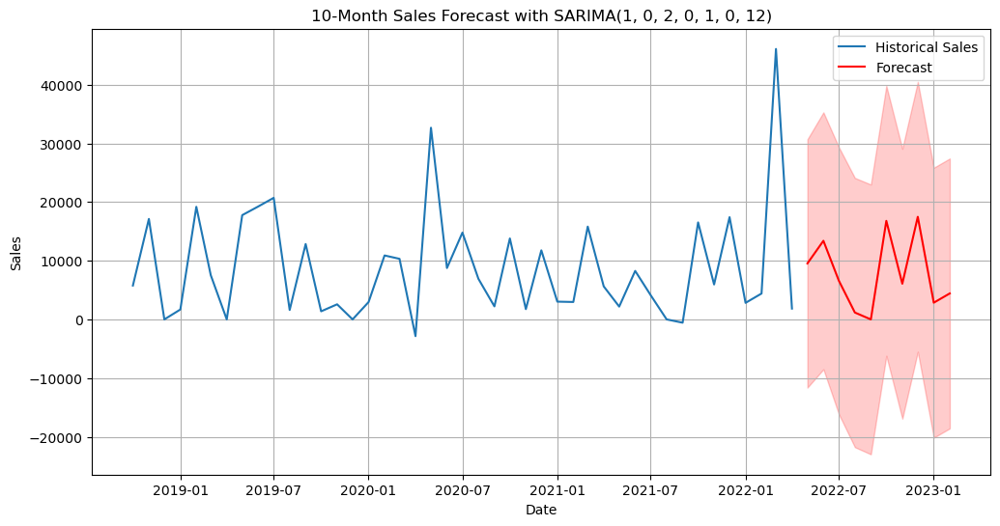

/var/folders/z6/_vn8cndd4x5dmx2cpjfdkjdr0000gn/T/ipykernel_48953/3316186037.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_set_14["Sales_EUR"] = results["yhat"]


,Mapped_GCK,Sales_EUR
Month Year,,
2022-05-01,#14,9542.220687
2022-06-01,#14,13398.434152
2022-07-01,#14,6584.696443
2022-08-01,#14,1170.918666
2022-09-01,#14,-1.922101
2022-10-01,#14,16801.381408
2022-11-01,#14,6079.478007
2022-12-01,#14,17488.565725
2023-01-01,#14,2849.122288


In [82]:
best_model, best_params, best_rmse, best_model_name = select_best_model(
    prophet_best_model_14, prophet_best_params_14, prophet_best_rmse_14, "Prophet",
    xgboost_best_model_14, xgboost_best_params_14, xgboost_best_rmse_14, "XGBoost"
    , sarima_best_model_14, sarima_best_params_14, sarima_best_rmse_14, "SARIMA"
)
print(f"Best Model: {best_model_name}")
print("Best Parameters:", best_params)
print("Best RMSE:", best_rmse)

if best_model_name == "XGBoost":
    results = xgboost_forecast(
        sales_agg14,
        df_market_14,
        period=10,
        params =best_params,
    )
elif best_model_name == "SARIMA":
    results = sarima_forecast(
        sales_agg14,
        period=10,
        params =best_params,
    )
else:
    results = prophet_forecast(
        sales_agg14,
        df_market_14,
        period=10,
        param =best_params,
    )
results.set_index('ds',inplace = True)
test_set_14.set_index('Month Year', inplace = True)
test_set_14["Sales_EUR"] = results["yhat"]
test_set_14

# Product 16

In [83]:
# selecte only the features that are selected in the feature selection step
test_set_16 = test_set[test_set['Mapped_GCK'] == '#16']
df_market_16 = df_market[selected_features_16]
df_market_16.head()

,MAB_ELE_PRO756_lag_5,RohiMETMIN1000_org,PRI27840_org,PRI27276_org,RohCOPPER1000_org,MAB_ELE_PRO156_lag_5,MAB_ELE_SHP250_lag_1
date,,,,,,,
2004-02-01,NaN,48.747945,78.969864,93.230453,36.623832,NaN,NaN
2004-03-01,NaN,49.256157,79.673569,93.335678,39.931055,NaN,83.458866
2004-04-01,NaN,49.423751,80.337639,93.440903,39.134854,NaN,106.168192
2004-05-01,NaN,46.468392,80.798828,93.546127,36.278433,NaN,92.007646
2004-06-01,NaN,47.803913,80.913490,93.440903,35.657380,NaN,85.696486


## Xgboost

In [84]:
X_train, X_val, y_train, y_val = train_val_split(sales_agg16, df_market_16, train_size = 0.8)

X_val.info() 

xgboost_best_model_16, xgboost_best_params_16, xgboost_best_rmse_16 = model_evaluation_XGboost(X_train,
                                                                                             y_train, 
                                                                                             X_val, y_val, 
                                                                                             xgboost_param_grid)

print("Best Params:", xgboost_best_params_16)
print("Validation RMSE:", xgboost_best_rmse_16)

<class 'pandas.core.frame.DataFrame'>
Index: 9 entries, 2021-08-01 to 2022-04-01
Data columns (total 7 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   MAB_ELE_PRO756_lag_5  9 non-null      float64
 1   RohiMETMIN1000_org    9 non-null      float64
 2   PRI27840_org          9 non-null      float64
 3   PRI27276_org          9 non-null      float64
 4   RohCOPPER1000_org     9 non-null      float64
 5   MAB_ELE_PRO156_lag_5  9 non-null      float64
 6   MAB_ELE_SHP250_lag_1  9 non-null      float64
dtypes: float64(7)
memory usage: 576.0+ bytes
Params: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.01, 'subsample': 0.5, 'colsample_bytree': 0.5, 'gamma': 0, 'reg_alpha': 0, 'reg_lambda': 0} => RMSE: 167525.1728, Relative RMSE: 0.9907
Params: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.01, 'subsample': 0.5, 'colsample_bytree': 0.5, 'gamma': 0, 'reg_alpha': 0, 'reg_lambda': 0.1} => RMSE: 171209.8561, Re

## Prophet

In [85]:
prophet_best_model_16, prophet_best_params_16, prophet_best_rmse_16 = model_evaluation_prophet(X_train,
                                                                                             y_train, 
                                                                                             X_val, 
                                                                                             y_val, 
                                                                                             prophet_param_grid)

print("Best Params:", prophet_best_params_16)

print("Validation RMSE:", prophet_best_rmse_16)

02:31:43 - cmdstanpy - INFO - Chain [1] start processing
02:31:43 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 205375.4545, Relative RMSE: 1.2145


02:31:43 - cmdstanpy - INFO - Chain [1] start processing
02:31:43 - cmdstanpy - INFO - Chain [1] done processing
02:31:43 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 205405.7535, Relative RMSE: 1.2147


02:31:43 - cmdstanpy - INFO - Chain [1] done processing
02:31:43 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 205371.4525, Relative RMSE: 1.2145


02:31:43 - cmdstanpy - INFO - Chain [1] done processing
02:31:43 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 213792.8347, Relative RMSE: 1.2643


02:31:43 - cmdstanpy - INFO - Chain [1] done processing
02:31:43 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 213351.8689, Relative RMSE: 1.2617


02:31:43 - cmdstanpy - INFO - Chain [1] done processing
02:31:44 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 213892.3648, Relative RMSE: 1.2649


02:31:44 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 218535.6344, Relative RMSE: 1.2923


02:31:44 - cmdstanpy - INFO - Chain [1] start processing
02:31:44 - cmdstanpy - INFO - Chain [1] done processing
02:31:44 - cmdstanpy - INFO - Chain [1] start processing
02:31:44 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 218553.6654, Relative RMSE: 1.2924


02:31:44 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 219141.3553, Relative RMSE: 1.2959


02:31:44 - cmdstanpy - INFO - Chain [1] done processing
02:31:44 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 102856.1304, Relative RMSE: 0.6082


02:31:45 - cmdstanpy - INFO - Chain [1] done processing
02:31:45 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 102634.5862, Relative RMSE: 0.6069


02:31:45 - cmdstanpy - INFO - Chain [1] done processing
02:31:45 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 103874.5149, Relative RMSE: 0.6143


02:31:45 - cmdstanpy - INFO - Chain [1] done processing
02:31:45 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 191537.1606, Relative RMSE: 1.1327


02:31:46 - cmdstanpy - INFO - Chain [1] done processing
02:31:46 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 193716.8006, Relative RMSE: 1.1456


02:31:47 - cmdstanpy - INFO - Chain [1] done processing
02:31:47 - cmdstanpy - INFO - Chain [1] start processing
02:31:47 - cmdstanpy - INFO - Chain [1] done processing
02:31:47 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 193606.7598, Relative RMSE: 1.1449
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 205917.7424, Relative RMSE: 1.2177


02:31:47 - cmdstanpy - INFO - Chain [1] done processing
02:31:47 - cmdstanpy - INFO - Chain [1] start processing
02:31:47 - cmdstanpy - INFO - Chain [1] done processing
02:31:47 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 205774.5903, Relative RMSE: 1.2169
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 206486.4426, Relative RMSE: 1.2211


02:31:47 - cmdstanpy - INFO - Chain [1] done processing
02:31:47 - cmdstanpy - INFO - Chain [1] start processing
02:31:47 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 200827.6194, Relative RMSE: 1.1876
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 201178.8333, Relative RMSE: 1.1897


02:31:48 - cmdstanpy - INFO - Chain [1] start processing
02:31:48 - cmdstanpy - INFO - Chain [1] done processing
02:31:48 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 201656.5080, Relative RMSE: 1.1925


02:31:48 - cmdstanpy - INFO - Chain [1] done processing
02:31:48 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 112382.1047, Relative RMSE: 0.6646


02:31:48 - cmdstanpy - INFO - Chain [1] done processing
02:31:48 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 112383.2394, Relative RMSE: 0.6646


02:31:49 - cmdstanpy - INFO - Chain [1] done processing
02:31:49 - cmdstanpy - INFO - Chain [1] start processing
02:31:49 - cmdstanpy - INFO - Chain [1] done processing
02:31:49 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 112375.3312, Relative RMSE: 0.6645
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 2988627.3336, Relative RMSE: 17.6734


02:31:49 - cmdstanpy - INFO - Chain [1] done processing
02:31:49 - cmdstanpy - INFO - Chain [1] start processing
02:31:49 - cmdstanpy - INFO - Chain [1] done processing
02:31:49 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 2974277.9449, Relative RMSE: 17.5885
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 2969579.3867, Relative RMSE: 17.5607


02:31:49 - cmdstanpy - INFO - Chain [1] done processing
02:31:49 - cmdstanpy - INFO - Chain [1] start processing
02:31:49 - cmdstanpy - INFO - Chain [1] done processing
02:31:49 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 2948240.3954, Relative RMSE: 17.4345
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 2938061.0931, Relative RMSE: 17.3743


02:31:50 - cmdstanpy - INFO - Chain [1] done processing
02:31:50 - cmdstanpy - INFO - Chain [1] start processing
02:31:50 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 2953117.9361, Relative RMSE: 17.4634


02:31:50 - cmdstanpy - INFO - Chain [1] start processing
02:31:50 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 2952497.2246, Relative RMSE: 17.4597
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 2952507.5444, Relative RMSE: 17.4598


02:31:50 - cmdstanpy - INFO - Chain [1] start processing
02:31:50 - cmdstanpy - INFO - Chain [1] done processing
02:31:50 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 2968378.1180, Relative RMSE: 17.5536


02:31:51 - cmdstanpy - INFO - Chain [1] done processing
02:31:51 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 3002399.0728, Relative RMSE: 17.7548


02:31:51 - cmdstanpy - INFO - Chain [1] done processing
02:31:51 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 2937233.4835, Relative RMSE: 17.3694


02:31:51 - cmdstanpy - INFO - Chain [1] done processing
02:31:51 - cmdstanpy - INFO - Chain [1] start processing
02:31:51 - cmdstanpy - INFO - Chain [1] done processing
02:31:51 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 2945309.4897, Relative RMSE: 17.4172
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 3724368.3146, Relative RMSE: 22.0242


02:31:52 - cmdstanpy - INFO - Chain [1] done processing
02:31:52 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 3707731.1963, Relative RMSE: 21.9258


02:31:52 - cmdstanpy - INFO - Chain [1] done processing
02:31:52 - cmdstanpy - INFO - Chain [1] start processing
02:31:52 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 3724216.0614, Relative RMSE: 22.0233
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 3552085.2567, Relative RMSE: 21.0054


02:31:52 - cmdstanpy - INFO - Chain [1] start processing
02:31:52 - cmdstanpy - INFO - Chain [1] done processing
02:31:52 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 3557297.9916, Relative RMSE: 21.0362


02:31:53 - cmdstanpy - INFO - Chain [1] done processing
02:31:53 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 3544897.8525, Relative RMSE: 20.9629


02:31:53 - cmdstanpy - INFO - Chain [1] done processing
02:31:53 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 3445050.0475, Relative RMSE: 20.3724


02:31:53 - cmdstanpy - INFO - Chain [1] done processing
02:31:53 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 3447606.5734, Relative RMSE: 20.3876


02:31:54 - cmdstanpy - INFO - Chain [1] done processing
02:31:54 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 3465315.5606, Relative RMSE: 20.4923


02:31:54 - cmdstanpy - INFO - Chain [1] done processing
02:31:54 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 3382574.2527, Relative RMSE: 20.0030


02:31:55 - cmdstanpy - INFO - Chain [1] done processing
02:31:55 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 3378139.7732, Relative RMSE: 19.9768


02:31:55 - cmdstanpy - INFO - Chain [1] done processing
02:31:55 - cmdstanpy - INFO - Chain [1] start processing
02:31:56 - cmdstanpy - INFO - Chain [1] done processing
02:31:56 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 3357346.5420, Relative RMSE: 19.8538
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 204942.4789, Relative RMSE: 1.2119


02:31:56 - cmdstanpy - INFO - Chain [1] done processing
02:31:56 - cmdstanpy - INFO - Chain [1] start processing
02:31:56 - cmdstanpy - INFO - Chain [1] done processing
02:31:56 - cmdstanpy - INFO - Chain [1] start processing
02:31:56 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 205398.0015, Relative RMSE: 1.2146
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 204925.6633, Relative RMSE: 1.2118


02:31:56 - cmdstanpy - INFO - Chain [1] start processing
02:31:56 - cmdstanpy - INFO - Chain [1] done processing
02:31:56 - cmdstanpy - INFO - Chain [1] start processing
02:31:56 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 211341.1863, Relative RMSE: 1.2498
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 211229.2779, Relative RMSE: 1.2491


02:31:56 - cmdstanpy - INFO - Chain [1] start processing
02:31:56 - cmdstanpy - INFO - Chain [1] done processing
02:31:56 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 211250.3560, Relative RMSE: 1.2492
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 216244.1436, Relative RMSE: 1.2788


02:31:56 - cmdstanpy - INFO - Chain [1] done processing
02:31:56 - cmdstanpy - INFO - Chain [1] start processing
02:31:57 - cmdstanpy - INFO - Chain [1] done processing
02:31:57 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 220467.7389, Relative RMSE: 1.3037
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 216500.9294, Relative RMSE: 1.2803


02:31:57 - cmdstanpy - INFO - Chain [1] done processing
02:31:57 - cmdstanpy - INFO - Chain [1] start processing
02:31:57 - cmdstanpy - INFO - Chain [1] done processing
02:31:57 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 104727.8711, Relative RMSE: 0.6193
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 104976.5580, Relative RMSE: 0.6208


02:31:57 - cmdstanpy - INFO - Chain [1] done processing
02:31:57 - cmdstanpy - INFO - Chain [1] start processing
02:31:57 - cmdstanpy - INFO - Chain [1] done processing
02:31:57 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 104996.1801, Relative RMSE: 0.6209
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 204942.4789, Relative RMSE: 1.2119


02:31:57 - cmdstanpy - INFO - Chain [1] done processing
02:31:57 - cmdstanpy - INFO - Chain [1] start processing
02:31:57 - cmdstanpy - INFO - Chain [1] done processing
02:31:57 - cmdstanpy - INFO - Chain [1] start processing
02:31:58 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 205398.0015, Relative RMSE: 1.2146
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 204925.6633, Relative RMSE: 1.2118


02:31:58 - cmdstanpy - INFO - Chain [1] start processing
02:31:58 - cmdstanpy - INFO - Chain [1] done processing
02:31:58 - cmdstanpy - INFO - Chain [1] start processing
02:31:58 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 211341.1863, Relative RMSE: 1.2498
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 211229.2779, Relative RMSE: 1.2491


02:31:58 - cmdstanpy - INFO - Chain [1] start processing
02:31:58 - cmdstanpy - INFO - Chain [1] done processing
02:31:58 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 211250.3560, Relative RMSE: 1.2492
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 216244.1436, Relative RMSE: 1.2788


02:31:58 - cmdstanpy - INFO - Chain [1] done processing
02:31:58 - cmdstanpy - INFO - Chain [1] start processing
02:31:58 - cmdstanpy - INFO - Chain [1] done processing
02:31:58 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 220467.7389, Relative RMSE: 1.3037
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 216500.9294, Relative RMSE: 1.2803


02:31:58 - cmdstanpy - INFO - Chain [1] done processing
02:31:58 - cmdstanpy - INFO - Chain [1] start processing
02:31:59 - cmdstanpy - INFO - Chain [1] done processing
02:31:59 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 104727.8711, Relative RMSE: 0.6193
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 104976.5580, Relative RMSE: 0.6208


02:31:59 - cmdstanpy - INFO - Chain [1] done processing
02:31:59 - cmdstanpy - INFO - Chain [1] start processing
02:31:59 - cmdstanpy - INFO - Chain [1] done processing
02:31:59 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 104996.1801, Relative RMSE: 0.6209
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 204942.4789, Relative RMSE: 1.2119


02:31:59 - cmdstanpy - INFO - Chain [1] done processing
02:31:59 - cmdstanpy - INFO - Chain [1] start processing
02:31:59 - cmdstanpy - INFO - Chain [1] done processing
02:31:59 - cmdstanpy - INFO - Chain [1] start processing
02:31:59 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 205398.0015, Relative RMSE: 1.2146
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 204925.6633, Relative RMSE: 1.2118


02:31:59 - cmdstanpy - INFO - Chain [1] start processing
02:31:59 - cmdstanpy - INFO - Chain [1] done processing
02:31:59 - cmdstanpy - INFO - Chain [1] start processing
02:31:59 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 211341.1863, Relative RMSE: 1.2498
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 211229.2779, Relative RMSE: 1.2491


02:31:59 - cmdstanpy - INFO - Chain [1] start processing
02:32:00 - cmdstanpy - INFO - Chain [1] done processing
02:32:00 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 211250.3560, Relative RMSE: 1.2492
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 216244.1436, Relative RMSE: 1.2788


02:32:00 - cmdstanpy - INFO - Chain [1] done processing
02:32:00 - cmdstanpy - INFO - Chain [1] start processing
02:32:00 - cmdstanpy - INFO - Chain [1] done processing
02:32:00 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 220467.7389, Relative RMSE: 1.3037
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 216500.9294, Relative RMSE: 1.2803


02:32:00 - cmdstanpy - INFO - Chain [1] done processing
02:32:00 - cmdstanpy - INFO - Chain [1] start processing
02:32:00 - cmdstanpy - INFO - Chain [1] done processing
02:32:00 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 104727.8711, Relative RMSE: 0.6193
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 104976.5580, Relative RMSE: 0.6208


02:32:00 - cmdstanpy - INFO - Chain [1] done processing
02:32:00 - cmdstanpy - INFO - Chain [1] start processing
02:32:00 - cmdstanpy - INFO - Chain [1] done processing
02:32:00 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 104996.1801, Relative RMSE: 0.6209
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 204942.4789, Relative RMSE: 1.2119


02:32:01 - cmdstanpy - INFO - Chain [1] done processing
02:32:01 - cmdstanpy - INFO - Chain [1] start processing
02:32:01 - cmdstanpy - INFO - Chain [1] done processing
02:32:01 - cmdstanpy - INFO - Chain [1] start processing
02:32:01 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 205398.0015, Relative RMSE: 1.2146
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 204925.6633, Relative RMSE: 1.2118


02:32:01 - cmdstanpy - INFO - Chain [1] start processing
02:32:01 - cmdstanpy - INFO - Chain [1] done processing
02:32:01 - cmdstanpy - INFO - Chain [1] start processing
02:32:01 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 211341.1863, Relative RMSE: 1.2498
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 211229.2779, Relative RMSE: 1.2491


02:32:01 - cmdstanpy - INFO - Chain [1] start processing
02:32:01 - cmdstanpy - INFO - Chain [1] done processing
02:32:01 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 211250.3560, Relative RMSE: 1.2492
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 216244.1436, Relative RMSE: 1.2788


02:32:01 - cmdstanpy - INFO - Chain [1] done processing
02:32:01 - cmdstanpy - INFO - Chain [1] start processing
02:32:01 - cmdstanpy - INFO - Chain [1] done processing
02:32:01 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 220467.7389, Relative RMSE: 1.3037
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 216500.9294, Relative RMSE: 1.2803


02:32:02 - cmdstanpy - INFO - Chain [1] done processing
02:32:02 - cmdstanpy - INFO - Chain [1] start processing
02:32:02 - cmdstanpy - INFO - Chain [1] done processing
02:32:02 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 104727.8711, Relative RMSE: 0.6193
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 104976.5580, Relative RMSE: 0.6208


02:32:02 - cmdstanpy - INFO - Chain [1] done processing
02:32:02 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 104996.1801, Relative RMSE: 0.6209


02:32:02 - cmdstanpy - INFO - Chain [1] done processing
02:32:02 - cmdstanpy - INFO - Chain [1] start processing
02:32:02 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 205755.9053, Relative RMSE: 1.2167


02:32:02 - cmdstanpy - INFO - Chain [1] start processing
02:32:03 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 205571.3072, Relative RMSE: 1.2157


02:32:03 - cmdstanpy - INFO - Chain [1] start processing
02:32:03 - cmdstanpy - INFO - Chain [1] done processing
02:32:03 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 205302.8085, Relative RMSE: 1.2141
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 211774.7296, Relative RMSE: 1.2523


02:32:03 - cmdstanpy - INFO - Chain [1] done processing
02:32:03 - cmdstanpy - INFO - Chain [1] start processing
02:32:03 - cmdstanpy - INFO - Chain [1] done processing
02:32:03 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 211785.3130, Relative RMSE: 1.2524
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 211772.6344, Relative RMSE: 1.2523


02:32:03 - cmdstanpy - INFO - Chain [1] done processing
02:32:03 - cmdstanpy - INFO - Chain [1] start processing
02:32:03 - cmdstanpy - INFO - Chain [1] done processing
02:32:04 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 217404.3088, Relative RMSE: 1.2856
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 217358.8817, Relative RMSE: 1.2854


02:32:04 - cmdstanpy - INFO - Chain [1] done processing
02:32:04 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 217826.5648, Relative RMSE: 1.2881


02:32:04 - cmdstanpy - INFO - Chain [1] done processing
02:32:04 - cmdstanpy - INFO - Chain [1] start processing
02:32:04 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 104195.3429, Relative RMSE: 0.6162
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 104093.7241, Relative RMSE: 0.6156


02:32:04 - cmdstanpy - INFO - Chain [1] start processing
02:32:04 - cmdstanpy - INFO - Chain [1] done processing
02:32:04 - cmdstanpy - INFO - Chain [1] start processing
02:32:04 - cmdstanpy - INFO - Chain [1] done processing
02:32:05 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 103157.1803, Relative RMSE: 0.6100
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 259018.1051, Relative RMSE: 1.5317


02:32:05 - cmdstanpy - INFO - Chain [1] done processing
02:32:05 - cmdstanpy - INFO - Chain [1] start processing
02:32:05 - cmdstanpy - INFO - Chain [1] done processing
02:32:05 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 259011.0404, Relative RMSE: 1.5317
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 259034.4874, Relative RMSE: 1.5318


02:32:05 - cmdstanpy - INFO - Chain [1] done processing
02:32:05 - cmdstanpy - INFO - Chain [1] start processing
02:32:05 - cmdstanpy - INFO - Chain [1] done processing
02:32:05 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 259604.0916, Relative RMSE: 1.5352
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 259653.9645, Relative RMSE: 1.5355


02:32:05 - cmdstanpy - INFO - Chain [1] done processing
02:32:05 - cmdstanpy - INFO - Chain [1] start processing
02:32:05 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 259619.2497, Relative RMSE: 1.5353


02:32:05 - cmdstanpy - INFO - Chain [1] start processing
02:32:06 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 107451.9403, Relative RMSE: 0.6354
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 107094.2292, Relative RMSE: 0.6333


02:32:06 - cmdstanpy - INFO - Chain [1] start processing
02:32:06 - cmdstanpy - INFO - Chain [1] done processing
02:32:06 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 106995.1388, Relative RMSE: 0.6327


02:32:06 - cmdstanpy - INFO - Chain [1] done processing
02:32:06 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 97423.6124, Relative RMSE: 0.5761


02:32:07 - cmdstanpy - INFO - Chain [1] done processing
02:32:07 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 99528.0627, Relative RMSE: 0.5886


02:32:07 - cmdstanpy - INFO - Chain [1] done processing
02:32:07 - cmdstanpy - INFO - Chain [1] start processing
02:32:07 - cmdstanpy - INFO - Chain [1] done processing
02:32:07 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 96675.3244, Relative RMSE: 0.5717
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 319242.6616, Relative RMSE: 1.8879


02:32:07 - cmdstanpy - INFO - Chain [1] done processing
02:32:07 - cmdstanpy - INFO - Chain [1] start processing
02:32:07 - cmdstanpy - INFO - Chain [1] done processing
02:32:07 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 319143.7164, Relative RMSE: 1.8873
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 319013.3966, Relative RMSE: 1.8865


02:32:07 - cmdstanpy - INFO - Chain [1] done processing
02:32:07 - cmdstanpy - INFO - Chain [1] start processing
02:32:08 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 308693.0947, Relative RMSE: 1.8255
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 310831.3772, Relative RMSE: 1.8381


02:32:08 - cmdstanpy - INFO - Chain [1] start processing
02:32:08 - cmdstanpy - INFO - Chain [1] done processing
02:32:08 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 315780.8987, Relative RMSE: 1.8674


02:32:08 - cmdstanpy - INFO - Chain [1] done processing
02:32:08 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 176787.7895, Relative RMSE: 1.0454


02:32:08 - cmdstanpy - INFO - Chain [1] done processing
02:32:09 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 176833.9965, Relative RMSE: 1.0457


02:32:09 - cmdstanpy - INFO - Chain [1] done processing
02:32:09 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 186157.6900, Relative RMSE: 1.1009


02:32:09 - cmdstanpy - INFO - Chain [1] done processing
02:32:10 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 230000.6907, Relative RMSE: 1.3601


02:32:10 - cmdstanpy - INFO - Chain [1] done processing
02:32:10 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 310779.2547, Relative RMSE: 1.8378


02:32:11 - cmdstanpy - INFO - Chain [1] done processing
02:32:11 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 305240.1443, Relative RMSE: 1.8050


02:32:11 - cmdstanpy - INFO - Chain [1] done processing
02:32:11 - cmdstanpy - INFO - Chain [1] start processing
02:32:11 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 608528.4359, Relative RMSE: 3.5986


02:32:11 - cmdstanpy - INFO - Chain [1] start processing
02:32:12 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 582529.7558, Relative RMSE: 3.4448
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 580752.0491, Relative RMSE: 3.4343


02:32:12 - cmdstanpy - INFO - Chain [1] start processing
02:32:12 - cmdstanpy - INFO - Chain [1] done processing
02:32:12 - cmdstanpy - INFO - Chain [1] start processing
02:32:12 - cmdstanpy - INFO - Chain [1] done processing
02:32:12 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 679911.8383, Relative RMSE: 4.0207
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 707640.8166, Relative RMSE: 4.1847


02:32:12 - cmdstanpy - INFO - Chain [1] done processing
02:32:12 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 701170.1516, Relative RMSE: 4.1464


02:32:12 - cmdstanpy - INFO - Chain [1] done processing
02:32:12 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 1509906.6006, Relative RMSE: 8.9289


02:32:13 - cmdstanpy - INFO - Chain [1] done processing
02:32:13 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 1518746.0561, Relative RMSE: 8.9812


02:32:13 - cmdstanpy - INFO - Chain [1] done processing
02:32:13 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 1568058.2206, Relative RMSE: 9.2728


02:32:14 - cmdstanpy - INFO - Chain [1] done processing
02:32:14 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 1603109.3607, Relative RMSE: 9.4800


02:32:15 - cmdstanpy - INFO - Chain [1] done processing
02:32:15 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 1290855.5713, Relative RMSE: 7.6335


02:32:15 - cmdstanpy - INFO - Chain [1] done processing
02:32:15 - cmdstanpy - INFO - Chain [1] start processing
02:32:16 - cmdstanpy - INFO - Chain [1] done processing
02:32:16 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 1087977.8135, Relative RMSE: 6.4338
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 204942.4789, Relative RMSE: 1.2119


02:32:16 - cmdstanpy - INFO - Chain [1] done processing
02:32:16 - cmdstanpy - INFO - Chain [1] start processing
02:32:16 - cmdstanpy - INFO - Chain [1] done processing
02:32:16 - cmdstanpy - INFO - Chain [1] start processing
02:32:16 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 205398.0015, Relative RMSE: 1.2146
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 204925.6633, Relative RMSE: 1.2118


02:32:16 - cmdstanpy - INFO - Chain [1] start processing
02:32:16 - cmdstanpy - INFO - Chain [1] done processing
02:32:16 - cmdstanpy - INFO - Chain [1] start processing
02:32:16 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 211341.1863, Relative RMSE: 1.2498
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 211229.2779, Relative RMSE: 1.2491


02:32:16 - cmdstanpy - INFO - Chain [1] start processing
02:32:16 - cmdstanpy - INFO - Chain [1] done processing
02:32:16 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 211250.3560, Relative RMSE: 1.2492
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 216244.1436, Relative RMSE: 1.2788


02:32:16 - cmdstanpy - INFO - Chain [1] done processing
02:32:16 - cmdstanpy - INFO - Chain [1] start processing
02:32:17 - cmdstanpy - INFO - Chain [1] done processing
02:32:17 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 220467.7389, Relative RMSE: 1.3037
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 216500.9294, Relative RMSE: 1.2803


02:32:17 - cmdstanpy - INFO - Chain [1] done processing
02:32:17 - cmdstanpy - INFO - Chain [1] start processing
02:32:17 - cmdstanpy - INFO - Chain [1] done processing
02:32:17 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 104727.8711, Relative RMSE: 0.6193
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 104976.5580, Relative RMSE: 0.6208


02:32:17 - cmdstanpy - INFO - Chain [1] done processing
02:32:17 - cmdstanpy - INFO - Chain [1] start processing
02:32:17 - cmdstanpy - INFO - Chain [1] done processing
02:32:17 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 104996.1801, Relative RMSE: 0.6209
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 204942.4789, Relative RMSE: 1.2119


02:32:17 - cmdstanpy - INFO - Chain [1] done processing
02:32:17 - cmdstanpy - INFO - Chain [1] start processing
02:32:17 - cmdstanpy - INFO - Chain [1] done processing
02:32:17 - cmdstanpy - INFO - Chain [1] start processing
02:32:17 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 205398.0015, Relative RMSE: 1.2146
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 204925.6633, Relative RMSE: 1.2118


02:32:18 - cmdstanpy - INFO - Chain [1] start processing
02:32:18 - cmdstanpy - INFO - Chain [1] done processing
02:32:18 - cmdstanpy - INFO - Chain [1] start processing
02:32:18 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 211341.1863, Relative RMSE: 1.2498
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 211229.2779, Relative RMSE: 1.2491


02:32:18 - cmdstanpy - INFO - Chain [1] start processing
02:32:18 - cmdstanpy - INFO - Chain [1] done processing
02:32:18 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 211250.3560, Relative RMSE: 1.2492
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 216244.1436, Relative RMSE: 1.2788


02:32:18 - cmdstanpy - INFO - Chain [1] done processing
02:32:18 - cmdstanpy - INFO - Chain [1] start processing
02:32:18 - cmdstanpy - INFO - Chain [1] done processing
02:32:18 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 220467.7389, Relative RMSE: 1.3037
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 216500.9294, Relative RMSE: 1.2803


02:32:18 - cmdstanpy - INFO - Chain [1] done processing
02:32:18 - cmdstanpy - INFO - Chain [1] start processing
02:32:18 - cmdstanpy - INFO - Chain [1] done processing
02:32:19 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 104727.8711, Relative RMSE: 0.6193
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 104976.5580, Relative RMSE: 0.6208


02:32:19 - cmdstanpy - INFO - Chain [1] done processing
02:32:19 - cmdstanpy - INFO - Chain [1] start processing
02:32:19 - cmdstanpy - INFO - Chain [1] done processing
02:32:19 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 104996.1801, Relative RMSE: 0.6209
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 204942.4789, Relative RMSE: 1.2119


02:32:19 - cmdstanpy - INFO - Chain [1] done processing
02:32:19 - cmdstanpy - INFO - Chain [1] start processing
02:32:19 - cmdstanpy - INFO - Chain [1] done processing
02:32:19 - cmdstanpy - INFO - Chain [1] start processing
02:32:19 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 205398.0015, Relative RMSE: 1.2146
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 204925.6633, Relative RMSE: 1.2118


02:32:19 - cmdstanpy - INFO - Chain [1] start processing
02:32:19 - cmdstanpy - INFO - Chain [1] done processing
02:32:19 - cmdstanpy - INFO - Chain [1] start processing
02:32:19 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 211341.1863, Relative RMSE: 1.2498
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 211229.2779, Relative RMSE: 1.2491


02:32:19 - cmdstanpy - INFO - Chain [1] start processing
02:32:19 - cmdstanpy - INFO - Chain [1] done processing
02:32:20 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 211250.3560, Relative RMSE: 1.2492
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 216244.1436, Relative RMSE: 1.2788


02:32:20 - cmdstanpy - INFO - Chain [1] done processing
02:32:20 - cmdstanpy - INFO - Chain [1] start processing
02:32:20 - cmdstanpy - INFO - Chain [1] done processing
02:32:20 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 220467.7389, Relative RMSE: 1.3037
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 216500.9294, Relative RMSE: 1.2803


02:32:20 - cmdstanpy - INFO - Chain [1] done processing
02:32:20 - cmdstanpy - INFO - Chain [1] start processing
02:32:20 - cmdstanpy - INFO - Chain [1] done processing
02:32:20 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 104727.8711, Relative RMSE: 0.6193
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 104976.5580, Relative RMSE: 0.6208


02:32:20 - cmdstanpy - INFO - Chain [1] done processing
02:32:20 - cmdstanpy - INFO - Chain [1] start processing
02:32:20 - cmdstanpy - INFO - Chain [1] done processing
02:32:20 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 104996.1801, Relative RMSE: 0.6209
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 204942.4789, Relative RMSE: 1.2119


02:32:20 - cmdstanpy - INFO - Chain [1] done processing
02:32:21 - cmdstanpy - INFO - Chain [1] start processing
02:32:21 - cmdstanpy - INFO - Chain [1] done processing
02:32:21 - cmdstanpy - INFO - Chain [1] start processing
02:32:21 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 205398.0015, Relative RMSE: 1.2146
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 204925.6633, Relative RMSE: 1.2118


02:32:21 - cmdstanpy - INFO - Chain [1] start processing
02:32:21 - cmdstanpy - INFO - Chain [1] done processing
02:32:21 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 211341.1863, Relative RMSE: 1.2498
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 211229.2779, Relative RMSE: 1.2491


02:32:21 - cmdstanpy - INFO - Chain [1] done processing
02:32:21 - cmdstanpy - INFO - Chain [1] start processing
02:32:21 - cmdstanpy - INFO - Chain [1] done processing
02:32:21 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 211250.3560, Relative RMSE: 1.2492
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 216244.1436, Relative RMSE: 1.2788


02:32:21 - cmdstanpy - INFO - Chain [1] done processing
02:32:21 - cmdstanpy - INFO - Chain [1] start processing
02:32:21 - cmdstanpy - INFO - Chain [1] done processing
02:32:21 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 220467.7389, Relative RMSE: 1.3037
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 216500.9294, Relative RMSE: 1.2803


02:32:22 - cmdstanpy - INFO - Chain [1] done processing
02:32:22 - cmdstanpy - INFO - Chain [1] start processing
02:32:22 - cmdstanpy - INFO - Chain [1] done processing
02:32:22 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 104727.8711, Relative RMSE: 0.6193
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 104976.5580, Relative RMSE: 0.6208


02:32:22 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 104996.1801, Relative RMSE: 0.6209
Best Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0}
Validation RMSE: 96675.3243841567


## Sarima

In [86]:
sarima_best_model_16, sarima_best_params_16, sarima_best_rmse_16 = model_evaluation_SARIMA(y_train, 
                                                             y_val, 
                                                             sarima_param_grid)

print("Best Params:", sarima_best_params_16)
print("Validation RMSE:", sarima_best_rmse_16)

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,0) x (0,0,0,6) => RMSE: 189720.8051, Relative RMSE: 1.1219
SARIMA(0,0,0) x (0,0,0,12) => RMSE: 189720.8051, Relative RMSE: 1.1219
SARIMA(0,0,0) x (0,0,1,6) => RMSE: 161205.9365, Relative RMSE: 0.9533
SARIMA(0,0,0) x (0,0,1,12) => RMSE: 172185.0819, Relative RMSE: 1.0182
SARIMA(0,0,0) x (0,1,0,6) => RMSE: 113069.7619, Relative RMSE: 0.6686
SARIMA(0,0,0) x (0,1,0,12) => RMSE: 98091.5180, Relative RMSE: 0.5801
SARIMA(0,0,0) x (0,1,1,6) => RMSE: 125622.7174, Relative RMSE: 0.7429
SARIMA(0,0,0) x (0,1,1,12) => RMSE: 93056.6612, Relative RMSE: 0.5503
SARIMA(0,0,0) x (1,0,0,6) => RMSE: 141238.9410, Relative RMSE: 0.8352
SARIMA(0,0,0) x (1,0,0,12) => RMSE: 160084.0718, Relative RMSE: 0.9467
SARIMA(0,0,0) x (1,0,1,6) => RMSE: 110219.5866, Relative RMSE: 0.6518
SARIMA(0,0,0) x (1,0,1,12) => RMSE: 106619.5711, Relative RMSE: 0.6305


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,0,0) x (1,1,0,6) => RMSE: 118170.3780, Relative RMSE: 0.6988
SARIMA(0,0,0) x (1,1,0,12) => RMSE: 93168.7000, Relative RMSE: 0.5510


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(0,0,0) x (1,1,1,6) => RMSE: 126039.0913, Relative RMSE: 0.7453
SARIMA(0,0,0) x (1,1,1,12) => RMSE: 123904.6310, Relative RMSE: 0.7327
SARIMA(0,0,1) x (0,0,0,6) => RMSE: 185923.8612, Relative RMSE: 1.0995
SARIMA(0,0,1) x (0,0,0,12) => RMSE: 185923.8612, Relative RMSE: 1.0995
SARIMA(0,0,1) x (0,0,1,6) => RMSE: 162876.1729, Relative RMSE: 0.9632
SARIMA(0,0,1) x (0,0,1,12) => RMSE: 172444.3113, Relative RMSE: 1.0198
SARIMA(0,0,1) x (0,1,0,6) => RMSE: 112442.6162, Relative RMSE: 0.6649
SARIMA(0,0,1) x (0,1,0,12) => RMSE: 114705.0397, Relative RMSE: 0.6783


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(0,0,1) x (0,1,1,6) => RMSE: 126980.9928, Relative RMSE: 0.7509
SARIMA(0,0,1) x (0,1,1,12) => RMSE: 82136.2956, Relative RMSE: 0.4857


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,1) x (1,0,0,6) => RMSE: 142819.0565, Relative RMSE: 0.8446
SARIMA(0,0,1) x (1,0,0,12) => RMSE: 164667.9057, Relative RMSE: 0.9738
SARIMA(0,0,1) x (1,0,1,6) => RMSE: 107534.1716, Relative RMSE: 0.6359
SARIMA(0,0,1) x (1,0,1,12) => RMSE: 112714.2675, Relative RMSE: 0.6665
SARIMA(0,0,1) x (1,1,0,6) => RMSE: 117216.1614, Relative RMSE: 0.6932
SARIMA(0,0,1) x (1,1,0,12) => RMSE: 95402.3123, Relative RMSE: 0.5642
SARIMA(0,0,1) x (1,1,1,6) => RMSE: 128250.0743, Relative RMSE: 0.7584


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,0,1) x (1,1,1,12) => RMSE: 121772.7792, Relative RMSE: 0.7201
SARIMA(0,0,2) x (0,0,0,6) => RMSE: 178894.7075, Relative RMSE: 1.0579
SARIMA(0,0,2) x (0,0,0,12) => RMSE: 178894.7075, Relative RMSE: 1.0579
SARIMA(0,0,2) x (0,0,1,6) => RMSE: 148019.7652, Relative RMSE: 0.8753
SARIMA(0,0,2) x (0,0,1,12) => RMSE: 189328.7804, Relative RMSE: 1.1196
SARIMA(0,0,2) x (0,1,0,6) => RMSE: 120360.4913, Relative RMSE: 0.7118
SARIMA(0,0,2) x (0,1,0,12) => RMSE: 107027.3222, Relative RMSE: 0.6329
SARIMA(0,0,2) x (0,1,1,6) => RMSE: 127783.2638, Relative RMSE: 0.7557
SARIMA(0,0,2) x (0,1,1,12) => RMSE: 122501.1116, Relative RMSE: 0.7244


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,2) x (1,0,0,6) => RMSE: 143366.9510, Relative RMSE: 0.8478
SARIMA(0,0,2) x (1,0,0,12) => RMSE: 171082.9572, Relative RMSE: 1.0117
SARIMA(0,0,2) x (1,0,1,6) => RMSE: 106850.7205, Relative RMSE: 0.6319
SARIMA(0,0,2) x (1,0,1,12) => RMSE: 131591.6450, Relative RMSE: 0.7782
SARIMA(0,0,2) x (1,1,0,6) => RMSE: 119601.3093, Relative RMSE: 0.7073
SARIMA(0,0,2) x (1,1,0,12) => RMSE: 102309.8566, Relative RMSE: 0.6050
SARIMA(0,0,2) x (1,1,1,6) => RMSE: 128773.3398, Relative RMSE: 0.7615


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,0,2) x (1,1,1,12) => RMSE: 123572.8959, Relative RMSE: 0.7308
SARIMA(0,1,0) x (0,0,0,6) => RMSE: 107911.1291, Relative RMSE: 0.6381
SARIMA(0,1,0) x (0,0,0,12) => RMSE: 107911.1291, Relative RMSE: 0.6381
SARIMA(0,1,0) x (0,0,1,6) => RMSE: 101572.1460, Relative RMSE: 0.6007
SARIMA(0,1,0) x (0,0,1,12) => RMSE: 112412.0391, Relative RMSE: 0.6648
SARIMA(0,1,0) x (0,1,0,6) => RMSE: 161351.9207, Relative RMSE: 0.9542
SARIMA(0,1,0) x (0,1,0,12) => RMSE: 320662.4970, Relative RMSE: 1.8962
SARIMA(0,1,0) x (0,1,1,6) => RMSE: 138279.5513, Relative RMSE: 0.8177
SARIMA(0,1,0) x (0,1,1,12) => RMSE: 177485.8986, Relative RMSE: 1.0496
SARIMA(0,1,0) x (1,0,0,6) => RMSE: 101337.9901, Relative RMSE: 0.5993
SARIMA(0,1,0) x (1,0,0,12) => RMSE: 112568.4284, Relative RMSE: 0.6657
SARIMA(0,1,0) x (1,0,1,6) => RMSE: 106868.1982, Relative RMSE: 0.6320
SARIMA(0,1,0) x (1,0,1,12) => RMSE: 99426.7928, Relative RMSE: 0.5880
SARIMA(0,1,0) x (1,1,0,6) => RMSE: 141752.2646, Relative RMSE: 0.8383


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,0) x (1,1,0,12) => RMSE: 298966.2446, Relative RMSE: 1.7679
SARIMA(0,1,0) x (1,1,1,6) => RMSE: 139979.3867, Relative RMSE: 0.8278
SARIMA(0,1,0) x (1,1,1,12) => RMSE: 354033.2850, Relative RMSE: 2.0936
SARIMA(0,1,1) x (0,0,0,6) => RMSE: 150373.2400, Relative RMSE: 0.8892
SARIMA(0,1,1) x (0,0,0,12) => RMSE: 150373.2400, Relative RMSE: 0.8892
SARIMA(0,1,1) x (0,0,1,6) => RMSE: 96699.1677, Relative RMSE: 0.5718
SARIMA(0,1,1) x (0,0,1,12) => RMSE: 87446.6413, Relative RMSE: 0.5171
SARIMA(0,1,1) x (0,1,0,6) => RMSE: 112239.4048, Relative RMSE: 0.6637
SARIMA(0,1,1) x (0,1,0,12) => RMSE: 144428.4718, Relative RMSE: 0.8541


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(0,1,1) x (0,1,1,6) => RMSE: 152911.6420, Relative RMSE: 0.9042
SARIMA(0,1,1) x (0,1,1,12) => RMSE: 123617.6961, Relative RMSE: 0.7310
SARIMA(0,1,1) x (1,0,0,6) => RMSE: 90851.5657, Relative RMSE: 0.5373
SARIMA(0,1,1) x (1,0,0,12) => RMSE: 87068.2954, Relative RMSE: 0.5149
SARIMA(0,1,1) x (1,0,1,6) => RMSE: 95679.5266, Relative RMSE: 0.5658
SARIMA(0,1,1) x (1,0,1,12) => RMSE: 87390.3868, Relative RMSE: 0.5168


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,1,1) x (1,1,0,6) => RMSE: 109212.3151, Relative RMSE: 0.6458
SARIMA(0,1,1) x (1,1,0,12) => RMSE: 123971.0790, Relative RMSE: 0.7331
SARIMA(0,1,1) x (1,1,1,6) => RMSE: 238387.9352, Relative RMSE: 1.4097
SARIMA(0,1,1) x (1,1,1,12) => RMSE: 351679.5027, Relative RMSE: 2.0797
SARIMA(0,1,2) x (0,0,0,6) => RMSE: 82033.0394, Relative RMSE: 0.4851
SARIMA(0,1,2) x (0,0,0,12) => RMSE: 82033.0394, Relative RMSE: 0.4851


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,2) x (0,0,1,6) => RMSE: 87783.8938, Relative RMSE: 0.5191
SARIMA(0,1,2) x (0,0,1,12) => RMSE: 81801.2431, Relative RMSE: 0.4837
SARIMA(0,1,2) x (0,1,0,6) => RMSE: 117147.1348, Relative RMSE: 0.6928
SARIMA(0,1,2) x (0,1,0,12) => RMSE: 122700.5089, Relative RMSE: 0.7256
SARIMA(0,1,2) x (0,1,1,6) => RMSE: 143645.2566, Relative RMSE: 0.8495
SARIMA(0,1,2) x (0,1,1,12) => RMSE: 212481.1852, Relative RMSE: 1.2565
SARIMA(0,1,2) x (1,0,0,6) => RMSE: 91020.1467, Relative RMSE: 0.5383
SARIMA(0,1,2) x (1,0,0,12) => RMSE: 86253.3398, Relative RMSE: 0.5101


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,2) x (1,0,1,6) => RMSE: 94111.9885, Relative RMSE: 0.5565
SARIMA(0,1,2) x (1,0,1,12) => RMSE: 80986.1303, Relative RMSE: 0.4789
SARIMA(0,1,2) x (1,1,0,6) => RMSE: 106565.5563, Relative RMSE: 0.6302
SARIMA(0,1,2) x (1,1,0,12) => RMSE: 88924.9643, Relative RMSE: 0.5259


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(0,1,2) x (1,1,1,6) => RMSE: 143677.5064, Relative RMSE: 0.8496
SARIMA(0,1,2) x (1,1,1,12) => RMSE: 256518.1009, Relative RMSE: 1.5169
SARIMA(1,0,0) x (0,0,0,6) => RMSE: 172563.1771, Relative RMSE: 1.0205
SARIMA(1,0,0) x (0,0,0,12) => RMSE: 172563.1771, Relative RMSE: 1.0205
SARIMA(1,0,0) x (0,0,1,6) => RMSE: 144410.4767, Relative RMSE: 0.8540
SARIMA(1,0,0) x (0,0,1,12) => RMSE: 161971.2150, Relative RMSE: 0.9578
SARIMA(1,0,0) x (0,1,0,6) => RMSE: 112379.3402, Relative RMSE: 0.6646


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,0) x (0,1,0,12) => RMSE: 123505.8748, Relative RMSE: 0.7304
SARIMA(1,0,0) x (0,1,1,6) => RMSE: 127520.4274, Relative RMSE: 0.7541
SARIMA(1,0,0) x (0,1,1,12) => RMSE: 124157.7399, Relative RMSE: 0.7342
SARIMA(1,0,0) x (1,0,0,6) => RMSE: 144344.1095, Relative RMSE: 0.8536
SARIMA(1,0,0) x (1,0,0,12) => RMSE: 161823.8693, Relative RMSE: 0.9570
SARIMA(1,0,0) x (1,0,1,6) => RMSE: 113931.8768, Relative RMSE: 0.6737
SARIMA(1,0,0) x (1,0,1,12) => RMSE: 123119.6285, Relative RMSE: 0.7281
SARIMA(1,0,0) x (1,1,0,6) => RMSE: 114032.2903, Relative RMSE: 0.6743
SARIMA(1,0,0) x (1,1,0,12) => RMSE: 84966.0187, Relative RMSE: 0.5024


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,0) x (1,1,1,6) => RMSE: 128439.1694, Relative RMSE: 0.7595
SARIMA(1,0,0) x (1,1,1,12) => RMSE: 123112.4966, Relative RMSE: 0.7280
SARIMA(1,0,1) x (0,0,0,6) => RMSE: 98612.9455, Relative RMSE: 0.5832
SARIMA(1,0,1) x (0,0,0,12) => RMSE: 98612.9455, Relative RMSE: 0.5832
SARIMA(1,0,1) x (0,0,1,6) => RMSE: 89214.0850, Relative RMSE: 0.5276
SARIMA(1,0,1) x (0,0,1,12) => RMSE: 84503.0267, Relative RMSE: 0.4997
SARIMA(1,0,1) x (0,1,0,6) => RMSE: 112763.8177, Relative RMSE: 0.6668
SARIMA(1,0,1) x (0,1,0,12) => RMSE: 125149.1808, Relative RMSE: 0.7401
SARIMA(1,0,1) x (0,1,1,6) => RMSE: 126935.1888, Relative RMSE: 0.7506


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,1) x (0,1,1,12) => RMSE: 103973.3257, Relative RMSE: 0.6149
SARIMA(1,0,1) x (1,0,0,6) => RMSE: 87815.3264, Relative RMSE: 0.5193
SARIMA(1,0,1) x (1,0,0,12) => RMSE: 83547.5296, Relative RMSE: 0.4941
SARIMA(1,0,1) x (1,0,1,6) => RMSE: 89766.9392, Relative RMSE: 0.5308
SARIMA(1,0,1) x (1,0,1,12) => RMSE: 84641.3977, Relative RMSE: 0.5005


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,0,1) x (1,1,0,6) => RMSE: 112922.7505, Relative RMSE: 0.6678
SARIMA(1,0,1) x (1,1,0,12) => RMSE: 104289.7258, Relative RMSE: 0.6167
SARIMA(1,0,1) x (1,1,1,6) => RMSE: 128235.8861, Relative RMSE: 0.7583
SARIMA(1,0,1) x (1,1,1,12) => RMSE: 488176.5828, Relative RMSE: 2.8869


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,2) x (0,0,0,6) => RMSE: 100281.1244, Relative RMSE: 0.5930
SARIMA(1,0,2) x (0,0,0,12) => RMSE: 100281.1244, Relative RMSE: 0.5930
SARIMA(1,0,2) x (0,0,1,6) => RMSE: 90969.0098, Relative RMSE: 0.5379
SARIMA(1,0,2) x (0,0,1,12) => RMSE: 88789.9118, Relative RMSE: 0.5251
SARIMA(1,0,2) x (0,1,0,6) => RMSE: 114817.5640, Relative RMSE: 0.6790
SARIMA(1,0,2) x (0,1,0,12) => RMSE: 92692.0479, Relative RMSE: 0.5481
SARIMA(1,0,2) x (0,1,1,6) => RMSE: 125088.5779, Relative RMSE: 0.7397
SARIMA(1,0,2) x (0,1,1,12) => RMSE: 141865.3275, Relative RMSE: 0.8389
SARIMA(1,0,2) x (1,0,0,6) => RMSE: 90918.1822, Relative RMSE: 0.5376


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,0,2) x (1,0,0,12) => RMSE: 82089.3836, Relative RMSE: 0.4854
SARIMA(1,0,2) x (1,0,1,6) => RMSE: 117156.7596, Relative RMSE: 0.6928
SARIMA(1,0,2) x (1,0,1,12) => RMSE: 81383.8457, Relative RMSE: 0.4813
SARIMA(1,0,2) x (1,1,0,6) => RMSE: 111896.5242, Relative RMSE: 0.6617


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,2) x (1,1,0,12) => RMSE: 75068.5606, Relative RMSE: 0.4439
SARIMA(1,0,2) x (1,1,1,6) => RMSE: 125794.8463, Relative RMSE: 0.7439


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,2) x (1,1,1,12) => RMSE: 125682.1303, Relative RMSE: 0.7432
SARIMA(1,1,0) x (0,0,0,6) => RMSE: 89939.9300, Relative RMSE: 0.5319
SARIMA(1,1,0) x (0,0,0,12) => RMSE: 89939.9300, Relative RMSE: 0.5319
SARIMA(1,1,0) x (0,0,1,6) => RMSE: 87255.8323, Relative RMSE: 0.5160
SARIMA(1,1,0) x (0,0,1,12) => RMSE: 86546.0586, Relative RMSE: 0.5118
SARIMA(1,1,0) x (0,1,0,6) => RMSE: 129432.7164, Relative RMSE: 0.7654
SARIMA(1,1,0) x (0,1,0,12) => RMSE: 250179.1698, Relative RMSE: 1.4794
SARIMA(1,1,0) x (0,1,1,6) => RMSE: 139561.8304, Relative RMSE: 0.8253
SARIMA(1,1,0) x (0,1,1,12) => RMSE: 165388.0117, Relative RMSE: 0.9780
SARIMA(1,1,0) x (1,0,0,6) => RMSE: 89016.1038, Relative RMSE: 0.5264
SARIMA(1,1,0) x (1,0,0,12) => RMSE: 85794.7223, Relative RMSE: 0.5074
SARIMA(1,1,0) x (1,0,1,6) => RMSE: 87425.8002, Relative RMSE: 0.5170
SARIMA(1,1,0) x (1,0,1,12) => RMSE: 87491.5493, Relative RMSE: 0.5174


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,0) x (1,1,0,6) => RMSE: 132763.2773, Relative RMSE: 0.7851
SARIMA(1,1,0) x (1,1,0,12) => RMSE: 176539.2090, Relative RMSE: 1.0440
SARIMA(1,1,0) x (1,1,1,6) => RMSE: 139362.4646, Relative RMSE: 0.8241
SARIMA(1,1,0) x (1,1,1,12) => RMSE: 347916.2916, Relative RMSE: 2.0574
SARIMA(1,1,1) x (0,0,0,6) => RMSE: 82484.3277, Relative RMSE: 0.4878
SARIMA(1,1,1) x (0,0,0,12) => RMSE: 82484.3277, Relative RMSE: 0.4878
SARIMA(1,1,1) x (0,0,1,6) => RMSE: 85114.2293, Relative RMSE: 0.5033
SARIMA(1,1,1) x (0,0,1,12) => RMSE: 83756.7644, Relative RMSE: 0.4953


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,1) x (0,1,0,6) => RMSE: 121564.0061, Relative RMSE: 0.7189
SARIMA(1,1,1) x (0,1,0,12) => RMSE: 134065.6402, Relative RMSE: 0.7928
SARIMA(1,1,1) x (0,1,1,6) => RMSE: 147411.5831, Relative RMSE: 0.8717
SARIMA(1,1,1) x (0,1,1,12) => RMSE: 176503.2355, Relative RMSE: 1.0438
SARIMA(1,1,1) x (1,0,0,6) => RMSE: 88342.2561, Relative RMSE: 0.5224
SARIMA(1,1,1) x (1,0,0,12) => RMSE: 85554.2513, Relative RMSE: 0.5059
SARIMA(1,1,1) x (1,0,1,6) => RMSE: 87144.4519, Relative RMSE: 0.5153


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,1) x (1,0,1,12) => RMSE: 81953.7757, Relative RMSE: 0.4846
SARIMA(1,1,1) x (1,1,0,6) => RMSE: 107886.7211, Relative RMSE: 0.6380
SARIMA(1,1,1) x (1,1,0,12) => RMSE: 110707.4708, Relative RMSE: 0.6547
SARIMA(1,1,1) x (1,1,1,6) => RMSE: 147398.4877, Relative RMSE: 0.8716


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,1) x (1,1,1,12) => RMSE: 406042.7131, Relative RMSE: 2.4011
SARIMA(1,1,2) x (0,0,0,6) => RMSE: 81851.7982, Relative RMSE: 0.4840
SARIMA(1,1,2) x (0,0,0,12) => RMSE: 81851.7982, Relative RMSE: 0.4840
SARIMA(1,1,2) x (0,0,1,6) => RMSE: 87455.3565, Relative RMSE: 0.5172
SARIMA(1,1,2) x (0,0,1,12) => RMSE: 82928.6512, Relative RMSE: 0.4904
SARIMA(1,1,2) x (0,1,0,6) => RMSE: 112780.9493, Relative RMSE: 0.6669
SARIMA(1,1,2) x (0,1,0,12) => RMSE: 122867.1866, Relative RMSE: 0.7266


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,2) x (0,1,1,6) => RMSE: 132491.2237, Relative RMSE: 0.7835
SARIMA(1,1,2) x (0,1,1,12) => RMSE: 836179.9953, Relative RMSE: 4.9448
SARIMA(1,1,2) x (1,0,0,6) => RMSE: 87179.0230, Relative RMSE: 0.5155


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,1,2) x (1,0,0,12) => RMSE: 85916.2396, Relative RMSE: 0.5081
SARIMA(1,1,2) x (1,0,1,6) => RMSE: 85614.6383, Relative RMSE: 0.5063
SARIMA(1,1,2) x (1,0,1,12) => RMSE: 128949.6811, Relative RMSE: 0.7625
SARIMA(1,1,2) x (1,1,0,6) => RMSE: 95779.2873, Relative RMSE: 0.5664


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,1,2) x (1,1,0,12) => RMSE: 143679.2731, Relative RMSE: 0.8497
SARIMA(1,1,2) x (1,1,1,6) => RMSE: 132001.9496, Relative RMSE: 0.7806


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,1,2) x (1,1,1,12) => RMSE: 910019.7833, Relative RMSE: 5.3814
SARIMA(2,0,0) x (0,0,0,6) => RMSE: 139322.0992, Relative RMSE: 0.8239
SARIMA(2,0,0) x (0,0,0,12) => RMSE: 139322.0992, Relative RMSE: 0.8239
SARIMA(2,0,0) x (0,0,1,6) => RMSE: 139490.2277, Relative RMSE: 0.8249
SARIMA(2,0,0) x (0,0,1,12) => RMSE: 113923.2429, Relative RMSE: 0.6737
SARIMA(2,0,0) x (0,1,0,6) => RMSE: 121797.3567, Relative RMSE: 0.7203
SARIMA(2,0,0) x (0,1,0,12) => RMSE: 126192.6520, Relative RMSE: 0.7462
SARIMA(2,0,0) x (0,1,1,6) => RMSE: 128594.2445, Relative RMSE: 0.7604
SARIMA(2,0,0) x (0,1,1,12) => RMSE: 117759.8741, Relative RMSE: 0.6964
SARIMA(2,0,0) x (1,0,0,6) => RMSE: 116854.2723, Relative RMSE: 0.6910
SARIMA(2,0,0) x (1,0,0,12) => RMSE: 100418.5917, Relative RMSE: 0.5938


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,0) x (1,0,1,6) => RMSE: 110741.0738, Relative RMSE: 0.6549
SARIMA(2,0,0) x (1,0,1,12) => RMSE: 113592.2180, Relative RMSE: 0.6717
SARIMA(2,0,0) x (1,1,0,6) => RMSE: 116363.2035, Relative RMSE: 0.6881
SARIMA(2,0,0) x (1,1,0,12) => RMSE: 91737.4408, Relative RMSE: 0.5425
SARIMA(2,0,0) x (1,1,1,6) => RMSE: 135020.0409, Relative RMSE: 0.7984
SARIMA(2,0,0) x (1,1,1,12) => RMSE: 119825.1327, Relative RMSE: 0.7086


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,1) x (0,0,0,6) => RMSE: 97949.2762, Relative RMSE: 0.5792
SARIMA(2,0,1) x (0,0,0,12) => RMSE: 97949.2762, Relative RMSE: 0.5792
SARIMA(2,0,1) x (0,0,1,6) => RMSE: 89680.7814, Relative RMSE: 0.5303
SARIMA(2,0,1) x (0,0,1,12) => RMSE: 80739.7075, Relative RMSE: 0.4775
SARIMA(2,0,1) x (0,1,0,6) => RMSE: 123765.0852, Relative RMSE: 0.7319
SARIMA(2,0,1) x (0,1,0,12) => RMSE: 87244.3087, Relative RMSE: 0.5159


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,1) x (0,1,1,6) => RMSE: 124788.0976, Relative RMSE: 0.7379
SARIMA(2,0,1) x (0,1,1,12) => RMSE: 117273.4287, Relative RMSE: 0.6935
SARIMA(2,0,1) x (1,0,0,6) => RMSE: 91924.0876, Relative RMSE: 0.5436


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,1) x (1,0,0,12) => RMSE: 80684.8983, Relative RMSE: 0.4771
SARIMA(2,0,1) x (1,0,1,6) => RMSE: 89498.6660, Relative RMSE: 0.5293
SARIMA(2,0,1) x (1,0,1,12) => RMSE: 80739.4176, Relative RMSE: 0.4775


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarni

SARIMA(2,0,1) x (1,1,0,6) => RMSE: 113518.2006, Relative RMSE: 0.6713
SARIMA(2,0,1) x (1,1,0,12) => RMSE: 80619.5858, Relative RMSE: 0.4767
SARIMA(2,0,1) x (1,1,1,6) => RMSE: 131191.8706, Relative RMSE: 0.7758


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,1) x (1,1,1,12) => RMSE: 101593.3821, Relative RMSE: 0.6008
SARIMA(2,0,2) x (0,0,0,6) => RMSE: 129430.9156, Relative RMSE: 0.7654
SARIMA(2,0,2) x (0,0,0,12) => RMSE: 129430.9156, Relative RMSE: 0.7654
SARIMA(2,0,2) x (0,0,1,6) => RMSE: 91981.0532, Relative RMSE: 0.5439


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,2) x (0,0,1,12) => RMSE: 86964.8853, Relative RMSE: 0.5143
SARIMA(2,0,2) x (0,1,0,6) => RMSE: 118073.1689, Relative RMSE: 0.6982
SARIMA(2,0,2) x (0,1,0,12) => RMSE: 1614822.8310, Relative RMSE: 9.5493
SARIMA(2,0,2) x (0,1,1,6) => RMSE: 123520.8757, Relative RMSE: 0.7304


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,2) x (0,1,1,12) => RMSE: 101015.0328, Relative RMSE: 0.5974
SARIMA(2,0,2) x (1,0,0,6) => RMSE: 88240.8540, Relative RMSE: 0.5218
SARIMA(2,0,2) x (1,0,0,12) => RMSE: 86720.3823, Relative RMSE: 0.5128
SARIMA(2,0,2) x (1,0,1,6) => RMSE: 91974.0016, Relative RMSE: 0.5439


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,2) x (1,0,1,12) => RMSE: 93626.2190, Relative RMSE: 0.5537
SARIMA(2,0,2) x (1,1,0,6) => RMSE: 105680.9334, Relative RMSE: 0.6249
SARIMA(2,0,2) x (1,1,0,12) => RMSE: 183664.7200, Relative RMSE: 1.0861
SARIMA(2,0,2) x (1,1,1,6) => RMSE: 88990.9593, Relative RMSE: 0.5263


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,2) x (1,1,1,12) => RMSE: 117086.5564, Relative RMSE: 0.6924
SARIMA(2,1,0) x (0,0,0,6) => RMSE: 81224.6823, Relative RMSE: 0.4803
SARIMA(2,1,0) x (0,0,0,12) => RMSE: 81224.6823, Relative RMSE: 0.4803
SARIMA(2,1,0) x (0,0,1,6) => RMSE: 86659.4256, Relative RMSE: 0.5125
SARIMA(2,1,0) x (0,0,1,12) => RMSE: 86350.8748, Relative RMSE: 0.5106
SARIMA(2,1,0) x (0,1,0,6) => RMSE: 116848.9521, Relative RMSE: 0.6910
SARIMA(2,1,0) x (0,1,0,12) => RMSE: 180304.4746, Relative RMSE: 1.0662
SARIMA(2,1,0) x (0,1,1,6) => RMSE: 141123.3675, Relative RMSE: 0.8345
SARIMA(2,1,0) x (0,1,1,12) => RMSE: 175034.9271, Relative RMSE: 1.0351
SARIMA(2,1,0) x (1,0,0,6) => RMSE: 85302.4380, Relative RMSE: 0.5044
SARIMA(2,1,0) x (1,0,0,12) => RMSE: 83251.1278, Relative RMSE: 0.4923
SARIMA(2,1,0) x (1,0,1,6) => RMSE: 85744.8657, Relative RMSE: 0.5071


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,0) x (1,0,1,12) => RMSE: 82401.3072, Relative RMSE: 0.4873
SARIMA(2,1,0) x (1,1,0,6) => RMSE: 110473.2153, Relative RMSE: 0.6533
SARIMA(2,1,0) x (1,1,0,12) => RMSE: 171578.5082, Relative RMSE: 1.0146
SARIMA(2,1,0) x (1,1,1,6) => RMSE: 135291.7261, Relative RMSE: 0.8001


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,0) x (1,1,1,12) => RMSE: 350038.9764, Relative RMSE: 2.0700
SARIMA(2,1,1) x (0,0,0,6) => RMSE: 82193.8096, Relative RMSE: 0.4861
SARIMA(2,1,1) x (0,0,0,12) => RMSE: 82193.8096, Relative RMSE: 0.4861
SARIMA(2,1,1) x (0,0,1,6) => RMSE: 85301.4288, Relative RMSE: 0.5044
SARIMA(2,1,1) x (0,0,1,12) => RMSE: 83532.5877, Relative RMSE: 0.4940
SARIMA(2,1,1) x (0,1,0,6) => RMSE: 122303.7885, Relative RMSE: 0.7232
SARIMA(2,1,1) x (0,1,0,12) => RMSE: 133193.3175, Relative RMSE: 0.7876
SARIMA(2,1,1) x (0,1,1,6) => RMSE: 142412.6078, Relative RMSE: 0.8422


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,1) x (0,1,1,12) => RMSE: 168630.3779, Relative RMSE: 0.9972
SARIMA(2,1,1) x (1,0,0,6) => RMSE: 85555.4391, Relative RMSE: 0.5059
SARIMA(2,1,1) x (1,0,0,12) => RMSE: 83527.9466, Relative RMSE: 0.4939
SARIMA(2,1,1) x (1,0,1,6) => RMSE: 87025.0262, Relative RMSE: 0.5146
SARIMA(2,1,1) x (1,0,1,12) => RMSE: 82152.3534, Relative RMSE: 0.4858
SARIMA(2,1,1) x (1,1,0,6) => RMSE: 107116.7021, Relative RMSE: 0.6334


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,1) x (1,1,0,12) => RMSE: 126352.9866, Relative RMSE: 0.7472
SARIMA(2,1,1) x (1,1,1,6) => RMSE: 142140.9939, Relative RMSE: 0.8406
SARIMA(2,1,1) x (1,1,1,12) => RMSE: 362938.3296, Relative RMSE: 2.1462
SARIMA(2,1,2) x (0,0,0,6) => RMSE: 81407.8913, Relative RMSE: 0.4814


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,1,2) x (0,0,0,12) => RMSE: 81407.8913, Relative RMSE: 0.4814
SARIMA(2,1,2) x (0,0,1,6) => RMSE: 87755.7547, Relative RMSE: 0.5189
SARIMA(2,1,2) x (0,0,1,12) => RMSE: 88303.3919, Relative RMSE: 0.5222
SARIMA(2,1,2) x (0,1,0,6) => RMSE: 115959.8471, Relative RMSE: 0.6857


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,1,2) x (0,1,0,12) => RMSE: 182016.9188, Relative RMSE: 1.0764
SARIMA(2,1,2) x (0,1,1,6) => RMSE: 126234.2065, Relative RMSE: 0.7465


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarni

SARIMA(2,1,2) x (0,1,1,12) => RMSE: 168043.5795, Relative RMSE: 0.9937
SARIMA(2,1,2) x (1,0,0,6) => RMSE: 82205.9778, Relative RMSE: 0.4861
SARIMA(2,1,2) x (1,0,0,12) => RMSE: 87621.6238, Relative RMSE: 0.5182
SARIMA(2,1,2) x (1,0,1,6) => RMSE: 81995.7861, Relative RMSE: 0.4849


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,1,2) x (1,0,1,12) => RMSE: 118825.0299, Relative RMSE: 0.7027
SARIMA(2,1,2) x (1,1,0,6) => RMSE: 674624.0055, Relative RMSE: 3.9894


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2,1,2) x (1,1,0,12) => RMSE: 434623.1829, Relative RMSE: 2.5702


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2,1,2) x (1,1,1,6) => RMSE: 271089.8872, Relative RMSE: 1.6031
SARIMA(2,1,2) x (1,1,1,12) => RMSE: 1318855.8331, Relative RMSE: 7.7991
Best Params: {'order': (1, 0, 2), 'seasonal_order': (1, 1, 0, 12)}
Validation RMSE: 75068.56057854317


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


## Final prediction 

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Best Model: SARIMA
Best Parameters: {'order': (1, 0, 2), 'seasonal_order': (1, 1, 0, 12)}
Best RMSE: 75068.56057854317


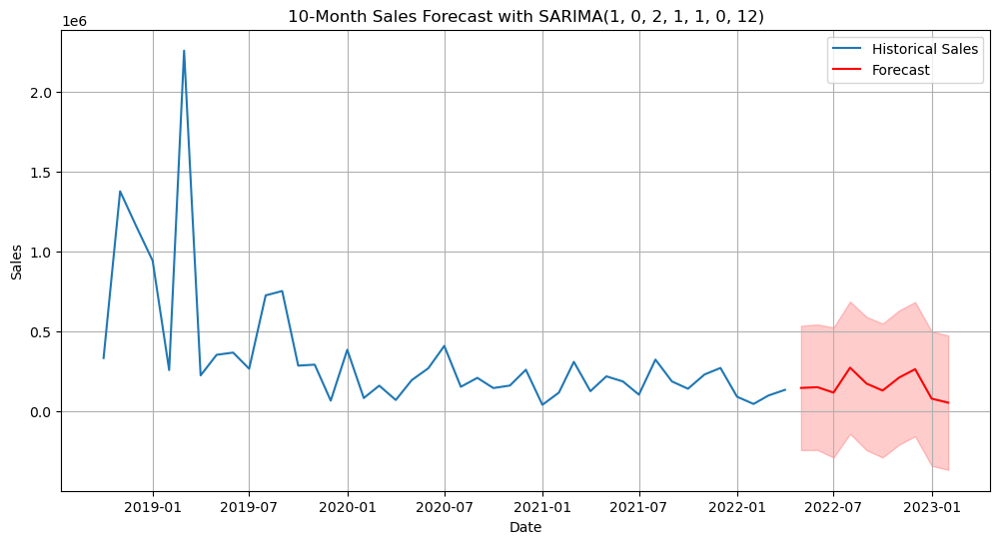

/var/folders/z6/_vn8cndd4x5dmx2cpjfdkjdr0000gn/T/ipykernel_48953/3228905187.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_set_16["Sales_EUR"] = results["yhat"]


,Mapped_GCK,Sales_EUR
Month Year,,
2022-05-01,#16,146127.559743
2022-06-01,#16,150534.925526
2022-07-01,#16,116813.290293
2022-08-01,#16,273012.860915
2022-09-01,#16,173071.074631
2022-10-01,#16,129722.936443
2022-11-01,#16,210997.730979
2022-12-01,#16,263479.749307
2023-01-01,#16,79010.987570


In [87]:
best_model, best_params, best_rmse, best_model_name = select_best_model(
    prophet_best_model_16, prophet_best_params_16, prophet_best_rmse_16, "Prophet",
    xgboost_best_model_16, xgboost_best_params_16, xgboost_best_rmse_16, "XGBoost"
    , sarima_best_model_16, sarima_best_params_16, sarima_best_rmse_16, "SARIMA"
)
print(f"Best Model: {best_model_name}")
print("Best Parameters:", best_params)
print("Best RMSE:", best_rmse)

if best_model_name == "XGBoost":
    results = xgboost_forecast(
        sales_agg16,
        df_market_16,
        period=10,
        params =best_params,
    )
elif best_model_name == "SARIMA":
    results = sarima_forecast(
        sales_agg16,
        period=10,
        params =best_params,
    )
else:
    results = prophet_forecast(
        sales_agg16,
        df_market_16,
        period=10,
        param =best_params,
    )
results.set_index('ds',inplace = True)
test_set_16.set_index('Month Year', inplace = True)
test_set_16["Sales_EUR"] = results["yhat"]
test_set_16

# Product 20

In [88]:
# selecte only the features that are selected in the feature selection step
test_set_20 = test_set[test_set['Mapped_GCK'] == '#20']
df_market_20 = df_market[selected_features_20]
df_market_20.head()

,PRO27826_org_lag_1,MAB_ELE_PRO156_lag_3,PRO27826_org_lag_4,PRO27276_org,PRO271000_org_lag_5,PRO27826_org_lag_5,PRO27826_org_lag_6,WKLWEUR840_org_lag_3
date,,,,,,,,
2004-02-01,NaN,NaN,NaN,85.913200,NaN,NaN,NaN,NaN
2004-03-01,120.706516,NaN,NaN,97.670815,NaN,NaN,NaN,NaN
2004-04-01,138.309550,NaN,NaN,87.253983,NaN,NaN,NaN,NaN
2004-05-01,115.557330,16.940704,NaN,84.675552,NaN,NaN,NaN,1.2646
2004-06-01,119.269534,23.711852,120.706516,95.401802,NaN,NaN,NaN,1.2262


## Xgboost

In [89]:
X_train, X_val, y_train, y_val = train_val_split(sales_agg20, df_market_20, train_size = 0.8)

X_val.info() 

xgboost_best_model_20, xgboost_best_params_20, xgboost_best_rmse_20 = model_evaluation_XGboost(X_train,
                                                                                             y_train, 
                                                                                             X_val, y_val, 
                                                                                             xgboost_param_grid)

print("Best Params:", xgboost_best_params_20)
print("Validation RMSE:", xgboost_best_rmse_20)


<class 'pandas.core.frame.DataFrame'>
Index: 9 entries, 2021-08-01 to 2022-04-01
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   PRO27826_org_lag_1    9 non-null      float64
 1   MAB_ELE_PRO156_lag_3  9 non-null      float64
 2   PRO27826_org_lag_4    9 non-null      float64
 3   PRO27276_org          9 non-null      float64
 4   PRO271000_org_lag_5   9 non-null      float64
 5   PRO27826_org_lag_5    9 non-null      float64
 6   PRO27826_org_lag_6    9 non-null      float64
 7   WKLWEUR840_org_lag_3  9 non-null      float64
dtypes: float64(8)
memory usage: 648.0+ bytes
Params: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.01, 'subsample': 0.5, 'colsample_bytree': 0.5, 'gamma': 0, 'reg_alpha': 0, 'reg_lambda': 0} => RMSE: 1886.2964, Relative RMSE: 1.4933
Params: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.01, 'subsample': 0.5, 'colsample_bytree': 0.5, 'gamma': 0, 'reg_alpha

## Prophet

In [90]:
prophet_best_model_20, prophet_best_params_20, prophet_best_rmse_20 = model_evaluation_prophet(X_train,
                                                                                             y_train, 
                                                                                             X_val, 
                                                                                             y_val, 
                                                                                             prophet_param_grid)

print("Best Params:", prophet_best_params_20)

print("Validation RMSE:", prophet_best_rmse_20)

02:42:08 - cmdstanpy - INFO - Chain [1] start processing
02:42:08 - cmdstanpy - INFO - Chain [1] done processing
02:42:08 - cmdstanpy - INFO - Chain [1] start processing
02:42:09 - cmdstanpy - INFO - Chain [1] done processing
02:42:09 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 2198.8811, Relative RMSE: 1.7407
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 2198.8734, Relative RMSE: 1.7407


02:42:09 - cmdstanpy - INFO - Chain [1] done processing
02:42:09 - cmdstanpy - INFO - Chain [1] start processing
02:42:09 - cmdstanpy - INFO - Chain [1] done processing
02:42:09 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 2198.8633, Relative RMSE: 1.7407
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 2188.6978, Relative RMSE: 1.7327


02:42:09 - cmdstanpy - INFO - Chain [1] done processing
02:42:09 - cmdstanpy - INFO - Chain [1] start processing
02:42:09 - cmdstanpy - INFO - Chain [1] done processing
02:42:09 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 2188.6721, Relative RMSE: 1.7327
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 2188.3820, Relative RMSE: 1.7324


02:42:09 - cmdstanpy - INFO - Chain [1] done processing
02:42:09 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 2195.5812, Relative RMSE: 1.7381


02:42:10 - cmdstanpy - INFO - Chain [1] done processing
02:42:10 - cmdstanpy - INFO - Chain [1] start processing
02:42:10 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 2191.3858, Relative RMSE: 1.7348
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 2193.0017, Relative RMSE: 1.7361


02:42:10 - cmdstanpy - INFO - Chain [1] start processing
02:42:10 - cmdstanpy - INFO - Chain [1] done processing
02:42:10 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 2628.0816, Relative RMSE: 2.0805


02:42:10 - cmdstanpy - INFO - Chain [1] done processing
02:42:10 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 2606.2764, Relative RMSE: 2.0632


02:42:10 - cmdstanpy - INFO - Chain [1] done processing
02:42:11 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 2602.4016, Relative RMSE: 2.0602


02:42:11 - cmdstanpy - INFO - Chain [1] done processing
02:42:11 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 1887.9306, Relative RMSE: 1.4946


02:42:11 - cmdstanpy - INFO - Chain [1] done processing
02:42:11 - cmdstanpy - INFO - Chain [1] start processing
02:42:11 - cmdstanpy - INFO - Chain [1] done processing
02:42:11 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 1888.0038, Relative RMSE: 1.4946
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 1888.0486, Relative RMSE: 1.4947


02:42:11 - cmdstanpy - INFO - Chain [1] done processing
02:42:11 - cmdstanpy - INFO - Chain [1] start processing
02:42:12 - cmdstanpy - INFO - Chain [1] done processing
02:42:12 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 1896.2475, Relative RMSE: 1.5012
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 1877.9028, Relative RMSE: 1.4866


02:42:12 - cmdstanpy - INFO - Chain [1] done processing
02:42:12 - cmdstanpy - INFO - Chain [1] start processing
02:42:12 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 1877.3751, Relative RMSE: 1.4862
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 1878.0700, Relative RMSE: 1.4868


02:42:12 - cmdstanpy - INFO - Chain [1] start processing
02:42:12 - cmdstanpy - INFO - Chain [1] done processing
02:42:12 - cmdstanpy - INFO - Chain [1] start processing
02:42:12 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 1878.7127, Relative RMSE: 1.4873


02:42:12 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 1878.9944, Relative RMSE: 1.4875


02:42:13 - cmdstanpy - INFO - Chain [1] done processing
02:42:13 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 2204.0624, Relative RMSE: 1.7448


02:42:13 - cmdstanpy - INFO - Chain [1] done processing
02:42:13 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 2196.6995, Relative RMSE: 1.7390


02:42:14 - cmdstanpy - INFO - Chain [1] done processing
02:42:14 - cmdstanpy - INFO - Chain [1] start processing
02:42:14 - cmdstanpy - INFO - Chain [1] done processing
02:42:14 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 2199.5940, Relative RMSE: 1.7413
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 1692.0754, Relative RMSE: 1.3395


02:42:14 - cmdstanpy - INFO - Chain [1] done processing
02:42:14 - cmdstanpy - INFO - Chain [1] start processing
02:42:14 - cmdstanpy - INFO - Chain [1] done processing
02:42:14 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 1693.0827, Relative RMSE: 1.3403
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 1693.0939, Relative RMSE: 1.3403


02:42:14 - cmdstanpy - INFO - Chain [1] done processing
02:42:14 - cmdstanpy - INFO - Chain [1] start processing
02:42:14 - cmdstanpy - INFO - Chain [1] done processing
02:42:14 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 1691.5837, Relative RMSE: 1.3391
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 1691.6077, Relative RMSE: 1.3392


02:42:14 - cmdstanpy - INFO - Chain [1] done processing
02:42:14 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 1691.6474, Relative RMSE: 1.3392


02:42:15 - cmdstanpy - INFO - Chain [1] done processing
02:42:15 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 1691.6655, Relative RMSE: 1.3392


02:42:15 - cmdstanpy - INFO - Chain [1] done processing
02:42:15 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 1691.8733, Relative RMSE: 1.3394


02:42:15 - cmdstanpy - INFO - Chain [1] done processing
02:42:15 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 1691.8965, Relative RMSE: 1.3394


02:42:15 - cmdstanpy - INFO - Chain [1] done processing
02:42:16 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 2315.8136, Relative RMSE: 1.8333


02:42:16 - cmdstanpy - INFO - Chain [1] done processing
02:42:16 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 2232.9053, Relative RMSE: 1.7677


02:42:16 - cmdstanpy - INFO - Chain [1] done processing
02:42:16 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 2233.0291, Relative RMSE: 1.7678


02:42:17 - cmdstanpy - INFO - Chain [1] done processing
02:42:17 - cmdstanpy - INFO - Chain [1] start processing
02:42:17 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 1702.8350, Relative RMSE: 1.3480
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 1702.7489, Relative RMSE: 1.3480


02:42:17 - cmdstanpy - INFO - Chain [1] start processing
02:42:17 - cmdstanpy - INFO - Chain [1] done processing
02:42:17 - cmdstanpy - INFO - Chain [1] start processing
02:42:17 - cmdstanpy - INFO - Chain [1] done processing
02:42:17 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 1703.1240, Relative RMSE: 1.3483
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 1687.6350, Relative RMSE: 1.3360


02:42:17 - cmdstanpy - INFO - Chain [1] done processing
02:42:17 - cmdstanpy - INFO - Chain [1] start processing
02:42:17 - cmdstanpy - INFO - Chain [1] done processing
02:42:17 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 1687.4282, Relative RMSE: 1.3358
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 1687.4731, Relative RMSE: 1.3359


02:42:18 - cmdstanpy - INFO - Chain [1] done processing
02:42:18 - cmdstanpy - INFO - Chain [1] start processing
02:42:18 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 1685.3935, Relative RMSE: 1.3342


02:42:18 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 1680.3596, Relative RMSE: 1.3302


02:42:18 - cmdstanpy - INFO - Chain [1] done processing
02:42:18 - cmdstanpy - INFO - Chain [1] start processing
02:42:18 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 1669.4811, Relative RMSE: 1.3216


02:42:18 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 2791.8549, Relative RMSE: 2.2102


02:42:19 - cmdstanpy - INFO - Chain [1] done processing
02:42:19 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 3231.9238, Relative RMSE: 2.5585


02:42:19 - cmdstanpy - INFO - Chain [1] done processing
02:42:19 - cmdstanpy - INFO - Chain [1] start processing
02:42:19 - cmdstanpy - INFO - Chain [1] done processing
02:42:19 - cmdstanpy - INFO - Chain [1] start processing
02:42:19 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 3266.8764, Relative RMSE: 2.5862
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 2216.8204, Relative RMSE: 1.7549


02:42:19 - cmdstanpy - INFO - Chain [1] start processing
02:42:19 - cmdstanpy - INFO - Chain [1] done processing
02:42:19 - cmdstanpy - INFO - Chain [1] start processing
02:42:19 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 2216.8019, Relative RMSE: 1.7549
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 2216.8034, Relative RMSE: 1.7549
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 2207.8767, Relative RMSE: 1.7479


02:42:19 - cmdstanpy - INFO - Chain [1] start processing
02:42:20 - cmdstanpy - INFO - Chain [1] done processing
02:42:20 - cmdstanpy - INFO - Chain [1] start processing
02:42:20 - cmdstanpy - INFO - Chain [1] done processing
02:42:20 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 2207.8735, Relative RMSE: 1.7479
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 2207.5119, Relative RMSE: 1.7476


02:42:20 - cmdstanpy - INFO - Chain [1] done processing
02:42:20 - cmdstanpy - INFO - Chain [1] start processing
02:42:20 - cmdstanpy - INFO - Chain [1] done processing
02:42:20 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 2209.1983, Relative RMSE: 1.7489
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 2208.9680, Relative RMSE: 1.7487


02:42:20 - cmdstanpy - INFO - Chain [1] done processing
02:42:20 - cmdstanpy - INFO - Chain [1] start processing
02:42:20 - cmdstanpy - INFO - Chain [1] done processing
02:42:20 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 2210.7947, Relative RMSE: 1.7502
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 2645.7773, Relative RMSE: 2.0945


02:42:20 - cmdstanpy - INFO - Chain [1] done processing
02:42:20 - cmdstanpy - INFO - Chain [1] start processing
02:42:21 - cmdstanpy - INFO - Chain [1] done processing
02:42:21 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 2640.7428, Relative RMSE: 2.0905
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 2619.6235, Relative RMSE: 2.0738


02:42:21 - cmdstanpy - INFO - Chain [1] done processing
02:42:21 - cmdstanpy - INFO - Chain [1] start processing
02:42:21 - cmdstanpy - INFO - Chain [1] done processing
02:42:21 - cmdstanpy - INFO - Chain [1] start processing
02:42:21 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 2216.8204, Relative RMSE: 1.7549
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 2216.8019, Relative RMSE: 1.7549


02:42:21 - cmdstanpy - INFO - Chain [1] start processing
02:42:21 - cmdstanpy - INFO - Chain [1] done processing
02:42:21 - cmdstanpy - INFO - Chain [1] start processing
02:42:21 - cmdstanpy - INFO - Chain [1] done processing
02:42:21 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 2216.8034, Relative RMSE: 1.7549
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 2207.8767, Relative RMSE: 1.7479
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 2207.8735, Relative RMSE: 1.7479


02:42:21 - cmdstanpy - INFO - Chain [1] done processing
02:42:21 - cmdstanpy - INFO - Chain [1] start processing
02:42:21 - cmdstanpy - INFO - Chain [1] done processing
02:42:21 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 2207.5119, Relative RMSE: 1.7476
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 2209.1983, Relative RMSE: 1.7489


02:42:21 - cmdstanpy - INFO - Chain [1] done processing
02:42:22 - cmdstanpy - INFO - Chain [1] start processing
02:42:22 - cmdstanpy - INFO - Chain [1] done processing
02:42:22 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 2208.9680, Relative RMSE: 1.7487
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 2210.7947, Relative RMSE: 1.7502


02:42:22 - cmdstanpy - INFO - Chain [1] done processing
02:42:22 - cmdstanpy - INFO - Chain [1] start processing
02:42:22 - cmdstanpy - INFO - Chain [1] done processing
02:42:22 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 2645.7773, Relative RMSE: 2.0945
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 2640.7428, Relative RMSE: 2.0905


02:42:22 - cmdstanpy - INFO - Chain [1] done processing
02:42:22 - cmdstanpy - INFO - Chain [1] start processing
02:42:22 - cmdstanpy - INFO - Chain [1] done processing
02:42:22 - cmdstanpy - INFO - Chain [1] start processing
02:42:22 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 2619.6235, Relative RMSE: 2.0738
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 2216.8204, Relative RMSE: 1.7549


02:42:22 - cmdstanpy - INFO - Chain [1] start processing
02:42:23 - cmdstanpy - INFO - Chain [1] done processing
02:42:23 - cmdstanpy - INFO - Chain [1] start processing
02:42:23 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 2216.8019, Relative RMSE: 1.7549
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 2216.8034, Relative RMSE: 1.7549
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 2207.8767, Relative RMSE: 1.7479


02:42:23 - cmdstanpy - INFO - Chain [1] start processing
02:42:23 - cmdstanpy - INFO - Chain [1] done processing
02:42:23 - cmdstanpy - INFO - Chain [1] start processing
02:42:23 - cmdstanpy - INFO - Chain [1] done processing
02:42:23 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 2207.8735, Relative RMSE: 1.7479
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 2207.5119, Relative RMSE: 1.7476


02:42:23 - cmdstanpy - INFO - Chain [1] done processing
02:42:23 - cmdstanpy - INFO - Chain [1] start processing
02:42:23 - cmdstanpy - INFO - Chain [1] done processing
02:42:23 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 2209.1983, Relative RMSE: 1.7489
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 2208.9680, Relative RMSE: 1.7487


02:42:23 - cmdstanpy - INFO - Chain [1] done processing
02:42:23 - cmdstanpy - INFO - Chain [1] start processing
02:42:23 - cmdstanpy - INFO - Chain [1] done processing
02:42:23 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 2210.7947, Relative RMSE: 1.7502
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 2645.7773, Relative RMSE: 2.0945


02:42:24 - cmdstanpy - INFO - Chain [1] done processing
02:42:24 - cmdstanpy - INFO - Chain [1] start processing
02:42:24 - cmdstanpy - INFO - Chain [1] done processing
02:42:24 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 2640.7428, Relative RMSE: 2.0905
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 2619.6235, Relative RMSE: 2.0738


02:42:24 - cmdstanpy - INFO - Chain [1] done processing
02:42:24 - cmdstanpy - INFO - Chain [1] start processing
02:42:24 - cmdstanpy - INFO - Chain [1] done processing
02:42:24 - cmdstanpy - INFO - Chain [1] start processing
02:42:24 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 2216.8204, Relative RMSE: 1.7549
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 2216.8019, Relative RMSE: 1.7549


02:42:24 - cmdstanpy - INFO - Chain [1] start processing
02:42:24 - cmdstanpy - INFO - Chain [1] done processing
02:42:24 - cmdstanpy - INFO - Chain [1] start processing
02:42:24 - cmdstanpy - INFO - Chain [1] done processing
02:42:24 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 2216.8034, Relative RMSE: 1.7549
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 2207.8767, Relative RMSE: 1.7479
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 2207.8735, Relative RMSE: 1.7479


02:42:24 - cmdstanpy - INFO - Chain [1] done processing
02:42:24 - cmdstanpy - INFO - Chain [1] start processing
02:42:25 - cmdstanpy - INFO - Chain [1] done processing
02:42:25 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 2207.5119, Relative RMSE: 1.7476
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 2209.1983, Relative RMSE: 1.7489


02:42:25 - cmdstanpy - INFO - Chain [1] done processing
02:42:25 - cmdstanpy - INFO - Chain [1] start processing
02:42:25 - cmdstanpy - INFO - Chain [1] done processing
02:42:25 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 2208.9680, Relative RMSE: 1.7487
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 2210.7947, Relative RMSE: 1.7502


02:42:25 - cmdstanpy - INFO - Chain [1] done processing
02:42:25 - cmdstanpy - INFO - Chain [1] start processing
02:42:25 - cmdstanpy - INFO - Chain [1] done processing
02:42:25 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 2645.7773, Relative RMSE: 2.0945
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 2640.7428, Relative RMSE: 2.0905


02:42:25 - cmdstanpy - INFO - Chain [1] done processing
02:42:25 - cmdstanpy - INFO - Chain [1] start processing
02:42:25 - cmdstanpy - INFO - Chain [1] done processing
02:42:26 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 2619.6235, Relative RMSE: 2.0738
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 2217.2902, Relative RMSE: 1.7553


02:42:26 - cmdstanpy - INFO - Chain [1] done processing
02:42:26 - cmdstanpy - INFO - Chain [1] start processing
02:42:26 - cmdstanpy - INFO - Chain [1] done processing
02:42:26 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 2217.2780, Relative RMSE: 1.7553
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 2217.2728, Relative RMSE: 1.7553


02:42:26 - cmdstanpy - INFO - Chain [1] done processing
02:42:26 - cmdstanpy - INFO - Chain [1] start processing
02:42:26 - cmdstanpy - INFO - Chain [1] done processing
02:42:26 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 2208.4643, Relative RMSE: 1.7483
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 2208.4646, Relative RMSE: 1.7483


02:42:26 - cmdstanpy - INFO - Chain [1] done processing
02:42:26 - cmdstanpy - INFO - Chain [1] start processing
02:42:26 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 2208.1061, Relative RMSE: 1.7480
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 2216.7348, Relative RMSE: 1.7549


02:42:26 - cmdstanpy - INFO - Chain [1] start processing
02:42:27 - cmdstanpy - INFO - Chain [1] done processing
02:42:27 - cmdstanpy - INFO - Chain [1] start processing
02:42:27 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 2216.9480, Relative RMSE: 1.7550


02:42:27 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 2213.8938, Relative RMSE: 1.7526


02:42:27 - cmdstanpy - INFO - Chain [1] done processing
02:42:27 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 2650.2642, Relative RMSE: 2.0981


02:42:27 - cmdstanpy - INFO - Chain [1] done processing
02:42:27 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 2575.7459, Relative RMSE: 2.0391


02:42:28 - cmdstanpy - INFO - Chain [1] done processing
02:42:28 - cmdstanpy - INFO - Chain [1] start processing
02:42:28 - cmdstanpy - INFO - Chain [1] done processing
02:42:28 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 2622.2123, Relative RMSE: 2.0759
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 2218.2700, Relative RMSE: 1.7561


02:42:28 - cmdstanpy - INFO - Chain [1] done processing
02:42:28 - cmdstanpy - INFO - Chain [1] start processing
02:42:28 - cmdstanpy - INFO - Chain [1] done processing
02:42:28 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 2218.2574, Relative RMSE: 1.7561
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 2218.3410, Relative RMSE: 1.7561


02:42:28 - cmdstanpy - INFO - Chain [1] done processing
02:42:28 - cmdstanpy - INFO - Chain [1] start processing
02:42:28 - cmdstanpy - INFO - Chain [1] done processing
02:42:28 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 2203.6211, Relative RMSE: 1.7445
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 2204.4322, Relative RMSE: 1.7451


02:42:28 - cmdstanpy - INFO - Chain [1] done processing
02:42:28 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 2209.4487, Relative RMSE: 1.7491


02:42:29 - cmdstanpy - INFO - Chain [1] done processing
02:42:29 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 2215.7259, Relative RMSE: 1.7541


02:42:29 - cmdstanpy - INFO - Chain [1] done processing
02:42:29 - cmdstanpy - INFO - Chain [1] start processing
02:42:29 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 2213.8913, Relative RMSE: 1.7526
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 2207.2526, Relative RMSE: 1.7474


02:42:29 - cmdstanpy - INFO - Chain [1] start processing
02:42:30 - cmdstanpy - INFO - Chain [1] done processing
02:42:30 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 2601.0337, Relative RMSE: 2.0591


02:42:30 - cmdstanpy - INFO - Chain [1] done processing
02:42:30 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 2601.8515, Relative RMSE: 2.0597


02:42:30 - cmdstanpy - INFO - Chain [1] done processing
02:42:30 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 2596.1572, Relative RMSE: 2.0552


02:42:31 - cmdstanpy - INFO - Chain [1] done processing
02:42:31 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 1721.6225, Relative RMSE: 1.3629


02:42:32 - cmdstanpy - INFO - Chain [1] done processing
02:42:32 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 1722.3321, Relative RMSE: 1.3635


02:42:33 - cmdstanpy - INFO - Chain [1] done processing
02:42:33 - cmdstanpy - INFO - Chain [1] start processing
02:42:33 - cmdstanpy - INFO - Chain [1] done processing
02:42:33 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 1726.6640, Relative RMSE: 1.3669
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 1729.0289, Relative RMSE: 1.3688


02:42:33 - cmdstanpy - INFO - Chain [1] done processing
02:42:33 - cmdstanpy - INFO - Chain [1] start processing
02:42:33 - cmdstanpy - INFO - Chain [1] done processing
02:42:33 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 1728.6230, Relative RMSE: 1.3685
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 1727.6108, Relative RMSE: 1.3677


02:42:34 - cmdstanpy - INFO - Chain [1] done processing
02:42:34 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 1686.6918, Relative RMSE: 1.3353


02:42:34 - cmdstanpy - INFO - Chain [1] done processing
02:42:34 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 1691.4188, Relative RMSE: 1.3390


02:42:34 - cmdstanpy - INFO - Chain [1] done processing
02:42:35 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 1686.5953, Relative RMSE: 1.3352


02:42:35 - cmdstanpy - INFO - Chain [1] done processing
02:42:35 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 1741.1003, Relative RMSE: 1.3783


02:42:36 - cmdstanpy - INFO - Chain [1] done processing
02:42:36 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 1742.8656, Relative RMSE: 1.3797


02:42:36 - cmdstanpy - INFO - Chain [1] done processing
02:42:36 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 1734.7318, Relative RMSE: 1.3733


02:42:36 - cmdstanpy - INFO - Chain [1] done processing
02:42:36 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 4107.9783, Relative RMSE: 3.2521


02:42:37 - cmdstanpy - INFO - Chain [1] done processing
02:42:37 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 4285.7754, Relative RMSE: 3.3928


02:42:38 - cmdstanpy - INFO - Chain [1] done processing
02:42:38 - cmdstanpy - INFO - Chain [1] start processing
02:42:38 - cmdstanpy - INFO - Chain [1] done processing
02:42:38 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 3384.6326, Relative RMSE: 2.6794
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 2477.9731, Relative RMSE: 1.9617


02:42:38 - cmdstanpy - INFO - Chain [1] done processing
02:42:38 - cmdstanpy - INFO - Chain [1] start processing
02:42:38 - cmdstanpy - INFO - Chain [1] done processing
02:42:38 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 2475.8019, Relative RMSE: 1.9600
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 2459.7305, Relative RMSE: 1.9472


02:42:38 - cmdstanpy - INFO - Chain [1] done processing
02:42:38 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 1790.2780, Relative RMSE: 1.4173


02:42:39 - cmdstanpy - INFO - Chain [1] done processing
02:42:39 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 2574.8472, Relative RMSE: 2.0384


02:42:39 - cmdstanpy - INFO - Chain [1] done processing
02:42:39 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 2486.3697, Relative RMSE: 1.9683


02:42:39 - cmdstanpy - INFO - Chain [1] done processing
02:42:39 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 5099.8866, Relative RMSE: 4.0373


02:42:40 - cmdstanpy - INFO - Chain [1] done processing
02:42:40 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 4628.8462, Relative RMSE: 3.6644


02:42:41 - cmdstanpy - INFO - Chain [1] done processing
02:42:41 - cmdstanpy - INFO - Chain [1] start processing
02:42:41 - cmdstanpy - INFO - Chain [1] done processing
02:42:41 - cmdstanpy - INFO - Chain [1] start processing
02:42:41 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 5232.7372, Relative RMSE: 4.1425
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 2216.8204, Relative RMSE: 1.7549


02:42:41 - cmdstanpy - INFO - Chain [1] start processing
02:42:41 - cmdstanpy - INFO - Chain [1] done processing
02:42:41 - cmdstanpy - INFO - Chain [1] start processing
02:42:41 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 2216.8019, Relative RMSE: 1.7549
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 2216.8034, Relative RMSE: 1.7549
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 2207.8767, Relative RMSE: 1.7479


02:42:41 - cmdstanpy - INFO - Chain [1] start processing
02:42:41 - cmdstanpy - INFO - Chain [1] done processing
02:42:41 - cmdstanpy - INFO - Chain [1] start processing
02:42:41 - cmdstanpy - INFO - Chain [1] done processing
02:42:41 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 2207.8735, Relative RMSE: 1.7479
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 2207.5119, Relative RMSE: 1.7476


02:42:41 - cmdstanpy - INFO - Chain [1] done processing
02:42:41 - cmdstanpy - INFO - Chain [1] start processing
02:42:41 - cmdstanpy - INFO - Chain [1] done processing
02:42:41 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 2209.1983, Relative RMSE: 1.7489
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 2208.9680, Relative RMSE: 1.7487


02:42:42 - cmdstanpy - INFO - Chain [1] done processing
02:42:42 - cmdstanpy - INFO - Chain [1] start processing
02:42:42 - cmdstanpy - INFO - Chain [1] done processing
02:42:42 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 2210.7947, Relative RMSE: 1.7502
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 2645.7773, Relative RMSE: 2.0945


02:42:42 - cmdstanpy - INFO - Chain [1] done processing
02:42:42 - cmdstanpy - INFO - Chain [1] start processing
02:42:42 - cmdstanpy - INFO - Chain [1] done processing
02:42:42 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 2640.7428, Relative RMSE: 2.0905
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 2619.6235, Relative RMSE: 2.0738


02:42:42 - cmdstanpy - INFO - Chain [1] done processing
02:42:42 - cmdstanpy - INFO - Chain [1] start processing
02:42:42 - cmdstanpy - INFO - Chain [1] done processing
02:42:42 - cmdstanpy - INFO - Chain [1] start processing
02:42:42 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 2216.8204, Relative RMSE: 1.7549
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 2216.8019, Relative RMSE: 1.7549


02:42:43 - cmdstanpy - INFO - Chain [1] start processing
02:42:43 - cmdstanpy - INFO - Chain [1] done processing
02:42:43 - cmdstanpy - INFO - Chain [1] start processing
02:42:43 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 2216.8034, Relative RMSE: 1.7549
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 2207.8767, Relative RMSE: 1.7479
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 2207.8735, Relative RMSE: 1.7479


02:42:43 - cmdstanpy - INFO - Chain [1] start processing
02:42:43 - cmdstanpy - INFO - Chain [1] done processing
02:42:43 - cmdstanpy - INFO - Chain [1] start processing
02:42:43 - cmdstanpy - INFO - Chain [1] done processing
02:42:43 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 2207.5119, Relative RMSE: 1.7476
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 2209.1983, Relative RMSE: 1.7489


02:42:43 - cmdstanpy - INFO - Chain [1] done processing
02:42:43 - cmdstanpy - INFO - Chain [1] start processing
02:42:43 - cmdstanpy - INFO - Chain [1] done processing
02:42:43 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 2208.9680, Relative RMSE: 1.7487
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 2210.7947, Relative RMSE: 1.7502


02:42:43 - cmdstanpy - INFO - Chain [1] done processing
02:42:43 - cmdstanpy - INFO - Chain [1] start processing
02:42:44 - cmdstanpy - INFO - Chain [1] done processing
02:42:44 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 2645.7773, Relative RMSE: 2.0945
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 2640.7428, Relative RMSE: 2.0905


02:42:44 - cmdstanpy - INFO - Chain [1] done processing
02:42:44 - cmdstanpy - INFO - Chain [1] start processing
02:42:44 - cmdstanpy - INFO - Chain [1] done processing
02:42:44 - cmdstanpy - INFO - Chain [1] start processing
02:42:44 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 2619.6235, Relative RMSE: 2.0738
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 2216.8204, Relative RMSE: 1.7549


02:42:44 - cmdstanpy - INFO - Chain [1] start processing
02:42:44 - cmdstanpy - INFO - Chain [1] done processing
02:42:44 - cmdstanpy - INFO - Chain [1] start processing
02:42:44 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 2216.8019, Relative RMSE: 1.7549
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 2216.8034, Relative RMSE: 1.7549
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 2207.8767, Relative RMSE: 1.7479


02:42:44 - cmdstanpy - INFO - Chain [1] start processing
02:42:44 - cmdstanpy - INFO - Chain [1] done processing
02:42:44 - cmdstanpy - INFO - Chain [1] start processing
02:42:44 - cmdstanpy - INFO - Chain [1] done processing
02:42:44 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 2207.8735, Relative RMSE: 1.7479
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 2207.5119, Relative RMSE: 1.7476


02:42:44 - cmdstanpy - INFO - Chain [1] done processing
02:42:45 - cmdstanpy - INFO - Chain [1] start processing
02:42:45 - cmdstanpy - INFO - Chain [1] done processing
02:42:45 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 2209.1983, Relative RMSE: 1.7489
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 2208.9680, Relative RMSE: 1.7487


02:42:45 - cmdstanpy - INFO - Chain [1] done processing
02:42:45 - cmdstanpy - INFO - Chain [1] start processing
02:42:45 - cmdstanpy - INFO - Chain [1] done processing
02:42:45 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 2210.7947, Relative RMSE: 1.7502
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 2645.7773, Relative RMSE: 2.0945


02:42:45 - cmdstanpy - INFO - Chain [1] done processing
02:42:45 - cmdstanpy - INFO - Chain [1] start processing
02:42:45 - cmdstanpy - INFO - Chain [1] done processing
02:42:45 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 2640.7428, Relative RMSE: 2.0905
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 2619.6235, Relative RMSE: 2.0738


02:42:45 - cmdstanpy - INFO - Chain [1] done processing
02:42:46 - cmdstanpy - INFO - Chain [1] start processing
02:42:46 - cmdstanpy - INFO - Chain [1] done processing
02:42:46 - cmdstanpy - INFO - Chain [1] start processing
02:42:46 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 2216.8204, Relative RMSE: 1.7549
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 2216.8019, Relative RMSE: 1.7549


02:42:46 - cmdstanpy - INFO - Chain [1] start processing
02:42:46 - cmdstanpy - INFO - Chain [1] done processing
02:42:46 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 2216.8034, Relative RMSE: 1.7549
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 2207.8767, Relative RMSE: 1.7479


02:42:46 - cmdstanpy - INFO - Chain [1] done processing
02:42:46 - cmdstanpy - INFO - Chain [1] start processing
02:42:46 - cmdstanpy - INFO - Chain [1] done processing
02:42:46 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 2207.8735, Relative RMSE: 1.7479
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 2207.5119, Relative RMSE: 1.7476


02:42:46 - cmdstanpy - INFO - Chain [1] done processing
02:42:46 - cmdstanpy - INFO - Chain [1] start processing
02:42:46 - cmdstanpy - INFO - Chain [1] done processing
02:42:46 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 2209.1983, Relative RMSE: 1.7489
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 2208.9680, Relative RMSE: 1.7487


02:42:46 - cmdstanpy - INFO - Chain [1] done processing
02:42:47 - cmdstanpy - INFO - Chain [1] start processing
02:42:47 - cmdstanpy - INFO - Chain [1] done processing
02:42:47 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 2210.7947, Relative RMSE: 1.7502
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 2645.7773, Relative RMSE: 2.0945


02:42:47 - cmdstanpy - INFO - Chain [1] done processing
02:42:47 - cmdstanpy - INFO - Chain [1] start processing
02:42:47 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 2640.7428, Relative RMSE: 2.0905
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 2619.6235, Relative RMSE: 2.0738
Best Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0}
Validation RMSE: 1669.4810503494255


## Sarima

In [91]:
sarima_best_model_20, sarima_best_params_20, sarima_best_rmse_20 = model_evaluation_SARIMA(y_train, 
                                                             y_val, 
                                                             sarima_param_grid)

print("Best Params:", sarima_best_params_20)
print("Validation RMSE:", sarima_best_rmse_20)

SARIMA(0,0,0) x (0,0,0,6) => RMSE: 2337.3717, Relative RMSE: 1.8504
SARIMA(0,0,0) x (0,0,0,12) => RMSE: 2337.3717, Relative RMSE: 1.8504


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,0) x (0,0,1,6) => RMSE: 2546.1230, Relative RMSE: 2.0156
SARIMA(0,0,0) x (0,0,1,12) => RMSE: 2012.5298, Relative RMSE: 1.5932
SARIMA(0,0,0) x (0,1,0,6) => RMSE: 3027.0982, Relative RMSE: 2.3964
SARIMA(0,0,0) x (0,1,0,12) => RMSE: 3992.7683, Relative RMSE: 3.1609
SARIMA(0,0,0) x (0,1,1,6) => RMSE: 1979.2880, Relative RMSE: 1.5669
SARIMA(0,0,0) x (0,1,1,12) => RMSE: 2408.1908, Relative RMSE: 1.9064
SARIMA(0,0,0) x (1,0,0,6) => RMSE: 2170.5944, Relative RMSE: 1.7183
SARIMA(0,0,0) x (1,0,0,12) => RMSE: 1884.0059, Relative RMSE: 1.4915
SARIMA(0,0,0) x (1,0,1,6) => RMSE: 2390.8491, Relative RMSE: 1.8927
SARIMA(0,0,0) x (1,0,1,12) => RMSE: 4725.3025, Relative RMSE: 3.7408
SARIMA(0,0,0) x (1,1,0,6) => RMSE: 3122.0261, Relative RMSE: 2.4715


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,0) x (1,1,0,12) => RMSE: 2403.0297, Relative RMSE: 1.9023
SARIMA(0,0,0) x (1,1,1,6) => RMSE: 2206.3052, Relative RMSE: 1.7466
SARIMA(0,0,0) x (1,1,1,12) => RMSE: 2107.4593, Relative RMSE: 1.6684
SARIMA(0,0,1) x (0,0,0,6) => RMSE: 2335.9844, Relative RMSE: 1.8493
SARIMA(0,0,1) x (0,0,0,12) => RMSE: 2335.9844, Relative RMSE: 1.8493
SARIMA(0,0,1) x (0,0,1,6) => RMSE: 2574.7815, Relative RMSE: 2.0383
SARIMA(0,0,1) x (0,0,1,12) => RMSE: 1936.8454, Relative RMSE: 1.5333
SARIMA(0,0,1) x (0,1,0,6) => RMSE: 3060.7905, Relative RMSE: 2.4231
SARIMA(0,0,1) x (0,1,0,12) => RMSE: 3991.1607, Relative RMSE: 3.1596
SARIMA(0,0,1) x (0,1,1,6) => RMSE: 1824.9584, Relative RMSE: 1.4447


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,0,1) x (0,1,1,12) => RMSE: 2350.8961, Relative RMSE: 1.8611
SARIMA(0,0,1) x (1,0,0,6) => RMSE: 2174.8074, Relative RMSE: 1.7217
SARIMA(0,0,1) x (1,0,0,12) => RMSE: 1869.7207, Relative RMSE: 1.4802
SARIMA(0,0,1) x (1,0,1,6) => RMSE: 2540.5143, Relative RMSE: 2.0112
SARIMA(0,0,1) x (1,0,1,12) => RMSE: 5055.4701, Relative RMSE: 4.0021
SARIMA(0,0,1) x (1,1,0,6) => RMSE: 3145.8729, Relative RMSE: 2.4904
SARIMA(0,0,1) x (1,1,0,12) => RMSE: 4122.3434, Relative RMSE: 3.2634
SARIMA(0,0,1) x (1,1,1,6) => RMSE: 2203.1543, Relative RMSE: 1.7441


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,0,1) x (1,1,1,12) => RMSE: 4939.1816, Relative RMSE: 3.9101
SARIMA(0,0,2) x (0,0,0,6) => RMSE: 2357.2897, Relative RMSE: 1.8661
SARIMA(0,0,2) x (0,0,0,12) => RMSE: 2357.2897, Relative RMSE: 1.8661
SARIMA(0,0,2) x (0,0,1,6) => RMSE: 2509.1543, Relative RMSE: 1.9864
SARIMA(0,0,2) x (0,0,1,12) => RMSE: 2070.8045, Relative RMSE: 1.6393
SARIMA(0,0,2) x (0,1,0,6) => RMSE: 3024.2493, Relative RMSE: 2.3941
SARIMA(0,0,2) x (0,1,0,12) => RMSE: 4043.5052, Relative RMSE: 3.2010
SARIMA(0,0,2) x (0,1,1,6) => RMSE: 1834.6298, Relative RMSE: 1.4524
SARIMA(0,0,2) x (0,1,1,12) => RMSE: 2451.0503, Relative RMSE: 1.9404


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,2) x (1,0,0,6) => RMSE: 2168.9713, Relative RMSE: 1.7171
SARIMA(0,0,2) x (1,0,0,12) => RMSE: 1930.0312, Relative RMSE: 1.5279
SARIMA(0,0,2) x (1,0,1,6) => RMSE: 2262.1498, Relative RMSE: 1.7908
SARIMA(0,0,2) x (1,0,1,12) => RMSE: 5243.1850, Relative RMSE: 4.1507
SARIMA(0,0,2) x (1,1,0,6) => RMSE: 3151.5800, Relative RMSE: 2.4949


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,2) x (1,1,0,12) => RMSE: 3841.0995, Relative RMSE: 3.0408
SARIMA(0,0,2) x (1,1,1,6) => RMSE: 2111.9688, Relative RMSE: 1.6719


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,2) x (1,1,1,12) => RMSE: 4832.7687, Relative RMSE: 3.8258
SARIMA(0,1,0) x (0,0,0,6) => RMSE: 2011.0381, Relative RMSE: 1.5920
SARIMA(0,1,0) x (0,0,0,12) => RMSE: 2011.0381, Relative RMSE: 1.5920
SARIMA(0,1,0) x (0,0,1,6) => RMSE: 2108.0548, Relative RMSE: 1.6688
SARIMA(0,1,0) x (0,0,1,12) => RMSE: 2057.9247, Relative RMSE: 1.6291
SARIMA(0,1,0) x (0,1,0,6) => RMSE: 3647.9499, Relative RMSE: 2.8879
SARIMA(0,1,0) x (0,1,0,12) => RMSE: 4003.0247, Relative RMSE: 3.1690
SARIMA(0,1,0) x (0,1,1,6) => RMSE: 2948.0403, Relative RMSE: 2.3338
SARIMA(0,1,0) x (0,1,1,12) => RMSE: 5365.4271, Relative RMSE: 4.2475
SARIMA(0,1,0) x (1,0,0,6) => RMSE: 2148.7937, Relative RMSE: 1.7011
SARIMA(0,1,0) x (1,0,0,12) => RMSE: 1891.8249, Relative RMSE: 1.4977
SARIMA(0,1,0) x (1,0,1,6) => RMSE: 2243.0504, Relative RMSE: 1.7757


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,1,0) x (1,0,1,12) => RMSE: 7959.6130, Relative RMSE: 6.3012
SARIMA(0,1,0) x (1,1,0,6) => RMSE: 3559.4784, Relative RMSE: 2.8178
SARIMA(0,1,0) x (1,1,0,12) => RMSE: 5933.0076, Relative RMSE: 4.6968
SARIMA(0,1,0) x (1,1,1,6) => RMSE: 3106.4897, Relative RMSE: 2.4592
SARIMA(0,1,0) x (1,1,1,12) => RMSE: 4285.4887, Relative RMSE: 3.3926
SARIMA(0,1,1) x (0,0,0,6) => RMSE: 2148.8704, Relative RMSE: 1.7011
SARIMA(0,1,1) x (0,0,0,12) => RMSE: 2148.8704, Relative RMSE: 1.7011
SARIMA(0,1,1) x (0,0,1,6) => RMSE: 2102.1634, Relative RMSE: 1.6642
SARIMA(0,1,1) x (0,0,1,12) => RMSE: 2241.8996, Relative RMSE: 1.7748
SARIMA(0,1,1) x (0,1,0,6) => RMSE: 2984.7941, Relative RMSE: 2.3629
SARIMA(0,1,1) x (0,1,0,12) => RMSE: 4948.0612, Relative RMSE: 3.9171


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,1) x (0,1,1,6) => RMSE: 1987.6409, Relative RMSE: 1.5735
SARIMA(0,1,1) x (0,1,1,12) => RMSE: 3222.4338, Relative RMSE: 2.5510
SARIMA(0,1,1) x (1,0,0,6) => RMSE: 2095.6890, Relative RMSE: 1.6590
SARIMA(0,1,1) x (1,0,0,12) => RMSE: 3018.7281, Relative RMSE: 2.3898
SARIMA(0,1,1) x (1,0,1,6) => RMSE: 2322.5569, Relative RMSE: 1.8386
SARIMA(0,1,1) x (1,0,1,12) => RMSE: 2544.8801, Relative RMSE: 2.0146
SARIMA(0,1,1) x (1,1,0,6) => RMSE: 2991.7045, Relative RMSE: 2.3684


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,1,1) x (1,1,0,12) => RMSE: 2113.8034, Relative RMSE: 1.6734
SARIMA(0,1,1) x (1,1,1,6) => RMSE: 2006.4863, Relative RMSE: 1.5884
SARIMA(0,1,1) x (1,1,1,12) => RMSE: 2377.2299, Relative RMSE: 1.8819
SARIMA(0,1,2) x (0,0,0,6) => RMSE: 2126.2244, Relative RMSE: 1.6832
SARIMA(0,1,2) x (0,0,0,12) => RMSE: 2126.2244, Relative RMSE: 1.6832
SARIMA(0,1,2) x (0,0,1,6) => RMSE: 2158.5835, Relative RMSE: 1.7088


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(0,1,2) x (0,0,1,12) => RMSE: 2180.2610, Relative RMSE: 1.7260
SARIMA(0,1,2) x (0,1,0,6) => RMSE: 3667.1194, Relative RMSE: 2.9031
SARIMA(0,1,2) x (0,1,0,12) => RMSE: 4649.4713, Relative RMSE: 3.6807
SARIMA(0,1,2) x (0,1,1,6) => RMSE: 1769.5372, Relative RMSE: 1.4008
SARIMA(0,1,2) x (0,1,1,12) => RMSE: 3415.8328, Relative RMSE: 2.7041
SARIMA(0,1,2) x (1,0,0,6) => RMSE: 2063.2856, Relative RMSE: 1.6334
SARIMA(0,1,2) x (1,0,0,12) => RMSE: 2960.5996, Relative RMSE: 2.3437
SARIMA(0,1,2) x (1,0,1,6) => RMSE: 2287.9004, Relative RMSE: 1.8112
SARIMA(0,1,2) x (1,0,1,12) => RMSE: 5136.8623, Relative RMSE: 4.0666
SARIMA(0,1,2) x (1,1,0,6) => RMSE: 2800.7662, Relative RMSE: 2.2172


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(0,1,2) x (1,1,0,12) => RMSE: 2429.6697, Relative RMSE: 1.9234
SARIMA(0,1,2) x (1,1,1,6) => RMSE: 1974.9346, Relative RMSE: 1.5634
SARIMA(0,1,2) x (1,1,1,12) => RMSE: 2616.6329, Relative RMSE: 2.0714
SARIMA(1,0,0) x (0,0,0,6) => RMSE: 2332.1112, Relative RMSE: 1.8462
SARIMA(1,0,0) x (0,0,0,12) => RMSE: 2332.1112, Relative RMSE: 1.8462
SARIMA(1,0,0) x (0,0,1,6) => RMSE: 2531.5179, Relative RMSE: 2.0041
SARIMA(1,0,0) x (0,0,1,12) => RMSE: 1956.7956, Relative RMSE: 1.5491
SARIMA(1,0,0) x (0,1,0,6) => RMSE: 3057.7649, Relative RMSE: 2.4207


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,0) x (0,1,0,12) => RMSE: 3993.4510, Relative RMSE: 3.1614
SARIMA(1,0,0) x (0,1,1,6) => RMSE: 1773.4332, Relative RMSE: 1.4039
SARIMA(1,0,0) x (0,1,1,12) => RMSE: 2340.1998, Relative RMSE: 1.8526
SARIMA(1,0,0) x (1,0,0,6) => RMSE: 2175.1847, Relative RMSE: 1.7220
SARIMA(1,0,0) x (1,0,0,12) => RMSE: 1884.4588, Relative RMSE: 1.4918
SARIMA(1,0,0) x (1,0,1,6) => RMSE: 2164.1353, Relative RMSE: 1.7132
SARIMA(1,0,0) x (1,0,1,12) => RMSE: 4732.7946, Relative RMSE: 3.7467
SARIMA(1,0,0) x (1,1,0,6) => RMSE: 3165.1750, Relative RMSE: 2.5057


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,0) x (1,1,0,12) => RMSE: 3284.0523, Relative RMSE: 2.5998
SARIMA(1,0,0) x (1,1,1,6) => RMSE: 2330.3294, Relative RMSE: 1.8448
SARIMA(1,0,0) x (1,1,1,12) => RMSE: 3488.6819, Relative RMSE: 2.7618
SARIMA(1,0,1) x (0,0,0,6) => RMSE: 2178.5269, Relative RMSE: 1.7246
SARIMA(1,0,1) x (0,0,0,12) => RMSE: 2178.5269, Relative RMSE: 1.7246


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,1) x (0,0,1,6) => RMSE: 2457.6591, Relative RMSE: 1.9456
SARIMA(1,0,1) x (0,0,1,12) => RMSE: 2119.0450, Relative RMSE: 1.6775
SARIMA(1,0,1) x (0,1,0,6) => RMSE: 2868.6549, Relative RMSE: 2.2710
SARIMA(1,0,1) x (0,1,0,12) => RMSE: 4277.3499, Relative RMSE: 3.3861
SARIMA(1,0,1) x (0,1,1,6) => RMSE: 1907.5550, Relative RMSE: 1.5101
SARIMA(1,0,1) x (0,1,1,12) => RMSE: 2663.0008, Relative RMSE: 2.1082
SARIMA(1,0,1) x (1,0,0,6) => RMSE: 2189.4772, Relative RMSE: 1.7333
SARIMA(1,0,1) x (1,0,0,12) => RMSE: 2738.8819, Relative RMSE: 2.1682


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,1) x (1,0,1,6) => RMSE: 2683.4648, Relative RMSE: 2.1244
SARIMA(1,0,1) x (1,0,1,12) => RMSE: 3313.2438, Relative RMSE: 2.6229
SARIMA(1,0,1) x (1,1,0,6) => RMSE: 3060.3095, Relative RMSE: 2.4227
SARIMA(1,0,1) x (1,1,0,12) => RMSE: 4010.4825, Relative RMSE: 3.1749
SARIMA(1,0,1) x (1,1,1,6) => RMSE: 2145.7913, Relative RMSE: 1.6987


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,0,1) x (1,1,1,12) => RMSE: 4088.9872, Relative RMSE: 3.2370
SARIMA(1,0,2) x (0,0,0,6) => RMSE: 2160.3592, Relative RMSE: 1.7102
SARIMA(1,0,2) x (0,0,0,12) => RMSE: 2160.3592, Relative RMSE: 1.7102
SARIMA(1,0,2) x (0,0,1,6) => RMSE: 2590.9317, Relative RMSE: 2.0511
SARIMA(1,0,2) x (0,0,1,12) => RMSE: 2120.1018, Relative RMSE: 1.6784
SARIMA(1,0,2) x (0,1,0,6) => RMSE: 2953.7685, Relative RMSE: 2.3383
SARIMA(1,0,2) x (0,1,0,12) => RMSE: 4252.3568, Relative RMSE: 3.3664


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,2) x (0,1,1,6) => RMSE: 1964.8371, Relative RMSE: 1.5555
SARIMA(1,0,2) x (0,1,1,12) => RMSE: 2797.7019, Relative RMSE: 2.2148
SARIMA(1,0,2) x (1,0,0,6) => RMSE: 2211.5680, Relative RMSE: 1.7508
SARIMA(1,0,2) x (1,0,0,12) => RMSE: 2241.3561, Relative RMSE: 1.7744


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,0,2) x (1,0,1,6) => RMSE: 1902.4576, Relative RMSE: 1.5061
SARIMA(1,0,2) x (1,0,1,12) => RMSE: 3732.8358, Relative RMSE: 2.9551
SARIMA(1,0,2) x (1,1,0,6) => RMSE: 3040.4638, Relative RMSE: 2.4070


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,0,2) x (1,1,0,12) => RMSE: 3995.2980, Relative RMSE: 3.1629
SARIMA(1,0,2) x (1,1,1,6) => RMSE: 2013.2157, Relative RMSE: 1.5938


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,0,2) x (1,1,1,12) => RMSE: 4102.7555, Relative RMSE: 3.2479
SARIMA(1,1,0) x (0,0,0,6) => RMSE: 1975.6286, Relative RMSE: 1.5640
SARIMA(1,1,0) x (0,0,0,12) => RMSE: 1975.6286, Relative RMSE: 1.5640
SARIMA(1,1,0) x (0,0,1,6) => RMSE: 2412.4244, Relative RMSE: 1.9098
SARIMA(1,1,0) x (0,0,1,12) => RMSE: 1946.3519, Relative RMSE: 1.5408
SARIMA(1,1,0) x (0,1,0,6) => RMSE: 3385.7288, Relative RMSE: 2.6803
SARIMA(1,1,0) x (0,1,0,12) => RMSE: 4224.2546, Relative RMSE: 3.3441
SARIMA(1,1,0) x (0,1,1,6) => RMSE: 1870.6759, Relative RMSE: 1.4809
SARIMA(1,1,0) x (0,1,1,12) => RMSE: 2425.3141, Relative RMSE: 1.9200
SARIMA(1,1,0) x (1,0,0,6) => RMSE: 2194.3519, Relative RMSE: 1.7371
SARIMA(1,1,0) x (1,0,0,12) => RMSE: 1912.7160, Relative RMSE: 1.5142
SARIMA(1,1,0) x (1,0,1,6) => RMSE: 2386.4549, Relative RMSE: 1.8892


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,0) x (1,0,1,12) => RMSE: 5185.3809, Relative RMSE: 4.1050
SARIMA(1,1,0) x (1,1,0,6) => RMSE: 2682.5111, Relative RMSE: 2.1236
SARIMA(1,1,0) x (1,1,0,12) => RMSE: 2682.6066, Relative RMSE: 2.1237
SARIMA(1,1,0) x (1,1,1,6) => RMSE: 1817.2842, Relative RMSE: 1.4386
SARIMA(1,1,0) x (1,1,1,12) => RMSE: 5498.4006, Relative RMSE: 4.3528
SARIMA(1,1,1) x (0,0,0,6) => RMSE: 2071.1237, Relative RMSE: 1.6396
SARIMA(1,1,1) x (0,0,0,12) => RMSE: 2071.1237, Relative RMSE: 1.6396
SARIMA(1,1,1) x (0,0,1,6) => RMSE: 2239.9848, Relative RMSE: 1.7733
SARIMA(1,1,1) x (0,0,1,12) => RMSE: 2140.1279, Relative RMSE: 1.6942


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,1) x (0,1,0,6) => RMSE: 3460.9594, Relative RMSE: 2.7399
SARIMA(1,1,1) x (0,1,0,12) => RMSE: 5433.1731, Relative RMSE: 4.3011
SARIMA(1,1,1) x (0,1,1,6) => RMSE: 1795.7103, Relative RMSE: 1.4216
SARIMA(1,1,1) x (0,1,1,12) => RMSE: 3276.5313, Relative RMSE: 2.5939
SARIMA(1,1,1) x (1,0,0,6) => RMSE: 2117.1905, Relative RMSE: 1.6761
SARIMA(1,1,1) x (1,0,0,12) => RMSE: 3322.5306, Relative RMSE: 2.6303


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,1) x (1,0,1,6) => RMSE: 2223.2116, Relative RMSE: 1.7600
SARIMA(1,1,1) x (1,0,1,12) => RMSE: 3463.2647, Relative RMSE: 2.7417
SARIMA(1,1,1) x (1,1,0,6) => RMSE: 2897.7358, Relative RMSE: 2.2940
SARIMA(1,1,1) x (1,1,0,12) => RMSE: 3359.8630, Relative RMSE: 2.6598
SARIMA(1,1,1) x (1,1,1,6) => RMSE: 1923.2849, Relative RMSE: 1.5226


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,1,1) x (1,1,1,12) => RMSE: 3621.1582, Relative RMSE: 2.8667
SARIMA(1,1,2) x (0,0,0,6) => RMSE: 2541.3666, Relative RMSE: 2.0119
SARIMA(1,1,2) x (0,0,0,12) => RMSE: 2541.3666, Relative RMSE: 2.0119
SARIMA(1,1,2) x (0,0,1,6) => RMSE: 2415.8733, Relative RMSE: 1.9125
SARIMA(1,1,2) x (0,0,1,12) => RMSE: 2915.6508, Relative RMSE: 2.3082
SARIMA(1,1,2) x (0,1,0,6) => RMSE: 3221.2442, Relative RMSE: 2.5501
SARIMA(1,1,2) x (0,1,0,12) => RMSE: 6830.0679, Relative RMSE: 5.4070
SARIMA(1,1,2) x (0,1,1,6) => RMSE: 2344.6846, Relative RMSE: 1.8562


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,2) x (0,1,1,12) => RMSE: 3986.4831, Relative RMSE: 3.1559
SARIMA(1,1,2) x (1,0,0,6) => RMSE: 2251.2238, Relative RMSE: 1.7822
SARIMA(1,1,2) x (1,0,0,12) => RMSE: 3124.5586, Relative RMSE: 2.4735
SARIMA(1,1,2) x (1,0,1,6) => RMSE: 2335.9005, Relative RMSE: 1.8492
SARIMA(1,1,2) x (1,0,1,12) => RMSE: 3356.9055, Relative RMSE: 2.6575


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,2) x (1,1,0,6) => RMSE: 4728.7402, Relative RMSE: 3.7435
SARIMA(1,1,2) x (1,1,0,12) => RMSE: 3258.9560, Relative RMSE: 2.5799


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarni

SARIMA(1,1,2) x (1,1,1,6) => RMSE: 3606.4335, Relative RMSE: 2.8550
SARIMA(1,1,2) x (1,1,1,12) => RMSE: 3530.7948, Relative RMSE: 2.7951
SARIMA(2,0,0) x (0,0,0,6) => RMSE: 2287.1353, Relative RMSE: 1.8106
SARIMA(2,0,0) x (0,0,0,12) => RMSE: 2287.1353, Relative RMSE: 1.8106


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/en

SARIMA(2,0,0) x (0,0,1,6) => RMSE: 2423.6572, Relative RMSE: 1.9187
SARIMA(2,0,0) x (0,0,1,12) => RMSE: 2237.1868, Relative RMSE: 1.7711
SARIMA(2,0,0) x (0,1,0,6) => RMSE: 2755.9141, Relative RMSE: 2.1817
SARIMA(2,0,0) x (0,1,0,12) => RMSE: 4065.7739, Relative RMSE: 3.2187
SARIMA(2,0,0) x (0,1,1,6) => RMSE: 1929.2449, Relative RMSE: 1.5273
SARIMA(2,0,0) x (0,1,1,12) => RMSE: 2359.8918, Relative RMSE: 1.8682
SARIMA(2,0,0) x (1,0,0,6) => RMSE: 2171.6961, Relative RMSE: 1.7192
SARIMA(2,0,0) x (1,0,0,12) => RMSE: 2001.7606, Relative RMSE: 1.5847


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,0) x (1,0,1,6) => RMSE: 1831.0049, Relative RMSE: 1.4495
SARIMA(2,0,0) x (1,0,1,12) => RMSE: 4108.2735, Relative RMSE: 3.2523
SARIMA(2,0,0) x (1,1,0,6) => RMSE: 3092.3012, Relative RMSE: 2.4480
SARIMA(2,0,0) x (1,1,0,12) => RMSE: 4332.8091, Relative RMSE: 3.4301
SARIMA(2,0,0) x (1,1,1,6) => RMSE: 2009.4742, Relative RMSE: 1.5908


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,0) x (1,1,1,12) => RMSE: 4689.4696, Relative RMSE: 3.7124
SARIMA(2,0,1) x (0,0,0,6) => RMSE: 2326.8640, Relative RMSE: 1.8421
SARIMA(2,0,1) x (0,0,0,12) => RMSE: 2326.8640, Relative RMSE: 1.8421
SARIMA(2,0,1) x (0,0,1,6) => RMSE: 2413.8595, Relative RMSE: 1.9109
SARIMA(2,0,1) x (0,0,1,12) => RMSE: 2366.5501, Relative RMSE: 1.8735
SARIMA(2,0,1) x (0,1,0,6) => RMSE: 2712.1168, Relative RMSE: 2.1470
SARIMA(2,0,1) x (0,1,0,12) => RMSE: 5164.7332, Relative RMSE: 4.0886
SARIMA(2,0,1) x (0,1,1,6) => RMSE: 2034.1321, Relative RMSE: 1.6103
SARIMA(2,0,1) x (0,1,1,12) => RMSE: 3035.7921, Relative RMSE: 2.4033


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,1) x (1,0,0,6) => RMSE: 2205.3350, Relative RMSE: 1.7458
SARIMA(2,0,1) x (1,0,0,12) => RMSE: 2442.3528, Relative RMSE: 1.9335
SARIMA(2,0,1) x (1,0,1,6) => RMSE: 1959.2938, Relative RMSE: 1.5511
SARIMA(2,0,1) x (1,0,1,12) => RMSE: 5086.0965, Relative RMSE: 4.0264
SARIMA(2,0,1) x (1,1,0,6) => RMSE: 3308.4125, Relative RMSE: 2.6191


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,1) x (1,1,0,12) => RMSE: 3983.7488, Relative RMSE: 3.1537
SARIMA(2,0,1) x (1,1,1,6) => RMSE: 2026.9259, Relative RMSE: 1.6046


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,1) x (1,1,1,12) => RMSE: 3723.3411, Relative RMSE: 2.9476
SARIMA(2,0,2) x (0,0,0,6) => RMSE: 2403.2755, Relative RMSE: 1.9025
SARIMA(2,0,2) x (0,0,0,12) => RMSE: 2403.2755, Relative RMSE: 1.9025
SARIMA(2,0,2) x (0,0,1,6) => RMSE: 2323.5203, Relative RMSE: 1.8394
SARIMA(2,0,2) x (0,0,1,12) => RMSE: 2813.0264, Relative RMSE: 2.2269
SARIMA(2,0,2) x (0,1,0,6) => RMSE: 2697.9472, Relative RMSE: 2.1358


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,2) x (0,1,0,12) => RMSE: 6013.3093, Relative RMSE: 4.7604
SARIMA(2,0,2) x (0,1,1,6) => RMSE: 2144.3138, Relative RMSE: 1.6975


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,2) x (0,1,1,12) => RMSE: 3912.3895, Relative RMSE: 3.0972
SARIMA(2,0,2) x (1,0,0,6) => RMSE: 2229.2427, Relative RMSE: 1.7648
SARIMA(2,0,2) x (1,0,0,12) => RMSE: 2941.6156, Relative RMSE: 2.3287
SARIMA(2,0,2) x (1,0,1,6) => RMSE: 2053.9955, Relative RMSE: 1.6260


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,2) x (1,0,1,12) => RMSE: 4815.7545, Relative RMSE: 3.8124
SARIMA(2,0,2) x (1,1,0,6) => RMSE: 3428.3279, Relative RMSE: 2.7140


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihoo

SARIMA(2,0,2) x (1,1,0,12) => RMSE: 3947.0668, Relative RMSE: 3.1247
SARIMA(2,0,2) x (1,1,1,6) => RMSE: 2039.4910, Relative RMSE: 1.6146


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarni

SARIMA(2,0,2) x (1,1,1,12) => RMSE: 4794.4062, Relative RMSE: 3.7955
SARIMA(2,1,0) x (0,0,0,6) => RMSE: 1975.4146, Relative RMSE: 1.5638
SARIMA(2,1,0) x (0,0,0,12) => RMSE: 1975.4146, Relative RMSE: 1.5638
SARIMA(2,1,0) x (0,0,1,6) => RMSE: 2483.9849, Relative RMSE: 1.9664
SARIMA(2,1,0) x (0,0,1,12) => RMSE: 1946.2380, Relative RMSE: 1.5407
SARIMA(2,1,0) x (0,1,0,6) => RMSE: 3482.6843, Relative RMSE: 2.7571
SARIMA(2,1,0) x (0,1,0,12) => RMSE: 4215.7086, Relative RMSE: 3.3373
SARIMA(2,1,0) x (0,1,1,6) => RMSE: 1841.2372, Relative RMSE: 1.4576
SARIMA(2,1,0) x (0,1,1,12) => RMSE: 2421.2830, Relative RMSE: 1.9168
SARIMA(2,1,0) x (1,0,0,6) => RMSE: 2230.9174, Relative RMSE: 1.7661


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,0) x (1,0,0,12) => RMSE: 2006.6566, Relative RMSE: 1.5886
SARIMA(2,1,0) x (1,0,1,6) => RMSE: 2467.3255, Relative RMSE: 1.9532
SARIMA(2,1,0) x (1,0,1,12) => RMSE: 4190.8754, Relative RMSE: 3.3177
SARIMA(2,1,0) x (1,1,0,6) => RMSE: 2760.5032, Relative RMSE: 2.1853
SARIMA(2,1,0) x (1,1,0,12) => RMSE: 5673.5810, Relative RMSE: 4.4915
SARIMA(2,1,0) x (1,1,1,6) => RMSE: 1787.1793, Relative RMSE: 1.4148


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,1,0) x (1,1,1,12) => RMSE: 4867.6542, Relative RMSE: 3.8535
SARIMA(2,1,1) x (0,0,0,6) => RMSE: 2473.0888, Relative RMSE: 1.9578
SARIMA(2,1,1) x (0,0,0,12) => RMSE: 2473.0888, Relative RMSE: 1.9578


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,1) x (0,0,1,6) => RMSE: 3068797.2983, Relative RMSE: 2429.4006
SARIMA(2,1,1) x (0,0,1,12) => RMSE: 4428.6841, Relative RMSE: 3.5059
SARIMA(2,1,1) x (0,1,0,6) => RMSE: 2762.4188, Relative RMSE: 2.1869


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/en

SARIMA(2,1,1) x (0,1,0,12) => RMSE: 6091.6087, Relative RMSE: 4.8224
SARIMA(2,1,1) x (0,1,1,6) => RMSE: 2190.5156, Relative RMSE: 1.7341


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,1,1) x (0,1,1,12) => RMSE: 41268.8026, Relative RMSE: 32.6703
SARIMA(2,1,1) x (1,0,0,6) => RMSE: 2098.1885, Relative RMSE: 1.6610


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(2,1,1) x (1,0,0,12) => RMSE: 2484.3512, Relative RMSE: 1.9667
SARIMA(2,1,1) x (1,0,1,6) => RMSE: 1020477412401.6936, Relative RMSE: 807856707.8453


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarni

SARIMA(2,1,1) x (1,0,1,12) => RMSE: 19721379229873240801280.0000, Relative RMSE: 15612348010053830656.0000
SARIMA(2,1,1) x (1,1,0,6) => RMSE: 3051.0512, Relative RMSE: 2.4154


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihoo

SARIMA(2,1,1) x (1,1,0,12) => RMSE: 3621.3659, Relative RMSE: 2.8668
SARIMA(2,1,1) x (1,1,1,6) => RMSE: 1967.2557, Relative RMSE: 1.5574


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,1,1) x (1,1,1,12) => RMSE: 3734904880.6249, Relative RMSE: 2956721.9463
SARIMA(2,1,2) x (0,0,0,6) => RMSE: 2571.4170, Relative RMSE: 2.0357
SARIMA(2,1,2) x (0,0,0,12) => RMSE: 2571.4170, Relative RMSE: 2.0357
SARIMA(2,1,2) x (0,0,1,6) => RMSE: 2194.7339, Relative RMSE: 1.7375
SARIMA(2,1,2) x (0,0,1,12) => RMSE: 2667.5416, Relative RMSE: 2.1117
SARIMA(2,1,2) x (0,1,0,6) => RMSE: 2716.6576, Relative RMSE: 2.1506
SARIMA(2,1,2) x (0,1,0,12) => RMSE: 7184.6620, Relative RMSE: 5.6877


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,2) x (0,1,1,6) => RMSE: 2426.3075, Relative RMSE: 1.9208
SARIMA(2,1,2) x (0,1,1,12) => RMSE: 3990.3501, Relative RMSE: 3.1589
SARIMA(2,1,2) x (1,0,0,6) => RMSE: 2308.9723, Relative RMSE: 1.8279
SARIMA(2,1,2) x (1,0,0,12) => RMSE: 2692.5542, Relative RMSE: 2.1315


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,1,2) x (1,0,1,6) => RMSE: 2139.7339, Relative RMSE: 1.6939
SARIMA(2,1,2) x (1,0,1,12) => RMSE: 4210.3642, Relative RMSE: 3.3331
SARIMA(2,1,2) x (1,1,0,6) => RMSE: 3685.3544, Relative RMSE: 2.9175


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,1,2) x (1,1,0,12) => RMSE: 3195.0981, Relative RMSE: 2.5294
SARIMA(2,1,2) x (1,1,1,6) => RMSE: 3445.8556, Relative RMSE: 2.7279


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,1,2) x (1,1,1,12) => RMSE: 5991.1975, Relative RMSE: 4.7429
Best Params: {'order': (0, 1, 2), 'seasonal_order': (0, 1, 1, 6)}
Validation RMSE: 1769.5371809159321


## Final prediction

Best Model: XGBoost
Best Parameters: {'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.3, 'subsample': 0.7, 'colsample_bytree': 1, 'gamma': 0, 'reg_alpha': 0.5, 'reg_lambda': 0.1}
Best RMSE: 904.4438618314098


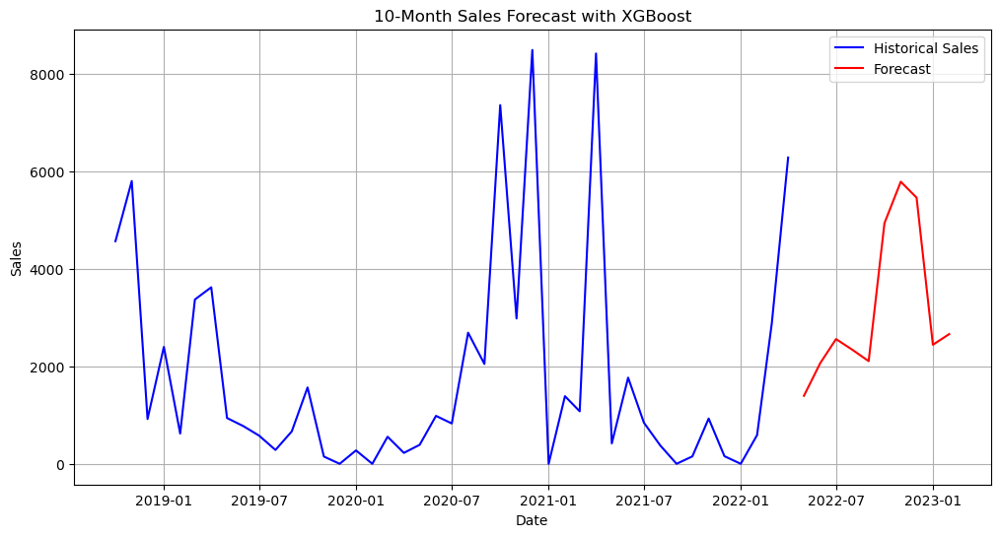

/var/folders/z6/_vn8cndd4x5dmx2cpjfdkjdr0000gn/T/ipykernel_48953/3969587683.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_set_20["Sales_EUR"] = results["yhat"]


,Mapped_GCK,Sales_EUR
Month Year,,
2022-05-01,#20,1394.522461
2022-06-01,#20,2064.975342
2022-07-01,#20,2557.675049
2022-08-01,#20,2338.390381
2022-09-01,#20,2105.449951
2022-10-01,#20,4935.631836
2022-11-01,#20,5784.880371
2022-12-01,#20,5457.561035
2023-01-01,#20,2441.561523


In [92]:
best_model, best_params, best_rmse, best_model_name = select_best_model(
    prophet_best_model_20, prophet_best_params_20, prophet_best_rmse_20, "Prophet",
    xgboost_best_model_20, xgboost_best_params_20, xgboost_best_rmse_20, "XGBoost"
    , sarima_best_model_20, sarima_best_params_20, sarima_best_rmse_20, "SARIMA"
)
print(f"Best Model: {best_model_name}")
print("Best Parameters:", best_params)
print("Best RMSE:", best_rmse)

if best_model_name == "XGBoost":
    results = xgboost_forecast(
        sales_agg20,
        df_market_20,
        period=10,
        params =best_params,
    )
elif best_model_name == "SARIMA":
    results = sarima_forecast(
        sales_agg20,
        period=10,
        params =best_params,
    )
else:
    results = prophet_forecast(
        sales_agg20,
        df_market_20,
        period=10,
        param =best_params,
    )
results.set_index('ds',inplace = True)
test_set_20.set_index('Month Year', inplace = True)
test_set_20["Sales_EUR"] = results["yhat"]
test_set_20

# Product 36

In [93]:
# selecte only the features that are selected in the feature selection step
test_set_36 = test_set[test_set['Mapped_GCK'] == '#36']
df_market_36 = df_market[selected_features_36]
df_market_36.head()

,PRO27392_org_lag_1,MAB_ELE_SHP392_lag_6,MAB_ELE_SHP250_lag_5
date,,,
2004-02-01,NaN,NaN,NaN
2004-03-01,106.161262,NaN,NaN
2004-04-01,140.288741,NaN,NaN
2004-05-01,106.271197,NaN,NaN
2004-06-01,101.608710,NaN,NaN


## Xgboost

In [94]:
X_train, X_val, y_train, y_val = train_val_split(sales_agg36, df_market_36, train_size = 0.8)

X_val.info() 

xgboost_best_model_36, xgboost_best_params_36, xgboost_best_rmse_36 = model_evaluation_XGboost(X_train,
                                                                                             y_train, 
                                                                                             X_val, y_val, 
                                                                                             xgboost_param_grid)

print("Best Params:", xgboost_best_params_36)
print("Validation RMSE:", xgboost_best_rmse_36)


<class 'pandas.core.frame.DataFrame'>
Index: 9 entries, 2021-08-01 to 2022-04-01
Data columns (total 3 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   PRO27392_org_lag_1    9 non-null      float64
 1   MAB_ELE_SHP392_lag_6  9 non-null      float64
 2   MAB_ELE_SHP250_lag_5  9 non-null      float64
dtypes: float64(3)
memory usage: 288.0+ bytes
Params: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.01, 'subsample': 0.5, 'colsample_bytree': 0.5, 'gamma': 0, 'reg_alpha': 0, 'reg_lambda': 0} => RMSE: 20319.5243, Relative RMSE: 1.2510
Params: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.01, 'subsample': 0.5, 'colsample_bytree': 0.5, 'gamma': 0, 'reg_alpha': 0, 'reg_lambda': 0.1} => RMSE: 19661.5591, Relative RMSE: 1.2105
Params: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.01, 'subsample': 0.5, 'colsample_bytree': 0.5, 'gamma': 0, 'reg_alpha': 0, 'reg_lambda': 0.5} => RMSE: 18092.3557, Relativ

## Prophet

In [95]:
prophet_best_model_36, prophet_best_params_36, prophet_best_rmse_36 = model_evaluation_prophet(X_train,
                                                                                             y_train, 
                                                                                             X_val, 
                                                                                             y_val, 
                                                                                             prophet_param_grid)

print("Best Params:", prophet_best_params_36)

print("Validation RMSE:", prophet_best_rmse_36)

02:53:01 - cmdstanpy - INFO - Chain [1] start processing
02:53:03 - cmdstanpy - INFO - Chain [1] done processing
02:53:03 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 24352.6499, Relative RMSE: 1.4993


02:53:04 - cmdstanpy - INFO - Chain [1] done processing
02:53:04 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 24069.6970, Relative RMSE: 1.4818


02:53:06 - cmdstanpy - INFO - Chain [1] done processing
02:53:06 - cmdstanpy - INFO - Chain [1] start processing
02:53:06 - cmdstanpy - INFO - Chain [1] done processing
02:53:06 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 24240.3734, Relative RMSE: 1.4923
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 25824.3433, Relative RMSE: 1.5899


02:53:06 - cmdstanpy - INFO - Chain [1] done processing
02:53:06 - cmdstanpy - INFO - Chain [1] start processing
02:53:06 - cmdstanpy - INFO - Chain [1] done processing
02:53:06 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 25485.6172, Relative RMSE: 1.5690
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 25660.9246, Relative RMSE: 1.5798


02:53:07 - cmdstanpy - INFO - Chain [1] done processing
02:53:07 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 26316.0828, Relative RMSE: 1.6201


02:53:07 - cmdstanpy - INFO - Chain [1] done processing
02:53:07 - cmdstanpy - INFO - Chain [1] start processing
02:53:07 - cmdstanpy - INFO - Chain [1] done processing
02:53:07 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 26366.0044, Relative RMSE: 1.6232
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 26378.3718, Relative RMSE: 1.6240


02:53:07 - cmdstanpy - INFO - Chain [1] done processing
02:53:07 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 31530.2742, Relative RMSE: 1.9411


02:53:08 - cmdstanpy - INFO - Chain [1] done processing
02:53:08 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 31587.7316, Relative RMSE: 1.9447


02:53:08 - cmdstanpy - INFO - Chain [1] done processing
02:53:08 - cmdstanpy - INFO - Chain [1] start processing
02:53:08 - cmdstanpy - INFO - Chain [1] done processing
02:53:09 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 31554.2280, Relative RMSE: 1.9426
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 17422.5759, Relative RMSE: 1.0726


02:53:09 - cmdstanpy - INFO - Chain [1] done processing
02:53:09 - cmdstanpy - INFO - Chain [1] start processing
02:53:09 - cmdstanpy - INFO - Chain [1] done processing
02:53:09 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 17420.5826, Relative RMSE: 1.0725
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 17423.8910, Relative RMSE: 1.0727


02:53:09 - cmdstanpy - INFO - Chain [1] done processing
02:53:09 - cmdstanpy - INFO - Chain [1] start processing
02:53:09 - cmdstanpy - INFO - Chain [1] done processing
02:53:09 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 17630.3717, Relative RMSE: 1.0854
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 17805.0042, Relative RMSE: 1.0962


02:53:09 - cmdstanpy - INFO - Chain [1] done processing
02:53:09 - cmdstanpy - INFO - Chain [1] start processing
02:53:09 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 17255.2127, Relative RMSE: 1.0623
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 17797.5938, Relative RMSE: 1.0957


02:53:09 - cmdstanpy - INFO - Chain [1] start processing
02:53:10 - cmdstanpy - INFO - Chain [1] done processing
02:53:10 - cmdstanpy - INFO - Chain [1] start processing
02:53:10 - cmdstanpy - INFO - Chain [1] done processing
02:53:10 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 17810.6051, Relative RMSE: 1.0965
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 17763.5456, Relative RMSE: 1.0936


02:53:10 - cmdstanpy - INFO - Chain [1] done processing
02:53:10 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 22160.2987, Relative RMSE: 1.3643


02:53:10 - cmdstanpy - INFO - Chain [1] done processing
02:53:10 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 22537.8775, Relative RMSE: 1.3875


02:53:11 - cmdstanpy - INFO - Chain [1] done processing
02:53:11 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 22109.4563, Relative RMSE: 1.3612


02:53:12 - cmdstanpy - INFO - Chain [1] done processing
02:53:13 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 155926.1055, Relative RMSE: 9.5995


02:53:14 - cmdstanpy - INFO - Chain [1] done processing
02:53:14 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 155871.1400, Relative RMSE: 9.5961


02:53:16 - cmdstanpy - INFO - Chain [1] done processing
02:53:16 - cmdstanpy - INFO - Chain [1] start processing
02:53:16 - cmdstanpy - INFO - Chain [1] done processing
02:53:16 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 159667.5997, Relative RMSE: 9.8299
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 190372.1786, Relative RMSE: 11.7202


02:53:16 - cmdstanpy - INFO - Chain [1] done processing
02:53:16 - cmdstanpy - INFO - Chain [1] start processing
02:53:17 - cmdstanpy - INFO - Chain [1] done processing
02:53:17 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 190372.3131, Relative RMSE: 11.7202
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 190370.2575, Relative RMSE: 11.7200


02:53:17 - cmdstanpy - INFO - Chain [1] done processing
02:53:17 - cmdstanpy - INFO - Chain [1] start processing
02:53:17 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 190366.5194, Relative RMSE: 11.7198


02:53:17 - cmdstanpy - INFO - Chain [1] start processing
02:53:17 - cmdstanpy - INFO - Chain [1] done processing
02:53:17 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 190347.0690, Relative RMSE: 11.7186
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 190330.5066, Relative RMSE: 11.7176


02:53:17 - cmdstanpy - INFO - Chain [1] done processing
02:53:17 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 209987.0966, Relative RMSE: 12.9277


02:53:18 - cmdstanpy - INFO - Chain [1] done processing
02:53:18 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 206633.9590, Relative RMSE: 12.7213


02:53:18 - cmdstanpy - INFO - Chain [1] done processing
02:53:18 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 210005.2165, Relative RMSE: 12.9289


02:53:19 - cmdstanpy - INFO - Chain [1] done processing
02:53:19 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 335785.4674, Relative RMSE: 20.6725


02:53:20 - cmdstanpy - INFO - Chain [1] done processing
02:53:20 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 337480.9060, Relative RMSE: 20.7768


02:53:20 - cmdstanpy - INFO - Chain [1] done processing
02:53:20 - cmdstanpy - INFO - Chain [1] start processing
02:53:20 - cmdstanpy - INFO - Chain [1] done processing
02:53:21 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 324300.5753, Relative RMSE: 19.9654
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 269688.7846, Relative RMSE: 16.6032


02:53:21 - cmdstanpy - INFO - Chain [1] done processing
02:53:21 - cmdstanpy - INFO - Chain [1] start processing
02:53:21 - cmdstanpy - INFO - Chain [1] done processing
02:53:21 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 269544.2406, Relative RMSE: 16.5944
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 269723.7677, Relative RMSE: 16.6054


02:53:21 - cmdstanpy - INFO - Chain [1] done processing
02:53:21 - cmdstanpy - INFO - Chain [1] start processing
02:53:21 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 280063.0460, Relative RMSE: 17.2419


02:53:21 - cmdstanpy - INFO - Chain [1] start processing
02:53:21 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 281462.3158, Relative RMSE: 17.3281
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 276000.7251, Relative RMSE: 16.9918


02:53:21 - cmdstanpy - INFO - Chain [1] start processing
02:53:22 - cmdstanpy - INFO - Chain [1] done processing
02:53:22 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 300399.4333, Relative RMSE: 18.4939


02:53:22 - cmdstanpy - INFO - Chain [1] done processing
02:53:22 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 296794.9660, Relative RMSE: 18.2720


02:53:22 - cmdstanpy - INFO - Chain [1] done processing
02:53:22 - cmdstanpy - INFO - Chain [1] start processing
02:53:22 - cmdstanpy - INFO - Chain [1] done processing
02:53:22 - cmdstanpy - INFO - Chain [1] start processing
02:53:22 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 300398.6844, Relative RMSE: 18.4939
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 29359.0046, Relative RMSE: 1.8075


02:53:23 - cmdstanpy - INFO - Chain [1] start processing
02:53:23 - cmdstanpy - INFO - Chain [1] done processing
02:53:23 - cmdstanpy - INFO - Chain [1] start processing
02:53:23 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 29357.8694, Relative RMSE: 1.8074
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 29354.6170, Relative RMSE: 1.8072


02:53:23 - cmdstanpy - INFO - Chain [1] start processing
02:53:23 - cmdstanpy - INFO - Chain [1] done processing
02:53:23 - cmdstanpy - INFO - Chain [1] start processing
02:53:23 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 26671.0327, Relative RMSE: 1.6420
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 26770.8647, Relative RMSE: 1.6481


02:53:23 - cmdstanpy - INFO - Chain [1] start processing
02:53:23 - cmdstanpy - INFO - Chain [1] done processing
02:53:23 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 26855.9531, Relative RMSE: 1.6534
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 27365.4638, Relative RMSE: 1.6847


02:53:23 - cmdstanpy - INFO - Chain [1] done processing
02:53:23 - cmdstanpy - INFO - Chain [1] start processing
02:53:23 - cmdstanpy - INFO - Chain [1] done processing
02:53:23 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 27394.7658, Relative RMSE: 1.6865
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 27342.6221, Relative RMSE: 1.6833


02:53:23 - cmdstanpy - INFO - Chain [1] done processing
02:53:23 - cmdstanpy - INFO - Chain [1] start processing
02:53:24 - cmdstanpy - INFO - Chain [1] done processing
02:53:24 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 31882.6597, Relative RMSE: 1.9628
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 31853.4191, Relative RMSE: 1.9610


02:53:24 - cmdstanpy - INFO - Chain [1] done processing
02:53:24 - cmdstanpy - INFO - Chain [1] start processing
02:53:24 - cmdstanpy - INFO - Chain [1] done processing
02:53:24 - cmdstanpy - INFO - Chain [1] start processing
02:53:24 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 30191.5392, Relative RMSE: 1.8587
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 29359.0046, Relative RMSE: 1.8075


02:53:24 - cmdstanpy - INFO - Chain [1] start processing
02:53:24 - cmdstanpy - INFO - Chain [1] done processing
02:53:24 - cmdstanpy - INFO - Chain [1] start processing
02:53:24 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 29357.8694, Relative RMSE: 1.8074
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 29354.6170, Relative RMSE: 1.8072


02:53:24 - cmdstanpy - INFO - Chain [1] start processing
02:53:24 - cmdstanpy - INFO - Chain [1] done processing
02:53:24 - cmdstanpy - INFO - Chain [1] start processing
02:53:24 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 26671.0327, Relative RMSE: 1.6420
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 26770.8647, Relative RMSE: 1.6481


02:53:24 - cmdstanpy - INFO - Chain [1] start processing
02:53:24 - cmdstanpy - INFO - Chain [1] done processing
02:53:25 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 26855.9531, Relative RMSE: 1.6534
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 27365.4638, Relative RMSE: 1.6847


02:53:25 - cmdstanpy - INFO - Chain [1] done processing
02:53:25 - cmdstanpy - INFO - Chain [1] start processing
02:53:25 - cmdstanpy - INFO - Chain [1] done processing
02:53:25 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 27394.7658, Relative RMSE: 1.6865
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 27342.6221, Relative RMSE: 1.6833


02:53:25 - cmdstanpy - INFO - Chain [1] done processing
02:53:25 - cmdstanpy - INFO - Chain [1] start processing
02:53:25 - cmdstanpy - INFO - Chain [1] done processing
02:53:25 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 31882.6597, Relative RMSE: 1.9628
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 31853.4191, Relative RMSE: 1.9610


02:53:25 - cmdstanpy - INFO - Chain [1] done processing
02:53:25 - cmdstanpy - INFO - Chain [1] start processing
02:53:25 - cmdstanpy - INFO - Chain [1] done processing
02:53:25 - cmdstanpy - INFO - Chain [1] start processing
02:53:25 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 30191.5392, Relative RMSE: 1.8587
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 29359.0046, Relative RMSE: 1.8075


02:53:25 - cmdstanpy - INFO - Chain [1] start processing
02:53:25 - cmdstanpy - INFO - Chain [1] done processing
02:53:26 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 29357.8694, Relative RMSE: 1.8074
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 29354.6170, Relative RMSE: 1.8072


02:53:26 - cmdstanpy - INFO - Chain [1] done processing
02:53:26 - cmdstanpy - INFO - Chain [1] start processing
02:53:26 - cmdstanpy - INFO - Chain [1] done processing
02:53:26 - cmdstanpy - INFO - Chain [1] start processing
02:53:26 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 26671.0327, Relative RMSE: 1.6420
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 26770.8647, Relative RMSE: 1.6481


02:53:26 - cmdstanpy - INFO - Chain [1] start processing
02:53:26 - cmdstanpy - INFO - Chain [1] done processing
02:53:26 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 26855.9531, Relative RMSE: 1.6534
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 27365.4638, Relative RMSE: 1.6847


02:53:26 - cmdstanpy - INFO - Chain [1] done processing
02:53:26 - cmdstanpy - INFO - Chain [1] start processing
02:53:26 - cmdstanpy - INFO - Chain [1] done processing
02:53:26 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 27394.7658, Relative RMSE: 1.6865
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 27342.6221, Relative RMSE: 1.6833


02:53:26 - cmdstanpy - INFO - Chain [1] done processing
02:53:26 - cmdstanpy - INFO - Chain [1] start processing
02:53:26 - cmdstanpy - INFO - Chain [1] done processing
02:53:26 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 31882.6597, Relative RMSE: 1.9628
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 31853.4191, Relative RMSE: 1.9610


02:53:27 - cmdstanpy - INFO - Chain [1] done processing
02:53:27 - cmdstanpy - INFO - Chain [1] start processing
02:53:27 - cmdstanpy - INFO - Chain [1] done processing
02:53:27 - cmdstanpy - INFO - Chain [1] start processing
02:53:27 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 30191.5392, Relative RMSE: 1.8587
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 29359.0046, Relative RMSE: 1.8075


02:53:27 - cmdstanpy - INFO - Chain [1] start processing
02:53:27 - cmdstanpy - INFO - Chain [1] done processing
02:53:27 - cmdstanpy - INFO - Chain [1] start processing
02:53:27 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 29357.8694, Relative RMSE: 1.8074
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 29354.6170, Relative RMSE: 1.8072


02:53:27 - cmdstanpy - INFO - Chain [1] start processing
02:53:27 - cmdstanpy - INFO - Chain [1] done processing
02:53:27 - cmdstanpy - INFO - Chain [1] start processing
02:53:27 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 26671.0327, Relative RMSE: 1.6420
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 26770.8647, Relative RMSE: 1.6481


02:53:27 - cmdstanpy - INFO - Chain [1] start processing
02:53:27 - cmdstanpy - INFO - Chain [1] done processing
02:53:27 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 26855.9531, Relative RMSE: 1.6534
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 27365.4638, Relative RMSE: 1.6847


02:53:27 - cmdstanpy - INFO - Chain [1] done processing
02:53:27 - cmdstanpy - INFO - Chain [1] start processing
02:53:28 - cmdstanpy - INFO - Chain [1] done processing
02:53:28 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 27394.7658, Relative RMSE: 1.6865
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 27342.6221, Relative RMSE: 1.6833


02:53:28 - cmdstanpy - INFO - Chain [1] done processing
02:53:28 - cmdstanpy - INFO - Chain [1] start processing
02:53:28 - cmdstanpy - INFO - Chain [1] done processing
02:53:28 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 31882.6597, Relative RMSE: 1.9628
Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 31853.4191, Relative RMSE: 1.9610


02:53:28 - cmdstanpy - INFO - Chain [1] done processing
02:53:28 - cmdstanpy - INFO - Chain [1] start processing
02:53:28 - cmdstanpy - INFO - Chain [1] done processing
02:53:28 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'additive', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 30191.5392, Relative RMSE: 1.8587
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 29286.4350, Relative RMSE: 1.8030


02:53:28 - cmdstanpy - INFO - Chain [1] done processing
02:53:28 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 29279.7518, Relative RMSE: 1.8026


02:53:29 - cmdstanpy - INFO - Chain [1] done processing
02:53:29 - cmdstanpy - INFO - Chain [1] start processing
02:53:29 - cmdstanpy - INFO - Chain [1] done processing
02:53:29 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 29265.5095, Relative RMSE: 1.8017
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 26758.9380, Relative RMSE: 1.6474


02:53:29 - cmdstanpy - INFO - Chain [1] done processing
02:53:29 - cmdstanpy - INFO - Chain [1] start processing
02:53:29 - cmdstanpy - INFO - Chain [1] done processing
02:53:29 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 26861.4569, Relative RMSE: 1.6537
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 26943.2956, Relative RMSE: 1.6587


02:53:29 - cmdstanpy - INFO - Chain [1] done processing
02:53:29 - cmdstanpy - INFO - Chain [1] start processing
02:53:29 - cmdstanpy - INFO - Chain [1] done processing
02:53:29 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 27317.5438, Relative RMSE: 1.6818
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 27734.2880, Relative RMSE: 1.7074


02:53:30 - cmdstanpy - INFO - Chain [1] done processing
02:53:30 - cmdstanpy - INFO - Chain [1] start processing
02:53:30 - cmdstanpy - INFO - Chain [1] done processing
02:53:30 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 27423.1166, Relative RMSE: 1.6883
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 32016.1686, Relative RMSE: 1.9711


02:53:30 - cmdstanpy - INFO - Chain [1] done processing
02:53:30 - cmdstanpy - INFO - Chain [1] start processing
02:53:30 - cmdstanpy - INFO - Chain [1] done processing
02:53:30 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 32134.3893, Relative RMSE: 1.9783
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 32041.3656, Relative RMSE: 1.9726


02:53:31 - cmdstanpy - INFO - Chain [1] done processing
02:53:31 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 39982.5037, Relative RMSE: 2.4615


02:53:33 - cmdstanpy - INFO - Chain [1] done processing
02:53:33 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 39572.5919, Relative RMSE: 2.4363


02:53:34 - cmdstanpy - INFO - Chain [1] done processing
02:53:34 - cmdstanpy - INFO - Chain [1] start processing
02:53:34 - cmdstanpy - INFO - Chain [1] done processing
02:53:34 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 38505.8043, Relative RMSE: 2.3706
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 33444.6490, Relative RMSE: 2.0590


02:53:34 - cmdstanpy - INFO - Chain [1] done processing
02:53:34 - cmdstanpy - INFO - Chain [1] start processing
02:53:34 - cmdstanpy - INFO - Chain [1] done processing
02:53:34 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 33832.3106, Relative RMSE: 2.0829
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 33628.6187, Relative RMSE: 2.0703


02:53:34 - cmdstanpy - INFO - Chain [1] done processing
02:53:34 - cmdstanpy - INFO - Chain [1] start processing
02:53:35 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 33646.1158, Relative RMSE: 2.0714


02:53:35 - cmdstanpy - INFO - Chain [1] start processing
02:53:35 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 33720.0170, Relative RMSE: 2.0760


02:53:35 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 33685.3738, Relative RMSE: 2.0738


02:53:35 - cmdstanpy - INFO - Chain [1] done processing
02:53:35 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 28429.9294, Relative RMSE: 1.7503


02:53:36 - cmdstanpy - INFO - Chain [1] done processing
02:53:36 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 25695.1747, Relative RMSE: 1.5819


02:53:36 - cmdstanpy - INFO - Chain [1] done processing
02:53:36 - cmdstanpy - INFO - Chain [1] start processing
02:53:36 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 28603.8650, Relative RMSE: 1.7610


02:53:36 - cmdstanpy - INFO - Chain [1] start processing
02:53:36 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 15831.5745, Relative RMSE: 0.9747


02:53:36 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 15865.2453, Relative RMSE: 0.9767


02:53:37 - cmdstanpy - INFO - Chain [1] done processing
02:53:37 - cmdstanpy - INFO - Chain [1] start processing
02:53:37 - cmdstanpy - INFO - Chain [1] done processing
02:53:37 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 15825.7376, Relative RMSE: 0.9743
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 15774.3699, Relative RMSE: 0.9711


02:53:37 - cmdstanpy - INFO - Chain [1] done processing
02:53:37 - cmdstanpy - INFO - Chain [1] start processing
02:53:37 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 15780.7121, Relative RMSE: 0.9715
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 15771.4531, Relative RMSE: 0.9710


02:53:37 - cmdstanpy - INFO - Chain [1] start processing
02:53:37 - cmdstanpy - INFO - Chain [1] done processing
02:53:38 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 20208.8794, Relative RMSE: 1.2441


02:53:38 - cmdstanpy - INFO - Chain [1] done processing
02:53:38 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 20407.6643, Relative RMSE: 1.2564


02:53:38 - cmdstanpy - INFO - Chain [1] done processing
02:53:38 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 20220.2854, Relative RMSE: 1.2449


02:53:39 - cmdstanpy - INFO - Chain [1] done processing
02:53:39 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 71311.9144, Relative RMSE: 4.3903


02:53:39 - cmdstanpy - INFO - Chain [1] done processing
02:53:39 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 40074.6035, Relative RMSE: 2.4672


02:53:40 - cmdstanpy - INFO - Chain [1] done processing
02:53:40 - cmdstanpy - INFO - Chain [1] start processing
02:53:40 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 37738.2864, Relative RMSE: 2.3233


02:53:40 - cmdstanpy - INFO - Chain [1] start processing
02:53:40 - cmdstanpy - INFO - Chain [1] done processing
02:53:40 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 61535.7927, Relative RMSE: 3.7884
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 33762.2531, Relative RMSE: 2.0786


02:53:40 - cmdstanpy - INFO - Chain [1] done processing
02:53:40 - cmdstanpy - INFO - Chain [1] start processing
02:53:40 - cmdstanpy - INFO - Chain [1] done processing
02:53:40 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 33474.5303, Relative RMSE: 2.0608
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 131299.4706, Relative RMSE: 8.0834


02:53:41 - cmdstanpy - INFO - Chain [1] done processing
02:53:41 - cmdstanpy - INFO - Chain [1] start processing
02:53:41 - cmdstanpy - INFO - Chain [1] done processing
02:53:41 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 130380.5062, Relative RMSE: 8.0268
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 130217.3005, Relative RMSE: 8.0168


02:53:41 - cmdstanpy - INFO - Chain [1] done processing
02:53:41 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 537169.8444, Relative RMSE: 33.0706


02:53:41 - cmdstanpy - INFO - Chain [1] done processing
02:53:41 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 437252.3108, Relative RMSE: 26.9192


02:53:42 - cmdstanpy - INFO - Chain [1] done processing
02:53:42 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 2375632.8114, Relative RMSE: 146.2546


02:53:58 - cmdstanpy - INFO - Chain [1] done processing
02:53:58 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 3034557.1280, Relative RMSE: 186.8209


02:54:14 - cmdstanpy - INFO - Chain [1] done processing
02:54:14 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 3065582.3536, Relative RMSE: 188.7310


02:54:15 - cmdstanpy - INFO - Chain [1] done processing
02:54:15 - cmdstanpy - INFO - Chain [1] start processing
02:54:15 - cmdstanpy - INFO - Chain [1] done processing
02:54:15 - cmdstanpy - INFO - Chain [1] start processing
02:54:15 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 2786615.5226, Relative RMSE: 171.5565
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 29359.0046, Relative RMSE: 1.8075


02:54:15 - cmdstanpy - INFO - Chain [1] start processing
02:54:15 - cmdstanpy - INFO - Chain [1] done processing
02:54:15 - cmdstanpy - INFO - Chain [1] start processing
02:54:15 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 29357.8694, Relative RMSE: 1.8074
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 29354.6170, Relative RMSE: 1.8072


02:54:15 - cmdstanpy - INFO - Chain [1] start processing
02:54:15 - cmdstanpy - INFO - Chain [1] done processing
02:54:15 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 26671.0327, Relative RMSE: 1.6420
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 26770.8647, Relative RMSE: 1.6481


02:54:15 - cmdstanpy - INFO - Chain [1] done processing
02:54:15 - cmdstanpy - INFO - Chain [1] start processing
02:54:15 - cmdstanpy - INFO - Chain [1] done processing
02:54:15 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 26855.9531, Relative RMSE: 1.6534
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 27365.4638, Relative RMSE: 1.6847


02:54:15 - cmdstanpy - INFO - Chain [1] done processing
02:54:16 - cmdstanpy - INFO - Chain [1] start processing
02:54:16 - cmdstanpy - INFO - Chain [1] done processing
02:54:16 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 27394.7658, Relative RMSE: 1.6865
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 27342.6221, Relative RMSE: 1.6833


02:54:16 - cmdstanpy - INFO - Chain [1] done processing
02:54:16 - cmdstanpy - INFO - Chain [1] start processing
02:54:16 - cmdstanpy - INFO - Chain [1] done processing
02:54:16 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 31882.6597, Relative RMSE: 1.9628
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 31853.4191, Relative RMSE: 1.9610


02:54:16 - cmdstanpy - INFO - Chain [1] done processing
02:54:16 - cmdstanpy - INFO - Chain [1] start processing
02:54:16 - cmdstanpy - INFO - Chain [1] done processing
02:54:16 - cmdstanpy - INFO - Chain [1] start processing
02:54:16 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.01, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 30191.5392, Relative RMSE: 1.8587
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 29359.0046, Relative RMSE: 1.8075


02:54:16 - cmdstanpy - INFO - Chain [1] start processing
02:54:16 - cmdstanpy - INFO - Chain [1] done processing
02:54:16 - cmdstanpy - INFO - Chain [1] start processing
02:54:16 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 29357.8694, Relative RMSE: 1.8074
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 29354.6170, Relative RMSE: 1.8072


02:54:16 - cmdstanpy - INFO - Chain [1] start processing
02:54:17 - cmdstanpy - INFO - Chain [1] done processing
02:54:17 - cmdstanpy - INFO - Chain [1] start processing
02:54:17 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 26671.0327, Relative RMSE: 1.6420
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 26770.8647, Relative RMSE: 1.6481


02:54:17 - cmdstanpy - INFO - Chain [1] start processing
02:54:17 - cmdstanpy - INFO - Chain [1] done processing
02:54:17 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 26855.9531, Relative RMSE: 1.6534
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 27365.4638, Relative RMSE: 1.6847


02:54:17 - cmdstanpy - INFO - Chain [1] done processing
02:54:17 - cmdstanpy - INFO - Chain [1] start processing
02:54:17 - cmdstanpy - INFO - Chain [1] done processing
02:54:17 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 27394.7658, Relative RMSE: 1.6865
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 27342.6221, Relative RMSE: 1.6833


02:54:17 - cmdstanpy - INFO - Chain [1] done processing
02:54:17 - cmdstanpy - INFO - Chain [1] start processing
02:54:17 - cmdstanpy - INFO - Chain [1] done processing
02:54:17 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 31882.6597, Relative RMSE: 1.9628
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 31853.4191, Relative RMSE: 1.9610


02:54:17 - cmdstanpy - INFO - Chain [1] done processing
02:54:17 - cmdstanpy - INFO - Chain [1] start processing
02:54:17 - cmdstanpy - INFO - Chain [1] done processing
02:54:18 - cmdstanpy - INFO - Chain [1] start processing
02:54:18 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 0.1, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 30191.5392, Relative RMSE: 1.8587
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 29359.0046, Relative RMSE: 1.8075


02:54:18 - cmdstanpy - INFO - Chain [1] start processing
02:54:18 - cmdstanpy - INFO - Chain [1] done processing
02:54:18 - cmdstanpy - INFO - Chain [1] start processing
02:54:18 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 29357.8694, Relative RMSE: 1.8074
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 29354.6170, Relative RMSE: 1.8072


02:54:18 - cmdstanpy - INFO - Chain [1] start processing
02:54:18 - cmdstanpy - INFO - Chain [1] done processing
02:54:18 - cmdstanpy - INFO - Chain [1] start processing
02:54:18 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 26671.0327, Relative RMSE: 1.6420
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 26770.8647, Relative RMSE: 1.6481


02:54:18 - cmdstanpy - INFO - Chain [1] start processing
02:54:18 - cmdstanpy - INFO - Chain [1] done processing
02:54:18 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 26855.9531, Relative RMSE: 1.6534
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 27365.4638, Relative RMSE: 1.6847


02:54:18 - cmdstanpy - INFO - Chain [1] done processing
02:54:18 - cmdstanpy - INFO - Chain [1] start processing
02:54:18 - cmdstanpy - INFO - Chain [1] done processing
02:54:19 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 27394.7658, Relative RMSE: 1.6865
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 27342.6221, Relative RMSE: 1.6833


02:54:19 - cmdstanpy - INFO - Chain [1] done processing
02:54:19 - cmdstanpy - INFO - Chain [1] start processing
02:54:19 - cmdstanpy - INFO - Chain [1] done processing
02:54:19 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 31882.6597, Relative RMSE: 1.9628
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 31853.4191, Relative RMSE: 1.9610


02:54:19 - cmdstanpy - INFO - Chain [1] done processing
02:54:19 - cmdstanpy - INFO - Chain [1] start processing
02:54:19 - cmdstanpy - INFO - Chain [1] done processing
02:54:19 - cmdstanpy - INFO - Chain [1] start processing
02:54:19 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 30191.5392, Relative RMSE: 1.8587
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.8} => RMSE: 29359.0046, Relative RMSE: 1.8075


02:54:19 - cmdstanpy - INFO - Chain [1] start processing
02:54:19 - cmdstanpy - INFO - Chain [1] done processing
02:54:19 - cmdstanpy - INFO - Chain [1] start processing
02:54:19 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 0.9} => RMSE: 29357.8694, Relative RMSE: 1.8074
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.001, 'changepoint_range': 1.0} => RMSE: 29354.6170, Relative RMSE: 1.8072


02:54:19 - cmdstanpy - INFO - Chain [1] start processing
02:54:19 - cmdstanpy - INFO - Chain [1] done processing
02:54:19 - cmdstanpy - INFO - Chain [1] start processing
02:54:20 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.8} => RMSE: 26671.0327, Relative RMSE: 1.6420
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 0.9} => RMSE: 26770.8647, Relative RMSE: 1.6481


02:54:20 - cmdstanpy - INFO - Chain [1] start processing
02:54:20 - cmdstanpy - INFO - Chain [1] done processing
02:54:20 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0} => RMSE: 26855.9531, Relative RMSE: 1.6534
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.8} => RMSE: 27365.4638, Relative RMSE: 1.6847


02:54:20 - cmdstanpy - INFO - Chain [1] done processing
02:54:20 - cmdstanpy - INFO - Chain [1] start processing
02:54:20 - cmdstanpy - INFO - Chain [1] done processing
02:54:20 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 0.9} => RMSE: 27394.7658, Relative RMSE: 1.6865
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.1, 'changepoint_range': 1.0} => RMSE: 27342.6221, Relative RMSE: 1.6833


02:54:20 - cmdstanpy - INFO - Chain [1] done processing
02:54:20 - cmdstanpy - INFO - Chain [1] start processing
02:54:20 - cmdstanpy - INFO - Chain [1] done processing
02:54:20 - cmdstanpy - INFO - Chain [1] start processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.8} => RMSE: 31882.6597, Relative RMSE: 1.9628
Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 0.9} => RMSE: 31853.4191, Relative RMSE: 1.9610


02:54:20 - cmdstanpy - INFO - Chain [1] done processing


Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': False, 'seasonality_prior_scale': 10.0, 'changepoint_prior_scale': 0.5, 'changepoint_range': 1.0} => RMSE: 30191.5392, Relative RMSE: 1.8587
Best Params: {'seasonality_mode': 'multiplicative', 'yearly_seasonality': True, 'seasonality_prior_scale': 1.0, 'changepoint_prior_scale': 0.01, 'changepoint_range': 1.0}
Validation RMSE: 15771.453075372909


## Sarima

In [96]:
sarima_best_model_36, sarima_best_params_36, sarima_best_rmse_36 = model_evaluation_SARIMA(y_train, 
                                                             y_val, 
                                                             sarima_param_grid)

print("Best Params:", sarima_best_params_36)
print("Validation RMSE:", sarima_best_rmse_36)

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,0) x (0,0,0,6) => RMSE: 22226.1730, Relative RMSE: 1.3683
SARIMA(0,0,0) x (0,0,0,12) => RMSE: 22226.1730, Relative RMSE: 1.3683
SARIMA(0,0,0) x (0,0,1,6) => RMSE: 46689.1736, Relative RMSE: 2.8744
SARIMA(0,0,0) x (0,0,1,12) => RMSE: 65850.1089, Relative RMSE: 4.0540
SARIMA(0,0,0) x (0,1,0,6) => RMSE: 116102.0325, Relative RMSE: 7.1478
SARIMA(0,0,0) x (0,1,0,12) => RMSE: 80659.9406, Relative RMSE: 4.9658
SARIMA(0,0,0) x (0,1,1,6) => RMSE: 99897.8653, Relative RMSE: 6.1502
SARIMA(0,0,0) x (0,1,1,12) => RMSE: 117972.6988, Relative RMSE: 7.2629
SARIMA(0,0,0) x (1,0,0,6) => RMSE: 209929.6661, Relative RMSE: 12.9242
SARIMA(0,0,0) x (1,0,0,12) => RMSE: 159568.4802, Relative RMSE: 9.8237
SARIMA(0,0,0) x (1,0,1,6) => RMSE: 175116.9336, Relative RMSE: 10.7810


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(0,0,0) x (1,0,1,12) => RMSE: 159886.8238, Relative RMSE: 9.8433
SARIMA(0,0,0) x (1,1,0,6) => RMSE: 70994.3298, Relative RMSE: 4.3707
SARIMA(0,0,0) x (1,1,0,12) => RMSE: 231058.4403, Relative RMSE: 14.2250
SARIMA(0,0,0) x (1,1,1,6) => RMSE: 216488.0130, Relative RMSE: 13.3280


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,0) x (1,1,1,12) => RMSE: 351305.2143, Relative RMSE: 21.6279
SARIMA(0,0,1) x (0,0,0,6) => RMSE: 22153.3428, Relative RMSE: 1.3639
SARIMA(0,0,1) x (0,0,0,12) => RMSE: 22153.3428, Relative RMSE: 1.3639
SARIMA(0,0,1) x (0,0,1,6) => RMSE: 44208.4445, Relative RMSE: 2.7217
SARIMA(0,0,1) x (0,0,1,12) => RMSE: 68411.9342, Relative RMSE: 4.2117
SARIMA(0,0,1) x (0,1,0,6) => RMSE: 116125.7722, Relative RMSE: 7.1492
SARIMA(0,0,1) x (0,1,0,12) => RMSE: 80658.3256, Relative RMSE: 4.9657
SARIMA(0,0,1) x (0,1,1,6) => RMSE: 102613.6537, Relative RMSE: 6.3174


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,0,1) x (0,1,1,12) => RMSE: 116542.8386, Relative RMSE: 7.1749
SARIMA(0,0,1) x (1,0,0,6) => RMSE: 244391.2824, Relative RMSE: 15.0458
SARIMA(0,0,1) x (1,0,0,12) => RMSE: 163537.3370, Relative RMSE: 10.0681
SARIMA(0,0,1) x (1,0,1,6) => RMSE: 306124.1097, Relative RMSE: 18.8464


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,1) x (1,0,1,12) => RMSE: 169331.2979, Relative RMSE: 10.4248
SARIMA(0,0,1) x (1,1,0,6) => RMSE: 71328.4611, Relative RMSE: 4.3913
SARIMA(0,0,1) x (1,1,0,12) => RMSE: 229193.7474, Relative RMSE: 14.1102
SARIMA(0,0,1) x (1,1,1,6) => RMSE: 263156.5588, Relative RMSE: 16.2011


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,0,1) x (1,1,1,12) => RMSE: 332808.1612, Relative RMSE: 20.4892
SARIMA(0,0,2) x (0,0,0,6) => RMSE: 21789.0885, Relative RMSE: 1.3414
SARIMA(0,0,2) x (0,0,0,12) => RMSE: 21789.0885, Relative RMSE: 1.3414
SARIMA(0,0,2) x (0,0,1,6) => RMSE: 42823.4039, Relative RMSE: 2.6364
SARIMA(0,0,2) x (0,0,1,12) => RMSE: 72174.0768, Relative RMSE: 4.4434
SARIMA(0,0,2) x (0,1,0,6) => RMSE: 116115.8025, Relative RMSE: 7.1486


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,2) x (0,1,0,12) => RMSE: 80677.1355, Relative RMSE: 4.9668
SARIMA(0,0,2) x (0,1,1,6) => RMSE: 102612.9380, Relative RMSE: 6.3173
SARIMA(0,0,2) x (0,1,1,12) => RMSE: 124894.5945, Relative RMSE: 7.6891
SARIMA(0,0,2) x (1,0,0,6) => RMSE: 244556.8551, Relative RMSE: 15.0560
SARIMA(0,0,2) x (1,0,0,12) => RMSE: 163417.7947, Relative RMSE: 10.0607


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


SARIMA(0,0,2) x (1,0,1,6) => RMSE: 304132.0893, Relative RMSE: 18.7237
SARIMA(0,0,2) x (1,0,1,12) => RMSE: 167429.5553, Relative RMSE: 10.3077
SARIMA(0,0,2) x (1,1,0,6) => RMSE: 71212.2922, Relative RMSE: 4.3841
SARIMA(0,0,2) x (1,1,0,12) => RMSE: 257344.7573, Relative RMSE: 15.8433
SARIMA(0,0,2) x (1,1,1,6) => RMSE: 294952.9441, Relative RMSE: 18.1586


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,0,2) x (1,1,1,12) => RMSE: 333920.7610, Relative RMSE: 20.5577
SARIMA(0,1,0) x (0,0,0,6) => RMSE: 15198.7727, Relative RMSE: 0.9357
SARIMA(0,1,0) x (0,0,0,12) => RMSE: 15198.7727, Relative RMSE: 0.9357
SARIMA(0,1,0) x (0,0,1,6) => RMSE: 17041.4052, Relative RMSE: 1.0491


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,0) x (0,0,1,12) => RMSE: 244751.7808, Relative RMSE: 15.0680
SARIMA(0,1,0) x (0,1,0,6) => RMSE: 125857.4277, Relative RMSE: 7.7483
SARIMA(0,1,0) x (0,1,0,12) => RMSE: 85793.6483, Relative RMSE: 5.2818
SARIMA(0,1,0) x (0,1,1,6) => RMSE: 51851.8112, Relative RMSE: 3.1922
SARIMA(0,1,0) x (0,1,1,12) => RMSE: 342400.3538, Relative RMSE: 21.0797
SARIMA(0,1,0) x (1,0,0,6) => RMSE: 24266.7025, Relative RMSE: 1.4940
SARIMA(0,1,0) x (1,0,0,12) => RMSE: 109690.9082, Relative RMSE: 6.7531
SARIMA(0,1,0) x (1,0,1,6) => RMSE: 27327.6565, Relative RMSE: 1.6824
SARIMA(0,1,0) x (1,0,1,12) => RMSE: 169341.5627, Relative RMSE: 10.4254
SARIMA(0,1,0) x (1,1,0,6) => RMSE: 138292.5549, Relative RMSE: 8.5139
SARIMA(0,1,0) x (1,1,0,12) => RMSE: 458775.0288, Relative RMSE: 28.2442
SARIMA(0,1,0) x (1,1,1,6) => RMSE: 499874.6046, Relative RMSE: 30.7745


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,0) x (1,1,1,12) => RMSE: 379926.1397, Relative RMSE: 23.3900
SARIMA(0,1,1) x (0,0,0,6) => RMSE: 18518.4268, Relative RMSE: 1.1401
SARIMA(0,1,1) x (0,0,0,12) => RMSE: 18518.4268, Relative RMSE: 1.1401


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,1) x (0,0,1,6) => RMSE: 35950.2085, Relative RMSE: 2.2133
SARIMA(0,1,1) x (0,0,1,12) => RMSE: 119076.5384, Relative RMSE: 7.3309
SARIMA(0,1,1) x (0,1,0,6) => RMSE: 115756.7749, Relative RMSE: 7.1265
SARIMA(0,1,1) x (0,1,0,12) => RMSE: 82990.6239, Relative RMSE: 5.1093
SARIMA(0,1,1) x (0,1,1,6) => RMSE: 56709.6695, Relative RMSE: 3.4913
SARIMA(0,1,1) x (0,1,1,12) => RMSE: 200943.9384, Relative RMSE: 12.3710
SARIMA(0,1,1) x (1,0,0,6) => RMSE: 218416.4700, Relative RMSE: 13.4467
SARIMA(0,1,1) x (1,0,0,12) => RMSE: 184755.2869, Relative RMSE: 11.3744


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,1,1) x (1,0,1,6) => RMSE: 190021.6814, Relative RMSE: 11.6986


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


SARIMA(0,1,1) x (1,0,1,12) => RMSE: 202542.8810, Relative RMSE: 12.4694
SARIMA(0,1,1) x (1,1,0,6) => RMSE: 74800.5098, Relative RMSE: 4.6051
SARIMA(0,1,1) x (1,1,0,12) => RMSE: 248215.9594, Relative RMSE: 15.2813
SARIMA(0,1,1) x (1,1,1,6) => RMSE: 403631.2821, Relative RMSE: 24.8493


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(0,1,1) x (1,1,1,12) => RMSE: 129030.6805, Relative RMSE: 7.9437
SARIMA(0,1,2) x (0,0,0,6) => RMSE: 20181.8058, Relative RMSE: 1.2425


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0,1,2) x (0,0,0,12) => RMSE: 20181.8058, Relative RMSE: 1.2425
SARIMA(0,1,2) x (0,0,1,6) => RMSE: 39168.2402, Relative RMSE: 2.4114
SARIMA(0,1,2) x (0,0,1,12) => RMSE: 134024.0391, Relative RMSE: 8.2511
SARIMA(0,1,2) x (0,1,0,6) => RMSE: 116557.9690, Relative RMSE: 7.1758
SARIMA(0,1,2) x (0,1,0,12) => RMSE: 83990.1508, Relative RMSE: 5.1708
SARIMA(0,1,2) x (0,1,1,6) => RMSE: 69121.0289, Relative RMSE: 4.2554
SARIMA(0,1,2) x (0,1,1,12) => RMSE: 192898.4822, Relative RMSE: 11.8757


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(0,1,2) x (1,0,0,6) => RMSE: 228288.6550, Relative RMSE: 14.0545
SARIMA(0,1,2) x (1,0,0,12) => RMSE: 187676.3920, Relative RMSE: 11.5542


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


SARIMA(0,1,2) x (1,0,1,6) => RMSE: 199902.9857, Relative RMSE: 12.3069
SARIMA(0,1,2) x (1,0,1,12) => RMSE: 101267.9158, Relative RMSE: 6.2345
SARIMA(0,1,2) x (1,1,0,6) => RMSE: 73768.1068, Relative RMSE: 4.5415
SARIMA(0,1,2) x (1,1,0,12) => RMSE: 217411.1104, Relative RMSE: 13.3848
SARIMA(0,1,2) x (1,1,1,6) => RMSE: 396724.0645, Relative RMSE: 24.4241


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(0,1,2) x (1,1,1,12) => RMSE: 227671.0258, Relative RMSE: 14.0164
SARIMA(1,0,0) x (0,0,0,6) => RMSE: 22045.9672, Relative RMSE: 1.3572
SARIMA(1,0,0) x (0,0,0,12) => RMSE: 22045.9672, Relative RMSE: 1.3572
SARIMA(1,0,0) x (0,0,1,6) => RMSE: 44150.5483, Relative RMSE: 2.7181
SARIMA(1,0,0) x (0,0,1,12) => RMSE: 69090.2953, Relative RMSE: 4.2535
SARIMA(1,0,0) x (0,1,0,6) => RMSE: 116119.2718, Relative RMSE: 7.1488
SARIMA(1,0,0) x (0,1,0,12) => RMSE: 80658.5738, Relative RMSE: 4.9657
SARIMA(1,0,0) x (0,1,1,6) => RMSE: 102678.8986, Relative RMSE: 6.3214
SARIMA(1,0,0) x (0,1,1,12) => RMSE: 116458.1416, Relative RMSE: 7.1697
SARIMA(1,0,0) x (1,0,0,6) => RMSE: 241562.2164, Relative RMSE: 14.8717
SARIMA(1,0,0) x (1,0,0,12) => RMSE: 164388.9940, Relative RMSE: 10.1205
SARIMA(1,0,0) x (1,0,1,6) => RMSE: 170014.4816, Relative RMSE: 10.4669
SARIMA(1,0,0) x (1,0,1,12) => RMSE: 160835.7324, Relative RMSE: 9.9018
SARIMA(1,0,0) x (1,1,0,6) => RMSE: 71352.9303, Relative RMSE: 4.3928
SARIMA(1,0,0) x

/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,0) x (1,1,1,6) => RMSE: 220210.3733, Relative RMSE: 13.5571
SARIMA(1,0,0) x (1,1,1,12) => RMSE: 341402.5085, Relative RMSE: 21.0183
SARIMA(1,0,1) x (0,0,0,6) => RMSE: 53413.4809, Relative RMSE: 3.2884
SARIMA(1,0,1) x (0,0,0,12) => RMSE: 53413.4809, Relative RMSE: 3.2884
SARIMA(1,0,1) x (0,0,1,6) => RMSE: 63941.8598, Relative RMSE: 3.9365
SARIMA(1,0,1) x (0,0,1,12) => RMSE: 177162.1972, Relative RMSE: 10.9069
SARIMA(1,0,1) x (0,1,0,6) => RMSE: 116087.0739, Relative RMSE: 7.1468
SARIMA(1,0,1) x (0,1,0,12) => RMSE: 86446.2765, Relative RMSE: 5.3220
SARIMA(1,0,1) x (0,1,1,6) => RMSE: 102119.4178, Relative RMSE: 6.2869


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,0,1) x (0,1,1,12) => RMSE: 120626.8551, Relative RMSE: 7.4263
SARIMA(1,0,1) x (1,0,0,6) => RMSE: 263620.7613, Relative RMSE: 16.2297
SARIMA(1,0,1) x (1,0,0,12) => RMSE: 204909.2368, Relative RMSE: 12.6151
SARIMA(1,0,1) x (1,0,1,6) => RMSE: 209627.1281, Relative RMSE: 12.9056
SARIMA(1,0,1) x (1,0,1,12) => RMSE: 130730.4565, Relative RMSE: 8.0484


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,1) x (1,1,0,6) => RMSE: 76956.5203, Relative RMSE: 4.7378
SARIMA(1,0,1) x (1,1,0,12) => RMSE: 211126.6200, Relative RMSE: 12.9979
SARIMA(1,0,1) x (1,1,1,6) => RMSE: 268056.5566, Relative RMSE: 16.5028
SARIMA(1,0,1) x (1,1,1,12) => RMSE: 349163.0181, Relative RMSE: 21.4960
SARIMA(1,0,2) x (0,0,0,6) => RMSE: 55242.8261, Relative RMSE: 3.4010
SARIMA(1,0,2) x (0,0,0,12) => RMSE: 55242.8261, Relative RMSE: 3.4010
SARIMA(1,0,2) x (0,0,1,6) => RMSE: 73062.4979, Relative RMSE: 4.4981
SARIMA(1,0,2) x (0,0,1,12) => RMSE: 177430.1515, Relative RMSE: 10.9234
SARIMA(1,0,2) x (0,1,0,6) => RMSE: 146584.2983, Relative RMSE: 9.0244


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,2) x (0,1,0,12) => RMSE: 87141.1961, Relative RMSE: 5.3648
SARIMA(1,0,2) x (0,1,1,6) => RMSE: 136693.2016, Relative RMSE: 8.4154
SARIMA(1,0,2) x (0,1,1,12) => RMSE: 114258.3067, Relative RMSE: 7.0343
SARIMA(1,0,2) x (1,0,0,6) => RMSE: 260964.2657, Relative RMSE: 16.0661
SARIMA(1,0,2) x (1,0,0,12) => RMSE: 206574.6753, Relative RMSE: 12.7177
SARIMA(1,0,2) x (1,0,1,6) => RMSE: 203554.5435, Relative RMSE: 12.5317


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,2) x (1,0,1,12) => RMSE: 94105.2891, Relative RMSE: 5.7935
SARIMA(1,0,2) x (1,1,0,6) => RMSE: 71092.4334, Relative RMSE: 4.3768
SARIMA(1,0,2) x (1,1,0,12) => RMSE: 207990.6417, Relative RMSE: 12.8048
SARIMA(1,0,2) x (1,1,1,6) => RMSE: 295661.5190, Relative RMSE: 18.2022


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,0,2) x (1,1,1,12) => RMSE: 290503.4432, Relative RMSE: 17.8847
SARIMA(1,1,0) x (0,0,0,6) => RMSE: 15713.3178, Relative RMSE: 0.9674
SARIMA(1,1,0) x (0,0,0,12) => RMSE: 15713.3178, Relative RMSE: 0.9674
SARIMA(1,1,0) x (0,0,1,6) => RMSE: 30620.9061, Relative RMSE: 1.8852
SARIMA(1,1,0) x (0,0,1,12) => RMSE: 176900.3543, Relative RMSE: 10.8908
SARIMA(1,1,0) x (0,1,0,6) => RMSE: 125670.5449, Relative RMSE: 7.7368
SARIMA(1,1,0) x (0,1,0,12) => RMSE: 86558.3835, Relative RMSE: 5.3289
SARIMA(1,1,0) x (0,1,1,6) => RMSE: 59752.8055, Relative RMSE: 3.6787
SARIMA(1,1,0) x (0,1,1,12) => RMSE: 236826.9670, Relative RMSE: 14.5801
SARIMA(1,1,0) x (1,0,0,6) => RMSE: 104001.2608, Relative RMSE: 6.4028
SARIMA(1,1,0) x (1,0,0,12) => RMSE: 207065.7219, Relative RMSE: 12.7479
SARIMA(1,1,0) x (1,0,1,6) => RMSE: 142657.0489, Relative RMSE: 8.7826
SARIMA(1,1,0) x (1,0,1,12) => RMSE: 134042.5093, Relative RMSE: 8.2523


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,0) x (1,1,0,6) => RMSE: 91494.9497, Relative RMSE: 5.6328
SARIMA(1,1,0) x (1,1,0,12) => RMSE: 338364.4292, Relative RMSE: 20.8312
SARIMA(1,1,0) x (1,1,1,6) => RMSE: 546853.5343, Relative RMSE: 33.6668
SARIMA(1,1,0) x (1,1,1,12) => RMSE: 652126.9403, Relative RMSE: 40.1479
SARIMA(1,1,1) x (0,0,0,6) => RMSE: 19889.4483, Relative RMSE: 1.2245
SARIMA(1,1,1) x (0,0,0,12) => RMSE: 19889.4483, Relative RMSE: 1.2245
SARIMA(1,1,1) x (0,0,1,6) => RMSE: 39687.0330, Relative RMSE: 2.4433
SARIMA(1,1,1) x (0,0,1,12) => RMSE: 127122.8678, Relative RMSE: 7.8263


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,1) x (0,1,0,6) => RMSE: 115816.6604, Relative RMSE: 7.1302
SARIMA(1,1,1) x (0,1,0,12) => RMSE: 83778.8469, Relative RMSE: 5.1578
SARIMA(1,1,1) x (0,1,1,6) => RMSE: 57750.9048, Relative RMSE: 3.5554
SARIMA(1,1,1) x (0,1,1,12) => RMSE: 194317.7453, Relative RMSE: 11.9631
SARIMA(1,1,1) x (1,0,0,6) => RMSE: 252062.8713, Relative RMSE: 15.5181
SARIMA(1,1,1) x (1,0,0,12) => RMSE: 203108.5764, Relative RMSE: 12.5043
SARIMA(1,1,1) x (1,0,1,6) => RMSE: 218583.4388, Relative RMSE: 13.4570


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,1,1) x (1,0,1,12) => RMSE: 117464.8052, Relative RMSE: 7.2317
SARIMA(1,1,1) x (1,1,0,6) => RMSE: 74874.8095, Relative RMSE: 4.6096
SARIMA(1,1,1) x (1,1,0,12) => RMSE: 267247.7907, Relative RMSE: 16.4530
SARIMA(1,1,1) x (1,1,1,6) => RMSE: 435894.2225, Relative RMSE: 26.8356


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,1) x (1,1,1,12) => RMSE: 120097.7288, Relative RMSE: 7.3938
SARIMA(1,1,2) x (0,0,0,6) => RMSE: 31554.6600, Relative RMSE: 1.9426
SARIMA(1,1,2) x (0,0,0,12) => RMSE: 31554.6600, Relative RMSE: 1.9426
SARIMA(1,1,2) x (0,0,1,6) => RMSE: 45345.0240, Relative RMSE: 2.7916
SARIMA(1,1,2) x (0,0,1,12) => RMSE: 106936.4071, Relative RMSE: 6.5835
SARIMA(1,1,2) x (0,1,0,6) => RMSE: 122267.0764, Relative RMSE: 7.5273
SARIMA(1,1,2) x (0,1,0,12) => RMSE: 82261.8442, Relative RMSE: 5.0644


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(1,1,2) x (0,1,1,6) => RMSE: 91509.3525, Relative RMSE: 5.6337
SARIMA(1,1,2) x (0,1,1,12) => RMSE: 144549.5257, Relative RMSE: 8.8991
SARIMA(1,1,2) x (1,0,0,6) => RMSE: 137604.4120, Relative RMSE: 8.4715
SARIMA(1,1,2) x (1,0,0,12) => RMSE: 225840.6017, Relative RMSE: 13.9038


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,1,2) x (1,0,1,6) => RMSE: 210669.3471, Relative RMSE: 12.9697
SARIMA(1,1,2) x (1,0,1,12) => RMSE: 240266.0094, Relative RMSE: 14.7919
SARIMA(1,1,2) x (1,1,0,6) => RMSE: 76165.2768, Relative RMSE: 4.6891


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(1,1,2) x (1,1,0,12) => RMSE: 236223.9166, Relative RMSE: 14.5430
SARIMA(1,1,2) x (1,1,1,6) => RMSE: 431047.0000, Relative RMSE: 26.5372


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(1,1,2) x (1,1,1,12) => RMSE: 307324.2144, Relative RMSE: 18.9203
SARIMA(2,0,0) x (0,0,0,6) => RMSE: 21391.8237, Relative RMSE: 1.3170
SARIMA(2,0,0) x (0,0,0,12) => RMSE: 21391.8237, Relative RMSE: 1.3170
SARIMA(2,0,0) x (0,0,1,6) => RMSE: 42498.2177, Relative RMSE: 2.6164
SARIMA(2,0,0) x (0,0,1,12) => RMSE: 76438.7847, Relative RMSE: 4.7059
SARIMA(2,0,0) x (0,1,0,6) => RMSE: 116085.1975, Relative RMSE: 7.1467
SARIMA(2,0,0) x (0,1,0,12) => RMSE: 80680.3729, Relative RMSE: 4.9670
SARIMA(2,0,0) x (0,1,1,6) => RMSE: 101900.9128, Relative RMSE: 6.2735
SARIMA(2,0,0) x (0,1,1,12) => RMSE: 123463.1869, Relative RMSE: 7.6009
SARIMA(2,0,0) x (1,0,0,6) => RMSE: 256785.4738, Relative RMSE: 15.8089
SARIMA(2,0,0) x (1,0,0,12) => RMSE: 175021.7894, Relative RMSE: 10.7751
SARIMA(2,0,0) x (1,0,1,6) => RMSE: 178708.8100, Relative RMSE: 11.0021


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,0) x (1,0,1,12) => RMSE: 171304.0869, Relative RMSE: 10.5462
SARIMA(2,0,0) x (1,1,0,6) => RMSE: 71016.9753, Relative RMSE: 4.3721
SARIMA(2,0,0) x (1,1,0,12) => RMSE: 238897.5380, Relative RMSE: 14.7076
SARIMA(2,0,0) x (1,1,1,6) => RMSE: 284573.8843, Relative RMSE: 17.5196
SARIMA(2,0,0) x (1,1,1,12) => RMSE: 339291.1194, Relative RMSE: 20.8883
SARIMA(2,0,1) x (0,0,0,6) => RMSE: 59266.4348, Relative RMSE: 3.6487
SARIMA(2,0,1) x (0,0,0,12) => RMSE: 59266.4348, Relative RMSE: 3.6487


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,1) x (0,0,1,6) => RMSE: 74147.2128, Relative RMSE: 4.5648
SARIMA(2,0,1) x (0,0,1,12) => RMSE: 172746.8515, Relative RMSE: 10.6351
SARIMA(2,0,1) x (0,1,0,6) => RMSE: 151085.8446, Relative RMSE: 9.3015
SARIMA(2,0,1) x (0,1,0,12) => RMSE: 90154.7869, Relative RMSE: 5.5503
SARIMA(2,0,1) x (0,1,1,6) => RMSE: 101707.3645, Relative RMSE: 6.2616


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,1) x (0,1,1,12) => RMSE: 432032.9086, Relative RMSE: 26.5979
SARIMA(2,0,1) x (1,0,0,6) => RMSE: 267065.3803, Relative RMSE: 16.4417
SARIMA(2,0,1) x (1,0,0,12) => RMSE: 211313.1024, Relative RMSE: 13.0094
SARIMA(2,0,1) x (1,0,1,6) => RMSE: 310979.9951, Relative RMSE: 19.1453


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,1) x (1,0,1,12) => RMSE: 131474.0512, Relative RMSE: 8.0941
SARIMA(2,0,1) x (1,1,0,6) => RMSE: 88085.5907, Relative RMSE: 5.4229
SARIMA(2,0,1) x (1,1,0,12) => RMSE: 352665.8430, Relative RMSE: 21.7117


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,1) x (1,1,1,6) => RMSE: 272887.6125, Relative RMSE: 16.8002
SARIMA(2,0,1) x (1,1,1,12) => RMSE: 335699.8968, Relative RMSE: 20.6672
SARIMA(2,0,2) x (0,0,0,6) => RMSE: 89272.2473, Relative RMSE: 5.4960
SARIMA(2,0,2) x (0,0,0,12) => RMSE: 89272.2473, Relative RMSE: 5.4960
SARIMA(2,0,2) x (0,0,1,6) => RMSE: 58697.1586, Relative RMSE: 3.6137


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,2) x (0,0,1,12) => RMSE: 155851.3546, Relative RMSE: 9.5949
SARIMA(2,0,2) x (0,1,0,6) => RMSE: 118769.3512, Relative RMSE: 7.3120
SARIMA(2,0,2) x (0,1,0,12) => RMSE: 83621.0892, Relative RMSE: 5.1481
SARIMA(2,0,2) x (0,1,1,6) => RMSE: 122067.4971, Relative RMSE: 7.5150


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,0,2) x (0,1,1,12) => RMSE: 364899.9465, Relative RMSE: 22.4649
SARIMA(2,0,2) x (1,0,0,6) => RMSE: 314111.7553, Relative RMSE: 19.3381
SARIMA(2,0,2) x (1,0,0,12) => RMSE: 247918.3104, Relative RMSE: 15.2630
SARIMA(2,0,2) x (1,0,1,6) => RMSE: 316621.7946, Relative RMSE: 19.4927
SARIMA(2,0,2) x (1,0,1,12) => RMSE: 156042.6376, Relative RMSE: 9.6067
SARIMA(2,0,2) x (1,1,0,6) => RMSE: 71769.4976, Relative RMSE: 4.4185


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,0,2) x (1,1,0,12) => RMSE: 297667.0115, Relative RMSE: 18.3257
SARIMA(2,0,2) x (1,1,1,6) => RMSE: 291771.3589, Relative RMSE: 17.9628


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,0,2) x (1,1,1,12) => RMSE: 466173.2267, Relative RMSE: 28.6997
SARIMA(2,1,0) x (0,0,0,6) => RMSE: 15289.5214, Relative RMSE: 0.9413
SARIMA(2,1,0) x (0,0,0,12) => RMSE: 15289.5214, Relative RMSE: 0.9413
SARIMA(2,1,0) x (0,0,1,6) => RMSE: 37265.0389, Relative RMSE: 2.2942
SARIMA(2,1,0) x (0,0,1,12) => RMSE: 175848.9832, Relative RMSE: 10.8261
SARIMA(2,1,0) x (0,1,0,6) => RMSE: 125080.7120, Relative RMSE: 7.7005
SARIMA(2,1,0) x (0,1,0,12) => RMSE: 85831.1573, Relative RMSE: 5.2842
SARIMA(2,1,0) x (0,1,1,6) => RMSE: 50829.3485, Relative RMSE: 3.1293
SARIMA(2,1,0) x (0,1,1,12) => RMSE: 233397.5027, Relative RMSE: 14.3690
SARIMA(2,1,0) x (1,0,0,6) => RMSE: 190578.7120, Relative RMSE: 11.7329
SARIMA(2,1,0) x (1,0,0,12) => RMSE: 174320.0928, Relative RMSE: 10.7319
SARIMA(2,1,0) x (1,0,1,6) => RMSE: 205117.5629, Relative RMSE: 12.6280


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,0) x (1,0,1,12) => RMSE: 149478.3379, Relative RMSE: 9.2026
SARIMA(2,1,0) x (1,1,0,6) => RMSE: 82975.2967, Relative RMSE: 5.1083
SARIMA(2,1,0) x (1,1,0,12) => RMSE: 314075.6142, Relative RMSE: 19.3359
SARIMA(2,1,0) x (1,1,1,6) => RMSE: 461914.0893, Relative RMSE: 28.4375


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,0) x (1,1,1,12) => RMSE: 223393.3515, Relative RMSE: 13.7531
SARIMA(2,1,1) x (0,0,0,6) => RMSE: 20922.2767, Relative RMSE: 1.2881
SARIMA(2,1,1) x (0,0,0,12) => RMSE: 20922.2767, Relative RMSE: 1.2881
SARIMA(2,1,1) x (0,0,1,6) => RMSE: 40527.7878, Relative RMSE: 2.4951
SARIMA(2,1,1) x (0,0,1,12) => RMSE: 126741.2797, Relative RMSE: 7.8028
SARIMA(2,1,1) x (0,1,0,6) => RMSE: 116206.9827, Relative RMSE: 7.1542
SARIMA(2,1,1) x (0,1,0,12) => RMSE: 97242.5866, Relative RMSE: 5.9867


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,1) x (0,1,1,6) => RMSE: 69476.3286, Relative RMSE: 4.2773
SARIMA(2,1,1) x (0,1,1,12) => RMSE: 193828.4793, Relative RMSE: 11.9329
SARIMA(2,1,1) x (1,0,0,6) => RMSE: 262962.5411, Relative RMSE: 16.1892
SARIMA(2,1,1) x (1,0,0,12) => RMSE: 209488.3878, Relative RMSE: 12.8970
SARIMA(2,1,1) x (1,0,1,6) => RMSE: 228439.6140, Relative RMSE: 14.0638


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,1,1) x (1,0,1,12) => RMSE: 127092.1749, Relative RMSE: 7.8244
SARIMA(2,1,1) x (1,1,0,6) => RMSE: 74915.9877, Relative RMSE: 4.6122
SARIMA(2,1,1) x (1,1,0,12) => RMSE: 264305.3809, Relative RMSE: 16.2718
SARIMA(2,1,1) x (1,1,1,6) => RMSE: 338330.8137, Relative RMSE: 20.8292


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,1) x (1,1,1,12) => RMSE: 116825.3234, Relative RMSE: 7.1923
SARIMA(2,1,2) x (0,0,0,6) => RMSE: 20434.1984, Relative RMSE: 1.2580
SARIMA(2,1,2) x (0,0,0,12) => RMSE: 20434.1984, Relative RMSE: 1.2580
SARIMA(2,1,2) x (0,0,1,6) => RMSE: 49749.5644, Relative RMSE: 3.0628
SARIMA(2,1,2) x (0,0,1,12) => RMSE: 121115.3587, Relative RMSE: 7.4564
SARIMA(2,1,2) x (0,1,0,6) => RMSE: 122980.4315, Relative RMSE: 7.5712
SARIMA(2,1,2) x (0,1,0,12) => RMSE: 82139.9537, Relative RMSE: 5.0569


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency in

SARIMA(2,1,2) x (0,1,1,6) => RMSE: 73482.7209, Relative RMSE: 4.5239
SARIMA(2,1,2) x (0,1,1,12) => RMSE: 145326.1758, Relative RMSE: 8.9469
SARIMA(2,1,2) x (1,0,0,6) => RMSE: 380566.1453, Relative RMSE: 23.4294
SARIMA(2,1,2) x (1,0,0,12) => RMSE: 248557.7666, Relative RMSE: 15.3023


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,1,2) x (1,0,1,6) => RMSE: 322132.9093, Relative RMSE: 19.8319
SARIMA(2,1,2) x (1,0,1,12) => RMSE: 240533.7532, Relative RMSE: 14.8083
SARIMA(2,1,2) x (1,1,0,6) => RMSE: 76328.0366, Relative RMSE: 4.6991


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/pytho

SARIMA(2,1,2) x (1,1,0,12) => RMSE: 256259.8987, Relative RMSE: 15.7765
SARIMA(2,1,2) x (1,1,1,6) => RMSE: 396333.1541, Relative RMSE: 24.4000


/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/envs/DM2425/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few obse

SARIMA(2,1,2) x (1,1,1,12) => RMSE: 217686.4644, Relative RMSE: 13.4018
Best Params: {'order': (0, 1, 0), 'seasonal_order': (0, 0, 0, 6)}
Validation RMSE: 15198.772734541211


## Final prediction

Best Model: XGBoost
Best Parameters: {'n_estimators': 200, 'max_depth': 3, 'learning_rate': 0.3, 'subsample': 0.7, 'colsample_bytree': 1, 'gamma': 0, 'reg_alpha': 0.5, 'reg_lambda': 0}
Best RMSE: 13507.225695147232


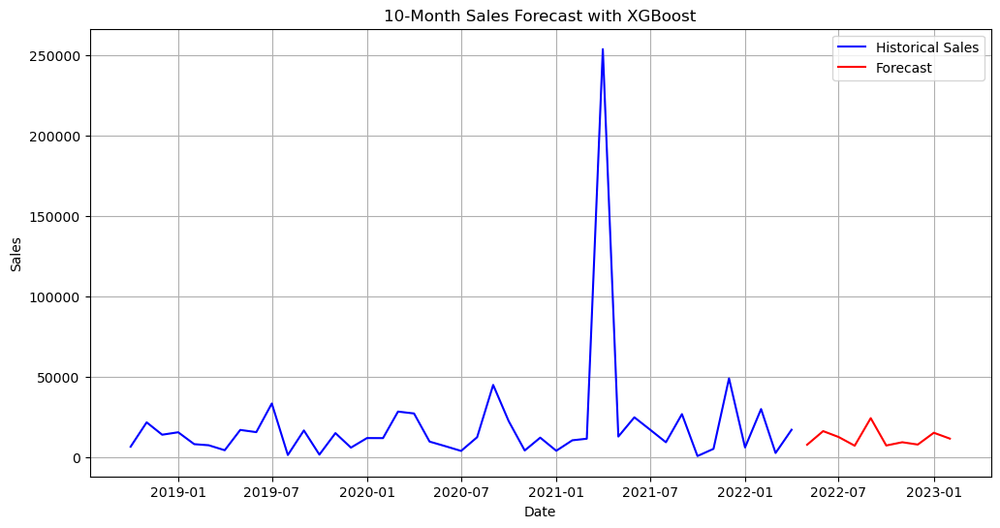

/var/folders/z6/_vn8cndd4x5dmx2cpjfdkjdr0000gn/T/ipykernel_48953/1787511409.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_set_36["Sales_EUR"] = results["yhat"]


,Mapped_GCK,Sales_EUR
Month Year,,
2022-05-01,#36,7698.423828
2022-06-01,#36,16155.743164
2022-07-01,#36,12490.781250
2022-08-01,#36,7095.064453
2022-09-01,#36,24219.142578
2022-10-01,#36,7229.186035
2022-11-01,#36,9246.683594
2022-12-01,#36,7809.204102
2023-01-01,#36,15140.524414


In [97]:
best_model, best_params, best_rmse, best_model_name = select_best_model(
    prophet_best_model_36, prophet_best_params_36, prophet_best_rmse_36, "Prophet",
    xgboost_best_model_36, xgboost_best_params_36, xgboost_best_rmse_36, "XGBoost"
    , sarima_best_model_36, sarima_best_params_36, sarima_best_rmse_36, "SARIMA"
)
print(f"Best Model: {best_model_name}")
print("Best Parameters:", best_params)
print("Best RMSE:", best_rmse)

if best_model_name == "XGBoost":
    results = xgboost_forecast(
        sales_agg36,
        df_market_36,
        period=10,
        params =best_params,
    )
elif best_model_name == "SARIMA":
    results = sarima_forecast(
        sales_agg36,
        period=10,
        params =best_params,
    )
else:
    results = prophet_forecast(
        sales_agg36,
        df_market_36,
        period=10,
        param =best_params,
    )
results.set_index('ds',inplace = True)
test_set_36.set_index('Month Year', inplace = True)
test_set_36["Sales_EUR"] = results["yhat"]
test_set_36

<hr>
<a class="anchor" id="export">

 ## 3. Export
 </a>

In [98]:
test_set_1 = test_set_1.reset_index()
test_set_3 = test_set_3.reset_index()
test_set_4 = test_set_4.reset_index()
test_set_5 = test_set_5.reset_index()
test_set_6 = test_set_6.reset_index()
test_set_8 = test_set_8.reset_index()
test_set_9 = test_set_9.reset_index()
test_set_11 = test_set_11.reset_index()
test_set_12 = test_set_12.reset_index()
test_set_13 = test_set_13.reset_index()
test_set_14 = test_set_14.reset_index()
test_set_16 = test_set_16.reset_index()
test_set_20 = test_set_20.reset_index()
test_set_36 = test_set_36.reset_index()

test_set = pd.concat([test_set_1, test_set_3, test_set_4, test_set_5, test_set_6, test_set_8, test_set_9,
                     test_set_11, test_set_12, test_set_13, test_set_14, test_set_16, test_set_20, test_set_36])
test_set



,Month Year,Mapped_GCK,Sales_EUR
0,2022-05-01,#1,3.872472e+07
1,2022-06-01,#1,3.663689e+07
2,2022-07-01,#1,3.721090e+07
3,2022-08-01,#1,3.741536e+07
4,2022-09-01,#1,3.555263e+07
...,...,...,...
5,2022-10-01,#36,7.229186e+03
6,2022-11-01,#36,9.246684e+03
7,2022-12-01,#36,7.809204e+03
8,2023-01-01,#36,1.514052e+04


In [99]:
def revert_month_year(date_obj):
    reverse_month_map = {
        1: "Jan",
        2: "Feb",
        3: "Mar",
        4: "Apr",
        5: "Mai",
        6: "Jun",
        7: "Jul",
        8: "Aug",
        9: "Sep",
        10: "Okt",
        11: "Nov",
        12: "Dez"
    }
    # Format as e.g. "Jan20" (adjust the format if a space is needed)
    return f"{reverse_month_map[date_obj.month]} {date_obj.strftime('%y')}"

# Revert the conversion on the 'Month Year' column
test_set['Month Year'] = test_set['Month Year'].apply(revert_month_year)

test_set.to_csv('../data/test_set_NovaIMS_BC_DA_GROUP_A.csv', index=False)